In [1]:
!pip install scikit-optimize

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

import statsmodels.stats.api as sms
from matplotlib import style
style.use('seaborn')
%matplotlib inline
#graphs in svg look clearer
%config InlineBackend.figure_format = 'svg' 

In [3]:
import warnings
warnings.filterwarnings("ignore")

# Functions

In [4]:
from sklearn import metrics

def mae(y_gt, Y_pr):
    return metrics.mean_absolute_error(y_gt, Y_pr)

def mse(y_gt, Y_pr):
    return metrics.mean_squared_error(y_gt, Y_pr)

def rmse(y_gt, Y_pr):
    my_mse = mse(y_gt, Y_pr)
    return np.sqrt(my_mse)

def medae(y_gt, Y_pr):
    return metrics.median_absolute_error(y_gt, Y_pr)

def R2(y_gt, Y_pr):
    return metrics.r2_score(y_gt, Y_pr)

def calc_metrics(true, pred):

    mse1 = mse(true, pred)

    rmse1 = rmse(true, pred)

    mae1 = mae(true, pred)

    medae1 = medae(true, pred)

    R21 = R2(true, pred)

    print('*** VAL **: ')
    print("MSE:   {}\nRMSE:  {}\nR2:    {}\nMAE:   {}\nMedAE: {}".format(mse1, rmse1, R21, mae1, medae1))
    print('-'*30)

In [5]:
def target_distr_linear(train_label, test_label, predicted_dv): 
    sns.kdeplot(train_label, label='train')
    sns.kdeplot(test_label, label='test')
    sns.kdeplot(predicted_dv, label='pred')
    plt.legend()
    plt.show()

    sns.scatterplot(test_label, predicted_dv, color='blueviolet')
    plt.title('Linear model')
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.show()

In [6]:
from scipy.stats import norm

def draw_histogram(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist);
    plt.xlabel("values")
    plt.title("Distribution") 

    mean=data.mean()

    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()

    plt.show()

In [7]:
def draw_res_analys(errors, pred):
    sns.scatterplot(list(range(len(errors))),errors);
    plt.title("Distibution of errors")
    plt.ylabel('Error');
    plt.xlabel('Index');
    plt.show();

    sns.scatterplot(pred,errors);
    plt.title('Relationship of true value vs error (resudual analysis)')
    plt.ylabel('Error');
    plt.xlabel('True value');
    plt.show();

In [8]:
def get_feature_imp(model, X_train):
    imp = model.get_feature_importance(data=X_train)
    fig, axes = plt.subplots(1, 1, figsize=(12, 8))
    axes.barh(width=imp, y=model.feature_names_)
    axes.set_title('Finetuned Catboost feature importance')
    plt.show()

# Unhashing

In [9]:
genre_mapping = {'0ef0aa70-f86c-4141-8054-8b39af97867d': 'Biography',
                '287a1485-7a88-4c2f-bc94-ca418b6c47a1': 'Cartoons',
                '66fad8c3-d84f-458d-a8bf-5b4f154969e0': 'Show',
                '7b7c97f6-1adb-4b43-bfe8-9455812fac0b': 'Theater',
                '9fa28b61-a257-4a3e-945b-a9ef76a146d6': 'Fantasy',
                'b0836a1d-635f-4d89-bcc5-25d10ba56642': 'Anime',
                'd7214feb-8c11-4aea-aabb-ac98a8d56fd5': 'History',
                'dc65dbc8-34ba-4df1-b32c-4f895e10bff8': 'Shorts',
                'eb001d27-5be3-4d42-9d88-90d593f2627d': 'War_movies',
                '364fdc2e-bdfe-40be-b2c5-d30f43ec432e': 'Crime'}

In [10]:
types_mapping = {'1f22ccf1-288a-4e6e-b39a-7502799e7125': 'Лекции',
    '6d640e04-be3a-4c8c-852e-4e9b12449d5d': 'Концерты',
    '7b7c97f6-1adb-4b43-bfe8-9455812fac0b': 'Театр',
    '2f7908cc-e2fd-43cf-b626-ec1aef436160': 'Курсы' }

In [11]:
import pickle

with open('./RATINGS_OKKO_item_coldstart_dataset.pkl', 'rb') as f:
    df = pickle.load(f, encoding='utf-8')

In [12]:
df.shape

(9323, 20)

In [13]:
all_genres = []

for item_genres in df['genre']:
    all_genres.extend(item_genres)

In [14]:
all_unique_genres = set(all_genres)

In [15]:
len(all_unique_genres)

32

In [16]:
all_unique_genres

{'0ef0aa70-f86c-4141-8054-8b39af97867d',
 '1f22ccf1-288a-4e6e-b39a-7502799e7125',
 '287a1485-7a88-4c2f-bc94-ca418b6c47a1',
 '364fdc2e-bdfe-40be-b2c5-d30f43ec432e',
 '3e6e08b4-2bb0-46d6-aee7-98780e394c86',
 '5c403894-146a-47a4-ae75-9f1956a30dbb',
 '66fad8c3-d84f-458d-a8bf-5b4f154969e0',
 '6d640e04-be3a-4c8c-852e-4e9b12449d5d',
 '7b7c97f6-1adb-4b43-bfe8-9455812fac0b',
 '9fa28b61-a257-4a3e-945b-a9ef76a146d6',
 'Action',
 'Adventure',
 'ArtHouse',
 'Comedy',
 'Detective',
 'Documentary',
 'Drama',
 'Family',
 'ForKids',
 'Horror',
 'Humor',
 'Melodrama',
 'Music',
 'Sci-Fi',
 'Sport',
 'Thriller',
 'Travel',
 'b0836a1d-635f-4d89-bcc5-25d10ba56642',
 'd7214feb-8c11-4aea-aabb-ac98a8d56fd5',
 'd7f6b51c-6ebe-4b9c-9aad-2c60792a7d9c',
 'dc65dbc8-34ba-4df1-b32c-4f895e10bff8',
 'eb001d27-5be3-4d42-9d88-90d593f2627d'}

In [17]:
decoded_genres = [genre_mapping.get(genre, genre) for genre in all_unique_genres]

In [18]:
decoded_genres

['Shorts',
 'Fantasy',
 'Comedy',
 'Travel',
 'Humor',
 'Documentary',
 '5c403894-146a-47a4-ae75-9f1956a30dbb',
 'Horror',
 'Detective',
 'Music',
 'Cartoons',
 'Action',
 'Sport',
 'ArtHouse',
 '3e6e08b4-2bb0-46d6-aee7-98780e394c86',
 'Biography',
 'Show',
 '1f22ccf1-288a-4e6e-b39a-7502799e7125',
 'Drama',
 'Adventure',
 'Family',
 'Melodrama',
 'War_movies',
 'd7f6b51c-6ebe-4b9c-9aad-2c60792a7d9c',
 'Thriller',
 'Sci-Fi',
 'Theater',
 '6d640e04-be3a-4c8c-852e-4e9b12449d5d',
 'Anime',
 'Crime',
 'History',
 'ForKids']

In [19]:
all_genres = []

for col in ['actor', 'country', 'genre', 'director']:
    print(f'======{col}======')
    all_values = []
    for i, item_values in enumerate(df[col]):
        try:
            all_values.extend(item_values)
        except:
            print(i, item_values)
    all_values = set(all_values)
    print('Len:', len(all_values))
    # print(all_values)

======actor======
Len: 28834
======country======
Len: 102
======genre======
Len: 32
======director======
Len: 6889


# Preprocessing

In [20]:
prep_df = df.copy(deep=True)

In [21]:
prep_df.shape

(9323, 20)

In [22]:
prep_df.head(1).T

,0
availability,[SUBSCRIPTION]
actor,"[cff3362f-ad91-498d-80b3-ea3ab8ec65cf, 30dd19c..."
age_access_type,18
country,[usa]
average_rating,6.99
duration,3780000
type,MOVIE
name,Прожарка Чарли Шина
release_year,2011
genre,"[Comedy, Documentary]"


### filter by year

In [23]:
prep_df = prep_df[prep_df['release_year'] >= 2000]

### ohe

In [24]:
def add_topN_feature(df, col, n: int):
    items = []
    
    for i in df[col]:
        items.extend(i)

    topN = [x[0] for x in Counter(items).most_common()][:n]
    df[f'top{n}{col}'] = df[col].apply(lambda x: [int(item in x) for item in topN])
    df.drop(col, axis=1, inplace=True)
    return topN, f'top{n}{col}'

def ohe_topN_features(df, topN, cat):
    for i in range(len(topN)):
        df[f'{topN[i]}'] = [item[i] for item in df[cat]]
    df.drop(cat, axis=1, inplace=True)
    return df

In [25]:
top10genres, name = add_topN_feature(prep_df, 'genre', 10)
prep_df = ohe_topN_features(prep_df, top10genres, name)

top10actors, name = add_topN_feature(prep_df, 'actor', 10)
prep_df = ohe_topN_features(prep_df, top10actors, name)

top3directors, name = add_topN_feature(prep_df, 'director', 3)
prep_df = ohe_topN_features(prep_df, top3directors, name)

top5countries, name = add_topN_feature(prep_df, 'country', 5)
prep_df = ohe_topN_features(prep_df, top5countries, name)

prep_df.dropna(subset=['availability'], inplace=True)

avail, name = add_topN_feature(prep_df, 'availability', len(prep_df['availability']))
prep_df = ohe_topN_features(prep_df, avail, name)

In [26]:
prep_df.drop('FVOD', axis=1, inplace=True)

In [27]:
prep_df.columns

Index(['age_access_type', 'average_rating', 'duration', 'type', 'name',
       'release_year', 'element_uid', 'subscription_only', 'av_rate_x',
       'av_rate_y', 'users_number_x', 'users_number_y', 'user_count_3months',
       'av_ratings_3months', 'min_ts', 'Drama', 'Comedy', 'Thriller', 'Action',
       '287a1485-7a88-4c2f-bc94-ca418b6c47a1', 'Adventure', 'Melodrama',
       '364fdc2e-bdfe-40be-b2c5-d30f43ec432e', 'Sci-Fi', 'Family',
       'd08bba89-e937-40f3-b2a7-7ea26de4c246',
       'fd401c6b-3e00-4f7f-aea7-5512df6b91e0',
       '5463b4bc-e332-415c-aca8-11c0f217a9eb',
       'fbdae856-85b9-4d4a-96dd-cc383571a488',
       '9703b641-2566-4e58-aebb-8d140805c0f3',
       '586f8d5a-2f17-42a3-b066-667f7c26a842',
       'dfd861c4-d2de-4bb6-bc6e-bae3f92a18a9',
       '43dc7096-090a-4c75-9e78-5f14da3ded36',
       '2ab01676-2af6-4abb-8dde-dc51e7e22372',
       'b6a30330-1dcb-4093-b6a9-ce0f779874c2',
       '751aebbe-2d4d-4421-bace-d44b8e10c8eb',
       'f7ded2b9-7c98-47ab-bfc4-57fb60bf9

In [33]:
cols = ['age_access_type', 'average_rating', 'duration', 'type', 'subscription_only',
       'Drama', 'Comedy', 'Thriller', 'Action',
       '287a1485-7a88-4c2f-bc94-ca418b6c47a1', 'Adventure', 'Melodrama',
       '364fdc2e-bdfe-40be-b2c5-d30f43ec432e', 'Sci-Fi', 'Family',
       'd08bba89-e937-40f3-b2a7-7ea26de4c246',
       'fd401c6b-3e00-4f7f-aea7-5512df6b91e0',
       '5463b4bc-e332-415c-aca8-11c0f217a9eb',
       'fbdae856-85b9-4d4a-96dd-cc383571a488',
       '9703b641-2566-4e58-aebb-8d140805c0f3',
       '586f8d5a-2f17-42a3-b066-667f7c26a842',
       'dfd861c4-d2de-4bb6-bc6e-bae3f92a18a9',
       '43dc7096-090a-4c75-9e78-5f14da3ded36',
       '2ab01676-2af6-4abb-8dde-dc51e7e22372',
       'b6a30330-1dcb-4093-b6a9-ce0f779874c2',
       '751aebbe-2d4d-4421-bace-d44b8e10c8eb',
       'f7ded2b9-7c98-47ab-bfc4-57fb60bf946c',
       '799561d3-10b0-420d-93be-8138a07ac693', 'usa', 'russia',
       'great-britain', 'france', 'germany', 'SUBSCRIPTION', 'DTO', 'RENT',
       'AVOD']

In [34]:
prep_df = prep_df[cols]

In [35]:
num_features = [ 'average_rating', 'duration']
skewed_num_features = ['duration'] 

In [36]:
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
from sklearn.model_selection import train_test_split
# from spacy.tokenizer import Tokenizer
# from spacy.lang.en import English
# nlp = English()
import pandas as pd

class Preprocesser:
    def __init__(self, 
#                 mulpiple_cat_features: list,
                skewed_num_features: list,
               # text_features: list,
               # release_year_feature: str,
#                 mltpl_cat_n_top: dict
                ):
#         self.mulpiple_cat_features = mulpiple_cat_features
        self.skewed_num_features = skewed_num_features
        #self.text_features = text_features
#         self.mltpl_cat_n_top = mltpl_cat_n_top
       # self.release_year_feature = release_year_feature
        # self.tokenizer = Tokenizer(nlp.vocab)
        
    def __get_top_n_mltpl_cat_features(self, df_pr, col):
        all_cats = []
        for element_values in df_pr[col]:
            all_cats.extend(element_values)
        return Counter(all_cats).most_common(self.mltpl_cat_n_top[col])
            
    def __preprocess_mulpiple_cat_features(self, df_pr):
        for col in self.mulpiple_cat_features:
            feature_number = self.mltpl_cat_n_top[col]
            df_pr[[f'{col}_{i}' for i in range(feature_number)]] = pd.DataFrame(np.full((len(df), feature_number), np.nan))
            for i in df_pr.index:
                names = df_pr.loc[i, col]
                for k, name in enumerate(names[:int(feature_number)]):
                    df_pr.loc[i, f'{col}_{k}'] = name
            df_pr.drop(col, axis=1, inplace=True)

        return df_pr
    
    def __preprocess_skewed_num_features(self, df_pr):
        for col in self.skewed_num_features:
            df_pr[col] = df_pr[col].apply(lambda x: np.log1p(x))
        return df_pr
    
    def __preprocess_text_features(self, df_pr):
        for col in self.text_features:
            df_pr[col] = df_pr[col].apply(lambda x: self.tokenizer(x))
        return df_pr
            
    def preprocess(self,
                   df: pd.DataFrame):
        df_pr = df.copy()
#         df_pr = self.__preprocess_mulpiple_cat_features(df_pr)
        df_pr = self.__preprocess_skewed_num_features(df_pr)
        # df_pr = self.__preprocess_text_features(df_pr)
        
        return df_pr
        

In [37]:
preprocesser = Preprocesser(
#     mltpl_cat_features,
            skewed_num_features,
            #text_features,
#             mltpl_cat_n_top
)

In [38]:
df_pr = preprocesser.preprocess(prep_df)

In [39]:
df_pr.head().T

,0,1,2,3,4
age_access_type,18,18,0,6,16
average_rating,6.99,6.0,6.21,6.4,NaN
duration,15.145235,15.145235,15.396549,15.523889,15.479437
type,MOVIE,MOVIE,MOVIE,MOVIE,MOVIE
subscription_only,True,True,True,True,False
Drama,0,0,0,0,1
Comedy,1,1,0,1,1
Thriller,0,0,0,0,0
Action,0,0,0,0,0
287a1485-7a88-4c2f-bc94-ca418b6c47a1,0,0,1,1,0


In [40]:
df_pr.isnull().sum()

age_access_type                           0
average_rating                          460
duration                                  0
type                                      0
subscription_only                         0
Drama                                     0
Comedy                                    0
Thriller                                  0
Action                                    0
287a1485-7a88-4c2f-bc94-ca418b6c47a1      0
Adventure                                 0
Melodrama                                 0
364fdc2e-bdfe-40be-b2c5-d30f43ec432e      0
Sci-Fi                                    0
Family                                    0
d08bba89-e937-40f3-b2a7-7ea26de4c246      0
fd401c6b-3e00-4f7f-aea7-5512df6b91e0      0
5463b4bc-e332-415c-aca8-11c0f217a9eb      0
fbdae856-85b9-4d4a-96dd-cc383571a488      0
9703b641-2566-4e58-aebb-8d140805c0f3      0
586f8d5a-2f17-42a3-b066-667f7c26a842      0
dfd861c4-d2de-4bb6-bc6e-bae3f92a18a9      0
43dc7096-090a-4c75-9e78-5f14da3d

In [41]:
df_pr['subscription_only'] = df_pr['subscription_only'].astype(int)

In [42]:
df_pr['average_rating'] = df_pr['average_rating'].astype(float)
# data['age_access_type'] =data['age_access_type'].astype(int)

### target destr

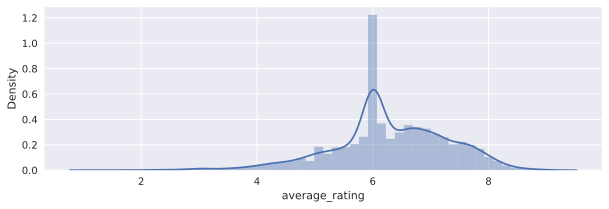

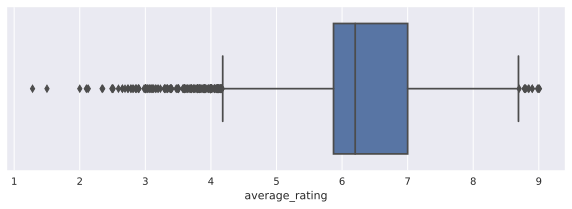

In [145]:
plt.figure(figsize=(10, 3))
sns.distplot(df_pr['average_rating'])
plt.show()

plt.figure(figsize=(10, 3))
sns.boxplot(df_pr['average_rating'], orient='h')
plt.show()

## Split

In [146]:
df_pr.shape

(7259, 37)

In [147]:
df_pr.dropna(inplace=True)

In [148]:
X, y = df_pr.drop('average_rating', axis=1), df_pr['average_rating']

In [149]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, shuffle=True)

In [150]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42, shuffle=True)

In [151]:
X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape

((5879, 36), (654, 36), (726, 36), (5879,), (654,), (726,))

### OHE

In [152]:
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(dtype='int8', handle_unknown='ignore')

enc_train = enc.fit_transform(X_train[['age_access_type', 'type']])

In [153]:
enc_train = pd.DataFrame(enc_train.toarray())

enc_train.columns = enc.get_feature_names_out(['age_access_type', 'type'])

X_train.drop(['age_access_type', 'type'], axis=1, inplace=True)
X_train = X_train.merge(enc_train, on=X_train.index, how='left', sort=False)

In [154]:
enc_test = enc.transform(X_test[['age_access_type', 'type']])

enc_test = pd.DataFrame(enc_test.toarray())

enc_test.columns = enc.get_feature_names_out(['age_access_type', 'type'])

X_test.drop(['age_access_type', 'type'], axis=1, inplace=True)
X_test = X_test.merge(enc_test, on=X_test.index, how='left', sort=False)

In [155]:
enc_val = enc.transform(X_val[['age_access_type', 'type']])

enc_val = pd.DataFrame(enc_val.toarray())

enc_val.columns = enc.get_feature_names_out(['age_access_type', 'type'])

X_val.drop(['age_access_type', 'type'], axis=1, inplace=True)
X_val = X_val.merge(enc_val, on=X_val.index, how='left', sort=False)

### Model

In [156]:
import catboost as cat
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from scipy.stats import uniform, randint

In [157]:
X_train.head(1)

,key_0,duration,subscription_only,Drama,Comedy,Thriller,Action,287a1485-7a88-4c2f-bc94-ca418b6c47a1,Adventure,Melodrama,...,RENT,AVOD,age_access_type_0,age_access_type_6,age_access_type_12,age_access_type_16,age_access_type_18,type_MOVIE,type_MP_MOVIE,type_SERIAL
0,6776,15.371548,0,0,0,0,0,1,1,0,...,1,0,0,1,0,0,0,1,0,0


In [71]:
X_train.drop('key_0', inplace=True, axis=1)
X_test.drop('key_0', inplace=True, axis=1)
X_val.drop('key_0', inplace=True, axis=1)

In [72]:
train_dataset = cat.Pool(data=X_train,
                        label=y_train,
#                          cat_features=cat_features
                        )

test_dataset = cat.Pool(data=X_test, 
                        label=y_test,
#                          cat_features=cat_features
                       )

val_dataset = cat.Pool(X_val, y_val,
#                        cat_features=cat_features
                      )

cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
#     'cat_features': cat_features
}

cat_model = cat.CatBoostRegressor(**cat_params)

cat_model.fit(
    train_dataset,
    eval_set=val_dataset,
    early_stopping_rounds=500,
    verbose=100,
    plot=False
)

Learning rate set to 0.067248
0:	learn: 0.7679513	test: 0.7548867	best: 0.7548867 (0)	total: 50.9ms	remaining: 50.9s
100:	learn: 0.5989088	test: 0.6276550	best: 0.6276550 (100)	total: 314ms	remaining: 2.79s
200:	learn: 0.5739974	test: 0.6170570	best: 0.6170570 (200)	total: 570ms	remaining: 2.27s
300:	learn: 0.5575644	test: 0.6119091	best: 0.6115524 (297)	total: 816ms	remaining: 1.9s
400:	learn: 0.5455337	test: 0.6094834	best: 0.6094834 (400)	total: 1.06s	remaining: 1.59s
500:	learn: 0.5342272	test: 0.6092696	best: 0.6081443 (470)	total: 1.29s	remaining: 1.28s
600:	learn: 0.5246552	test: 0.6088300	best: 0.6081443 (470)	total: 1.51s	remaining: 1s
700:	learn: 0.5155001	test: 0.6097830	best: 0.6081443 (470)	total: 1.75s	remaining: 748ms
800:	learn: 0.5076379	test: 0.6102484	best: 0.6081443 (470)	total: 1.97s	remaining: 490ms
900:	learn: 0.5010037	test: 0.6114118	best: 0.6081443 (470)	total: 2.3s	remaining: 252ms
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.608144266

In [73]:
y_pred = cat_model.predict(test_dataset)

In [74]:
calc_metrics(y_test, y_pred)

*** VAL **: 
MSE:   0.6054942127349129
RMSE:  0.778135086430957
R2:    0.3739709286518853
MAE:   0.5880910979597238
MedAE: 0.48368665336333283
------------------------------


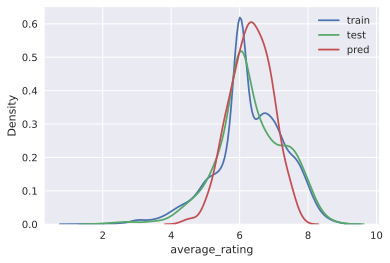

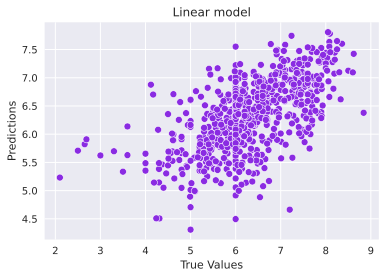

In [75]:
target_distr_linear(y_train, y_test, y_pred)   

In [76]:
cat_model.save_model('cat_reg_okko_ratings_ohe')

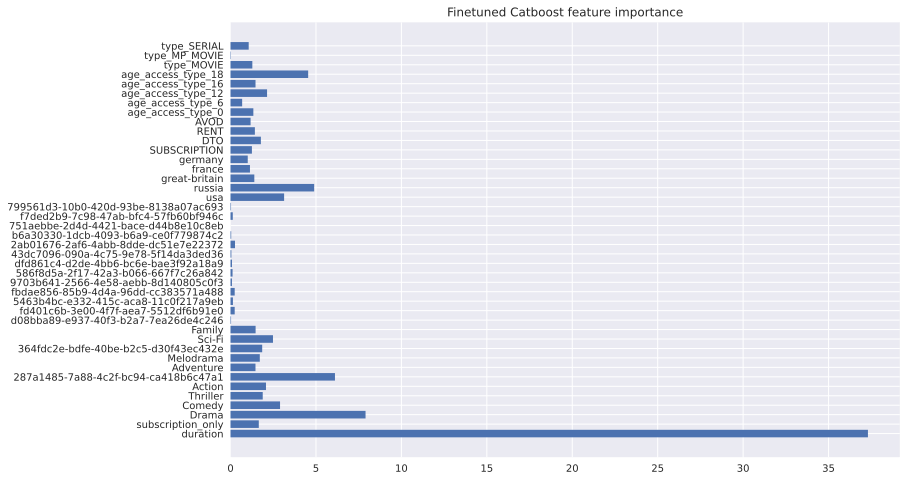

In [77]:
get_feature_imp(cat_model, train_dataset)

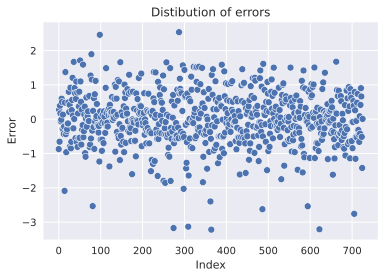

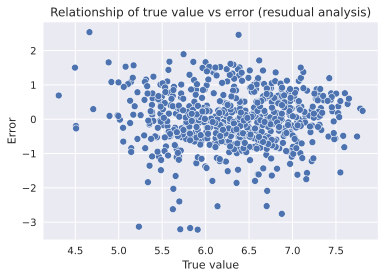

In [78]:
errors = y_test - y_pred
draw_res_analys(errors, y_pred)

# Tuning

In [79]:
train_dataset = cat.Pool(X_train, 
                         y_train,
#                          cat_features=cat_features
                        )

test_dataset = cat.Pool(X_test, 
                        y_test,
#                         cat_features=cat_features
                       )

cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
#     'cat_features': cat_features
}

In [80]:
parameters_distr = {'depth': randint(3, 7),
              'learning_rate': uniform(0.01, 0.1),
              'iterations': [100, 1000, 5000]
             }

cat_model = cat.CatBoostRegressor(**cat_params)
grid = RandomizedSearchCV(estimator=cat_model, param_distributions=parameters_distr, 
                            cv=5, 
#                           n_jobs=-1,
                          verbose=3)

grid.fit(X_train, y_train)

import pickle
with open('bestimator_ratings_okko_tune', 'wb') as f:
    pickle.dump(grid.best_estimator_, f)
grid.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
0:	learn: 0.7723255	total: 19.7ms	remaining: 1.95s
1:	learn: 0.7674094	total: 21.8ms	remaining: 1.07s
2:	learn: 0.7625670	total: 24.2ms	remaining: 781ms
3:	learn: 0.7576446	total: 25.6ms	remaining: 615ms
4:	learn: 0.7533230	total: 27.1ms	remaining: 515ms
5:	learn: 0.7489180	total: 28.6ms	remaining: 448ms
6:	learn: 0.7447849	total: 30ms	remaining: 399ms
7:	learn: 0.7413750	total: 31.5ms	remaining: 362ms
8:	learn: 0.7373682	total: 33.1ms	remaining: 334ms
9:	learn: 0.7334485	total: 35.8ms	remaining: 322ms
10:	learn: 0.7296171	total: 37.5ms	remaining: 303ms
11:	learn: 0.7264115	total: 41.7ms	remaining: 306ms
12:	learn: 0.7230819	total: 45.3ms	remaining: 303ms
13:	learn: 0.7202677	total: 50.7ms	remaining: 312ms
14:	learn: 0.7168398	total: 52.9ms	remaining: 300ms
15:	learn: 0.7137110	total: 54.7ms	remaining: 287ms
16:	learn: 0.7106230	total: 58.5ms	remaining: 285ms
17:	learn: 0.7072796	total: 63.9ms	remaining: 291ms
18:	learn: 0.70

24:	learn: 0.6973627	total: 60.9ms	remaining: 183ms
25:	learn: 0.6952517	total: 62.9ms	remaining: 179ms
26:	learn: 0.6929608	total: 64.4ms	remaining: 174ms
27:	learn: 0.6910959	total: 65.7ms	remaining: 169ms
28:	learn: 0.6891340	total: 67.1ms	remaining: 164ms
29:	learn: 0.6873681	total: 68.5ms	remaining: 160ms
30:	learn: 0.6857179	total: 70.3ms	remaining: 157ms
31:	learn: 0.6843052	total: 71.5ms	remaining: 152ms
32:	learn: 0.6829595	total: 72.7ms	remaining: 148ms
33:	learn: 0.6813960	total: 73.9ms	remaining: 144ms
34:	learn: 0.6799041	total: 77.3ms	remaining: 144ms
35:	learn: 0.6785747	total: 79.3ms	remaining: 141ms
36:	learn: 0.6771607	total: 80.5ms	remaining: 137ms
37:	learn: 0.6759294	total: 81.8ms	remaining: 134ms
38:	learn: 0.6747917	total: 83.2ms	remaining: 130ms
39:	learn: 0.6739074	total: 84.3ms	remaining: 126ms
40:	learn: 0.6728582	total: 85.5ms	remaining: 123ms
41:	learn: 0.6718120	total: 86.8ms	remaining: 120ms
42:	learn: 0.6709318	total: 88.1ms	remaining: 117ms
43:	learn: 0

49:	learn: 0.6664833	total: 105ms	remaining: 105ms
50:	learn: 0.6658190	total: 106ms	remaining: 102ms
51:	learn: 0.6650811	total: 107ms	remaining: 99ms
52:	learn: 0.6644489	total: 109ms	remaining: 96.2ms
53:	learn: 0.6636837	total: 110ms	remaining: 93.6ms
54:	learn: 0.6628336	total: 111ms	remaining: 90.9ms
55:	learn: 0.6620452	total: 112ms	remaining: 88.2ms
56:	learn: 0.6611794	total: 114ms	remaining: 85.6ms
57:	learn: 0.6605217	total: 115ms	remaining: 83ms
58:	learn: 0.6598696	total: 116ms	remaining: 80.6ms
59:	learn: 0.6593075	total: 117ms	remaining: 78.1ms
60:	learn: 0.6587194	total: 119ms	remaining: 75.8ms
61:	learn: 0.6582615	total: 120ms	remaining: 73.4ms
62:	learn: 0.6577696	total: 121ms	remaining: 71.1ms
63:	learn: 0.6571151	total: 123ms	remaining: 69.4ms
64:	learn: 0.6564140	total: 126ms	remaining: 67.6ms
65:	learn: 0.6559004	total: 127ms	remaining: 65.3ms
66:	learn: 0.6553496	total: 128ms	remaining: 63.1ms
67:	learn: 0.6547583	total: 129ms	remaining: 60.9ms
68:	learn: 0.65417

324:	learn: 0.6405438	total: 290ms	remaining: 4.17s
325:	learn: 0.6404651	total: 291ms	remaining: 4.17s
326:	learn: 0.6403689	total: 291ms	remaining: 4.17s
327:	learn: 0.6402943	total: 292ms	remaining: 4.16s
328:	learn: 0.6402846	total: 293ms	remaining: 4.16s
329:	learn: 0.6401752	total: 294ms	remaining: 4.16s
330:	learn: 0.6401181	total: 295ms	remaining: 4.16s
331:	learn: 0.6400205	total: 296ms	remaining: 4.16s
332:	learn: 0.6399233	total: 296ms	remaining: 4.15s
333:	learn: 0.6398481	total: 297ms	remaining: 4.15s
334:	learn: 0.6397592	total: 299ms	remaining: 4.16s
335:	learn: 0.6396512	total: 299ms	remaining: 4.16s
336:	learn: 0.6395773	total: 300ms	remaining: 4.15s
337:	learn: 0.6395066	total: 301ms	remaining: 4.15s
338:	learn: 0.6393635	total: 302ms	remaining: 4.15s
339:	learn: 0.6393154	total: 302ms	remaining: 4.14s
340:	learn: 0.6392552	total: 303ms	remaining: 4.14s
341:	learn: 0.6391521	total: 304ms	remaining: 4.14s
342:	learn: 0.6390737	total: 305ms	remaining: 4.13s
343:	learn: 

536:	learn: 0.6266638	total: 485ms	remaining: 4.03s
537:	learn: 0.6265699	total: 486ms	remaining: 4.03s
538:	learn: 0.6265251	total: 487ms	remaining: 4.03s
539:	learn: 0.6264524	total: 488ms	remaining: 4.03s
540:	learn: 0.6263447	total: 489ms	remaining: 4.03s
541:	learn: 0.6262868	total: 489ms	remaining: 4.02s
542:	learn: 0.6262300	total: 491ms	remaining: 4.03s
543:	learn: 0.6261874	total: 491ms	remaining: 4.02s
544:	learn: 0.6261401	total: 492ms	remaining: 4.02s
545:	learn: 0.6261015	total: 493ms	remaining: 4.02s
546:	learn: 0.6260134	total: 494ms	remaining: 4.02s
547:	learn: 0.6259123	total: 495ms	remaining: 4.02s
548:	learn: 0.6258622	total: 495ms	remaining: 4.01s
549:	learn: 0.6258318	total: 496ms	remaining: 4.01s
550:	learn: 0.6257801	total: 497ms	remaining: 4.01s
551:	learn: 0.6256873	total: 498ms	remaining: 4.01s
552:	learn: 0.6256659	total: 499ms	remaining: 4.01s
553:	learn: 0.6255963	total: 499ms	remaining: 4.01s
554:	learn: 0.6255223	total: 500ms	remaining: 4s
555:	learn: 0.6

742:	learn: 0.6176067	total: 681ms	remaining: 3.9s
743:	learn: 0.6175927	total: 682ms	remaining: 3.9s
744:	learn: 0.6174754	total: 683ms	remaining: 3.9s
745:	learn: 0.6174440	total: 684ms	remaining: 3.9s
746:	learn: 0.6174077	total: 684ms	remaining: 3.9s
747:	learn: 0.6173542	total: 685ms	remaining: 3.9s
748:	learn: 0.6173295	total: 686ms	remaining: 3.89s
749:	learn: 0.6172809	total: 687ms	remaining: 3.89s
750:	learn: 0.6172457	total: 688ms	remaining: 3.89s
751:	learn: 0.6172085	total: 688ms	remaining: 3.89s
752:	learn: 0.6171963	total: 689ms	remaining: 3.89s
753:	learn: 0.6171379	total: 690ms	remaining: 3.88s
754:	learn: 0.6170252	total: 691ms	remaining: 3.88s
755:	learn: 0.6168981	total: 692ms	remaining: 3.88s
756:	learn: 0.6168672	total: 692ms	remaining: 3.88s
757:	learn: 0.6168578	total: 693ms	remaining: 3.88s
758:	learn: 0.6168445	total: 694ms	remaining: 3.88s
759:	learn: 0.6168140	total: 695ms	remaining: 3.88s
760:	learn: 0.6167654	total: 695ms	remaining: 3.87s
761:	learn: 0.6166

959:	learn: 0.6096042	total: 876ms	remaining: 3.69s
960:	learn: 0.6095860	total: 877ms	remaining: 3.69s
961:	learn: 0.6095680	total: 878ms	remaining: 3.68s
962:	learn: 0.6095388	total: 879ms	remaining: 3.68s
963:	learn: 0.6095312	total: 879ms	remaining: 3.68s
964:	learn: 0.6094965	total: 880ms	remaining: 3.68s
965:	learn: 0.6094784	total: 881ms	remaining: 3.68s
966:	learn: 0.6094420	total: 882ms	remaining: 3.68s
967:	learn: 0.6094205	total: 883ms	remaining: 3.68s
968:	learn: 0.6094148	total: 884ms	remaining: 3.68s
969:	learn: 0.6093960	total: 885ms	remaining: 3.68s
970:	learn: 0.6093735	total: 886ms	remaining: 3.68s
971:	learn: 0.6092923	total: 887ms	remaining: 3.67s
972:	learn: 0.6092882	total: 888ms	remaining: 3.67s
973:	learn: 0.6091930	total: 889ms	remaining: 3.67s
974:	learn: 0.6091434	total: 889ms	remaining: 3.67s
975:	learn: 0.6091186	total: 890ms	remaining: 3.67s
976:	learn: 0.6090939	total: 891ms	remaining: 3.67s
977:	learn: 0.6090591	total: 892ms	remaining: 3.67s
978:	learn: 

1164:	learn: 0.6036163	total: 1.07s	remaining: 3.54s
1165:	learn: 0.6036034	total: 1.08s	remaining: 3.54s
1166:	learn: 0.6035865	total: 1.08s	remaining: 3.54s
1167:	learn: 0.6035725	total: 1.08s	remaining: 3.54s
1168:	learn: 0.6035654	total: 1.08s	remaining: 3.54s
1169:	learn: 0.6035073	total: 1.08s	remaining: 3.54s
1170:	learn: 0.6034811	total: 1.08s	remaining: 3.54s
1171:	learn: 0.6034595	total: 1.08s	remaining: 3.54s
1172:	learn: 0.6034458	total: 1.08s	remaining: 3.54s
1173:	learn: 0.6034266	total: 1.08s	remaining: 3.54s
1174:	learn: 0.6034150	total: 1.08s	remaining: 3.53s
1175:	learn: 0.6033849	total: 1.09s	remaining: 3.54s
1176:	learn: 0.6033821	total: 1.09s	remaining: 3.54s
1177:	learn: 0.6033723	total: 1.09s	remaining: 3.54s
1178:	learn: 0.6033525	total: 1.09s	remaining: 3.54s
1179:	learn: 0.6033335	total: 1.09s	remaining: 3.54s
1180:	learn: 0.6033039	total: 1.09s	remaining: 3.53s
1181:	learn: 0.6032970	total: 1.09s	remaining: 3.53s
1182:	learn: 0.6032828	total: 1.09s	remaining:

1335:	learn: 0.5994849	total: 1.27s	remaining: 3.49s
1336:	learn: 0.5994531	total: 1.27s	remaining: 3.49s
1337:	learn: 0.5994453	total: 1.27s	remaining: 3.49s
1338:	learn: 0.5994168	total: 1.28s	remaining: 3.49s
1339:	learn: 0.5994163	total: 1.28s	remaining: 3.49s
1340:	learn: 0.5994037	total: 1.28s	remaining: 3.49s
1341:	learn: 0.5993925	total: 1.28s	remaining: 3.48s
1342:	learn: 0.5993754	total: 1.28s	remaining: 3.48s
1343:	learn: 0.5993558	total: 1.28s	remaining: 3.48s
1344:	learn: 0.5993395	total: 1.28s	remaining: 3.48s
1345:	learn: 0.5993218	total: 1.28s	remaining: 3.48s
1346:	learn: 0.5992892	total: 1.28s	remaining: 3.48s
1347:	learn: 0.5992713	total: 1.28s	remaining: 3.48s
1348:	learn: 0.5992656	total: 1.28s	remaining: 3.48s
1349:	learn: 0.5992535	total: 1.28s	remaining: 3.47s
1350:	learn: 0.5992362	total: 1.28s	remaining: 3.47s
1351:	learn: 0.5992338	total: 1.29s	remaining: 3.47s
1352:	learn: 0.5992172	total: 1.29s	remaining: 3.47s
1353:	learn: 0.5991615	total: 1.29s	remaining:

1554:	learn: 0.5955246	total: 1.47s	remaining: 3.25s
1555:	learn: 0.5955141	total: 1.47s	remaining: 3.25s
1556:	learn: 0.5955066	total: 1.47s	remaining: 3.25s
1557:	learn: 0.5954942	total: 1.47s	remaining: 3.25s
1558:	learn: 0.5954693	total: 1.47s	remaining: 3.25s
1559:	learn: 0.5954618	total: 1.47s	remaining: 3.25s
1560:	learn: 0.5954450	total: 1.47s	remaining: 3.25s
1561:	learn: 0.5954371	total: 1.47s	remaining: 3.24s
1562:	learn: 0.5953654	total: 1.48s	remaining: 3.24s
1563:	learn: 0.5953580	total: 1.48s	remaining: 3.24s
1564:	learn: 0.5953307	total: 1.48s	remaining: 3.24s
1565:	learn: 0.5952793	total: 1.48s	remaining: 3.24s
1566:	learn: 0.5952647	total: 1.48s	remaining: 3.24s
1567:	learn: 0.5952431	total: 1.48s	remaining: 3.24s
1568:	learn: 0.5952354	total: 1.48s	remaining: 3.24s
1569:	learn: 0.5952108	total: 1.48s	remaining: 3.24s
1570:	learn: 0.5952012	total: 1.48s	remaining: 3.24s
1571:	learn: 0.5951568	total: 1.49s	remaining: 3.24s
1572:	learn: 0.5951358	total: 1.49s	remaining:

1895:	learn: 0.5901440	total: 1.86s	remaining: 3.04s
1896:	learn: 0.5901356	total: 1.86s	remaining: 3.04s
1897:	learn: 0.5901285	total: 1.86s	remaining: 3.04s
1898:	learn: 0.5901196	total: 1.86s	remaining: 3.04s
1899:	learn: 0.5900995	total: 1.86s	remaining: 3.04s
1900:	learn: 0.5900943	total: 1.86s	remaining: 3.04s
1901:	learn: 0.5900928	total: 1.87s	remaining: 3.04s
1902:	learn: 0.5900920	total: 1.87s	remaining: 3.04s
1903:	learn: 0.5900727	total: 1.87s	remaining: 3.04s
1904:	learn: 0.5900330	total: 1.87s	remaining: 3.04s
1905:	learn: 0.5899930	total: 1.87s	remaining: 3.03s
1906:	learn: 0.5899860	total: 1.87s	remaining: 3.03s
1907:	learn: 0.5899853	total: 1.87s	remaining: 3.03s
1908:	learn: 0.5899808	total: 1.87s	remaining: 3.03s
1909:	learn: 0.5899714	total: 1.87s	remaining: 3.03s
1910:	learn: 0.5899692	total: 1.87s	remaining: 3.03s
1911:	learn: 0.5899623	total: 1.87s	remaining: 3.02s
1912:	learn: 0.5899609	total: 1.87s	remaining: 3.02s
1913:	learn: 0.5899574	total: 1.87s	remaining:

2133:	learn: 0.5871068	total: 2.06s	remaining: 2.76s
2134:	learn: 0.5871028	total: 2.06s	remaining: 2.76s
2135:	learn: 0.5870824	total: 2.06s	remaining: 2.76s
2136:	learn: 0.5870737	total: 2.06s	remaining: 2.76s
2137:	learn: 0.5870422	total: 2.06s	remaining: 2.76s
2138:	learn: 0.5870341	total: 2.06s	remaining: 2.75s
2139:	learn: 0.5870208	total: 2.06s	remaining: 2.75s
2140:	learn: 0.5870156	total: 2.06s	remaining: 2.75s
2141:	learn: 0.5870143	total: 2.06s	remaining: 2.75s
2142:	learn: 0.5870076	total: 2.06s	remaining: 2.75s
2143:	learn: 0.5870008	total: 2.06s	remaining: 2.75s
2144:	learn: 0.5869949	total: 2.06s	remaining: 2.75s
2145:	learn: 0.5869880	total: 2.06s	remaining: 2.75s
2146:	learn: 0.5869804	total: 2.07s	remaining: 2.75s
2147:	learn: 0.5869642	total: 2.07s	remaining: 2.75s
2148:	learn: 0.5869353	total: 2.07s	remaining: 2.74s
2149:	learn: 0.5869154	total: 2.07s	remaining: 2.74s
2150:	learn: 0.5869058	total: 2.07s	remaining: 2.74s
2151:	learn: 0.5869044	total: 2.07s	remaining:

2355:	learn: 0.5845007	total: 2.25s	remaining: 2.53s
2356:	learn: 0.5844954	total: 2.25s	remaining: 2.52s
2357:	learn: 0.5844916	total: 2.25s	remaining: 2.52s
2358:	learn: 0.5844912	total: 2.25s	remaining: 2.52s
2359:	learn: 0.5844886	total: 2.25s	remaining: 2.52s
2360:	learn: 0.5844605	total: 2.25s	remaining: 2.52s
2361:	learn: 0.5844454	total: 2.26s	remaining: 2.52s
2362:	learn: 0.5844294	total: 2.26s	remaining: 2.52s
2363:	learn: 0.5844247	total: 2.26s	remaining: 2.52s
2364:	learn: 0.5844064	total: 2.26s	remaining: 2.52s
2365:	learn: 0.5843905	total: 2.26s	remaining: 2.52s
2366:	learn: 0.5843760	total: 2.26s	remaining: 2.51s
2367:	learn: 0.5843613	total: 2.26s	remaining: 2.51s
2368:	learn: 0.5843450	total: 2.26s	remaining: 2.51s
2369:	learn: 0.5843331	total: 2.26s	remaining: 2.51s
2370:	learn: 0.5843227	total: 2.26s	remaining: 2.51s
2371:	learn: 0.5842980	total: 2.26s	remaining: 2.51s
2372:	learn: 0.5842881	total: 2.27s	remaining: 2.51s
2373:	learn: 0.5842802	total: 2.27s	remaining:

2598:	learn: 0.5819993	total: 2.45s	remaining: 2.26s
2599:	learn: 0.5819927	total: 2.45s	remaining: 2.26s
2600:	learn: 0.5819896	total: 2.45s	remaining: 2.26s
2601:	learn: 0.5819779	total: 2.45s	remaining: 2.26s
2602:	learn: 0.5819696	total: 2.45s	remaining: 2.25s
2603:	learn: 0.5819613	total: 2.45s	remaining: 2.25s
2604:	learn: 0.5819428	total: 2.45s	remaining: 2.25s
2605:	learn: 0.5819366	total: 2.45s	remaining: 2.25s
2606:	learn: 0.5819243	total: 2.46s	remaining: 2.25s
2607:	learn: 0.5819238	total: 2.46s	remaining: 2.25s
2608:	learn: 0.5819209	total: 2.46s	remaining: 2.25s
2609:	learn: 0.5819158	total: 2.46s	remaining: 2.25s
2610:	learn: 0.5818850	total: 2.46s	remaining: 2.25s
2611:	learn: 0.5818694	total: 2.46s	remaining: 2.25s
2612:	learn: 0.5818666	total: 2.46s	remaining: 2.25s
2613:	learn: 0.5818663	total: 2.46s	remaining: 2.25s
2614:	learn: 0.5818635	total: 2.46s	remaining: 2.24s
2615:	learn: 0.5818607	total: 2.46s	remaining: 2.24s
2616:	learn: 0.5818344	total: 2.46s	remaining:

2811:	learn: 0.5796721	total: 2.64s	remaining: 2.06s
2812:	learn: 0.5796579	total: 2.64s	remaining: 2.05s
2813:	learn: 0.5796567	total: 2.64s	remaining: 2.05s
2814:	learn: 0.5796549	total: 2.64s	remaining: 2.05s
2815:	learn: 0.5796407	total: 2.64s	remaining: 2.05s
2816:	learn: 0.5796251	total: 2.65s	remaining: 2.05s
2817:	learn: 0.5796225	total: 2.65s	remaining: 2.05s
2818:	learn: 0.5796104	total: 2.65s	remaining: 2.05s
2819:	learn: 0.5795995	total: 2.65s	remaining: 2.05s
2820:	learn: 0.5795783	total: 2.65s	remaining: 2.04s
2821:	learn: 0.5795717	total: 2.65s	remaining: 2.04s
2822:	learn: 0.5795325	total: 2.65s	remaining: 2.04s
2823:	learn: 0.5795277	total: 2.65s	remaining: 2.04s
2824:	learn: 0.5795126	total: 2.65s	remaining: 2.04s
2825:	learn: 0.5794858	total: 2.65s	remaining: 2.04s
2826:	learn: 0.5794833	total: 2.65s	remaining: 2.04s
2827:	learn: 0.5794572	total: 2.65s	remaining: 2.04s
2828:	learn: 0.5794530	total: 2.66s	remaining: 2.04s
2829:	learn: 0.5794505	total: 2.66s	remaining:

3010:	learn: 0.5776759	total: 2.84s	remaining: 1.87s
3011:	learn: 0.5776640	total: 2.84s	remaining: 1.87s
3012:	learn: 0.5776566	total: 2.84s	remaining: 1.87s
3013:	learn: 0.5776503	total: 2.84s	remaining: 1.87s
3014:	learn: 0.5776499	total: 2.84s	remaining: 1.87s
3015:	learn: 0.5776343	total: 2.84s	remaining: 1.87s
3016:	learn: 0.5776266	total: 2.84s	remaining: 1.87s
3017:	learn: 0.5776243	total: 2.84s	remaining: 1.87s
3018:	learn: 0.5776163	total: 2.85s	remaining: 1.87s
3019:	learn: 0.5776057	total: 2.85s	remaining: 1.87s
3020:	learn: 0.5775938	total: 2.85s	remaining: 1.86s
3021:	learn: 0.5775818	total: 2.85s	remaining: 1.86s
3022:	learn: 0.5775792	total: 2.85s	remaining: 1.86s
3023:	learn: 0.5775639	total: 2.85s	remaining: 1.86s
3024:	learn: 0.5775460	total: 2.85s	remaining: 1.86s
3025:	learn: 0.5775411	total: 2.85s	remaining: 1.86s
3026:	learn: 0.5775388	total: 2.85s	remaining: 1.86s
3027:	learn: 0.5775384	total: 2.85s	remaining: 1.86s
3028:	learn: 0.5775230	total: 2.85s	remaining:

3246:	learn: 0.5755285	total: 3.03s	remaining: 1.64s
3247:	learn: 0.5755235	total: 3.03s	remaining: 1.64s
3248:	learn: 0.5755134	total: 3.04s	remaining: 1.64s
3249:	learn: 0.5755107	total: 3.04s	remaining: 1.63s
3250:	learn: 0.5754985	total: 3.04s	remaining: 1.63s
3251:	learn: 0.5754956	total: 3.04s	remaining: 1.63s
3252:	learn: 0.5754910	total: 3.04s	remaining: 1.63s
3253:	learn: 0.5754889	total: 3.04s	remaining: 1.63s
3254:	learn: 0.5754820	total: 3.04s	remaining: 1.63s
3255:	learn: 0.5754731	total: 3.04s	remaining: 1.63s
3256:	learn: 0.5754706	total: 3.04s	remaining: 1.63s
3257:	learn: 0.5754636	total: 3.04s	remaining: 1.63s
3258:	learn: 0.5754589	total: 3.04s	remaining: 1.63s
3259:	learn: 0.5754462	total: 3.04s	remaining: 1.62s
3260:	learn: 0.5754398	total: 3.04s	remaining: 1.62s
3261:	learn: 0.5754238	total: 3.04s	remaining: 1.62s
3262:	learn: 0.5754258	total: 3.04s	remaining: 1.62s
3263:	learn: 0.5754165	total: 3.05s	remaining: 1.62s
3264:	learn: 0.5754090	total: 3.05s	remaining:

3487:	learn: 0.5735404	total: 3.23s	remaining: 1.4s
3488:	learn: 0.5735243	total: 3.23s	remaining: 1.4s
3489:	learn: 0.5734783	total: 3.23s	remaining: 1.4s
3490:	learn: 0.5734787	total: 3.23s	remaining: 1.4s
3491:	learn: 0.5734728	total: 3.23s	remaining: 1.4s
3492:	learn: 0.5734686	total: 3.23s	remaining: 1.39s
3493:	learn: 0.5734636	total: 3.23s	remaining: 1.39s
3494:	learn: 0.5734578	total: 3.23s	remaining: 1.39s
3495:	learn: 0.5734546	total: 3.24s	remaining: 1.39s
3496:	learn: 0.5734491	total: 3.24s	remaining: 1.39s
3497:	learn: 0.5734390	total: 3.24s	remaining: 1.39s
3498:	learn: 0.5734344	total: 3.24s	remaining: 1.39s
3499:	learn: 0.5734181	total: 3.24s	remaining: 1.39s
3500:	learn: 0.5734146	total: 3.24s	remaining: 1.39s
3501:	learn: 0.5734092	total: 3.24s	remaining: 1.39s
3502:	learn: 0.5734029	total: 3.24s	remaining: 1.39s
3503:	learn: 0.5733906	total: 3.24s	remaining: 1.38s
3504:	learn: 0.5733763	total: 3.24s	remaining: 1.38s
3505:	learn: 0.5733773	total: 3.24s	remaining: 1.38

3716:	learn: 0.5715628	total: 3.42s	remaining: 1.18s
3717:	learn: 0.5715609	total: 3.43s	remaining: 1.18s
3718:	learn: 0.5715499	total: 3.44s	remaining: 1.18s
3719:	learn: 0.5715437	total: 3.44s	remaining: 1.18s
3720:	learn: 0.5715344	total: 3.44s	remaining: 1.18s
3721:	learn: 0.5715286	total: 3.44s	remaining: 1.18s
3722:	learn: 0.5715267	total: 3.44s	remaining: 1.18s
3723:	learn: 0.5715261	total: 3.44s	remaining: 1.18s
3724:	learn: 0.5715243	total: 3.44s	remaining: 1.18s
3725:	learn: 0.5714838	total: 3.45s	remaining: 1.18s
3726:	learn: 0.5714792	total: 3.45s	remaining: 1.18s
3727:	learn: 0.5714696	total: 3.45s	remaining: 1.18s
3728:	learn: 0.5714698	total: 3.45s	remaining: 1.18s
3729:	learn: 0.5714657	total: 3.45s	remaining: 1.17s
3730:	learn: 0.5714517	total: 3.45s	remaining: 1.17s
3731:	learn: 0.5714443	total: 3.45s	remaining: 1.17s
3732:	learn: 0.5714413	total: 3.45s	remaining: 1.17s
3733:	learn: 0.5714333	total: 3.45s	remaining: 1.17s
3734:	learn: 0.5714159	total: 3.45s	remaining:

3879:	learn: 0.5702675	total: 3.62s	remaining: 1.04s
3880:	learn: 0.5702644	total: 3.62s	remaining: 1.04s
3881:	learn: 0.5702561	total: 3.63s	remaining: 1.04s
3882:	learn: 0.5702534	total: 3.63s	remaining: 1.04s
3883:	learn: 0.5702157	total: 3.63s	remaining: 1.04s
3884:	learn: 0.5702151	total: 3.63s	remaining: 1.04s
3885:	learn: 0.5702063	total: 3.63s	remaining: 1.04s
3886:	learn: 0.5701982	total: 3.64s	remaining: 1.04s
3887:	learn: 0.5701933	total: 3.64s	remaining: 1.04s
3888:	learn: 0.5701847	total: 3.64s	remaining: 1.04s
3889:	learn: 0.5701846	total: 3.64s	remaining: 1.04s
3890:	learn: 0.5701753	total: 3.64s	remaining: 1.04s
3891:	learn: 0.5701691	total: 3.65s	remaining: 1.04s
3892:	learn: 0.5701673	total: 3.65s	remaining: 1.04s
3893:	learn: 0.5701606	total: 3.65s	remaining: 1.04s
3894:	learn: 0.5701519	total: 3.65s	remaining: 1.03s
3895:	learn: 0.5701504	total: 3.65s	remaining: 1.03s
3896:	learn: 0.5701365	total: 3.65s	remaining: 1.03s
3897:	learn: 0.5701354	total: 3.65s	remaining:

4059:	learn: 0.5689594	total: 3.82s	remaining: 884ms
4060:	learn: 0.5689539	total: 3.82s	remaining: 883ms
4061:	learn: 0.5689346	total: 3.82s	remaining: 882ms
4062:	learn: 0.5689328	total: 3.82s	remaining: 881ms
4063:	learn: 0.5689121	total: 3.82s	remaining: 880ms
4064:	learn: 0.5689017	total: 3.82s	remaining: 879ms
4065:	learn: 0.5688964	total: 3.82s	remaining: 878ms
4066:	learn: 0.5688906	total: 3.82s	remaining: 877ms
4067:	learn: 0.5688796	total: 3.82s	remaining: 876ms
4068:	learn: 0.5688738	total: 3.82s	remaining: 875ms
4069:	learn: 0.5688661	total: 3.83s	remaining: 874ms
4070:	learn: 0.5688533	total: 3.83s	remaining: 873ms
4071:	learn: 0.5688523	total: 3.83s	remaining: 873ms
4072:	learn: 0.5688418	total: 3.83s	remaining: 872ms
4073:	learn: 0.5688393	total: 3.83s	remaining: 871ms
4074:	learn: 0.5688336	total: 3.83s	remaining: 870ms
4075:	learn: 0.5688275	total: 3.83s	remaining: 869ms
4076:	learn: 0.5688155	total: 3.83s	remaining: 868ms
4077:	learn: 0.5688114	total: 3.84s	remaining:

4256:	learn: 0.5674508	total: 4.01s	remaining: 700ms
4257:	learn: 0.5674439	total: 4.01s	remaining: 699ms
4258:	learn: 0.5674376	total: 4.01s	remaining: 698ms
4259:	learn: 0.5674309	total: 4.01s	remaining: 698ms
4260:	learn: 0.5674181	total: 4.02s	remaining: 697ms
4261:	learn: 0.5674066	total: 4.02s	remaining: 696ms
4262:	learn: 0.5673978	total: 4.02s	remaining: 695ms
4263:	learn: 0.5673910	total: 4.02s	remaining: 694ms
4264:	learn: 0.5673904	total: 4.02s	remaining: 693ms
4265:	learn: 0.5673900	total: 4.02s	remaining: 692ms
4266:	learn: 0.5673865	total: 4.02s	remaining: 691ms
4267:	learn: 0.5673779	total: 4.02s	remaining: 690ms
4268:	learn: 0.5673662	total: 4.02s	remaining: 689ms
4269:	learn: 0.5673608	total: 4.02s	remaining: 688ms
4270:	learn: 0.5673413	total: 4.03s	remaining: 687ms
4271:	learn: 0.5673366	total: 4.03s	remaining: 686ms
4272:	learn: 0.5673312	total: 4.03s	remaining: 685ms
4273:	learn: 0.5673227	total: 4.03s	remaining: 684ms
4274:	learn: 0.5673190	total: 4.03s	remaining:

4480:	learn: 0.5659319	total: 4.21s	remaining: 487ms
4481:	learn: 0.5659272	total: 4.21s	remaining: 486ms
4482:	learn: 0.5659220	total: 4.21s	remaining: 485ms
4483:	learn: 0.5659119	total: 4.21s	remaining: 484ms
4484:	learn: 0.5659129	total: 4.21s	remaining: 484ms
4485:	learn: 0.5659124	total: 4.21s	remaining: 483ms
4486:	learn: 0.5659031	total: 4.21s	remaining: 482ms
4487:	learn: 0.5658932	total: 4.21s	remaining: 481ms
4488:	learn: 0.5658786	total: 4.21s	remaining: 480ms
4489:	learn: 0.5658712	total: 4.21s	remaining: 479ms
4490:	learn: 0.5658686	total: 4.21s	remaining: 478ms
4491:	learn: 0.5658647	total: 4.22s	remaining: 477ms
4492:	learn: 0.5658565	total: 4.22s	remaining: 476ms
4493:	learn: 0.5658517	total: 4.22s	remaining: 475ms
4494:	learn: 0.5658424	total: 4.22s	remaining: 474ms
4495:	learn: 0.5658374	total: 4.22s	remaining: 473ms
4496:	learn: 0.5658350	total: 4.22s	remaining: 472ms
4497:	learn: 0.5658299	total: 4.22s	remaining: 471ms
4498:	learn: 0.5658277	total: 4.22s	remaining:

4706:	learn: 0.5645848	total: 4.4s	remaining: 274ms
4707:	learn: 0.5645838	total: 4.4s	remaining: 273ms
4708:	learn: 0.5645758	total: 4.41s	remaining: 272ms
4709:	learn: 0.5645753	total: 4.41s	remaining: 271ms
4710:	learn: 0.5645681	total: 4.41s	remaining: 270ms
4711:	learn: 0.5645674	total: 4.41s	remaining: 269ms
4712:	learn: 0.5645645	total: 4.41s	remaining: 268ms
4713:	learn: 0.5645506	total: 4.41s	remaining: 268ms
4714:	learn: 0.5645438	total: 4.41s	remaining: 267ms
4715:	learn: 0.5645417	total: 4.41s	remaining: 266ms
4716:	learn: 0.5645229	total: 4.41s	remaining: 265ms
4717:	learn: 0.5645019	total: 4.41s	remaining: 264ms
4718:	learn: 0.5644949	total: 4.41s	remaining: 263ms
4719:	learn: 0.5644854	total: 4.41s	remaining: 262ms
4720:	learn: 0.5644669	total: 4.41s	remaining: 261ms
4721:	learn: 0.5644608	total: 4.42s	remaining: 260ms
4722:	learn: 0.5644516	total: 4.42s	remaining: 259ms
4723:	learn: 0.5644495	total: 4.42s	remaining: 258ms
4724:	learn: 0.5644460	total: 4.42s	remaining: 2

4944:	learn: 0.5630415	total: 4.6s	remaining: 51.1ms
4945:	learn: 0.5630295	total: 4.6s	remaining: 50.2ms
4946:	learn: 0.5630287	total: 4.6s	remaining: 49.3ms
4947:	learn: 0.5630253	total: 4.6s	remaining: 48.4ms
4948:	learn: 0.5630216	total: 4.6s	remaining: 47.4ms
4949:	learn: 0.5630153	total: 4.6s	remaining: 46.5ms
4950:	learn: 0.5630113	total: 4.6s	remaining: 45.6ms
4951:	learn: 0.5630045	total: 4.61s	remaining: 44.6ms
4952:	learn: 0.5630011	total: 4.61s	remaining: 43.7ms
4953:	learn: 0.5630002	total: 4.61s	remaining: 42.8ms
4954:	learn: 0.5629939	total: 4.61s	remaining: 41.8ms
4955:	learn: 0.5629827	total: 4.61s	remaining: 40.9ms
4956:	learn: 0.5629723	total: 4.61s	remaining: 40ms
4957:	learn: 0.5629640	total: 4.61s	remaining: 39ms
4958:	learn: 0.5629615	total: 4.61s	remaining: 38.1ms
4959:	learn: 0.5629557	total: 4.61s	remaining: 37.2ms
4960:	learn: 0.5629438	total: 4.61s	remaining: 36.3ms
4961:	learn: 0.5629410	total: 4.61s	remaining: 35.3ms
4962:	learn: 0.5629334	total: 4.61s	rem

172:	learn: 0.6633724	total: 278ms	remaining: 7.76s
173:	learn: 0.6631710	total: 280ms	remaining: 7.76s
174:	learn: 0.6630347	total: 281ms	remaining: 7.75s
175:	learn: 0.6628560	total: 286ms	remaining: 7.84s
176:	learn: 0.6626623	total: 287ms	remaining: 7.83s
177:	learn: 0.6625103	total: 288ms	remaining: 7.81s
178:	learn: 0.6623862	total: 289ms	remaining: 7.79s
179:	learn: 0.6622421	total: 290ms	remaining: 7.78s
180:	learn: 0.6620386	total: 292ms	remaining: 7.76s
181:	learn: 0.6619339	total: 293ms	remaining: 7.75s
182:	learn: 0.6617916	total: 294ms	remaining: 7.73s
183:	learn: 0.6616022	total: 295ms	remaining: 7.73s
184:	learn: 0.6614011	total: 296ms	remaining: 7.71s
185:	learn: 0.6613166	total: 297ms	remaining: 7.7s
186:	learn: 0.6612344	total: 299ms	remaining: 7.68s
187:	learn: 0.6610588	total: 300ms	remaining: 7.67s
188:	learn: 0.6609032	total: 301ms	remaining: 7.66s
189:	learn: 0.6607527	total: 302ms	remaining: 7.64s
190:	learn: 0.6605633	total: 303ms	remaining: 7.63s
191:	learn: 0

533:	learn: 0.6344460	total: 672ms	remaining: 5.62s
534:	learn: 0.6343805	total: 673ms	remaining: 5.62s
535:	learn: 0.6343408	total: 674ms	remaining: 5.62s
536:	learn: 0.6343068	total: 675ms	remaining: 5.61s
537:	learn: 0.6342891	total: 677ms	remaining: 5.61s
538:	learn: 0.6342514	total: 678ms	remaining: 5.61s
539:	learn: 0.6341295	total: 679ms	remaining: 5.61s
540:	learn: 0.6340866	total: 680ms	remaining: 5.6s
541:	learn: 0.6340565	total: 681ms	remaining: 5.6s
542:	learn: 0.6339916	total: 682ms	remaining: 5.59s
543:	learn: 0.6339493	total: 683ms	remaining: 5.59s
544:	learn: 0.6338593	total: 683ms	remaining: 5.59s
545:	learn: 0.6337990	total: 684ms	remaining: 5.58s
546:	learn: 0.6337326	total: 685ms	remaining: 5.58s
547:	learn: 0.6336982	total: 686ms	remaining: 5.57s
548:	learn: 0.6336785	total: 687ms	remaining: 5.57s
549:	learn: 0.6336234	total: 688ms	remaining: 5.57s
550:	learn: 0.6335701	total: 689ms	remaining: 5.56s
551:	learn: 0.6334920	total: 690ms	remaining: 5.56s
552:	learn: 0.

708:	learn: 0.6266034	total: 870ms	remaining: 5.26s
709:	learn: 0.6265724	total: 871ms	remaining: 5.26s
710:	learn: 0.6265380	total: 871ms	remaining: 5.26s
711:	learn: 0.6264842	total: 872ms	remaining: 5.25s
712:	learn: 0.6264671	total: 873ms	remaining: 5.25s
713:	learn: 0.6264297	total: 874ms	remaining: 5.25s
714:	learn: 0.6264013	total: 875ms	remaining: 5.24s
715:	learn: 0.6263734	total: 875ms	remaining: 5.24s
716:	learn: 0.6263418	total: 876ms	remaining: 5.23s
717:	learn: 0.6263090	total: 877ms	remaining: 5.23s
718:	learn: 0.6262915	total: 878ms	remaining: 5.23s
719:	learn: 0.6262761	total: 879ms	remaining: 5.22s
720:	learn: 0.6262166	total: 879ms	remaining: 5.22s
721:	learn: 0.6262034	total: 880ms	remaining: 5.21s
722:	learn: 0.6261800	total: 881ms	remaining: 5.21s
723:	learn: 0.6261289	total: 882ms	remaining: 5.21s
724:	learn: 0.6260706	total: 882ms	remaining: 5.2s
725:	learn: 0.6260315	total: 883ms	remaining: 5.2s
726:	learn: 0.6259550	total: 884ms	remaining: 5.2s
727:	learn: 0.6

942:	learn: 0.6189743	total: 1.06s	remaining: 4.58s
943:	learn: 0.6189096	total: 1.07s	remaining: 4.59s
944:	learn: 0.6188813	total: 1.07s	remaining: 4.59s
945:	learn: 0.6188695	total: 1.07s	remaining: 4.58s
946:	learn: 0.6188419	total: 1.07s	remaining: 4.58s
947:	learn: 0.6187433	total: 1.07s	remaining: 4.58s
948:	learn: 0.6187162	total: 1.07s	remaining: 4.58s
949:	learn: 0.6186953	total: 1.07s	remaining: 4.58s
950:	learn: 0.6186436	total: 1.07s	remaining: 4.57s
951:	learn: 0.6186168	total: 1.07s	remaining: 4.57s
952:	learn: 0.6185649	total: 1.07s	remaining: 4.57s
953:	learn: 0.6185222	total: 1.08s	remaining: 4.57s
954:	learn: 0.6185032	total: 1.08s	remaining: 4.56s
955:	learn: 0.6185037	total: 1.08s	remaining: 4.56s
956:	learn: 0.6184882	total: 1.08s	remaining: 4.56s
957:	learn: 0.6184733	total: 1.08s	remaining: 4.56s
958:	learn: 0.6184630	total: 1.08s	remaining: 4.55s
959:	learn: 0.6184385	total: 1.08s	remaining: 4.55s
960:	learn: 0.6184236	total: 1.08s	remaining: 4.55s
961:	learn: 

1148:	learn: 0.6135148	total: 1.26s	remaining: 4.22s
1149:	learn: 0.6135008	total: 1.26s	remaining: 4.22s
1150:	learn: 0.6134734	total: 1.26s	remaining: 4.22s
1151:	learn: 0.6134052	total: 1.26s	remaining: 4.22s
1152:	learn: 0.6133946	total: 1.26s	remaining: 4.22s
1153:	learn: 0.6133831	total: 1.26s	remaining: 4.21s
1154:	learn: 0.6133837	total: 1.27s	remaining: 4.21s
1155:	learn: 0.6133514	total: 1.27s	remaining: 4.21s
1156:	learn: 0.6133437	total: 1.27s	remaining: 4.21s
1157:	learn: 0.6133220	total: 1.27s	remaining: 4.21s
1158:	learn: 0.6133124	total: 1.27s	remaining: 4.21s
1159:	learn: 0.6132980	total: 1.27s	remaining: 4.2s
1160:	learn: 0.6132203	total: 1.27s	remaining: 4.2s
1161:	learn: 0.6131923	total: 1.27s	remaining: 4.2s
1162:	learn: 0.6131708	total: 1.27s	remaining: 4.2s
1163:	learn: 0.6131461	total: 1.27s	remaining: 4.2s
1164:	learn: 0.6131197	total: 1.27s	remaining: 4.19s
1165:	learn: 0.6131004	total: 1.27s	remaining: 4.19s
1166:	learn: 0.6130897	total: 1.27s	remaining: 4.19

1338:	learn: 0.6090037	total: 1.46s	remaining: 3.99s
1339:	learn: 0.6089945	total: 1.46s	remaining: 3.98s
1340:	learn: 0.6089636	total: 1.46s	remaining: 3.98s
1341:	learn: 0.6089492	total: 1.46s	remaining: 3.98s
1342:	learn: 0.6089187	total: 1.46s	remaining: 3.98s
1343:	learn: 0.6089124	total: 1.46s	remaining: 3.98s
1344:	learn: 0.6088952	total: 1.46s	remaining: 3.98s
1345:	learn: 0.6088538	total: 1.47s	remaining: 3.98s
1346:	learn: 0.6088475	total: 1.47s	remaining: 3.98s
1347:	learn: 0.6088285	total: 1.47s	remaining: 3.98s
1348:	learn: 0.6088156	total: 1.47s	remaining: 3.98s
1349:	learn: 0.6087512	total: 1.47s	remaining: 3.97s
1350:	learn: 0.6087426	total: 1.47s	remaining: 3.97s
1351:	learn: 0.6087238	total: 1.47s	remaining: 3.97s
1352:	learn: 0.6086889	total: 1.47s	remaining: 3.97s
1353:	learn: 0.6086761	total: 1.47s	remaining: 3.97s
1354:	learn: 0.6086668	total: 1.48s	remaining: 3.97s
1355:	learn: 0.6086729	total: 1.48s	remaining: 3.97s
1356:	learn: 0.6086566	total: 1.48s	remaining:

1528:	learn: 0.6051915	total: 1.65s	remaining: 3.75s
1529:	learn: 0.6051693	total: 1.65s	remaining: 3.75s
1530:	learn: 0.6051563	total: 1.66s	remaining: 3.75s
1531:	learn: 0.6051356	total: 1.66s	remaining: 3.75s
1532:	learn: 0.6051158	total: 1.66s	remaining: 3.75s
1533:	learn: 0.6051006	total: 1.66s	remaining: 3.75s
1534:	learn: 0.6050812	total: 1.66s	remaining: 3.75s
1535:	learn: 0.6050738	total: 1.66s	remaining: 3.74s
1536:	learn: 0.6050655	total: 1.66s	remaining: 3.74s
1537:	learn: 0.6050585	total: 1.66s	remaining: 3.74s
1538:	learn: 0.6050588	total: 1.66s	remaining: 3.74s
1539:	learn: 0.6050403	total: 1.66s	remaining: 3.74s
1540:	learn: 0.6050288	total: 1.67s	remaining: 3.74s
1541:	learn: 0.6050236	total: 1.67s	remaining: 3.74s
1542:	learn: 0.6050041	total: 1.67s	remaining: 3.74s
1543:	learn: 0.6049767	total: 1.67s	remaining: 3.74s
1544:	learn: 0.6049655	total: 1.67s	remaining: 3.74s
1545:	learn: 0.6049387	total: 1.67s	remaining: 3.73s
1546:	learn: 0.6049076	total: 1.67s	remaining:

1725:	learn: 0.6017887	total: 1.85s	remaining: 3.51s
1726:	learn: 0.6017470	total: 1.85s	remaining: 3.51s
1727:	learn: 0.6017255	total: 1.85s	remaining: 3.5s
1728:	learn: 0.6017090	total: 1.85s	remaining: 3.5s
1729:	learn: 0.6017036	total: 1.85s	remaining: 3.5s
1730:	learn: 0.6016921	total: 1.85s	remaining: 3.5s
1731:	learn: 0.6016679	total: 1.86s	remaining: 3.5s
1732:	learn: 0.6016511	total: 1.86s	remaining: 3.5s
1733:	learn: 0.6016457	total: 1.86s	remaining: 3.5s
1734:	learn: 0.6016061	total: 1.86s	remaining: 3.5s
1735:	learn: 0.6015691	total: 1.86s	remaining: 3.5s
1736:	learn: 0.6015621	total: 1.86s	remaining: 3.5s
1737:	learn: 0.6015363	total: 1.86s	remaining: 3.49s
1738:	learn: 0.6015149	total: 1.86s	remaining: 3.49s
1739:	learn: 0.6015036	total: 1.86s	remaining: 3.49s
1740:	learn: 0.6014872	total: 1.86s	remaining: 3.49s
1741:	learn: 0.6014712	total: 1.86s	remaining: 3.49s
1742:	learn: 0.6014616	total: 1.87s	remaining: 3.49s
1743:	learn: 0.6014520	total: 1.87s	remaining: 3.49s
174

1930:	learn: 0.5985535	total: 2.04s	remaining: 3.25s
1931:	learn: 0.5985355	total: 2.04s	remaining: 3.25s
1932:	learn: 0.5985043	total: 2.05s	remaining: 3.25s
1933:	learn: 0.5984874	total: 2.05s	remaining: 3.25s
1934:	learn: 0.5984507	total: 2.05s	remaining: 3.25s
1935:	learn: 0.5984214	total: 2.05s	remaining: 3.24s
1936:	learn: 0.5984145	total: 2.05s	remaining: 3.24s
1937:	learn: 0.5984097	total: 2.05s	remaining: 3.24s
1938:	learn: 0.5984039	total: 2.05s	remaining: 3.24s
1939:	learn: 0.5983994	total: 2.05s	remaining: 3.24s
1940:	learn: 0.5983888	total: 2.05s	remaining: 3.24s
1941:	learn: 0.5983846	total: 2.06s	remaining: 3.24s
1942:	learn: 0.5983762	total: 2.06s	remaining: 3.23s
1943:	learn: 0.5983694	total: 2.06s	remaining: 3.23s
1944:	learn: 0.5983584	total: 2.06s	remaining: 3.23s
1945:	learn: 0.5983361	total: 2.06s	remaining: 3.23s
1946:	learn: 0.5983326	total: 2.06s	remaining: 3.23s
1947:	learn: 0.5983289	total: 2.06s	remaining: 3.23s
1948:	learn: 0.5983275	total: 2.06s	remaining:

2109:	learn: 0.5959717	total: 2.24s	remaining: 3.07s
2110:	learn: 0.5959513	total: 2.25s	remaining: 3.07s
2111:	learn: 0.5959487	total: 2.25s	remaining: 3.07s
2112:	learn: 0.5959431	total: 2.25s	remaining: 3.07s
2113:	learn: 0.5959416	total: 2.25s	remaining: 3.07s
2114:	learn: 0.5959322	total: 2.25s	remaining: 3.07s
2115:	learn: 0.5959269	total: 2.25s	remaining: 3.07s
2116:	learn: 0.5959095	total: 2.25s	remaining: 3.07s
2117:	learn: 0.5958888	total: 2.26s	remaining: 3.07s
2118:	learn: 0.5958739	total: 2.26s	remaining: 3.08s
2119:	learn: 0.5958636	total: 2.26s	remaining: 3.08s
2120:	learn: 0.5958613	total: 2.26s	remaining: 3.07s
2121:	learn: 0.5958511	total: 2.27s	remaining: 3.07s
2122:	learn: 0.5958357	total: 2.27s	remaining: 3.07s
2123:	learn: 0.5958327	total: 2.27s	remaining: 3.07s
2124:	learn: 0.5958286	total: 2.27s	remaining: 3.07s
2125:	learn: 0.5958083	total: 2.27s	remaining: 3.07s
2126:	learn: 0.5957985	total: 2.27s	remaining: 3.07s
2127:	learn: 0.5957893	total: 2.27s	remaining:

2271:	learn: 0.5939961	total: 2.44s	remaining: 2.93s
2272:	learn: 0.5939772	total: 2.44s	remaining: 2.93s
2273:	learn: 0.5939684	total: 2.44s	remaining: 2.93s
2274:	learn: 0.5939644	total: 2.44s	remaining: 2.93s
2275:	learn: 0.5939367	total: 2.45s	remaining: 2.93s
2276:	learn: 0.5939206	total: 2.45s	remaining: 2.93s
2277:	learn: 0.5939165	total: 2.45s	remaining: 2.92s
2278:	learn: 0.5939004	total: 2.45s	remaining: 2.92s
2279:	learn: 0.5938836	total: 2.45s	remaining: 2.92s
2280:	learn: 0.5938713	total: 2.45s	remaining: 2.92s
2281:	learn: 0.5938697	total: 2.45s	remaining: 2.92s
2282:	learn: 0.5938657	total: 2.45s	remaining: 2.92s
2283:	learn: 0.5938637	total: 2.46s	remaining: 2.92s
2284:	learn: 0.5938598	total: 2.46s	remaining: 2.92s
2285:	learn: 0.5938467	total: 2.46s	remaining: 2.92s
2286:	learn: 0.5938406	total: 2.46s	remaining: 2.92s
2287:	learn: 0.5938254	total: 2.46s	remaining: 2.92s
2288:	learn: 0.5938138	total: 2.46s	remaining: 2.91s
2289:	learn: 0.5938017	total: 2.46s	remaining:

2431:	learn: 0.5922335	total: 2.64s	remaining: 2.78s
2432:	learn: 0.5922214	total: 2.64s	remaining: 2.78s
2433:	learn: 0.5922070	total: 2.64s	remaining: 2.78s
2434:	learn: 0.5921997	total: 2.64s	remaining: 2.78s
2435:	learn: 0.5921786	total: 2.64s	remaining: 2.78s
2436:	learn: 0.5921696	total: 2.64s	remaining: 2.78s
2437:	learn: 0.5921555	total: 2.64s	remaining: 2.78s
2438:	learn: 0.5921427	total: 2.65s	remaining: 2.78s
2439:	learn: 0.5921340	total: 2.65s	remaining: 2.78s
2440:	learn: 0.5921254	total: 2.65s	remaining: 2.77s
2441:	learn: 0.5921201	total: 2.65s	remaining: 2.77s
2442:	learn: 0.5921143	total: 2.65s	remaining: 2.77s
2443:	learn: 0.5921003	total: 2.65s	remaining: 2.77s
2444:	learn: 0.5920914	total: 2.65s	remaining: 2.77s
2445:	learn: 0.5920869	total: 2.65s	remaining: 2.77s
2446:	learn: 0.5920732	total: 2.65s	remaining: 2.77s
2447:	learn: 0.5920599	total: 2.65s	remaining: 2.77s
2448:	learn: 0.5920502	total: 2.65s	remaining: 2.77s
2449:	learn: 0.5920385	total: 2.65s	remaining:

2696:	learn: 0.5892496	total: 3.03s	remaining: 2.59s
2697:	learn: 0.5892428	total: 3.03s	remaining: 2.59s
2698:	learn: 0.5892274	total: 3.03s	remaining: 2.59s
2699:	learn: 0.5892265	total: 3.04s	remaining: 2.59s
2700:	learn: 0.5892164	total: 3.04s	remaining: 2.59s
2701:	learn: 0.5892069	total: 3.04s	remaining: 2.59s
2702:	learn: 0.5892077	total: 3.04s	remaining: 2.59s
2703:	learn: 0.5891927	total: 3.04s	remaining: 2.58s
2704:	learn: 0.5891871	total: 3.05s	remaining: 2.58s
2705:	learn: 0.5891839	total: 3.05s	remaining: 2.58s
2706:	learn: 0.5891828	total: 3.05s	remaining: 2.58s
2707:	learn: 0.5891798	total: 3.05s	remaining: 2.58s
2708:	learn: 0.5891744	total: 3.05s	remaining: 2.58s
2709:	learn: 0.5891708	total: 3.06s	remaining: 2.58s
2710:	learn: 0.5891669	total: 3.06s	remaining: 2.58s
2711:	learn: 0.5891555	total: 3.06s	remaining: 2.58s
2712:	learn: 0.5891462	total: 3.07s	remaining: 2.58s
2713:	learn: 0.5891437	total: 3.07s	remaining: 2.58s
2714:	learn: 0.5891194	total: 3.07s	remaining:

2988:	learn: 0.5864061	total: 3.42s	remaining: 2.3s
2989:	learn: 0.5863941	total: 3.43s	remaining: 2.3s
2990:	learn: 0.5863803	total: 3.43s	remaining: 2.3s
2991:	learn: 0.5863740	total: 3.43s	remaining: 2.3s
2992:	learn: 0.5863555	total: 3.43s	remaining: 2.3s
2993:	learn: 0.5863462	total: 3.43s	remaining: 2.3s
2994:	learn: 0.5863343	total: 3.43s	remaining: 2.3s
2995:	learn: 0.5863187	total: 3.43s	remaining: 2.29s
2996:	learn: 0.5863073	total: 3.43s	remaining: 2.29s
2997:	learn: 0.5863004	total: 3.43s	remaining: 2.29s
2998:	learn: 0.5862871	total: 3.43s	remaining: 2.29s
2999:	learn: 0.5862848	total: 3.43s	remaining: 2.29s
3000:	learn: 0.5862769	total: 3.44s	remaining: 2.29s
3001:	learn: 0.5862652	total: 3.44s	remaining: 2.29s
3002:	learn: 0.5862535	total: 3.44s	remaining: 2.29s
3003:	learn: 0.5862513	total: 3.44s	remaining: 2.28s
3004:	learn: 0.5862285	total: 3.44s	remaining: 2.28s
3005:	learn: 0.5862178	total: 3.44s	remaining: 2.28s
3006:	learn: 0.5862152	total: 3.44s	remaining: 2.28s


3152:	learn: 0.5849066	total: 3.62s	remaining: 2.12s
3153:	learn: 0.5848973	total: 3.62s	remaining: 2.12s
3154:	learn: 0.5848619	total: 3.62s	remaining: 2.12s
3155:	learn: 0.5848593	total: 3.63s	remaining: 2.12s
3156:	learn: 0.5848464	total: 3.63s	remaining: 2.12s
3157:	learn: 0.5848372	total: 3.63s	remaining: 2.12s
3158:	learn: 0.5848264	total: 3.63s	remaining: 2.11s
3159:	learn: 0.5848242	total: 3.63s	remaining: 2.11s
3160:	learn: 0.5848198	total: 3.63s	remaining: 2.11s
3161:	learn: 0.5848094	total: 3.63s	remaining: 2.11s
3162:	learn: 0.5847909	total: 3.64s	remaining: 2.11s
3163:	learn: 0.5847810	total: 3.64s	remaining: 2.11s
3164:	learn: 0.5847788	total: 3.65s	remaining: 2.11s
3165:	learn: 0.5847663	total: 3.65s	remaining: 2.11s
3166:	learn: 0.5847554	total: 3.65s	remaining: 2.11s
3167:	learn: 0.5847453	total: 3.65s	remaining: 2.11s
3168:	learn: 0.5847444	total: 3.66s	remaining: 2.11s
3169:	learn: 0.5847282	total: 3.66s	remaining: 2.11s
3170:	learn: 0.5847213	total: 3.66s	remaining:

3410:	learn: 0.5823983	total: 4.01s	remaining: 1.87s
3411:	learn: 0.5823970	total: 4.02s	remaining: 1.87s
3412:	learn: 0.5823881	total: 4.02s	remaining: 1.87s
3413:	learn: 0.5823747	total: 4.02s	remaining: 1.87s
3414:	learn: 0.5823724	total: 4.02s	remaining: 1.87s
3415:	learn: 0.5823664	total: 4.02s	remaining: 1.86s
3416:	learn: 0.5823640	total: 4.02s	remaining: 1.86s
3417:	learn: 0.5823359	total: 4.03s	remaining: 1.86s
3418:	learn: 0.5823341	total: 4.03s	remaining: 1.86s
3419:	learn: 0.5823243	total: 4.03s	remaining: 1.86s
3420:	learn: 0.5823247	total: 4.03s	remaining: 1.86s
3421:	learn: 0.5823142	total: 4.03s	remaining: 1.86s
3422:	learn: 0.5823032	total: 4.03s	remaining: 1.86s
3423:	learn: 0.5822857	total: 4.03s	remaining: 1.86s
3424:	learn: 0.5822795	total: 4.03s	remaining: 1.85s
3425:	learn: 0.5822732	total: 4.04s	remaining: 1.85s
3426:	learn: 0.5822645	total: 4.04s	remaining: 1.85s
3427:	learn: 0.5822630	total: 4.04s	remaining: 1.85s
3428:	learn: 0.5822545	total: 4.04s	remaining:

3687:	learn: 0.5800970	total: 4.41s	remaining: 1.57s
3688:	learn: 0.5800968	total: 4.41s	remaining: 1.57s
3689:	learn: 0.5800806	total: 4.42s	remaining: 1.57s
3690:	learn: 0.5800777	total: 4.42s	remaining: 1.57s
3691:	learn: 0.5800749	total: 4.42s	remaining: 1.57s
3692:	learn: 0.5800713	total: 4.42s	remaining: 1.56s
3693:	learn: 0.5800622	total: 4.42s	remaining: 1.56s
3694:	learn: 0.5800533	total: 4.42s	remaining: 1.56s
3695:	learn: 0.5800474	total: 4.43s	remaining: 1.56s
3696:	learn: 0.5800433	total: 4.43s	remaining: 1.56s
3697:	learn: 0.5800330	total: 4.43s	remaining: 1.56s
3698:	learn: 0.5800306	total: 4.43s	remaining: 1.56s
3699:	learn: 0.5800236	total: 4.43s	remaining: 1.56s
3700:	learn: 0.5800213	total: 4.44s	remaining: 1.56s
3701:	learn: 0.5800212	total: 4.44s	remaining: 1.56s
3702:	learn: 0.5800134	total: 4.44s	remaining: 1.56s
3703:	learn: 0.5800122	total: 4.45s	remaining: 1.55s
3704:	learn: 0.5800118	total: 4.45s	remaining: 1.55s
3705:	learn: 0.5799997	total: 4.45s	remaining:

3920:	learn: 0.5784145	total: 4.8s	remaining: 1.32s
3921:	learn: 0.5784107	total: 4.8s	remaining: 1.32s
3922:	learn: 0.5784089	total: 4.81s	remaining: 1.32s
3923:	learn: 0.5784032	total: 4.81s	remaining: 1.32s
3924:	learn: 0.5783986	total: 4.81s	remaining: 1.32s
3925:	learn: 0.5783908	total: 4.81s	remaining: 1.31s
3926:	learn: 0.5783828	total: 4.81s	remaining: 1.31s
3927:	learn: 0.5783742	total: 4.81s	remaining: 1.31s
3928:	learn: 0.5783645	total: 4.81s	remaining: 1.31s
3929:	learn: 0.5783589	total: 4.81s	remaining: 1.31s
3930:	learn: 0.5783584	total: 4.81s	remaining: 1.31s
3931:	learn: 0.5783324	total: 4.82s	remaining: 1.31s
3932:	learn: 0.5783065	total: 4.82s	remaining: 1.31s
3933:	learn: 0.5782951	total: 4.82s	remaining: 1.3s
3934:	learn: 0.5782762	total: 4.82s	remaining: 1.3s
3935:	learn: 0.5782683	total: 4.82s	remaining: 1.3s
3936:	learn: 0.5782665	total: 4.82s	remaining: 1.3s
3937:	learn: 0.5782609	total: 4.82s	remaining: 1.3s
3938:	learn: 0.5782534	total: 4.82s	remaining: 1.3s
3

4217:	learn: 0.5761056	total: 5.2s	remaining: 964ms
4218:	learn: 0.5761034	total: 5.2s	remaining: 962ms
4219:	learn: 0.5760997	total: 5.2s	remaining: 961ms
4220:	learn: 0.5760978	total: 5.2s	remaining: 960ms
4221:	learn: 0.5760937	total: 5.2s	remaining: 958ms
4222:	learn: 0.5760894	total: 5.2s	remaining: 957ms
4223:	learn: 0.5760887	total: 5.2s	remaining: 956ms
4224:	learn: 0.5760841	total: 5.21s	remaining: 955ms
4225:	learn: 0.5760825	total: 5.21s	remaining: 954ms
4226:	learn: 0.5760691	total: 5.21s	remaining: 952ms
4227:	learn: 0.5760685	total: 5.21s	remaining: 951ms
4228:	learn: 0.5760580	total: 5.21s	remaining: 950ms
4229:	learn: 0.5760548	total: 5.21s	remaining: 948ms
4230:	learn: 0.5760500	total: 5.21s	remaining: 947ms
4231:	learn: 0.5760388	total: 5.21s	remaining: 946ms
4232:	learn: 0.5760305	total: 5.21s	remaining: 945ms
4233:	learn: 0.5760169	total: 5.21s	remaining: 943ms
4234:	learn: 0.5760177	total: 5.21s	remaining: 942ms
4235:	learn: 0.5760113	total: 5.21s	remaining: 941ms


4387:	learn: 0.5750392	total: 5.39s	remaining: 752ms
4388:	learn: 0.5750313	total: 5.39s	remaining: 751ms
4389:	learn: 0.5750246	total: 5.4s	remaining: 750ms
4390:	learn: 0.5750217	total: 5.4s	remaining: 749ms
4391:	learn: 0.5750237	total: 5.4s	remaining: 748ms
4392:	learn: 0.5750172	total: 5.4s	remaining: 746ms
4393:	learn: 0.5750154	total: 5.4s	remaining: 745ms
4394:	learn: 0.5750050	total: 5.4s	remaining: 744ms
4395:	learn: 0.5750000	total: 5.41s	remaining: 743ms
4396:	learn: 0.5749994	total: 5.41s	remaining: 741ms
4397:	learn: 0.5749925	total: 5.41s	remaining: 740ms
4398:	learn: 0.5749829	total: 5.41s	remaining: 739ms
4399:	learn: 0.5749704	total: 5.41s	remaining: 738ms
4400:	learn: 0.5749658	total: 5.41s	remaining: 736ms
4401:	learn: 0.5749567	total: 5.41s	remaining: 735ms
4402:	learn: 0.5749485	total: 5.41s	remaining: 734ms
4403:	learn: 0.5749445	total: 5.41s	remaining: 732ms
4404:	learn: 0.5749409	total: 5.41s	remaining: 731ms
4405:	learn: 0.5749318	total: 5.41s	remaining: 730ms

4618:	learn: 0.5733203	total: 5.59s	remaining: 461ms
4619:	learn: 0.5733168	total: 5.59s	remaining: 460ms
4620:	learn: 0.5733109	total: 5.59s	remaining: 459ms
4621:	learn: 0.5733036	total: 5.59s	remaining: 457ms
4622:	learn: 0.5732995	total: 5.59s	remaining: 456ms
4623:	learn: 0.5732900	total: 5.59s	remaining: 455ms
4624:	learn: 0.5732853	total: 5.59s	remaining: 454ms
4625:	learn: 0.5732835	total: 5.59s	remaining: 452ms
4626:	learn: 0.5732767	total: 5.59s	remaining: 451ms
4627:	learn: 0.5732698	total: 5.6s	remaining: 450ms
4628:	learn: 0.5732655	total: 5.6s	remaining: 449ms
4629:	learn: 0.5732598	total: 5.6s	remaining: 447ms
4630:	learn: 0.5732548	total: 5.6s	remaining: 446ms
4631:	learn: 0.5732486	total: 5.6s	remaining: 445ms
4632:	learn: 0.5732294	total: 5.6s	remaining: 444ms
4633:	learn: 0.5732125	total: 5.6s	remaining: 442ms
4634:	learn: 0.5732087	total: 5.6s	remaining: 441ms
4635:	learn: 0.5731994	total: 5.6s	remaining: 440ms
4636:	learn: 0.5731790	total: 5.6s	remaining: 439ms
463

4793:	learn: 0.5721735	total: 5.79s	remaining: 249ms
4794:	learn: 0.5721687	total: 5.79s	remaining: 247ms
4795:	learn: 0.5721497	total: 5.79s	remaining: 246ms
4796:	learn: 0.5721474	total: 5.79s	remaining: 245ms
4797:	learn: 0.5721441	total: 5.79s	remaining: 244ms
4798:	learn: 0.5721364	total: 5.79s	remaining: 243ms
4799:	learn: 0.5721285	total: 5.79s	remaining: 241ms
4800:	learn: 0.5721268	total: 5.79s	remaining: 240ms
4801:	learn: 0.5721217	total: 5.79s	remaining: 239ms
4802:	learn: 0.5721157	total: 5.79s	remaining: 238ms
4803:	learn: 0.5721069	total: 5.79s	remaining: 236ms
4804:	learn: 0.5721028	total: 5.79s	remaining: 235ms
4805:	learn: 0.5721026	total: 5.79s	remaining: 234ms
4806:	learn: 0.5720966	total: 5.8s	remaining: 233ms
4807:	learn: 0.5720901	total: 5.8s	remaining: 232ms
4808:	learn: 0.5720834	total: 5.8s	remaining: 230ms
4809:	learn: 0.5720817	total: 5.8s	remaining: 229ms
4810:	learn: 0.5720741	total: 5.8s	remaining: 228ms
4811:	learn: 0.5720582	total: 5.8s	remaining: 227ms

[CV 2/5] END depth=3, iterations=5000, learning_rate=0.013432595032958508;, score=0.412 total time=   6.2s
0:	learn: 0.7863015	total: 1.02ms	remaining: 5.13s
1:	learn: 0.7842248	total: 1.93ms	remaining: 4.81s
2:	learn: 0.7818308	total: 2.79ms	remaining: 4.64s
3:	learn: 0.7795611	total: 4.22ms	remaining: 5.27s
4:	learn: 0.7776373	total: 5.95ms	remaining: 5.95s
5:	learn: 0.7756042	total: 7.07ms	remaining: 5.88s
6:	learn: 0.7736479	total: 7.88ms	remaining: 5.62s
7:	learn: 0.7718193	total: 8.77ms	remaining: 5.47s
8:	learn: 0.7698811	total: 9.6ms	remaining: 5.33s
9:	learn: 0.7677177	total: 10.5ms	remaining: 5.25s
10:	learn: 0.7658400	total: 11.2ms	remaining: 5.08s
11:	learn: 0.7641947	total: 12.1ms	remaining: 5.04s
12:	learn: 0.7624719	total: 13ms	remaining: 4.99s
13:	learn: 0.7605534	total: 13.8ms	remaining: 4.93s
14:	learn: 0.7585026	total: 14.7ms	remaining: 4.87s
15:	learn: 0.7567025	total: 15.4ms	remaining: 4.81s
16:	learn: 0.7547873	total: 16.2ms	remaining: 4.76s
17:	learn: 0.7529559	t

275:	learn: 0.6487616	total: 335ms	remaining: 5.74s
276:	learn: 0.6486595	total: 336ms	remaining: 5.73s
277:	learn: 0.6484832	total: 337ms	remaining: 5.73s
278:	learn: 0.6484019	total: 338ms	remaining: 5.72s
279:	learn: 0.6483374	total: 339ms	remaining: 5.71s
280:	learn: 0.6482927	total: 340ms	remaining: 5.71s
281:	learn: 0.6481722	total: 341ms	remaining: 5.7s
282:	learn: 0.6480432	total: 342ms	remaining: 5.7s
283:	learn: 0.6479125	total: 343ms	remaining: 5.69s
284:	learn: 0.6478314	total: 344ms	remaining: 5.69s
285:	learn: 0.6476870	total: 345ms	remaining: 5.69s
286:	learn: 0.6476297	total: 346ms	remaining: 5.68s
287:	learn: 0.6474905	total: 347ms	remaining: 5.68s
288:	learn: 0.6474149	total: 348ms	remaining: 5.67s
289:	learn: 0.6472919	total: 349ms	remaining: 5.66s
290:	learn: 0.6472352	total: 350ms	remaining: 5.66s
291:	learn: 0.6471333	total: 351ms	remaining: 5.66s
292:	learn: 0.6471101	total: 352ms	remaining: 5.65s
293:	learn: 0.6470163	total: 353ms	remaining: 5.65s
294:	learn: 0.

456:	learn: 0.6347576	total: 531ms	remaining: 5.28s
457:	learn: 0.6347101	total: 532ms	remaining: 5.28s
458:	learn: 0.6346568	total: 533ms	remaining: 5.28s
459:	learn: 0.6345730	total: 534ms	remaining: 5.27s
460:	learn: 0.6345453	total: 535ms	remaining: 5.27s
461:	learn: 0.6344655	total: 536ms	remaining: 5.26s
462:	learn: 0.6344051	total: 537ms	remaining: 5.26s
463:	learn: 0.6343743	total: 538ms	remaining: 5.26s
464:	learn: 0.6343299	total: 539ms	remaining: 5.25s
465:	learn: 0.6342480	total: 540ms	remaining: 5.25s
466:	learn: 0.6341288	total: 541ms	remaining: 5.25s
467:	learn: 0.6340965	total: 542ms	remaining: 5.25s
468:	learn: 0.6340470	total: 543ms	remaining: 5.24s
469:	learn: 0.6339844	total: 544ms	remaining: 5.24s
470:	learn: 0.6339515	total: 545ms	remaining: 5.24s
471:	learn: 0.6339055	total: 546ms	remaining: 5.24s
472:	learn: 0.6337889	total: 547ms	remaining: 5.23s
473:	learn: 0.6337405	total: 548ms	remaining: 5.23s
474:	learn: 0.6336709	total: 549ms	remaining: 5.23s
475:	learn: 

672:	learn: 0.6234162	total: 726ms	remaining: 4.67s
673:	learn: 0.6233802	total: 727ms	remaining: 4.67s
674:	learn: 0.6233298	total: 728ms	remaining: 4.66s
675:	learn: 0.6232952	total: 729ms	remaining: 4.66s
676:	learn: 0.6232525	total: 729ms	remaining: 4.66s
677:	learn: 0.6231983	total: 730ms	remaining: 4.65s
678:	learn: 0.6231497	total: 731ms	remaining: 4.65s
679:	learn: 0.6230823	total: 732ms	remaining: 4.65s
680:	learn: 0.6230664	total: 732ms	remaining: 4.64s
681:	learn: 0.6230031	total: 733ms	remaining: 4.64s
682:	learn: 0.6229599	total: 734ms	remaining: 4.64s
683:	learn: 0.6229216	total: 735ms	remaining: 4.64s
684:	learn: 0.6228860	total: 736ms	remaining: 4.63s
685:	learn: 0.6228388	total: 736ms	remaining: 4.63s
686:	learn: 0.6227688	total: 737ms	remaining: 4.63s
687:	learn: 0.6227282	total: 738ms	remaining: 4.62s
688:	learn: 0.6226817	total: 739ms	remaining: 4.62s
689:	learn: 0.6226310	total: 739ms	remaining: 4.62s
690:	learn: 0.6225880	total: 740ms	remaining: 4.62s
691:	learn: 

895:	learn: 0.6148356	total: 921ms	remaining: 4.22s
896:	learn: 0.6148068	total: 923ms	remaining: 4.22s
897:	learn: 0.6146839	total: 924ms	remaining: 4.22s
898:	learn: 0.6146428	total: 925ms	remaining: 4.22s
899:	learn: 0.6146331	total: 926ms	remaining: 4.22s
900:	learn: 0.6146007	total: 927ms	remaining: 4.21s
901:	learn: 0.6145773	total: 928ms	remaining: 4.22s
902:	learn: 0.6145673	total: 929ms	remaining: 4.22s
903:	learn: 0.6145372	total: 930ms	remaining: 4.21s
904:	learn: 0.6145075	total: 931ms	remaining: 4.21s
905:	learn: 0.6144781	total: 932ms	remaining: 4.21s
906:	learn: 0.6144562	total: 934ms	remaining: 4.21s
907:	learn: 0.6144162	total: 936ms	remaining: 4.22s
908:	learn: 0.6143770	total: 937ms	remaining: 4.21s
909:	learn: 0.6143549	total: 938ms	remaining: 4.21s
910:	learn: 0.6143106	total: 939ms	remaining: 4.21s
911:	learn: 0.6142926	total: 940ms	remaining: 4.21s
912:	learn: 0.6142425	total: 944ms	remaining: 4.22s
913:	learn: 0.6142029	total: 945ms	remaining: 4.22s
914:	learn: 

1056:	learn: 0.6096200	total: 1.12s	remaining: 4.17s
1057:	learn: 0.6095977	total: 1.12s	remaining: 4.17s
1058:	learn: 0.6095638	total: 1.12s	remaining: 4.17s
1059:	learn: 0.6095415	total: 1.12s	remaining: 4.17s
1060:	learn: 0.6095000	total: 1.12s	remaining: 4.17s
1061:	learn: 0.6094837	total: 1.12s	remaining: 4.16s
1062:	learn: 0.6094421	total: 1.12s	remaining: 4.16s
1063:	learn: 0.6093662	total: 1.12s	remaining: 4.16s
1064:	learn: 0.6093591	total: 1.12s	remaining: 4.16s
1065:	learn: 0.6092896	total: 1.13s	remaining: 4.15s
1066:	learn: 0.6091944	total: 1.13s	remaining: 4.15s
1067:	learn: 0.6091828	total: 1.13s	remaining: 4.15s
1068:	learn: 0.6091473	total: 1.13s	remaining: 4.15s
1069:	learn: 0.6091130	total: 1.13s	remaining: 4.14s
1070:	learn: 0.6090800	total: 1.13s	remaining: 4.14s
1071:	learn: 0.6090483	total: 1.13s	remaining: 4.14s
1072:	learn: 0.6090207	total: 1.13s	remaining: 4.14s
1073:	learn: 0.6090033	total: 1.13s	remaining: 4.14s
1074:	learn: 0.6089770	total: 1.13s	remaining:

1256:	learn: 0.6042678	total: 1.31s	remaining: 3.91s
1257:	learn: 0.6042499	total: 1.31s	remaining: 3.91s
1258:	learn: 0.6042315	total: 1.31s	remaining: 3.91s
1259:	learn: 0.6042132	total: 1.32s	remaining: 3.91s
1260:	learn: 0.6042097	total: 1.32s	remaining: 3.9s
1261:	learn: 0.6041915	total: 1.32s	remaining: 3.9s
1262:	learn: 0.6041785	total: 1.32s	remaining: 3.9s
1263:	learn: 0.6041692	total: 1.32s	remaining: 3.9s
1264:	learn: 0.6041657	total: 1.32s	remaining: 3.9s
1265:	learn: 0.6040871	total: 1.32s	remaining: 3.9s
1266:	learn: 0.6040227	total: 1.32s	remaining: 3.91s
1267:	learn: 0.6040039	total: 1.33s	remaining: 3.9s
1268:	learn: 0.6039699	total: 1.33s	remaining: 3.9s
1269:	learn: 0.6039495	total: 1.33s	remaining: 3.9s
1270:	learn: 0.6039336	total: 1.33s	remaining: 3.9s
1271:	learn: 0.6039209	total: 1.33s	remaining: 3.9s
1272:	learn: 0.6039139	total: 1.33s	remaining: 3.9s
1273:	learn: 0.6038976	total: 1.33s	remaining: 3.9s
1274:	learn: 0.6038755	total: 1.33s	remaining: 3.89s
1275:	

1458:	learn: 0.6005590	total: 1.52s	remaining: 3.68s
1459:	learn: 0.6005235	total: 1.52s	remaining: 3.68s
1460:	learn: 0.6005241	total: 1.52s	remaining: 3.68s
1461:	learn: 0.6005184	total: 1.52s	remaining: 3.68s
1462:	learn: 0.6005189	total: 1.53s	remaining: 3.69s
1463:	learn: 0.6005029	total: 1.53s	remaining: 3.69s
1464:	learn: 0.6004866	total: 1.53s	remaining: 3.69s
1465:	learn: 0.6004606	total: 1.53s	remaining: 3.69s
1466:	learn: 0.6004487	total: 1.53s	remaining: 3.69s
1467:	learn: 0.6003871	total: 1.53s	remaining: 3.69s
1468:	learn: 0.6003750	total: 1.53s	remaining: 3.69s
1469:	learn: 0.6003755	total: 1.53s	remaining: 3.68s
1470:	learn: 0.6003597	total: 1.53s	remaining: 3.68s
1471:	learn: 0.6003602	total: 1.54s	remaining: 3.68s
1472:	learn: 0.6003427	total: 1.54s	remaining: 3.68s
1473:	learn: 0.6003432	total: 1.54s	remaining: 3.68s
1474:	learn: 0.6003279	total: 1.54s	remaining: 3.68s
1475:	learn: 0.6003284	total: 1.54s	remaining: 3.68s
1476:	learn: 0.6003155	total: 1.54s	remaining:

1662:	learn: 0.5977764	total: 1.71s	remaining: 3.44s
1663:	learn: 0.5977760	total: 1.72s	remaining: 3.44s
1664:	learn: 0.5977569	total: 1.72s	remaining: 3.44s
1665:	learn: 0.5977238	total: 1.72s	remaining: 3.44s
1666:	learn: 0.5977233	total: 1.72s	remaining: 3.43s
1667:	learn: 0.5977074	total: 1.72s	remaining: 3.43s
1668:	learn: 0.5976935	total: 1.72s	remaining: 3.43s
1669:	learn: 0.5976598	total: 1.72s	remaining: 3.43s
1670:	learn: 0.5976485	total: 1.72s	remaining: 3.43s
1671:	learn: 0.5976368	total: 1.72s	remaining: 3.43s
1672:	learn: 0.5975792	total: 1.72s	remaining: 3.42s
1673:	learn: 0.5975788	total: 1.72s	remaining: 3.42s
1674:	learn: 0.5975751	total: 1.72s	remaining: 3.42s
1675:	learn: 0.5975747	total: 1.73s	remaining: 3.42s
1676:	learn: 0.5975565	total: 1.73s	remaining: 3.42s
1677:	learn: 0.5975576	total: 1.73s	remaining: 3.42s
1678:	learn: 0.5975572	total: 1.73s	remaining: 3.42s
1679:	learn: 0.5975509	total: 1.73s	remaining: 3.42s
1680:	learn: 0.5975320	total: 1.73s	remaining:

1865:	learn: 0.5945580	total: 1.91s	remaining: 3.21s
1866:	learn: 0.5945451	total: 1.91s	remaining: 3.21s
1867:	learn: 0.5945334	total: 1.91s	remaining: 3.21s
1868:	learn: 0.5945226	total: 1.91s	remaining: 3.2s
1869:	learn: 0.5945101	total: 1.91s	remaining: 3.2s
1870:	learn: 0.5945008	total: 1.91s	remaining: 3.2s
1871:	learn: 0.5944791	total: 1.92s	remaining: 3.2s
1872:	learn: 0.5944717	total: 1.92s	remaining: 3.2s
1873:	learn: 0.5944607	total: 1.92s	remaining: 3.2s
1874:	learn: 0.5944461	total: 1.92s	remaining: 3.2s
1875:	learn: 0.5944101	total: 1.92s	remaining: 3.19s
1876:	learn: 0.5943931	total: 1.92s	remaining: 3.19s
1877:	learn: 0.5943844	total: 1.92s	remaining: 3.19s
1878:	learn: 0.5943508	total: 1.92s	remaining: 3.19s
1879:	learn: 0.5943403	total: 1.92s	remaining: 3.19s
1880:	learn: 0.5943334	total: 1.92s	remaining: 3.19s
1881:	learn: 0.5943232	total: 1.92s	remaining: 3.19s
1882:	learn: 0.5943127	total: 1.92s	remaining: 3.19s
1883:	learn: 0.5943002	total: 1.93s	remaining: 3.18s


2065:	learn: 0.5917088	total: 2.11s	remaining: 2.99s
2066:	learn: 0.5916949	total: 2.11s	remaining: 2.99s
2067:	learn: 0.5916799	total: 2.11s	remaining: 2.99s
2068:	learn: 0.5916481	total: 2.11s	remaining: 2.99s
2069:	learn: 0.5916400	total: 2.11s	remaining: 2.99s
2070:	learn: 0.5916295	total: 2.11s	remaining: 2.98s
2071:	learn: 0.5916226	total: 2.11s	remaining: 2.98s
2072:	learn: 0.5916071	total: 2.11s	remaining: 2.98s
2073:	learn: 0.5915933	total: 2.11s	remaining: 2.98s
2074:	learn: 0.5915756	total: 2.11s	remaining: 2.98s
2075:	learn: 0.5915662	total: 2.11s	remaining: 2.98s
2076:	learn: 0.5915630	total: 2.12s	remaining: 2.98s
2077:	learn: 0.5915534	total: 2.12s	remaining: 2.98s
2078:	learn: 0.5915438	total: 2.12s	remaining: 2.97s
2079:	learn: 0.5915342	total: 2.12s	remaining: 2.97s
2080:	learn: 0.5915320	total: 2.12s	remaining: 2.97s
2081:	learn: 0.5915254	total: 2.13s	remaining: 2.98s
2082:	learn: 0.5915102	total: 2.13s	remaining: 2.98s
2083:	learn: 0.5915073	total: 2.13s	remaining:

2417:	learn: 0.5872159	total: 2.5s	remaining: 2.67s
2418:	learn: 0.5872076	total: 2.5s	remaining: 2.67s
2419:	learn: 0.5871993	total: 2.5s	remaining: 2.67s
2420:	learn: 0.5871972	total: 2.5s	remaining: 2.67s
2421:	learn: 0.5871935	total: 2.5s	remaining: 2.67s
2422:	learn: 0.5871690	total: 2.5s	remaining: 2.66s
2423:	learn: 0.5871626	total: 2.51s	remaining: 2.66s
2424:	learn: 0.5871488	total: 2.51s	remaining: 2.66s
2425:	learn: 0.5871367	total: 2.51s	remaining: 2.66s
2426:	learn: 0.5871218	total: 2.51s	remaining: 2.66s
2427:	learn: 0.5871102	total: 2.51s	remaining: 2.66s
2428:	learn: 0.5870975	total: 2.51s	remaining: 2.66s
2429:	learn: 0.5870708	total: 2.51s	remaining: 2.65s
2430:	learn: 0.5870486	total: 2.51s	remaining: 2.65s
2431:	learn: 0.5870253	total: 2.51s	remaining: 2.65s
2432:	learn: 0.5870235	total: 2.51s	remaining: 2.65s
2433:	learn: 0.5870085	total: 2.51s	remaining: 2.65s
2434:	learn: 0.5869970	total: 2.52s	remaining: 2.65s
2435:	learn: 0.5869893	total: 2.52s	remaining: 2.65s

2591:	learn: 0.5851738	total: 2.7s	remaining: 2.51s
2592:	learn: 0.5851655	total: 2.7s	remaining: 2.5s
2593:	learn: 0.5851596	total: 2.7s	remaining: 2.5s
2594:	learn: 0.5851521	total: 2.7s	remaining: 2.5s
2595:	learn: 0.5851510	total: 2.7s	remaining: 2.5s
2596:	learn: 0.5851399	total: 2.7s	remaining: 2.5s
2597:	learn: 0.5851369	total: 2.71s	remaining: 2.5s
2598:	learn: 0.5851285	total: 2.71s	remaining: 2.5s
2599:	learn: 0.5851158	total: 2.71s	remaining: 2.5s
2600:	learn: 0.5851061	total: 2.71s	remaining: 2.5s
2601:	learn: 0.5850878	total: 2.71s	remaining: 2.5s
2602:	learn: 0.5850788	total: 2.71s	remaining: 2.5s
2603:	learn: 0.5850739	total: 2.72s	remaining: 2.5s
2604:	learn: 0.5850667	total: 2.72s	remaining: 2.5s
2605:	learn: 0.5850590	total: 2.72s	remaining: 2.5s
2606:	learn: 0.5850390	total: 2.72s	remaining: 2.5s
2607:	learn: 0.5850241	total: 2.72s	remaining: 2.5s
2608:	learn: 0.5850076	total: 2.72s	remaining: 2.49s
2609:	learn: 0.5850033	total: 2.72s	remaining: 2.49s
2610:	learn: 0.

2859:	learn: 0.5823629	total: 3.09s	remaining: 2.31s
2860:	learn: 0.5823506	total: 3.09s	remaining: 2.31s
2861:	learn: 0.5823424	total: 3.1s	remaining: 2.31s
2862:	learn: 0.5823296	total: 3.1s	remaining: 2.31s
2863:	learn: 0.5823265	total: 3.1s	remaining: 2.31s
2864:	learn: 0.5823086	total: 3.1s	remaining: 2.31s
2865:	learn: 0.5822983	total: 3.1s	remaining: 2.31s
2866:	learn: 0.5822882	total: 3.1s	remaining: 2.31s
2867:	learn: 0.5822841	total: 3.1s	remaining: 2.31s
2868:	learn: 0.5822666	total: 3.1s	remaining: 2.31s
2869:	learn: 0.5822624	total: 3.11s	remaining: 2.31s
2870:	learn: 0.5822500	total: 3.11s	remaining: 2.3s
2871:	learn: 0.5822391	total: 3.11s	remaining: 2.3s
2872:	learn: 0.5822285	total: 3.11s	remaining: 2.3s
2873:	learn: 0.5822220	total: 3.11s	remaining: 2.3s
2874:	learn: 0.5822085	total: 3.11s	remaining: 2.3s
2875:	learn: 0.5821936	total: 3.12s	remaining: 2.3s
2876:	learn: 0.5821854	total: 3.12s	remaining: 2.3s
2877:	learn: 0.5821693	total: 3.12s	remaining: 2.3s
2878:	lea

3148:	learn: 0.5795413	total: 3.49s	remaining: 2.05s
3149:	learn: 0.5795365	total: 3.49s	remaining: 2.05s
3150:	learn: 0.5795294	total: 3.49s	remaining: 2.05s
3151:	learn: 0.5795262	total: 3.49s	remaining: 2.05s
3152:	learn: 0.5795170	total: 3.5s	remaining: 2.05s
3153:	learn: 0.5795042	total: 3.5s	remaining: 2.05s
3154:	learn: 0.5794914	total: 3.5s	remaining: 2.04s
3155:	learn: 0.5794868	total: 3.5s	remaining: 2.04s
3156:	learn: 0.5794832	total: 3.5s	remaining: 2.04s
3157:	learn: 0.5794786	total: 3.5s	remaining: 2.04s
3158:	learn: 0.5794735	total: 3.5s	remaining: 2.04s
3159:	learn: 0.5794701	total: 3.5s	remaining: 2.04s
3160:	learn: 0.5794616	total: 3.51s	remaining: 2.04s
3161:	learn: 0.5794628	total: 3.51s	remaining: 2.04s
3162:	learn: 0.5794473	total: 3.51s	remaining: 2.04s
3163:	learn: 0.5794247	total: 3.51s	remaining: 2.04s
3164:	learn: 0.5794147	total: 3.51s	remaining: 2.04s
3165:	learn: 0.5794087	total: 3.51s	remaining: 2.03s
3166:	learn: 0.5793932	total: 3.51s	remaining: 2.03s
3

3362:	learn: 0.5775326	total: 3.69s	remaining: 1.79s
3363:	learn: 0.5775288	total: 3.7s	remaining: 1.8s
3364:	learn: 0.5775202	total: 3.7s	remaining: 1.8s
3365:	learn: 0.5775083	total: 3.7s	remaining: 1.8s
3366:	learn: 0.5775018	total: 3.7s	remaining: 1.79s
3367:	learn: 0.5774988	total: 3.7s	remaining: 1.79s
3368:	learn: 0.5774805	total: 3.7s	remaining: 1.79s
3369:	learn: 0.5774729	total: 3.71s	remaining: 1.79s
3370:	learn: 0.5774667	total: 3.71s	remaining: 1.79s
3371:	learn: 0.5774554	total: 3.71s	remaining: 1.79s
3372:	learn: 0.5774373	total: 3.71s	remaining: 1.79s
3373:	learn: 0.5774250	total: 3.71s	remaining: 1.79s
3374:	learn: 0.5774115	total: 3.71s	remaining: 1.79s
3375:	learn: 0.5774103	total: 3.71s	remaining: 1.78s
3376:	learn: 0.5774039	total: 3.71s	remaining: 1.78s
3377:	learn: 0.5773947	total: 3.71s	remaining: 1.78s
3378:	learn: 0.5773869	total: 3.71s	remaining: 1.78s
3379:	learn: 0.5773667	total: 3.71s	remaining: 1.78s
3380:	learn: 0.5773540	total: 3.72s	remaining: 1.78s
33

3558:	learn: 0.5758226	total: 3.88s	remaining: 1.57s
3559:	learn: 0.5757879	total: 3.89s	remaining: 1.57s
3560:	learn: 0.5757738	total: 3.89s	remaining: 1.57s
3561:	learn: 0.5757608	total: 3.89s	remaining: 1.57s
3562:	learn: 0.5757545	total: 3.89s	remaining: 1.57s
3563:	learn: 0.5757435	total: 3.89s	remaining: 1.57s
3564:	learn: 0.5757373	total: 3.89s	remaining: 1.57s
3565:	learn: 0.5757276	total: 3.9s	remaining: 1.57s
3566:	learn: 0.5757202	total: 3.9s	remaining: 1.57s
3567:	learn: 0.5757153	total: 3.9s	remaining: 1.56s
3568:	learn: 0.5757095	total: 3.9s	remaining: 1.56s
3569:	learn: 0.5756925	total: 3.9s	remaining: 1.56s
3570:	learn: 0.5756859	total: 3.9s	remaining: 1.56s
3571:	learn: 0.5756848	total: 3.9s	remaining: 1.56s
3572:	learn: 0.5756730	total: 3.91s	remaining: 1.56s
3573:	learn: 0.5756707	total: 3.91s	remaining: 1.56s
3574:	learn: 0.5756638	total: 3.91s	remaining: 1.56s
3575:	learn: 0.5756575	total: 3.91s	remaining: 1.56s
3576:	learn: 0.5756518	total: 3.91s	remaining: 1.55s


3813:	learn: 0.5737523	total: 4.28s	remaining: 1.33s
3814:	learn: 0.5737417	total: 4.28s	remaining: 1.33s
3815:	learn: 0.5737303	total: 4.29s	remaining: 1.33s
3816:	learn: 0.5737245	total: 4.29s	remaining: 1.33s
3817:	learn: 0.5737247	total: 4.29s	remaining: 1.33s
3818:	learn: 0.5737199	total: 4.29s	remaining: 1.33s
3819:	learn: 0.5737093	total: 4.29s	remaining: 1.32s
3820:	learn: 0.5737040	total: 4.29s	remaining: 1.32s
3821:	learn: 0.5736944	total: 4.29s	remaining: 1.32s
3822:	learn: 0.5736808	total: 4.29s	remaining: 1.32s
3823:	learn: 0.5736765	total: 4.29s	remaining: 1.32s
3824:	learn: 0.5736696	total: 4.3s	remaining: 1.32s
3825:	learn: 0.5736627	total: 4.3s	remaining: 1.32s
3826:	learn: 0.5736545	total: 4.3s	remaining: 1.32s
3827:	learn: 0.5736471	total: 4.3s	remaining: 1.32s
3828:	learn: 0.5736409	total: 4.3s	remaining: 1.31s
3829:	learn: 0.5736362	total: 4.3s	remaining: 1.31s
3830:	learn: 0.5736267	total: 4.3s	remaining: 1.31s
3831:	learn: 0.5736145	total: 4.3s	remaining: 1.31s
3

4091:	learn: 0.5716034	total: 4.68s	remaining: 1.04s
4092:	learn: 0.5715887	total: 4.68s	remaining: 1.04s
4093:	learn: 0.5715797	total: 4.68s	remaining: 1.03s
4094:	learn: 0.5715749	total: 4.68s	remaining: 1.03s
4095:	learn: 0.5715670	total: 4.68s	remaining: 1.03s
4096:	learn: 0.5715606	total: 4.68s	remaining: 1.03s
4097:	learn: 0.5715551	total: 4.68s	remaining: 1.03s
4098:	learn: 0.5715481	total: 4.69s	remaining: 1.03s
4099:	learn: 0.5715314	total: 4.69s	remaining: 1.03s
4100:	learn: 0.5715285	total: 4.69s	remaining: 1.03s
4101:	learn: 0.5715210	total: 4.69s	remaining: 1.03s
4102:	learn: 0.5715191	total: 4.7s	remaining: 1.03s
4103:	learn: 0.5715124	total: 4.7s	remaining: 1.03s
4104:	learn: 0.5715138	total: 4.7s	remaining: 1.02s
4105:	learn: 0.5715058	total: 4.71s	remaining: 1.02s
4106:	learn: 0.5715044	total: 4.71s	remaining: 1.02s
4107:	learn: 0.5714994	total: 4.71s	remaining: 1.02s
4108:	learn: 0.5714949	total: 4.71s	remaining: 1.02s
4109:	learn: 0.5714804	total: 4.71s	remaining: 1.

4364:	learn: 0.5696260	total: 5.07s	remaining: 737ms
4365:	learn: 0.5696225	total: 5.07s	remaining: 736ms
4366:	learn: 0.5696207	total: 5.07s	remaining: 735ms
4367:	learn: 0.5696133	total: 5.07s	remaining: 734ms
4368:	learn: 0.5696069	total: 5.07s	remaining: 733ms
4369:	learn: 0.5696023	total: 5.07s	remaining: 732ms
4370:	learn: 0.5695924	total: 5.08s	remaining: 730ms
4371:	learn: 0.5695907	total: 5.08s	remaining: 729ms
4372:	learn: 0.5695874	total: 5.08s	remaining: 728ms
4373:	learn: 0.5695832	total: 5.08s	remaining: 727ms
4374:	learn: 0.5695794	total: 5.08s	remaining: 726ms
4375:	learn: 0.5695743	total: 5.08s	remaining: 724ms
4376:	learn: 0.5695579	total: 5.08s	remaining: 723ms
4377:	learn: 0.5695527	total: 5.08s	remaining: 722ms
4378:	learn: 0.5695450	total: 5.08s	remaining: 721ms
4379:	learn: 0.5695449	total: 5.08s	remaining: 720ms
4380:	learn: 0.5695403	total: 5.08s	remaining: 718ms
4381:	learn: 0.5695368	total: 5.08s	remaining: 717ms
4382:	learn: 0.5695322	total: 5.09s	remaining:

4624:	learn: 0.5679707	total: 5.46s	remaining: 443ms
4625:	learn: 0.5679707	total: 5.46s	remaining: 442ms
4626:	learn: 0.5679661	total: 5.47s	remaining: 441ms
4627:	learn: 0.5679615	total: 5.47s	remaining: 440ms
4628:	learn: 0.5679599	total: 5.47s	remaining: 438ms
4629:	learn: 0.5679577	total: 5.47s	remaining: 437ms
4630:	learn: 0.5679294	total: 5.47s	remaining: 436ms
4631:	learn: 0.5679244	total: 5.47s	remaining: 435ms
4632:	learn: 0.5679217	total: 5.47s	remaining: 434ms
4633:	learn: 0.5679165	total: 5.47s	remaining: 432ms
4634:	learn: 0.5679151	total: 5.48s	remaining: 431ms
4635:	learn: 0.5679137	total: 5.48s	remaining: 430ms
4636:	learn: 0.5679089	total: 5.48s	remaining: 429ms
4637:	learn: 0.5679001	total: 5.48s	remaining: 428ms
4638:	learn: 0.5678898	total: 5.48s	remaining: 427ms
4639:	learn: 0.5678798	total: 5.48s	remaining: 425ms
4640:	learn: 0.5678700	total: 5.49s	remaining: 424ms
4641:	learn: 0.5678466	total: 5.49s	remaining: 423ms
4642:	learn: 0.5678432	total: 5.49s	remaining:

4963:	learn: 0.5657099	total: 5.86s	remaining: 42.5ms
4964:	learn: 0.5657021	total: 5.86s	remaining: 41.3ms
4965:	learn: 0.5656965	total: 5.86s	remaining: 40.1ms
4966:	learn: 0.5656921	total: 5.86s	remaining: 38.9ms
4967:	learn: 0.5656873	total: 5.86s	remaining: 37.8ms
4968:	learn: 0.5656812	total: 5.87s	remaining: 36.6ms
4969:	learn: 0.5656772	total: 5.87s	remaining: 35.4ms
4970:	learn: 0.5656738	total: 5.87s	remaining: 34.3ms
4971:	learn: 0.5656683	total: 5.87s	remaining: 33.1ms
4972:	learn: 0.5656629	total: 5.87s	remaining: 31.9ms
4973:	learn: 0.5656536	total: 5.88s	remaining: 30.7ms
4974:	learn: 0.5656456	total: 5.88s	remaining: 29.5ms
4975:	learn: 0.5656464	total: 5.88s	remaining: 28.3ms
4976:	learn: 0.5656407	total: 5.88s	remaining: 27.2ms
4977:	learn: 0.5656384	total: 5.88s	remaining: 26ms
4978:	learn: 0.5656335	total: 5.88s	remaining: 24.8ms
4979:	learn: 0.5656311	total: 5.88s	remaining: 23.6ms
4980:	learn: 0.5656282	total: 5.88s	remaining: 22.4ms
4981:	learn: 0.5656158	total: 

250:	learn: 0.6509763	total: 276ms	remaining: 5.22s
251:	learn: 0.6508320	total: 278ms	remaining: 5.23s
252:	learn: 0.6506999	total: 279ms	remaining: 5.23s
253:	learn: 0.6505887	total: 279ms	remaining: 5.22s
254:	learn: 0.6504697	total: 280ms	remaining: 5.21s
255:	learn: 0.6503313	total: 281ms	remaining: 5.21s
256:	learn: 0.6502104	total: 282ms	remaining: 5.2s
257:	learn: 0.6500712	total: 283ms	remaining: 5.2s
258:	learn: 0.6499678	total: 284ms	remaining: 5.19s
259:	learn: 0.6498881	total: 285ms	remaining: 5.19s
260:	learn: 0.6497918	total: 286ms	remaining: 5.19s
261:	learn: 0.6497187	total: 287ms	remaining: 5.18s
262:	learn: 0.6496308	total: 287ms	remaining: 5.17s
263:	learn: 0.6495199	total: 288ms	remaining: 5.17s
264:	learn: 0.6494411	total: 289ms	remaining: 5.16s
265:	learn: 0.6492974	total: 290ms	remaining: 5.15s
266:	learn: 0.6491713	total: 290ms	remaining: 5.15s
267:	learn: 0.6490735	total: 291ms	remaining: 5.14s
268:	learn: 0.6489821	total: 292ms	remaining: 5.13s
269:	learn: 0.

449:	learn: 0.6352804	total: 484ms	remaining: 4.89s
450:	learn: 0.6351884	total: 485ms	remaining: 4.89s
451:	learn: 0.6351297	total: 485ms	remaining: 4.88s
452:	learn: 0.6350446	total: 492ms	remaining: 4.94s
453:	learn: 0.6349902	total: 493ms	remaining: 4.93s
454:	learn: 0.6348946	total: 494ms	remaining: 4.93s
455:	learn: 0.6348415	total: 495ms	remaining: 4.93s
456:	learn: 0.6347759	total: 497ms	remaining: 4.94s
457:	learn: 0.6347438	total: 498ms	remaining: 4.93s
458:	learn: 0.6346729	total: 498ms	remaining: 4.93s
459:	learn: 0.6346087	total: 500ms	remaining: 4.93s
460:	learn: 0.6345662	total: 501ms	remaining: 4.93s
461:	learn: 0.6345203	total: 502ms	remaining: 4.93s
462:	learn: 0.6344690	total: 503ms	remaining: 4.93s
463:	learn: 0.6344109	total: 504ms	remaining: 4.92s
464:	learn: 0.6343785	total: 505ms	remaining: 4.92s
465:	learn: 0.6343183	total: 507ms	remaining: 4.93s
466:	learn: 0.6342680	total: 507ms	remaining: 4.92s
467:	learn: 0.6342760	total: 508ms	remaining: 4.92s
468:	learn: 

662:	learn: 0.6248127	total: 679ms	remaining: 4.44s
663:	learn: 0.6247897	total: 680ms	remaining: 4.44s
664:	learn: 0.6247637	total: 681ms	remaining: 4.44s
665:	learn: 0.6247391	total: 681ms	remaining: 4.43s
666:	learn: 0.6247103	total: 682ms	remaining: 4.43s
667:	learn: 0.6246629	total: 683ms	remaining: 4.43s
668:	learn: 0.6246502	total: 684ms	remaining: 4.43s
669:	learn: 0.6246393	total: 685ms	remaining: 4.43s
670:	learn: 0.6245908	total: 686ms	remaining: 4.42s
671:	learn: 0.6245518	total: 687ms	remaining: 4.42s
672:	learn: 0.6244847	total: 688ms	remaining: 4.42s
673:	learn: 0.6244393	total: 689ms	remaining: 4.42s
674:	learn: 0.6243590	total: 690ms	remaining: 4.42s
675:	learn: 0.6243286	total: 691ms	remaining: 4.42s
676:	learn: 0.6242811	total: 692ms	remaining: 4.42s
677:	learn: 0.6242489	total: 692ms	remaining: 4.41s
678:	learn: 0.6242300	total: 694ms	remaining: 4.41s
679:	learn: 0.6241987	total: 695ms	remaining: 4.41s
680:	learn: 0.6241411	total: 696ms	remaining: 4.41s
681:	learn: 

857:	learn: 0.6175812	total: 878ms	remaining: 4.24s
858:	learn: 0.6175040	total: 879ms	remaining: 4.24s
859:	learn: 0.6174680	total: 879ms	remaining: 4.23s
860:	learn: 0.6174509	total: 881ms	remaining: 4.23s
861:	learn: 0.6174259	total: 885ms	remaining: 4.25s
862:	learn: 0.6173654	total: 886ms	remaining: 4.25s
863:	learn: 0.6173245	total: 887ms	remaining: 4.25s
864:	learn: 0.6172289	total: 888ms	remaining: 4.24s
865:	learn: 0.6171884	total: 888ms	remaining: 4.24s
866:	learn: 0.6171527	total: 889ms	remaining: 4.24s
867:	learn: 0.6171186	total: 890ms	remaining: 4.24s
868:	learn: 0.6170941	total: 891ms	remaining: 4.23s
869:	learn: 0.6170766	total: 892ms	remaining: 4.23s
870:	learn: 0.6170583	total: 893ms	remaining: 4.23s
871:	learn: 0.6170392	total: 893ms	remaining: 4.23s
872:	learn: 0.6169957	total: 894ms	remaining: 4.23s
873:	learn: 0.6169740	total: 895ms	remaining: 4.22s
874:	learn: 0.6169270	total: 896ms	remaining: 4.22s
875:	learn: 0.6168251	total: 897ms	remaining: 4.22s
876:	learn: 

1090:	learn: 0.6106916	total: 1.07s	remaining: 3.84s
1091:	learn: 0.6106433	total: 1.07s	remaining: 3.84s
1092:	learn: 0.6106048	total: 1.07s	remaining: 3.84s
1093:	learn: 0.6105132	total: 1.07s	remaining: 3.84s
1094:	learn: 0.6104997	total: 1.07s	remaining: 3.83s
1095:	learn: 0.6104859	total: 1.08s	remaining: 3.83s
1096:	learn: 0.6104722	total: 1.08s	remaining: 3.83s
1097:	learn: 0.6104640	total: 1.08s	remaining: 3.83s
1098:	learn: 0.6104525	total: 1.08s	remaining: 3.83s
1099:	learn: 0.6103917	total: 1.08s	remaining: 3.83s
1100:	learn: 0.6103691	total: 1.08s	remaining: 3.83s
1101:	learn: 0.6103468	total: 1.08s	remaining: 3.83s
1102:	learn: 0.6102596	total: 1.08s	remaining: 3.82s
1103:	learn: 0.6102463	total: 1.08s	remaining: 3.82s
1104:	learn: 0.6102247	total: 1.08s	remaining: 3.82s
1105:	learn: 0.6102031	total: 1.09s	remaining: 3.85s
1106:	learn: 0.6101544	total: 1.09s	remaining: 3.84s
1107:	learn: 0.6101530	total: 1.09s	remaining: 3.84s
1108:	learn: 0.6100659	total: 1.09s	remaining:

1306:	learn: 0.6056271	total: 1.27s	remaining: 3.58s
1307:	learn: 0.6056218	total: 1.27s	remaining: 3.58s
1308:	learn: 0.6056134	total: 1.27s	remaining: 3.58s
1309:	learn: 0.6056016	total: 1.27s	remaining: 3.58s
1310:	learn: 0.6056034	total: 1.27s	remaining: 3.57s
1311:	learn: 0.6055860	total: 1.27s	remaining: 3.57s
1312:	learn: 0.6055736	total: 1.27s	remaining: 3.57s
1313:	learn: 0.6055734	total: 1.27s	remaining: 3.57s
1314:	learn: 0.6055641	total: 1.27s	remaining: 3.57s
1315:	learn: 0.6055395	total: 1.27s	remaining: 3.57s
1316:	learn: 0.6055320	total: 1.27s	remaining: 3.57s
1317:	learn: 0.6054522	total: 1.28s	remaining: 3.56s
1318:	learn: 0.6054211	total: 1.28s	remaining: 3.56s
1319:	learn: 0.6054029	total: 1.28s	remaining: 3.56s
1320:	learn: 0.6053817	total: 1.28s	remaining: 3.56s
1321:	learn: 0.6053523	total: 1.28s	remaining: 3.56s
1322:	learn: 0.6053323	total: 1.28s	remaining: 3.56s
1323:	learn: 0.6053182	total: 1.28s	remaining: 3.56s
1324:	learn: 0.6052895	total: 1.28s	remaining:

1504:	learn: 0.6017606	total: 1.46s	remaining: 3.4s
1505:	learn: 0.6016959	total: 1.46s	remaining: 3.4s
1506:	learn: 0.6016552	total: 1.47s	remaining: 3.4s
1507:	learn: 0.6016506	total: 1.47s	remaining: 3.4s
1508:	learn: 0.6016280	total: 1.47s	remaining: 3.39s
1509:	learn: 0.6015922	total: 1.47s	remaining: 3.4s
1510:	learn: 0.6015685	total: 1.47s	remaining: 3.4s
1511:	learn: 0.6015200	total: 1.47s	remaining: 3.4s
1512:	learn: 0.6015005	total: 1.47s	remaining: 3.39s
1513:	learn: 0.6014776	total: 1.47s	remaining: 3.39s
1514:	learn: 0.6014369	total: 1.47s	remaining: 3.39s
1515:	learn: 0.6014216	total: 1.48s	remaining: 3.39s
1516:	learn: 0.6014026	total: 1.48s	remaining: 3.39s
1517:	learn: 0.6013812	total: 1.48s	remaining: 3.39s
1518:	learn: 0.6013546	total: 1.48s	remaining: 3.39s
1519:	learn: 0.6013239	total: 1.48s	remaining: 3.38s
1520:	learn: 0.6013114	total: 1.48s	remaining: 3.38s
1521:	learn: 0.6012963	total: 1.48s	remaining: 3.38s
1522:	learn: 0.6012799	total: 1.48s	remaining: 3.38s


1691:	learn: 0.5981749	total: 1.66s	remaining: 3.24s
1692:	learn: 0.5981682	total: 1.66s	remaining: 3.24s
1693:	learn: 0.5981588	total: 1.66s	remaining: 3.24s
1694:	learn: 0.5981543	total: 1.66s	remaining: 3.24s
1695:	learn: 0.5981592	total: 1.66s	remaining: 3.24s
1696:	learn: 0.5981562	total: 1.66s	remaining: 3.24s
1697:	learn: 0.5981408	total: 1.66s	remaining: 3.24s
1698:	learn: 0.5981177	total: 1.67s	remaining: 3.23s
1699:	learn: 0.5981047	total: 1.67s	remaining: 3.23s
1700:	learn: 0.5980999	total: 1.67s	remaining: 3.23s
1701:	learn: 0.5980905	total: 1.67s	remaining: 3.23s
1702:	learn: 0.5980727	total: 1.67s	remaining: 3.23s
1703:	learn: 0.5980466	total: 1.67s	remaining: 3.23s
1704:	learn: 0.5980332	total: 1.67s	remaining: 3.23s
1705:	learn: 0.5980176	total: 1.67s	remaining: 3.23s
1706:	learn: 0.5979822	total: 1.67s	remaining: 3.22s
1707:	learn: 0.5979675	total: 1.67s	remaining: 3.22s
1708:	learn: 0.5979578	total: 1.67s	remaining: 3.22s
1709:	learn: 0.5979176	total: 1.67s	remaining:

1890:	learn: 0.5949408	total: 1.86s	remaining: 3.05s
1891:	learn: 0.5949296	total: 1.86s	remaining: 3.05s
1892:	learn: 0.5949217	total: 1.86s	remaining: 3.05s
1893:	learn: 0.5948876	total: 1.86s	remaining: 3.05s
1894:	learn: 0.5948753	total: 1.86s	remaining: 3.05s
1895:	learn: 0.5948805	total: 1.86s	remaining: 3.05s
1896:	learn: 0.5948753	total: 1.86s	remaining: 3.05s
1897:	learn: 0.5948529	total: 1.86s	remaining: 3.04s
1898:	learn: 0.5948417	total: 1.86s	remaining: 3.04s
1899:	learn: 0.5948362	total: 1.86s	remaining: 3.04s
1900:	learn: 0.5948232	total: 1.86s	remaining: 3.04s
1901:	learn: 0.5948101	total: 1.87s	remaining: 3.04s
1902:	learn: 0.5947828	total: 1.87s	remaining: 3.04s
1903:	learn: 0.5947784	total: 1.87s	remaining: 3.04s
1904:	learn: 0.5947543	total: 1.87s	remaining: 3.04s
1905:	learn: 0.5947594	total: 1.87s	remaining: 3.03s
1906:	learn: 0.5947560	total: 1.87s	remaining: 3.03s
1907:	learn: 0.5947451	total: 1.87s	remaining: 3.03s
1908:	learn: 0.5947108	total: 1.87s	remaining:

2127:	learn: 0.5914203	total: 2.05s	remaining: 2.77s
2128:	learn: 0.5914084	total: 2.05s	remaining: 2.77s
2129:	learn: 0.5913994	total: 2.05s	remaining: 2.77s
2130:	learn: 0.5913861	total: 2.05s	remaining: 2.77s
2131:	learn: 0.5913819	total: 2.06s	remaining: 2.76s
2132:	learn: 0.5913745	total: 2.06s	remaining: 2.76s
2133:	learn: 0.5913637	total: 2.06s	remaining: 2.76s
2134:	learn: 0.5913356	total: 2.06s	remaining: 2.76s
2135:	learn: 0.5913283	total: 2.06s	remaining: 2.76s
2136:	learn: 0.5913332	total: 2.06s	remaining: 2.76s
2137:	learn: 0.5913243	total: 2.06s	remaining: 2.76s
2138:	learn: 0.5913047	total: 2.06s	remaining: 2.76s
2139:	learn: 0.5913001	total: 2.06s	remaining: 2.76s
2140:	learn: 0.5912790	total: 2.06s	remaining: 2.75s
2141:	learn: 0.5912839	total: 2.06s	remaining: 2.75s
2142:	learn: 0.5912730	total: 2.06s	remaining: 2.75s
2143:	learn: 0.5912717	total: 2.06s	remaining: 2.75s
2144:	learn: 0.5912588	total: 2.07s	remaining: 2.75s
2145:	learn: 0.5912481	total: 2.07s	remaining:

2344:	learn: 0.5887921	total: 2.25s	remaining: 2.54s
2345:	learn: 0.5887747	total: 2.25s	remaining: 2.54s
2346:	learn: 0.5887709	total: 2.25s	remaining: 2.54s
2347:	learn: 0.5887602	total: 2.25s	remaining: 2.54s
2348:	learn: 0.5887577	total: 2.25s	remaining: 2.54s
2349:	learn: 0.5887467	total: 2.25s	remaining: 2.54s
2350:	learn: 0.5887361	total: 2.25s	remaining: 2.54s
2351:	learn: 0.5887089	total: 2.25s	remaining: 2.54s
2352:	learn: 0.5886974	total: 2.25s	remaining: 2.54s
2353:	learn: 0.5886869	total: 2.26s	remaining: 2.54s
2354:	learn: 0.5886704	total: 2.26s	remaining: 2.53s
2355:	learn: 0.5886592	total: 2.26s	remaining: 2.53s
2356:	learn: 0.5886486	total: 2.26s	remaining: 2.53s
2357:	learn: 0.5886412	total: 2.26s	remaining: 2.53s
2358:	learn: 0.5886340	total: 2.26s	remaining: 2.53s
2359:	learn: 0.5886290	total: 2.26s	remaining: 2.53s
2360:	learn: 0.5886252	total: 2.26s	remaining: 2.53s
2361:	learn: 0.5886240	total: 2.26s	remaining: 2.53s
2362:	learn: 0.5886197	total: 2.26s	remaining:

2553:	learn: 0.5864533	total: 2.44s	remaining: 2.34s
2554:	learn: 0.5864431	total: 2.44s	remaining: 2.34s
2555:	learn: 0.5864400	total: 2.44s	remaining: 2.34s
2556:	learn: 0.5864309	total: 2.45s	remaining: 2.34s
2557:	learn: 0.5864234	total: 2.45s	remaining: 2.34s
2558:	learn: 0.5864197	total: 2.45s	remaining: 2.33s
2559:	learn: 0.5864078	total: 2.45s	remaining: 2.33s
2560:	learn: 0.5864055	total: 2.45s	remaining: 2.33s
2561:	learn: 0.5863935	total: 2.45s	remaining: 2.33s
2562:	learn: 0.5863844	total: 2.45s	remaining: 2.33s
2563:	learn: 0.5863797	total: 2.45s	remaining: 2.33s
2564:	learn: 0.5863755	total: 2.45s	remaining: 2.33s
2565:	learn: 0.5863570	total: 2.45s	remaining: 2.33s
2566:	learn: 0.5863364	total: 2.46s	remaining: 2.33s
2567:	learn: 0.5863154	total: 2.46s	remaining: 2.33s
2568:	learn: 0.5862992	total: 2.46s	remaining: 2.32s
2569:	learn: 0.5862876	total: 2.46s	remaining: 2.32s
2570:	learn: 0.5862776	total: 2.46s	remaining: 2.32s
2571:	learn: 0.5862754	total: 2.46s	remaining:

2752:	learn: 0.5844090	total: 2.64s	remaining: 2.15s
2753:	learn: 0.5844038	total: 2.64s	remaining: 2.15s
2754:	learn: 0.5843959	total: 2.64s	remaining: 2.15s
2755:	learn: 0.5843807	total: 2.64s	remaining: 2.15s
2756:	learn: 0.5843723	total: 2.64s	remaining: 2.15s
2757:	learn: 0.5843662	total: 2.64s	remaining: 2.15s
2758:	learn: 0.5843528	total: 2.64s	remaining: 2.15s
2759:	learn: 0.5843335	total: 2.64s	remaining: 2.15s
2760:	learn: 0.5843237	total: 2.64s	remaining: 2.14s
2761:	learn: 0.5843163	total: 2.65s	remaining: 2.14s
2762:	learn: 0.5843078	total: 2.65s	remaining: 2.14s
2763:	learn: 0.5842923	total: 2.65s	remaining: 2.14s
2764:	learn: 0.5842779	total: 2.65s	remaining: 2.14s
2765:	learn: 0.5842756	total: 2.65s	remaining: 2.14s
2766:	learn: 0.5842719	total: 2.65s	remaining: 2.14s
2767:	learn: 0.5842595	total: 2.65s	remaining: 2.14s
2768:	learn: 0.5842587	total: 2.65s	remaining: 2.13s
2769:	learn: 0.5842551	total: 2.65s	remaining: 2.13s
2770:	learn: 0.5842432	total: 2.65s	remaining:

2971:	learn: 0.5825097	total: 2.83s	remaining: 1.93s
2972:	learn: 0.5825024	total: 2.83s	remaining: 1.93s
2973:	learn: 0.5824968	total: 2.83s	remaining: 1.93s
2974:	learn: 0.5824948	total: 2.84s	remaining: 1.93s
2975:	learn: 0.5824823	total: 2.84s	remaining: 1.93s
2976:	learn: 0.5824720	total: 2.84s	remaining: 1.93s
2977:	learn: 0.5824707	total: 2.84s	remaining: 1.93s
2978:	learn: 0.5824693	total: 2.84s	remaining: 1.93s
2979:	learn: 0.5824546	total: 2.84s	remaining: 1.93s
2980:	learn: 0.5824285	total: 2.84s	remaining: 1.92s
2981:	learn: 0.5824113	total: 2.84s	remaining: 1.92s
2982:	learn: 0.5824041	total: 2.84s	remaining: 1.92s
2983:	learn: 0.5823972	total: 2.84s	remaining: 1.92s
2984:	learn: 0.5823924	total: 2.84s	remaining: 1.92s
2985:	learn: 0.5823592	total: 2.85s	remaining: 1.92s
2986:	learn: 0.5823498	total: 2.85s	remaining: 1.92s
2987:	learn: 0.5823450	total: 2.85s	remaining: 1.92s
2988:	learn: 0.5823278	total: 2.85s	remaining: 1.92s
2989:	learn: 0.5823198	total: 2.85s	remaining:

3180:	learn: 0.5805974	total: 3.03s	remaining: 1.73s
3181:	learn: 0.5805889	total: 3.03s	remaining: 1.73s
3182:	learn: 0.5805828	total: 3.03s	remaining: 1.73s
3183:	learn: 0.5805779	total: 3.03s	remaining: 1.73s
3184:	learn: 0.5805780	total: 3.03s	remaining: 1.73s
3185:	learn: 0.5805697	total: 3.04s	remaining: 1.73s
3186:	learn: 0.5805588	total: 3.04s	remaining: 1.73s
3187:	learn: 0.5805555	total: 3.04s	remaining: 1.73s
3188:	learn: 0.5805494	total: 3.04s	remaining: 1.73s
3189:	learn: 0.5805437	total: 3.04s	remaining: 1.73s
3190:	learn: 0.5805379	total: 3.05s	remaining: 1.73s
3191:	learn: 0.5805170	total: 3.06s	remaining: 1.73s
3192:	learn: 0.5805094	total: 3.06s	remaining: 1.73s
3193:	learn: 0.5804994	total: 3.06s	remaining: 1.73s
3194:	learn: 0.5804937	total: 3.06s	remaining: 1.73s
3195:	learn: 0.5804798	total: 3.06s	remaining: 1.73s
3196:	learn: 0.5804710	total: 3.06s	remaining: 1.73s
3197:	learn: 0.5804694	total: 3.06s	remaining: 1.73s
3198:	learn: 0.5804643	total: 3.06s	remaining:

3343:	learn: 0.5793170	total: 3.23s	remaining: 1.6s
3344:	learn: 0.5793169	total: 3.23s	remaining: 1.6s
3345:	learn: 0.5793165	total: 3.23s	remaining: 1.6s
3346:	learn: 0.5793091	total: 3.23s	remaining: 1.59s
3347:	learn: 0.5793017	total: 3.23s	remaining: 1.59s
3348:	learn: 0.5792956	total: 3.23s	remaining: 1.59s
3349:	learn: 0.5792966	total: 3.23s	remaining: 1.59s
3350:	learn: 0.5792905	total: 3.23s	remaining: 1.59s
3351:	learn: 0.5792788	total: 3.23s	remaining: 1.59s
3352:	learn: 0.5792565	total: 3.24s	remaining: 1.59s
3353:	learn: 0.5792561	total: 3.24s	remaining: 1.59s
3354:	learn: 0.5792481	total: 3.24s	remaining: 1.59s
3355:	learn: 0.5792464	total: 3.24s	remaining: 1.59s
3356:	learn: 0.5792410	total: 3.24s	remaining: 1.58s
3357:	learn: 0.5792350	total: 3.24s	remaining: 1.58s
3358:	learn: 0.5792188	total: 3.24s	remaining: 1.58s
3359:	learn: 0.5792156	total: 3.24s	remaining: 1.58s
3360:	learn: 0.5792128	total: 3.24s	remaining: 1.58s
3361:	learn: 0.5792074	total: 3.24s	remaining: 1.

3586:	learn: 0.5774183	total: 3.42s	remaining: 1.35s
3587:	learn: 0.5774055	total: 3.42s	remaining: 1.35s
3588:	learn: 0.5773959	total: 3.42s	remaining: 1.34s
3589:	learn: 0.5773885	total: 3.42s	remaining: 1.34s
3590:	learn: 0.5773790	total: 3.42s	remaining: 1.34s
3591:	learn: 0.5773645	total: 3.42s	remaining: 1.34s
3592:	learn: 0.5773575	total: 3.43s	remaining: 1.34s
3593:	learn: 0.5773307	total: 3.43s	remaining: 1.34s
3594:	learn: 0.5773273	total: 3.43s	remaining: 1.34s
3595:	learn: 0.5773196	total: 3.43s	remaining: 1.34s
3596:	learn: 0.5773148	total: 3.43s	remaining: 1.34s
3597:	learn: 0.5773116	total: 3.43s	remaining: 1.34s
3598:	learn: 0.5772890	total: 3.43s	remaining: 1.33s
3599:	learn: 0.5772819	total: 3.43s	remaining: 1.33s
3600:	learn: 0.5772767	total: 3.43s	remaining: 1.33s
3601:	learn: 0.5772723	total: 3.43s	remaining: 1.33s
3602:	learn: 0.5772506	total: 3.43s	remaining: 1.33s
3603:	learn: 0.5772281	total: 3.43s	remaining: 1.33s
3604:	learn: 0.5772135	total: 3.43s	remaining:

3798:	learn: 0.5758010	total: 3.62s	remaining: 1.14s
3799:	learn: 0.5757999	total: 3.62s	remaining: 1.14s
3800:	learn: 0.5757912	total: 3.62s	remaining: 1.14s
3801:	learn: 0.5757826	total: 3.62s	remaining: 1.14s
3802:	learn: 0.5757698	total: 3.62s	remaining: 1.14s
3803:	learn: 0.5757685	total: 3.62s	remaining: 1.14s
3804:	learn: 0.5757603	total: 3.62s	remaining: 1.14s
3805:	learn: 0.5757452	total: 3.62s	remaining: 1.14s
3806:	learn: 0.5757395	total: 3.63s	remaining: 1.14s
3807:	learn: 0.5757323	total: 3.63s	remaining: 1.14s
3808:	learn: 0.5757264	total: 3.63s	remaining: 1.14s
3809:	learn: 0.5757218	total: 3.64s	remaining: 1.14s
3810:	learn: 0.5757143	total: 3.64s	remaining: 1.13s
3811:	learn: 0.5757134	total: 3.64s	remaining: 1.13s
3812:	learn: 0.5757122	total: 3.64s	remaining: 1.13s
3813:	learn: 0.5757097	total: 3.64s	remaining: 1.13s
3814:	learn: 0.5757092	total: 3.64s	remaining: 1.13s
3815:	learn: 0.5757019	total: 3.64s	remaining: 1.13s
3816:	learn: 0.5756755	total: 3.64s	remaining:

3980:	learn: 0.5744573	total: 3.81s	remaining: 976ms
3981:	learn: 0.5744512	total: 3.81s	remaining: 975ms
3982:	learn: 0.5744470	total: 3.81s	remaining: 974ms
3983:	learn: 0.5744419	total: 3.81s	remaining: 973ms
3984:	learn: 0.5744192	total: 3.82s	remaining: 972ms
3985:	learn: 0.5744158	total: 3.82s	remaining: 971ms
3986:	learn: 0.5744138	total: 3.82s	remaining: 970ms
3987:	learn: 0.5744074	total: 3.82s	remaining: 969ms
3988:	learn: 0.5744010	total: 3.82s	remaining: 968ms
3989:	learn: 0.5743898	total: 3.82s	remaining: 967ms
3990:	learn: 0.5743848	total: 3.82s	remaining: 966ms
3991:	learn: 0.5743806	total: 3.82s	remaining: 965ms
3992:	learn: 0.5743772	total: 3.82s	remaining: 964ms
3993:	learn: 0.5743650	total: 3.82s	remaining: 963ms
3994:	learn: 0.5743595	total: 3.82s	remaining: 962ms
3995:	learn: 0.5743226	total: 3.82s	remaining: 961ms
3996:	learn: 0.5743157	total: 3.83s	remaining: 960ms
3997:	learn: 0.5743146	total: 3.83s	remaining: 959ms
3998:	learn: 0.5743113	total: 3.83s	remaining:

4221:	learn: 0.5727080	total: 4.01s	remaining: 739ms
4222:	learn: 0.5726913	total: 4.01s	remaining: 738ms
4223:	learn: 0.5726910	total: 4.01s	remaining: 737ms
4224:	learn: 0.5726838	total: 4.01s	remaining: 736ms
4225:	learn: 0.5726822	total: 4.01s	remaining: 735ms
4226:	learn: 0.5726746	total: 4.01s	remaining: 734ms
4227:	learn: 0.5726672	total: 4.01s	remaining: 733ms
4228:	learn: 0.5726641	total: 4.01s	remaining: 732ms
4229:	learn: 0.5726517	total: 4.01s	remaining: 731ms
4230:	learn: 0.5726487	total: 4.01s	remaining: 730ms
4231:	learn: 0.5726484	total: 4.01s	remaining: 729ms
4232:	learn: 0.5726475	total: 4.02s	remaining: 728ms
4233:	learn: 0.5726454	total: 4.02s	remaining: 727ms
4234:	learn: 0.5726318	total: 4.02s	remaining: 726ms
4235:	learn: 0.5726278	total: 4.02s	remaining: 725ms
4236:	learn: 0.5726248	total: 4.02s	remaining: 724ms
4237:	learn: 0.5726059	total: 4.02s	remaining: 723ms
4238:	learn: 0.5726048	total: 4.02s	remaining: 722ms
4239:	learn: 0.5726039	total: 4.02s	remaining:

4448:	learn: 0.5712732	total: 4.2s	remaining: 521ms
4449:	learn: 0.5712708	total: 4.2s	remaining: 520ms
4450:	learn: 0.5712686	total: 4.21s	remaining: 519ms
4451:	learn: 0.5712661	total: 4.21s	remaining: 518ms
4452:	learn: 0.5712616	total: 4.21s	remaining: 517ms
4453:	learn: 0.5712569	total: 4.21s	remaining: 516ms
4454:	learn: 0.5712527	total: 4.21s	remaining: 515ms
4455:	learn: 0.5712518	total: 4.21s	remaining: 514ms
4456:	learn: 0.5712444	total: 4.21s	remaining: 513ms
4457:	learn: 0.5712412	total: 4.21s	remaining: 512ms
4458:	learn: 0.5712398	total: 4.21s	remaining: 511ms
4459:	learn: 0.5712364	total: 4.21s	remaining: 510ms
4460:	learn: 0.5712287	total: 4.21s	remaining: 509ms
4461:	learn: 0.5712268	total: 4.21s	remaining: 508ms
4462:	learn: 0.5712261	total: 4.21s	remaining: 507ms
4463:	learn: 0.5712216	total: 4.21s	remaining: 506ms
4464:	learn: 0.5712212	total: 4.22s	remaining: 505ms
4465:	learn: 0.5712147	total: 4.22s	remaining: 504ms
4466:	learn: 0.5712128	total: 4.22s	remaining: 5

4647:	learn: 0.5701199	total: 4.4s	remaining: 333ms
4648:	learn: 0.5700975	total: 4.4s	remaining: 332ms
4649:	learn: 0.5700930	total: 4.4s	remaining: 331ms
4650:	learn: 0.5700860	total: 4.4s	remaining: 330ms
4651:	learn: 0.5700839	total: 4.4s	remaining: 329ms
4652:	learn: 0.5700817	total: 4.4s	remaining: 328ms
4653:	learn: 0.5700769	total: 4.4s	remaining: 327ms
4654:	learn: 0.5700692	total: 4.4s	remaining: 326ms
4655:	learn: 0.5700648	total: 4.41s	remaining: 326ms
4656:	learn: 0.5700491	total: 4.41s	remaining: 325ms
4657:	learn: 0.5700406	total: 4.41s	remaining: 324ms
4658:	learn: 0.5700362	total: 4.41s	remaining: 323ms
4659:	learn: 0.5700313	total: 4.41s	remaining: 322ms
4660:	learn: 0.5700295	total: 4.41s	remaining: 321ms
4661:	learn: 0.5700237	total: 4.41s	remaining: 320ms
4662:	learn: 0.5700180	total: 4.42s	remaining: 319ms
4663:	learn: 0.5700174	total: 4.42s	remaining: 318ms
4664:	learn: 0.5700150	total: 4.42s	remaining: 318ms
4665:	learn: 0.5700109	total: 4.42s	remaining: 317ms
4

4998:	learn: 0.5680406	total: 4.79s	remaining: 958us
4999:	learn: 0.5680342	total: 4.79s	remaining: 0us
[CV 4/5] END depth=3, iterations=5000, learning_rate=0.013432595032958508;, score=0.365 total time=   5.0s
0:	learn: 0.7830484	total: 6.86ms	remaining: 34.3s
1:	learn: 0.7809723	total: 13.4ms	remaining: 33.6s
2:	learn: 0.7788447	total: 15ms	remaining: 25s
3:	learn: 0.7766805	total: 16ms	remaining: 20s
4:	learn: 0.7747501	total: 17.2ms	remaining: 17.2s
5:	learn: 0.7725603	total: 18.2ms	remaining: 15.2s
6:	learn: 0.7706902	total: 19.6ms	remaining: 14s
7:	learn: 0.7688954	total: 20.8ms	remaining: 13s
8:	learn: 0.7670327	total: 21.9ms	remaining: 12.1s
9:	learn: 0.7652109	total: 23ms	remaining: 11.5s
10:	learn: 0.7635005	total: 24.1ms	remaining: 10.9s
11:	learn: 0.7620762	total: 25.2ms	remaining: 10.5s
12:	learn: 0.7600286	total: 28.5ms	remaining: 11s
13:	learn: 0.7581696	total: 30.7ms	remaining: 10.9s
14:	learn: 0.7561950	total: 31.7ms	remaining: 10.5s
15:	learn: 0.7544957	total: 32.8ms	

208:	learn: 0.6600237	total: 323ms	remaining: 7.4s
209:	learn: 0.6599126	total: 324ms	remaining: 7.38s
210:	learn: 0.6597848	total: 325ms	remaining: 7.37s
211:	learn: 0.6596239	total: 326ms	remaining: 7.36s
212:	learn: 0.6595428	total: 327ms	remaining: 7.34s
213:	learn: 0.6594363	total: 328ms	remaining: 7.33s
214:	learn: 0.6592756	total: 329ms	remaining: 7.32s
215:	learn: 0.6591302	total: 330ms	remaining: 7.3s
216:	learn: 0.6590364	total: 331ms	remaining: 7.29s
217:	learn: 0.6589308	total: 332ms	remaining: 7.28s
218:	learn: 0.6587588	total: 333ms	remaining: 7.27s
219:	learn: 0.6586634	total: 337ms	remaining: 7.33s
220:	learn: 0.6585737	total: 338ms	remaining: 7.31s
221:	learn: 0.6584827	total: 339ms	remaining: 7.3s
222:	learn: 0.6583317	total: 340ms	remaining: 7.28s
223:	learn: 0.6582878	total: 341ms	remaining: 7.27s
224:	learn: 0.6581986	total: 342ms	remaining: 7.25s
225:	learn: 0.6580628	total: 343ms	remaining: 7.24s
226:	learn: 0.6579456	total: 344ms	remaining: 7.23s
227:	learn: 0.6

373:	learn: 0.6451790	total: 519ms	remaining: 6.42s
374:	learn: 0.6451138	total: 520ms	remaining: 6.41s
375:	learn: 0.6450636	total: 521ms	remaining: 6.4s
376:	learn: 0.6450070	total: 521ms	remaining: 6.39s
377:	learn: 0.6449593	total: 522ms	remaining: 6.38s
378:	learn: 0.6449122	total: 523ms	remaining: 6.38s
379:	learn: 0.6448794	total: 524ms	remaining: 6.37s
380:	learn: 0.6448027	total: 525ms	remaining: 6.36s
381:	learn: 0.6447573	total: 525ms	remaining: 6.35s
382:	learn: 0.6447263	total: 526ms	remaining: 6.34s
383:	learn: 0.6446602	total: 527ms	remaining: 6.33s
384:	learn: 0.6445998	total: 528ms	remaining: 6.33s
385:	learn: 0.6445149	total: 529ms	remaining: 6.32s
386:	learn: 0.6444696	total: 529ms	remaining: 6.31s
387:	learn: 0.6444315	total: 530ms	remaining: 6.3s
388:	learn: 0.6444015	total: 531ms	remaining: 6.29s
389:	learn: 0.6443490	total: 532ms	remaining: 6.29s
390:	learn: 0.6442662	total: 533ms	remaining: 6.28s
391:	learn: 0.6441809	total: 533ms	remaining: 6.27s
392:	learn: 0.

532:	learn: 0.6357834	total: 717ms	remaining: 6.01s
533:	learn: 0.6357679	total: 718ms	remaining: 6s
534:	learn: 0.6357487	total: 719ms	remaining: 6s
535:	learn: 0.6357261	total: 720ms	remaining: 6s
536:	learn: 0.6356514	total: 723ms	remaining: 6.01s
537:	learn: 0.6356318	total: 726ms	remaining: 6.02s
538:	learn: 0.6355930	total: 728ms	remaining: 6.03s
539:	learn: 0.6355139	total: 730ms	remaining: 6.03s
540:	learn: 0.6354840	total: 732ms	remaining: 6.04s
541:	learn: 0.6354429	total: 738ms	remaining: 6.07s
542:	learn: 0.6353862	total: 739ms	remaining: 6.07s
543:	learn: 0.6353458	total: 740ms	remaining: 6.07s
544:	learn: 0.6353154	total: 742ms	remaining: 6.06s
545:	learn: 0.6352676	total: 743ms	remaining: 6.06s
546:	learn: 0.6352305	total: 744ms	remaining: 6.05s
547:	learn: 0.6351355	total: 745ms	remaining: 6.05s
548:	learn: 0.6350962	total: 746ms	remaining: 6.05s
549:	learn: 0.6350858	total: 747ms	remaining: 6.04s
550:	learn: 0.6350395	total: 748ms	remaining: 6.04s
551:	learn: 0.6350126

829:	learn: 0.6230352	total: 1.11s	remaining: 5.58s
830:	learn: 0.6229590	total: 1.11s	remaining: 5.57s
831:	learn: 0.6229059	total: 1.11s	remaining: 5.57s
832:	learn: 0.6228521	total: 1.11s	remaining: 5.57s
833:	learn: 0.6227823	total: 1.11s	remaining: 5.57s
834:	learn: 0.6227600	total: 1.12s	remaining: 5.57s
835:	learn: 0.6226861	total: 1.12s	remaining: 5.57s
836:	learn: 0.6226344	total: 1.12s	remaining: 5.58s
837:	learn: 0.6226192	total: 1.12s	remaining: 5.58s
838:	learn: 0.6225494	total: 1.12s	remaining: 5.58s
839:	learn: 0.6225275	total: 1.13s	remaining: 5.57s
840:	learn: 0.6224798	total: 1.13s	remaining: 5.57s
841:	learn: 0.6224694	total: 1.13s	remaining: 5.57s
842:	learn: 0.6224329	total: 1.13s	remaining: 5.57s
843:	learn: 0.6223753	total: 1.13s	remaining: 5.57s
844:	learn: 0.6223671	total: 1.13s	remaining: 5.56s
845:	learn: 0.6223471	total: 1.13s	remaining: 5.56s
846:	learn: 0.6223294	total: 1.13s	remaining: 5.56s
847:	learn: 0.6222785	total: 1.13s	remaining: 5.55s
848:	learn: 

1080:	learn: 0.6157227	total: 1.5s	remaining: 5.45s
1081:	learn: 0.6157026	total: 1.5s	remaining: 5.45s
1082:	learn: 0.6156836	total: 1.51s	remaining: 5.45s
1083:	learn: 0.6156732	total: 1.51s	remaining: 5.45s
1084:	learn: 0.6156659	total: 1.51s	remaining: 5.44s
1085:	learn: 0.6156476	total: 1.51s	remaining: 5.45s
1086:	learn: 0.6156385	total: 1.51s	remaining: 5.44s
1087:	learn: 0.6156084	total: 1.51s	remaining: 5.44s
1088:	learn: 0.6155866	total: 1.51s	remaining: 5.44s
1089:	learn: 0.6155420	total: 1.51s	remaining: 5.43s
1090:	learn: 0.6154843	total: 1.52s	remaining: 5.43s
1091:	learn: 0.6154662	total: 1.52s	remaining: 5.44s
1092:	learn: 0.6154685	total: 1.52s	remaining: 5.44s
1093:	learn: 0.6154310	total: 1.52s	remaining: 5.43s
1094:	learn: 0.6154032	total: 1.52s	remaining: 5.43s
1095:	learn: 0.6153680	total: 1.52s	remaining: 5.43s
1096:	learn: 0.6153558	total: 1.52s	remaining: 5.43s
1097:	learn: 0.6152702	total: 1.53s	remaining: 5.44s
1098:	learn: 0.6152615	total: 1.53s	remaining: 5

1367:	learn: 0.6093856	total: 1.9s	remaining: 5.04s
1368:	learn: 0.6093489	total: 1.9s	remaining: 5.03s
1369:	learn: 0.6093315	total: 1.9s	remaining: 5.03s
1370:	learn: 0.6093128	total: 1.9s	remaining: 5.03s
1371:	learn: 0.6092755	total: 1.9s	remaining: 5.03s
1372:	learn: 0.6092717	total: 1.9s	remaining: 5.03s
1373:	learn: 0.6092555	total: 1.9s	remaining: 5.02s
1374:	learn: 0.6092312	total: 1.91s	remaining: 5.02s
1375:	learn: 0.6092077	total: 1.91s	remaining: 5.02s
1376:	learn: 0.6091953	total: 1.91s	remaining: 5.02s
1377:	learn: 0.6091646	total: 1.91s	remaining: 5.02s
1378:	learn: 0.6091595	total: 1.91s	remaining: 5.01s
1379:	learn: 0.6090999	total: 1.91s	remaining: 5.01s
1380:	learn: 0.6090899	total: 1.91s	remaining: 5.01s
1381:	learn: 0.6090613	total: 1.91s	remaining: 5.01s
1382:	learn: 0.6090453	total: 1.92s	remaining: 5.01s
1383:	learn: 0.6090213	total: 1.92s	remaining: 5.01s
1384:	learn: 0.6090069	total: 1.92s	remaining: 5.01s
1385:	learn: 0.6089450	total: 1.92s	remaining: 5s
138

1648:	learn: 0.6039686	total: 2.29s	remaining: 4.66s
1649:	learn: 0.6039644	total: 2.29s	remaining: 4.65s
1650:	learn: 0.6039580	total: 2.29s	remaining: 4.65s
1651:	learn: 0.6039052	total: 2.29s	remaining: 4.65s
1652:	learn: 0.6038892	total: 2.29s	remaining: 4.65s
1653:	learn: 0.6038720	total: 2.29s	remaining: 4.64s
1654:	learn: 0.6038504	total: 2.3s	remaining: 4.64s
1655:	learn: 0.6038194	total: 2.3s	remaining: 4.64s
1656:	learn: 0.6038035	total: 2.3s	remaining: 4.64s
1657:	learn: 0.6037862	total: 2.3s	remaining: 4.64s
1658:	learn: 0.6037798	total: 2.3s	remaining: 4.64s
1659:	learn: 0.6037511	total: 2.3s	remaining: 4.63s
1660:	learn: 0.6037419	total: 2.3s	remaining: 4.63s
1661:	learn: 0.6037385	total: 2.31s	remaining: 4.63s
1662:	learn: 0.6037343	total: 2.31s	remaining: 4.63s
1663:	learn: 0.6037070	total: 2.31s	remaining: 4.63s
1664:	learn: 0.6036975	total: 2.31s	remaining: 4.63s
1665:	learn: 0.6036626	total: 2.31s	remaining: 4.62s
1666:	learn: 0.6036459	total: 2.31s	remaining: 4.62s


1920:	learn: 0.5996619	total: 2.69s	remaining: 4.31s
1921:	learn: 0.5996547	total: 2.69s	remaining: 4.3s
1922:	learn: 0.5995958	total: 2.69s	remaining: 4.3s
1923:	learn: 0.5995746	total: 2.69s	remaining: 4.3s
1924:	learn: 0.5995671	total: 2.69s	remaining: 4.3s
1925:	learn: 0.5995599	total: 2.69s	remaining: 4.3s
1926:	learn: 0.5995582	total: 2.69s	remaining: 4.3s
1927:	learn: 0.5995487	total: 2.7s	remaining: 4.3s
1928:	learn: 0.5995269	total: 2.7s	remaining: 4.29s
1929:	learn: 0.5995116	total: 2.7s	remaining: 4.29s
1930:	learn: 0.5995094	total: 2.7s	remaining: 4.29s
1931:	learn: 0.5995073	total: 2.7s	remaining: 4.29s
1932:	learn: 0.5994864	total: 2.7s	remaining: 4.29s
1933:	learn: 0.5994333	total: 2.71s	remaining: 4.29s
1934:	learn: 0.5994288	total: 2.71s	remaining: 4.29s
1935:	learn: 0.5994322	total: 2.71s	remaining: 4.28s
1936:	learn: 0.5994162	total: 2.71s	remaining: 4.28s
1937:	learn: 0.5994195	total: 2.71s	remaining: 4.28s
1938:	learn: 0.5994096	total: 2.71s	remaining: 4.28s
1939:	

2093:	learn: 0.5970090	total: 2.89s	remaining: 4.01s
2094:	learn: 0.5969967	total: 2.89s	remaining: 4s
2095:	learn: 0.5969889	total: 2.89s	remaining: 4s
2096:	learn: 0.5969656	total: 2.89s	remaining: 4s
2097:	learn: 0.5969636	total: 2.89s	remaining: 4s
2098:	learn: 0.5969556	total: 2.89s	remaining: 4s
2099:	learn: 0.5969120	total: 2.89s	remaining: 3.99s
2100:	learn: 0.5969000	total: 2.89s	remaining: 3.99s
2101:	learn: 0.5969040	total: 2.89s	remaining: 3.99s
2102:	learn: 0.5968953	total: 2.89s	remaining: 3.99s
2103:	learn: 0.5968861	total: 2.89s	remaining: 3.98s
2104:	learn: 0.5968845	total: 2.9s	remaining: 3.98s
2105:	learn: 0.5968711	total: 2.9s	remaining: 3.98s
2106:	learn: 0.5968681	total: 2.9s	remaining: 3.98s
2107:	learn: 0.5968547	total: 2.9s	remaining: 3.98s
2108:	learn: 0.5968417	total: 2.9s	remaining: 3.97s
2109:	learn: 0.5968254	total: 2.9s	remaining: 3.97s
2110:	learn: 0.5968060	total: 2.9s	remaining: 3.97s
2111:	learn: 0.5967578	total: 2.9s	remaining: 3.97s
2112:	learn: 0.5

2309:	learn: 0.5940228	total: 3.08s	remaining: 3.59s
2310:	learn: 0.5940134	total: 3.08s	remaining: 3.59s
2311:	learn: 0.5939992	total: 3.08s	remaining: 3.58s
2312:	learn: 0.5939888	total: 3.08s	remaining: 3.58s
2313:	learn: 0.5939843	total: 3.08s	remaining: 3.58s
2314:	learn: 0.5939628	total: 3.08s	remaining: 3.58s
2315:	learn: 0.5939537	total: 3.09s	remaining: 3.58s
2316:	learn: 0.5939376	total: 3.09s	remaining: 3.57s
2317:	learn: 0.5939290	total: 3.09s	remaining: 3.57s
2318:	learn: 0.5938958	total: 3.09s	remaining: 3.57s
2319:	learn: 0.5938883	total: 3.09s	remaining: 3.57s
2320:	learn: 0.5938809	total: 3.09s	remaining: 3.57s
2321:	learn: 0.5938713	total: 3.09s	remaining: 3.56s
2322:	learn: 0.5938482	total: 3.09s	remaining: 3.56s
2323:	learn: 0.5938101	total: 3.09s	remaining: 3.56s
2324:	learn: 0.5938083	total: 3.09s	remaining: 3.56s
2325:	learn: 0.5937856	total: 3.09s	remaining: 3.56s
2326:	learn: 0.5937714	total: 3.09s	remaining: 3.55s
2327:	learn: 0.5937525	total: 3.1s	remaining: 

2520:	learn: 0.5914119	total: 3.28s	remaining: 3.22s
2521:	learn: 0.5913966	total: 3.28s	remaining: 3.22s
2522:	learn: 0.5913809	total: 3.28s	remaining: 3.22s
2523:	learn: 0.5913737	total: 3.28s	remaining: 3.22s
2524:	learn: 0.5913649	total: 3.28s	remaining: 3.21s
2525:	learn: 0.5913571	total: 3.28s	remaining: 3.21s
2526:	learn: 0.5913555	total: 3.28s	remaining: 3.21s
2527:	learn: 0.5913472	total: 3.28s	remaining: 3.21s
2528:	learn: 0.5913457	total: 3.28s	remaining: 3.21s
2529:	learn: 0.5913322	total: 3.28s	remaining: 3.21s
2530:	learn: 0.5913275	total: 3.29s	remaining: 3.21s
2531:	learn: 0.5913262	total: 3.29s	remaining: 3.2s
2532:	learn: 0.5913178	total: 3.29s	remaining: 3.2s
2533:	learn: 0.5913027	total: 3.29s	remaining: 3.2s
2534:	learn: 0.5913005	total: 3.29s	remaining: 3.2s
2535:	learn: 0.5912956	total: 3.29s	remaining: 3.19s
2536:	learn: 0.5912902	total: 3.29s	remaining: 3.19s
2537:	learn: 0.5912876	total: 3.29s	remaining: 3.19s
2538:	learn: 0.5912700	total: 3.29s	remaining: 3.1

2764:	learn: 0.5886927	total: 3.47s	remaining: 2.81s
2765:	learn: 0.5886863	total: 3.47s	remaining: 2.81s
2766:	learn: 0.5886743	total: 3.47s	remaining: 2.8s
2767:	learn: 0.5886583	total: 3.48s	remaining: 2.8s
2768:	learn: 0.5886388	total: 3.48s	remaining: 2.8s
2769:	learn: 0.5886209	total: 3.48s	remaining: 2.8s
2770:	learn: 0.5886090	total: 3.48s	remaining: 2.8s
2771:	learn: 0.5885998	total: 3.48s	remaining: 2.79s
2772:	learn: 0.5885910	total: 3.48s	remaining: 2.79s
2773:	learn: 0.5885752	total: 3.48s	remaining: 2.79s
2774:	learn: 0.5885743	total: 3.48s	remaining: 2.79s
2775:	learn: 0.5885732	total: 3.48s	remaining: 2.79s
2776:	learn: 0.5885415	total: 3.48s	remaining: 2.79s
2777:	learn: 0.5885367	total: 3.48s	remaining: 2.79s
2778:	learn: 0.5885202	total: 3.48s	remaining: 2.78s
2779:	learn: 0.5885131	total: 3.48s	remaining: 2.78s
2780:	learn: 0.5885038	total: 3.48s	remaining: 2.78s
2781:	learn: 0.5884977	total: 3.49s	remaining: 2.78s
2782:	learn: 0.5884968	total: 3.49s	remaining: 2.78

2998:	learn: 0.5863108	total: 3.67s	remaining: 2.45s
2999:	learn: 0.5862971	total: 3.67s	remaining: 2.45s
3000:	learn: 0.5862746	total: 3.67s	remaining: 2.44s
3001:	learn: 0.5862618	total: 3.67s	remaining: 2.44s
3002:	learn: 0.5862458	total: 3.67s	remaining: 2.44s
3003:	learn: 0.5862409	total: 3.67s	remaining: 2.44s
3004:	learn: 0.5862344	total: 3.67s	remaining: 2.44s
3005:	learn: 0.5862304	total: 3.67s	remaining: 2.44s
3006:	learn: 0.5862237	total: 3.67s	remaining: 2.44s
3007:	learn: 0.5862135	total: 3.67s	remaining: 2.43s
3008:	learn: 0.5861969	total: 3.68s	remaining: 2.43s
3009:	learn: 0.5861903	total: 3.68s	remaining: 2.43s
3010:	learn: 0.5861825	total: 3.68s	remaining: 2.43s
3011:	learn: 0.5861793	total: 3.68s	remaining: 2.43s
3012:	learn: 0.5861694	total: 3.68s	remaining: 2.43s
3013:	learn: 0.5861352	total: 3.68s	remaining: 2.42s
3014:	learn: 0.5861220	total: 3.68s	remaining: 2.42s
3015:	learn: 0.5860952	total: 3.68s	remaining: 2.42s
3016:	learn: 0.5860817	total: 3.68s	remaining:

3212:	learn: 0.5841222	total: 3.86s	remaining: 2.15s
3213:	learn: 0.5841168	total: 3.86s	remaining: 2.15s
3214:	learn: 0.5841073	total: 3.86s	remaining: 2.15s
3215:	learn: 0.5840752	total: 3.87s	remaining: 2.14s
3216:	learn: 0.5840414	total: 3.87s	remaining: 2.14s
3217:	learn: 0.5840290	total: 3.87s	remaining: 2.14s
3218:	learn: 0.5840221	total: 3.87s	remaining: 2.14s
3219:	learn: 0.5840115	total: 3.87s	remaining: 2.14s
3220:	learn: 0.5840073	total: 3.87s	remaining: 2.14s
3221:	learn: 0.5839952	total: 3.87s	remaining: 2.14s
3222:	learn: 0.5839798	total: 3.87s	remaining: 2.13s
3223:	learn: 0.5839765	total: 3.87s	remaining: 2.13s
3224:	learn: 0.5839585	total: 3.88s	remaining: 2.13s
3225:	learn: 0.5839593	total: 3.88s	remaining: 2.13s
3226:	learn: 0.5839517	total: 3.88s	remaining: 2.13s
3227:	learn: 0.5839358	total: 3.88s	remaining: 2.13s
3228:	learn: 0.5839288	total: 3.88s	remaining: 2.13s
3229:	learn: 0.5839076	total: 3.88s	remaining: 2.13s
3230:	learn: 0.5838982	total: 3.88s	remaining:

3406:	learn: 0.5823686	total: 4.06s	remaining: 1.9s
3407:	learn: 0.5823552	total: 4.06s	remaining: 1.9s
3408:	learn: 0.5823483	total: 4.06s	remaining: 1.9s
3409:	learn: 0.5823398	total: 4.06s	remaining: 1.89s
3410:	learn: 0.5823347	total: 4.06s	remaining: 1.89s
3411:	learn: 0.5823331	total: 4.06s	remaining: 1.89s
3412:	learn: 0.5823274	total: 4.07s	remaining: 1.89s
3413:	learn: 0.5823187	total: 4.07s	remaining: 1.89s
3414:	learn: 0.5823136	total: 4.07s	remaining: 1.89s
3415:	learn: 0.5823085	total: 4.07s	remaining: 1.89s
3416:	learn: 0.5822931	total: 4.07s	remaining: 1.88s
3417:	learn: 0.5822889	total: 4.07s	remaining: 1.88s
3418:	learn: 0.5822848	total: 4.07s	remaining: 1.88s
3419:	learn: 0.5822745	total: 4.07s	remaining: 1.88s
3420:	learn: 0.5822664	total: 4.07s	remaining: 1.88s
3421:	learn: 0.5822586	total: 4.07s	remaining: 1.88s
3422:	learn: 0.5822529	total: 4.07s	remaining: 1.88s
3423:	learn: 0.5822524	total: 4.08s	remaining: 1.88s
3424:	learn: 0.5822375	total: 4.08s	remaining: 1.

3687:	learn: 0.5802106	total: 4.46s	remaining: 1.58s
3688:	learn: 0.5802107	total: 4.46s	remaining: 1.58s
3689:	learn: 0.5801853	total: 4.46s	remaining: 1.58s
3690:	learn: 0.5801774	total: 4.46s	remaining: 1.58s
3691:	learn: 0.5801719	total: 4.46s	remaining: 1.58s
3692:	learn: 0.5801642	total: 4.46s	remaining: 1.58s
3693:	learn: 0.5801619	total: 4.46s	remaining: 1.58s
3694:	learn: 0.5801539	total: 4.46s	remaining: 1.58s
3695:	learn: 0.5801437	total: 4.47s	remaining: 1.58s
3696:	learn: 0.5801180	total: 4.47s	remaining: 1.58s
3697:	learn: 0.5801062	total: 4.48s	remaining: 1.58s
3698:	learn: 0.5801023	total: 4.48s	remaining: 1.57s
3699:	learn: 0.5800843	total: 4.48s	remaining: 1.57s
3700:	learn: 0.5800578	total: 4.48s	remaining: 1.57s
3701:	learn: 0.5800348	total: 4.48s	remaining: 1.57s
3702:	learn: 0.5800306	total: 4.48s	remaining: 1.57s
3703:	learn: 0.5800204	total: 4.48s	remaining: 1.57s
3704:	learn: 0.5800191	total: 4.49s	remaining: 1.57s
3705:	learn: 0.5800047	total: 4.49s	remaining:

3970:	learn: 0.5778139	total: 4.85s	remaining: 1.26s
3971:	learn: 0.5778169	total: 4.85s	remaining: 1.25s
3972:	learn: 0.5778096	total: 4.85s	remaining: 1.25s
3973:	learn: 0.5777985	total: 4.85s	remaining: 1.25s
3974:	learn: 0.5777869	total: 4.85s	remaining: 1.25s
3975:	learn: 0.5777836	total: 4.85s	remaining: 1.25s
3976:	learn: 0.5777771	total: 4.86s	remaining: 1.25s
3977:	learn: 0.5777744	total: 4.86s	remaining: 1.25s
3978:	learn: 0.5777641	total: 4.87s	remaining: 1.25s
3979:	learn: 0.5777530	total: 4.87s	remaining: 1.25s
3980:	learn: 0.5777497	total: 4.87s	remaining: 1.25s
3981:	learn: 0.5777464	total: 4.88s	remaining: 1.25s
3982:	learn: 0.5777338	total: 4.88s	remaining: 1.25s
3983:	learn: 0.5777224	total: 4.88s	remaining: 1.24s
3984:	learn: 0.5777155	total: 4.88s	remaining: 1.24s
3985:	learn: 0.5777051	total: 4.88s	remaining: 1.24s
3986:	learn: 0.5776874	total: 4.88s	remaining: 1.24s
3987:	learn: 0.5776808	total: 4.88s	remaining: 1.24s
3988:	learn: 0.5776600	total: 4.88s	remaining:

4243:	learn: 0.5758575	total: 5.24s	remaining: 934ms
4244:	learn: 0.5758483	total: 5.24s	remaining: 933ms
4245:	learn: 0.5758449	total: 5.25s	remaining: 931ms
4246:	learn: 0.5758377	total: 5.25s	remaining: 930ms
4247:	learn: 0.5758332	total: 5.25s	remaining: 929ms
4248:	learn: 0.5758155	total: 5.25s	remaining: 928ms
4249:	learn: 0.5757959	total: 5.25s	remaining: 926ms
4250:	learn: 0.5757733	total: 5.25s	remaining: 925ms
4251:	learn: 0.5757595	total: 5.25s	remaining: 924ms
4252:	learn: 0.5757598	total: 5.25s	remaining: 923ms
4253:	learn: 0.5757528	total: 5.25s	remaining: 921ms
4254:	learn: 0.5757458	total: 5.25s	remaining: 920ms
4255:	learn: 0.5757419	total: 5.26s	remaining: 919ms
4256:	learn: 0.5757336	total: 5.27s	remaining: 919ms
4257:	learn: 0.5757310	total: 5.27s	remaining: 918ms
4258:	learn: 0.5757320	total: 5.27s	remaining: 917ms
4259:	learn: 0.5757106	total: 5.27s	remaining: 915ms
4260:	learn: 0.5757041	total: 5.27s	remaining: 914ms
4261:	learn: 0.5757007	total: 5.27s	remaining:

4503:	learn: 0.5741223	total: 5.64s	remaining: 621ms
4504:	learn: 0.5741159	total: 5.64s	remaining: 619ms
4505:	learn: 0.5741060	total: 5.64s	remaining: 618ms
4506:	learn: 0.5741016	total: 5.64s	remaining: 617ms
4507:	learn: 0.5741006	total: 5.64s	remaining: 616ms
4508:	learn: 0.5740893	total: 5.64s	remaining: 614ms
4509:	learn: 0.5740858	total: 5.64s	remaining: 613ms
4510:	learn: 0.5740639	total: 5.64s	remaining: 612ms
4511:	learn: 0.5740625	total: 5.64s	remaining: 611ms
4512:	learn: 0.5740457	total: 5.64s	remaining: 609ms
4513:	learn: 0.5740408	total: 5.65s	remaining: 608ms
4514:	learn: 0.5740400	total: 5.65s	remaining: 607ms
4515:	learn: 0.5740363	total: 5.65s	remaining: 605ms
4516:	learn: 0.5740331	total: 5.65s	remaining: 604ms
4517:	learn: 0.5740312	total: 5.65s	remaining: 603ms
4518:	learn: 0.5740267	total: 5.65s	remaining: 602ms
4519:	learn: 0.5740042	total: 5.65s	remaining: 600ms
4520:	learn: 0.5740042	total: 5.65s	remaining: 599ms
4521:	learn: 0.5739969	total: 5.65s	remaining:

4734:	learn: 0.5726646	total: 5.83s	remaining: 326ms
4735:	learn: 0.5726540	total: 5.83s	remaining: 325ms
4736:	learn: 0.5726412	total: 5.83s	remaining: 324ms
4737:	learn: 0.5726303	total: 5.83s	remaining: 323ms
4738:	learn: 0.5726254	total: 5.83s	remaining: 321ms
4739:	learn: 0.5726232	total: 5.83s	remaining: 320ms
4740:	learn: 0.5726155	total: 5.84s	remaining: 319ms
4741:	learn: 0.5726050	total: 5.84s	remaining: 318ms
4742:	learn: 0.5726012	total: 5.84s	remaining: 316ms
4743:	learn: 0.5726035	total: 5.84s	remaining: 315ms
4744:	learn: 0.5725996	total: 5.84s	remaining: 314ms
4745:	learn: 0.5725973	total: 5.84s	remaining: 313ms
4746:	learn: 0.5725832	total: 5.84s	remaining: 311ms
4747:	learn: 0.5725782	total: 5.84s	remaining: 310ms
4748:	learn: 0.5725756	total: 5.84s	remaining: 309ms
4749:	learn: 0.5725597	total: 5.84s	remaining: 308ms
4750:	learn: 0.5725578	total: 5.84s	remaining: 306ms
4751:	learn: 0.5725527	total: 5.85s	remaining: 305ms
4752:	learn: 0.5725443	total: 5.85s	remaining:

4936:	learn: 0.5714445	total: 6.03s	remaining: 76.9ms
4937:	learn: 0.5714444	total: 6.03s	remaining: 75.7ms
4938:	learn: 0.5714375	total: 6.03s	remaining: 74.5ms
4939:	learn: 0.5714341	total: 6.03s	remaining: 73.3ms
4940:	learn: 0.5714218	total: 6.03s	remaining: 72.1ms
4941:	learn: 0.5714183	total: 6.04s	remaining: 70.8ms
4942:	learn: 0.5714051	total: 6.04s	remaining: 69.6ms
4943:	learn: 0.5714037	total: 6.04s	remaining: 68.4ms
4944:	learn: 0.5714027	total: 6.04s	remaining: 67.2ms
4945:	learn: 0.5713955	total: 6.04s	remaining: 66ms
4946:	learn: 0.5713960	total: 6.04s	remaining: 64.7ms
4947:	learn: 0.5713893	total: 6.04s	remaining: 63.5ms
4948:	learn: 0.5713816	total: 6.05s	remaining: 62.3ms
4949:	learn: 0.5713740	total: 6.05s	remaining: 61.1ms
4950:	learn: 0.5713712	total: 6.05s	remaining: 59.9ms
4951:	learn: 0.5713427	total: 6.05s	remaining: 58.7ms
4952:	learn: 0.5713400	total: 6.05s	remaining: 57.4ms
4953:	learn: 0.5713370	total: 6.05s	remaining: 56.2ms
4954:	learn: 0.5713347	total: 

99:	learn: 0.5876795	total: 240ms	remaining: 0us
[CV 1/5] END depth=5, iterations=100, learning_rate=0.10114203608176363;, score=0.353 total time=   0.3s
0:	learn: 0.7623999	total: 4.88ms	remaining: 483ms
1:	learn: 0.7462927	total: 8.45ms	remaining: 414ms
2:	learn: 0.7329998	total: 10.4ms	remaining: 338ms
3:	learn: 0.7211017	total: 12.2ms	remaining: 292ms
4:	learn: 0.7097922	total: 13.8ms	remaining: 262ms
5:	learn: 0.6999365	total: 15.2ms	remaining: 238ms
6:	learn: 0.6909054	total: 16.7ms	remaining: 223ms
7:	learn: 0.6849215	total: 18.4ms	remaining: 212ms
8:	learn: 0.6804333	total: 20.3ms	remaining: 205ms
9:	learn: 0.6762998	total: 21.9ms	remaining: 197ms
10:	learn: 0.6719411	total: 23.8ms	remaining: 192ms
11:	learn: 0.6685250	total: 26.1ms	remaining: 191ms
12:	learn: 0.6651234	total: 28ms	remaining: 187ms
13:	learn: 0.6621220	total: 29.5ms	remaining: 181ms
14:	learn: 0.6594624	total: 31.2ms	remaining: 177ms
15:	learn: 0.6573634	total: 32.6ms	remaining: 171ms
16:	learn: 0.6549204	total

17:	learn: 0.6501759	total: 50.6ms	remaining: 230ms
18:	learn: 0.6483155	total: 53.3ms	remaining: 227ms
19:	learn: 0.6467572	total: 54.7ms	remaining: 219ms
20:	learn: 0.6451512	total: 55.8ms	remaining: 210ms
21:	learn: 0.6432786	total: 57.1ms	remaining: 203ms
22:	learn: 0.6412823	total: 59ms	remaining: 198ms
23:	learn: 0.6405650	total: 60.6ms	remaining: 192ms
24:	learn: 0.6387384	total: 62.9ms	remaining: 189ms
25:	learn: 0.6373387	total: 64.7ms	remaining: 184ms
26:	learn: 0.6363801	total: 66.2ms	remaining: 179ms
27:	learn: 0.6355820	total: 67.7ms	remaining: 174ms
28:	learn: 0.6344053	total: 69.1ms	remaining: 169ms
29:	learn: 0.6328888	total: 70.5ms	remaining: 164ms
30:	learn: 0.6316474	total: 72ms	remaining: 160ms
31:	learn: 0.6307766	total: 74.8ms	remaining: 159ms
32:	learn: 0.6289255	total: 80ms	remaining: 162ms
33:	learn: 0.6279216	total: 81.7ms	remaining: 159ms
34:	learn: 0.6265359	total: 84.8ms	remaining: 157ms
35:	learn: 0.6260384	total: 86.4ms	remaining: 154ms
36:	learn: 0.62516

84:	learn: 0.6021010	total: 205ms	remaining: 36.2ms
85:	learn: 0.6016634	total: 207ms	remaining: 33.7ms
86:	learn: 0.6014084	total: 209ms	remaining: 31.2ms
87:	learn: 0.6009832	total: 210ms	remaining: 28.7ms
88:	learn: 0.6006088	total: 212ms	remaining: 26.2ms
89:	learn: 0.6005041	total: 214ms	remaining: 23.8ms
90:	learn: 0.5998015	total: 216ms	remaining: 21.3ms
91:	learn: 0.5993632	total: 231ms	remaining: 20.1ms
92:	learn: 0.5990784	total: 232ms	remaining: 17.5ms
93:	learn: 0.5986333	total: 234ms	remaining: 14.9ms
94:	learn: 0.5983313	total: 236ms	remaining: 12.4ms
95:	learn: 0.5979166	total: 237ms	remaining: 9.89ms
96:	learn: 0.5977461	total: 239ms	remaining: 7.39ms
97:	learn: 0.5972760	total: 241ms	remaining: 4.91ms
98:	learn: 0.5968572	total: 242ms	remaining: 2.45ms
99:	learn: 0.5967355	total: 244ms	remaining: 0us
[CV 5/5] END depth=5, iterations=100, learning_rate=0.10114203608176363;, score=0.359 total time=   0.4s
0:	learn: 0.7624437	total: 11.4ms	remaining: 11.4s
1:	learn: 0.749

198:	learn: 0.5726337	total: 408ms	remaining: 1.64s
199:	learn: 0.5723221	total: 410ms	remaining: 1.64s
200:	learn: 0.5721843	total: 411ms	remaining: 1.63s
201:	learn: 0.5717379	total: 412ms	remaining: 1.63s
202:	learn: 0.5715631	total: 414ms	remaining: 1.63s
203:	learn: 0.5714841	total: 415ms	remaining: 1.62s
204:	learn: 0.5712313	total: 417ms	remaining: 1.62s
205:	learn: 0.5711025	total: 419ms	remaining: 1.61s
206:	learn: 0.5708296	total: 420ms	remaining: 1.61s
207:	learn: 0.5706064	total: 421ms	remaining: 1.6s
208:	learn: 0.5704879	total: 423ms	remaining: 1.6s
209:	learn: 0.5703497	total: 425ms	remaining: 1.6s
210:	learn: 0.5702638	total: 427ms	remaining: 1.59s
211:	learn: 0.5700760	total: 428ms	remaining: 1.59s
212:	learn: 0.5699782	total: 430ms	remaining: 1.59s
213:	learn: 0.5699306	total: 431ms	remaining: 1.58s
214:	learn: 0.5697875	total: 433ms	remaining: 1.58s
215:	learn: 0.5696619	total: 435ms	remaining: 1.58s
216:	learn: 0.5694460	total: 437ms	remaining: 1.58s
217:	learn: 0.5

433:	learn: 0.5427191	total: 805ms	remaining: 1.05s
434:	learn: 0.5426180	total: 807ms	remaining: 1.05s
435:	learn: 0.5424565	total: 808ms	remaining: 1.04s
436:	learn: 0.5423463	total: 810ms	remaining: 1.04s
437:	learn: 0.5422519	total: 811ms	remaining: 1.04s
438:	learn: 0.5421047	total: 813ms	remaining: 1.04s
439:	learn: 0.5420930	total: 815ms	remaining: 1.04s
440:	learn: 0.5419836	total: 817ms	remaining: 1.03s
441:	learn: 0.5419143	total: 818ms	remaining: 1.03s
442:	learn: 0.5418074	total: 820ms	remaining: 1.03s
443:	learn: 0.5417632	total: 822ms	remaining: 1.03s
444:	learn: 0.5417103	total: 823ms	remaining: 1.03s
445:	learn: 0.5416268	total: 825ms	remaining: 1.02s
446:	learn: 0.5415914	total: 826ms	remaining: 1.02s
447:	learn: 0.5414486	total: 828ms	remaining: 1.02s
448:	learn: 0.5413917	total: 829ms	remaining: 1.02s
449:	learn: 0.5412372	total: 832ms	remaining: 1.02s
450:	learn: 0.5412004	total: 833ms	remaining: 1.01s
451:	learn: 0.5410652	total: 835ms	remaining: 1.01s
452:	learn: 

660:	learn: 0.5231623	total: 1.2s	remaining: 616ms
661:	learn: 0.5231239	total: 1.2s	remaining: 614ms
662:	learn: 0.5230714	total: 1.2s	remaining: 612ms
663:	learn: 0.5229435	total: 1.21s	remaining: 611ms
664:	learn: 0.5228997	total: 1.21s	remaining: 609ms
665:	learn: 0.5228531	total: 1.21s	remaining: 607ms
666:	learn: 0.5227835	total: 1.21s	remaining: 605ms
667:	learn: 0.5227008	total: 1.21s	remaining: 603ms
668:	learn: 0.5226687	total: 1.22s	remaining: 602ms
669:	learn: 0.5225945	total: 1.22s	remaining: 600ms
670:	learn: 0.5225729	total: 1.22s	remaining: 598ms
671:	learn: 0.5224694	total: 1.22s	remaining: 596ms
672:	learn: 0.5223783	total: 1.22s	remaining: 594ms
673:	learn: 0.5223003	total: 1.22s	remaining: 592ms
674:	learn: 0.5222422	total: 1.23s	remaining: 590ms
675:	learn: 0.5221574	total: 1.23s	remaining: 588ms
676:	learn: 0.5220660	total: 1.23s	remaining: 586ms
677:	learn: 0.5219495	total: 1.23s	remaining: 585ms
678:	learn: 0.5219124	total: 1.23s	remaining: 583ms
679:	learn: 0.5

853:	learn: 0.5097538	total: 1.6s	remaining: 273ms
854:	learn: 0.5097328	total: 1.6s	remaining: 272ms
855:	learn: 0.5096738	total: 1.61s	remaining: 271ms
856:	learn: 0.5095086	total: 1.61s	remaining: 269ms
857:	learn: 0.5094448	total: 1.61s	remaining: 267ms
858:	learn: 0.5093911	total: 1.61s	remaining: 265ms
859:	learn: 0.5093730	total: 1.62s	remaining: 263ms
860:	learn: 0.5093320	total: 1.62s	remaining: 261ms
861:	learn: 0.5092493	total: 1.62s	remaining: 259ms
862:	learn: 0.5091931	total: 1.62s	remaining: 258ms
863:	learn: 0.5091229	total: 1.62s	remaining: 256ms
864:	learn: 0.5090937	total: 1.63s	remaining: 254ms
865:	learn: 0.5090570	total: 1.63s	remaining: 252ms
866:	learn: 0.5089381	total: 1.63s	remaining: 250ms
867:	learn: 0.5088731	total: 1.63s	remaining: 248ms
868:	learn: 0.5087432	total: 1.63s	remaining: 246ms
869:	learn: 0.5086874	total: 1.64s	remaining: 244ms
870:	learn: 0.5086606	total: 1.64s	remaining: 243ms
871:	learn: 0.5086112	total: 1.64s	remaining: 241ms
872:	learn: 0.

15:	learn: 0.6678180	total: 38.4ms	remaining: 2.36s
16:	learn: 0.6658244	total: 39.8ms	remaining: 2.3s
17:	learn: 0.6632885	total: 41.4ms	remaining: 2.26s
18:	learn: 0.6612596	total: 43.1ms	remaining: 2.22s
19:	learn: 0.6592985	total: 44.6ms	remaining: 2.19s
20:	learn: 0.6575996	total: 46.4ms	remaining: 2.16s
21:	learn: 0.6555402	total: 47.7ms	remaining: 2.12s
22:	learn: 0.6543507	total: 49.2ms	remaining: 2.09s
23:	learn: 0.6529111	total: 50.8ms	remaining: 2.07s
24:	learn: 0.6514822	total: 52.3ms	remaining: 2.04s
25:	learn: 0.6498554	total: 53.8ms	remaining: 2.02s
26:	learn: 0.6480810	total: 55.2ms	remaining: 1.99s
27:	learn: 0.6467630	total: 56.5ms	remaining: 1.96s
28:	learn: 0.6455591	total: 62.1ms	remaining: 2.08s
29:	learn: 0.6447753	total: 63.4ms	remaining: 2.05s
30:	learn: 0.6437227	total: 65ms	remaining: 2.03s
31:	learn: 0.6428587	total: 66.5ms	remaining: 2.01s
32:	learn: 0.6422004	total: 68.5ms	remaining: 2.01s
33:	learn: 0.6407094	total: 70.6ms	remaining: 2.01s
34:	learn: 0.63

186:	learn: 0.5835054	total: 437ms	remaining: 1.9s
187:	learn: 0.5832455	total: 439ms	remaining: 1.9s
188:	learn: 0.5830675	total: 441ms	remaining: 1.89s
189:	learn: 0.5829523	total: 442ms	remaining: 1.89s
190:	learn: 0.5828221	total: 444ms	remaining: 1.88s
191:	learn: 0.5827129	total: 447ms	remaining: 1.88s
192:	learn: 0.5825609	total: 454ms	remaining: 1.9s
193:	learn: 0.5823717	total: 456ms	remaining: 1.89s
194:	learn: 0.5820109	total: 457ms	remaining: 1.89s
195:	learn: 0.5818266	total: 459ms	remaining: 1.88s
196:	learn: 0.5817321	total: 462ms	remaining: 1.88s
197:	learn: 0.5815639	total: 463ms	remaining: 1.88s
198:	learn: 0.5813861	total: 465ms	remaining: 1.87s
199:	learn: 0.5813035	total: 466ms	remaining: 1.86s
200:	learn: 0.5811630	total: 467ms	remaining: 1.86s
201:	learn: 0.5810668	total: 469ms	remaining: 1.85s
202:	learn: 0.5809042	total: 471ms	remaining: 1.85s
203:	learn: 0.5808820	total: 472ms	remaining: 1.84s
204:	learn: 0.5808029	total: 474ms	remaining: 1.84s
205:	learn: 0.5

364:	learn: 0.5593104	total: 838ms	remaining: 1.46s
365:	learn: 0.5592634	total: 840ms	remaining: 1.46s
366:	learn: 0.5592248	total: 842ms	remaining: 1.45s
367:	learn: 0.5589846	total: 844ms	remaining: 1.45s
368:	learn: 0.5588065	total: 845ms	remaining: 1.45s
369:	learn: 0.5586653	total: 847ms	remaining: 1.44s
370:	learn: 0.5585765	total: 850ms	remaining: 1.44s
371:	learn: 0.5584257	total: 852ms	remaining: 1.44s
372:	learn: 0.5582808	total: 854ms	remaining: 1.44s
373:	learn: 0.5582119	total: 858ms	remaining: 1.44s
374:	learn: 0.5580841	total: 861ms	remaining: 1.44s
375:	learn: 0.5579592	total: 864ms	remaining: 1.43s
376:	learn: 0.5578100	total: 870ms	remaining: 1.44s
377:	learn: 0.5577248	total: 874ms	remaining: 1.44s
378:	learn: 0.5576515	total: 879ms	remaining: 1.44s
379:	learn: 0.5574693	total: 883ms	remaining: 1.44s
380:	learn: 0.5573012	total: 886ms	remaining: 1.44s
381:	learn: 0.5571631	total: 890ms	remaining: 1.44s
382:	learn: 0.5570313	total: 896ms	remaining: 1.44s
383:	learn: 

526:	learn: 0.5418999	total: 1.24s	remaining: 1.11s
527:	learn: 0.5417138	total: 1.24s	remaining: 1.11s
528:	learn: 0.5416303	total: 1.24s	remaining: 1.1s
529:	learn: 0.5415176	total: 1.24s	remaining: 1.1s
530:	learn: 0.5413608	total: 1.24s	remaining: 1.1s
531:	learn: 0.5413450	total: 1.24s	remaining: 1.09s
532:	learn: 0.5412675	total: 1.25s	remaining: 1.09s
533:	learn: 0.5411873	total: 1.25s	remaining: 1.09s
534:	learn: 0.5409777	total: 1.25s	remaining: 1.09s
535:	learn: 0.5407355	total: 1.25s	remaining: 1.09s
536:	learn: 0.5406885	total: 1.26s	remaining: 1.08s
537:	learn: 0.5405819	total: 1.26s	remaining: 1.08s
538:	learn: 0.5405413	total: 1.26s	remaining: 1.08s
539:	learn: 0.5403722	total: 1.26s	remaining: 1.07s
540:	learn: 0.5401293	total: 1.26s	remaining: 1.07s
541:	learn: 0.5400396	total: 1.27s	remaining: 1.07s
542:	learn: 0.5399360	total: 1.27s	remaining: 1.07s
543:	learn: 0.5398329	total: 1.27s	remaining: 1.06s
544:	learn: 0.5397861	total: 1.27s	remaining: 1.06s
545:	learn: 0.5

702:	learn: 0.5266410	total: 1.63s	remaining: 689ms
703:	learn: 0.5266122	total: 1.63s	remaining: 687ms
704:	learn: 0.5265312	total: 1.63s	remaining: 684ms
705:	learn: 0.5265184	total: 1.64s	remaining: 682ms
706:	learn: 0.5264233	total: 1.64s	remaining: 679ms
707:	learn: 0.5262569	total: 1.64s	remaining: 677ms
708:	learn: 0.5262134	total: 1.64s	remaining: 675ms
709:	learn: 0.5260717	total: 1.65s	remaining: 672ms
710:	learn: 0.5260118	total: 1.65s	remaining: 670ms
711:	learn: 0.5260112	total: 1.65s	remaining: 668ms
712:	learn: 0.5260072	total: 1.65s	remaining: 665ms
713:	learn: 0.5259834	total: 1.65s	remaining: 662ms
714:	learn: 0.5259615	total: 1.66s	remaining: 660ms
715:	learn: 0.5257982	total: 1.66s	remaining: 657ms
716:	learn: 0.5256630	total: 1.67s	remaining: 658ms
717:	learn: 0.5256249	total: 1.67s	remaining: 657ms
718:	learn: 0.5255647	total: 1.67s	remaining: 654ms
719:	learn: 0.5254819	total: 1.68s	remaining: 652ms
720:	learn: 0.5253443	total: 1.68s	remaining: 651ms
721:	learn: 

907:	learn: 0.5124732	total: 2.03s	remaining: 205ms
908:	learn: 0.5124283	total: 2.03s	remaining: 203ms
909:	learn: 0.5122533	total: 2.03s	remaining: 201ms
910:	learn: 0.5122198	total: 2.03s	remaining: 199ms
911:	learn: 0.5120355	total: 2.03s	remaining: 196ms
912:	learn: 0.5119488	total: 2.04s	remaining: 194ms
913:	learn: 0.5119012	total: 2.04s	remaining: 192ms
914:	learn: 0.5117582	total: 2.04s	remaining: 190ms
915:	learn: 0.5117155	total: 2.05s	remaining: 188ms
916:	learn: 0.5116891	total: 2.05s	remaining: 186ms
917:	learn: 0.5116171	total: 2.05s	remaining: 183ms
918:	learn: 0.5115918	total: 2.05s	remaining: 181ms
919:	learn: 0.5115169	total: 2.05s	remaining: 179ms
920:	learn: 0.5114333	total: 2.06s	remaining: 176ms
921:	learn: 0.5113554	total: 2.06s	remaining: 174ms
922:	learn: 0.5113089	total: 2.06s	remaining: 172ms
923:	learn: 0.5112498	total: 2.06s	remaining: 170ms
924:	learn: 0.5112167	total: 2.06s	remaining: 167ms
925:	learn: 0.5112086	total: 2.06s	remaining: 165ms
926:	learn: 

76:	learn: 0.6121768	total: 207ms	remaining: 2.48s
77:	learn: 0.6118384	total: 209ms	remaining: 2.47s
78:	learn: 0.6114239	total: 211ms	remaining: 2.46s
79:	learn: 0.6111570	total: 212ms	remaining: 2.44s
80:	learn: 0.6107424	total: 214ms	remaining: 2.42s
81:	learn: 0.6105658	total: 215ms	remaining: 2.41s
82:	learn: 0.6102146	total: 217ms	remaining: 2.39s
83:	learn: 0.6097581	total: 218ms	remaining: 2.38s
84:	learn: 0.6093019	total: 220ms	remaining: 2.37s
85:	learn: 0.6087501	total: 221ms	remaining: 2.35s
86:	learn: 0.6085279	total: 223ms	remaining: 2.34s
87:	learn: 0.6082376	total: 224ms	remaining: 2.32s
88:	learn: 0.6077646	total: 226ms	remaining: 2.31s
89:	learn: 0.6076090	total: 227ms	remaining: 2.3s
90:	learn: 0.6074303	total: 229ms	remaining: 2.29s
91:	learn: 0.6069225	total: 231ms	remaining: 2.27s
92:	learn: 0.6065562	total: 232ms	remaining: 2.26s
93:	learn: 0.6060133	total: 234ms	remaining: 2.25s
94:	learn: 0.6057123	total: 235ms	remaining: 2.24s
95:	learn: 0.6052268	total: 239m

298:	learn: 0.5631368	total: 603ms	remaining: 1.41s
299:	learn: 0.5629177	total: 605ms	remaining: 1.41s
300:	learn: 0.5627372	total: 607ms	remaining: 1.41s
301:	learn: 0.5625315	total: 609ms	remaining: 1.41s
302:	learn: 0.5623040	total: 615ms	remaining: 1.41s
303:	learn: 0.5621360	total: 616ms	remaining: 1.41s
304:	learn: 0.5620612	total: 620ms	remaining: 1.41s
305:	learn: 0.5617374	total: 622ms	remaining: 1.41s
306:	learn: 0.5615724	total: 624ms	remaining: 1.41s
307:	learn: 0.5614956	total: 634ms	remaining: 1.42s
308:	learn: 0.5613001	total: 636ms	remaining: 1.42s
309:	learn: 0.5611129	total: 638ms	remaining: 1.42s
310:	learn: 0.5609129	total: 639ms	remaining: 1.42s
311:	learn: 0.5608315	total: 641ms	remaining: 1.41s
312:	learn: 0.5604697	total: 644ms	remaining: 1.41s
313:	learn: 0.5602925	total: 645ms	remaining: 1.41s
314:	learn: 0.5602066	total: 647ms	remaining: 1.41s
315:	learn: 0.5599399	total: 649ms	remaining: 1.41s
316:	learn: 0.5598285	total: 651ms	remaining: 1.4s
317:	learn: 0

491:	learn: 0.5395971	total: 1s	remaining: 1.03s
492:	learn: 0.5395219	total: 1s	remaining: 1.03s
493:	learn: 0.5394675	total: 1s	remaining: 1.03s
494:	learn: 0.5392641	total: 1.01s	remaining: 1.03s
495:	learn: 0.5392050	total: 1.01s	remaining: 1.02s
496:	learn: 0.5391161	total: 1.01s	remaining: 1.02s
497:	learn: 0.5389980	total: 1.01s	remaining: 1.02s
498:	learn: 0.5389276	total: 1.01s	remaining: 1.02s
499:	learn: 0.5387859	total: 1.02s	remaining: 1.02s
500:	learn: 0.5387026	total: 1.02s	remaining: 1.01s
501:	learn: 0.5386452	total: 1.02s	remaining: 1.01s
502:	learn: 0.5385164	total: 1.02s	remaining: 1.01s
503:	learn: 0.5383480	total: 1.02s	remaining: 1.01s
504:	learn: 0.5382968	total: 1.03s	remaining: 1.01s
505:	learn: 0.5381919	total: 1.03s	remaining: 1s
506:	learn: 0.5380698	total: 1.03s	remaining: 1s
507:	learn: 0.5379678	total: 1.03s	remaining: 998ms
508:	learn: 0.5378892	total: 1.03s	remaining: 995ms
509:	learn: 0.5378442	total: 1.03s	remaining: 992ms
510:	learn: 0.5377514	total

714:	learn: 0.5206796	total: 1.4s	remaining: 559ms
715:	learn: 0.5206455	total: 1.4s	remaining: 557ms
716:	learn: 0.5204734	total: 1.41s	remaining: 555ms
717:	learn: 0.5202928	total: 1.41s	remaining: 553ms
718:	learn: 0.5202548	total: 1.41s	remaining: 551ms
719:	learn: 0.5200789	total: 1.41s	remaining: 549ms
720:	learn: 0.5200429	total: 1.41s	remaining: 547ms
721:	learn: 0.5199423	total: 1.42s	remaining: 545ms
722:	learn: 0.5199093	total: 1.42s	remaining: 543ms
723:	learn: 0.5198543	total: 1.42s	remaining: 541ms
724:	learn: 0.5197738	total: 1.42s	remaining: 539ms
725:	learn: 0.5196906	total: 1.42s	remaining: 536ms
726:	learn: 0.5196179	total: 1.42s	remaining: 534ms
727:	learn: 0.5195670	total: 1.42s	remaining: 532ms
728:	learn: 0.5194053	total: 1.43s	remaining: 530ms
729:	learn: 0.5193622	total: 1.43s	remaining: 528ms
730:	learn: 0.5193175	total: 1.43s	remaining: 526ms
731:	learn: 0.5192252	total: 1.43s	remaining: 524ms
732:	learn: 0.5191825	total: 1.43s	remaining: 521ms
733:	learn: 0.

0:	learn: 0.7619640	total: 7.58ms	remaining: 7.58s
1:	learn: 0.7489503	total: 9.46ms	remaining: 4.72s
2:	learn: 0.7370855	total: 11ms	remaining: 3.65s
3:	learn: 0.7266707	total: 13.4ms	remaining: 3.33s
4:	learn: 0.7171880	total: 15.9ms	remaining: 3.17s
5:	learn: 0.7085425	total: 17.9ms	remaining: 2.96s
6:	learn: 0.7012913	total: 19.7ms	remaining: 2.8s
7:	learn: 0.6956622	total: 21.3ms	remaining: 2.65s
8:	learn: 0.6902011	total: 23.3ms	remaining: 2.56s
9:	learn: 0.6852800	total: 26.7ms	remaining: 2.64s
10:	learn: 0.6804584	total: 28.1ms	remaining: 2.53s
11:	learn: 0.6764037	total: 29.5ms	remaining: 2.42s
12:	learn: 0.6728531	total: 30.7ms	remaining: 2.33s
13:	learn: 0.6702596	total: 32.1ms	remaining: 2.26s
14:	learn: 0.6674403	total: 35.3ms	remaining: 2.32s
15:	learn: 0.6654541	total: 38.3ms	remaining: 2.35s
16:	learn: 0.6627398	total: 39.8ms	remaining: 2.3s
17:	learn: 0.6605301	total: 41.2ms	remaining: 2.25s
18:	learn: 0.6583522	total: 43.4ms	remaining: 2.24s
19:	learn: 0.6568229	total

268:	learn: 0.5670676	total: 401ms	remaining: 1.09s
269:	learn: 0.5669152	total: 403ms	remaining: 1.09s
270:	learn: 0.5668190	total: 404ms	remaining: 1.09s
271:	learn: 0.5666676	total: 405ms	remaining: 1.08s
272:	learn: 0.5665320	total: 406ms	remaining: 1.08s
273:	learn: 0.5663755	total: 407ms	remaining: 1.08s
274:	learn: 0.5662708	total: 409ms	remaining: 1.08s
275:	learn: 0.5661430	total: 410ms	remaining: 1.07s
276:	learn: 0.5659053	total: 411ms	remaining: 1.07s
277:	learn: 0.5658698	total: 412ms	remaining: 1.07s
278:	learn: 0.5657547	total: 413ms	remaining: 1.07s
279:	learn: 0.5655506	total: 414ms	remaining: 1.06s
280:	learn: 0.5653373	total: 416ms	remaining: 1.06s
281:	learn: 0.5652052	total: 417ms	remaining: 1.06s
282:	learn: 0.5650324	total: 418ms	remaining: 1.06s
283:	learn: 0.5649210	total: 419ms	remaining: 1.05s
284:	learn: 0.5647935	total: 420ms	remaining: 1.05s
285:	learn: 0.5646754	total: 421ms	remaining: 1.05s
286:	learn: 0.5645709	total: 422ms	remaining: 1.05s
287:	learn: 

437:	learn: 0.5482864	total: 597ms	remaining: 766ms
438:	learn: 0.5481225	total: 598ms	remaining: 764ms
439:	learn: 0.5479548	total: 599ms	remaining: 763ms
440:	learn: 0.5478341	total: 601ms	remaining: 761ms
441:	learn: 0.5477493	total: 602ms	remaining: 760ms
442:	learn: 0.5476927	total: 603ms	remaining: 758ms
443:	learn: 0.5476733	total: 604ms	remaining: 757ms
444:	learn: 0.5476336	total: 605ms	remaining: 755ms
445:	learn: 0.5475424	total: 606ms	remaining: 753ms
446:	learn: 0.5475159	total: 608ms	remaining: 752ms
447:	learn: 0.5474619	total: 609ms	remaining: 750ms
448:	learn: 0.5473355	total: 610ms	remaining: 748ms
449:	learn: 0.5471646	total: 611ms	remaining: 747ms
450:	learn: 0.5470807	total: 612ms	remaining: 745ms
451:	learn: 0.5469045	total: 613ms	remaining: 744ms
452:	learn: 0.5468081	total: 615ms	remaining: 742ms
453:	learn: 0.5467213	total: 616ms	remaining: 740ms
454:	learn: 0.5465174	total: 617ms	remaining: 739ms
455:	learn: 0.5464129	total: 618ms	remaining: 737ms
456:	learn: 

725:	learn: 0.5239172	total: 990ms	remaining: 374ms
726:	learn: 0.5238276	total: 992ms	remaining: 372ms
727:	learn: 0.5237720	total: 993ms	remaining: 371ms
728:	learn: 0.5236908	total: 994ms	remaining: 370ms
729:	learn: 0.5236045	total: 995ms	remaining: 368ms
730:	learn: 0.5235305	total: 996ms	remaining: 367ms
731:	learn: 0.5234704	total: 997ms	remaining: 365ms
732:	learn: 0.5233752	total: 999ms	remaining: 364ms
733:	learn: 0.5232689	total: 1s	remaining: 363ms
734:	learn: 0.5232011	total: 1s	remaining: 361ms
735:	learn: 0.5230687	total: 1s	remaining: 360ms
736:	learn: 0.5230103	total: 1s	remaining: 358ms
737:	learn: 0.5229824	total: 1s	remaining: 357ms
738:	learn: 0.5229656	total: 1.01s	remaining: 356ms
739:	learn: 0.5228678	total: 1.01s	remaining: 354ms
740:	learn: 0.5228050	total: 1.01s	remaining: 353ms
741:	learn: 0.5226395	total: 1.01s	remaining: 351ms
742:	learn: 0.5225770	total: 1.01s	remaining: 350ms
743:	learn: 0.5224762	total: 1.01s	remaining: 349ms
744:	learn: 0.5224540	total

10:	learn: 0.6861188	total: 26.6ms	remaining: 2.39s
11:	learn: 0.6819795	total: 34.8ms	remaining: 2.87s
12:	learn: 0.6786891	total: 36.4ms	remaining: 2.76s
13:	learn: 0.6755376	total: 38.2ms	remaining: 2.69s
14:	learn: 0.6729957	total: 39.7ms	remaining: 2.61s
15:	learn: 0.6705338	total: 41.1ms	remaining: 2.53s
16:	learn: 0.6679846	total: 44.3ms	remaining: 2.56s
17:	learn: 0.6660286	total: 45.8ms	remaining: 2.5s
18:	learn: 0.6644938	total: 47ms	remaining: 2.43s
19:	learn: 0.6623560	total: 48.4ms	remaining: 2.37s
20:	learn: 0.6599931	total: 50.6ms	remaining: 2.36s
21:	learn: 0.6580614	total: 52.1ms	remaining: 2.32s
22:	learn: 0.6563851	total: 53.7ms	remaining: 2.28s
23:	learn: 0.6551550	total: 55.5ms	remaining: 2.25s
24:	learn: 0.6538718	total: 59.5ms	remaining: 2.32s
25:	learn: 0.6522297	total: 61ms	remaining: 2.28s
26:	learn: 0.6506819	total: 62.5ms	remaining: 2.25s
27:	learn: 0.6498499	total: 64.7ms	remaining: 2.25s
28:	learn: 0.6483613	total: 66.7ms	remaining: 2.23s
29:	learn: 0.6471

300:	learn: 0.5656026	total: 420ms	remaining: 975ms
301:	learn: 0.5654842	total: 421ms	remaining: 973ms
302:	learn: 0.5653565	total: 422ms	remaining: 971ms
303:	learn: 0.5652903	total: 423ms	remaining: 969ms
304:	learn: 0.5651882	total: 425ms	remaining: 968ms
305:	learn: 0.5650582	total: 426ms	remaining: 966ms
306:	learn: 0.5649619	total: 427ms	remaining: 964ms
307:	learn: 0.5647110	total: 428ms	remaining: 962ms
308:	learn: 0.5646348	total: 429ms	remaining: 960ms
309:	learn: 0.5645624	total: 430ms	remaining: 958ms
310:	learn: 0.5643768	total: 431ms	remaining: 956ms
311:	learn: 0.5643472	total: 433ms	remaining: 954ms
312:	learn: 0.5642514	total: 434ms	remaining: 952ms
313:	learn: 0.5641785	total: 435ms	remaining: 950ms
314:	learn: 0.5638642	total: 436ms	remaining: 948ms
315:	learn: 0.5635603	total: 437ms	remaining: 946ms
316:	learn: 0.5634844	total: 438ms	remaining: 944ms
317:	learn: 0.5634296	total: 439ms	remaining: 942ms
318:	learn: 0.5632289	total: 441ms	remaining: 940ms
319:	learn: 

611:	learn: 0.5334721	total: 813ms	remaining: 515ms
612:	learn: 0.5334264	total: 814ms	remaining: 514ms
613:	learn: 0.5333642	total: 815ms	remaining: 512ms
614:	learn: 0.5332272	total: 816ms	remaining: 511ms
615:	learn: 0.5331793	total: 818ms	remaining: 510ms
616:	learn: 0.5330920	total: 819ms	remaining: 508ms
617:	learn: 0.5330598	total: 820ms	remaining: 507ms
618:	learn: 0.5329897	total: 821ms	remaining: 505ms
619:	learn: 0.5329544	total: 822ms	remaining: 504ms
620:	learn: 0.5328387	total: 823ms	remaining: 502ms
621:	learn: 0.5326960	total: 825ms	remaining: 501ms
622:	learn: 0.5325250	total: 826ms	remaining: 500ms
623:	learn: 0.5324368	total: 829ms	remaining: 499ms
624:	learn: 0.5323802	total: 831ms	remaining: 499ms
625:	learn: 0.5323527	total: 832ms	remaining: 497ms
626:	learn: 0.5323026	total: 833ms	remaining: 496ms
627:	learn: 0.5321918	total: 835ms	remaining: 494ms
628:	learn: 0.5321451	total: 836ms	remaining: 493ms
629:	learn: 0.5320080	total: 837ms	remaining: 492ms
630:	learn: 

914:	learn: 0.5107567	total: 1.2s	remaining: 112ms
915:	learn: 0.5106495	total: 1.21s	remaining: 111ms
916:	learn: 0.5105693	total: 1.21s	remaining: 109ms
917:	learn: 0.5105400	total: 1.21s	remaining: 108ms
918:	learn: 0.5104941	total: 1.21s	remaining: 107ms
919:	learn: 0.5104244	total: 1.21s	remaining: 105ms
920:	learn: 0.5103571	total: 1.21s	remaining: 104ms
921:	learn: 0.5103272	total: 1.21s	remaining: 103ms
922:	learn: 0.5103182	total: 1.21s	remaining: 101ms
923:	learn: 0.5102764	total: 1.21s	remaining: 99.9ms
924:	learn: 0.5102160	total: 1.22s	remaining: 98.6ms
925:	learn: 0.5100944	total: 1.22s	remaining: 97.3ms
926:	learn: 0.5100001	total: 1.22s	remaining: 95.9ms
927:	learn: 0.5099343	total: 1.22s	remaining: 94.6ms
928:	learn: 0.5098533	total: 1.22s	remaining: 93.3ms
929:	learn: 0.5098357	total: 1.22s	remaining: 92ms
930:	learn: 0.5097755	total: 1.22s	remaining: 90.6ms
931:	learn: 0.5097590	total: 1.22s	remaining: 89.3ms
932:	learn: 0.5097009	total: 1.23s	remaining: 88ms
933:	le

143:	learn: 0.5924931	total: 273ms	remaining: 9.2s
144:	learn: 0.5924465	total: 274ms	remaining: 9.17s
145:	learn: 0.5922862	total: 276ms	remaining: 9.17s
146:	learn: 0.5921822	total: 277ms	remaining: 9.14s
147:	learn: 0.5916947	total: 278ms	remaining: 9.12s
148:	learn: 0.5915048	total: 280ms	remaining: 9.1s
149:	learn: 0.5913920	total: 282ms	remaining: 9.1s
150:	learn: 0.5909461	total: 283ms	remaining: 9.08s
151:	learn: 0.5907425	total: 284ms	remaining: 9.05s
152:	learn: 0.5905781	total: 285ms	remaining: 9.04s
153:	learn: 0.5904306	total: 288ms	remaining: 9.05s
154:	learn: 0.5902625	total: 289ms	remaining: 9.03s
155:	learn: 0.5902065	total: 290ms	remaining: 9s
156:	learn: 0.5900814	total: 291ms	remaining: 8.98s
157:	learn: 0.5898044	total: 292ms	remaining: 8.96s
158:	learn: 0.5895112	total: 294ms	remaining: 8.94s
159:	learn: 0.5892505	total: 295ms	remaining: 8.91s
160:	learn: 0.5891802	total: 296ms	remaining: 8.89s
161:	learn: 0.5890275	total: 297ms	remaining: 8.87s
162:	learn: 0.5889

424:	learn: 0.5566444	total: 667ms	remaining: 7.18s
425:	learn: 0.5565000	total: 669ms	remaining: 7.19s
426:	learn: 0.5564495	total: 671ms	remaining: 7.19s
427:	learn: 0.5563117	total: 673ms	remaining: 7.18s
428:	learn: 0.5562051	total: 677ms	remaining: 7.21s
429:	learn: 0.5559574	total: 679ms	remaining: 7.22s
430:	learn: 0.5559073	total: 680ms	remaining: 7.21s
431:	learn: 0.5558114	total: 682ms	remaining: 7.21s
432:	learn: 0.5557828	total: 684ms	remaining: 7.21s
433:	learn: 0.5556781	total: 686ms	remaining: 7.22s
434:	learn: 0.5555750	total: 687ms	remaining: 7.21s
435:	learn: 0.5554577	total: 688ms	remaining: 7.2s
436:	learn: 0.5553652	total: 689ms	remaining: 7.2s
437:	learn: 0.5553383	total: 692ms	remaining: 7.21s
438:	learn: 0.5552022	total: 693ms	remaining: 7.2s
439:	learn: 0.5550689	total: 695ms	remaining: 7.2s
440:	learn: 0.5550107	total: 696ms	remaining: 7.2s
441:	learn: 0.5548113	total: 698ms	remaining: 7.19s
442:	learn: 0.5547732	total: 699ms	remaining: 7.19s
443:	learn: 0.554

656:	learn: 0.5404949	total: 1.06s	remaining: 7.01s
657:	learn: 0.5404343	total: 1.06s	remaining: 7.01s
658:	learn: 0.5404111	total: 1.06s	remaining: 7s
659:	learn: 0.5403698	total: 1.06s	remaining: 6.99s
660:	learn: 0.5403417	total: 1.06s	remaining: 6.99s
661:	learn: 0.5402674	total: 1.06s	remaining: 6.98s
662:	learn: 0.5401895	total: 1.07s	remaining: 6.97s
663:	learn: 0.5400898	total: 1.07s	remaining: 6.97s
664:	learn: 0.5399683	total: 1.07s	remaining: 6.96s
665:	learn: 0.5399258	total: 1.07s	remaining: 6.96s
666:	learn: 0.5398196	total: 1.07s	remaining: 6.96s
667:	learn: 0.5397441	total: 1.07s	remaining: 6.95s
668:	learn: 0.5397291	total: 1.07s	remaining: 6.95s
669:	learn: 0.5397141	total: 1.07s	remaining: 6.94s
670:	learn: 0.5396751	total: 1.07s	remaining: 6.93s
671:	learn: 0.5395559	total: 1.07s	remaining: 6.93s
672:	learn: 0.5395230	total: 1.08s	remaining: 6.93s
673:	learn: 0.5395026	total: 1.08s	remaining: 6.93s
674:	learn: 0.5393940	total: 1.08s	remaining: 6.92s
675:	learn: 0.5

856:	learn: 0.5294346	total: 1.26s	remaining: 6.07s
857:	learn: 0.5293062	total: 1.26s	remaining: 6.07s
858:	learn: 0.5292661	total: 1.26s	remaining: 6.07s
859:	learn: 0.5292316	total: 1.26s	remaining: 6.06s
860:	learn: 0.5291652	total: 1.26s	remaining: 6.06s
861:	learn: 0.5290777	total: 1.26s	remaining: 6.06s
862:	learn: 0.5290416	total: 1.26s	remaining: 6.05s
863:	learn: 0.5289793	total: 1.26s	remaining: 6.05s
864:	learn: 0.5289296	total: 1.26s	remaining: 6.04s
865:	learn: 0.5289014	total: 1.26s	remaining: 6.04s
866:	learn: 0.5288605	total: 1.27s	remaining: 6.04s
867:	learn: 0.5287656	total: 1.27s	remaining: 6.03s
868:	learn: 0.5287514	total: 1.27s	remaining: 6.03s
869:	learn: 0.5286783	total: 1.27s	remaining: 6.02s
870:	learn: 0.5286624	total: 1.27s	remaining: 6.02s
871:	learn: 0.5286377	total: 1.27s	remaining: 6.02s
872:	learn: 0.5285814	total: 1.27s	remaining: 6.01s
873:	learn: 0.5285388	total: 1.27s	remaining: 6.01s
874:	learn: 0.5284979	total: 1.27s	remaining: 6s
875:	learn: 0.5

1179:	learn: 0.5148141	total: 1.65s	remaining: 5.34s
1180:	learn: 0.5147960	total: 1.65s	remaining: 5.34s
1181:	learn: 0.5147566	total: 1.65s	remaining: 5.34s
1182:	learn: 0.5147143	total: 1.65s	remaining: 5.34s
1183:	learn: 0.5146840	total: 1.66s	remaining: 5.33s
1184:	learn: 0.5146574	total: 1.66s	remaining: 5.33s
1185:	learn: 0.5145735	total: 1.66s	remaining: 5.33s
1186:	learn: 0.5145354	total: 1.66s	remaining: 5.33s
1187:	learn: 0.5145077	total: 1.66s	remaining: 5.33s
1188:	learn: 0.5145066	total: 1.66s	remaining: 5.32s
1189:	learn: 0.5144737	total: 1.66s	remaining: 5.32s
1190:	learn: 0.5144353	total: 1.66s	remaining: 5.32s
1191:	learn: 0.5144012	total: 1.66s	remaining: 5.31s
1192:	learn: 0.5143485	total: 1.66s	remaining: 5.31s
1193:	learn: 0.5143143	total: 1.67s	remaining: 5.31s
1194:	learn: 0.5142615	total: 1.67s	remaining: 5.31s
1195:	learn: 0.5141988	total: 1.67s	remaining: 5.31s
1196:	learn: 0.5141906	total: 1.67s	remaining: 5.31s
1197:	learn: 0.5141727	total: 1.67s	remaining:

1380:	learn: 0.5070814	total: 1.85s	remaining: 4.84s
1381:	learn: 0.5069833	total: 1.85s	remaining: 4.84s
1382:	learn: 0.5069415	total: 1.85s	remaining: 4.83s
1383:	learn: 0.5068574	total: 1.85s	remaining: 4.83s
1384:	learn: 0.5068397	total: 1.85s	remaining: 4.83s
1385:	learn: 0.5068026	total: 1.85s	remaining: 4.83s
1386:	learn: 0.5067913	total: 1.85s	remaining: 4.83s
1387:	learn: 0.5067703	total: 1.85s	remaining: 4.82s
1388:	learn: 0.5067614	total: 1.85s	remaining: 4.82s
1389:	learn: 0.5067269	total: 1.85s	remaining: 4.82s
1390:	learn: 0.5067261	total: 1.86s	remaining: 4.82s
1391:	learn: 0.5066642	total: 1.86s	remaining: 4.81s
1392:	learn: 0.5066479	total: 1.86s	remaining: 4.81s
1393:	learn: 0.5066543	total: 1.86s	remaining: 4.81s
1394:	learn: 0.5066510	total: 1.86s	remaining: 4.81s
1395:	learn: 0.5065648	total: 1.86s	remaining: 4.8s
1396:	learn: 0.5065291	total: 1.86s	remaining: 4.8s
1397:	learn: 0.5064982	total: 1.86s	remaining: 4.8s
1398:	learn: 0.5064365	total: 1.86s	remaining: 4.

1581:	learn: 0.5002092	total: 2.04s	remaining: 4.41s
1582:	learn: 0.5001932	total: 2.04s	remaining: 4.41s
1583:	learn: 0.5001706	total: 2.04s	remaining: 4.41s
1584:	learn: 0.5001268	total: 2.04s	remaining: 4.41s
1585:	learn: 0.5000811	total: 2.05s	remaining: 4.4s
1586:	learn: 0.5000639	total: 2.05s	remaining: 4.4s
1587:	learn: 0.4999951	total: 2.05s	remaining: 4.4s
1588:	learn: 0.4999772	total: 2.05s	remaining: 4.4s
1589:	learn: 0.4999665	total: 2.05s	remaining: 4.4s
1590:	learn: 0.4999629	total: 2.05s	remaining: 4.39s
1591:	learn: 0.4999482	total: 2.05s	remaining: 4.39s
1592:	learn: 0.4999166	total: 2.05s	remaining: 4.39s
1593:	learn: 0.4998739	total: 2.05s	remaining: 4.39s
1594:	learn: 0.4998202	total: 2.05s	remaining: 4.38s
1595:	learn: 0.4997994	total: 2.06s	remaining: 4.38s
1596:	learn: 0.4997891	total: 2.06s	remaining: 4.38s
1597:	learn: 0.4997356	total: 2.06s	remaining: 4.38s
1598:	learn: 0.4997138	total: 2.06s	remaining: 4.38s
1599:	learn: 0.4996443	total: 2.06s	remaining: 4.38

1770:	learn: 0.4945650	total: 2.24s	remaining: 4.08s
1771:	learn: 0.4945304	total: 2.24s	remaining: 4.08s
1772:	learn: 0.4944689	total: 2.24s	remaining: 4.08s
1773:	learn: 0.4944522	total: 2.24s	remaining: 4.08s
1774:	learn: 0.4943708	total: 2.24s	remaining: 4.07s
1775:	learn: 0.4943705	total: 2.24s	remaining: 4.07s
1776:	learn: 0.4943111	total: 2.25s	remaining: 4.07s
1777:	learn: 0.4943014	total: 2.25s	remaining: 4.07s
1778:	learn: 0.4942390	total: 2.25s	remaining: 4.07s
1779:	learn: 0.4941876	total: 2.25s	remaining: 4.07s
1780:	learn: 0.4941513	total: 2.25s	remaining: 4.07s
1781:	learn: 0.4941425	total: 2.25s	remaining: 4.07s
1782:	learn: 0.4941183	total: 2.25s	remaining: 4.07s
1783:	learn: 0.4940317	total: 2.25s	remaining: 4.06s
1784:	learn: 0.4939680	total: 2.25s	remaining: 4.06s
1785:	learn: 0.4938970	total: 2.26s	remaining: 4.06s
1786:	learn: 0.4938408	total: 2.26s	remaining: 4.06s
1787:	learn: 0.4938139	total: 2.26s	remaining: 4.06s
1788:	learn: 0.4938041	total: 2.26s	remaining:

1944:	learn: 0.4887748	total: 2.43s	remaining: 3.82s
1945:	learn: 0.4887545	total: 2.43s	remaining: 3.82s
1946:	learn: 0.4887457	total: 2.44s	remaining: 3.82s
1947:	learn: 0.4887274	total: 2.44s	remaining: 3.82s
1948:	learn: 0.4887246	total: 2.44s	remaining: 3.81s
1949:	learn: 0.4886701	total: 2.44s	remaining: 3.81s
1950:	learn: 0.4886205	total: 2.44s	remaining: 3.81s
1951:	learn: 0.4885239	total: 2.44s	remaining: 3.81s
1952:	learn: 0.4884739	total: 2.44s	remaining: 3.81s
1953:	learn: 0.4884488	total: 2.44s	remaining: 3.81s
1954:	learn: 0.4884354	total: 2.44s	remaining: 3.8s
1955:	learn: 0.4883934	total: 2.44s	remaining: 3.8s
1956:	learn: 0.4883523	total: 2.44s	remaining: 3.8s
1957:	learn: 0.4883374	total: 2.44s	remaining: 3.8s
1958:	learn: 0.4883205	total: 2.45s	remaining: 3.8s
1959:	learn: 0.4882823	total: 2.45s	remaining: 3.79s
1960:	learn: 0.4882339	total: 2.45s	remaining: 3.79s
1961:	learn: 0.4882281	total: 2.45s	remaining: 3.79s
1962:	learn: 0.4881617	total: 2.45s	remaining: 3.79

2154:	learn: 0.4827756	total: 2.63s	remaining: 3.47s
2155:	learn: 0.4827756	total: 2.63s	remaining: 3.47s
2156:	learn: 0.4827692	total: 2.63s	remaining: 3.47s
2157:	learn: 0.4826422	total: 2.63s	remaining: 3.47s
2158:	learn: 0.4826407	total: 2.63s	remaining: 3.46s
2159:	learn: 0.4826336	total: 2.63s	remaining: 3.46s
2160:	learn: 0.4825788	total: 2.63s	remaining: 3.46s
2161:	learn: 0.4825621	total: 2.63s	remaining: 3.46s
2162:	learn: 0.4825098	total: 2.64s	remaining: 3.46s
2163:	learn: 0.4824931	total: 2.64s	remaining: 3.46s
2164:	learn: 0.4824692	total: 2.64s	remaining: 3.46s
2165:	learn: 0.4824410	total: 2.64s	remaining: 3.45s
2166:	learn: 0.4824265	total: 2.64s	remaining: 3.45s
2167:	learn: 0.4824032	total: 2.64s	remaining: 3.45s
2168:	learn: 0.4823976	total: 2.64s	remaining: 3.45s
2169:	learn: 0.4823783	total: 2.64s	remaining: 3.45s
2170:	learn: 0.4823458	total: 2.64s	remaining: 3.44s
2171:	learn: 0.4823251	total: 2.65s	remaining: 3.44s
2172:	learn: 0.4822590	total: 2.65s	remaining:

2359:	learn: 0.4779152	total: 2.82s	remaining: 3.16s
2360:	learn: 0.4778962	total: 2.83s	remaining: 3.16s
2361:	learn: 0.4778864	total: 2.83s	remaining: 3.16s
2362:	learn: 0.4778278	total: 2.83s	remaining: 3.15s
2363:	learn: 0.4777960	total: 2.83s	remaining: 3.15s
2364:	learn: 0.4777727	total: 2.83s	remaining: 3.15s
2365:	learn: 0.4777736	total: 2.83s	remaining: 3.15s
2366:	learn: 0.4777621	total: 2.83s	remaining: 3.15s
2367:	learn: 0.4777355	total: 2.83s	remaining: 3.15s
2368:	learn: 0.4777172	total: 2.83s	remaining: 3.15s
2369:	learn: 0.4777166	total: 2.83s	remaining: 3.14s
2370:	learn: 0.4776877	total: 2.83s	remaining: 3.14s
2371:	learn: 0.4776786	total: 2.83s	remaining: 3.14s
2372:	learn: 0.4776631	total: 2.84s	remaining: 3.14s
2373:	learn: 0.4776629	total: 2.84s	remaining: 3.14s
2374:	learn: 0.4776534	total: 2.84s	remaining: 3.14s
2375:	learn: 0.4776402	total: 2.84s	remaining: 3.14s
2376:	learn: 0.4776019	total: 2.84s	remaining: 3.13s
2377:	learn: 0.4775898	total: 2.84s	remaining:

2676:	learn: 0.4710148	total: 3.22s	remaining: 2.79s
2677:	learn: 0.4709505	total: 3.22s	remaining: 2.79s
2678:	learn: 0.4709396	total: 3.22s	remaining: 2.79s
2679:	learn: 0.4709334	total: 3.22s	remaining: 2.79s
2680:	learn: 0.4709064	total: 3.22s	remaining: 2.79s
2681:	learn: 0.4709001	total: 3.22s	remaining: 2.79s
2682:	learn: 0.4708810	total: 3.22s	remaining: 2.78s
2683:	learn: 0.4708345	total: 3.23s	remaining: 2.78s
2684:	learn: 0.4707915	total: 3.23s	remaining: 2.78s
2685:	learn: 0.4707604	total: 3.23s	remaining: 2.78s
2686:	learn: 0.4707474	total: 3.23s	remaining: 2.78s
2687:	learn: 0.4707420	total: 3.23s	remaining: 2.78s
2688:	learn: 0.4707158	total: 3.23s	remaining: 2.77s
2689:	learn: 0.4707107	total: 3.23s	remaining: 2.77s
2690:	learn: 0.4706707	total: 3.23s	remaining: 2.77s
2691:	learn: 0.4706222	total: 3.23s	remaining: 2.77s
2692:	learn: 0.4706248	total: 3.23s	remaining: 2.77s
2693:	learn: 0.4706122	total: 3.24s	remaining: 2.77s
2694:	learn: 0.4705751	total: 3.24s	remaining:

2855:	learn: 0.4673536	total: 3.41s	remaining: 2.56s
2856:	learn: 0.4673569	total: 3.42s	remaining: 2.56s
2857:	learn: 0.4673591	total: 3.42s	remaining: 2.56s
2858:	learn: 0.4673430	total: 3.42s	remaining: 2.56s
2859:	learn: 0.4673105	total: 3.42s	remaining: 2.56s
2860:	learn: 0.4672927	total: 3.42s	remaining: 2.56s
2861:	learn: 0.4672896	total: 3.42s	remaining: 2.56s
2862:	learn: 0.4672807	total: 3.42s	remaining: 2.56s
2863:	learn: 0.4672792	total: 3.42s	remaining: 2.55s
2864:	learn: 0.4672579	total: 3.43s	remaining: 2.55s
2865:	learn: 0.4672376	total: 3.43s	remaining: 2.55s
2866:	learn: 0.4672088	total: 3.43s	remaining: 2.55s
2867:	learn: 0.4671731	total: 3.43s	remaining: 2.55s
2868:	learn: 0.4671619	total: 3.43s	remaining: 2.55s
2869:	learn: 0.4670983	total: 3.43s	remaining: 2.55s
2870:	learn: 0.4670715	total: 3.43s	remaining: 2.55s
2871:	learn: 0.4670662	total: 3.43s	remaining: 2.54s
2872:	learn: 0.4670113	total: 3.44s	remaining: 2.54s
2873:	learn: 0.4669716	total: 3.44s	remaining:

3051:	learn: 0.4632112	total: 3.81s	remaining: 2.43s
3052:	learn: 0.4631734	total: 3.81s	remaining: 2.43s
3053:	learn: 0.4631352	total: 3.81s	remaining: 2.43s
3054:	learn: 0.4631185	total: 3.81s	remaining: 2.43s
3055:	learn: 0.4631114	total: 3.82s	remaining: 2.43s
3056:	learn: 0.4631026	total: 3.82s	remaining: 2.43s
3057:	learn: 0.4630633	total: 3.82s	remaining: 2.43s
3058:	learn: 0.4630260	total: 3.82s	remaining: 2.43s
3059:	learn: 0.4629968	total: 3.83s	remaining: 2.42s
3060:	learn: 0.4629880	total: 3.83s	remaining: 2.42s
3061:	learn: 0.4629442	total: 3.83s	remaining: 2.42s
3062:	learn: 0.4629333	total: 3.83s	remaining: 2.42s
3063:	learn: 0.4628541	total: 3.83s	remaining: 2.42s
3064:	learn: 0.4628539	total: 3.83s	remaining: 2.42s
3065:	learn: 0.4628535	total: 3.83s	remaining: 2.42s
3066:	learn: 0.4628410	total: 3.84s	remaining: 2.42s
3067:	learn: 0.4628163	total: 3.84s	remaining: 2.42s
3068:	learn: 0.4628187	total: 3.85s	remaining: 2.42s
3069:	learn: 0.4627947	total: 3.85s	remaining:

3269:	learn: 0.4593620	total: 4.21s	remaining: 2.22s
3270:	learn: 0.4593417	total: 4.21s	remaining: 2.22s
3271:	learn: 0.4593377	total: 4.21s	remaining: 2.22s
3272:	learn: 0.4593373	total: 4.21s	remaining: 2.22s
3273:	learn: 0.4593108	total: 4.21s	remaining: 2.22s
3274:	learn: 0.4592977	total: 4.21s	remaining: 2.22s
3275:	learn: 0.4592957	total: 4.21s	remaining: 2.22s
3276:	learn: 0.4592917	total: 4.22s	remaining: 2.22s
3277:	learn: 0.4592867	total: 4.22s	remaining: 2.21s
3278:	learn: 0.4592893	total: 4.22s	remaining: 2.21s
3279:	learn: 0.4592635	total: 4.22s	remaining: 2.21s
3280:	learn: 0.4592297	total: 4.22s	remaining: 2.21s
3281:	learn: 0.4592281	total: 4.22s	remaining: 2.21s
3282:	learn: 0.4592317	total: 4.23s	remaining: 2.21s
3283:	learn: 0.4592170	total: 4.23s	remaining: 2.21s
3284:	learn: 0.4591940	total: 4.23s	remaining: 2.21s
3285:	learn: 0.4591940	total: 4.23s	remaining: 2.21s
3286:	learn: 0.4591968	total: 4.23s	remaining: 2.21s
3287:	learn: 0.4591845	total: 4.23s	remaining:

3531:	learn: 0.4551819	total: 4.6s	remaining: 1.91s
3532:	learn: 0.4551822	total: 4.61s	remaining: 1.91s
3533:	learn: 0.4551832	total: 4.61s	remaining: 1.91s
3534:	learn: 0.4551675	total: 4.61s	remaining: 1.91s
3535:	learn: 0.4551673	total: 4.61s	remaining: 1.91s
3536:	learn: 0.4551435	total: 4.61s	remaining: 1.91s
3537:	learn: 0.4551424	total: 4.61s	remaining: 1.91s
3538:	learn: 0.4551016	total: 4.61s	remaining: 1.9s
3539:	learn: 0.4550760	total: 4.62s	remaining: 1.9s
3540:	learn: 0.4550697	total: 4.62s	remaining: 1.9s
3541:	learn: 0.4550572	total: 4.62s	remaining: 1.9s
3542:	learn: 0.4550536	total: 4.62s	remaining: 1.9s
3543:	learn: 0.4550540	total: 4.62s	remaining: 1.9s
3544:	learn: 0.4550265	total: 4.62s	remaining: 1.9s
3545:	learn: 0.4550145	total: 4.62s	remaining: 1.9s
3546:	learn: 0.4549350	total: 4.62s	remaining: 1.89s
3547:	learn: 0.4549081	total: 4.63s	remaining: 1.89s
3548:	learn: 0.4548888	total: 4.63s	remaining: 1.89s
3549:	learn: 0.4548824	total: 4.63s	remaining: 1.89s
35

3801:	learn: 0.4506784	total: 5s	remaining: 1.57s
3802:	learn: 0.4506809	total: 5s	remaining: 1.57s
3803:	learn: 0.4506772	total: 5s	remaining: 1.57s
3804:	learn: 0.4506673	total: 5s	remaining: 1.57s
3805:	learn: 0.4506648	total: 5s	remaining: 1.57s
3806:	learn: 0.4506574	total: 5s	remaining: 1.57s
3807:	learn: 0.4506530	total: 5.01s	remaining: 1.57s
3808:	learn: 0.4506500	total: 5.01s	remaining: 1.56s
3809:	learn: 0.4506388	total: 5.01s	remaining: 1.56s
3810:	learn: 0.4505846	total: 5.01s	remaining: 1.56s
3811:	learn: 0.4505692	total: 5.01s	remaining: 1.56s
3812:	learn: 0.4505554	total: 5.01s	remaining: 1.56s
3813:	learn: 0.4505518	total: 5.01s	remaining: 1.56s
3814:	learn: 0.4505399	total: 5.01s	remaining: 1.56s
3815:	learn: 0.4505457	total: 5.01s	remaining: 1.55s
3816:	learn: 0.4505060	total: 5.01s	remaining: 1.55s
3817:	learn: 0.4505008	total: 5.02s	remaining: 1.55s
3818:	learn: 0.4504694	total: 5.02s	remaining: 1.55s
3819:	learn: 0.4504111	total: 5.02s	remaining: 1.55s
3820:	learn

3976:	learn: 0.4481471	total: 5.19s	remaining: 1.34s
3977:	learn: 0.4481062	total: 5.2s	remaining: 1.33s
3978:	learn: 0.4480631	total: 5.2s	remaining: 1.33s
3979:	learn: 0.4480427	total: 5.2s	remaining: 1.33s
3980:	learn: 0.4480367	total: 5.2s	remaining: 1.33s
3981:	learn: 0.4480366	total: 5.2s	remaining: 1.33s
3982:	learn: 0.4480154	total: 5.2s	remaining: 1.33s
3983:	learn: 0.4479677	total: 5.2s	remaining: 1.33s
3984:	learn: 0.4479385	total: 5.2s	remaining: 1.32s
3985:	learn: 0.4479256	total: 5.21s	remaining: 1.32s
3986:	learn: 0.4479207	total: 5.21s	remaining: 1.32s
3987:	learn: 0.4478829	total: 5.21s	remaining: 1.32s
3988:	learn: 0.4478455	total: 5.21s	remaining: 1.32s
3989:	learn: 0.4478208	total: 5.21s	remaining: 1.32s
3990:	learn: 0.4478194	total: 5.21s	remaining: 1.32s
3991:	learn: 0.4478001	total: 5.21s	remaining: 1.32s
3992:	learn: 0.4477893	total: 5.21s	remaining: 1.31s
3993:	learn: 0.4477757	total: 5.22s	remaining: 1.31s
3994:	learn: 0.4477689	total: 5.22s	remaining: 1.31s
3

4243:	learn: 0.4441112	total: 5.59s	remaining: 996ms
4244:	learn: 0.4440558	total: 5.59s	remaining: 994ms
4245:	learn: 0.4440568	total: 5.59s	remaining: 993ms
4246:	learn: 0.4440379	total: 5.59s	remaining: 992ms
4247:	learn: 0.4440173	total: 5.59s	remaining: 990ms
4248:	learn: 0.4439869	total: 5.59s	remaining: 989ms
4249:	learn: 0.4439761	total: 5.6s	remaining: 988ms
4250:	learn: 0.4439721	total: 5.6s	remaining: 986ms
4251:	learn: 0.4439678	total: 5.6s	remaining: 985ms
4252:	learn: 0.4439667	total: 5.6s	remaining: 983ms
4253:	learn: 0.4439583	total: 5.6s	remaining: 982ms
4254:	learn: 0.4439579	total: 5.6s	remaining: 981ms
4255:	learn: 0.4439369	total: 5.6s	remaining: 979ms
4256:	learn: 0.4439311	total: 5.61s	remaining: 979ms
4257:	learn: 0.4438907	total: 5.61s	remaining: 977ms
4258:	learn: 0.4438910	total: 5.61s	remaining: 976ms
4259:	learn: 0.4438839	total: 5.61s	remaining: 975ms
4260:	learn: 0.4438837	total: 5.61s	remaining: 973ms
4261:	learn: 0.4438740	total: 5.61s	remaining: 972ms


4464:	learn: 0.4413383	total: 5.99s	remaining: 717ms
4465:	learn: 0.4413321	total: 5.99s	remaining: 716ms
4466:	learn: 0.4413260	total: 5.99s	remaining: 715ms
4467:	learn: 0.4413228	total: 5.99s	remaining: 713ms
4468:	learn: 0.4413025	total: 5.99s	remaining: 712ms
4469:	learn: 0.4413002	total: 5.99s	remaining: 711ms
4470:	learn: 0.4412695	total: 6s	remaining: 709ms
4471:	learn: 0.4412670	total: 6s	remaining: 708ms
4472:	learn: 0.4412413	total: 6s	remaining: 707ms
4473:	learn: 0.4412198	total: 6s	remaining: 705ms
4474:	learn: 0.4412058	total: 6s	remaining: 704ms
4475:	learn: 0.4411917	total: 6s	remaining: 703ms
4476:	learn: 0.4411751	total: 6s	remaining: 702ms
4477:	learn: 0.4411686	total: 6.01s	remaining: 701ms
4478:	learn: 0.4411244	total: 6.01s	remaining: 699ms
4479:	learn: 0.4411064	total: 6.01s	remaining: 698ms
4480:	learn: 0.4411023	total: 6.01s	remaining: 697ms
4481:	learn: 0.4410950	total: 6.02s	remaining: 695ms
4482:	learn: 0.4410761	total: 6.02s	remaining: 694ms
4483:	learn: 0

4730:	learn: 0.4380450	total: 6.38s	remaining: 363ms
4731:	learn: 0.4380443	total: 6.38s	remaining: 361ms
4732:	learn: 0.4380448	total: 6.38s	remaining: 360ms
4733:	learn: 0.4380089	total: 6.38s	remaining: 359ms
4734:	learn: 0.4380082	total: 6.38s	remaining: 357ms
4735:	learn: 0.4379815	total: 6.38s	remaining: 356ms
4736:	learn: 0.4379538	total: 6.38s	remaining: 355ms
4737:	learn: 0.4379532	total: 6.39s	remaining: 353ms
4738:	learn: 0.4379198	total: 6.39s	remaining: 352ms
4739:	learn: 0.4378919	total: 6.39s	remaining: 350ms
4740:	learn: 0.4378917	total: 6.39s	remaining: 349ms
4741:	learn: 0.4378687	total: 6.39s	remaining: 348ms
4742:	learn: 0.4378317	total: 6.39s	remaining: 346ms
4743:	learn: 0.4378127	total: 6.39s	remaining: 345ms
4744:	learn: 0.4378091	total: 6.39s	remaining: 344ms
4745:	learn: 0.4378012	total: 6.39s	remaining: 342ms
4746:	learn: 0.4377969	total: 6.39s	remaining: 341ms
4747:	learn: 0.4377950	total: 6.39s	remaining: 339ms
4748:	learn: 0.4377922	total: 6.4s	remaining: 

4965:	learn: 0.4352747	total: 6.78s	remaining: 46.4ms
4966:	learn: 0.4352488	total: 6.78s	remaining: 45ms
4967:	learn: 0.4351888	total: 6.78s	remaining: 43.7ms
4968:	learn: 0.4351455	total: 6.78s	remaining: 42.3ms
4969:	learn: 0.4351424	total: 6.78s	remaining: 40.9ms
4970:	learn: 0.4351285	total: 6.78s	remaining: 39.6ms
4971:	learn: 0.4351257	total: 6.78s	remaining: 38.2ms
4972:	learn: 0.4351259	total: 6.78s	remaining: 36.8ms
4973:	learn: 0.4351081	total: 6.78s	remaining: 35.5ms
4974:	learn: 0.4351006	total: 6.79s	remaining: 34.1ms
4975:	learn: 0.4350929	total: 6.79s	remaining: 32.7ms
4976:	learn: 0.4350630	total: 6.79s	remaining: 31.4ms
4977:	learn: 0.4350416	total: 6.79s	remaining: 30ms
4978:	learn: 0.4350236	total: 6.79s	remaining: 28.6ms
4979:	learn: 0.4350018	total: 6.79s	remaining: 27.3ms
4980:	learn: 0.4350008	total: 6.79s	remaining: 25.9ms
4981:	learn: 0.4350004	total: 6.79s	remaining: 24.6ms
4982:	learn: 0.4350012	total: 6.8s	remaining: 23.2ms
4983:	learn: 0.4349979	total: 6.8

152:	learn: 0.6005032	total: 252ms	remaining: 7.99s
153:	learn: 0.6003288	total: 258ms	remaining: 8.11s
154:	learn: 0.6001723	total: 260ms	remaining: 8.12s
155:	learn: 0.5999464	total: 262ms	remaining: 8.13s
156:	learn: 0.5997829	total: 268ms	remaining: 8.26s
157:	learn: 0.5992784	total: 269ms	remaining: 8.24s
158:	learn: 0.5987174	total: 270ms	remaining: 8.23s
159:	learn: 0.5985334	total: 272ms	remaining: 8.21s
160:	learn: 0.5983543	total: 273ms	remaining: 8.2s
161:	learn: 0.5982094	total: 280ms	remaining: 8.36s
162:	learn: 0.5979775	total: 282ms	remaining: 8.38s
163:	learn: 0.5977923	total: 284ms	remaining: 8.36s
164:	learn: 0.5977370	total: 285ms	remaining: 8.35s
165:	learn: 0.5975866	total: 286ms	remaining: 8.34s
166:	learn: 0.5974840	total: 288ms	remaining: 8.33s
167:	learn: 0.5972615	total: 289ms	remaining: 8.32s
168:	learn: 0.5968647	total: 291ms	remaining: 8.3s
169:	learn: 0.5967267	total: 292ms	remaining: 8.28s
170:	learn: 0.5965464	total: 293ms	remaining: 8.27s
171:	learn: 0.

409:	learn: 0.5678862	total: 652ms	remaining: 7.3s
410:	learn: 0.5678719	total: 653ms	remaining: 7.29s
411:	learn: 0.5677619	total: 654ms	remaining: 7.29s
412:	learn: 0.5676448	total: 655ms	remaining: 7.28s
413:	learn: 0.5675331	total: 656ms	remaining: 7.27s
414:	learn: 0.5674273	total: 657ms	remaining: 7.26s
415:	learn: 0.5673201	total: 658ms	remaining: 7.25s
416:	learn: 0.5672580	total: 659ms	remaining: 7.25s
417:	learn: 0.5671585	total: 660ms	remaining: 7.24s
418:	learn: 0.5669595	total: 661ms	remaining: 7.23s
419:	learn: 0.5668999	total: 662ms	remaining: 7.22s
420:	learn: 0.5667387	total: 663ms	remaining: 7.21s
421:	learn: 0.5665878	total: 664ms	remaining: 7.2s
422:	learn: 0.5665266	total: 665ms	remaining: 7.19s
423:	learn: 0.5664510	total: 666ms	remaining: 7.18s
424:	learn: 0.5663088	total: 667ms	remaining: 7.18s
425:	learn: 0.5661837	total: 668ms	remaining: 7.17s
426:	learn: 0.5660789	total: 668ms	remaining: 7.16s
427:	learn: 0.5659219	total: 669ms	remaining: 7.15s
428:	learn: 0.

600:	learn: 0.5532702	total: 853ms	remaining: 6.24s
601:	learn: 0.5531917	total: 854ms	remaining: 6.24s
602:	learn: 0.5531505	total: 855ms	remaining: 6.24s
603:	learn: 0.5530784	total: 857ms	remaining: 6.23s
604:	learn: 0.5529845	total: 858ms	remaining: 6.23s
605:	learn: 0.5528770	total: 859ms	remaining: 6.23s
606:	learn: 0.5527988	total: 869ms	remaining: 6.29s
607:	learn: 0.5526499	total: 871ms	remaining: 6.29s
608:	learn: 0.5526286	total: 872ms	remaining: 6.29s
609:	learn: 0.5526257	total: 874ms	remaining: 6.29s
610:	learn: 0.5525183	total: 876ms	remaining: 6.29s
611:	learn: 0.5524272	total: 877ms	remaining: 6.29s
612:	learn: 0.5523724	total: 878ms	remaining: 6.29s
613:	learn: 0.5523026	total: 880ms	remaining: 6.29s
614:	learn: 0.5522529	total: 882ms	remaining: 6.29s
615:	learn: 0.5522204	total: 883ms	remaining: 6.28s
616:	learn: 0.5521569	total: 885ms	remaining: 6.28s
617:	learn: 0.5521120	total: 886ms	remaining: 6.28s
618:	learn: 0.5520754	total: 888ms	remaining: 6.28s
619:	learn: 

858:	learn: 0.5378353	total: 1.25s	remaining: 6.02s
859:	learn: 0.5378072	total: 1.25s	remaining: 6.01s
860:	learn: 0.5377368	total: 1.25s	remaining: 6.01s
861:	learn: 0.5377169	total: 1.25s	remaining: 6.01s
862:	learn: 0.5376530	total: 1.25s	remaining: 6s
863:	learn: 0.5376437	total: 1.25s	remaining: 6s
864:	learn: 0.5376190	total: 1.25s	remaining: 5.99s
865:	learn: 0.5375930	total: 1.25s	remaining: 5.99s
866:	learn: 0.5375082	total: 1.26s	remaining: 5.99s
867:	learn: 0.5374975	total: 1.26s	remaining: 5.99s
868:	learn: 0.5374705	total: 1.26s	remaining: 5.99s
869:	learn: 0.5374640	total: 1.26s	remaining: 5.99s
870:	learn: 0.5373936	total: 1.26s	remaining: 5.98s
871:	learn: 0.5373115	total: 1.26s	remaining: 5.98s
872:	learn: 0.5372584	total: 1.26s	remaining: 5.98s
873:	learn: 0.5372306	total: 1.26s	remaining: 5.97s
874:	learn: 0.5372427	total: 1.27s	remaining: 5.97s
875:	learn: 0.5372044	total: 1.27s	remaining: 5.97s
876:	learn: 0.5371782	total: 1.27s	remaining: 5.96s
877:	learn: 0.5371

1155:	learn: 0.5246070	total: 1.64s	remaining: 5.46s
1156:	learn: 0.5245635	total: 1.64s	remaining: 5.46s
1157:	learn: 0.5245367	total: 1.64s	remaining: 5.45s
1158:	learn: 0.5245319	total: 1.64s	remaining: 5.45s
1159:	learn: 0.5245211	total: 1.65s	remaining: 5.45s
1160:	learn: 0.5244848	total: 1.65s	remaining: 5.45s
1161:	learn: 0.5244427	total: 1.65s	remaining: 5.44s
1162:	learn: 0.5244241	total: 1.65s	remaining: 5.44s
1163:	learn: 0.5243689	total: 1.65s	remaining: 5.44s
1164:	learn: 0.5242635	total: 1.65s	remaining: 5.43s
1165:	learn: 0.5242174	total: 1.65s	remaining: 5.43s
1166:	learn: 0.5242099	total: 1.65s	remaining: 5.43s
1167:	learn: 0.5241238	total: 1.65s	remaining: 5.42s
1168:	learn: 0.5240554	total: 1.65s	remaining: 5.42s
1169:	learn: 0.5240190	total: 1.66s	remaining: 5.42s
1170:	learn: 0.5240079	total: 1.66s	remaining: 5.42s
1171:	learn: 0.5240202	total: 1.66s	remaining: 5.41s
1172:	learn: 0.5239922	total: 1.66s	remaining: 5.41s
1173:	learn: 0.5239858	total: 1.66s	remaining:

1318:	learn: 0.5181621	total: 1.84s	remaining: 5.13s
1319:	learn: 0.5181511	total: 1.84s	remaining: 5.13s
1320:	learn: 0.5181276	total: 1.84s	remaining: 5.13s
1321:	learn: 0.5180990	total: 1.84s	remaining: 5.12s
1322:	learn: 0.5180791	total: 1.84s	remaining: 5.12s
1323:	learn: 0.5180450	total: 1.84s	remaining: 5.12s
1324:	learn: 0.5180379	total: 1.84s	remaining: 5.12s
1325:	learn: 0.5179923	total: 1.84s	remaining: 5.11s
1326:	learn: 0.5179685	total: 1.85s	remaining: 5.11s
1327:	learn: 0.5179422	total: 1.85s	remaining: 5.11s
1328:	learn: 0.5178724	total: 1.85s	remaining: 5.11s
1329:	learn: 0.5178589	total: 1.85s	remaining: 5.11s
1330:	learn: 0.5177903	total: 1.85s	remaining: 5.11s
1331:	learn: 0.5177736	total: 1.85s	remaining: 5.1s
1332:	learn: 0.5177595	total: 1.85s	remaining: 5.1s
1333:	learn: 0.5177242	total: 1.85s	remaining: 5.1s
1334:	learn: 0.5177016	total: 1.86s	remaining: 5.1s
1335:	learn: 0.5176563	total: 1.86s	remaining: 5.09s
1336:	learn: 0.5176424	total: 1.86s	remaining: 5.0

1565:	learn: 0.5093379	total: 2.23s	remaining: 4.89s
1566:	learn: 0.5093001	total: 2.23s	remaining: 4.89s
1567:	learn: 0.5092532	total: 2.23s	remaining: 4.89s
1568:	learn: 0.5092495	total: 2.23s	remaining: 4.89s
1569:	learn: 0.5092229	total: 2.24s	remaining: 4.89s
1570:	learn: 0.5091398	total: 2.24s	remaining: 4.88s
1571:	learn: 0.5091295	total: 2.24s	remaining: 4.88s
1572:	learn: 0.5091287	total: 2.24s	remaining: 4.88s
1573:	learn: 0.5090618	total: 2.24s	remaining: 4.88s
1574:	learn: 0.5090432	total: 2.24s	remaining: 4.88s
1575:	learn: 0.5090277	total: 2.24s	remaining: 4.88s
1576:	learn: 0.5090301	total: 2.25s	remaining: 4.87s
1577:	learn: 0.5089951	total: 2.25s	remaining: 4.87s
1578:	learn: 0.5089567	total: 2.25s	remaining: 4.87s
1579:	learn: 0.5089193	total: 2.25s	remaining: 4.87s
1580:	learn: 0.5088496	total: 2.25s	remaining: 4.87s
1581:	learn: 0.5088533	total: 2.25s	remaining: 4.86s
1582:	learn: 0.5088424	total: 2.25s	remaining: 4.86s
1583:	learn: 0.5088341	total: 2.25s	remaining:

1737:	learn: 0.5042633	total: 2.43s	remaining: 4.56s
1738:	learn: 0.5042135	total: 2.43s	remaining: 4.55s
1739:	learn: 0.5042095	total: 2.43s	remaining: 4.55s
1740:	learn: 0.5041335	total: 2.43s	remaining: 4.55s
1741:	learn: 0.5040994	total: 2.43s	remaining: 4.55s
1742:	learn: 0.5040979	total: 2.43s	remaining: 4.55s
1743:	learn: 0.5040585	total: 2.43s	remaining: 4.54s
1744:	learn: 0.5039984	total: 2.44s	remaining: 4.54s
1745:	learn: 0.5039459	total: 2.44s	remaining: 4.54s
1746:	learn: 0.5038443	total: 2.44s	remaining: 4.54s
1747:	learn: 0.5037617	total: 2.44s	remaining: 4.54s
1748:	learn: 0.5037264	total: 2.44s	remaining: 4.53s
1749:	learn: 0.5037011	total: 2.44s	remaining: 4.53s
1750:	learn: 0.5036935	total: 2.44s	remaining: 4.53s
1751:	learn: 0.5037000	total: 2.44s	remaining: 4.53s
1752:	learn: 0.5036729	total: 2.44s	remaining: 4.53s
1753:	learn: 0.5036446	total: 2.44s	remaining: 4.52s
1754:	learn: 0.5036372	total: 2.44s	remaining: 4.52s
1755:	learn: 0.5036146	total: 2.44s	remaining:

1918:	learn: 0.4994275	total: 2.62s	remaining: 4.21s
1919:	learn: 0.4994011	total: 2.63s	remaining: 4.21s
1920:	learn: 0.4993578	total: 2.63s	remaining: 4.21s
1921:	learn: 0.4993177	total: 2.63s	remaining: 4.21s
1922:	learn: 0.4992972	total: 2.63s	remaining: 4.21s
1923:	learn: 0.4992868	total: 2.63s	remaining: 4.2s
1924:	learn: 0.4992784	total: 2.63s	remaining: 4.2s
1925:	learn: 0.4992778	total: 2.63s	remaining: 4.2s
1926:	learn: 0.4992679	total: 2.63s	remaining: 4.2s
1927:	learn: 0.4992481	total: 2.63s	remaining: 4.2s
1928:	learn: 0.4991704	total: 2.63s	remaining: 4.19s
1929:	learn: 0.4991486	total: 2.63s	remaining: 4.19s
1930:	learn: 0.4990875	total: 2.64s	remaining: 4.19s
1931:	learn: 0.4990602	total: 2.64s	remaining: 4.19s
1932:	learn: 0.4990255	total: 2.64s	remaining: 4.18s
1933:	learn: 0.4990144	total: 2.64s	remaining: 4.18s
1934:	learn: 0.4990147	total: 2.64s	remaining: 4.18s
1935:	learn: 0.4990042	total: 2.64s	remaining: 4.18s
1936:	learn: 0.4989877	total: 2.64s	remaining: 4.18

2108:	learn: 0.4937362	total: 2.82s	remaining: 3.87s
2109:	learn: 0.4936997	total: 2.82s	remaining: 3.87s
2110:	learn: 0.4936780	total: 2.82s	remaining: 3.86s
2111:	learn: 0.4936525	total: 2.83s	remaining: 3.86s
2112:	learn: 0.4936375	total: 2.83s	remaining: 3.86s
2113:	learn: 0.4936107	total: 2.83s	remaining: 3.86s
2114:	learn: 0.4935733	total: 2.83s	remaining: 3.86s
2115:	learn: 0.4935250	total: 2.83s	remaining: 3.86s
2116:	learn: 0.4935171	total: 2.83s	remaining: 3.86s
2117:	learn: 0.4935020	total: 2.83s	remaining: 3.86s
2118:	learn: 0.4934168	total: 2.83s	remaining: 3.85s
2119:	learn: 0.4934062	total: 2.84s	remaining: 3.85s
2120:	learn: 0.4934075	total: 2.84s	remaining: 3.85s
2121:	learn: 0.4933899	total: 2.84s	remaining: 3.85s
2122:	learn: 0.4933800	total: 2.84s	remaining: 3.85s
2123:	learn: 0.4933619	total: 2.84s	remaining: 3.85s
2124:	learn: 0.4933245	total: 2.85s	remaining: 3.85s
2125:	learn: 0.4932877	total: 2.85s	remaining: 3.85s
2126:	learn: 0.4932854	total: 2.85s	remaining:

2334:	learn: 0.4887569	total: 3.21s	remaining: 3.67s
2335:	learn: 0.4887475	total: 3.22s	remaining: 3.67s
2336:	learn: 0.4886931	total: 3.22s	remaining: 3.67s
2337:	learn: 0.4886888	total: 3.22s	remaining: 3.67s
2338:	learn: 0.4886579	total: 3.22s	remaining: 3.66s
2339:	learn: 0.4886400	total: 3.23s	remaining: 3.67s
2340:	learn: 0.4886302	total: 3.23s	remaining: 3.67s
2341:	learn: 0.4886238	total: 3.23s	remaining: 3.66s
2342:	learn: 0.4885713	total: 3.23s	remaining: 3.66s
2343:	learn: 0.4885546	total: 3.23s	remaining: 3.66s
2344:	learn: 0.4885482	total: 3.23s	remaining: 3.66s
2345:	learn: 0.4884957	total: 3.23s	remaining: 3.66s
2346:	learn: 0.4884857	total: 3.24s	remaining: 3.66s
2347:	learn: 0.4884629	total: 3.24s	remaining: 3.66s
2348:	learn: 0.4884224	total: 3.24s	remaining: 3.65s
2349:	learn: 0.4883836	total: 3.24s	remaining: 3.65s
2350:	learn: 0.4883757	total: 3.24s	remaining: 3.65s
2351:	learn: 0.4883374	total: 3.24s	remaining: 3.65s
2352:	learn: 0.4883269	total: 3.24s	remaining:

2561:	learn: 0.4833116	total: 3.61s	remaining: 3.44s
2562:	learn: 0.4832849	total: 3.61s	remaining: 3.43s
2563:	learn: 0.4832702	total: 3.61s	remaining: 3.43s
2564:	learn: 0.4832299	total: 3.62s	remaining: 3.43s
2565:	learn: 0.4832223	total: 3.62s	remaining: 3.43s
2566:	learn: 0.4832049	total: 3.62s	remaining: 3.43s
2567:	learn: 0.4831627	total: 3.62s	remaining: 3.43s
2568:	learn: 0.4831538	total: 3.62s	remaining: 3.43s
2569:	learn: 0.4831270	total: 3.62s	remaining: 3.43s
2570:	learn: 0.4830937	total: 3.63s	remaining: 3.42s
2571:	learn: 0.4830658	total: 3.63s	remaining: 3.43s
2572:	learn: 0.4830518	total: 3.63s	remaining: 3.43s
2573:	learn: 0.4830417	total: 3.64s	remaining: 3.43s
2574:	learn: 0.4830395	total: 3.64s	remaining: 3.43s
2575:	learn: 0.4830195	total: 3.65s	remaining: 3.43s
2576:	learn: 0.4830137	total: 3.65s	remaining: 3.43s
2577:	learn: 0.4829887	total: 3.65s	remaining: 3.43s
2578:	learn: 0.4829360	total: 3.66s	remaining: 3.43s
2579:	learn: 0.4829044	total: 3.66s	remaining:

2806:	learn: 0.4774270	total: 4s	remaining: 3.13s
2807:	learn: 0.4774063	total: 4.01s	remaining: 3.13s
2808:	learn: 0.4773637	total: 4.01s	remaining: 3.13s
2809:	learn: 0.4773578	total: 4.01s	remaining: 3.12s
2810:	learn: 0.4772451	total: 4.01s	remaining: 3.12s
2811:	learn: 0.4772201	total: 4.01s	remaining: 3.12s
2812:	learn: 0.4771504	total: 4.01s	remaining: 3.12s
2813:	learn: 0.4771426	total: 4.01s	remaining: 3.12s
2814:	learn: 0.4771237	total: 4.02s	remaining: 3.12s
2815:	learn: 0.4770709	total: 4.03s	remaining: 3.12s
2816:	learn: 0.4770481	total: 4.03s	remaining: 3.12s
2817:	learn: 0.4770258	total: 4.03s	remaining: 3.12s
2818:	learn: 0.4770212	total: 4.03s	remaining: 3.12s
2819:	learn: 0.4769866	total: 4.03s	remaining: 3.12s
2820:	learn: 0.4769807	total: 4.03s	remaining: 3.11s
2821:	learn: 0.4769645	total: 4.03s	remaining: 3.11s
2822:	learn: 0.4769355	total: 4.03s	remaining: 3.11s
2823:	learn: 0.4769268	total: 4.04s	remaining: 3.11s
2824:	learn: 0.4769290	total: 4.04s	remaining: 3.

3036:	learn: 0.4725495	total: 4.4s	remaining: 2.85s
3037:	learn: 0.4725135	total: 4.4s	remaining: 2.84s
3038:	learn: 0.4725033	total: 4.41s	remaining: 2.84s
3039:	learn: 0.4725031	total: 4.41s	remaining: 2.84s
3040:	learn: 0.4724917	total: 4.41s	remaining: 2.84s
3041:	learn: 0.4724410	total: 4.41s	remaining: 2.84s
3042:	learn: 0.4724007	total: 4.41s	remaining: 2.84s
3043:	learn: 0.4724014	total: 4.42s	remaining: 2.84s
3044:	learn: 0.4724023	total: 4.42s	remaining: 2.84s
3045:	learn: 0.4723973	total: 4.42s	remaining: 2.84s
3046:	learn: 0.4723998	total: 4.42s	remaining: 2.83s
3047:	learn: 0.4723027	total: 4.42s	remaining: 2.83s
3048:	learn: 0.4722696	total: 4.42s	remaining: 2.83s
3049:	learn: 0.4722667	total: 4.43s	remaining: 2.83s
3050:	learn: 0.4722669	total: 4.43s	remaining: 2.83s
3051:	learn: 0.4722399	total: 4.43s	remaining: 2.83s
3052:	learn: 0.4722305	total: 4.43s	remaining: 2.83s
3053:	learn: 0.4722242	total: 4.43s	remaining: 2.82s
3054:	learn: 0.4721997	total: 4.43s	remaining: 2

3332:	learn: 0.4665490	total: 4.8s	remaining: 2.4s
3333:	learn: 0.4665439	total: 4.8s	remaining: 2.4s
3334:	learn: 0.4665377	total: 4.8s	remaining: 2.4s
3335:	learn: 0.4665353	total: 4.8s	remaining: 2.39s
3336:	learn: 0.4665032	total: 4.8s	remaining: 2.39s
3337:	learn: 0.4664799	total: 4.8s	remaining: 2.39s
3338:	learn: 0.4664529	total: 4.8s	remaining: 2.39s
3339:	learn: 0.4664178	total: 4.8s	remaining: 2.39s
3340:	learn: 0.4664087	total: 4.8s	remaining: 2.38s
3341:	learn: 0.4664165	total: 4.8s	remaining: 2.38s
3342:	learn: 0.4663996	total: 4.8s	remaining: 2.38s
3343:	learn: 0.4663958	total: 4.81s	remaining: 2.38s
3344:	learn: 0.4663792	total: 4.81s	remaining: 2.38s
3345:	learn: 0.4663541	total: 4.81s	remaining: 2.38s
3346:	learn: 0.4663153	total: 4.81s	remaining: 2.38s
3347:	learn: 0.4663168	total: 4.81s	remaining: 2.37s
3348:	learn: 0.4662304	total: 4.81s	remaining: 2.37s
3349:	learn: 0.4661846	total: 4.81s	remaining: 2.37s
3350:	learn: 0.4661778	total: 4.82s	remaining: 2.37s
3351:	l

3543:	learn: 0.4625688	total: 4.99s	remaining: 2.05s
3544:	learn: 0.4625688	total: 4.99s	remaining: 2.05s
3545:	learn: 0.4625637	total: 4.99s	remaining: 2.05s
3546:	learn: 0.4625477	total: 5s	remaining: 2.05s
3547:	learn: 0.4625370	total: 5s	remaining: 2.04s
3548:	learn: 0.4625080	total: 5s	remaining: 2.04s
3549:	learn: 0.4624481	total: 5s	remaining: 2.04s
3550:	learn: 0.4624372	total: 5s	remaining: 2.04s
3551:	learn: 0.4624021	total: 5s	remaining: 2.04s
3552:	learn: 0.4623675	total: 5s	remaining: 2.04s
3553:	learn: 0.4623327	total: 5s	remaining: 2.04s
3554:	learn: 0.4622907	total: 5s	remaining: 2.03s
3555:	learn: 0.4622874	total: 5s	remaining: 2.03s
3556:	learn: 0.4621950	total: 5s	remaining: 2.03s
3557:	learn: 0.4621948	total: 5s	remaining: 2.03s
3558:	learn: 0.4621509	total: 5.01s	remaining: 2.03s
3559:	learn: 0.4621362	total: 5.01s	remaining: 2.02s
3560:	learn: 0.4621302	total: 5.01s	remaining: 2.02s
3561:	learn: 0.4620462	total: 5.01s	remaining: 2.02s
3562:	learn: 0.4620231	total:

3733:	learn: 0.4591164	total: 5.19s	remaining: 1.76s
3734:	learn: 0.4590932	total: 5.19s	remaining: 1.76s
3735:	learn: 0.4590838	total: 5.19s	remaining: 1.76s
3736:	learn: 0.4590831	total: 5.19s	remaining: 1.75s
3737:	learn: 0.4590696	total: 5.19s	remaining: 1.75s
3738:	learn: 0.4590684	total: 5.19s	remaining: 1.75s
3739:	learn: 0.4590547	total: 5.19s	remaining: 1.75s
3740:	learn: 0.4590466	total: 5.2s	remaining: 1.75s
3741:	learn: 0.4590283	total: 5.2s	remaining: 1.75s
3742:	learn: 0.4590202	total: 5.2s	remaining: 1.75s
3743:	learn: 0.4590215	total: 5.2s	remaining: 1.74s
3744:	learn: 0.4590097	total: 5.2s	remaining: 1.74s
3745:	learn: 0.4589872	total: 5.2s	remaining: 1.74s
3746:	learn: 0.4589789	total: 5.2s	remaining: 1.74s
3747:	learn: 0.4589743	total: 5.2s	remaining: 1.74s
3748:	learn: 0.4589741	total: 5.2s	remaining: 1.74s
3749:	learn: 0.4589737	total: 5.21s	remaining: 1.74s
3750:	learn: 0.4589714	total: 5.21s	remaining: 1.73s
3751:	learn: 0.4589546	total: 5.21s	remaining: 1.73s
37

3903:	learn: 0.4564737	total: 5.38s	remaining: 1.51s
3904:	learn: 0.4564487	total: 5.38s	remaining: 1.51s
3905:	learn: 0.4564282	total: 5.38s	remaining: 1.51s
3906:	learn: 0.4563399	total: 5.39s	remaining: 1.51s
3907:	learn: 0.4563274	total: 5.39s	remaining: 1.5s
3908:	learn: 0.4563220	total: 5.39s	remaining: 1.5s
3909:	learn: 0.4562961	total: 5.39s	remaining: 1.5s
3910:	learn: 0.4562658	total: 5.39s	remaining: 1.5s
3911:	learn: 0.4562602	total: 5.39s	remaining: 1.5s
3912:	learn: 0.4562566	total: 5.39s	remaining: 1.5s
3913:	learn: 0.4562493	total: 5.39s	remaining: 1.5s
3914:	learn: 0.4562405	total: 5.39s	remaining: 1.5s
3915:	learn: 0.4562391	total: 5.39s	remaining: 1.49s
3916:	learn: 0.4562037	total: 5.4s	remaining: 1.49s
3917:	learn: 0.4561788	total: 5.4s	remaining: 1.49s
3918:	learn: 0.4561752	total: 5.4s	remaining: 1.49s
3919:	learn: 0.4561254	total: 5.4s	remaining: 1.49s
3920:	learn: 0.4561251	total: 5.4s	remaining: 1.49s
3921:	learn: 0.4561228	total: 5.4s	remaining: 1.49s
3922:	l

4090:	learn: 0.4537318	total: 5.58s	remaining: 1.24s
4091:	learn: 0.4537150	total: 5.58s	remaining: 1.24s
4092:	learn: 0.4536650	total: 5.58s	remaining: 1.24s
4093:	learn: 0.4536627	total: 5.58s	remaining: 1.24s
4094:	learn: 0.4536524	total: 5.58s	remaining: 1.23s
4095:	learn: 0.4536339	total: 5.58s	remaining: 1.23s
4096:	learn: 0.4536192	total: 5.59s	remaining: 1.23s
4097:	learn: 0.4536184	total: 5.59s	remaining: 1.23s
4098:	learn: 0.4536126	total: 5.59s	remaining: 1.23s
4099:	learn: 0.4536016	total: 5.59s	remaining: 1.23s
4100:	learn: 0.4536010	total: 5.59s	remaining: 1.23s
4101:	learn: 0.4535866	total: 5.59s	remaining: 1.22s
4102:	learn: 0.4535777	total: 5.59s	remaining: 1.22s
4103:	learn: 0.4535735	total: 5.59s	remaining: 1.22s
4104:	learn: 0.4535726	total: 5.59s	remaining: 1.22s
4105:	learn: 0.4535326	total: 5.6s	remaining: 1.22s
4106:	learn: 0.4535276	total: 5.6s	remaining: 1.22s
4107:	learn: 0.4535264	total: 5.6s	remaining: 1.22s
4108:	learn: 0.4535032	total: 5.6s	remaining: 1.2

4272:	learn: 0.4513329	total: 5.77s	remaining: 982ms
4273:	learn: 0.4513291	total: 5.78s	remaining: 981ms
4274:	learn: 0.4513276	total: 5.78s	remaining: 980ms
4275:	learn: 0.4513281	total: 5.78s	remaining: 978ms
4276:	learn: 0.4513156	total: 5.78s	remaining: 977ms
4277:	learn: 0.4512895	total: 5.78s	remaining: 975ms
4278:	learn: 0.4512667	total: 5.78s	remaining: 974ms
4279:	learn: 0.4512637	total: 5.78s	remaining: 972ms
4280:	learn: 0.4512357	total: 5.78s	remaining: 971ms
4281:	learn: 0.4512370	total: 5.78s	remaining: 970ms
4282:	learn: 0.4511992	total: 5.78s	remaining: 968ms
4283:	learn: 0.4512000	total: 5.78s	remaining: 967ms
4284:	learn: 0.4511606	total: 5.79s	remaining: 965ms
4285:	learn: 0.4511559	total: 5.79s	remaining: 964ms
4286:	learn: 0.4511476	total: 5.79s	remaining: 963ms
4287:	learn: 0.4511453	total: 5.79s	remaining: 961ms
4288:	learn: 0.4511200	total: 5.79s	remaining: 960ms
4289:	learn: 0.4510888	total: 5.79s	remaining: 958ms
4290:	learn: 0.4510767	total: 5.79s	remaining:

4458:	learn: 0.4486093	total: 5.97s	remaining: 725ms
4459:	learn: 0.4485982	total: 5.97s	remaining: 723ms
4460:	learn: 0.4485977	total: 5.97s	remaining: 722ms
4461:	learn: 0.4485796	total: 5.98s	remaining: 721ms
4462:	learn: 0.4485814	total: 5.98s	remaining: 719ms
4463:	learn: 0.4485762	total: 5.98s	remaining: 718ms
4464:	learn: 0.4485715	total: 5.98s	remaining: 717ms
4465:	learn: 0.4485550	total: 5.98s	remaining: 715ms
4466:	learn: 0.4485548	total: 5.98s	remaining: 714ms
4467:	learn: 0.4485315	total: 5.98s	remaining: 712ms
4468:	learn: 0.4485225	total: 5.98s	remaining: 711ms
4469:	learn: 0.4485031	total: 5.99s	remaining: 710ms
4470:	learn: 0.4484951	total: 5.99s	remaining: 708ms
4471:	learn: 0.4484782	total: 5.99s	remaining: 707ms
4472:	learn: 0.4484782	total: 5.99s	remaining: 706ms
4473:	learn: 0.4484648	total: 5.99s	remaining: 704ms
4474:	learn: 0.4484546	total: 5.99s	remaining: 703ms
4475:	learn: 0.4484432	total: 5.99s	remaining: 702ms
4476:	learn: 0.4484335	total: 6s	remaining: 70

4642:	learn: 0.4461886	total: 6.17s	remaining: 474ms
4643:	learn: 0.4461858	total: 6.17s	remaining: 473ms
4644:	learn: 0.4461864	total: 6.17s	remaining: 472ms
4645:	learn: 0.4461637	total: 6.17s	remaining: 470ms
4646:	learn: 0.4461574	total: 6.17s	remaining: 469ms
4647:	learn: 0.4461488	total: 6.17s	remaining: 468ms
4648:	learn: 0.4461446	total: 6.17s	remaining: 466ms
4649:	learn: 0.4461203	total: 6.18s	remaining: 465ms
4650:	learn: 0.4461088	total: 6.18s	remaining: 464ms
4651:	learn: 0.4460953	total: 6.18s	remaining: 462ms
4652:	learn: 0.4460660	total: 6.18s	remaining: 461ms
4653:	learn: 0.4460634	total: 6.18s	remaining: 459ms
4654:	learn: 0.4460566	total: 6.18s	remaining: 458ms
4655:	learn: 0.4460478	total: 6.18s	remaining: 457ms
4656:	learn: 0.4460470	total: 6.18s	remaining: 455ms
4657:	learn: 0.4460400	total: 6.18s	remaining: 454ms
4658:	learn: 0.4460349	total: 6.18s	remaining: 453ms
4659:	learn: 0.4460087	total: 6.19s	remaining: 451ms
4660:	learn: 0.4459776	total: 6.19s	remaining:

4817:	learn: 0.4437350	total: 6.36s	remaining: 240ms
4818:	learn: 0.4437077	total: 6.37s	remaining: 239ms
4819:	learn: 0.4437049	total: 6.37s	remaining: 238ms
4820:	learn: 0.4436915	total: 6.37s	remaining: 236ms
4821:	learn: 0.4436903	total: 6.37s	remaining: 235ms
4822:	learn: 0.4436807	total: 6.37s	remaining: 234ms
4823:	learn: 0.4436814	total: 6.37s	remaining: 232ms
4824:	learn: 0.4436819	total: 6.37s	remaining: 231ms
4825:	learn: 0.4436801	total: 6.37s	remaining: 230ms
4826:	learn: 0.4436685	total: 6.37s	remaining: 228ms
4827:	learn: 0.4436696	total: 6.37s	remaining: 227ms
4828:	learn: 0.4436663	total: 6.38s	remaining: 226ms
4829:	learn: 0.4436564	total: 6.38s	remaining: 224ms
4830:	learn: 0.4436423	total: 6.38s	remaining: 223ms
4831:	learn: 0.4436228	total: 6.38s	remaining: 222ms
4832:	learn: 0.4436061	total: 6.38s	remaining: 220ms
4833:	learn: 0.4436059	total: 6.38s	remaining: 219ms
4834:	learn: 0.4435908	total: 6.38s	remaining: 218ms
4835:	learn: 0.4435826	total: 6.38s	remaining:

4989:	learn: 0.4417182	total: 6.56s	remaining: 13.1ms
4990:	learn: 0.4417153	total: 6.56s	remaining: 11.8ms
4991:	learn: 0.4416996	total: 6.56s	remaining: 10.5ms
4992:	learn: 0.4416827	total: 6.56s	remaining: 9.2ms
4993:	learn: 0.4416638	total: 6.57s	remaining: 7.89ms
4994:	learn: 0.4416549	total: 6.57s	remaining: 6.57ms
4995:	learn: 0.4416543	total: 6.57s	remaining: 5.26ms
4996:	learn: 0.4416535	total: 6.57s	remaining: 3.94ms
4997:	learn: 0.4416257	total: 6.57s	remaining: 2.63ms
4998:	learn: 0.4416021	total: 6.57s	remaining: 1.31ms
4999:	learn: 0.4416016	total: 6.57s	remaining: 0us
[CV 2/5] END depth=4, iterations=5000, learning_rate=0.09105294351817315;, score=0.378 total time=   6.9s
0:	learn: 0.7716692	total: 10.3ms	remaining: 51.3s
1:	learn: 0.7572269	total: 11.5ms	remaining: 28.7s
2:	learn: 0.7440097	total: 12.7ms	remaining: 21.1s
3:	learn: 0.7312816	total: 15.3ms	remaining: 19.1s
4:	learn: 0.7220114	total: 17ms	remaining: 17s
5:	learn: 0.7132940	total: 18.1ms	remaining: 15.1s
6:

191:	learn: 0.5883171	total: 283ms	remaining: 7.09s
192:	learn: 0.5882281	total: 284ms	remaining: 7.08s
193:	learn: 0.5881763	total: 285ms	remaining: 7.07s
194:	learn: 0.5879909	total: 286ms	remaining: 7.05s
195:	learn: 0.5874679	total: 287ms	remaining: 7.04s
196:	learn: 0.5873843	total: 288ms	remaining: 7.03s
197:	learn: 0.5873929	total: 289ms	remaining: 7.02s
198:	learn: 0.5872836	total: 290ms	remaining: 7s
199:	learn: 0.5868353	total: 292ms	remaining: 7s
200:	learn: 0.5867084	total: 293ms	remaining: 6.99s
201:	learn: 0.5866206	total: 294ms	remaining: 6.98s
202:	learn: 0.5863579	total: 295ms	remaining: 6.96s
203:	learn: 0.5861275	total: 296ms	remaining: 6.95s
204:	learn: 0.5860060	total: 296ms	remaining: 6.93s
205:	learn: 0.5857815	total: 298ms	remaining: 6.93s
206:	learn: 0.5856900	total: 299ms	remaining: 6.92s
207:	learn: 0.5856470	total: 300ms	remaining: 6.9s
208:	learn: 0.5854561	total: 301ms	remaining: 6.89s
209:	learn: 0.5850730	total: 302ms	remaining: 6.88s
210:	learn: 0.58503

356:	learn: 0.5677326	total: 480ms	remaining: 6.24s
357:	learn: 0.5676772	total: 481ms	remaining: 6.24s
358:	learn: 0.5675807	total: 483ms	remaining: 6.25s
359:	learn: 0.5675193	total: 485ms	remaining: 6.25s
360:	learn: 0.5673957	total: 487ms	remaining: 6.25s
361:	learn: 0.5672947	total: 488ms	remaining: 6.25s
362:	learn: 0.5671963	total: 489ms	remaining: 6.25s
363:	learn: 0.5671435	total: 491ms	remaining: 6.25s
364:	learn: 0.5669786	total: 492ms	remaining: 6.25s
365:	learn: 0.5668422	total: 493ms	remaining: 6.24s
366:	learn: 0.5668273	total: 494ms	remaining: 6.24s
367:	learn: 0.5667651	total: 496ms	remaining: 6.24s
368:	learn: 0.5666754	total: 497ms	remaining: 6.24s
369:	learn: 0.5665284	total: 499ms	remaining: 6.25s
370:	learn: 0.5663340	total: 501ms	remaining: 6.25s
371:	learn: 0.5661513	total: 502ms	remaining: 6.25s
372:	learn: 0.5660415	total: 503ms	remaining: 6.25s
373:	learn: 0.5659230	total: 505ms	remaining: 6.24s
374:	learn: 0.5659206	total: 506ms	remaining: 6.24s
375:	learn: 

615:	learn: 0.5458311	total: 874ms	remaining: 6.22s
616:	learn: 0.5457484	total: 875ms	remaining: 6.22s
617:	learn: 0.5456975	total: 877ms	remaining: 6.22s
618:	learn: 0.5456261	total: 878ms	remaining: 6.22s
619:	learn: 0.5455298	total: 880ms	remaining: 6.22s
620:	learn: 0.5454048	total: 882ms	remaining: 6.22s
621:	learn: 0.5453314	total: 883ms	remaining: 6.22s
622:	learn: 0.5451998	total: 885ms	remaining: 6.22s
623:	learn: 0.5451614	total: 886ms	remaining: 6.21s
624:	learn: 0.5451223	total: 887ms	remaining: 6.21s
625:	learn: 0.5450305	total: 889ms	remaining: 6.21s
626:	learn: 0.5450239	total: 890ms	remaining: 6.21s
627:	learn: 0.5449867	total: 892ms	remaining: 6.21s
628:	learn: 0.5449251	total: 894ms	remaining: 6.21s
629:	learn: 0.5448749	total: 897ms	remaining: 6.22s
630:	learn: 0.5448202	total: 898ms	remaining: 6.22s
631:	learn: 0.5447881	total: 899ms	remaining: 6.21s
632:	learn: 0.5447711	total: 900ms	remaining: 6.21s
633:	learn: 0.5447089	total: 901ms	remaining: 6.21s
634:	learn: 

836:	learn: 0.5310541	total: 1.27s	remaining: 6.33s
837:	learn: 0.5310238	total: 1.27s	remaining: 6.33s
838:	learn: 0.5308630	total: 1.27s	remaining: 6.32s
839:	learn: 0.5307898	total: 1.28s	remaining: 6.32s
840:	learn: 0.5307608	total: 1.28s	remaining: 6.32s
841:	learn: 0.5306934	total: 1.28s	remaining: 6.32s
842:	learn: 0.5306044	total: 1.28s	remaining: 6.32s
843:	learn: 0.5304995	total: 1.28s	remaining: 6.32s
844:	learn: 0.5304837	total: 1.28s	remaining: 6.31s
845:	learn: 0.5304478	total: 1.28s	remaining: 6.31s
846:	learn: 0.5304326	total: 1.29s	remaining: 6.31s
847:	learn: 0.5303577	total: 1.29s	remaining: 6.31s
848:	learn: 0.5303317	total: 1.29s	remaining: 6.3s
849:	learn: 0.5302548	total: 1.29s	remaining: 6.3s
850:	learn: 0.5301673	total: 1.29s	remaining: 6.3s
851:	learn: 0.5301004	total: 1.29s	remaining: 6.3s
852:	learn: 0.5300704	total: 1.29s	remaining: 6.3s
853:	learn: 0.5300120	total: 1.3s	remaining: 6.29s
854:	learn: 0.5299663	total: 1.3s	remaining: 6.29s
855:	learn: 0.52984

1146:	learn: 0.5164456	total: 1.67s	remaining: 5.59s
1147:	learn: 0.5164214	total: 1.67s	remaining: 5.59s
1148:	learn: 0.5163846	total: 1.67s	remaining: 5.59s
1149:	learn: 0.5163555	total: 1.67s	remaining: 5.59s
1150:	learn: 0.5162985	total: 1.67s	remaining: 5.58s
1151:	learn: 0.5162908	total: 1.67s	remaining: 5.58s
1152:	learn: 0.5161877	total: 1.67s	remaining: 5.58s
1153:	learn: 0.5161740	total: 1.67s	remaining: 5.58s
1154:	learn: 0.5161635	total: 1.67s	remaining: 5.57s
1155:	learn: 0.5161086	total: 1.68s	remaining: 5.57s
1156:	learn: 0.5160001	total: 1.68s	remaining: 5.57s
1157:	learn: 0.5159816	total: 1.68s	remaining: 5.56s
1158:	learn: 0.5159436	total: 1.68s	remaining: 5.56s
1159:	learn: 0.5159080	total: 1.68s	remaining: 5.56s
1160:	learn: 0.5158097	total: 1.68s	remaining: 5.55s
1161:	learn: 0.5157982	total: 1.68s	remaining: 5.55s
1162:	learn: 0.5157884	total: 1.68s	remaining: 5.55s
1163:	learn: 0.5157342	total: 1.68s	remaining: 5.54s
1164:	learn: 0.5156767	total: 1.68s	remaining:

1351:	learn: 0.5081832	total: 1.86s	remaining: 5.02s
1352:	learn: 0.5081611	total: 1.86s	remaining: 5.01s
1353:	learn: 0.5081237	total: 1.86s	remaining: 5.01s
1354:	learn: 0.5080791	total: 1.86s	remaining: 5.01s
1355:	learn: 0.5080691	total: 1.86s	remaining: 5.01s
1356:	learn: 0.5080674	total: 1.86s	remaining: 5s
1357:	learn: 0.5080619	total: 1.86s	remaining: 5s
1358:	learn: 0.5080237	total: 1.87s	remaining: 5s
1359:	learn: 0.5079363	total: 1.87s	remaining: 5s
1360:	learn: 0.5078786	total: 1.87s	remaining: 4.99s
1361:	learn: 0.5078691	total: 1.87s	remaining: 4.99s
1362:	learn: 0.5078650	total: 1.87s	remaining: 4.99s
1363:	learn: 0.5077995	total: 1.87s	remaining: 4.99s
1364:	learn: 0.5077734	total: 1.87s	remaining: 4.98s
1365:	learn: 0.5076980	total: 1.87s	remaining: 4.98s
1366:	learn: 0.5076872	total: 1.87s	remaining: 4.98s
1367:	learn: 0.5076341	total: 1.87s	remaining: 4.98s
1368:	learn: 0.5076102	total: 1.88s	remaining: 4.97s
1369:	learn: 0.5075775	total: 1.88s	remaining: 4.97s
1370:

1553:	learn: 0.5010468	total: 2.06s	remaining: 4.56s
1554:	learn: 0.5010269	total: 2.06s	remaining: 4.55s
1555:	learn: 0.5009774	total: 2.06s	remaining: 4.55s
1556:	learn: 0.5009539	total: 2.06s	remaining: 4.55s
1557:	learn: 0.5009457	total: 2.06s	remaining: 4.55s
1558:	learn: 0.5009084	total: 2.06s	remaining: 4.55s
1559:	learn: 0.5009034	total: 2.06s	remaining: 4.54s
1560:	learn: 0.5008508	total: 2.06s	remaining: 4.54s
1561:	learn: 0.5007780	total: 2.06s	remaining: 4.54s
1562:	learn: 0.5007529	total: 2.06s	remaining: 4.54s
1563:	learn: 0.5006881	total: 2.06s	remaining: 4.54s
1564:	learn: 0.5006708	total: 2.06s	remaining: 4.53s
1565:	learn: 0.5005180	total: 2.07s	remaining: 4.53s
1566:	learn: 0.5005045	total: 2.07s	remaining: 4.53s
1567:	learn: 0.5004833	total: 2.07s	remaining: 4.53s
1568:	learn: 0.5004599	total: 2.07s	remaining: 4.52s
1569:	learn: 0.5004206	total: 2.07s	remaining: 4.52s
1570:	learn: 0.5004265	total: 2.07s	remaining: 4.52s
1571:	learn: 0.5004232	total: 2.07s	remaining:

1742:	learn: 0.4945026	total: 2.25s	remaining: 4.21s
1743:	learn: 0.4945021	total: 2.25s	remaining: 4.2s
1744:	learn: 0.4944719	total: 2.25s	remaining: 4.2s
1745:	learn: 0.4944369	total: 2.25s	remaining: 4.2s
1746:	learn: 0.4943959	total: 2.25s	remaining: 4.2s
1747:	learn: 0.4943526	total: 2.25s	remaining: 4.2s
1748:	learn: 0.4943015	total: 2.26s	remaining: 4.19s
1749:	learn: 0.4942805	total: 2.26s	remaining: 4.19s
1750:	learn: 0.4942497	total: 2.26s	remaining: 4.19s
1751:	learn: 0.4942390	total: 2.26s	remaining: 4.19s
1752:	learn: 0.4941587	total: 2.26s	remaining: 4.19s
1753:	learn: 0.4941472	total: 2.26s	remaining: 4.18s
1754:	learn: 0.4941312	total: 2.26s	remaining: 4.18s
1755:	learn: 0.4941161	total: 2.26s	remaining: 4.18s
1756:	learn: 0.4940903	total: 2.26s	remaining: 4.18s
1757:	learn: 0.4940763	total: 2.27s	remaining: 4.18s
1758:	learn: 0.4940124	total: 2.27s	remaining: 4.17s
1759:	learn: 0.4939555	total: 2.27s	remaining: 4.17s
1760:	learn: 0.4939052	total: 2.27s	remaining: 4.17

1939:	learn: 0.4888975	total: 2.44s	remaining: 3.86s
1940:	learn: 0.4888633	total: 2.45s	remaining: 3.86s
1941:	learn: 0.4888296	total: 2.45s	remaining: 3.86s
1942:	learn: 0.4888191	total: 2.45s	remaining: 3.85s
1943:	learn: 0.4887706	total: 2.45s	remaining: 3.85s
1944:	learn: 0.4887593	total: 2.45s	remaining: 3.85s
1945:	learn: 0.4887059	total: 2.45s	remaining: 3.85s
1946:	learn: 0.4886365	total: 2.45s	remaining: 3.85s
1947:	learn: 0.4886061	total: 2.45s	remaining: 3.85s
1948:	learn: 0.4885823	total: 2.46s	remaining: 3.84s
1949:	learn: 0.4885455	total: 2.46s	remaining: 3.84s
1950:	learn: 0.4884671	total: 2.46s	remaining: 3.84s
1951:	learn: 0.4884542	total: 2.46s	remaining: 3.84s
1952:	learn: 0.4884469	total: 2.46s	remaining: 3.84s
1953:	learn: 0.4883981	total: 2.46s	remaining: 3.83s
1954:	learn: 0.4883612	total: 2.46s	remaining: 3.83s
1955:	learn: 0.4882248	total: 2.46s	remaining: 3.83s
1956:	learn: 0.4881715	total: 2.46s	remaining: 3.83s
1957:	learn: 0.4881674	total: 2.46s	remaining:

2127:	learn: 0.4839467	total: 2.64s	remaining: 3.56s
2128:	learn: 0.4839454	total: 2.64s	remaining: 3.56s
2129:	learn: 0.4839080	total: 2.64s	remaining: 3.56s
2130:	learn: 0.4838607	total: 2.64s	remaining: 3.56s
2131:	learn: 0.4838473	total: 2.64s	remaining: 3.56s
2132:	learn: 0.4838209	total: 2.65s	remaining: 3.56s
2133:	learn: 0.4838170	total: 2.65s	remaining: 3.55s
2134:	learn: 0.4838044	total: 2.65s	remaining: 3.55s
2135:	learn: 0.4837555	total: 2.65s	remaining: 3.55s
2136:	learn: 0.4837331	total: 2.65s	remaining: 3.55s
2137:	learn: 0.4837186	total: 2.65s	remaining: 3.55s
2138:	learn: 0.4836879	total: 2.65s	remaining: 3.55s
2139:	learn: 0.4836696	total: 2.65s	remaining: 3.54s
2140:	learn: 0.4836197	total: 2.65s	remaining: 3.54s
2141:	learn: 0.4836106	total: 2.65s	remaining: 3.54s
2142:	learn: 0.4836049	total: 2.65s	remaining: 3.54s
2143:	learn: 0.4835674	total: 2.65s	remaining: 3.54s
2144:	learn: 0.4835366	total: 2.66s	remaining: 3.54s
2145:	learn: 0.4834846	total: 2.66s	remaining:

2322:	learn: 0.4790666	total: 2.84s	remaining: 3.27s
2323:	learn: 0.4790329	total: 2.84s	remaining: 3.27s
2324:	learn: 0.4790300	total: 2.84s	remaining: 3.27s
2325:	learn: 0.4790237	total: 2.84s	remaining: 3.27s
2326:	learn: 0.4789491	total: 2.84s	remaining: 3.26s
2327:	learn: 0.4789334	total: 2.84s	remaining: 3.26s
2328:	learn: 0.4789145	total: 2.85s	remaining: 3.26s
2329:	learn: 0.4788824	total: 2.85s	remaining: 3.26s
2330:	learn: 0.4788618	total: 2.85s	remaining: 3.26s
2331:	learn: 0.4788577	total: 2.85s	remaining: 3.26s
2332:	learn: 0.4788201	total: 2.85s	remaining: 3.26s
2333:	learn: 0.4787959	total: 2.85s	remaining: 3.25s
2334:	learn: 0.4787556	total: 2.85s	remaining: 3.25s
2335:	learn: 0.4786836	total: 2.85s	remaining: 3.25s
2336:	learn: 0.4786651	total: 2.85s	remaining: 3.25s
2337:	learn: 0.4786598	total: 2.85s	remaining: 3.25s
2338:	learn: 0.4786553	total: 2.85s	remaining: 3.25s
2339:	learn: 0.4786412	total: 2.86s	remaining: 3.25s
2340:	learn: 0.4786405	total: 2.86s	remaining:

2640:	learn: 0.4720833	total: 3.23s	remaining: 2.89s
2641:	learn: 0.4720683	total: 3.23s	remaining: 2.89s
2642:	learn: 0.4720564	total: 3.24s	remaining: 2.89s
2643:	learn: 0.4720459	total: 3.24s	remaining: 2.88s
2644:	learn: 0.4719984	total: 3.24s	remaining: 2.88s
2645:	learn: 0.4719980	total: 3.24s	remaining: 2.88s
2646:	learn: 0.4719878	total: 3.24s	remaining: 2.88s
2647:	learn: 0.4719824	total: 3.24s	remaining: 2.88s
2648:	learn: 0.4719456	total: 3.24s	remaining: 2.88s
2649:	learn: 0.4719150	total: 3.24s	remaining: 2.88s
2650:	learn: 0.4719166	total: 3.24s	remaining: 2.88s
2651:	learn: 0.4718932	total: 3.25s	remaining: 2.87s
2652:	learn: 0.4718406	total: 3.25s	remaining: 2.87s
2653:	learn: 0.4717922	total: 3.25s	remaining: 2.87s
2654:	learn: 0.4717724	total: 3.25s	remaining: 2.87s
2655:	learn: 0.4717535	total: 3.25s	remaining: 2.87s
2656:	learn: 0.4717505	total: 3.25s	remaining: 2.87s
2657:	learn: 0.4717225	total: 3.25s	remaining: 2.86s
2658:	learn: 0.4717142	total: 3.25s	remaining:

2819:	learn: 0.4687072	total: 3.43s	remaining: 2.65s
2820:	learn: 0.4686791	total: 3.43s	remaining: 2.65s
2821:	learn: 0.4686679	total: 3.43s	remaining: 2.65s
2822:	learn: 0.4686638	total: 3.43s	remaining: 2.65s
2823:	learn: 0.4686326	total: 3.44s	remaining: 2.65s
2824:	learn: 0.4686084	total: 3.44s	remaining: 2.65s
2825:	learn: 0.4686041	total: 3.44s	remaining: 2.64s
2826:	learn: 0.4685785	total: 3.44s	remaining: 2.64s
2827:	learn: 0.4685575	total: 3.44s	remaining: 2.64s
2828:	learn: 0.4685277	total: 3.44s	remaining: 2.64s
2829:	learn: 0.4684945	total: 3.44s	remaining: 2.64s
2830:	learn: 0.4684796	total: 3.44s	remaining: 2.64s
2831:	learn: 0.4684750	total: 3.44s	remaining: 2.64s
2832:	learn: 0.4684648	total: 3.44s	remaining: 2.63s
2833:	learn: 0.4684527	total: 3.44s	remaining: 2.63s
2834:	learn: 0.4684289	total: 3.45s	remaining: 2.63s
2835:	learn: 0.4684114	total: 3.45s	remaining: 2.63s
2836:	learn: 0.4683884	total: 3.45s	remaining: 2.63s
2837:	learn: 0.4683377	total: 3.45s	remaining:

3020:	learn: 0.4648919	total: 3.63s	remaining: 2.38s
3021:	learn: 0.4648920	total: 3.63s	remaining: 2.37s
3022:	learn: 0.4648683	total: 3.63s	remaining: 2.37s
3023:	learn: 0.4648457	total: 3.63s	remaining: 2.37s
3024:	learn: 0.4648295	total: 3.63s	remaining: 2.37s
3025:	learn: 0.4648188	total: 3.63s	remaining: 2.37s
3026:	learn: 0.4648138	total: 3.63s	remaining: 2.37s
3027:	learn: 0.4648062	total: 3.63s	remaining: 2.37s
3028:	learn: 0.4647863	total: 3.63s	remaining: 2.36s
3029:	learn: 0.4647657	total: 3.63s	remaining: 2.36s
3030:	learn: 0.4647556	total: 3.63s	remaining: 2.36s
3031:	learn: 0.4647231	total: 3.64s	remaining: 2.36s
3032:	learn: 0.4647212	total: 3.64s	remaining: 2.36s
3033:	learn: 0.4647136	total: 3.64s	remaining: 2.36s
3034:	learn: 0.4646803	total: 3.64s	remaining: 2.36s
3035:	learn: 0.4646756	total: 3.64s	remaining: 2.36s
3036:	learn: 0.4646742	total: 3.64s	remaining: 2.35s
3037:	learn: 0.4646714	total: 3.64s	remaining: 2.35s
3038:	learn: 0.4646198	total: 3.65s	remaining:

3218:	learn: 0.4617064	total: 3.82s	remaining: 2.11s
3219:	learn: 0.4617037	total: 3.82s	remaining: 2.11s
3220:	learn: 0.4616996	total: 3.82s	remaining: 2.11s
3221:	learn: 0.4616916	total: 3.83s	remaining: 2.11s
3222:	learn: 0.4616914	total: 3.83s	remaining: 2.11s
3223:	learn: 0.4616963	total: 3.83s	remaining: 2.11s
3224:	learn: 0.4616621	total: 3.83s	remaining: 2.11s
3225:	learn: 0.4616571	total: 3.83s	remaining: 2.1s
3226:	learn: 0.4616406	total: 3.83s	remaining: 2.1s
3227:	learn: 0.4616431	total: 3.83s	remaining: 2.1s
3228:	learn: 0.4616451	total: 3.83s	remaining: 2.1s
3229:	learn: 0.4616358	total: 3.83s	remaining: 2.1s
3230:	learn: 0.4616246	total: 3.83s	remaining: 2.1s
3231:	learn: 0.4616032	total: 3.84s	remaining: 2.1s
3232:	learn: 0.4615935	total: 3.84s	remaining: 2.1s
3233:	learn: 0.4615926	total: 3.85s	remaining: 2.1s
3234:	learn: 0.4615840	total: 3.85s	remaining: 2.1s
3235:	learn: 0.4615725	total: 3.85s	remaining: 2.1s
3236:	learn: 0.4615235	total: 3.85s	remaining: 2.1s
3237:

3450:	learn: 0.4579268	total: 4.22s	remaining: 1.89s
3451:	learn: 0.4578679	total: 4.22s	remaining: 1.89s
3452:	learn: 0.4578617	total: 4.22s	remaining: 1.89s
3453:	learn: 0.4578490	total: 4.22s	remaining: 1.89s
3454:	learn: 0.4578425	total: 4.22s	remaining: 1.89s
3455:	learn: 0.4578338	total: 4.22s	remaining: 1.89s
3456:	learn: 0.4578280	total: 4.23s	remaining: 1.89s
3457:	learn: 0.4578015	total: 4.23s	remaining: 1.89s
3458:	learn: 0.4577971	total: 4.23s	remaining: 1.88s
3459:	learn: 0.4577627	total: 4.23s	remaining: 1.88s
3460:	learn: 0.4577604	total: 4.23s	remaining: 1.88s
3461:	learn: 0.4577613	total: 4.23s	remaining: 1.88s
3462:	learn: 0.4577645	total: 4.23s	remaining: 1.88s
3463:	learn: 0.4577616	total: 4.24s	remaining: 1.88s
3464:	learn: 0.4577380	total: 4.24s	remaining: 1.88s
3465:	learn: 0.4577284	total: 4.24s	remaining: 1.88s
3466:	learn: 0.4577243	total: 4.24s	remaining: 1.88s
3467:	learn: 0.4577229	total: 4.24s	remaining: 1.87s
3468:	learn: 0.4577055	total: 4.24s	remaining:

3690:	learn: 0.4537487	total: 4.61s	remaining: 1.64s
3691:	learn: 0.4537367	total: 4.61s	remaining: 1.63s
3692:	learn: 0.4537289	total: 4.61s	remaining: 1.63s
3693:	learn: 0.4537231	total: 4.61s	remaining: 1.63s
3694:	learn: 0.4537210	total: 4.62s	remaining: 1.63s
3695:	learn: 0.4536982	total: 4.62s	remaining: 1.63s
3696:	learn: 0.4536869	total: 4.62s	remaining: 1.63s
3697:	learn: 0.4536762	total: 4.62s	remaining: 1.63s
3698:	learn: 0.4536786	total: 4.62s	remaining: 1.62s
3699:	learn: 0.4536758	total: 4.62s	remaining: 1.62s
3700:	learn: 0.4536440	total: 4.62s	remaining: 1.62s
3701:	learn: 0.4536270	total: 4.62s	remaining: 1.62s
3702:	learn: 0.4536171	total: 4.63s	remaining: 1.62s
3703:	learn: 0.4536148	total: 4.63s	remaining: 1.62s
3704:	learn: 0.4535993	total: 4.63s	remaining: 1.62s
3705:	learn: 0.4535749	total: 4.63s	remaining: 1.62s
3706:	learn: 0.4535662	total: 4.63s	remaining: 1.61s
3707:	learn: 0.4535391	total: 4.63s	remaining: 1.61s
3708:	learn: 0.4535258	total: 4.63s	remaining:

3856:	learn: 0.4512103	total: 4.81s	remaining: 1.42s
3857:	learn: 0.4511742	total: 4.81s	remaining: 1.42s
3858:	learn: 0.4511739	total: 4.81s	remaining: 1.42s
3859:	learn: 0.4511737	total: 4.81s	remaining: 1.42s
3860:	learn: 0.4511683	total: 4.81s	remaining: 1.42s
3861:	learn: 0.4511593	total: 4.81s	remaining: 1.42s
3862:	learn: 0.4511431	total: 4.82s	remaining: 1.42s
3863:	learn: 0.4511362	total: 4.82s	remaining: 1.42s
3864:	learn: 0.4511349	total: 4.82s	remaining: 1.41s
3865:	learn: 0.4511257	total: 4.82s	remaining: 1.41s
3866:	learn: 0.4510893	total: 4.82s	remaining: 1.41s
3867:	learn: 0.4510829	total: 4.82s	remaining: 1.41s
3868:	learn: 0.4510748	total: 4.82s	remaining: 1.41s
3869:	learn: 0.4510706	total: 4.82s	remaining: 1.41s
3870:	learn: 0.4510479	total: 4.82s	remaining: 1.41s
3871:	learn: 0.4510287	total: 4.83s	remaining: 1.41s
3872:	learn: 0.4510226	total: 4.83s	remaining: 1.4s
3873:	learn: 0.4510251	total: 4.83s	remaining: 1.4s
3874:	learn: 0.4510217	total: 4.83s	remaining: 1

4045:	learn: 0.4484594	total: 5s	remaining: 1.18s
4046:	learn: 0.4484620	total: 5s	remaining: 1.18s
4047:	learn: 0.4484620	total: 5s	remaining: 1.18s
4048:	learn: 0.4484610	total: 5.01s	remaining: 1.18s
4049:	learn: 0.4484411	total: 5.01s	remaining: 1.17s
4050:	learn: 0.4484206	total: 5.01s	remaining: 1.17s
4051:	learn: 0.4483599	total: 5.01s	remaining: 1.17s
4052:	learn: 0.4483505	total: 5.01s	remaining: 1.17s
4053:	learn: 0.4483509	total: 5.01s	remaining: 1.17s
4054:	learn: 0.4483405	total: 5.01s	remaining: 1.17s
4055:	learn: 0.4483400	total: 5.01s	remaining: 1.17s
4056:	learn: 0.4483385	total: 5.01s	remaining: 1.17s
4057:	learn: 0.4483356	total: 5.01s	remaining: 1.16s
4058:	learn: 0.4483228	total: 5.02s	remaining: 1.16s
4059:	learn: 0.4482773	total: 5.02s	remaining: 1.16s
4060:	learn: 0.4482739	total: 5.02s	remaining: 1.16s
4061:	learn: 0.4482453	total: 5.02s	remaining: 1.16s
4062:	learn: 0.4482462	total: 5.02s	remaining: 1.16s
4063:	learn: 0.4482258	total: 5.02s	remaining: 1.16s
40

4231:	learn: 0.4463258	total: 5.2s	remaining: 944ms
4232:	learn: 0.4463258	total: 5.2s	remaining: 942ms
4233:	learn: 0.4462882	total: 5.2s	remaining: 941ms
4234:	learn: 0.4462596	total: 5.2s	remaining: 940ms
4235:	learn: 0.4462338	total: 5.2s	remaining: 938ms
4236:	learn: 0.4462066	total: 5.2s	remaining: 937ms
4237:	learn: 0.4462047	total: 5.2s	remaining: 936ms
4238:	learn: 0.4461729	total: 5.21s	remaining: 935ms
4239:	learn: 0.4461296	total: 5.21s	remaining: 933ms
4240:	learn: 0.4461302	total: 5.21s	remaining: 932ms
4241:	learn: 0.4461048	total: 5.21s	remaining: 931ms
4242:	learn: 0.4461045	total: 5.21s	remaining: 929ms
4243:	learn: 0.4460917	total: 5.21s	remaining: 928ms
4244:	learn: 0.4460877	total: 5.21s	remaining: 927ms
4245:	learn: 0.4460790	total: 5.21s	remaining: 926ms
4246:	learn: 0.4460794	total: 5.21s	remaining: 924ms
4247:	learn: 0.4460781	total: 5.21s	remaining: 923ms
4248:	learn: 0.4460614	total: 5.21s	remaining: 922ms
4249:	learn: 0.4460539	total: 5.22s	remaining: 921ms


4418:	learn: 0.4438769	total: 5.39s	remaining: 709ms
4419:	learn: 0.4438758	total: 5.39s	remaining: 708ms
4420:	learn: 0.4438751	total: 5.4s	remaining: 707ms
4421:	learn: 0.4438477	total: 5.4s	remaining: 706ms
4422:	learn: 0.4438464	total: 5.4s	remaining: 704ms
4423:	learn: 0.4438463	total: 5.4s	remaining: 703ms
4424:	learn: 0.4438354	total: 5.4s	remaining: 702ms
4425:	learn: 0.4438379	total: 5.4s	remaining: 701ms
4426:	learn: 0.4438185	total: 5.4s	remaining: 700ms
4427:	learn: 0.4438213	total: 5.41s	remaining: 698ms
4428:	learn: 0.4438160	total: 5.41s	remaining: 697ms
4429:	learn: 0.4438150	total: 5.41s	remaining: 696ms
4430:	learn: 0.4438141	total: 5.41s	remaining: 694ms
4431:	learn: 0.4438114	total: 5.41s	remaining: 693ms
4432:	learn: 0.4438050	total: 5.41s	remaining: 692ms
4433:	learn: 0.4437766	total: 5.41s	remaining: 691ms
4434:	learn: 0.4437499	total: 5.41s	remaining: 689ms
4435:	learn: 0.4437279	total: 5.41s	remaining: 688ms
4436:	learn: 0.4437129	total: 5.41s	remaining: 687ms


4588:	learn: 0.4417416	total: 5.59s	remaining: 501ms
4589:	learn: 0.4417416	total: 5.59s	remaining: 500ms
4590:	learn: 0.4417402	total: 5.59s	remaining: 498ms
4591:	learn: 0.4416880	total: 5.6s	remaining: 497ms
4592:	learn: 0.4416620	total: 5.6s	remaining: 496ms
4593:	learn: 0.4416408	total: 5.6s	remaining: 495ms
4594:	learn: 0.4416373	total: 5.61s	remaining: 494ms
4595:	learn: 0.4416259	total: 5.61s	remaining: 493ms
4596:	learn: 0.4416157	total: 5.62s	remaining: 493ms
4597:	learn: 0.4415985	total: 5.63s	remaining: 492ms
4598:	learn: 0.4415869	total: 5.63s	remaining: 491ms
4599:	learn: 0.4415731	total: 5.63s	remaining: 490ms
4600:	learn: 0.4415593	total: 5.63s	remaining: 489ms
4601:	learn: 0.4415441	total: 5.64s	remaining: 487ms
4602:	learn: 0.4415348	total: 5.64s	remaining: 486ms
4603:	learn: 0.4415336	total: 5.64s	remaining: 485ms
4604:	learn: 0.4415336	total: 5.64s	remaining: 484ms
4605:	learn: 0.4415282	total: 5.64s	remaining: 483ms
4606:	learn: 0.4415108	total: 5.64s	remaining: 48

4814:	learn: 0.4394454	total: 5.99s	remaining: 230ms
4815:	learn: 0.4394358	total: 5.99s	remaining: 229ms
4816:	learn: 0.4394179	total: 5.99s	remaining: 228ms
4817:	learn: 0.4393989	total: 5.99s	remaining: 226ms
4818:	learn: 0.4393390	total: 6s	remaining: 225ms
4819:	learn: 0.4393394	total: 6s	remaining: 224ms
4820:	learn: 0.4393302	total: 6s	remaining: 223ms
4821:	learn: 0.4393298	total: 6s	remaining: 221ms
4822:	learn: 0.4393249	total: 6s	remaining: 220ms
4823:	learn: 0.4392928	total: 6s	remaining: 219ms
4824:	learn: 0.4392838	total: 6s	remaining: 218ms
4825:	learn: 0.4392766	total: 6s	remaining: 216ms
4826:	learn: 0.4392749	total: 6s	remaining: 215ms
4827:	learn: 0.4392717	total: 6.01s	remaining: 214ms
4828:	learn: 0.4392614	total: 6.01s	remaining: 213ms
4829:	learn: 0.4392576	total: 6.01s	remaining: 212ms
4830:	learn: 0.4392465	total: 6.01s	remaining: 210ms
4831:	learn: 0.4392256	total: 6.01s	remaining: 209ms
4832:	learn: 0.4392099	total: 6.01s	remaining: 208ms
4833:	learn: 0.43919

0:	learn: 0.7610060	total: 1.4ms	remaining: 7.02s
1:	learn: 0.7465908	total: 3.16ms	remaining: 7.9s
2:	learn: 0.7338193	total: 12.7ms	remaining: 21.1s
3:	learn: 0.7237837	total: 13.8ms	remaining: 17.2s
4:	learn: 0.7131246	total: 15.3ms	remaining: 15.3s
5:	learn: 0.7054131	total: 16.3ms	remaining: 13.6s
6:	learn: 0.6976847	total: 17.8ms	remaining: 12.7s
7:	learn: 0.6922673	total: 19.9ms	remaining: 12.4s
8:	learn: 0.6876817	total: 21.5ms	remaining: 11.9s
9:	learn: 0.6832461	total: 23.2ms	remaining: 11.6s
10:	learn: 0.6794138	total: 24.4ms	remaining: 11.1s
11:	learn: 0.6764248	total: 25.4ms	remaining: 10.6s
12:	learn: 0.6735791	total: 26.6ms	remaining: 10.2s
13:	learn: 0.6710214	total: 28.2ms	remaining: 10s
14:	learn: 0.6684763	total: 29.3ms	remaining: 9.74s
15:	learn: 0.6664725	total: 31.1ms	remaining: 9.7s
16:	learn: 0.6643383	total: 33.4ms	remaining: 9.79s
17:	learn: 0.6627337	total: 34.6ms	remaining: 9.59s
18:	learn: 0.6608194	total: 35.7ms	remaining: 9.35s
19:	learn: 0.6594604	total:

237:	learn: 0.5803888	total: 395ms	remaining: 7.91s
238:	learn: 0.5802886	total: 396ms	remaining: 7.9s
239:	learn: 0.5802412	total: 404ms	remaining: 8.01s
240:	learn: 0.5800984	total: 405ms	remaining: 8s
241:	learn: 0.5799718	total: 407ms	remaining: 7.99s
242:	learn: 0.5798691	total: 410ms	remaining: 8.02s
243:	learn: 0.5797043	total: 411ms	remaining: 8.01s
244:	learn: 0.5796292	total: 412ms	remaining: 8s
245:	learn: 0.5794746	total: 414ms	remaining: 8s
246:	learn: 0.5793804	total: 415ms	remaining: 7.99s
247:	learn: 0.5793314	total: 418ms	remaining: 8s
248:	learn: 0.5792466	total: 419ms	remaining: 8s
249:	learn: 0.5790795	total: 421ms	remaining: 7.99s
250:	learn: 0.5789809	total: 423ms	remaining: 7.99s
251:	learn: 0.5788169	total: 424ms	remaining: 7.99s
252:	learn: 0.5787582	total: 426ms	remaining: 7.98s
253:	learn: 0.5786009	total: 427ms	remaining: 7.97s
254:	learn: 0.5785110	total: 428ms	remaining: 7.97s
255:	learn: 0.5783418	total: 430ms	remaining: 7.96s
256:	learn: 0.5783122	total:

494:	learn: 0.5566767	total: 788ms	remaining: 7.17s
495:	learn: 0.5566376	total: 790ms	remaining: 7.17s
496:	learn: 0.5565748	total: 791ms	remaining: 7.16s
497:	learn: 0.5565535	total: 792ms	remaining: 7.16s
498:	learn: 0.5565043	total: 793ms	remaining: 7.15s
499:	learn: 0.5564557	total: 794ms	remaining: 7.14s
500:	learn: 0.5563811	total: 795ms	remaining: 7.14s
501:	learn: 0.5563148	total: 796ms	remaining: 7.13s
502:	learn: 0.5562423	total: 797ms	remaining: 7.13s
503:	learn: 0.5561999	total: 798ms	remaining: 7.12s
504:	learn: 0.5559971	total: 800ms	remaining: 7.12s
505:	learn: 0.5559156	total: 802ms	remaining: 7.12s
506:	learn: 0.5558451	total: 803ms	remaining: 7.11s
507:	learn: 0.5557774	total: 804ms	remaining: 7.11s
508:	learn: 0.5557385	total: 805ms	remaining: 7.1s
509:	learn: 0.5557043	total: 806ms	remaining: 7.09s
510:	learn: 0.5555837	total: 807ms	remaining: 7.08s
511:	learn: 0.5554699	total: 808ms	remaining: 7.08s
512:	learn: 0.5554273	total: 809ms	remaining: 7.07s
513:	learn: 0

683:	learn: 0.5442274	total: 984ms	remaining: 6.21s
684:	learn: 0.5441567	total: 985ms	remaining: 6.2s
685:	learn: 0.5440931	total: 986ms	remaining: 6.2s
686:	learn: 0.5440423	total: 987ms	remaining: 6.2s
687:	learn: 0.5439570	total: 988ms	remaining: 6.19s
688:	learn: 0.5438808	total: 989ms	remaining: 6.19s
689:	learn: 0.5438101	total: 990ms	remaining: 6.18s
690:	learn: 0.5437842	total: 991ms	remaining: 6.18s
691:	learn: 0.5437420	total: 992ms	remaining: 6.18s
692:	learn: 0.5436732	total: 993ms	remaining: 6.17s
693:	learn: 0.5436307	total: 994ms	remaining: 6.17s
694:	learn: 0.5435843	total: 995ms	remaining: 6.16s
695:	learn: 0.5435553	total: 997ms	remaining: 6.16s
696:	learn: 0.5435262	total: 998ms	remaining: 6.16s
697:	learn: 0.5434730	total: 999ms	remaining: 6.16s
698:	learn: 0.5433610	total: 1s	remaining: 6.16s
699:	learn: 0.5433390	total: 1s	remaining: 6.15s
700:	learn: 0.5433100	total: 1s	remaining: 6.15s
701:	learn: 0.5432536	total: 1s	remaining: 6.14s
702:	learn: 0.5431983	total

881:	learn: 0.5337023	total: 1.18s	remaining: 5.5s
882:	learn: 0.5336750	total: 1.18s	remaining: 5.5s
883:	learn: 0.5336326	total: 1.18s	remaining: 5.5s
884:	learn: 0.5335509	total: 1.18s	remaining: 5.5s
885:	learn: 0.5335174	total: 1.18s	remaining: 5.49s
886:	learn: 0.5334668	total: 1.18s	remaining: 5.49s
887:	learn: 0.5334241	total: 1.18s	remaining: 5.48s
888:	learn: 0.5333892	total: 1.19s	remaining: 5.48s
889:	learn: 0.5333551	total: 1.19s	remaining: 5.48s
890:	learn: 0.5332961	total: 1.19s	remaining: 5.47s
891:	learn: 0.5332879	total: 1.19s	remaining: 5.47s
892:	learn: 0.5332492	total: 1.19s	remaining: 5.47s
893:	learn: 0.5331410	total: 1.19s	remaining: 5.47s
894:	learn: 0.5331078	total: 1.19s	remaining: 5.46s
895:	learn: 0.5329448	total: 1.19s	remaining: 5.46s
896:	learn: 0.5329495	total: 1.19s	remaining: 5.46s
897:	learn: 0.5329054	total: 1.19s	remaining: 5.45s
898:	learn: 0.5328640	total: 1.2s	remaining: 5.45s
899:	learn: 0.5328351	total: 1.2s	remaining: 5.45s
900:	learn: 0.5328

1090:	learn: 0.5243376	total: 1.37s	remaining: 4.92s
1091:	learn: 0.5243128	total: 1.37s	remaining: 4.92s
1092:	learn: 0.5242780	total: 1.38s	remaining: 4.92s
1093:	learn: 0.5241655	total: 1.38s	remaining: 4.91s
1094:	learn: 0.5241505	total: 1.38s	remaining: 4.91s
1095:	learn: 0.5241192	total: 1.38s	remaining: 4.91s
1096:	learn: 0.5241140	total: 1.38s	remaining: 4.91s
1097:	learn: 0.5240702	total: 1.38s	remaining: 4.9s
1098:	learn: 0.5240539	total: 1.38s	remaining: 4.9s
1099:	learn: 0.5240108	total: 1.38s	remaining: 4.9s
1100:	learn: 0.5240123	total: 1.38s	remaining: 4.89s
1101:	learn: 0.5239664	total: 1.38s	remaining: 4.89s
1102:	learn: 0.5239306	total: 1.38s	remaining: 4.89s
1103:	learn: 0.5238851	total: 1.38s	remaining: 4.89s
1104:	learn: 0.5238369	total: 1.39s	remaining: 4.88s
1105:	learn: 0.5238086	total: 1.39s	remaining: 4.88s
1106:	learn: 0.5237757	total: 1.39s	remaining: 4.88s
1107:	learn: 0.5237705	total: 1.39s	remaining: 4.88s
1108:	learn: 0.5237488	total: 1.39s	remaining: 4.

1300:	learn: 0.5167765	total: 1.57s	remaining: 4.46s
1301:	learn: 0.5167371	total: 1.57s	remaining: 4.46s
1302:	learn: 0.5167262	total: 1.57s	remaining: 4.45s
1303:	learn: 0.5166743	total: 1.57s	remaining: 4.45s
1304:	learn: 0.5166415	total: 1.57s	remaining: 4.45s
1305:	learn: 0.5166078	total: 1.57s	remaining: 4.45s
1306:	learn: 0.5165807	total: 1.57s	remaining: 4.45s
1307:	learn: 0.5165428	total: 1.57s	remaining: 4.45s
1308:	learn: 0.5164989	total: 1.57s	remaining: 4.44s
1309:	learn: 0.5164769	total: 1.58s	remaining: 4.44s
1310:	learn: 0.5163704	total: 1.58s	remaining: 4.44s
1311:	learn: 0.5163690	total: 1.58s	remaining: 4.44s
1312:	learn: 0.5163371	total: 1.58s	remaining: 4.43s
1313:	learn: 0.5163208	total: 1.58s	remaining: 4.43s
1314:	learn: 0.5162896	total: 1.58s	remaining: 4.43s
1315:	learn: 0.5162678	total: 1.59s	remaining: 4.44s
1316:	learn: 0.5162181	total: 1.59s	remaining: 4.44s
1317:	learn: 0.5161919	total: 1.59s	remaining: 4.44s
1318:	learn: 0.5161716	total: 1.59s	remaining:

1469:	learn: 0.5103130	total: 1.76s	remaining: 4.24s
1470:	learn: 0.5103024	total: 1.76s	remaining: 4.23s
1471:	learn: 0.5102452	total: 1.76s	remaining: 4.23s
1472:	learn: 0.5102166	total: 1.77s	remaining: 4.23s
1473:	learn: 0.5101676	total: 1.77s	remaining: 4.23s
1474:	learn: 0.5101059	total: 1.77s	remaining: 4.23s
1475:	learn: 0.5100646	total: 1.77s	remaining: 4.22s
1476:	learn: 0.5100290	total: 1.77s	remaining: 4.22s
1477:	learn: 0.5099817	total: 1.77s	remaining: 4.22s
1478:	learn: 0.5099388	total: 1.77s	remaining: 4.22s
1479:	learn: 0.5099149	total: 1.77s	remaining: 4.22s
1480:	learn: 0.5098895	total: 1.77s	remaining: 4.22s
1481:	learn: 0.5098428	total: 1.77s	remaining: 4.21s
1482:	learn: 0.5097601	total: 1.78s	remaining: 4.21s
1483:	learn: 0.5097588	total: 1.78s	remaining: 4.21s
1484:	learn: 0.5097443	total: 1.78s	remaining: 4.21s
1485:	learn: 0.5097017	total: 1.78s	remaining: 4.21s
1486:	learn: 0.5096594	total: 1.78s	remaining: 4.21s
1487:	learn: 0.5096390	total: 1.78s	remaining:

1658:	learn: 0.5038480	total: 1.96s	remaining: 3.95s
1659:	learn: 0.5037951	total: 1.96s	remaining: 3.94s
1660:	learn: 0.5037418	total: 1.97s	remaining: 3.96s
1661:	learn: 0.5037369	total: 1.97s	remaining: 3.95s
1662:	learn: 0.5036863	total: 1.97s	remaining: 3.95s
1663:	learn: 0.5036642	total: 1.97s	remaining: 3.95s
1664:	learn: 0.5035845	total: 1.97s	remaining: 3.95s
1665:	learn: 0.5035392	total: 1.97s	remaining: 3.95s
1666:	learn: 0.5035403	total: 1.97s	remaining: 3.95s
1667:	learn: 0.5035059	total: 1.98s	remaining: 3.95s
1668:	learn: 0.5034490	total: 1.98s	remaining: 3.95s
1669:	learn: 0.5034018	total: 1.98s	remaining: 3.94s
1670:	learn: 0.5033883	total: 1.98s	remaining: 3.94s
1671:	learn: 0.5033565	total: 1.98s	remaining: 3.94s
1672:	learn: 0.5033446	total: 1.98s	remaining: 3.94s
1673:	learn: 0.5033353	total: 1.98s	remaining: 3.94s
1674:	learn: 0.5032593	total: 1.98s	remaining: 3.94s
1675:	learn: 0.5032260	total: 1.99s	remaining: 3.94s
1676:	learn: 0.5032278	total: 1.99s	remaining:

1837:	learn: 0.4984327	total: 2.15s	remaining: 3.71s
1838:	learn: 0.4984153	total: 2.16s	remaining: 3.71s
1839:	learn: 0.4984173	total: 2.16s	remaining: 3.71s
1840:	learn: 0.4984034	total: 2.16s	remaining: 3.71s
1841:	learn: 0.4983732	total: 2.16s	remaining: 3.7s
1842:	learn: 0.4982827	total: 2.16s	remaining: 3.7s
1843:	learn: 0.4982330	total: 2.16s	remaining: 3.7s
1844:	learn: 0.4982267	total: 2.16s	remaining: 3.7s
1845:	learn: 0.4982179	total: 2.16s	remaining: 3.7s
1846:	learn: 0.4981566	total: 2.17s	remaining: 3.7s
1847:	learn: 0.4981415	total: 2.17s	remaining: 3.7s
1848:	learn: 0.4981129	total: 2.17s	remaining: 3.69s
1849:	learn: 0.4980849	total: 2.17s	remaining: 3.69s
1850:	learn: 0.4980066	total: 2.17s	remaining: 3.69s
1851:	learn: 0.4979596	total: 2.17s	remaining: 3.69s
1852:	learn: 0.4979470	total: 2.17s	remaining: 3.69s
1853:	learn: 0.4979071	total: 2.17s	remaining: 3.69s
1854:	learn: 0.4978573	total: 2.17s	remaining: 3.69s
1855:	learn: 0.4978389	total: 2.17s	remaining: 3.68s


2134:	learn: 0.4897148	total: 2.55s	remaining: 3.42s
2135:	learn: 0.4897043	total: 2.55s	remaining: 3.42s
2136:	learn: 0.4896590	total: 2.56s	remaining: 3.42s
2137:	learn: 0.4896497	total: 2.56s	remaining: 3.42s
2138:	learn: 0.4896184	total: 2.56s	remaining: 3.42s
2139:	learn: 0.4896066	total: 2.56s	remaining: 3.42s
2140:	learn: 0.4895940	total: 2.56s	remaining: 3.42s
2141:	learn: 0.4895508	total: 2.56s	remaining: 3.42s
2142:	learn: 0.4895529	total: 2.56s	remaining: 3.42s
2143:	learn: 0.4895370	total: 2.56s	remaining: 3.42s
2144:	learn: 0.4895276	total: 2.57s	remaining: 3.42s
2145:	learn: 0.4895274	total: 2.57s	remaining: 3.42s
2146:	learn: 0.4894659	total: 2.58s	remaining: 3.42s
2147:	learn: 0.4894153	total: 2.58s	remaining: 3.42s
2148:	learn: 0.4894085	total: 2.58s	remaining: 3.42s
2149:	learn: 0.4893935	total: 2.58s	remaining: 3.42s
2150:	learn: 0.4893789	total: 2.58s	remaining: 3.42s
2151:	learn: 0.4893757	total: 2.58s	remaining: 3.42s
2152:	learn: 0.4893519	total: 2.58s	remaining:

2337:	learn: 0.4849170	total: 2.95s	remaining: 3.35s
2338:	learn: 0.4849117	total: 2.95s	remaining: 3.35s
2339:	learn: 0.4848872	total: 2.95s	remaining: 3.35s
2340:	learn: 0.4848533	total: 2.95s	remaining: 3.35s
2341:	learn: 0.4847514	total: 2.95s	remaining: 3.35s
2342:	learn: 0.4847402	total: 2.95s	remaining: 3.35s
2343:	learn: 0.4846784	total: 2.95s	remaining: 3.35s
2344:	learn: 0.4846605	total: 2.96s	remaining: 3.35s
2345:	learn: 0.4846541	total: 2.96s	remaining: 3.35s
2346:	learn: 0.4846570	total: 2.96s	remaining: 3.34s
2347:	learn: 0.4846438	total: 2.96s	remaining: 3.34s
2348:	learn: 0.4846314	total: 2.96s	remaining: 3.34s
2349:	learn: 0.4846178	total: 2.96s	remaining: 3.34s
2350:	learn: 0.4846027	total: 2.96s	remaining: 3.34s
2351:	learn: 0.4845597	total: 2.97s	remaining: 3.34s
2352:	learn: 0.4845137	total: 2.98s	remaining: 3.35s
2353:	learn: 0.4845116	total: 2.98s	remaining: 3.35s
2354:	learn: 0.4844915	total: 2.98s	remaining: 3.35s
2355:	learn: 0.4844703	total: 2.99s	remaining:

2601:	learn: 0.4784707	total: 3.34s	remaining: 3.08s
2602:	learn: 0.4784220	total: 3.34s	remaining: 3.08s
2603:	learn: 0.4783467	total: 3.34s	remaining: 3.07s
2604:	learn: 0.4782870	total: 3.34s	remaining: 3.07s
2605:	learn: 0.4782802	total: 3.34s	remaining: 3.07s
2606:	learn: 0.4782340	total: 3.34s	remaining: 3.07s
2607:	learn: 0.4781884	total: 3.35s	remaining: 3.07s
2608:	learn: 0.4781798	total: 3.35s	remaining: 3.07s
2609:	learn: 0.4781544	total: 3.35s	remaining: 3.06s
2610:	learn: 0.4781284	total: 3.35s	remaining: 3.06s
2611:	learn: 0.4781080	total: 3.35s	remaining: 3.06s
2612:	learn: 0.4780926	total: 3.35s	remaining: 3.06s
2613:	learn: 0.4780896	total: 3.35s	remaining: 3.06s
2614:	learn: 0.4780855	total: 3.35s	remaining: 3.06s
2615:	learn: 0.4780692	total: 3.36s	remaining: 3.06s
2616:	learn: 0.4780283	total: 3.36s	remaining: 3.06s
2617:	learn: 0.4779940	total: 3.36s	remaining: 3.06s
2618:	learn: 0.4779882	total: 3.36s	remaining: 3.05s
2619:	learn: 0.4779840	total: 3.36s	remaining:

2809:	learn: 0.4737538	total: 3.54s	remaining: 2.75s
2810:	learn: 0.4737268	total: 3.54s	remaining: 2.75s
2811:	learn: 0.4737059	total: 3.54s	remaining: 2.75s
2812:	learn: 0.4736884	total: 3.54s	remaining: 2.75s
2813:	learn: 0.4736626	total: 3.54s	remaining: 2.75s
2814:	learn: 0.4736656	total: 3.54s	remaining: 2.75s
2815:	learn: 0.4735885	total: 3.54s	remaining: 2.75s
2816:	learn: 0.4735668	total: 3.54s	remaining: 2.75s
2817:	learn: 0.4735242	total: 3.54s	remaining: 2.74s
2818:	learn: 0.4735123	total: 3.54s	remaining: 2.74s
2819:	learn: 0.4735124	total: 3.54s	remaining: 2.74s
2820:	learn: 0.4735115	total: 3.55s	remaining: 2.74s
2821:	learn: 0.4734580	total: 3.55s	remaining: 2.74s
2822:	learn: 0.4734492	total: 3.55s	remaining: 2.74s
2823:	learn: 0.4734124	total: 3.55s	remaining: 2.73s
2824:	learn: 0.4733702	total: 3.55s	remaining: 2.73s
2825:	learn: 0.4733273	total: 3.55s	remaining: 2.73s
2826:	learn: 0.4733239	total: 3.55s	remaining: 2.73s
2827:	learn: 0.4733070	total: 3.55s	remaining:

3005:	learn: 0.4695550	total: 3.73s	remaining: 2.47s
3006:	learn: 0.4694822	total: 3.73s	remaining: 2.47s
3007:	learn: 0.4694541	total: 3.73s	remaining: 2.47s
3008:	learn: 0.4694530	total: 3.73s	remaining: 2.47s
3009:	learn: 0.4694458	total: 3.73s	remaining: 2.47s
3010:	learn: 0.4694184	total: 3.73s	remaining: 2.47s
3011:	learn: 0.4694140	total: 3.74s	remaining: 2.47s
3012:	learn: 0.4694026	total: 3.74s	remaining: 2.47s
3013:	learn: 0.4694012	total: 3.74s	remaining: 2.46s
3014:	learn: 0.4694027	total: 3.74s	remaining: 2.46s
3015:	learn: 0.4693824	total: 3.74s	remaining: 2.46s
3016:	learn: 0.4693372	total: 3.74s	remaining: 2.46s
3017:	learn: 0.4692922	total: 3.74s	remaining: 2.46s
3018:	learn: 0.4692856	total: 3.75s	remaining: 2.46s
3019:	learn: 0.4692614	total: 3.75s	remaining: 2.46s
3020:	learn: 0.4692409	total: 3.75s	remaining: 2.45s
3021:	learn: 0.4692260	total: 3.75s	remaining: 2.45s
3022:	learn: 0.4692084	total: 3.75s	remaining: 2.45s
3023:	learn: 0.4691927	total: 3.75s	remaining:

3190:	learn: 0.4659822	total: 3.93s	remaining: 2.23s
3191:	learn: 0.4659679	total: 3.93s	remaining: 2.23s
3192:	learn: 0.4659627	total: 3.93s	remaining: 2.22s
3193:	learn: 0.4659359	total: 3.93s	remaining: 2.22s
3194:	learn: 0.4659100	total: 3.93s	remaining: 2.22s
3195:	learn: 0.4658986	total: 3.93s	remaining: 2.22s
3196:	learn: 0.4658664	total: 3.93s	remaining: 2.22s
3197:	learn: 0.4658535	total: 3.93s	remaining: 2.22s
3198:	learn: 0.4658422	total: 3.94s	remaining: 2.21s
3199:	learn: 0.4658403	total: 3.94s	remaining: 2.21s
3200:	learn: 0.4658389	total: 3.94s	remaining: 2.21s
3201:	learn: 0.4658297	total: 3.94s	remaining: 2.21s
3202:	learn: 0.4658209	total: 3.94s	remaining: 2.21s
3203:	learn: 0.4658129	total: 3.94s	remaining: 2.21s
3204:	learn: 0.4657838	total: 3.94s	remaining: 2.21s
3205:	learn: 0.4657577	total: 3.94s	remaining: 2.21s
3206:	learn: 0.4657454	total: 3.95s	remaining: 2.21s
3207:	learn: 0.4657419	total: 3.95s	remaining: 2.2s
3208:	learn: 0.4657288	total: 3.95s	remaining: 

3474:	learn: 0.4612365	total: 4.32s	remaining: 1.9s
3475:	learn: 0.4612311	total: 4.32s	remaining: 1.89s
3476:	learn: 0.4612243	total: 4.32s	remaining: 1.89s
3477:	learn: 0.4612178	total: 4.32s	remaining: 1.89s
3478:	learn: 0.4611959	total: 4.33s	remaining: 1.89s
3479:	learn: 0.4611823	total: 4.33s	remaining: 1.89s
3480:	learn: 0.4611747	total: 4.33s	remaining: 1.89s
3481:	learn: 0.4611679	total: 4.33s	remaining: 1.89s
3482:	learn: 0.4611514	total: 4.33s	remaining: 1.89s
3483:	learn: 0.4611470	total: 4.33s	remaining: 1.88s
3484:	learn: 0.4611475	total: 4.33s	remaining: 1.88s
3485:	learn: 0.4610949	total: 4.33s	remaining: 1.88s
3486:	learn: 0.4610770	total: 4.33s	remaining: 1.88s
3487:	learn: 0.4610740	total: 4.33s	remaining: 1.88s
3488:	learn: 0.4610528	total: 4.33s	remaining: 1.88s
3489:	learn: 0.4610329	total: 4.34s	remaining: 1.88s
3490:	learn: 0.4610168	total: 4.34s	remaining: 1.87s
3491:	learn: 0.4609881	total: 4.34s	remaining: 1.87s
3492:	learn: 0.4609813	total: 4.34s	remaining: 

3701:	learn: 0.4575918	total: 4.73s	remaining: 1.66s
3702:	learn: 0.4575165	total: 4.73s	remaining: 1.66s
3703:	learn: 0.4574801	total: 4.73s	remaining: 1.65s
3704:	learn: 0.4574768	total: 4.73s	remaining: 1.65s
3705:	learn: 0.4574709	total: 4.73s	remaining: 1.65s
3706:	learn: 0.4574484	total: 4.74s	remaining: 1.65s
3707:	learn: 0.4574482	total: 4.74s	remaining: 1.65s
3708:	learn: 0.4574310	total: 4.74s	remaining: 1.65s
3709:	learn: 0.4574260	total: 4.74s	remaining: 1.65s
3710:	learn: 0.4574130	total: 4.74s	remaining: 1.65s
3711:	learn: 0.4573928	total: 4.75s	remaining: 1.65s
3712:	learn: 0.4573576	total: 4.75s	remaining: 1.65s
3713:	learn: 0.4573364	total: 4.76s	remaining: 1.65s
3714:	learn: 0.4573190	total: 4.76s	remaining: 1.65s
3715:	learn: 0.4573126	total: 4.76s	remaining: 1.64s
3716:	learn: 0.4573148	total: 4.76s	remaining: 1.64s
3717:	learn: 0.4573106	total: 4.76s	remaining: 1.64s
3718:	learn: 0.4573027	total: 4.76s	remaining: 1.64s
3719:	learn: 0.4572883	total: 4.77s	remaining:

4003:	learn: 0.4528485	total: 5.12s	remaining: 1.27s
4004:	learn: 0.4528139	total: 5.12s	remaining: 1.27s
4005:	learn: 0.4528140	total: 5.12s	remaining: 1.27s
4006:	learn: 0.4528080	total: 5.12s	remaining: 1.27s
4007:	learn: 0.4528001	total: 5.12s	remaining: 1.27s
4008:	learn: 0.4527976	total: 5.13s	remaining: 1.27s
4009:	learn: 0.4527935	total: 5.13s	remaining: 1.26s
4010:	learn: 0.4527473	total: 5.13s	remaining: 1.26s
4011:	learn: 0.4527138	total: 5.14s	remaining: 1.27s
4012:	learn: 0.4527089	total: 5.14s	remaining: 1.26s
4013:	learn: 0.4526943	total: 5.14s	remaining: 1.26s
4014:	learn: 0.4526970	total: 5.14s	remaining: 1.26s
4015:	learn: 0.4526682	total: 5.15s	remaining: 1.26s
4016:	learn: 0.4526623	total: 5.15s	remaining: 1.26s
4017:	learn: 0.4526291	total: 5.15s	remaining: 1.26s
4018:	learn: 0.4526270	total: 5.15s	remaining: 1.26s
4019:	learn: 0.4526112	total: 5.15s	remaining: 1.25s
4020:	learn: 0.4525035	total: 5.15s	remaining: 1.25s
4021:	learn: 0.4524966	total: 5.15s	remaining:

4196:	learn: 0.4504935	total: 5.32s	remaining: 1.02s
4197:	learn: 0.4504895	total: 5.32s	remaining: 1.01s
4198:	learn: 0.4504822	total: 5.32s	remaining: 1.01s
4199:	learn: 0.4504765	total: 5.32s	remaining: 1.01s
4200:	learn: 0.4504637	total: 5.32s	remaining: 1.01s
4201:	learn: 0.4504654	total: 5.32s	remaining: 1.01s
4202:	learn: 0.4504413	total: 5.32s	remaining: 1.01s
4203:	learn: 0.4504347	total: 5.32s	remaining: 1.01s
4204:	learn: 0.4504000	total: 5.32s	remaining: 1.01s
4205:	learn: 0.4504010	total: 5.33s	remaining: 1s
4206:	learn: 0.4503706	total: 5.33s	remaining: 1s
4207:	learn: 0.4503398	total: 5.33s	remaining: 1s
4208:	learn: 0.4503384	total: 5.33s	remaining: 1s
4209:	learn: 0.4503073	total: 5.33s	remaining: 1000ms
4210:	learn: 0.4502947	total: 5.33s	remaining: 999ms
4211:	learn: 0.4502577	total: 5.33s	remaining: 997ms
4212:	learn: 0.4502483	total: 5.33s	remaining: 996ms
4213:	learn: 0.4502408	total: 5.33s	remaining: 995ms
4214:	learn: 0.4502113	total: 5.33s	remaining: 993ms
4215

4379:	learn: 0.4478135	total: 5.51s	remaining: 780ms
4380:	learn: 0.4478042	total: 5.51s	remaining: 779ms
4381:	learn: 0.4477991	total: 5.51s	remaining: 778ms
4382:	learn: 0.4477901	total: 5.51s	remaining: 776ms
4383:	learn: 0.4477868	total: 5.52s	remaining: 775ms
4384:	learn: 0.4477860	total: 5.53s	remaining: 775ms
4385:	learn: 0.4477864	total: 5.53s	remaining: 774ms
4386:	learn: 0.4477690	total: 5.53s	remaining: 773ms
4387:	learn: 0.4477691	total: 5.53s	remaining: 771ms
4388:	learn: 0.4477687	total: 5.53s	remaining: 770ms
4389:	learn: 0.4477537	total: 5.53s	remaining: 769ms
4390:	learn: 0.4477305	total: 5.53s	remaining: 767ms
4391:	learn: 0.4477126	total: 5.53s	remaining: 766ms
4392:	learn: 0.4477121	total: 5.53s	remaining: 765ms
4393:	learn: 0.4477024	total: 5.54s	remaining: 763ms
4394:	learn: 0.4476979	total: 5.54s	remaining: 762ms
4395:	learn: 0.4476937	total: 5.54s	remaining: 761ms
4396:	learn: 0.4476852	total: 5.54s	remaining: 760ms
4397:	learn: 0.4476738	total: 5.54s	remaining:

4550:	learn: 0.4456452	total: 5.71s	remaining: 563ms
4551:	learn: 0.4456416	total: 5.71s	remaining: 562ms
4552:	learn: 0.4456412	total: 5.71s	remaining: 561ms
4553:	learn: 0.4456330	total: 5.71s	remaining: 559ms
4554:	learn: 0.4456331	total: 5.71s	remaining: 558ms
4555:	learn: 0.4456132	total: 5.71s	remaining: 557ms
4556:	learn: 0.4455804	total: 5.71s	remaining: 556ms
4557:	learn: 0.4455505	total: 5.71s	remaining: 554ms
4558:	learn: 0.4455334	total: 5.72s	remaining: 553ms
4559:	learn: 0.4455106	total: 5.72s	remaining: 552ms
4560:	learn: 0.4455014	total: 5.72s	remaining: 550ms
4561:	learn: 0.4454974	total: 5.72s	remaining: 549ms
4562:	learn: 0.4454680	total: 5.72s	remaining: 548ms
4563:	learn: 0.4454623	total: 5.72s	remaining: 546ms
4564:	learn: 0.4454374	total: 5.72s	remaining: 545ms
4565:	learn: 0.4454269	total: 5.72s	remaining: 544ms
4566:	learn: 0.4454223	total: 5.72s	remaining: 543ms
4567:	learn: 0.4453920	total: 5.72s	remaining: 541ms
4568:	learn: 0.4453967	total: 5.72s	remaining:

4757:	learn: 0.4429372	total: 5.9s	remaining: 300ms
4758:	learn: 0.4429313	total: 5.91s	remaining: 299ms
4759:	learn: 0.4429228	total: 5.91s	remaining: 298ms
4760:	learn: 0.4429115	total: 5.91s	remaining: 297ms
4761:	learn: 0.4429117	total: 5.91s	remaining: 295ms
4762:	learn: 0.4429113	total: 5.91s	remaining: 294ms
4763:	learn: 0.4428951	total: 5.91s	remaining: 293ms
4764:	learn: 0.4428669	total: 5.91s	remaining: 292ms
4765:	learn: 0.4428594	total: 5.91s	remaining: 290ms
4766:	learn: 0.4428500	total: 5.91s	remaining: 289ms
4767:	learn: 0.4428379	total: 5.92s	remaining: 288ms
4768:	learn: 0.4428175	total: 5.92s	remaining: 287ms
4769:	learn: 0.4427998	total: 5.92s	remaining: 285ms
4770:	learn: 0.4427500	total: 5.92s	remaining: 284ms
4771:	learn: 0.4427402	total: 5.92s	remaining: 283ms
4772:	learn: 0.4427327	total: 5.92s	remaining: 282ms
4773:	learn: 0.4427322	total: 5.92s	remaining: 280ms
4774:	learn: 0.4427287	total: 5.92s	remaining: 279ms
4775:	learn: 0.4427272	total: 5.92s	remaining: 

4957:	learn: 0.4404812	total: 6.1s	remaining: 51.7ms
4958:	learn: 0.4404477	total: 6.1s	remaining: 50.4ms
4959:	learn: 0.4404472	total: 6.1s	remaining: 49.2ms
4960:	learn: 0.4404479	total: 6.1s	remaining: 48ms
4961:	learn: 0.4404299	total: 6.1s	remaining: 46.7ms
4962:	learn: 0.4404280	total: 6.1s	remaining: 45.5ms
4963:	learn: 0.4404196	total: 6.11s	remaining: 44.3ms
4964:	learn: 0.4404221	total: 6.11s	remaining: 43.1ms
4965:	learn: 0.4404019	total: 6.11s	remaining: 41.8ms
4966:	learn: 0.4403891	total: 6.11s	remaining: 40.6ms
4967:	learn: 0.4403858	total: 6.11s	remaining: 39.4ms
4968:	learn: 0.4403810	total: 6.11s	remaining: 38.1ms
4969:	learn: 0.4403759	total: 6.11s	remaining: 36.9ms
4970:	learn: 0.4403591	total: 6.11s	remaining: 35.7ms
4971:	learn: 0.4403293	total: 6.12s	remaining: 34.4ms
4972:	learn: 0.4403200	total: 6.12s	remaining: 33.2ms
4973:	learn: 0.4402927	total: 6.12s	remaining: 32ms
4974:	learn: 0.4402931	total: 6.12s	remaining: 30.7ms
4975:	learn: 0.4402901	total: 6.12s	re

154:	learn: 0.6005809	total: 259ms	remaining: 8.09s
155:	learn: 0.6002576	total: 260ms	remaining: 8.07s
156:	learn: 0.6001079	total: 261ms	remaining: 8.04s
157:	learn: 0.5999613	total: 262ms	remaining: 8.02s
158:	learn: 0.5996282	total: 263ms	remaining: 8s
159:	learn: 0.5990712	total: 264ms	remaining: 7.98s
160:	learn: 0.5985926	total: 265ms	remaining: 7.96s
161:	learn: 0.5984200	total: 266ms	remaining: 7.94s
162:	learn: 0.5983225	total: 267ms	remaining: 7.92s
163:	learn: 0.5981372	total: 268ms	remaining: 7.9s
164:	learn: 0.5979678	total: 269ms	remaining: 7.88s
165:	learn: 0.5977904	total: 270ms	remaining: 7.86s
166:	learn: 0.5976183	total: 271ms	remaining: 7.84s
167:	learn: 0.5974485	total: 272ms	remaining: 7.82s
168:	learn: 0.5971611	total: 273ms	remaining: 7.8s
169:	learn: 0.5970155	total: 274ms	remaining: 7.78s
170:	learn: 0.5968713	total: 275ms	remaining: 7.76s
171:	learn: 0.5966328	total: 276ms	remaining: 7.74s
172:	learn: 0.5964266	total: 277ms	remaining: 7.71s
173:	learn: 0.596

331:	learn: 0.5749859	total: 455ms	remaining: 6.4s
332:	learn: 0.5748429	total: 456ms	remaining: 6.39s
333:	learn: 0.5747133	total: 457ms	remaining: 6.39s
334:	learn: 0.5745571	total: 458ms	remaining: 6.38s
335:	learn: 0.5744092	total: 459ms	remaining: 6.37s
336:	learn: 0.5741146	total: 460ms	remaining: 6.36s
337:	learn: 0.5739280	total: 461ms	remaining: 6.36s
338:	learn: 0.5738384	total: 462ms	remaining: 6.35s
339:	learn: 0.5736956	total: 463ms	remaining: 6.34s
340:	learn: 0.5735797	total: 464ms	remaining: 6.33s
341:	learn: 0.5735437	total: 465ms	remaining: 6.33s
342:	learn: 0.5734250	total: 466ms	remaining: 6.32s
343:	learn: 0.5733718	total: 467ms	remaining: 6.32s
344:	learn: 0.5733047	total: 468ms	remaining: 6.31s
345:	learn: 0.5732361	total: 469ms	remaining: 6.3s
346:	learn: 0.5731360	total: 469ms	remaining: 6.29s
347:	learn: 0.5730274	total: 470ms	remaining: 6.29s
348:	learn: 0.5728687	total: 471ms	remaining: 6.28s
349:	learn: 0.5728651	total: 472ms	remaining: 6.27s
350:	learn: 0.

517:	learn: 0.5583655	total: 654ms	remaining: 5.66s
518:	learn: 0.5582879	total: 656ms	remaining: 5.66s
519:	learn: 0.5581774	total: 657ms	remaining: 5.66s
520:	learn: 0.5581237	total: 658ms	remaining: 5.65s
521:	learn: 0.5580743	total: 659ms	remaining: 5.65s
522:	learn: 0.5580156	total: 660ms	remaining: 5.65s
523:	learn: 0.5579128	total: 661ms	remaining: 5.64s
524:	learn: 0.5578673	total: 662ms	remaining: 5.64s
525:	learn: 0.5578185	total: 663ms	remaining: 5.64s
526:	learn: 0.5577565	total: 664ms	remaining: 5.64s
527:	learn: 0.5576488	total: 665ms	remaining: 5.63s
528:	learn: 0.5574852	total: 667ms	remaining: 5.63s
529:	learn: 0.5573658	total: 678ms	remaining: 5.72s
530:	learn: 0.5572589	total: 679ms	remaining: 5.72s
531:	learn: 0.5572170	total: 680ms	remaining: 5.71s
532:	learn: 0.5571587	total: 681ms	remaining: 5.71s
533:	learn: 0.5570565	total: 683ms	remaining: 5.71s
534:	learn: 0.5570277	total: 684ms	remaining: 5.71s
535:	learn: 0.5569554	total: 685ms	remaining: 5.7s
536:	learn: 0

818:	learn: 0.5388285	total: 1.05s	remaining: 5.35s
819:	learn: 0.5387813	total: 1.05s	remaining: 5.34s
820:	learn: 0.5387075	total: 1.05s	remaining: 5.34s
821:	learn: 0.5386556	total: 1.05s	remaining: 5.34s
822:	learn: 0.5386215	total: 1.05s	remaining: 5.33s
823:	learn: 0.5385617	total: 1.05s	remaining: 5.33s
824:	learn: 0.5384831	total: 1.06s	remaining: 5.34s
825:	learn: 0.5384623	total: 1.06s	remaining: 5.34s
826:	learn: 0.5384346	total: 1.06s	remaining: 5.34s
827:	learn: 0.5383163	total: 1.06s	remaining: 5.34s
828:	learn: 0.5382751	total: 1.06s	remaining: 5.34s
829:	learn: 0.5382565	total: 1.06s	remaining: 5.33s
830:	learn: 0.5381737	total: 1.06s	remaining: 5.33s
831:	learn: 0.5381564	total: 1.06s	remaining: 5.33s
832:	learn: 0.5380659	total: 1.06s	remaining: 5.33s
833:	learn: 0.5378732	total: 1.07s	remaining: 5.33s
834:	learn: 0.5378444	total: 1.07s	remaining: 5.32s
835:	learn: 0.5377401	total: 1.07s	remaining: 5.32s
836:	learn: 0.5376521	total: 1.07s	remaining: 5.32s
837:	learn: 

1003:	learn: 0.5288975	total: 1.25s	remaining: 4.96s
1004:	learn: 0.5289169	total: 1.25s	remaining: 4.96s
1005:	learn: 0.5287683	total: 1.25s	remaining: 4.97s
1006:	learn: 0.5287402	total: 1.25s	remaining: 4.98s
1007:	learn: 0.5286869	total: 1.26s	remaining: 4.97s
1008:	learn: 0.5286024	total: 1.26s	remaining: 4.97s
1009:	learn: 0.5285909	total: 1.26s	remaining: 4.97s
1010:	learn: 0.5285650	total: 1.26s	remaining: 4.97s
1011:	learn: 0.5285303	total: 1.26s	remaining: 4.97s
1012:	learn: 0.5284826	total: 1.26s	remaining: 4.96s
1013:	learn: 0.5284636	total: 1.26s	remaining: 4.96s
1014:	learn: 0.5284212	total: 1.26s	remaining: 4.96s
1015:	learn: 0.5284018	total: 1.26s	remaining: 4.96s
1016:	learn: 0.5283584	total: 1.26s	remaining: 4.95s
1017:	learn: 0.5283297	total: 1.26s	remaining: 4.95s
1018:	learn: 0.5283131	total: 1.27s	remaining: 4.95s
1019:	learn: 0.5282918	total: 1.27s	remaining: 4.95s
1020:	learn: 0.5282726	total: 1.27s	remaining: 4.95s
1021:	learn: 0.5282507	total: 1.27s	remaining:

1195:	learn: 0.5204622	total: 1.44s	remaining: 4.59s
1196:	learn: 0.5204462	total: 1.44s	remaining: 4.58s
1197:	learn: 0.5204173	total: 1.44s	remaining: 4.58s
1198:	learn: 0.5203530	total: 1.44s	remaining: 4.58s
1199:	learn: 0.5203445	total: 1.45s	remaining: 4.58s
1200:	learn: 0.5202945	total: 1.45s	remaining: 4.58s
1201:	learn: 0.5202357	total: 1.45s	remaining: 4.57s
1202:	learn: 0.5201562	total: 1.45s	remaining: 4.57s
1203:	learn: 0.5201535	total: 1.45s	remaining: 4.57s
1204:	learn: 0.5201520	total: 1.45s	remaining: 4.57s
1205:	learn: 0.5201058	total: 1.45s	remaining: 4.57s
1206:	learn: 0.5200473	total: 1.45s	remaining: 4.56s
1207:	learn: 0.5200345	total: 1.45s	remaining: 4.56s
1208:	learn: 0.5200050	total: 1.45s	remaining: 4.56s
1209:	learn: 0.5199507	total: 1.45s	remaining: 4.56s
1210:	learn: 0.5198609	total: 1.46s	remaining: 4.55s
1211:	learn: 0.5198486	total: 1.46s	remaining: 4.55s
1212:	learn: 0.5198401	total: 1.46s	remaining: 4.55s
1213:	learn: 0.5198296	total: 1.46s	remaining:

1354:	learn: 0.5146552	total: 1.64s	remaining: 4.41s
1355:	learn: 0.5145790	total: 1.64s	remaining: 4.41s
1356:	learn: 0.5145529	total: 1.64s	remaining: 4.4s
1357:	learn: 0.5144870	total: 1.64s	remaining: 4.4s
1358:	learn: 0.5144516	total: 1.64s	remaining: 4.4s
1359:	learn: 0.5144155	total: 1.64s	remaining: 4.4s
1360:	learn: 0.5143315	total: 1.64s	remaining: 4.4s
1361:	learn: 0.5143075	total: 1.65s	remaining: 4.39s
1362:	learn: 0.5142808	total: 1.65s	remaining: 4.39s
1363:	learn: 0.5142601	total: 1.65s	remaining: 4.39s
1364:	learn: 0.5142172	total: 1.65s	remaining: 4.39s
1365:	learn: 0.5141776	total: 1.65s	remaining: 4.39s
1366:	learn: 0.5141363	total: 1.65s	remaining: 4.38s
1367:	learn: 0.5140558	total: 1.65s	remaining: 4.38s
1368:	learn: 0.5140472	total: 1.65s	remaining: 4.38s
1369:	learn: 0.5140105	total: 1.65s	remaining: 4.38s
1370:	learn: 0.5139881	total: 1.65s	remaining: 4.38s
1371:	learn: 0.5139593	total: 1.65s	remaining: 4.38s
1372:	learn: 0.5139495	total: 1.66s	remaining: 4.37

1558:	learn: 0.5074839	total: 1.83s	remaining: 4.05s
1559:	learn: 0.5074248	total: 1.83s	remaining: 4.05s
1560:	learn: 0.5073975	total: 1.84s	remaining: 4.04s
1561:	learn: 0.5073501	total: 1.84s	remaining: 4.04s
1562:	learn: 0.5072910	total: 1.84s	remaining: 4.04s
1563:	learn: 0.5072295	total: 1.84s	remaining: 4.04s
1564:	learn: 0.5071951	total: 1.84s	remaining: 4.04s
1565:	learn: 0.5071510	total: 1.84s	remaining: 4.04s
1566:	learn: 0.5070867	total: 1.86s	remaining: 4.08s
1567:	learn: 0.5070169	total: 1.87s	remaining: 4.08s
1568:	learn: 0.5069772	total: 1.87s	remaining: 4.08s
1569:	learn: 0.5069451	total: 1.87s	remaining: 4.08s
1570:	learn: 0.5068939	total: 1.87s	remaining: 4.08s
1571:	learn: 0.5067299	total: 1.87s	remaining: 4.08s
1572:	learn: 0.5067100	total: 1.87s	remaining: 4.08s
1573:	learn: 0.5066786	total: 1.87s	remaining: 4.08s
1574:	learn: 0.5066358	total: 1.88s	remaining: 4.08s
1575:	learn: 0.5066229	total: 1.88s	remaining: 4.08s
1576:	learn: 0.5066007	total: 1.88s	remaining:

1734:	learn: 0.5016940	total: 2.03s	remaining: 3.82s
1735:	learn: 0.5015791	total: 2.03s	remaining: 3.82s
1736:	learn: 0.5015493	total: 2.03s	remaining: 3.82s
1737:	learn: 0.5015077	total: 2.03s	remaining: 3.82s
1738:	learn: 0.5015030	total: 2.04s	remaining: 3.82s
1739:	learn: 0.5014604	total: 2.04s	remaining: 3.81s
1740:	learn: 0.5014491	total: 2.04s	remaining: 3.81s
1741:	learn: 0.5014419	total: 2.04s	remaining: 3.81s
1742:	learn: 0.5013873	total: 2.04s	remaining: 3.81s
1743:	learn: 0.5013512	total: 2.04s	remaining: 3.81s
1744:	learn: 0.5013473	total: 2.04s	remaining: 3.81s
1745:	learn: 0.5013348	total: 2.04s	remaining: 3.81s
1746:	learn: 0.5013128	total: 2.04s	remaining: 3.81s
1747:	learn: 0.5012541	total: 2.04s	remaining: 3.81s
1748:	learn: 0.5012024	total: 2.05s	remaining: 3.81s
1749:	learn: 0.5011468	total: 2.05s	remaining: 3.81s
1750:	learn: 0.5011194	total: 2.05s	remaining: 3.81s
1751:	learn: 0.5011045	total: 2.05s	remaining: 3.8s
1752:	learn: 0.5010833	total: 2.05s	remaining: 

1991:	learn: 0.4938919	total: 2.43s	remaining: 3.67s
1992:	learn: 0.4938718	total: 2.43s	remaining: 3.67s
1993:	learn: 0.4938614	total: 2.43s	remaining: 3.67s
1994:	learn: 0.4937798	total: 2.44s	remaining: 3.67s
1995:	learn: 0.4937726	total: 2.44s	remaining: 3.67s
1996:	learn: 0.4937387	total: 2.46s	remaining: 3.71s
1997:	learn: 0.4936975	total: 2.46s	remaining: 3.7s
1998:	learn: 0.4936948	total: 2.47s	remaining: 3.7s
1999:	learn: 0.4936381	total: 2.47s	remaining: 3.7s
2000:	learn: 0.4936332	total: 2.47s	remaining: 3.7s
2001:	learn: 0.4936456	total: 2.47s	remaining: 3.7s
2002:	learn: 0.4935769	total: 2.47s	remaining: 3.7s
2003:	learn: 0.4935289	total: 2.47s	remaining: 3.69s
2004:	learn: 0.4934611	total: 2.47s	remaining: 3.69s
2005:	learn: 0.4934180	total: 2.47s	remaining: 3.69s
2006:	learn: 0.4934091	total: 2.47s	remaining: 3.69s
2007:	learn: 0.4933837	total: 2.48s	remaining: 3.69s
2008:	learn: 0.4933776	total: 2.48s	remaining: 3.69s
2009:	learn: 0.4933340	total: 2.48s	remaining: 3.68s

2153:	learn: 0.4893101	total: 2.63s	remaining: 3.47s
2154:	learn: 0.4892647	total: 2.63s	remaining: 3.47s
2155:	learn: 0.4891757	total: 2.63s	remaining: 3.47s
2156:	learn: 0.4891697	total: 2.63s	remaining: 3.47s
2157:	learn: 0.4891631	total: 2.63s	remaining: 3.46s
2158:	learn: 0.4890858	total: 2.63s	remaining: 3.46s
2159:	learn: 0.4890593	total: 2.63s	remaining: 3.46s
2160:	learn: 0.4890127	total: 2.63s	remaining: 3.46s
2161:	learn: 0.4889909	total: 2.63s	remaining: 3.46s
2162:	learn: 0.4889751	total: 2.64s	remaining: 3.46s
2163:	learn: 0.4889417	total: 2.64s	remaining: 3.46s
2164:	learn: 0.4889120	total: 2.64s	remaining: 3.45s
2165:	learn: 0.4888854	total: 2.64s	remaining: 3.45s
2166:	learn: 0.4888162	total: 2.64s	remaining: 3.45s
2167:	learn: 0.4887814	total: 2.64s	remaining: 3.45s
2168:	learn: 0.4887780	total: 2.64s	remaining: 3.45s
2169:	learn: 0.4887666	total: 2.64s	remaining: 3.45s
2170:	learn: 0.4887654	total: 2.64s	remaining: 3.44s
2171:	learn: 0.4887639	total: 2.64s	remaining:

2310:	learn: 0.4850240	total: 2.82s	remaining: 3.29s
2311:	learn: 0.4850070	total: 2.83s	remaining: 3.29s
2312:	learn: 0.4849897	total: 2.83s	remaining: 3.29s
2313:	learn: 0.4849703	total: 2.83s	remaining: 3.29s
2314:	learn: 0.4849574	total: 2.83s	remaining: 3.29s
2315:	learn: 0.4849376	total: 2.83s	remaining: 3.28s
2316:	learn: 0.4849316	total: 2.83s	remaining: 3.28s
2317:	learn: 0.4849058	total: 2.84s	remaining: 3.28s
2318:	learn: 0.4848956	total: 2.84s	remaining: 3.28s
2319:	learn: 0.4848435	total: 2.84s	remaining: 3.28s
2320:	learn: 0.4848248	total: 2.84s	remaining: 3.28s
2321:	learn: 0.4847131	total: 2.84s	remaining: 3.28s
2322:	learn: 0.4846633	total: 2.84s	remaining: 3.27s
2323:	learn: 0.4846590	total: 2.84s	remaining: 3.27s
2324:	learn: 0.4846285	total: 2.84s	remaining: 3.27s
2325:	learn: 0.4846202	total: 2.85s	remaining: 3.27s
2326:	learn: 0.4846065	total: 2.85s	remaining: 3.27s
2327:	learn: 0.4845797	total: 2.85s	remaining: 3.27s
2328:	learn: 0.4845405	total: 2.85s	remaining:

2569:	learn: 0.4792164	total: 3.22s	remaining: 3.04s
2570:	learn: 0.4792067	total: 3.22s	remaining: 3.04s
2571:	learn: 0.4791369	total: 3.22s	remaining: 3.04s
2572:	learn: 0.4791100	total: 3.22s	remaining: 3.04s
2573:	learn: 0.4791130	total: 3.22s	remaining: 3.04s
2574:	learn: 0.4790948	total: 3.22s	remaining: 3.04s
2575:	learn: 0.4790757	total: 3.23s	remaining: 3.03s
2576:	learn: 0.4790516	total: 3.23s	remaining: 3.03s
2577:	learn: 0.4790129	total: 3.23s	remaining: 3.03s
2578:	learn: 0.4790023	total: 3.23s	remaining: 3.03s
2579:	learn: 0.4789519	total: 3.23s	remaining: 3.03s
2580:	learn: 0.4789322	total: 3.23s	remaining: 3.03s
2581:	learn: 0.4788637	total: 3.23s	remaining: 3.02s
2582:	learn: 0.4788547	total: 3.23s	remaining: 3.02s
2583:	learn: 0.4788278	total: 3.23s	remaining: 3.02s
2584:	learn: 0.4787753	total: 3.23s	remaining: 3.02s
2585:	learn: 0.4787632	total: 3.23s	remaining: 3.02s
2586:	learn: 0.4787509	total: 3.24s	remaining: 3.02s
2587:	learn: 0.4786960	total: 3.24s	remaining:

2759:	learn: 0.4745531	total: 3.42s	remaining: 2.77s
2760:	learn: 0.4745030	total: 3.42s	remaining: 2.77s
2761:	learn: 0.4744879	total: 3.42s	remaining: 2.77s
2762:	learn: 0.4744649	total: 3.42s	remaining: 2.77s
2763:	learn: 0.4744245	total: 3.43s	remaining: 2.77s
2764:	learn: 0.4744065	total: 3.43s	remaining: 2.77s
2765:	learn: 0.4743071	total: 3.43s	remaining: 2.77s
2766:	learn: 0.4742641	total: 3.44s	remaining: 2.77s
2767:	learn: 0.4742644	total: 3.44s	remaining: 2.77s
2768:	learn: 0.4742537	total: 3.44s	remaining: 2.77s
2769:	learn: 0.4742449	total: 3.44s	remaining: 2.77s
2770:	learn: 0.4741968	total: 3.44s	remaining: 2.77s
2771:	learn: 0.4741940	total: 3.44s	remaining: 2.77s
2772:	learn: 0.4741491	total: 3.44s	remaining: 2.77s
2773:	learn: 0.4741505	total: 3.44s	remaining: 2.77s
2774:	learn: 0.4741329	total: 3.45s	remaining: 2.76s
2775:	learn: 0.4741216	total: 3.45s	remaining: 2.76s
2776:	learn: 0.4741068	total: 3.45s	remaining: 2.76s
2777:	learn: 0.4740613	total: 3.45s	remaining:

3116:	learn: 0.4671129	total: 3.81s	remaining: 2.3s
3117:	learn: 0.4670747	total: 3.81s	remaining: 2.3s
3118:	learn: 0.4670507	total: 3.81s	remaining: 2.3s
3119:	learn: 0.4669990	total: 3.81s	remaining: 2.3s
3120:	learn: 0.4669988	total: 3.82s	remaining: 2.3s
3121:	learn: 0.4669844	total: 3.82s	remaining: 2.3s
3122:	learn: 0.4669748	total: 3.82s	remaining: 2.29s
3123:	learn: 0.4669708	total: 3.82s	remaining: 2.29s
3124:	learn: 0.4669535	total: 3.82s	remaining: 2.29s
3125:	learn: 0.4669254	total: 3.82s	remaining: 2.29s
3126:	learn: 0.4669185	total: 3.82s	remaining: 2.29s
3127:	learn: 0.4668961	total: 3.82s	remaining: 2.29s
3128:	learn: 0.4668963	total: 3.82s	remaining: 2.29s
3129:	learn: 0.4668907	total: 3.83s	remaining: 2.29s
3130:	learn: 0.4668921	total: 3.83s	remaining: 2.28s
3131:	learn: 0.4668848	total: 3.83s	remaining: 2.28s
3132:	learn: 0.4668567	total: 3.83s	remaining: 2.28s
3133:	learn: 0.4668491	total: 3.83s	remaining: 2.28s
3134:	learn: 0.4668388	total: 3.83s	remaining: 2.28s

3272:	learn: 0.4642800	total: 4.01s	remaining: 2.12s
3273:	learn: 0.4642728	total: 4.01s	remaining: 2.11s
3274:	learn: 0.4642675	total: 4.01s	remaining: 2.11s
3275:	learn: 0.4642520	total: 4.01s	remaining: 2.11s
3276:	learn: 0.4642499	total: 4.02s	remaining: 2.11s
3277:	learn: 0.4642496	total: 4.02s	remaining: 2.11s
3278:	learn: 0.4642430	total: 4.02s	remaining: 2.11s
3279:	learn: 0.4642436	total: 4.02s	remaining: 2.11s
3280:	learn: 0.4642261	total: 4.02s	remaining: 2.11s
3281:	learn: 0.4642103	total: 4.02s	remaining: 2.1s
3282:	learn: 0.4642233	total: 4.02s	remaining: 2.1s
3283:	learn: 0.4641881	total: 4.02s	remaining: 2.1s
3284:	learn: 0.4641667	total: 4.02s	remaining: 2.1s
3285:	learn: 0.4641649	total: 4.03s	remaining: 2.1s
3286:	learn: 0.4641511	total: 4.03s	remaining: 2.1s
3287:	learn: 0.4641053	total: 4.03s	remaining: 2.1s
3288:	learn: 0.4640884	total: 4.03s	remaining: 2.1s
3289:	learn: 0.4640681	total: 4.03s	remaining: 2.09s
3290:	learn: 0.4640425	total: 4.03s	remaining: 2.09s
3

3459:	learn: 0.4611554	total: 4.21s	remaining: 1.87s
3460:	learn: 0.4611567	total: 4.21s	remaining: 1.87s
3461:	learn: 0.4611550	total: 4.21s	remaining: 1.87s
3462:	learn: 0.4611472	total: 4.21s	remaining: 1.87s
3463:	learn: 0.4611308	total: 4.21s	remaining: 1.87s
3464:	learn: 0.4611078	total: 4.21s	remaining: 1.86s
3465:	learn: 0.4610776	total: 4.21s	remaining: 1.86s
3466:	learn: 0.4610604	total: 4.21s	remaining: 1.86s
3467:	learn: 0.4610537	total: 4.21s	remaining: 1.86s
3468:	learn: 0.4610592	total: 4.21s	remaining: 1.86s
3469:	learn: 0.4610480	total: 4.21s	remaining: 1.86s
3470:	learn: 0.4610222	total: 4.21s	remaining: 1.86s
3471:	learn: 0.4609938	total: 4.22s	remaining: 1.85s
3472:	learn: 0.4609899	total: 4.22s	remaining: 1.85s
3473:	learn: 0.4609312	total: 4.22s	remaining: 1.85s
3474:	learn: 0.4608897	total: 4.22s	remaining: 1.85s
3475:	learn: 0.4608573	total: 4.22s	remaining: 1.85s
3476:	learn: 0.4608345	total: 4.22s	remaining: 1.85s
3477:	learn: 0.4608130	total: 4.22s	remaining:

3668:	learn: 0.4575710	total: 4.4s	remaining: 1.6s
3669:	learn: 0.4575669	total: 4.4s	remaining: 1.59s
3670:	learn: 0.4575342	total: 4.4s	remaining: 1.59s
3671:	learn: 0.4575219	total: 4.4s	remaining: 1.59s
3672:	learn: 0.4574931	total: 4.4s	remaining: 1.59s
3673:	learn: 0.4574782	total: 4.41s	remaining: 1.59s
3674:	learn: 0.4574745	total: 4.41s	remaining: 1.59s
3675:	learn: 0.4574516	total: 4.41s	remaining: 1.59s
3676:	learn: 0.4574500	total: 4.41s	remaining: 1.59s
3677:	learn: 0.4574467	total: 4.41s	remaining: 1.58s
3678:	learn: 0.4574296	total: 4.41s	remaining: 1.58s
3679:	learn: 0.4573719	total: 4.41s	remaining: 1.58s
3680:	learn: 0.4573619	total: 4.41s	remaining: 1.58s
3681:	learn: 0.4573332	total: 4.41s	remaining: 1.58s
3682:	learn: 0.4573299	total: 4.41s	remaining: 1.58s
3683:	learn: 0.4572958	total: 4.42s	remaining: 1.58s
3684:	learn: 0.4572639	total: 4.42s	remaining: 1.58s
3685:	learn: 0.4572658	total: 4.42s	remaining: 1.57s
3686:	learn: 0.4572486	total: 4.42s	remaining: 1.57s

3853:	learn: 0.4545353	total: 4.59s	remaining: 1.37s
3854:	learn: 0.4545220	total: 4.6s	remaining: 1.36s
3855:	learn: 0.4545006	total: 4.6s	remaining: 1.36s
3856:	learn: 0.4544675	total: 4.6s	remaining: 1.36s
3857:	learn: 0.4544537	total: 4.6s	remaining: 1.36s
3858:	learn: 0.4544429	total: 4.6s	remaining: 1.36s
3859:	learn: 0.4544180	total: 4.6s	remaining: 1.36s
3860:	learn: 0.4544135	total: 4.6s	remaining: 1.36s
3861:	learn: 0.4543975	total: 4.6s	remaining: 1.36s
3862:	learn: 0.4543864	total: 4.6s	remaining: 1.35s
3863:	learn: 0.4543803	total: 4.61s	remaining: 1.35s
3864:	learn: 0.4543738	total: 4.61s	remaining: 1.35s
3865:	learn: 0.4543673	total: 4.61s	remaining: 1.35s
3866:	learn: 0.4543630	total: 4.61s	remaining: 1.35s
3867:	learn: 0.4543616	total: 4.61s	remaining: 1.35s
3868:	learn: 0.4543580	total: 4.61s	remaining: 1.35s
3869:	learn: 0.4543577	total: 4.61s	remaining: 1.35s
3870:	learn: 0.4543503	total: 4.61s	remaining: 1.34s
3871:	learn: 0.4543172	total: 4.61s	remaining: 1.34s
38

4043:	learn: 0.4517075	total: 4.79s	remaining: 1.13s
4044:	learn: 0.4516410	total: 4.79s	remaining: 1.13s
4045:	learn: 0.4516251	total: 4.79s	remaining: 1.13s
4046:	learn: 0.4516146	total: 4.79s	remaining: 1.13s
4047:	learn: 0.4516021	total: 4.79s	remaining: 1.13s
4048:	learn: 0.4515907	total: 4.8s	remaining: 1.13s
4049:	learn: 0.4515703	total: 4.8s	remaining: 1.13s
4050:	learn: 0.4515712	total: 4.8s	remaining: 1.12s
4051:	learn: 0.4515584	total: 4.8s	remaining: 1.12s
4052:	learn: 0.4515523	total: 4.8s	remaining: 1.12s
4053:	learn: 0.4515238	total: 4.8s	remaining: 1.12s
4054:	learn: 0.4515220	total: 4.8s	remaining: 1.12s
4055:	learn: 0.4515064	total: 4.8s	remaining: 1.12s
4056:	learn: 0.4515068	total: 4.8s	remaining: 1.12s
4057:	learn: 0.4514915	total: 4.8s	remaining: 1.11s
4058:	learn: 0.4514739	total: 4.8s	remaining: 1.11s
4059:	learn: 0.4514677	total: 4.81s	remaining: 1.11s
4060:	learn: 0.4514608	total: 4.81s	remaining: 1.11s
4061:	learn: 0.4514341	total: 4.81s	remaining: 1.11s
4062

4255:	learn: 0.4484883	total: 4.99s	remaining: 872ms
4256:	learn: 0.4484719	total: 4.99s	remaining: 871ms
4257:	learn: 0.4484654	total: 4.99s	remaining: 869ms
4258:	learn: 0.4484633	total: 4.99s	remaining: 868ms
4259:	learn: 0.4484327	total: 4.99s	remaining: 867ms
4260:	learn: 0.4484387	total: 4.99s	remaining: 866ms
4261:	learn: 0.4484252	total: 4.99s	remaining: 865ms
4262:	learn: 0.4484180	total: 4.99s	remaining: 863ms
4263:	learn: 0.4483914	total: 4.99s	remaining: 862ms
4264:	learn: 0.4483615	total: 5s	remaining: 861ms
4265:	learn: 0.4483535	total: 5s	remaining: 860ms
4266:	learn: 0.4483379	total: 5s	remaining: 859ms
4267:	learn: 0.4483352	total: 5s	remaining: 857ms
4268:	learn: 0.4483312	total: 5s	remaining: 856ms
4269:	learn: 0.4483095	total: 5s	remaining: 855ms
4270:	learn: 0.4482884	total: 5s	remaining: 854ms
4271:	learn: 0.4482774	total: 5s	remaining: 852ms
4272:	learn: 0.4482572	total: 5s	remaining: 851ms
4273:	learn: 0.4482198	total: 5s	remaining: 850ms
4274:	learn: 0.4482175	

4469:	learn: 0.4454658	total: 5.18s	remaining: 614ms
4470:	learn: 0.4454340	total: 5.18s	remaining: 613ms
4471:	learn: 0.4454302	total: 5.18s	remaining: 612ms
4472:	learn: 0.4454297	total: 5.19s	remaining: 611ms
4473:	learn: 0.4454093	total: 5.19s	remaining: 610ms
4474:	learn: 0.4454099	total: 5.19s	remaining: 609ms
4475:	learn: 0.4454128	total: 5.19s	remaining: 607ms
4476:	learn: 0.4454030	total: 5.19s	remaining: 606ms
4477:	learn: 0.4454002	total: 5.19s	remaining: 605ms
4478:	learn: 0.4453974	total: 5.19s	remaining: 604ms
4479:	learn: 0.4453977	total: 5.19s	remaining: 603ms
4480:	learn: 0.4453996	total: 5.19s	remaining: 602ms
4481:	learn: 0.4453928	total: 5.19s	remaining: 600ms
4482:	learn: 0.4453539	total: 5.2s	remaining: 599ms
4483:	learn: 0.4453332	total: 5.2s	remaining: 598ms
4484:	learn: 0.4452769	total: 5.2s	remaining: 597ms
4485:	learn: 0.4452707	total: 5.2s	remaining: 596ms
4486:	learn: 0.4452552	total: 5.2s	remaining: 594ms
4487:	learn: 0.4452377	total: 5.2s	remaining: 593ms

4670:	learn: 0.4429395	total: 5.38s	remaining: 379ms
4671:	learn: 0.4429402	total: 5.38s	remaining: 378ms
4672:	learn: 0.4429386	total: 5.38s	remaining: 376ms
4673:	learn: 0.4429338	total: 5.38s	remaining: 375ms
4674:	learn: 0.4429327	total: 5.38s	remaining: 374ms
4675:	learn: 0.4429330	total: 5.38s	remaining: 373ms
4676:	learn: 0.4429199	total: 5.38s	remaining: 372ms
4677:	learn: 0.4429138	total: 5.38s	remaining: 371ms
4678:	learn: 0.4428956	total: 5.38s	remaining: 369ms
4679:	learn: 0.4428765	total: 5.39s	remaining: 368ms
4680:	learn: 0.4428733	total: 5.39s	remaining: 367ms
4681:	learn: 0.4428547	total: 5.39s	remaining: 366ms
4682:	learn: 0.4428337	total: 5.39s	remaining: 365ms
4683:	learn: 0.4428222	total: 5.39s	remaining: 364ms
4684:	learn: 0.4428063	total: 5.39s	remaining: 362ms
4685:	learn: 0.4427984	total: 5.39s	remaining: 361ms
4686:	learn: 0.4427879	total: 5.39s	remaining: 360ms
4687:	learn: 0.4427869	total: 5.39s	remaining: 359ms
4688:	learn: 0.4427792	total: 5.39s	remaining:

4874:	learn: 0.4404212	total: 5.57s	remaining: 143ms
4875:	learn: 0.4404203	total: 5.57s	remaining: 142ms
4876:	learn: 0.4404115	total: 5.58s	remaining: 141ms
4877:	learn: 0.4404081	total: 5.58s	remaining: 139ms
4878:	learn: 0.4403943	total: 5.58s	remaining: 138ms
4879:	learn: 0.4403872	total: 5.58s	remaining: 137ms
4880:	learn: 0.4403613	total: 5.58s	remaining: 136ms
4881:	learn: 0.4403532	total: 5.58s	remaining: 135ms
4882:	learn: 0.4403448	total: 5.58s	remaining: 134ms
4883:	learn: 0.4403414	total: 5.58s	remaining: 133ms
4884:	learn: 0.4403287	total: 5.58s	remaining: 131ms
4885:	learn: 0.4403218	total: 5.58s	remaining: 130ms
4886:	learn: 0.4402896	total: 5.59s	remaining: 129ms
4887:	learn: 0.4402941	total: 5.59s	remaining: 128ms
4888:	learn: 0.4402760	total: 5.59s	remaining: 127ms
4889:	learn: 0.4402414	total: 5.59s	remaining: 126ms
4890:	learn: 0.4401984	total: 5.59s	remaining: 125ms
4891:	learn: 0.4401751	total: 5.59s	remaining: 123ms
4892:	learn: 0.4401653	total: 5.59s	remaining:

211:	learn: 0.6220463	total: 197ms	remaining: 4.45s
212:	learn: 0.6218122	total: 198ms	remaining: 4.45s
213:	learn: 0.6217680	total: 199ms	remaining: 4.45s
214:	learn: 0.6216774	total: 200ms	remaining: 4.45s
215:	learn: 0.6215195	total: 201ms	remaining: 4.45s
216:	learn: 0.6212570	total: 203ms	remaining: 4.46s
217:	learn: 0.6211318	total: 204ms	remaining: 4.47s
218:	learn: 0.6209136	total: 205ms	remaining: 4.47s
219:	learn: 0.6208642	total: 218ms	remaining: 4.73s
220:	learn: 0.6208019	total: 218ms	remaining: 4.72s
221:	learn: 0.6206004	total: 219ms	remaining: 4.72s
222:	learn: 0.6203876	total: 220ms	remaining: 4.71s
223:	learn: 0.6202521	total: 221ms	remaining: 4.71s
224:	learn: 0.6201237	total: 222ms	remaining: 4.71s
225:	learn: 0.6199353	total: 223ms	remaining: 4.71s
226:	learn: 0.6197598	total: 224ms	remaining: 4.71s
227:	learn: 0.6195339	total: 225ms	remaining: 4.7s
228:	learn: 0.6193975	total: 226ms	remaining: 4.7s
229:	learn: 0.6191905	total: 226ms	remaining: 4.69s
230:	learn: 0.

425:	learn: 0.6020059	total: 394ms	remaining: 4.23s
426:	learn: 0.6018024	total: 395ms	remaining: 4.23s
427:	learn: 0.6016708	total: 396ms	remaining: 4.22s
428:	learn: 0.6016536	total: 396ms	remaining: 4.22s
429:	learn: 0.6016126	total: 397ms	remaining: 4.22s
430:	learn: 0.6014879	total: 398ms	remaining: 4.22s
431:	learn: 0.6013038	total: 399ms	remaining: 4.22s
432:	learn: 0.6012327	total: 400ms	remaining: 4.22s
433:	learn: 0.6011689	total: 402ms	remaining: 4.22s
434:	learn: 0.6011210	total: 402ms	remaining: 4.22s
435:	learn: 0.6010589	total: 403ms	remaining: 4.22s
436:	learn: 0.6009121	total: 404ms	remaining: 4.22s
437:	learn: 0.6008440	total: 405ms	remaining: 4.22s
438:	learn: 0.6007797	total: 406ms	remaining: 4.21s
439:	learn: 0.6006828	total: 407ms	remaining: 4.21s
440:	learn: 0.6006326	total: 408ms	remaining: 4.21s
441:	learn: 0.6005649	total: 409ms	remaining: 4.21s
442:	learn: 0.6005027	total: 410ms	remaining: 4.21s
443:	learn: 0.6004871	total: 411ms	remaining: 4.21s
444:	learn: 

610:	learn: 0.5920423	total: 597ms	remaining: 4.29s
611:	learn: 0.5919997	total: 598ms	remaining: 4.29s
612:	learn: 0.5919732	total: 599ms	remaining: 4.29s
613:	learn: 0.5919535	total: 601ms	remaining: 4.29s
614:	learn: 0.5919324	total: 602ms	remaining: 4.29s
615:	learn: 0.5918934	total: 603ms	remaining: 4.29s
616:	learn: 0.5918417	total: 604ms	remaining: 4.29s
617:	learn: 0.5918061	total: 605ms	remaining: 4.29s
618:	learn: 0.5917879	total: 606ms	remaining: 4.29s
619:	learn: 0.5917174	total: 607ms	remaining: 4.29s
620:	learn: 0.5916731	total: 608ms	remaining: 4.28s
621:	learn: 0.5916590	total: 609ms	remaining: 4.28s
622:	learn: 0.5916472	total: 609ms	remaining: 4.28s
623:	learn: 0.5916513	total: 610ms	remaining: 4.28s
624:	learn: 0.5916004	total: 612ms	remaining: 4.28s
625:	learn: 0.5915074	total: 613ms	remaining: 4.28s
626:	learn: 0.5914653	total: 614ms	remaining: 4.28s
627:	learn: 0.5914206	total: 615ms	remaining: 4.28s
628:	learn: 0.5913973	total: 615ms	remaining: 4.28s
629:	learn: 

792:	learn: 0.5853392	total: 793ms	remaining: 4.21s
793:	learn: 0.5852590	total: 794ms	remaining: 4.21s
794:	learn: 0.5852597	total: 795ms	remaining: 4.21s
795:	learn: 0.5852339	total: 796ms	remaining: 4.2s
796:	learn: 0.5852151	total: 797ms	remaining: 4.2s
797:	learn: 0.5851827	total: 798ms	remaining: 4.2s
798:	learn: 0.5851837	total: 799ms	remaining: 4.2s
799:	learn: 0.5851673	total: 800ms	remaining: 4.2s
800:	learn: 0.5851365	total: 800ms	remaining: 4.2s
801:	learn: 0.5850930	total: 801ms	remaining: 4.19s
802:	learn: 0.5850783	total: 802ms	remaining: 4.19s
803:	learn: 0.5850432	total: 803ms	remaining: 4.19s
804:	learn: 0.5850175	total: 804ms	remaining: 4.19s
805:	learn: 0.5849820	total: 804ms	remaining: 4.18s
806:	learn: 0.5849227	total: 805ms	remaining: 4.18s
807:	learn: 0.5848769	total: 806ms	remaining: 4.18s
808:	learn: 0.5847894	total: 807ms	remaining: 4.18s
809:	learn: 0.5847851	total: 808ms	remaining: 4.18s
810:	learn: 0.5847537	total: 809ms	remaining: 4.18s
811:	learn: 0.5846

976:	learn: 0.5794470	total: 989ms	remaining: 4.07s
977:	learn: 0.5794384	total: 990ms	remaining: 4.07s
978:	learn: 0.5794227	total: 990ms	remaining: 4.07s
979:	learn: 0.5794246	total: 991ms	remaining: 4.07s
980:	learn: 0.5793541	total: 993ms	remaining: 4.07s
981:	learn: 0.5793556	total: 993ms	remaining: 4.06s
982:	learn: 0.5793478	total: 994ms	remaining: 4.06s
983:	learn: 0.5793239	total: 995ms	remaining: 4.06s
984:	learn: 0.5792506	total: 996ms	remaining: 4.06s
985:	learn: 0.5792273	total: 997ms	remaining: 4.06s
986:	learn: 0.5791982	total: 998ms	remaining: 4.06s
987:	learn: 0.5791657	total: 999ms	remaining: 4.06s
988:	learn: 0.5791472	total: 1000ms	remaining: 4.05s
989:	learn: 0.5791280	total: 1s	remaining: 4.05s
990:	learn: 0.5791193	total: 1s	remaining: 4.05s
991:	learn: 0.5790930	total: 1s	remaining: 4.05s
992:	learn: 0.5790039	total: 1s	remaining: 4.05s
993:	learn: 0.5789788	total: 1s	remaining: 4.05s
994:	learn: 0.5789445	total: 1s	remaining: 4.04s
995:	learn: 0.5789094	total: 

1198:	learn: 0.5739602	total: 1.18s	remaining: 3.75s
1199:	learn: 0.5739395	total: 1.18s	remaining: 3.75s
1200:	learn: 0.5739194	total: 1.19s	remaining: 3.75s
1201:	learn: 0.5738856	total: 1.19s	remaining: 3.75s
1202:	learn: 0.5738856	total: 1.19s	remaining: 3.75s
1203:	learn: 0.5738553	total: 1.19s	remaining: 3.75s
1204:	learn: 0.5738550	total: 1.19s	remaining: 3.74s
1205:	learn: 0.5738049	total: 1.19s	remaining: 3.74s
1206:	learn: 0.5737955	total: 1.19s	remaining: 3.74s
1207:	learn: 0.5737225	total: 1.19s	remaining: 3.74s
1208:	learn: 0.5737014	total: 1.19s	remaining: 3.74s
1209:	learn: 0.5736441	total: 1.19s	remaining: 3.73s
1210:	learn: 0.5736106	total: 1.19s	remaining: 3.74s
1211:	learn: 0.5735973	total: 1.2s	remaining: 3.74s
1212:	learn: 0.5736063	total: 1.2s	remaining: 3.74s
1213:	learn: 0.5735926	total: 1.2s	remaining: 3.74s
1214:	learn: 0.5735626	total: 1.2s	remaining: 3.74s
1215:	learn: 0.5735570	total: 1.2s	remaining: 3.74s
1216:	learn: 0.5735436	total: 1.2s	remaining: 3.73s

1429:	learn: 0.5688050	total: 1.38s	remaining: 3.44s
1430:	learn: 0.5687988	total: 1.38s	remaining: 3.44s
1431:	learn: 0.5687635	total: 1.38s	remaining: 3.44s
1432:	learn: 0.5687532	total: 1.38s	remaining: 3.44s
1433:	learn: 0.5687474	total: 1.38s	remaining: 3.44s
1434:	learn: 0.5687032	total: 1.38s	remaining: 3.44s
1435:	learn: 0.5686689	total: 1.38s	remaining: 3.44s
1436:	learn: 0.5686633	total: 1.39s	remaining: 3.43s
1437:	learn: 0.5686331	total: 1.39s	remaining: 3.43s
1438:	learn: 0.5685938	total: 1.39s	remaining: 3.43s
1439:	learn: 0.5685813	total: 1.39s	remaining: 3.43s
1440:	learn: 0.5685662	total: 1.39s	remaining: 3.43s
1441:	learn: 0.5685458	total: 1.39s	remaining: 3.43s
1442:	learn: 0.5685311	total: 1.39s	remaining: 3.43s
1443:	learn: 0.5684994	total: 1.39s	remaining: 3.42s
1444:	learn: 0.5684725	total: 1.39s	remaining: 3.42s
1445:	learn: 0.5684602	total: 1.39s	remaining: 3.42s
1446:	learn: 0.5684496	total: 1.39s	remaining: 3.42s
1447:	learn: 0.5684257	total: 1.39s	remaining:

1659:	learn: 0.5643830	total: 1.57s	remaining: 3.17s
1660:	learn: 0.5643392	total: 1.57s	remaining: 3.17s
1661:	learn: 0.5643115	total: 1.58s	remaining: 3.17s
1662:	learn: 0.5642969	total: 1.58s	remaining: 3.16s
1663:	learn: 0.5642632	total: 1.58s	remaining: 3.16s
1664:	learn: 0.5642233	total: 1.58s	remaining: 3.16s
1665:	learn: 0.5642120	total: 1.58s	remaining: 3.16s
1666:	learn: 0.5641982	total: 1.58s	remaining: 3.16s
1667:	learn: 0.5641976	total: 1.58s	remaining: 3.16s
1668:	learn: 0.5641734	total: 1.58s	remaining: 3.15s
1669:	learn: 0.5641693	total: 1.58s	remaining: 3.15s
1670:	learn: 0.5641509	total: 1.58s	remaining: 3.15s
1671:	learn: 0.5641334	total: 1.58s	remaining: 3.15s
1672:	learn: 0.5641195	total: 1.58s	remaining: 3.15s
1673:	learn: 0.5640945	total: 1.58s	remaining: 3.15s
1674:	learn: 0.5640633	total: 1.58s	remaining: 3.15s
1675:	learn: 0.5640282	total: 1.59s	remaining: 3.15s
1676:	learn: 0.5640159	total: 1.59s	remaining: 3.15s
1677:	learn: 0.5640013	total: 1.59s	remaining:

1898:	learn: 0.5603723	total: 1.77s	remaining: 2.89s
1899:	learn: 0.5603636	total: 1.77s	remaining: 2.89s
1900:	learn: 0.5603617	total: 1.77s	remaining: 2.89s
1901:	learn: 0.5603620	total: 1.77s	remaining: 2.89s
1902:	learn: 0.5603449	total: 1.77s	remaining: 2.88s
1903:	learn: 0.5603258	total: 1.77s	remaining: 2.88s
1904:	learn: 0.5602943	total: 1.77s	remaining: 2.88s
1905:	learn: 0.5602655	total: 1.77s	remaining: 2.88s
1906:	learn: 0.5602423	total: 1.78s	remaining: 2.88s
1907:	learn: 0.5602366	total: 1.78s	remaining: 2.88s
1908:	learn: 0.5602224	total: 1.78s	remaining: 2.88s
1909:	learn: 0.5601994	total: 1.78s	remaining: 2.88s
1910:	learn: 0.5601751	total: 1.78s	remaining: 2.88s
1911:	learn: 0.5601352	total: 1.78s	remaining: 2.88s
1912:	learn: 0.5601236	total: 1.78s	remaining: 2.87s
1913:	learn: 0.5601217	total: 1.78s	remaining: 2.87s
1914:	learn: 0.5600843	total: 1.78s	remaining: 2.87s
1915:	learn: 0.5600863	total: 1.78s	remaining: 2.87s
1916:	learn: 0.5600740	total: 1.78s	remaining:

2144:	learn: 0.5563173	total: 1.96s	remaining: 2.61s
2145:	learn: 0.5563027	total: 1.96s	remaining: 2.61s
2146:	learn: 0.5563030	total: 1.97s	remaining: 2.61s
2147:	learn: 0.5562706	total: 1.97s	remaining: 2.61s
2148:	learn: 0.5562514	total: 1.97s	remaining: 2.61s
2149:	learn: 0.5562235	total: 1.97s	remaining: 2.61s
2150:	learn: 0.5562231	total: 1.97s	remaining: 2.61s
2151:	learn: 0.5562072	total: 1.97s	remaining: 2.6s
2152:	learn: 0.5561721	total: 1.97s	remaining: 2.6s
2153:	learn: 0.5561631	total: 1.97s	remaining: 2.6s
2154:	learn: 0.5561527	total: 1.97s	remaining: 2.6s
2155:	learn: 0.5561081	total: 1.97s	remaining: 2.6s
2156:	learn: 0.5560947	total: 1.97s	remaining: 2.6s
2157:	learn: 0.5560585	total: 1.97s	remaining: 2.6s
2158:	learn: 0.5560366	total: 1.97s	remaining: 2.6s
2159:	learn: 0.5560281	total: 1.98s	remaining: 2.6s
2160:	learn: 0.5560217	total: 1.98s	remaining: 2.6s
2161:	learn: 0.5560219	total: 1.98s	remaining: 2.59s
2162:	learn: 0.5560103	total: 1.98s	remaining: 2.59s
216

2388:	learn: 0.5529898	total: 2.16s	remaining: 2.36s
2389:	learn: 0.5529889	total: 2.16s	remaining: 2.36s
2390:	learn: 0.5529819	total: 2.16s	remaining: 2.36s
2391:	learn: 0.5529761	total: 2.16s	remaining: 2.36s
2392:	learn: 0.5529676	total: 2.16s	remaining: 2.35s
2393:	learn: 0.5529600	total: 2.16s	remaining: 2.35s
2394:	learn: 0.5529573	total: 2.16s	remaining: 2.35s
2395:	learn: 0.5529498	total: 2.16s	remaining: 2.35s
2396:	learn: 0.5529364	total: 2.16s	remaining: 2.35s
2397:	learn: 0.5529246	total: 2.17s	remaining: 2.35s
2398:	learn: 0.5529034	total: 2.17s	remaining: 2.35s
2399:	learn: 0.5528958	total: 2.17s	remaining: 2.35s
2400:	learn: 0.5528842	total: 2.17s	remaining: 2.35s
2401:	learn: 0.5528712	total: 2.17s	remaining: 2.34s
2402:	learn: 0.5528624	total: 2.17s	remaining: 2.34s
2403:	learn: 0.5528560	total: 2.17s	remaining: 2.34s
2404:	learn: 0.5528525	total: 2.17s	remaining: 2.34s
2405:	learn: 0.5528460	total: 2.17s	remaining: 2.34s
2406:	learn: 0.5528262	total: 2.17s	remaining:

2638:	learn: 0.5502225	total: 2.35s	remaining: 2.1s
2639:	learn: 0.5502115	total: 2.35s	remaining: 2.1s
2640:	learn: 0.5502013	total: 2.35s	remaining: 2.1s
2641:	learn: 0.5501928	total: 2.35s	remaining: 2.1s
2642:	learn: 0.5501764	total: 2.36s	remaining: 2.1s
2643:	learn: 0.5501711	total: 2.36s	remaining: 2.1s
2644:	learn: 0.5501667	total: 2.36s	remaining: 2.1s
2645:	learn: 0.5501716	total: 2.36s	remaining: 2.1s
2646:	learn: 0.5501598	total: 2.36s	remaining: 2.1s
2647:	learn: 0.5501504	total: 2.36s	remaining: 2.1s
2648:	learn: 0.5501495	total: 2.36s	remaining: 2.1s
2649:	learn: 0.5501404	total: 2.36s	remaining: 2.09s
2650:	learn: 0.5501336	total: 2.36s	remaining: 2.09s
2651:	learn: 0.5501281	total: 2.36s	remaining: 2.09s
2652:	learn: 0.5501231	total: 2.36s	remaining: 2.09s
2653:	learn: 0.5501199	total: 2.36s	remaining: 2.09s
2654:	learn: 0.5500969	total: 2.37s	remaining: 2.09s
2655:	learn: 0.5500871	total: 2.37s	remaining: 2.09s
2656:	learn: 0.5500867	total: 2.37s	remaining: 2.09s
2657

2871:	learn: 0.5478141	total: 2.55s	remaining: 1.89s
2872:	learn: 0.5478125	total: 2.55s	remaining: 1.89s
2873:	learn: 0.5478044	total: 2.55s	remaining: 1.89s
2874:	learn: 0.5478009	total: 2.55s	remaining: 1.89s
2875:	learn: 0.5477341	total: 2.55s	remaining: 1.88s
2876:	learn: 0.5477345	total: 2.55s	remaining: 1.88s
2877:	learn: 0.5477388	total: 2.55s	remaining: 1.88s
2878:	learn: 0.5477360	total: 2.55s	remaining: 1.88s
2879:	learn: 0.5477207	total: 2.55s	remaining: 1.88s
2880:	learn: 0.5477082	total: 2.56s	remaining: 1.88s
2881:	learn: 0.5476932	total: 2.56s	remaining: 1.88s
2882:	learn: 0.5476755	total: 2.56s	remaining: 1.88s
2883:	learn: 0.5476630	total: 2.56s	remaining: 1.88s
2884:	learn: 0.5476559	total: 2.56s	remaining: 1.88s
2885:	learn: 0.5476368	total: 2.56s	remaining: 1.87s
2886:	learn: 0.5476288	total: 2.56s	remaining: 1.87s
2887:	learn: 0.5476286	total: 2.56s	remaining: 1.87s
2888:	learn: 0.5476182	total: 2.56s	remaining: 1.87s
2889:	learn: 0.5476068	total: 2.56s	remaining:

3134:	learn: 0.5449299	total: 2.74s	remaining: 1.63s
3135:	learn: 0.5449106	total: 2.74s	remaining: 1.63s
3136:	learn: 0.5449007	total: 2.75s	remaining: 1.63s
3137:	learn: 0.5448987	total: 2.75s	remaining: 1.63s
3138:	learn: 0.5448868	total: 2.75s	remaining: 1.63s
3139:	learn: 0.5448777	total: 2.75s	remaining: 1.63s
3140:	learn: 0.5448544	total: 2.76s	remaining: 1.63s
3141:	learn: 0.5448524	total: 2.76s	remaining: 1.63s
3142:	learn: 0.5448537	total: 2.76s	remaining: 1.63s
3143:	learn: 0.5448446	total: 2.76s	remaining: 1.63s
3144:	learn: 0.5448344	total: 2.76s	remaining: 1.63s
3145:	learn: 0.5448243	total: 2.76s	remaining: 1.63s
3146:	learn: 0.5448201	total: 2.76s	remaining: 1.63s
3147:	learn: 0.5448196	total: 2.76s	remaining: 1.63s
3148:	learn: 0.5448127	total: 2.76s	remaining: 1.63s
3149:	learn: 0.5447987	total: 2.77s	remaining: 1.62s
3150:	learn: 0.5447860	total: 2.77s	remaining: 1.62s
3151:	learn: 0.5447807	total: 2.77s	remaining: 1.62s
3152:	learn: 0.5447462	total: 2.78s	remaining:

3298:	learn: 0.5432704	total: 2.94s	remaining: 1.51s
3299:	learn: 0.5432663	total: 2.94s	remaining: 1.51s
3300:	learn: 0.5432552	total: 2.94s	remaining: 1.51s
3301:	learn: 0.5432500	total: 2.94s	remaining: 1.51s
3302:	learn: 0.5432316	total: 2.94s	remaining: 1.51s
3303:	learn: 0.5432279	total: 2.94s	remaining: 1.51s
3304:	learn: 0.5432230	total: 2.94s	remaining: 1.51s
3305:	learn: 0.5432041	total: 2.95s	remaining: 1.51s
3306:	learn: 0.5431773	total: 2.95s	remaining: 1.51s
3307:	learn: 0.5431716	total: 2.95s	remaining: 1.51s
3308:	learn: 0.5431631	total: 2.95s	remaining: 1.51s
3309:	learn: 0.5431587	total: 2.95s	remaining: 1.51s
3310:	learn: 0.5431537	total: 2.95s	remaining: 1.5s
3311:	learn: 0.5431511	total: 2.95s	remaining: 1.5s
3312:	learn: 0.5431499	total: 2.95s	remaining: 1.5s
3313:	learn: 0.5431303	total: 2.96s	remaining: 1.5s
3314:	learn: 0.5431296	total: 2.96s	remaining: 1.5s
3315:	learn: 0.5431130	total: 2.96s	remaining: 1.5s
3316:	learn: 0.5430998	total: 2.96s	remaining: 1.5s


3625:	learn: 0.5401035	total: 3.33s	remaining: 1.26s
3626:	learn: 0.5401064	total: 3.34s	remaining: 1.26s
3627:	learn: 0.5400890	total: 3.34s	remaining: 1.26s
3628:	learn: 0.5400879	total: 3.34s	remaining: 1.26s
3629:	learn: 0.5400913	total: 3.34s	remaining: 1.26s
3630:	learn: 0.5400712	total: 3.34s	remaining: 1.26s
3631:	learn: 0.5400659	total: 3.34s	remaining: 1.26s
3632:	learn: 0.5400661	total: 3.34s	remaining: 1.26s
3633:	learn: 0.5400640	total: 3.34s	remaining: 1.26s
3634:	learn: 0.5400522	total: 3.34s	remaining: 1.25s
3635:	learn: 0.5400511	total: 3.34s	remaining: 1.25s
3636:	learn: 0.5400324	total: 3.35s	remaining: 1.25s
3637:	learn: 0.5400268	total: 3.35s	remaining: 1.25s
3638:	learn: 0.5400168	total: 3.35s	remaining: 1.25s
3639:	learn: 0.5400088	total: 3.35s	remaining: 1.25s
3640:	learn: 0.5400001	total: 3.35s	remaining: 1.25s
3641:	learn: 0.5399902	total: 3.35s	remaining: 1.25s
3642:	learn: 0.5399805	total: 3.35s	remaining: 1.25s
3643:	learn: 0.5399774	total: 3.35s	remaining:

3881:	learn: 0.5377074	total: 3.53s	remaining: 1.02s
3882:	learn: 0.5377016	total: 3.53s	remaining: 1.01s
3883:	learn: 0.5376992	total: 3.53s	remaining: 1.01s
3884:	learn: 0.5376961	total: 3.53s	remaining: 1.01s
3885:	learn: 0.5376929	total: 3.53s	remaining: 1.01s
3886:	learn: 0.5376789	total: 3.53s	remaining: 1.01s
3887:	learn: 0.5376588	total: 3.54s	remaining: 1.01s
3888:	learn: 0.5376463	total: 3.54s	remaining: 1.01s
3889:	learn: 0.5376346	total: 3.54s	remaining: 1.01s
3890:	learn: 0.5376323	total: 3.54s	remaining: 1.01s
3891:	learn: 0.5376318	total: 3.54s	remaining: 1.01s
3892:	learn: 0.5376322	total: 3.54s	remaining: 1.01s
3893:	learn: 0.5376178	total: 3.54s	remaining: 1s
3894:	learn: 0.5376197	total: 3.54s	remaining: 1s
3895:	learn: 0.5376113	total: 3.54s	remaining: 1s
3896:	learn: 0.5376025	total: 3.54s	remaining: 1s
3897:	learn: 0.5375853	total: 3.54s	remaining: 1s
3898:	learn: 0.5375802	total: 3.54s	remaining: 1s
3899:	learn: 0.5375719	total: 3.54s	remaining: 1000ms
3900:	lear

4110:	learn: 0.5358999	total: 3.72s	remaining: 805ms
4111:	learn: 0.5358948	total: 3.73s	remaining: 805ms
4112:	learn: 0.5358890	total: 3.73s	remaining: 804ms
4113:	learn: 0.5358889	total: 3.73s	remaining: 803ms
4114:	learn: 0.5358757	total: 3.73s	remaining: 802ms
4115:	learn: 0.5358543	total: 3.73s	remaining: 801ms
4116:	learn: 0.5358416	total: 3.73s	remaining: 801ms
4117:	learn: 0.5358407	total: 3.73s	remaining: 800ms
4118:	learn: 0.5358398	total: 3.73s	remaining: 799ms
4119:	learn: 0.5358350	total: 3.73s	remaining: 798ms
4120:	learn: 0.5358321	total: 3.73s	remaining: 797ms
4121:	learn: 0.5358315	total: 3.74s	remaining: 796ms
4122:	learn: 0.5358306	total: 3.75s	remaining: 797ms
4123:	learn: 0.5358131	total: 3.75s	remaining: 796ms
4124:	learn: 0.5357965	total: 3.75s	remaining: 795ms
4125:	learn: 0.5357953	total: 3.75s	remaining: 794ms
4126:	learn: 0.5357935	total: 3.75s	remaining: 794ms
4127:	learn: 0.5357883	total: 3.75s	remaining: 793ms
4128:	learn: 0.5357881	total: 3.75s	remaining:

4336:	learn: 0.5340186	total: 3.92s	remaining: 599ms
4337:	learn: 0.5340183	total: 3.92s	remaining: 598ms
4338:	learn: 0.5340148	total: 3.92s	remaining: 598ms
4339:	learn: 0.5340052	total: 3.92s	remaining: 597ms
4340:	learn: 0.5339997	total: 3.92s	remaining: 596ms
4341:	learn: 0.5339841	total: 3.92s	remaining: 595ms
4342:	learn: 0.5339745	total: 3.92s	remaining: 594ms
4343:	learn: 0.5339701	total: 3.93s	remaining: 593ms
4344:	learn: 0.5339634	total: 3.93s	remaining: 592ms
4345:	learn: 0.5339626	total: 3.93s	remaining: 591ms
4346:	learn: 0.5339636	total: 3.93s	remaining: 590ms
4347:	learn: 0.5339627	total: 3.93s	remaining: 589ms
4348:	learn: 0.5339609	total: 3.93s	remaining: 588ms
4349:	learn: 0.5339502	total: 3.93s	remaining: 587ms
4350:	learn: 0.5339314	total: 3.93s	remaining: 586ms
4351:	learn: 0.5339081	total: 3.93s	remaining: 586ms
4352:	learn: 0.5338970	total: 3.93s	remaining: 585ms
4353:	learn: 0.5338891	total: 3.93s	remaining: 584ms
4354:	learn: 0.5338888	total: 3.93s	remaining:

4573:	learn: 0.5322324	total: 4.12s	remaining: 383ms
4574:	learn: 0.5322298	total: 4.12s	remaining: 382ms
4575:	learn: 0.5322246	total: 4.12s	remaining: 382ms
4576:	learn: 0.5322222	total: 4.12s	remaining: 381ms
4577:	learn: 0.5322172	total: 4.12s	remaining: 380ms
4578:	learn: 0.5322125	total: 4.12s	remaining: 379ms
4579:	learn: 0.5322052	total: 4.12s	remaining: 378ms
4580:	learn: 0.5321851	total: 4.12s	remaining: 377ms
4581:	learn: 0.5321809	total: 4.12s	remaining: 376ms
4582:	learn: 0.5321801	total: 4.12s	remaining: 375ms
4583:	learn: 0.5321632	total: 4.12s	remaining: 374ms
4584:	learn: 0.5321603	total: 4.12s	remaining: 373ms
4585:	learn: 0.5321566	total: 4.13s	remaining: 372ms
4586:	learn: 0.5321517	total: 4.13s	remaining: 372ms
4587:	learn: 0.5321509	total: 4.13s	remaining: 371ms
4588:	learn: 0.5321490	total: 4.13s	remaining: 370ms
4589:	learn: 0.5321461	total: 4.13s	remaining: 369ms
4590:	learn: 0.5321336	total: 4.13s	remaining: 368ms
4591:	learn: 0.5321274	total: 4.13s	remaining:

4817:	learn: 0.5303559	total: 4.31s	remaining: 163ms
4818:	learn: 0.5303507	total: 4.31s	remaining: 162ms
4819:	learn: 0.5303519	total: 4.31s	remaining: 161ms
4820:	learn: 0.5303441	total: 4.31s	remaining: 160ms
4821:	learn: 0.5303403	total: 4.31s	remaining: 159ms
4822:	learn: 0.5303322	total: 4.32s	remaining: 158ms
4823:	learn: 0.5303070	total: 4.32s	remaining: 157ms
4824:	learn: 0.5302874	total: 4.32s	remaining: 157ms
4825:	learn: 0.5302828	total: 4.32s	remaining: 156ms
4826:	learn: 0.5302831	total: 4.32s	remaining: 155ms
4827:	learn: 0.5302759	total: 4.32s	remaining: 154ms
4828:	learn: 0.5302698	total: 4.32s	remaining: 153ms
4829:	learn: 0.5302669	total: 4.32s	remaining: 152ms
4830:	learn: 0.5302604	total: 4.32s	remaining: 151ms
4831:	learn: 0.5302464	total: 4.32s	remaining: 150ms
4832:	learn: 0.5302274	total: 4.32s	remaining: 149ms
4833:	learn: 0.5302200	total: 4.32s	remaining: 148ms
4834:	learn: 0.5302096	total: 4.32s	remaining: 148ms
4835:	learn: 0.5301955	total: 4.33s	remaining:

0:	learn: 0.7745406	total: 5.41ms	remaining: 27s
1:	learn: 0.7688195	total: 8.91ms	remaining: 22.3s
2:	learn: 0.7632414	total: 10.1ms	remaining: 16.8s
3:	learn: 0.7586722	total: 11.4ms	remaining: 14.3s
4:	learn: 0.7529634	total: 12.3ms	remaining: 12.3s
5:	learn: 0.7485676	total: 13.5ms	remaining: 11.2s
6:	learn: 0.7437157	total: 14.4ms	remaining: 10.3s
7:	learn: 0.7397239	total: 15.5ms	remaining: 9.65s
8:	learn: 0.7355706	total: 16.6ms	remaining: 9.21s
9:	learn: 0.7318712	total: 17.6ms	remaining: 8.77s
10:	learn: 0.7277858	total: 25.5ms	remaining: 11.5s
11:	learn: 0.7242529	total: 26.6ms	remaining: 11.1s
12:	learn: 0.7206613	total: 27.7ms	remaining: 10.6s
13:	learn: 0.7177188	total: 33.8ms	remaining: 12s
14:	learn: 0.7146524	total: 35.1ms	remaining: 11.7s
15:	learn: 0.7115875	total: 37.1ms	remaining: 11.6s
16:	learn: 0.7088464	total: 38.2ms	remaining: 11.2s
17:	learn: 0.7062402	total: 39.1ms	remaining: 10.8s
18:	learn: 0.7040139	total: 40.7ms	remaining: 10.7s
19:	learn: 0.7012247	total

353:	learn: 0.6166389	total: 400ms	remaining: 5.25s
354:	learn: 0.6165770	total: 401ms	remaining: 5.25s
355:	learn: 0.6163709	total: 404ms	remaining: 5.27s
356:	learn: 0.6163160	total: 415ms	remaining: 5.4s
357:	learn: 0.6162872	total: 416ms	remaining: 5.39s
358:	learn: 0.6162274	total: 417ms	remaining: 5.39s
359:	learn: 0.6160355	total: 418ms	remaining: 5.38s
360:	learn: 0.6160143	total: 418ms	remaining: 5.38s
361:	learn: 0.6159383	total: 419ms	remaining: 5.37s
362:	learn: 0.6157879	total: 420ms	remaining: 5.37s
363:	learn: 0.6157150	total: 421ms	remaining: 5.36s
364:	learn: 0.6156741	total: 422ms	remaining: 5.36s
365:	learn: 0.6155900	total: 423ms	remaining: 5.35s
366:	learn: 0.6155607	total: 424ms	remaining: 5.35s
367:	learn: 0.6155260	total: 425ms	remaining: 5.34s
368:	learn: 0.6154498	total: 425ms	remaining: 5.34s
369:	learn: 0.6153686	total: 434ms	remaining: 5.43s
370:	learn: 0.6153349	total: 435ms	remaining: 5.42s
371:	learn: 0.6150869	total: 435ms	remaining: 5.42s
372:	learn: 0

544:	learn: 0.6045818	total: 598ms	remaining: 4.89s
545:	learn: 0.6045437	total: 599ms	remaining: 4.89s
546:	learn: 0.6045030	total: 600ms	remaining: 4.88s
547:	learn: 0.6043959	total: 601ms	remaining: 4.88s
548:	learn: 0.6043774	total: 602ms	remaining: 4.88s
549:	learn: 0.6043461	total: 602ms	remaining: 4.87s
550:	learn: 0.6043103	total: 606ms	remaining: 4.89s
551:	learn: 0.6042696	total: 607ms	remaining: 4.89s
552:	learn: 0.6041877	total: 608ms	remaining: 4.89s
553:	learn: 0.6041580	total: 609ms	remaining: 4.88s
554:	learn: 0.6040796	total: 609ms	remaining: 4.88s
555:	learn: 0.6040015	total: 610ms	remaining: 4.88s
556:	learn: 0.6039841	total: 611ms	remaining: 4.87s
557:	learn: 0.6038963	total: 612ms	remaining: 4.87s
558:	learn: 0.6038815	total: 613ms	remaining: 4.87s
559:	learn: 0.6038331	total: 623ms	remaining: 4.94s
560:	learn: 0.6038140	total: 624ms	remaining: 4.93s
561:	learn: 0.6037938	total: 624ms	remaining: 4.93s
562:	learn: 0.6037256	total: 625ms	remaining: 4.93s
563:	learn: 

770:	learn: 0.5951029	total: 794ms	remaining: 4.35s
771:	learn: 0.5950897	total: 794ms	remaining: 4.35s
772:	learn: 0.5950073	total: 795ms	remaining: 4.35s
773:	learn: 0.5949483	total: 796ms	remaining: 4.34s
774:	learn: 0.5949352	total: 797ms	remaining: 4.34s
775:	learn: 0.5948229	total: 797ms	remaining: 4.34s
776:	learn: 0.5948118	total: 798ms	remaining: 4.34s
777:	learn: 0.5948024	total: 799ms	remaining: 4.33s
778:	learn: 0.5947722	total: 800ms	remaining: 4.33s
779:	learn: 0.5947664	total: 800ms	remaining: 4.33s
780:	learn: 0.5947578	total: 801ms	remaining: 4.33s
781:	learn: 0.5947308	total: 802ms	remaining: 4.33s
782:	learn: 0.5947052	total: 803ms	remaining: 4.32s
783:	learn: 0.5946528	total: 804ms	remaining: 4.32s
784:	learn: 0.5946408	total: 804ms	remaining: 4.32s
785:	learn: 0.5946249	total: 805ms	remaining: 4.32s
786:	learn: 0.5945917	total: 806ms	remaining: 4.31s
787:	learn: 0.5945496	total: 807ms	remaining: 4.31s
788:	learn: 0.5945280	total: 807ms	remaining: 4.31s
789:	learn: 

1009:	learn: 0.5870974	total: 988ms	remaining: 3.9s
1010:	learn: 0.5870979	total: 989ms	remaining: 3.9s
1011:	learn: 0.5870911	total: 990ms	remaining: 3.9s
1012:	learn: 0.5870570	total: 991ms	remaining: 3.9s
1013:	learn: 0.5870485	total: 992ms	remaining: 3.9s
1014:	learn: 0.5869830	total: 993ms	remaining: 3.9s
1015:	learn: 0.5869651	total: 994ms	remaining: 3.9s
1016:	learn: 0.5869476	total: 995ms	remaining: 3.9s
1017:	learn: 0.5869416	total: 995ms	remaining: 3.89s
1018:	learn: 0.5868524	total: 996ms	remaining: 3.89s
1019:	learn: 0.5868359	total: 997ms	remaining: 3.89s
1020:	learn: 0.5867157	total: 998ms	remaining: 3.89s
1021:	learn: 0.5866372	total: 999ms	remaining: 3.89s
1022:	learn: 0.5866357	total: 1000ms	remaining: 3.89s
1023:	learn: 0.5866293	total: 1s	remaining: 3.88s
1024:	learn: 0.5865243	total: 1s	remaining: 3.88s
1025:	learn: 0.5865020	total: 1s	remaining: 3.88s
1026:	learn: 0.5864921	total: 1s	remaining: 3.88s
1027:	learn: 0.5864639	total: 1s	remaining: 3.88s
1028:	learn: 0.

1190:	learn: 0.5822670	total: 1.18s	remaining: 3.78s
1191:	learn: 0.5822592	total: 1.18s	remaining: 3.78s
1192:	learn: 0.5821855	total: 1.19s	remaining: 3.78s
1193:	learn: 0.5821626	total: 1.19s	remaining: 3.78s
1194:	learn: 0.5821345	total: 1.19s	remaining: 3.79s
1195:	learn: 0.5820728	total: 1.19s	remaining: 3.78s
1196:	learn: 0.5820539	total: 1.19s	remaining: 3.78s
1197:	learn: 0.5820337	total: 1.19s	remaining: 3.78s
1198:	learn: 0.5820222	total: 1.19s	remaining: 3.78s
1199:	learn: 0.5819640	total: 1.19s	remaining: 3.78s
1200:	learn: 0.5819199	total: 1.2s	remaining: 3.78s
1201:	learn: 0.5819036	total: 1.2s	remaining: 3.8s
1202:	learn: 0.5818581	total: 1.2s	remaining: 3.8s
1203:	learn: 0.5818219	total: 1.2s	remaining: 3.79s
1204:	learn: 0.5818043	total: 1.2s	remaining: 3.79s
1205:	learn: 0.5817601	total: 1.21s	remaining: 3.79s
1206:	learn: 0.5817226	total: 1.21s	remaining: 3.79s
1207:	learn: 0.5817044	total: 1.21s	remaining: 3.79s
1208:	learn: 0.5816743	total: 1.21s	remaining: 3.79s


1405:	learn: 0.5775067	total: 1.38s	remaining: 3.52s
1406:	learn: 0.5774895	total: 1.38s	remaining: 3.52s
1407:	learn: 0.5774777	total: 1.38s	remaining: 3.52s
1408:	learn: 0.5774551	total: 1.38s	remaining: 3.52s
1409:	learn: 0.5774302	total: 1.38s	remaining: 3.52s
1410:	learn: 0.5774134	total: 1.38s	remaining: 3.52s
1411:	learn: 0.5773532	total: 1.38s	remaining: 3.52s
1412:	learn: 0.5773334	total: 1.38s	remaining: 3.51s
1413:	learn: 0.5773034	total: 1.39s	remaining: 3.51s
1414:	learn: 0.5772969	total: 1.39s	remaining: 3.51s
1415:	learn: 0.5772709	total: 1.39s	remaining: 3.51s
1416:	learn: 0.5772232	total: 1.39s	remaining: 3.51s
1417:	learn: 0.5772044	total: 1.39s	remaining: 3.51s
1418:	learn: 0.5771886	total: 1.39s	remaining: 3.51s
1419:	learn: 0.5771574	total: 1.39s	remaining: 3.51s
1420:	learn: 0.5771128	total: 1.39s	remaining: 3.5s
1421:	learn: 0.5771105	total: 1.39s	remaining: 3.5s
1422:	learn: 0.5770743	total: 1.39s	remaining: 3.5s
1423:	learn: 0.5770574	total: 1.39s	remaining: 3.

1624:	learn: 0.5730510	total: 1.57s	remaining: 3.27s
1625:	learn: 0.5730498	total: 1.57s	remaining: 3.27s
1626:	learn: 0.5730350	total: 1.57s	remaining: 3.27s
1627:	learn: 0.5730204	total: 1.58s	remaining: 3.27s
1628:	learn: 0.5729993	total: 1.58s	remaining: 3.26s
1629:	learn: 0.5729778	total: 1.58s	remaining: 3.26s
1630:	learn: 0.5729535	total: 1.58s	remaining: 3.26s
1631:	learn: 0.5729527	total: 1.58s	remaining: 3.26s
1632:	learn: 0.5729193	total: 1.58s	remaining: 3.26s
1633:	learn: 0.5728644	total: 1.58s	remaining: 3.26s
1634:	learn: 0.5728844	total: 1.58s	remaining: 3.26s
1635:	learn: 0.5728749	total: 1.58s	remaining: 3.25s
1636:	learn: 0.5728568	total: 1.58s	remaining: 3.25s
1637:	learn: 0.5728320	total: 1.58s	remaining: 3.25s
1638:	learn: 0.5728076	total: 1.59s	remaining: 3.25s
1639:	learn: 0.5727961	total: 1.59s	remaining: 3.25s
1640:	learn: 0.5727842	total: 1.59s	remaining: 3.25s
1641:	learn: 0.5727807	total: 1.59s	remaining: 3.25s
1642:	learn: 0.5727582	total: 1.59s	remaining:

1825:	learn: 0.5693825	total: 1.77s	remaining: 3.08s
1826:	learn: 0.5693783	total: 1.77s	remaining: 3.07s
1827:	learn: 0.5693588	total: 1.77s	remaining: 3.07s
1828:	learn: 0.5693456	total: 1.77s	remaining: 3.07s
1829:	learn: 0.5693487	total: 1.77s	remaining: 3.07s
1830:	learn: 0.5693435	total: 1.77s	remaining: 3.07s
1831:	learn: 0.5693275	total: 1.77s	remaining: 3.07s
1832:	learn: 0.5693046	total: 1.77s	remaining: 3.07s
1833:	learn: 0.5692905	total: 1.78s	remaining: 3.07s
1834:	learn: 0.5692780	total: 1.78s	remaining: 3.06s
1835:	learn: 0.5692563	total: 1.78s	remaining: 3.06s
1836:	learn: 0.5692578	total: 1.78s	remaining: 3.06s
1837:	learn: 0.5692434	total: 1.78s	remaining: 3.06s
1838:	learn: 0.5692106	total: 1.78s	remaining: 3.06s
1839:	learn: 0.5692090	total: 1.78s	remaining: 3.06s
1840:	learn: 0.5691992	total: 1.78s	remaining: 3.06s
1841:	learn: 0.5691950	total: 1.78s	remaining: 3.06s
1842:	learn: 0.5691583	total: 1.78s	remaining: 3.06s
1843:	learn: 0.5691406	total: 1.78s	remaining:

2059:	learn: 0.5656581	total: 1.97s	remaining: 2.81s
2060:	learn: 0.5656401	total: 1.97s	remaining: 2.81s
2061:	learn: 0.5656345	total: 1.97s	remaining: 2.81s
2062:	learn: 0.5656325	total: 1.97s	remaining: 2.8s
2063:	learn: 0.5656260	total: 1.97s	remaining: 2.8s
2064:	learn: 0.5655932	total: 1.97s	remaining: 2.8s
2065:	learn: 0.5655846	total: 1.97s	remaining: 2.8s
2066:	learn: 0.5655505	total: 1.97s	remaining: 2.8s
2067:	learn: 0.5655273	total: 1.97s	remaining: 2.8s
2068:	learn: 0.5655095	total: 1.98s	remaining: 2.8s
2069:	learn: 0.5654874	total: 1.98s	remaining: 2.8s
2070:	learn: 0.5654662	total: 1.98s	remaining: 2.8s
2071:	learn: 0.5654501	total: 1.98s	remaining: 2.79s
2072:	learn: 0.5654241	total: 1.98s	remaining: 2.79s
2073:	learn: 0.5653915	total: 1.98s	remaining: 2.79s
2074:	learn: 0.5653976	total: 1.98s	remaining: 2.79s
2075:	learn: 0.5653949	total: 1.98s	remaining: 2.79s
2076:	learn: 0.5653390	total: 1.98s	remaining: 2.79s
2077:	learn: 0.5653186	total: 1.98s	remaining: 2.79s
20

2247:	learn: 0.5626175	total: 2.17s	remaining: 2.65s
2248:	learn: 0.5626047	total: 2.17s	remaining: 2.65s
2249:	learn: 0.5625860	total: 2.17s	remaining: 2.65s
2250:	learn: 0.5625750	total: 2.17s	remaining: 2.65s
2251:	learn: 0.5625755	total: 2.17s	remaining: 2.65s
2252:	learn: 0.5625622	total: 2.17s	remaining: 2.65s
2253:	learn: 0.5625651	total: 2.17s	remaining: 2.65s
2254:	learn: 0.5625653	total: 2.18s	remaining: 2.65s
2255:	learn: 0.5625586	total: 2.18s	remaining: 2.65s
2256:	learn: 0.5625480	total: 2.18s	remaining: 2.65s
2257:	learn: 0.5625499	total: 2.18s	remaining: 2.65s
2258:	learn: 0.5625561	total: 2.18s	remaining: 2.65s
2259:	learn: 0.5625562	total: 2.18s	remaining: 2.65s
2260:	learn: 0.5625442	total: 2.18s	remaining: 2.64s
2261:	learn: 0.5625410	total: 2.18s	remaining: 2.64s
2262:	learn: 0.5625374	total: 2.19s	remaining: 2.64s
2263:	learn: 0.5625080	total: 2.19s	remaining: 2.64s
2264:	learn: 0.5624906	total: 2.19s	remaining: 2.64s
2265:	learn: 0.5624874	total: 2.19s	remaining:

2448:	learn: 0.5601295	total: 2.36s	remaining: 2.46s
2449:	learn: 0.5601243	total: 2.36s	remaining: 2.46s
2450:	learn: 0.5600961	total: 2.36s	remaining: 2.46s
2451:	learn: 0.5600849	total: 2.36s	remaining: 2.46s
2452:	learn: 0.5600455	total: 2.37s	remaining: 2.46s
2453:	learn: 0.5600361	total: 2.37s	remaining: 2.45s
2454:	learn: 0.5600276	total: 2.37s	remaining: 2.45s
2455:	learn: 0.5600288	total: 2.37s	remaining: 2.45s
2456:	learn: 0.5599975	total: 2.37s	remaining: 2.45s
2457:	learn: 0.5599715	total: 2.37s	remaining: 2.45s
2458:	learn: 0.5599527	total: 2.37s	remaining: 2.45s
2459:	learn: 0.5599512	total: 2.38s	remaining: 2.45s
2460:	learn: 0.5599414	total: 2.38s	remaining: 2.45s
2461:	learn: 0.5599320	total: 2.38s	remaining: 2.45s
2462:	learn: 0.5599302	total: 2.38s	remaining: 2.45s
2463:	learn: 0.5599223	total: 2.38s	remaining: 2.45s
2464:	learn: 0.5599066	total: 2.38s	remaining: 2.45s
2465:	learn: 0.5598911	total: 2.38s	remaining: 2.45s
2466:	learn: 0.5598824	total: 2.39s	remaining:

2636:	learn: 0.5578389	total: 2.56s	remaining: 2.29s
2637:	learn: 0.5578279	total: 2.56s	remaining: 2.29s
2638:	learn: 0.5578184	total: 2.56s	remaining: 2.29s
2639:	learn: 0.5578168	total: 2.56s	remaining: 2.29s
2640:	learn: 0.5578128	total: 2.56s	remaining: 2.29s
2641:	learn: 0.5578028	total: 2.56s	remaining: 2.29s
2642:	learn: 0.5577788	total: 2.56s	remaining: 2.28s
2643:	learn: 0.5577908	total: 2.56s	remaining: 2.28s
2644:	learn: 0.5577857	total: 2.56s	remaining: 2.28s
2645:	learn: 0.5577732	total: 2.56s	remaining: 2.28s
2646:	learn: 0.5577617	total: 2.56s	remaining: 2.28s
2647:	learn: 0.5577390	total: 2.56s	remaining: 2.28s
2648:	learn: 0.5577262	total: 2.57s	remaining: 2.28s
2649:	learn: 0.5577069	total: 2.57s	remaining: 2.28s
2650:	learn: 0.5576961	total: 2.57s	remaining: 2.27s
2651:	learn: 0.5576924	total: 2.57s	remaining: 2.27s
2652:	learn: 0.5576659	total: 2.57s	remaining: 2.27s
2653:	learn: 0.5576559	total: 2.57s	remaining: 2.27s
2654:	learn: 0.5576554	total: 2.57s	remaining:

2823:	learn: 0.5555937	total: 2.75s	remaining: 2.12s
2824:	learn: 0.5555919	total: 2.75s	remaining: 2.12s
2825:	learn: 0.5555804	total: 2.75s	remaining: 2.12s
2826:	learn: 0.5555373	total: 2.76s	remaining: 2.12s
2827:	learn: 0.5555049	total: 2.76s	remaining: 2.12s
2828:	learn: 0.5555010	total: 2.76s	remaining: 2.12s
2829:	learn: 0.5554985	total: 2.76s	remaining: 2.12s
2830:	learn: 0.5554870	total: 2.76s	remaining: 2.11s
2831:	learn: 0.5554861	total: 2.76s	remaining: 2.11s
2832:	learn: 0.5554688	total: 2.76s	remaining: 2.11s
2833:	learn: 0.5554559	total: 2.76s	remaining: 2.11s
2834:	learn: 0.5554494	total: 2.76s	remaining: 2.11s
2835:	learn: 0.5554479	total: 2.76s	remaining: 2.11s
2836:	learn: 0.5554381	total: 2.76s	remaining: 2.11s
2837:	learn: 0.5554249	total: 2.77s	remaining: 2.11s
2838:	learn: 0.5554267	total: 2.77s	remaining: 2.11s
2839:	learn: 0.5554225	total: 2.77s	remaining: 2.1s
2840:	learn: 0.5554151	total: 2.77s	remaining: 2.1s
2841:	learn: 0.5553908	total: 2.77s	remaining: 2

3036:	learn: 0.5532168	total: 2.95s	remaining: 1.91s
3037:	learn: 0.5532107	total: 2.95s	remaining: 1.91s
3038:	learn: 0.5531866	total: 2.95s	remaining: 1.9s
3039:	learn: 0.5531828	total: 2.95s	remaining: 1.9s
3040:	learn: 0.5531567	total: 2.95s	remaining: 1.9s
3041:	learn: 0.5531538	total: 2.95s	remaining: 1.9s
3042:	learn: 0.5531330	total: 2.95s	remaining: 1.9s
3043:	learn: 0.5531291	total: 2.96s	remaining: 1.9s
3044:	learn: 0.5531287	total: 2.96s	remaining: 1.9s
3045:	learn: 0.5531246	total: 2.96s	remaining: 1.9s
3046:	learn: 0.5531161	total: 2.96s	remaining: 1.9s
3047:	learn: 0.5531065	total: 2.96s	remaining: 1.89s
3048:	learn: 0.5531008	total: 2.96s	remaining: 1.89s
3049:	learn: 0.5530828	total: 2.96s	remaining: 1.89s
3050:	learn: 0.5530720	total: 2.96s	remaining: 1.89s
3051:	learn: 0.5530641	total: 2.96s	remaining: 1.89s
3052:	learn: 0.5530485	total: 2.96s	remaining: 1.89s
3053:	learn: 0.5530390	total: 2.96s	remaining: 1.89s
3054:	learn: 0.5530371	total: 2.96s	remaining: 1.89s
30

3275:	learn: 0.5507435	total: 3.15s	remaining: 1.66s
3276:	learn: 0.5507441	total: 3.15s	remaining: 1.66s
3277:	learn: 0.5507416	total: 3.15s	remaining: 1.66s
3278:	learn: 0.5507311	total: 3.15s	remaining: 1.66s
3279:	learn: 0.5507313	total: 3.15s	remaining: 1.65s
3280:	learn: 0.5507251	total: 3.16s	remaining: 1.65s
3281:	learn: 0.5507230	total: 3.16s	remaining: 1.65s
3282:	learn: 0.5507156	total: 3.16s	remaining: 1.65s
3283:	learn: 0.5507100	total: 3.16s	remaining: 1.65s
3284:	learn: 0.5506906	total: 3.16s	remaining: 1.65s
3285:	learn: 0.5506856	total: 3.16s	remaining: 1.65s
3286:	learn: 0.5506768	total: 3.16s	remaining: 1.65s
3287:	learn: 0.5506727	total: 3.16s	remaining: 1.65s
3288:	learn: 0.5506674	total: 3.17s	remaining: 1.65s
3289:	learn: 0.5506224	total: 3.17s	remaining: 1.65s
3290:	learn: 0.5506222	total: 3.17s	remaining: 1.64s
3291:	learn: 0.5506070	total: 3.18s	remaining: 1.65s
3292:	learn: 0.5506042	total: 3.18s	remaining: 1.65s
3293:	learn: 0.5505989	total: 3.18s	remaining:

3500:	learn: 0.5485579	total: 3.35s	remaining: 1.43s
3501:	learn: 0.5485560	total: 3.35s	remaining: 1.43s
3502:	learn: 0.5485567	total: 3.35s	remaining: 1.43s
3503:	learn: 0.5485468	total: 3.35s	remaining: 1.43s
3504:	learn: 0.5485396	total: 3.35s	remaining: 1.43s
3505:	learn: 0.5485262	total: 3.35s	remaining: 1.43s
3506:	learn: 0.5485140	total: 3.35s	remaining: 1.43s
3507:	learn: 0.5485083	total: 3.35s	remaining: 1.43s
3508:	learn: 0.5485040	total: 3.35s	remaining: 1.43s
3509:	learn: 0.5485004	total: 3.35s	remaining: 1.42s
3510:	learn: 0.5484906	total: 3.35s	remaining: 1.42s
3511:	learn: 0.5484797	total: 3.36s	remaining: 1.42s
3512:	learn: 0.5484525	total: 3.36s	remaining: 1.42s
3513:	learn: 0.5484517	total: 3.36s	remaining: 1.42s
3514:	learn: 0.5484446	total: 3.36s	remaining: 1.42s
3515:	learn: 0.5484323	total: 3.36s	remaining: 1.42s
3516:	learn: 0.5484264	total: 3.36s	remaining: 1.42s
3517:	learn: 0.5484254	total: 3.36s	remaining: 1.42s
3518:	learn: 0.5483614	total: 3.36s	remaining:

3716:	learn: 0.5467593	total: 3.54s	remaining: 1.22s
3717:	learn: 0.5467460	total: 3.54s	remaining: 1.22s
3718:	learn: 0.5467449	total: 3.54s	remaining: 1.22s
3719:	learn: 0.5467445	total: 3.54s	remaining: 1.22s
3720:	learn: 0.5467440	total: 3.55s	remaining: 1.22s
3721:	learn: 0.5467399	total: 3.55s	remaining: 1.22s
3722:	learn: 0.5467302	total: 3.55s	remaining: 1.22s
3723:	learn: 0.5467278	total: 3.55s	remaining: 1.22s
3724:	learn: 0.5467247	total: 3.56s	remaining: 1.22s
3725:	learn: 0.5467191	total: 3.56s	remaining: 1.22s
3726:	learn: 0.5467070	total: 3.56s	remaining: 1.22s
3727:	learn: 0.5467009	total: 3.56s	remaining: 1.21s
3728:	learn: 0.5466833	total: 3.56s	remaining: 1.21s
3729:	learn: 0.5466677	total: 3.56s	remaining: 1.21s
3730:	learn: 0.5466662	total: 3.57s	remaining: 1.21s
3731:	learn: 0.5466650	total: 3.57s	remaining: 1.21s
3732:	learn: 0.5466497	total: 3.57s	remaining: 1.21s
3733:	learn: 0.5466432	total: 3.57s	remaining: 1.21s
3734:	learn: 0.5466421	total: 3.57s	remaining:

3942:	learn: 0.5449249	total: 3.74s	remaining: 1s
3943:	learn: 0.5448990	total: 3.74s	remaining: 1s
3944:	learn: 0.5449037	total: 3.74s	remaining: 1s
3945:	learn: 0.5448805	total: 3.74s	remaining: 999ms
3946:	learn: 0.5448794	total: 3.74s	remaining: 998ms
3947:	learn: 0.5448704	total: 3.74s	remaining: 997ms
3948:	learn: 0.5448657	total: 3.74s	remaining: 996ms
3949:	learn: 0.5448608	total: 3.74s	remaining: 995ms
3950:	learn: 0.5448525	total: 3.74s	remaining: 994ms
3951:	learn: 0.5448508	total: 3.74s	remaining: 993ms
3952:	learn: 0.5448475	total: 3.75s	remaining: 992ms
3953:	learn: 0.5448259	total: 3.75s	remaining: 991ms
3954:	learn: 0.5448137	total: 3.75s	remaining: 990ms
3955:	learn: 0.5448129	total: 3.75s	remaining: 989ms
3956:	learn: 0.5448103	total: 3.75s	remaining: 988ms
3957:	learn: 0.5448012	total: 3.75s	remaining: 987ms
3958:	learn: 0.5448028	total: 3.75s	remaining: 986ms
3959:	learn: 0.5447961	total: 3.75s	remaining: 985ms
3960:	learn: 0.5447958	total: 3.75s	remaining: 984ms
39

4176:	learn: 0.5430622	total: 3.93s	remaining: 775ms
4177:	learn: 0.5430466	total: 3.93s	remaining: 774ms
4178:	learn: 0.5430348	total: 3.93s	remaining: 773ms
4179:	learn: 0.5430246	total: 3.94s	remaining: 772ms
4180:	learn: 0.5430193	total: 3.94s	remaining: 771ms
4181:	learn: 0.5430148	total: 3.94s	remaining: 770ms
4182:	learn: 0.5430159	total: 3.94s	remaining: 769ms
4183:	learn: 0.5429893	total: 3.94s	remaining: 768ms
4184:	learn: 0.5429828	total: 3.94s	remaining: 767ms
4185:	learn: 0.5429799	total: 3.94s	remaining: 766ms
4186:	learn: 0.5429769	total: 3.94s	remaining: 765ms
4187:	learn: 0.5429781	total: 3.94s	remaining: 764ms
4188:	learn: 0.5429756	total: 3.94s	remaining: 763ms
4189:	learn: 0.5429740	total: 3.94s	remaining: 762ms
4190:	learn: 0.5429612	total: 3.94s	remaining: 761ms
4191:	learn: 0.5429342	total: 3.94s	remaining: 760ms
4192:	learn: 0.5429331	total: 3.95s	remaining: 760ms
4193:	learn: 0.5429283	total: 3.95s	remaining: 759ms
4194:	learn: 0.5428900	total: 3.95s	remaining:

4366:	learn: 0.5416484	total: 4.13s	remaining: 598ms
4367:	learn: 0.5416467	total: 4.13s	remaining: 598ms
4368:	learn: 0.5416382	total: 4.13s	remaining: 597ms
4369:	learn: 0.5416336	total: 4.13s	remaining: 596ms
4370:	learn: 0.5416290	total: 4.13s	remaining: 595ms
4371:	learn: 0.5416238	total: 4.13s	remaining: 594ms
4372:	learn: 0.5416166	total: 4.13s	remaining: 593ms
4373:	learn: 0.5416082	total: 4.13s	remaining: 592ms
4374:	learn: 0.5416073	total: 4.13s	remaining: 591ms
4375:	learn: 0.5416029	total: 4.13s	remaining: 590ms
4376:	learn: 0.5415954	total: 4.14s	remaining: 589ms
4377:	learn: 0.5415467	total: 4.14s	remaining: 588ms
4378:	learn: 0.5415363	total: 4.14s	remaining: 587ms
4379:	learn: 0.5415343	total: 4.14s	remaining: 586ms
4380:	learn: 0.5415329	total: 4.14s	remaining: 585ms
4381:	learn: 0.5415298	total: 4.14s	remaining: 584ms
4382:	learn: 0.5415270	total: 4.14s	remaining: 583ms
4383:	learn: 0.5415175	total: 4.14s	remaining: 582ms
4384:	learn: 0.5415183	total: 4.14s	remaining:

4548:	learn: 0.5402691	total: 4.32s	remaining: 429ms
4549:	learn: 0.5402722	total: 4.33s	remaining: 428ms
4550:	learn: 0.5402647	total: 4.33s	remaining: 427ms
4551:	learn: 0.5402611	total: 4.33s	remaining: 426ms
4552:	learn: 0.5402556	total: 4.33s	remaining: 425ms
4553:	learn: 0.5402486	total: 4.33s	remaining: 424ms
4554:	learn: 0.5402383	total: 4.33s	remaining: 423ms
4555:	learn: 0.5402387	total: 4.33s	remaining: 422ms
4556:	learn: 0.5402336	total: 4.33s	remaining: 421ms
4557:	learn: 0.5402295	total: 4.33s	remaining: 420ms
4558:	learn: 0.5402251	total: 4.34s	remaining: 419ms
4559:	learn: 0.5402240	total: 4.34s	remaining: 419ms
4560:	learn: 0.5402263	total: 4.34s	remaining: 418ms
4561:	learn: 0.5402228	total: 4.34s	remaining: 417ms
4562:	learn: 0.5401698	total: 4.34s	remaining: 416ms
4563:	learn: 0.5401669	total: 4.34s	remaining: 415ms
4564:	learn: 0.5401463	total: 4.34s	remaining: 414ms
4565:	learn: 0.5401420	total: 4.35s	remaining: 413ms
4566:	learn: 0.5401346	total: 4.35s	remaining:

4899:	learn: 0.5378203	total: 4.72s	remaining: 96.3ms
4900:	learn: 0.5378115	total: 4.72s	remaining: 95.3ms
4901:	learn: 0.5378104	total: 4.72s	remaining: 94.3ms
4902:	learn: 0.5378109	total: 4.72s	remaining: 93.4ms
4903:	learn: 0.5378124	total: 4.72s	remaining: 92.4ms
4904:	learn: 0.5378069	total: 4.72s	remaining: 91.4ms
4905:	learn: 0.5378027	total: 4.72s	remaining: 90.5ms
4906:	learn: 0.5377917	total: 4.72s	remaining: 89.5ms
4907:	learn: 0.5377919	total: 4.72s	remaining: 88.5ms
4908:	learn: 0.5377879	total: 4.72s	remaining: 87.6ms
4909:	learn: 0.5377867	total: 4.72s	remaining: 86.6ms
4910:	learn: 0.5377516	total: 4.72s	remaining: 85.6ms
4911:	learn: 0.5377454	total: 4.73s	remaining: 84.7ms
4912:	learn: 0.5377338	total: 4.73s	remaining: 83.7ms
4913:	learn: 0.5377295	total: 4.73s	remaining: 82.7ms
4914:	learn: 0.5377285	total: 4.73s	remaining: 81.8ms
4915:	learn: 0.5377113	total: 4.73s	remaining: 80.8ms
4916:	learn: 0.5377005	total: 4.73s	remaining: 79.8ms
4917:	learn: 0.5376882	total

165:	learn: 0.6342412	total: 254ms	remaining: 7.4s
166:	learn: 0.6340364	total: 255ms	remaining: 7.39s
167:	learn: 0.6338555	total: 257ms	remaining: 7.38s
168:	learn: 0.6337982	total: 258ms	remaining: 7.37s
169:	learn: 0.6334714	total: 260ms	remaining: 7.38s
170:	learn: 0.6332760	total: 261ms	remaining: 7.37s
171:	learn: 0.6330805	total: 262ms	remaining: 7.36s
172:	learn: 0.6329178	total: 266ms	remaining: 7.42s
173:	learn: 0.6328002	total: 267ms	remaining: 7.41s
174:	learn: 0.6326095	total: 268ms	remaining: 7.39s
175:	learn: 0.6325361	total: 269ms	remaining: 7.38s
176:	learn: 0.6323818	total: 271ms	remaining: 7.37s
177:	learn: 0.6322166	total: 272ms	remaining: 7.36s
178:	learn: 0.6321570	total: 273ms	remaining: 7.35s
179:	learn: 0.6319422	total: 274ms	remaining: 7.34s
180:	learn: 0.6318056	total: 280ms	remaining: 7.46s
181:	learn: 0.6315920	total: 281ms	remaining: 7.45s
182:	learn: 0.6314775	total: 284ms	remaining: 7.47s
183:	learn: 0.6314059	total: 285ms	remaining: 7.46s
184:	learn: 0

465:	learn: 0.6035271	total: 648ms	remaining: 6.3s
466:	learn: 0.6034695	total: 649ms	remaining: 6.29s
467:	learn: 0.6034288	total: 649ms	remaining: 6.29s
468:	learn: 0.6033884	total: 650ms	remaining: 6.28s
469:	learn: 0.6033745	total: 651ms	remaining: 6.28s
470:	learn: 0.6032649	total: 652ms	remaining: 6.27s
471:	learn: 0.6032121	total: 653ms	remaining: 6.26s
472:	learn: 0.6031626	total: 654ms	remaining: 6.26s
473:	learn: 0.6030899	total: 655ms	remaining: 6.25s
474:	learn: 0.6030483	total: 656ms	remaining: 6.25s
475:	learn: 0.6030348	total: 657ms	remaining: 6.24s
476:	learn: 0.6030383	total: 658ms	remaining: 6.24s
477:	learn: 0.6028345	total: 659ms	remaining: 6.23s
478:	learn: 0.6028389	total: 660ms	remaining: 6.23s
479:	learn: 0.6027808	total: 661ms	remaining: 6.22s
480:	learn: 0.6026983	total: 662ms	remaining: 6.22s
481:	learn: 0.6026650	total: 663ms	remaining: 6.21s
482:	learn: 0.6026287	total: 664ms	remaining: 6.21s
483:	learn: 0.6024722	total: 665ms	remaining: 6.2s
484:	learn: 0.

649:	learn: 0.5949211	total: 844ms	remaining: 5.65s
650:	learn: 0.5948637	total: 845ms	remaining: 5.64s
651:	learn: 0.5948200	total: 845ms	remaining: 5.64s
652:	learn: 0.5947961	total: 846ms	remaining: 5.63s
653:	learn: 0.5947539	total: 847ms	remaining: 5.63s
654:	learn: 0.5947197	total: 848ms	remaining: 5.62s
655:	learn: 0.5946874	total: 848ms	remaining: 5.62s
656:	learn: 0.5945907	total: 849ms	remaining: 5.61s
657:	learn: 0.5945603	total: 850ms	remaining: 5.61s
658:	learn: 0.5945606	total: 851ms	remaining: 5.6s
659:	learn: 0.5945386	total: 851ms	remaining: 5.6s
660:	learn: 0.5945252	total: 852ms	remaining: 5.59s
661:	learn: 0.5944858	total: 853ms	remaining: 5.59s
662:	learn: 0.5944081	total: 854ms	remaining: 5.58s
663:	learn: 0.5943490	total: 854ms	remaining: 5.58s
664:	learn: 0.5943400	total: 855ms	remaining: 5.57s
665:	learn: 0.5942986	total: 856ms	remaining: 5.57s
666:	learn: 0.5942531	total: 857ms	remaining: 5.57s
667:	learn: 0.5941613	total: 857ms	remaining: 5.56s
668:	learn: 0.

839:	learn: 0.5876123	total: 1.04s	remaining: 5.15s
840:	learn: 0.5875702	total: 1.04s	remaining: 5.15s
841:	learn: 0.5875188	total: 1.04s	remaining: 5.15s
842:	learn: 0.5875052	total: 1.04s	remaining: 5.14s
843:	learn: 0.5874885	total: 1.04s	remaining: 5.14s
844:	learn: 0.5874638	total: 1.04s	remaining: 5.13s
845:	learn: 0.5874397	total: 1.04s	remaining: 5.13s
846:	learn: 0.5874242	total: 1.04s	remaining: 5.13s
847:	learn: 0.5874087	total: 1.05s	remaining: 5.12s
848:	learn: 0.5873951	total: 1.05s	remaining: 5.12s
849:	learn: 0.5873649	total: 1.05s	remaining: 5.12s
850:	learn: 0.5873026	total: 1.05s	remaining: 5.11s
851:	learn: 0.5872922	total: 1.05s	remaining: 5.11s
852:	learn: 0.5871746	total: 1.05s	remaining: 5.11s
853:	learn: 0.5871550	total: 1.05s	remaining: 5.1s
854:	learn: 0.5871260	total: 1.05s	remaining: 5.1s
855:	learn: 0.5870770	total: 1.05s	remaining: 5.09s
856:	learn: 0.5869987	total: 1.05s	remaining: 5.09s
857:	learn: 0.5869787	total: 1.05s	remaining: 5.09s
858:	learn: 0.

1091:	learn: 0.5801158	total: 1.24s	remaining: 4.42s
1092:	learn: 0.5801071	total: 1.24s	remaining: 4.42s
1093:	learn: 0.5801002	total: 1.24s	remaining: 4.42s
1094:	learn: 0.5800745	total: 1.24s	remaining: 4.41s
1095:	learn: 0.5800179	total: 1.24s	remaining: 4.41s
1096:	learn: 0.5799873	total: 1.24s	remaining: 4.41s
1097:	learn: 0.5799740	total: 1.24s	remaining: 4.41s
1098:	learn: 0.5799460	total: 1.24s	remaining: 4.4s
1099:	learn: 0.5799102	total: 1.24s	remaining: 4.4s
1100:	learn: 0.5798953	total: 1.24s	remaining: 4.4s
1101:	learn: 0.5798981	total: 1.24s	remaining: 4.4s
1102:	learn: 0.5798538	total: 1.24s	remaining: 4.39s
1103:	learn: 0.5798570	total: 1.24s	remaining: 4.39s
1104:	learn: 0.5798138	total: 1.25s	remaining: 4.39s
1105:	learn: 0.5798070	total: 1.25s	remaining: 4.39s
1106:	learn: 0.5797577	total: 1.25s	remaining: 4.38s
1107:	learn: 0.5797343	total: 1.25s	remaining: 4.38s
1108:	learn: 0.5797255	total: 1.25s	remaining: 4.38s
1109:	learn: 0.5796818	total: 1.25s	remaining: 4.3

1304:	learn: 0.5751778	total: 1.43s	remaining: 4.05s
1305:	learn: 0.5751668	total: 1.43s	remaining: 4.05s
1306:	learn: 0.5751447	total: 1.43s	remaining: 4.05s
1307:	learn: 0.5751112	total: 1.43s	remaining: 4.05s
1308:	learn: 0.5751014	total: 1.43s	remaining: 4.04s
1309:	learn: 0.5750686	total: 1.44s	remaining: 4.04s
1310:	learn: 0.5750398	total: 1.44s	remaining: 4.04s
1311:	learn: 0.5749510	total: 1.44s	remaining: 4.04s
1312:	learn: 0.5749409	total: 1.44s	remaining: 4.04s
1313:	learn: 0.5749326	total: 1.44s	remaining: 4.04s
1314:	learn: 0.5749063	total: 1.44s	remaining: 4.03s
1315:	learn: 0.5749025	total: 1.44s	remaining: 4.03s
1316:	learn: 0.5748643	total: 1.44s	remaining: 4.03s
1317:	learn: 0.5748513	total: 1.44s	remaining: 4.03s
1318:	learn: 0.5747895	total: 1.44s	remaining: 4.03s
1319:	learn: 0.5747668	total: 1.44s	remaining: 4.02s
1320:	learn: 0.5747555	total: 1.44s	remaining: 4.02s
1321:	learn: 0.5747371	total: 1.45s	remaining: 4.02s
1322:	learn: 0.5747267	total: 1.45s	remaining:

1526:	learn: 0.5703981	total: 1.63s	remaining: 3.7s
1527:	learn: 0.5703963	total: 1.63s	remaining: 3.69s
1528:	learn: 0.5703851	total: 1.63s	remaining: 3.69s
1529:	learn: 0.5703805	total: 1.63s	remaining: 3.69s
1530:	learn: 0.5703644	total: 1.63s	remaining: 3.69s
1531:	learn: 0.5703357	total: 1.63s	remaining: 3.69s
1532:	learn: 0.5702946	total: 1.63s	remaining: 3.69s
1533:	learn: 0.5702584	total: 1.63s	remaining: 3.68s
1534:	learn: 0.5702505	total: 1.63s	remaining: 3.68s
1535:	learn: 0.5702254	total: 1.63s	remaining: 3.68s
1536:	learn: 0.5702153	total: 1.63s	remaining: 3.68s
1537:	learn: 0.5702000	total: 1.63s	remaining: 3.68s
1538:	learn: 0.5701683	total: 1.63s	remaining: 3.67s
1539:	learn: 0.5701569	total: 1.64s	remaining: 3.67s
1540:	learn: 0.5701293	total: 1.64s	remaining: 3.67s
1541:	learn: 0.5701289	total: 1.64s	remaining: 3.67s
1542:	learn: 0.5701164	total: 1.64s	remaining: 3.67s
1543:	learn: 0.5700991	total: 1.64s	remaining: 3.67s
1544:	learn: 0.5700888	total: 1.64s	remaining: 

1757:	learn: 0.5659540	total: 1.82s	remaining: 3.36s
1758:	learn: 0.5658961	total: 1.82s	remaining: 3.35s
1759:	learn: 0.5658838	total: 1.82s	remaining: 3.35s
1760:	learn: 0.5658686	total: 1.82s	remaining: 3.35s
1761:	learn: 0.5658510	total: 1.82s	remaining: 3.35s
1762:	learn: 0.5658321	total: 1.82s	remaining: 3.35s
1763:	learn: 0.5657656	total: 1.82s	remaining: 3.35s
1764:	learn: 0.5657494	total: 1.83s	remaining: 3.35s
1765:	learn: 0.5657283	total: 1.83s	remaining: 3.35s
1766:	learn: 0.5657105	total: 1.83s	remaining: 3.34s
1767:	learn: 0.5657008	total: 1.83s	remaining: 3.34s
1768:	learn: 0.5656937	total: 1.83s	remaining: 3.34s
1769:	learn: 0.5656857	total: 1.83s	remaining: 3.34s
1770:	learn: 0.5656562	total: 1.83s	remaining: 3.34s
1771:	learn: 0.5656384	total: 1.83s	remaining: 3.34s
1772:	learn: 0.5656252	total: 1.83s	remaining: 3.33s
1773:	learn: 0.5656115	total: 1.83s	remaining: 3.33s
1774:	learn: 0.5655990	total: 1.83s	remaining: 3.33s
1775:	learn: 0.5655715	total: 1.83s	remaining:

1988:	learn: 0.5618623	total: 2.02s	remaining: 3.05s
1989:	learn: 0.5618340	total: 2.02s	remaining: 3.05s
1990:	learn: 0.5618199	total: 2.02s	remaining: 3.05s
1991:	learn: 0.5618066	total: 2.02s	remaining: 3.05s
1992:	learn: 0.5617927	total: 2.02s	remaining: 3.05s
1993:	learn: 0.5617823	total: 2.02s	remaining: 3.04s
1994:	learn: 0.5617703	total: 2.02s	remaining: 3.04s
1995:	learn: 0.5617555	total: 2.02s	remaining: 3.04s
1996:	learn: 0.5617379	total: 2.02s	remaining: 3.04s
1997:	learn: 0.5617288	total: 2.02s	remaining: 3.04s
1998:	learn: 0.5617190	total: 2.02s	remaining: 3.04s
1999:	learn: 0.5616934	total: 2.02s	remaining: 3.04s
2000:	learn: 0.5616823	total: 2.02s	remaining: 3.04s
2001:	learn: 0.5616627	total: 2.03s	remaining: 3.03s
2002:	learn: 0.5616385	total: 2.03s	remaining: 3.03s
2003:	learn: 0.5616281	total: 2.03s	remaining: 3.03s
2004:	learn: 0.5615949	total: 2.03s	remaining: 3.03s
2005:	learn: 0.5615861	total: 2.03s	remaining: 3.03s
2006:	learn: 0.5615651	total: 2.03s	remaining:

2199:	learn: 0.5585300	total: 2.21s	remaining: 2.81s
2200:	learn: 0.5585215	total: 2.21s	remaining: 2.81s
2201:	learn: 0.5585093	total: 2.21s	remaining: 2.81s
2202:	learn: 0.5585068	total: 2.21s	remaining: 2.81s
2203:	learn: 0.5584933	total: 2.21s	remaining: 2.81s
2204:	learn: 0.5584743	total: 2.21s	remaining: 2.81s
2205:	learn: 0.5584577	total: 2.22s	remaining: 2.81s
2206:	learn: 0.5584433	total: 2.22s	remaining: 2.81s
2207:	learn: 0.5584338	total: 2.22s	remaining: 2.8s
2208:	learn: 0.5584217	total: 2.22s	remaining: 2.8s
2209:	learn: 0.5584149	total: 2.22s	remaining: 2.8s
2210:	learn: 0.5583956	total: 2.22s	remaining: 2.8s
2211:	learn: 0.5583761	total: 2.22s	remaining: 2.8s
2212:	learn: 0.5583654	total: 2.22s	remaining: 2.8s
2213:	learn: 0.5583496	total: 2.22s	remaining: 2.8s
2214:	learn: 0.5583174	total: 2.22s	remaining: 2.79s
2215:	learn: 0.5583021	total: 2.22s	remaining: 2.79s
2216:	learn: 0.5583028	total: 2.23s	remaining: 2.79s
2217:	learn: 0.5582731	total: 2.23s	remaining: 2.79s


2453:	learn: 0.5552190	total: 2.41s	remaining: 2.5s
2454:	learn: 0.5552063	total: 2.41s	remaining: 2.5s
2455:	learn: 0.5551873	total: 2.41s	remaining: 2.49s
2456:	learn: 0.5551872	total: 2.41s	remaining: 2.49s
2457:	learn: 0.5551781	total: 2.41s	remaining: 2.49s
2458:	learn: 0.5551747	total: 2.41s	remaining: 2.49s
2459:	learn: 0.5551627	total: 2.41s	remaining: 2.49s
2460:	learn: 0.5551597	total: 2.41s	remaining: 2.49s
2461:	learn: 0.5551360	total: 2.41s	remaining: 2.49s
2462:	learn: 0.5551055	total: 2.41s	remaining: 2.49s
2463:	learn: 0.5550766	total: 2.41s	remaining: 2.48s
2464:	learn: 0.5550605	total: 2.42s	remaining: 2.48s
2465:	learn: 0.5550183	total: 2.42s	remaining: 2.48s
2466:	learn: 0.5550038	total: 2.42s	remaining: 2.48s
2467:	learn: 0.5549958	total: 2.42s	remaining: 2.48s
2468:	learn: 0.5549655	total: 2.42s	remaining: 2.48s
2469:	learn: 0.5549506	total: 2.42s	remaining: 2.48s
2470:	learn: 0.5549419	total: 2.42s	remaining: 2.48s
2471:	learn: 0.5549246	total: 2.42s	remaining: 2

2636:	learn: 0.5529612	total: 2.6s	remaining: 2.33s
2637:	learn: 0.5529611	total: 2.6s	remaining: 2.33s
2638:	learn: 0.5529407	total: 2.6s	remaining: 2.33s
2639:	learn: 0.5529336	total: 2.6s	remaining: 2.33s
2640:	learn: 0.5529143	total: 2.61s	remaining: 2.33s
2641:	learn: 0.5529095	total: 2.61s	remaining: 2.33s
2642:	learn: 0.5529045	total: 2.61s	remaining: 2.33s
2643:	learn: 0.5528920	total: 2.61s	remaining: 2.33s
2644:	learn: 0.5528863	total: 2.61s	remaining: 2.32s
2645:	learn: 0.5528816	total: 2.61s	remaining: 2.32s
2646:	learn: 0.5528587	total: 2.61s	remaining: 2.32s
2647:	learn: 0.5528419	total: 2.61s	remaining: 2.32s
2648:	learn: 0.5528326	total: 2.61s	remaining: 2.32s
2649:	learn: 0.5528325	total: 2.62s	remaining: 2.32s
2650:	learn: 0.5528221	total: 2.62s	remaining: 2.32s
2651:	learn: 0.5528105	total: 2.62s	remaining: 2.32s
2652:	learn: 0.5528004	total: 2.62s	remaining: 2.31s
2653:	learn: 0.5527896	total: 2.62s	remaining: 2.31s
2654:	learn: 0.5527838	total: 2.62s	remaining: 2.3

2836:	learn: 0.5509055	total: 2.8s	remaining: 2.13s
2837:	learn: 0.5508869	total: 2.8s	remaining: 2.13s
2838:	learn: 0.5508786	total: 2.8s	remaining: 2.13s
2839:	learn: 0.5508734	total: 2.8s	remaining: 2.13s
2840:	learn: 0.5508483	total: 2.8s	remaining: 2.13s
2841:	learn: 0.5508311	total: 2.8s	remaining: 2.13s
2842:	learn: 0.5508112	total: 2.8s	remaining: 2.13s
2843:	learn: 0.5507984	total: 2.81s	remaining: 2.13s
2844:	learn: 0.5507967	total: 2.81s	remaining: 2.13s
2845:	learn: 0.5507638	total: 2.81s	remaining: 2.13s
2846:	learn: 0.5507238	total: 2.81s	remaining: 2.12s
2847:	learn: 0.5507163	total: 2.81s	remaining: 2.12s
2848:	learn: 0.5507067	total: 2.81s	remaining: 2.12s
2849:	learn: 0.5507010	total: 2.81s	remaining: 2.12s
2850:	learn: 0.5506869	total: 2.82s	remaining: 2.13s
2851:	learn: 0.5506675	total: 2.82s	remaining: 2.13s
2852:	learn: 0.5506538	total: 2.82s	remaining: 2.13s
2853:	learn: 0.5506262	total: 2.83s	remaining: 2.12s
2854:	learn: 0.5506187	total: 2.83s	remaining: 2.12s


3049:	learn: 0.5484879	total: 2.99s	remaining: 1.91s
3050:	learn: 0.5484776	total: 3s	remaining: 1.91s
3051:	learn: 0.5484688	total: 3s	remaining: 1.91s
3052:	learn: 0.5484620	total: 3s	remaining: 1.91s
3053:	learn: 0.5484595	total: 3s	remaining: 1.91s
3054:	learn: 0.5484551	total: 3s	remaining: 1.91s
3055:	learn: 0.5484542	total: 3s	remaining: 1.91s
3056:	learn: 0.5484333	total: 3s	remaining: 1.91s
3057:	learn: 0.5484333	total: 3s	remaining: 1.91s
3058:	learn: 0.5484163	total: 3s	remaining: 1.9s
3059:	learn: 0.5484200	total: 3s	remaining: 1.9s
3060:	learn: 0.5484007	total: 3s	remaining: 1.9s
3061:	learn: 0.5483936	total: 3s	remaining: 1.9s
3062:	learn: 0.5483928	total: 3s	remaining: 1.9s
3063:	learn: 0.5483631	total: 3s	remaining: 1.9s
3064:	learn: 0.5483208	total: 3.01s	remaining: 1.9s
3065:	learn: 0.5483184	total: 3.01s	remaining: 1.9s
3066:	learn: 0.5482931	total: 3.01s	remaining: 1.9s
3067:	learn: 0.5482912	total: 3.01s	remaining: 1.89s
3068:	learn: 0.5482808	total: 3.01s	remainin

3298:	learn: 0.5457495	total: 3.19s	remaining: 1.64s
3299:	learn: 0.5457345	total: 3.19s	remaining: 1.64s
3300:	learn: 0.5457336	total: 3.19s	remaining: 1.64s
3301:	learn: 0.5457269	total: 3.19s	remaining: 1.64s
3302:	learn: 0.5457187	total: 3.19s	remaining: 1.64s
3303:	learn: 0.5457153	total: 3.19s	remaining: 1.64s
3304:	learn: 0.5456998	total: 3.19s	remaining: 1.64s
3305:	learn: 0.5456965	total: 3.19s	remaining: 1.64s
3306:	learn: 0.5456951	total: 3.2s	remaining: 1.64s
3307:	learn: 0.5456836	total: 3.2s	remaining: 1.64s
3308:	learn: 0.5456762	total: 3.2s	remaining: 1.63s
3309:	learn: 0.5456684	total: 3.2s	remaining: 1.63s
3310:	learn: 0.5456484	total: 3.2s	remaining: 1.63s
3311:	learn: 0.5456413	total: 3.2s	remaining: 1.63s
3312:	learn: 0.5456406	total: 3.2s	remaining: 1.63s
3313:	learn: 0.5456302	total: 3.2s	remaining: 1.63s
3314:	learn: 0.5455983	total: 3.2s	remaining: 1.63s
3315:	learn: 0.5455907	total: 3.2s	remaining: 1.63s
3316:	learn: 0.5455690	total: 3.21s	remaining: 1.63s
331

3531:	learn: 0.5437340	total: 3.38s	remaining: 1.41s
3532:	learn: 0.5437314	total: 3.39s	remaining: 1.41s
3533:	learn: 0.5437316	total: 3.39s	remaining: 1.4s
3534:	learn: 0.5437285	total: 3.39s	remaining: 1.4s
3535:	learn: 0.5437094	total: 3.39s	remaining: 1.4s
3536:	learn: 0.5437001	total: 3.39s	remaining: 1.4s
3537:	learn: 0.5436975	total: 3.39s	remaining: 1.4s
3538:	learn: 0.5436953	total: 3.39s	remaining: 1.4s
3539:	learn: 0.5436827	total: 3.39s	remaining: 1.4s
3540:	learn: 0.5436768	total: 3.39s	remaining: 1.4s
3541:	learn: 0.5436686	total: 3.39s	remaining: 1.4s
3542:	learn: 0.5436551	total: 3.39s	remaining: 1.4s
3543:	learn: 0.5436341	total: 3.39s	remaining: 1.39s
3544:	learn: 0.5436349	total: 3.4s	remaining: 1.39s
3545:	learn: 0.5436269	total: 3.4s	remaining: 1.39s
3546:	learn: 0.5436213	total: 3.4s	remaining: 1.39s
3547:	learn: 0.5436098	total: 3.4s	remaining: 1.39s
3548:	learn: 0.5436089	total: 3.4s	remaining: 1.39s
3549:	learn: 0.5435676	total: 3.4s	remaining: 1.39s
3550:	lea

3738:	learn: 0.5418989	total: 3.58s	remaining: 1.21s
3739:	learn: 0.5418955	total: 3.58s	remaining: 1.21s
3740:	learn: 0.5418926	total: 3.58s	remaining: 1.21s
3741:	learn: 0.5418823	total: 3.58s	remaining: 1.2s
3742:	learn: 0.5418816	total: 3.58s	remaining: 1.2s
3743:	learn: 0.5418679	total: 3.58s	remaining: 1.2s
3744:	learn: 0.5418552	total: 3.59s	remaining: 1.2s
3745:	learn: 0.5418540	total: 3.59s	remaining: 1.2s
3746:	learn: 0.5418366	total: 3.59s	remaining: 1.2s
3747:	learn: 0.5418280	total: 3.59s	remaining: 1.2s
3748:	learn: 0.5418166	total: 3.59s	remaining: 1.2s
3749:	learn: 0.5418144	total: 3.59s	remaining: 1.2s
3750:	learn: 0.5417830	total: 3.59s	remaining: 1.2s
3751:	learn: 0.5417750	total: 3.59s	remaining: 1.19s
3752:	learn: 0.5417684	total: 3.59s	remaining: 1.19s
3753:	learn: 0.5417656	total: 3.59s	remaining: 1.19s
3754:	learn: 0.5417648	total: 3.59s	remaining: 1.19s
3755:	learn: 0.5417600	total: 3.59s	remaining: 1.19s
3756:	learn: 0.5417541	total: 3.6s	remaining: 1.19s
3757

3982:	learn: 0.5399604	total: 3.78s	remaining: 964ms
3983:	learn: 0.5399428	total: 3.78s	remaining: 963ms
3984:	learn: 0.5399226	total: 3.78s	remaining: 962ms
3985:	learn: 0.5399204	total: 3.78s	remaining: 961ms
3986:	learn: 0.5399115	total: 3.78s	remaining: 960ms
3987:	learn: 0.5398971	total: 3.78s	remaining: 959ms
3988:	learn: 0.5398943	total: 3.78s	remaining: 959ms
3989:	learn: 0.5398907	total: 3.78s	remaining: 958ms
3990:	learn: 0.5398912	total: 3.78s	remaining: 957ms
3991:	learn: 0.5398836	total: 3.79s	remaining: 956ms
3992:	learn: 0.5398790	total: 3.79s	remaining: 955ms
3993:	learn: 0.5398737	total: 3.79s	remaining: 954ms
3994:	learn: 0.5398548	total: 3.79s	remaining: 953ms
3995:	learn: 0.5398470	total: 3.79s	remaining: 952ms
3996:	learn: 0.5398467	total: 3.79s	remaining: 951ms
3997:	learn: 0.5398404	total: 3.79s	remaining: 950ms
3998:	learn: 0.5398337	total: 3.79s	remaining: 949ms
3999:	learn: 0.5398262	total: 3.79s	remaining: 948ms
4000:	learn: 0.5398131	total: 3.79s	remaining:

4221:	learn: 0.5380667	total: 3.97s	remaining: 732ms
4222:	learn: 0.5380667	total: 3.97s	remaining: 731ms
4223:	learn: 0.5380644	total: 3.97s	remaining: 730ms
4224:	learn: 0.5380633	total: 3.97s	remaining: 729ms
4225:	learn: 0.5380625	total: 3.97s	remaining: 728ms
4226:	learn: 0.5380620	total: 3.98s	remaining: 727ms
4227:	learn: 0.5380519	total: 3.98s	remaining: 726ms
4228:	learn: 0.5380423	total: 3.98s	remaining: 725ms
4229:	learn: 0.5380277	total: 3.98s	remaining: 724ms
4230:	learn: 0.5380200	total: 3.98s	remaining: 723ms
4231:	learn: 0.5380193	total: 3.98s	remaining: 722ms
4232:	learn: 0.5380127	total: 3.98s	remaining: 721ms
4233:	learn: 0.5380062	total: 3.98s	remaining: 720ms
4234:	learn: 0.5380025	total: 3.98s	remaining: 719ms
4235:	learn: 0.5379918	total: 3.98s	remaining: 718ms
4236:	learn: 0.5379708	total: 3.98s	remaining: 717ms
4237:	learn: 0.5379682	total: 3.98s	remaining: 716ms
4238:	learn: 0.5379650	total: 3.98s	remaining: 715ms
4239:	learn: 0.5379611	total: 3.98s	remaining:

4385:	learn: 0.5368539	total: 4.17s	remaining: 583ms
4386:	learn: 0.5368401	total: 4.17s	remaining: 582ms
4387:	learn: 0.5368225	total: 4.17s	remaining: 582ms
4388:	learn: 0.5368146	total: 4.17s	remaining: 581ms
4389:	learn: 0.5367788	total: 4.17s	remaining: 580ms
4390:	learn: 0.5367772	total: 4.17s	remaining: 579ms
4391:	learn: 0.5367666	total: 4.17s	remaining: 578ms
4392:	learn: 0.5367534	total: 4.17s	remaining: 577ms
4393:	learn: 0.5367301	total: 4.17s	remaining: 576ms
4394:	learn: 0.5367000	total: 4.18s	remaining: 575ms
4395:	learn: 0.5366861	total: 4.18s	remaining: 574ms
4396:	learn: 0.5366765	total: 4.18s	remaining: 573ms
4397:	learn: 0.5366586	total: 4.18s	remaining: 572ms
4398:	learn: 0.5366495	total: 4.18s	remaining: 571ms
4399:	learn: 0.5366552	total: 4.18s	remaining: 570ms
4400:	learn: 0.5366459	total: 4.18s	remaining: 569ms
4401:	learn: 0.5366419	total: 4.18s	remaining: 568ms
4402:	learn: 0.5366399	total: 4.18s	remaining: 567ms
4403:	learn: 0.5366385	total: 4.19s	remaining:

4549:	learn: 0.5356137	total: 4.36s	remaining: 432ms
4550:	learn: 0.5355837	total: 4.37s	remaining: 431ms
4551:	learn: 0.5355813	total: 4.37s	remaining: 430ms
4552:	learn: 0.5355711	total: 4.37s	remaining: 429ms
4553:	learn: 0.5355607	total: 4.37s	remaining: 428ms
4554:	learn: 0.5355541	total: 4.37s	remaining: 427ms
4555:	learn: 0.5355249	total: 4.37s	remaining: 426ms
4556:	learn: 0.5355129	total: 4.37s	remaining: 425ms
4557:	learn: 0.5355100	total: 4.37s	remaining: 424ms
4558:	learn: 0.5354924	total: 4.37s	remaining: 423ms
4559:	learn: 0.5354918	total: 4.37s	remaining: 422ms
4560:	learn: 0.5354864	total: 4.37s	remaining: 421ms
4561:	learn: 0.5354827	total: 4.38s	remaining: 420ms
4562:	learn: 0.5354798	total: 4.38s	remaining: 419ms
4563:	learn: 0.5354796	total: 4.38s	remaining: 418ms
4564:	learn: 0.5354672	total: 4.38s	remaining: 417ms
4565:	learn: 0.5354634	total: 4.38s	remaining: 416ms
4566:	learn: 0.5354573	total: 4.38s	remaining: 415ms
4567:	learn: 0.5354577	total: 4.38s	remaining:

4734:	learn: 0.5342604	total: 4.56s	remaining: 255ms
4735:	learn: 0.5342442	total: 4.56s	remaining: 254ms
4736:	learn: 0.5342429	total: 4.56s	remaining: 253ms
4737:	learn: 0.5342428	total: 4.56s	remaining: 252ms
4738:	learn: 0.5342445	total: 4.56s	remaining: 251ms
4739:	learn: 0.5342415	total: 4.56s	remaining: 250ms
4740:	learn: 0.5342211	total: 4.56s	remaining: 249ms
4741:	learn: 0.5342171	total: 4.57s	remaining: 248ms
4742:	learn: 0.5342070	total: 4.57s	remaining: 247ms
4743:	learn: 0.5341877	total: 4.57s	remaining: 246ms
4744:	learn: 0.5341865	total: 4.57s	remaining: 245ms
4745:	learn: 0.5341823	total: 4.57s	remaining: 245ms
4746:	learn: 0.5341711	total: 4.57s	remaining: 244ms
4747:	learn: 0.5341719	total: 4.57s	remaining: 243ms
4748:	learn: 0.5341675	total: 4.57s	remaining: 242ms
4749:	learn: 0.5341625	total: 4.57s	remaining: 241ms
4750:	learn: 0.5341563	total: 4.57s	remaining: 240ms
4751:	learn: 0.5341565	total: 4.57s	remaining: 239ms
4752:	learn: 0.5341565	total: 4.57s	remaining:

4967:	learn: 0.5325423	total: 4.75s	remaining: 30.6ms
4968:	learn: 0.5325386	total: 4.76s	remaining: 29.7ms
4969:	learn: 0.5325368	total: 4.76s	remaining: 28.7ms
4970:	learn: 0.5325195	total: 4.76s	remaining: 27.8ms
4971:	learn: 0.5325090	total: 4.76s	remaining: 26.8ms
4972:	learn: 0.5325061	total: 4.76s	remaining: 25.8ms
4973:	learn: 0.5324915	total: 4.76s	remaining: 24.9ms
4974:	learn: 0.5324884	total: 4.76s	remaining: 23.9ms
4975:	learn: 0.5324848	total: 4.76s	remaining: 23ms
4976:	learn: 0.5324750	total: 4.76s	remaining: 22ms
4977:	learn: 0.5324730	total: 4.76s	remaining: 21.1ms
4978:	learn: 0.5324592	total: 4.76s	remaining: 20.1ms
4979:	learn: 0.5324470	total: 4.76s	remaining: 19.1ms
4980:	learn: 0.5324376	total: 4.77s	remaining: 18.2ms
4981:	learn: 0.5324350	total: 4.77s	remaining: 17.2ms
4982:	learn: 0.5324274	total: 4.77s	remaining: 16.3ms
4983:	learn: 0.5324210	total: 4.77s	remaining: 15.3ms
4984:	learn: 0.5324151	total: 4.77s	remaining: 14.3ms
4985:	learn: 0.5324154	total: 4.

321:	learn: 0.6148161	total: 321ms	remaining: 4.66s
322:	learn: 0.6147518	total: 322ms	remaining: 4.66s
323:	learn: 0.6147034	total: 323ms	remaining: 4.66s
324:	learn: 0.6146445	total: 324ms	remaining: 4.66s
325:	learn: 0.6146080	total: 325ms	remaining: 4.66s
326:	learn: 0.6145436	total: 326ms	remaining: 4.66s
327:	learn: 0.6144362	total: 327ms	remaining: 4.66s
328:	learn: 0.6144130	total: 328ms	remaining: 4.66s
329:	learn: 0.6142105	total: 329ms	remaining: 4.65s
330:	learn: 0.6140527	total: 329ms	remaining: 4.64s
331:	learn: 0.6139851	total: 330ms	remaining: 4.64s
332:	learn: 0.6138413	total: 331ms	remaining: 4.64s
333:	learn: 0.6137998	total: 332ms	remaining: 4.63s
334:	learn: 0.6137856	total: 332ms	remaining: 4.63s
335:	learn: 0.6137400	total: 333ms	remaining: 4.62s
336:	learn: 0.6136778	total: 334ms	remaining: 4.62s
337:	learn: 0.6135838	total: 335ms	remaining: 4.62s
338:	learn: 0.6135323	total: 335ms	remaining: 4.61s
339:	learn: 0.6132634	total: 336ms	remaining: 4.61s
340:	learn: 

530:	learn: 0.6013712	total: 517ms	remaining: 4.35s
531:	learn: 0.6013318	total: 518ms	remaining: 4.35s
532:	learn: 0.6013332	total: 518ms	remaining: 4.34s
533:	learn: 0.6012671	total: 519ms	remaining: 4.34s
534:	learn: 0.6012036	total: 520ms	remaining: 4.34s
535:	learn: 0.6011796	total: 521ms	remaining: 4.33s
536:	learn: 0.6011439	total: 521ms	remaining: 4.33s
537:	learn: 0.6011003	total: 522ms	remaining: 4.33s
538:	learn: 0.6011016	total: 523ms	remaining: 4.33s
539:	learn: 0.6010294	total: 524ms	remaining: 4.33s
540:	learn: 0.6009541	total: 524ms	remaining: 4.32s
541:	learn: 0.6009057	total: 525ms	remaining: 4.32s
542:	learn: 0.6009071	total: 526ms	remaining: 4.32s
543:	learn: 0.6008153	total: 527ms	remaining: 4.31s
544:	learn: 0.6006900	total: 527ms	remaining: 4.31s
545:	learn: 0.6006383	total: 528ms	remaining: 4.31s
546:	learn: 0.6005947	total: 529ms	remaining: 4.31s
547:	learn: 0.6005275	total: 530ms	remaining: 4.3s
548:	learn: 0.6004769	total: 531ms	remaining: 4.3s
549:	learn: 0.

742:	learn: 0.5917020	total: 711ms	remaining: 4.07s
743:	learn: 0.5916755	total: 712ms	remaining: 4.07s
744:	learn: 0.5916418	total: 713ms	remaining: 4.07s
745:	learn: 0.5916202	total: 714ms	remaining: 4.07s
746:	learn: 0.5915834	total: 715ms	remaining: 4.07s
747:	learn: 0.5915279	total: 715ms	remaining: 4.07s
748:	learn: 0.5915010	total: 716ms	remaining: 4.07s
749:	learn: 0.5914746	total: 717ms	remaining: 4.06s
750:	learn: 0.5913907	total: 718ms	remaining: 4.06s
751:	learn: 0.5913784	total: 719ms	remaining: 4.06s
752:	learn: 0.5912607	total: 720ms	remaining: 4.06s
753:	learn: 0.5912159	total: 720ms	remaining: 4.06s
754:	learn: 0.5911824	total: 721ms	remaining: 4.05s
755:	learn: 0.5911154	total: 722ms	remaining: 4.05s
756:	learn: 0.5910389	total: 723ms	remaining: 4.05s
757:	learn: 0.5910249	total: 723ms	remaining: 4.05s
758:	learn: 0.5909792	total: 724ms	remaining: 4.04s
759:	learn: 0.5909391	total: 725ms	remaining: 4.04s
760:	learn: 0.5909073	total: 726ms	remaining: 4.04s
761:	learn: 

986:	learn: 0.5840150	total: 906ms	remaining: 3.68s
987:	learn: 0.5839595	total: 907ms	remaining: 3.68s
988:	learn: 0.5839492	total: 908ms	remaining: 3.68s
989:	learn: 0.5839399	total: 909ms	remaining: 3.68s
990:	learn: 0.5839310	total: 910ms	remaining: 3.68s
991:	learn: 0.5839259	total: 910ms	remaining: 3.68s
992:	learn: 0.5839142	total: 912ms	remaining: 3.68s
993:	learn: 0.5838246	total: 912ms	remaining: 3.68s
994:	learn: 0.5838034	total: 913ms	remaining: 3.67s
995:	learn: 0.5837267	total: 914ms	remaining: 3.67s
996:	learn: 0.5836931	total: 915ms	remaining: 3.67s
997:	learn: 0.5836837	total: 916ms	remaining: 3.67s
998:	learn: 0.5836321	total: 916ms	remaining: 3.67s
999:	learn: 0.5835676	total: 917ms	remaining: 3.67s
1000:	learn: 0.5835570	total: 918ms	remaining: 3.67s
1001:	learn: 0.5835479	total: 919ms	remaining: 3.67s
1002:	learn: 0.5834966	total: 919ms	remaining: 3.66s
1003:	learn: 0.5834798	total: 920ms	remaining: 3.66s
1004:	learn: 0.5834551	total: 921ms	remaining: 3.66s
1005:	l

1230:	learn: 0.5777962	total: 1.1s	remaining: 3.37s
1231:	learn: 0.5777872	total: 1.1s	remaining: 3.37s
1232:	learn: 0.5777490	total: 1.1s	remaining: 3.37s
1233:	learn: 0.5777278	total: 1.1s	remaining: 3.37s
1234:	learn: 0.5777083	total: 1.1s	remaining: 3.37s
1235:	learn: 0.5776817	total: 1.1s	remaining: 3.37s
1236:	learn: 0.5776711	total: 1.11s	remaining: 3.37s
1237:	learn: 0.5776107	total: 1.11s	remaining: 3.37s
1238:	learn: 0.5775539	total: 1.11s	remaining: 3.37s
1239:	learn: 0.5775354	total: 1.11s	remaining: 3.37s
1240:	learn: 0.5775126	total: 1.11s	remaining: 3.37s
1241:	learn: 0.5774759	total: 1.11s	remaining: 3.37s
1242:	learn: 0.5774476	total: 1.11s	remaining: 3.37s
1243:	learn: 0.5774020	total: 1.11s	remaining: 3.37s
1244:	learn: 0.5773995	total: 1.12s	remaining: 3.37s
1245:	learn: 0.5773794	total: 1.12s	remaining: 3.37s
1246:	learn: 0.5773466	total: 1.12s	remaining: 3.37s
1247:	learn: 0.5773467	total: 1.12s	remaining: 3.37s
1248:	learn: 0.5773305	total: 1.12s	remaining: 3.37s

1472:	learn: 0.5725776	total: 1.3s	remaining: 3.1s
1473:	learn: 0.5725690	total: 1.3s	remaining: 3.1s
1474:	learn: 0.5725352	total: 1.3s	remaining: 3.1s
1475:	learn: 0.5725035	total: 1.3s	remaining: 3.1s
1476:	learn: 0.5724972	total: 1.3s	remaining: 3.1s
1477:	learn: 0.5724834	total: 1.3s	remaining: 3.1s
1478:	learn: 0.5724740	total: 1.3s	remaining: 3.1s
1479:	learn: 0.5724411	total: 1.3s	remaining: 3.1s
1480:	learn: 0.5724301	total: 1.3s	remaining: 3.1s
1481:	learn: 0.5723697	total: 1.3s	remaining: 3.1s
1482:	learn: 0.5723624	total: 1.3s	remaining: 3.1s
1483:	learn: 0.5723503	total: 1.31s	remaining: 3.1s
1484:	learn: 0.5723469	total: 1.31s	remaining: 3.1s
1485:	learn: 0.5723293	total: 1.31s	remaining: 3.1s
1486:	learn: 0.5722667	total: 1.31s	remaining: 3.1s
1487:	learn: 0.5722509	total: 1.31s	remaining: 3.09s
1488:	learn: 0.5722403	total: 1.31s	remaining: 3.09s
1489:	learn: 0.5722204	total: 1.31s	remaining: 3.09s
1490:	learn: 0.5722148	total: 1.31s	remaining: 3.09s
1491:	learn: 0.5722

1825:	learn: 0.5670189	total: 1.69s	remaining: 2.94s
1826:	learn: 0.5670108	total: 1.69s	remaining: 2.94s
1827:	learn: 0.5670007	total: 1.69s	remaining: 2.93s
1828:	learn: 0.5669950	total: 1.69s	remaining: 2.93s
1829:	learn: 0.5669855	total: 1.69s	remaining: 2.93s
1830:	learn: 0.5669732	total: 1.69s	remaining: 2.93s
1831:	learn: 0.5669708	total: 1.69s	remaining: 2.93s
1832:	learn: 0.5669162	total: 1.7s	remaining: 2.93s
1833:	learn: 0.5668969	total: 1.7s	remaining: 2.93s
1834:	learn: 0.5668865	total: 1.7s	remaining: 2.93s
1835:	learn: 0.5668606	total: 1.7s	remaining: 2.92s
1836:	learn: 0.5668475	total: 1.7s	remaining: 2.92s
1837:	learn: 0.5668395	total: 1.7s	remaining: 2.92s
1838:	learn: 0.5668229	total: 1.7s	remaining: 2.92s
1839:	learn: 0.5667992	total: 1.7s	remaining: 2.92s
1840:	learn: 0.5667989	total: 1.7s	remaining: 2.92s
1841:	learn: 0.5667744	total: 1.7s	remaining: 2.92s
1842:	learn: 0.5667459	total: 1.7s	remaining: 2.92s
1843:	learn: 0.5667295	total: 1.7s	remaining: 2.92s
1844:

2030:	learn: 0.5640277	total: 1.89s	remaining: 2.75s
2031:	learn: 0.5640043	total: 1.89s	remaining: 2.75s
2032:	learn: 0.5639970	total: 1.89s	remaining: 2.75s
2033:	learn: 0.5639936	total: 1.89s	remaining: 2.75s
2034:	learn: 0.5639920	total: 1.89s	remaining: 2.75s
2035:	learn: 0.5639713	total: 1.89s	remaining: 2.75s
2036:	learn: 0.5639497	total: 1.89s	remaining: 2.75s
2037:	learn: 0.5639415	total: 1.89s	remaining: 2.75s
2038:	learn: 0.5639276	total: 1.89s	remaining: 2.75s
2039:	learn: 0.5639061	total: 1.89s	remaining: 2.75s
2040:	learn: 0.5638987	total: 1.89s	remaining: 2.75s
2041:	learn: 0.5638864	total: 1.9s	remaining: 2.75s
2042:	learn: 0.5638755	total: 1.9s	remaining: 2.75s
2043:	learn: 0.5638586	total: 1.9s	remaining: 2.74s
2044:	learn: 0.5638439	total: 1.9s	remaining: 2.74s
2045:	learn: 0.5638357	total: 1.9s	remaining: 2.74s
2046:	learn: 0.5638091	total: 1.9s	remaining: 2.74s
2047:	learn: 0.5637892	total: 1.9s	remaining: 2.74s
2048:	learn: 0.5637767	total: 1.9s	remaining: 2.74s
2

2282:	learn: 0.5607658	total: 2.08s	remaining: 2.48s
2283:	learn: 0.5607543	total: 2.08s	remaining: 2.47s
2284:	learn: 0.5607511	total: 2.08s	remaining: 2.47s
2285:	learn: 0.5607385	total: 2.08s	remaining: 2.47s
2286:	learn: 0.5607365	total: 2.08s	remaining: 2.47s
2287:	learn: 0.5607147	total: 2.08s	remaining: 2.47s
2288:	learn: 0.5607114	total: 2.08s	remaining: 2.47s
2289:	learn: 0.5607029	total: 2.08s	remaining: 2.47s
2290:	learn: 0.5606814	total: 2.09s	remaining: 2.47s
2291:	learn: 0.5606742	total: 2.09s	remaining: 2.46s
2292:	learn: 0.5606607	total: 2.09s	remaining: 2.46s
2293:	learn: 0.5606515	total: 2.09s	remaining: 2.46s
2294:	learn: 0.5606100	total: 2.09s	remaining: 2.46s
2295:	learn: 0.5606023	total: 2.09s	remaining: 2.46s
2296:	learn: 0.5606020	total: 2.09s	remaining: 2.46s
2297:	learn: 0.5605967	total: 2.09s	remaining: 2.46s
2298:	learn: 0.5605730	total: 2.09s	remaining: 2.46s
2299:	learn: 0.5605593	total: 2.09s	remaining: 2.46s
2300:	learn: 0.5605209	total: 2.09s	remaining:

2531:	learn: 0.5577832	total: 2.27s	remaining: 2.22s
2532:	learn: 0.5577692	total: 2.28s	remaining: 2.22s
2533:	learn: 0.5577454	total: 2.28s	remaining: 2.22s
2534:	learn: 0.5577295	total: 2.28s	remaining: 2.21s
2535:	learn: 0.5577089	total: 2.28s	remaining: 2.21s
2536:	learn: 0.5577074	total: 2.28s	remaining: 2.21s
2537:	learn: 0.5577069	total: 2.28s	remaining: 2.21s
2538:	learn: 0.5576862	total: 2.28s	remaining: 2.21s
2539:	learn: 0.5576756	total: 2.29s	remaining: 2.22s
2540:	learn: 0.5576672	total: 2.29s	remaining: 2.22s
2541:	learn: 0.5576623	total: 2.29s	remaining: 2.22s
2542:	learn: 0.5576554	total: 2.29s	remaining: 2.22s
2543:	learn: 0.5576533	total: 2.29s	remaining: 2.22s
2544:	learn: 0.5576276	total: 2.3s	remaining: 2.21s
2545:	learn: 0.5576280	total: 2.3s	remaining: 2.21s
2546:	learn: 0.5576112	total: 2.3s	remaining: 2.21s
2547:	learn: 0.5575925	total: 2.3s	remaining: 2.21s
2548:	learn: 0.5575851	total: 2.3s	remaining: 2.21s
2549:	learn: 0.5575600	total: 2.3s	remaining: 2.21s

2760:	learn: 0.5552140	total: 2.47s	remaining: 2s
2761:	learn: 0.5552079	total: 2.47s	remaining: 2s
2762:	learn: 0.5551945	total: 2.47s	remaining: 2s
2763:	learn: 0.5551912	total: 2.47s	remaining: 2s
2764:	learn: 0.5551873	total: 2.47s	remaining: 2s
2765:	learn: 0.5551756	total: 2.48s	remaining: 2s
2766:	learn: 0.5551682	total: 2.48s	remaining: 2s
2767:	learn: 0.5551231	total: 2.48s	remaining: 2s
2768:	learn: 0.5550921	total: 2.48s	remaining: 2s
2769:	learn: 0.5550638	total: 2.48s	remaining: 2s
2770:	learn: 0.5550624	total: 2.48s	remaining: 1.99s
2771:	learn: 0.5550554	total: 2.48s	remaining: 1.99s
2772:	learn: 0.5550419	total: 2.48s	remaining: 1.99s
2773:	learn: 0.5550317	total: 2.48s	remaining: 1.99s
2774:	learn: 0.5550217	total: 2.48s	remaining: 1.99s
2775:	learn: 0.5550196	total: 2.48s	remaining: 1.99s
2776:	learn: 0.5550132	total: 2.48s	remaining: 1.99s
2777:	learn: 0.5549899	total: 2.48s	remaining: 1.99s
2778:	learn: 0.5549821	total: 2.48s	remaining: 1.99s
2779:	learn: 0.5549798	

2967:	learn: 0.5528828	total: 2.67s	remaining: 1.82s
2968:	learn: 0.5528829	total: 2.67s	remaining: 1.82s
2969:	learn: 0.5528925	total: 2.67s	remaining: 1.82s
2970:	learn: 0.5528808	total: 2.67s	remaining: 1.82s
2971:	learn: 0.5528703	total: 2.67s	remaining: 1.82s
2972:	learn: 0.5528707	total: 2.67s	remaining: 1.82s
2973:	learn: 0.5528687	total: 2.67s	remaining: 1.82s
2974:	learn: 0.5528674	total: 2.67s	remaining: 1.82s
2975:	learn: 0.5528446	total: 2.67s	remaining: 1.82s
2976:	learn: 0.5528327	total: 2.67s	remaining: 1.82s
2977:	learn: 0.5528169	total: 2.67s	remaining: 1.81s
2978:	learn: 0.5527924	total: 2.67s	remaining: 1.81s
2979:	learn: 0.5527905	total: 2.67s	remaining: 1.81s
2980:	learn: 0.5527883	total: 2.68s	remaining: 1.81s
2981:	learn: 0.5527879	total: 2.68s	remaining: 1.81s
2982:	learn: 0.5527736	total: 2.68s	remaining: 1.81s
2983:	learn: 0.5527551	total: 2.68s	remaining: 1.81s
2984:	learn: 0.5527492	total: 2.68s	remaining: 1.81s
2985:	learn: 0.5527300	total: 2.68s	remaining:

3158:	learn: 0.5511561	total: 2.86s	remaining: 1.67s
3159:	learn: 0.5511493	total: 2.86s	remaining: 1.67s
3160:	learn: 0.5511463	total: 2.86s	remaining: 1.67s
3161:	learn: 0.5511364	total: 2.87s	remaining: 1.67s
3162:	learn: 0.5511358	total: 2.87s	remaining: 1.66s
3163:	learn: 0.5511210	total: 2.87s	remaining: 1.66s
3164:	learn: 0.5511126	total: 2.87s	remaining: 1.66s
3165:	learn: 0.5511005	total: 2.87s	remaining: 1.66s
3166:	learn: 0.5511052	total: 2.87s	remaining: 1.66s
3167:	learn: 0.5510935	total: 2.87s	remaining: 1.66s
3168:	learn: 0.5510892	total: 2.87s	remaining: 1.66s
3169:	learn: 0.5510742	total: 2.87s	remaining: 1.66s
3170:	learn: 0.5510555	total: 2.87s	remaining: 1.66s
3171:	learn: 0.5510622	total: 2.87s	remaining: 1.66s
3172:	learn: 0.5510523	total: 2.88s	remaining: 1.66s
3173:	learn: 0.5510466	total: 2.88s	remaining: 1.65s
3174:	learn: 0.5510449	total: 2.88s	remaining: 1.65s
3175:	learn: 0.5510317	total: 2.88s	remaining: 1.65s
3176:	learn: 0.5510123	total: 2.88s	remaining:

3321:	learn: 0.5495654	total: 3.06s	remaining: 1.54s
3322:	learn: 0.5495558	total: 3.06s	remaining: 1.54s
3323:	learn: 0.5495245	total: 3.06s	remaining: 1.54s
3324:	learn: 0.5495074	total: 3.06s	remaining: 1.54s
3325:	learn: 0.5495007	total: 3.06s	remaining: 1.54s
3326:	learn: 0.5494713	total: 3.07s	remaining: 1.54s
3327:	learn: 0.5494676	total: 3.07s	remaining: 1.54s
3328:	learn: 0.5494497	total: 3.07s	remaining: 1.54s
3329:	learn: 0.5494347	total: 3.07s	remaining: 1.54s
3330:	learn: 0.5494328	total: 3.08s	remaining: 1.54s
3331:	learn: 0.5494219	total: 3.08s	remaining: 1.54s
3332:	learn: 0.5494073	total: 3.08s	remaining: 1.54s
3333:	learn: 0.5493834	total: 3.08s	remaining: 1.54s
3334:	learn: 0.5493831	total: 3.08s	remaining: 1.54s
3335:	learn: 0.5493765	total: 3.08s	remaining: 1.54s
3336:	learn: 0.5493699	total: 3.08s	remaining: 1.54s
3337:	learn: 0.5493514	total: 3.08s	remaining: 1.53s
3338:	learn: 0.5493377	total: 3.08s	remaining: 1.53s
3339:	learn: 0.5493336	total: 3.09s	remaining:

3692:	learn: 0.5460996	total: 3.45s	remaining: 1.22s
3693:	learn: 0.5460934	total: 3.45s	remaining: 1.22s
3694:	learn: 0.5460923	total: 3.45s	remaining: 1.22s
3695:	learn: 0.5460724	total: 3.45s	remaining: 1.22s
3696:	learn: 0.5460642	total: 3.45s	remaining: 1.22s
3697:	learn: 0.5460466	total: 3.45s	remaining: 1.22s
3698:	learn: 0.5460409	total: 3.46s	remaining: 1.22s
3699:	learn: 0.5460395	total: 3.46s	remaining: 1.21s
3700:	learn: 0.5460374	total: 3.46s	remaining: 1.21s
3701:	learn: 0.5460315	total: 3.46s	remaining: 1.21s
3702:	learn: 0.5460265	total: 3.46s	remaining: 1.21s
3703:	learn: 0.5460190	total: 3.46s	remaining: 1.21s
3704:	learn: 0.5460220	total: 3.46s	remaining: 1.21s
3705:	learn: 0.5460126	total: 3.46s	remaining: 1.21s
3706:	learn: 0.5460012	total: 3.46s	remaining: 1.21s
3707:	learn: 0.5460012	total: 3.46s	remaining: 1.21s
3708:	learn: 0.5459999	total: 3.46s	remaining: 1.21s
3709:	learn: 0.5460044	total: 3.46s	remaining: 1.2s
3710:	learn: 0.5459865	total: 3.46s	remaining: 

3873:	learn: 0.5446985	total: 3.65s	remaining: 1.06s
3874:	learn: 0.5446970	total: 3.65s	remaining: 1.06s
3875:	learn: 0.5446912	total: 3.65s	remaining: 1.06s
3876:	learn: 0.5446902	total: 3.65s	remaining: 1.06s
3877:	learn: 0.5446840	total: 3.65s	remaining: 1.05s
3878:	learn: 0.5446530	total: 3.65s	remaining: 1.05s
3879:	learn: 0.5446521	total: 3.65s	remaining: 1.05s
3880:	learn: 0.5446467	total: 3.65s	remaining: 1.05s
3881:	learn: 0.5446453	total: 3.65s	remaining: 1.05s
3882:	learn: 0.5446191	total: 3.65s	remaining: 1.05s
3883:	learn: 0.5446071	total: 3.65s	remaining: 1.05s
3884:	learn: 0.5445874	total: 3.66s	remaining: 1.05s
3885:	learn: 0.5445769	total: 3.66s	remaining: 1.05s
3886:	learn: 0.5445773	total: 3.66s	remaining: 1.05s
3887:	learn: 0.5445780	total: 3.66s	remaining: 1.05s
3888:	learn: 0.5445715	total: 3.66s	remaining: 1.04s
3889:	learn: 0.5445530	total: 3.66s	remaining: 1.04s
3890:	learn: 0.5445495	total: 3.67s	remaining: 1.04s
3891:	learn: 0.5445457	total: 3.67s	remaining:

4061:	learn: 0.5431701	total: 3.84s	remaining: 887ms
4062:	learn: 0.5431641	total: 3.84s	remaining: 887ms
4063:	learn: 0.5431673	total: 3.84s	remaining: 886ms
4064:	learn: 0.5431626	total: 3.85s	remaining: 885ms
4065:	learn: 0.5431649	total: 3.85s	remaining: 884ms
4066:	learn: 0.5431460	total: 3.85s	remaining: 883ms
4067:	learn: 0.5431439	total: 3.85s	remaining: 882ms
4068:	learn: 0.5431468	total: 3.85s	remaining: 881ms
4069:	learn: 0.5431374	total: 3.85s	remaining: 880ms
4070:	learn: 0.5431378	total: 3.85s	remaining: 879ms
4071:	learn: 0.5431180	total: 3.85s	remaining: 878ms
4072:	learn: 0.5431188	total: 3.85s	remaining: 877ms
4073:	learn: 0.5431185	total: 3.85s	remaining: 876ms
4074:	learn: 0.5431151	total: 3.85s	remaining: 875ms
4075:	learn: 0.5431085	total: 3.85s	remaining: 874ms
4076:	learn: 0.5431105	total: 3.86s	remaining: 873ms
4077:	learn: 0.5430964	total: 3.86s	remaining: 872ms
4078:	learn: 0.5430872	total: 3.86s	remaining: 871ms
4079:	learn: 0.5430731	total: 3.86s	remaining:

4277:	learn: 0.5413710	total: 4.04s	remaining: 681ms
4278:	learn: 0.5413626	total: 4.04s	remaining: 680ms
4279:	learn: 0.5413525	total: 4.04s	remaining: 679ms
4280:	learn: 0.5413503	total: 4.04s	remaining: 678ms
4281:	learn: 0.5413345	total: 4.04s	remaining: 677ms
4282:	learn: 0.5413246	total: 4.04s	remaining: 676ms
4283:	learn: 0.5413154	total: 4.04s	remaining: 675ms
4284:	learn: 0.5413092	total: 4.04s	remaining: 674ms
4285:	learn: 0.5412974	total: 4.04s	remaining: 674ms
4286:	learn: 0.5412864	total: 4.04s	remaining: 673ms
4287:	learn: 0.5412774	total: 4.04s	remaining: 672ms
4288:	learn: 0.5412802	total: 4.04s	remaining: 671ms
4289:	learn: 0.5412780	total: 4.05s	remaining: 670ms
4290:	learn: 0.5412642	total: 4.05s	remaining: 669ms
4291:	learn: 0.5412644	total: 4.05s	remaining: 668ms
4292:	learn: 0.5412572	total: 4.05s	remaining: 667ms
4293:	learn: 0.5412480	total: 4.05s	remaining: 666ms
4294:	learn: 0.5412290	total: 4.05s	remaining: 665ms
4295:	learn: 0.5412236	total: 4.05s	remaining:

4521:	learn: 0.5394261	total: 4.23s	remaining: 447ms
4522:	learn: 0.5393974	total: 4.23s	remaining: 446ms
4523:	learn: 0.5393976	total: 4.23s	remaining: 445ms
4524:	learn: 0.5393973	total: 4.23s	remaining: 444ms
4525:	learn: 0.5393957	total: 4.24s	remaining: 444ms
4526:	learn: 0.5393927	total: 4.24s	remaining: 443ms
4527:	learn: 0.5393884	total: 4.24s	remaining: 442ms
4528:	learn: 0.5393783	total: 4.24s	remaining: 441ms
4529:	learn: 0.5393608	total: 4.24s	remaining: 440ms
4530:	learn: 0.5393539	total: 4.24s	remaining: 439ms
4531:	learn: 0.5393541	total: 4.24s	remaining: 438ms
4532:	learn: 0.5393385	total: 4.24s	remaining: 437ms
4533:	learn: 0.5393282	total: 4.24s	remaining: 436ms
4534:	learn: 0.5393265	total: 4.24s	remaining: 435ms
4535:	learn: 0.5393234	total: 4.24s	remaining: 434ms
4536:	learn: 0.5393185	total: 4.24s	remaining: 433ms
4537:	learn: 0.5393101	total: 4.24s	remaining: 432ms
4538:	learn: 0.5393095	total: 4.25s	remaining: 431ms
4539:	learn: 0.5392816	total: 4.25s	remaining:

4739:	learn: 0.5377404	total: 4.42s	remaining: 243ms
4740:	learn: 0.5377369	total: 4.42s	remaining: 242ms
4741:	learn: 0.5377441	total: 4.43s	remaining: 241ms
4742:	learn: 0.5377410	total: 4.43s	remaining: 240ms
4743:	learn: 0.5377352	total: 4.43s	remaining: 239ms
4744:	learn: 0.5377202	total: 4.43s	remaining: 238ms
4745:	learn: 0.5377233	total: 4.43s	remaining: 237ms
4746:	learn: 0.5377185	total: 4.43s	remaining: 236ms
4747:	learn: 0.5377174	total: 4.43s	remaining: 235ms
4748:	learn: 0.5377199	total: 4.43s	remaining: 234ms
4749:	learn: 0.5377167	total: 4.43s	remaining: 233ms
4750:	learn: 0.5376906	total: 4.43s	remaining: 232ms
4751:	learn: 0.5376883	total: 4.44s	remaining: 232ms
4752:	learn: 0.5376719	total: 4.44s	remaining: 231ms
4753:	learn: 0.5376542	total: 4.44s	remaining: 230ms
4754:	learn: 0.5376471	total: 4.44s	remaining: 229ms
4755:	learn: 0.5376421	total: 4.44s	remaining: 228ms
4756:	learn: 0.5376354	total: 4.44s	remaining: 227ms
4757:	learn: 0.5376361	total: 4.44s	remaining:

4979:	learn: 0.5358206	total: 4.62s	remaining: 18.5ms
4980:	learn: 0.5358252	total: 4.62s	remaining: 17.6ms
4981:	learn: 0.5358241	total: 4.62s	remaining: 16.7ms
4982:	learn: 0.5358067	total: 4.62s	remaining: 15.8ms
4983:	learn: 0.5358006	total: 4.62s	remaining: 14.8ms
4984:	learn: 0.5357796	total: 4.62s	remaining: 13.9ms
4985:	learn: 0.5357554	total: 4.62s	remaining: 13ms
4986:	learn: 0.5357572	total: 4.62s	remaining: 12.1ms
4987:	learn: 0.5357575	total: 4.63s	remaining: 11.1ms
4988:	learn: 0.5357538	total: 4.63s	remaining: 10.2ms
4989:	learn: 0.5357452	total: 4.63s	remaining: 9.27ms
4990:	learn: 0.5357432	total: 4.63s	remaining: 8.34ms
4991:	learn: 0.5357292	total: 4.63s	remaining: 7.42ms
4992:	learn: 0.5357260	total: 4.63s	remaining: 6.49ms
4993:	learn: 0.5357302	total: 4.63s	remaining: 5.56ms
4994:	learn: 0.5357120	total: 4.63s	remaining: 4.63ms
4995:	learn: 0.5357070	total: 4.63s	remaining: 3.71ms
4996:	learn: 0.5357121	total: 4.63s	remaining: 2.78ms
4997:	learn: 0.5357100	total: 

285:	learn: 0.6227048	total: 311ms	remaining: 5.12s
286:	learn: 0.6226373	total: 311ms	remaining: 5.11s
287:	learn: 0.6225728	total: 312ms	remaining: 5.11s
288:	learn: 0.6225359	total: 313ms	remaining: 5.1s
289:	learn: 0.6224345	total: 314ms	remaining: 5.09s
290:	learn: 0.6222908	total: 314ms	remaining: 5.09s
291:	learn: 0.6221301	total: 315ms	remaining: 5.08s
292:	learn: 0.6220117	total: 316ms	remaining: 5.07s
293:	learn: 0.6218018	total: 317ms	remaining: 5.07s
294:	learn: 0.6217031	total: 317ms	remaining: 5.06s
295:	learn: 0.6216406	total: 318ms	remaining: 5.06s
296:	learn: 0.6215164	total: 319ms	remaining: 5.05s
297:	learn: 0.6214500	total: 320ms	remaining: 5.05s
298:	learn: 0.6213520	total: 321ms	remaining: 5.04s
299:	learn: 0.6213293	total: 321ms	remaining: 5.03s
300:	learn: 0.6212435	total: 322ms	remaining: 5.03s
301:	learn: 0.6212099	total: 323ms	remaining: 5.02s
302:	learn: 0.6211554	total: 324ms	remaining: 5.02s
303:	learn: 0.6211365	total: 324ms	remaining: 5.01s
304:	learn: 0

500:	learn: 0.6073244	total: 506ms	remaining: 4.54s
501:	learn: 0.6072974	total: 507ms	remaining: 4.54s
502:	learn: 0.6072628	total: 507ms	remaining: 4.54s
503:	learn: 0.6072050	total: 508ms	remaining: 4.53s
504:	learn: 0.6071823	total: 509ms	remaining: 4.53s
505:	learn: 0.6071954	total: 510ms	remaining: 4.53s
506:	learn: 0.6071369	total: 511ms	remaining: 4.53s
507:	learn: 0.6071490	total: 511ms	remaining: 4.52s
508:	learn: 0.6071001	total: 512ms	remaining: 4.52s
509:	learn: 0.6070849	total: 513ms	remaining: 4.52s
510:	learn: 0.6070312	total: 514ms	remaining: 4.52s
511:	learn: 0.6069936	total: 515ms	remaining: 4.51s
512:	learn: 0.6070049	total: 517ms	remaining: 4.52s
513:	learn: 0.6069769	total: 519ms	remaining: 4.53s
514:	learn: 0.6069169	total: 520ms	remaining: 4.53s
515:	learn: 0.6068899	total: 537ms	remaining: 4.67s
516:	learn: 0.6067206	total: 539ms	remaining: 4.67s
517:	learn: 0.6066648	total: 539ms	remaining: 4.67s
518:	learn: 0.6066221	total: 540ms	remaining: 4.66s
519:	learn: 

717:	learn: 0.5972747	total: 701ms	remaining: 4.18s
718:	learn: 0.5972226	total: 702ms	remaining: 4.18s
719:	learn: 0.5971890	total: 703ms	remaining: 4.18s
720:	learn: 0.5971392	total: 704ms	remaining: 4.18s
721:	learn: 0.5971245	total: 705ms	remaining: 4.17s
722:	learn: 0.5971096	total: 705ms	remaining: 4.17s
723:	learn: 0.5970510	total: 706ms	remaining: 4.17s
724:	learn: 0.5969815	total: 707ms	remaining: 4.17s
725:	learn: 0.5969849	total: 708ms	remaining: 4.17s
726:	learn: 0.5969627	total: 708ms	remaining: 4.16s
727:	learn: 0.5969397	total: 709ms	remaining: 4.16s
728:	learn: 0.5969116	total: 710ms	remaining: 4.16s
729:	learn: 0.5968599	total: 711ms	remaining: 4.16s
730:	learn: 0.5968543	total: 712ms	remaining: 4.16s
731:	learn: 0.5967950	total: 713ms	remaining: 4.16s
732:	learn: 0.5967728	total: 713ms	remaining: 4.15s
733:	learn: 0.5967176	total: 714ms	remaining: 4.15s
734:	learn: 0.5966970	total: 715ms	remaining: 4.15s
735:	learn: 0.5965496	total: 716ms	remaining: 4.15s
736:	learn: 

927:	learn: 0.5895518	total: 897ms	remaining: 3.94s
928:	learn: 0.5895263	total: 898ms	remaining: 3.94s
929:	learn: 0.5894842	total: 899ms	remaining: 3.94s
930:	learn: 0.5894623	total: 900ms	remaining: 3.93s
931:	learn: 0.5894485	total: 901ms	remaining: 3.93s
932:	learn: 0.5893931	total: 903ms	remaining: 3.94s
933:	learn: 0.5893480	total: 904ms	remaining: 3.94s
934:	learn: 0.5893333	total: 905ms	remaining: 3.93s
935:	learn: 0.5892276	total: 907ms	remaining: 3.94s
936:	learn: 0.5891151	total: 909ms	remaining: 3.94s
937:	learn: 0.5890746	total: 910ms	remaining: 3.94s
938:	learn: 0.5890313	total: 911ms	remaining: 3.94s
939:	learn: 0.5890139	total: 913ms	remaining: 3.94s
940:	learn: 0.5889963	total: 915ms	remaining: 3.94s
941:	learn: 0.5889568	total: 916ms	remaining: 3.95s
942:	learn: 0.5889314	total: 917ms	remaining: 3.95s
943:	learn: 0.5889057	total: 919ms	remaining: 3.95s
944:	learn: 0.5888992	total: 920ms	remaining: 3.95s
945:	learn: 0.5888472	total: 921ms	remaining: 3.95s
946:	learn: 

1122:	learn: 0.5840542	total: 1.09s	remaining: 3.77s
1123:	learn: 0.5840111	total: 1.09s	remaining: 3.77s
1124:	learn: 0.5839663	total: 1.09s	remaining: 3.77s
1125:	learn: 0.5839525	total: 1.09s	remaining: 3.77s
1126:	learn: 0.5839176	total: 1.09s	remaining: 3.76s
1127:	learn: 0.5838614	total: 1.1s	remaining: 3.76s
1128:	learn: 0.5837625	total: 1.1s	remaining: 3.76s
1129:	learn: 0.5837162	total: 1.1s	remaining: 3.76s
1130:	learn: 0.5837150	total: 1.1s	remaining: 3.76s
1131:	learn: 0.5836804	total: 1.1s	remaining: 3.76s
1132:	learn: 0.5836057	total: 1.1s	remaining: 3.75s
1133:	learn: 0.5836001	total: 1.1s	remaining: 3.75s
1134:	learn: 0.5835712	total: 1.1s	remaining: 3.75s
1135:	learn: 0.5835130	total: 1.1s	remaining: 3.75s
1136:	learn: 0.5834969	total: 1.1s	remaining: 3.75s
1137:	learn: 0.5834870	total: 1.1s	remaining: 3.75s
1138:	learn: 0.5834803	total: 1.1s	remaining: 3.75s
1139:	learn: 0.5834440	total: 1.1s	remaining: 3.74s
1140:	learn: 0.5834222	total: 1.11s	remaining: 3.74s
1141:	

1348:	learn: 0.5785435	total: 1.29s	remaining: 3.48s
1349:	learn: 0.5785151	total: 1.29s	remaining: 3.48s
1350:	learn: 0.5784966	total: 1.29s	remaining: 3.48s
1351:	learn: 0.5784954	total: 1.29s	remaining: 3.48s
1352:	learn: 0.5784829	total: 1.29s	remaining: 3.48s
1353:	learn: 0.5784737	total: 1.29s	remaining: 3.48s
1354:	learn: 0.5784631	total: 1.29s	remaining: 3.48s
1355:	learn: 0.5784471	total: 1.29s	remaining: 3.48s
1356:	learn: 0.5784311	total: 1.29s	remaining: 3.48s
1357:	learn: 0.5784279	total: 1.29s	remaining: 3.47s
1358:	learn: 0.5784036	total: 1.3s	remaining: 3.47s
1359:	learn: 0.5783834	total: 1.3s	remaining: 3.47s
1360:	learn: 0.5783395	total: 1.3s	remaining: 3.47s
1361:	learn: 0.5783228	total: 1.3s	remaining: 3.47s
1362:	learn: 0.5782989	total: 1.3s	remaining: 3.47s
1363:	learn: 0.5782775	total: 1.3s	remaining: 3.47s
1364:	learn: 0.5782536	total: 1.3s	remaining: 3.46s
1365:	learn: 0.5782436	total: 1.3s	remaining: 3.46s
1366:	learn: 0.5782159	total: 1.3s	remaining: 3.46s
13

1540:	learn: 0.5750318	total: 1.48s	remaining: 3.33s
1541:	learn: 0.5750215	total: 1.49s	remaining: 3.33s
1542:	learn: 0.5749932	total: 1.49s	remaining: 3.33s
1543:	learn: 0.5749551	total: 1.49s	remaining: 3.33s
1544:	learn: 0.5749469	total: 1.49s	remaining: 3.33s
1545:	learn: 0.5749299	total: 1.49s	remaining: 3.33s
1546:	learn: 0.5749185	total: 1.49s	remaining: 3.32s
1547:	learn: 0.5749171	total: 1.49s	remaining: 3.32s
1548:	learn: 0.5749026	total: 1.49s	remaining: 3.32s
1549:	learn: 0.5748558	total: 1.49s	remaining: 3.32s
1550:	learn: 0.5748334	total: 1.49s	remaining: 3.32s
1551:	learn: 0.5748047	total: 1.49s	remaining: 3.32s
1552:	learn: 0.5747958	total: 1.49s	remaining: 3.32s
1553:	learn: 0.5747625	total: 1.5s	remaining: 3.31s
1554:	learn: 0.5747146	total: 1.5s	remaining: 3.31s
1555:	learn: 0.5747132	total: 1.5s	remaining: 3.31s
1556:	learn: 0.5747025	total: 1.5s	remaining: 3.31s
1557:	learn: 0.5746888	total: 1.5s	remaining: 3.31s
1558:	learn: 0.5746679	total: 1.5s	remaining: 3.31s

1769:	learn: 0.5710914	total: 1.68s	remaining: 3.06s
1770:	learn: 0.5710684	total: 1.68s	remaining: 3.06s
1771:	learn: 0.5710593	total: 1.68s	remaining: 3.06s
1772:	learn: 0.5710515	total: 1.68s	remaining: 3.06s
1773:	learn: 0.5710302	total: 1.68s	remaining: 3.06s
1774:	learn: 0.5710221	total: 1.68s	remaining: 3.06s
1775:	learn: 0.5709864	total: 1.68s	remaining: 3.06s
1776:	learn: 0.5709619	total: 1.69s	remaining: 3.06s
1777:	learn: 0.5709116	total: 1.69s	remaining: 3.05s
1778:	learn: 0.5709151	total: 1.69s	remaining: 3.05s
1779:	learn: 0.5709118	total: 1.69s	remaining: 3.05s
1780:	learn: 0.5708971	total: 1.69s	remaining: 3.05s
1781:	learn: 0.5708887	total: 1.69s	remaining: 3.05s
1782:	learn: 0.5708735	total: 1.69s	remaining: 3.05s
1783:	learn: 0.5708670	total: 1.69s	remaining: 3.05s
1784:	learn: 0.5708397	total: 1.69s	remaining: 3.05s
1785:	learn: 0.5708333	total: 1.69s	remaining: 3.04s
1786:	learn: 0.5707977	total: 1.69s	remaining: 3.04s
1787:	learn: 0.5707798	total: 1.69s	remaining:

1955:	learn: 0.5677975	total: 1.88s	remaining: 2.92s
1956:	learn: 0.5677937	total: 1.88s	remaining: 2.92s
1957:	learn: 0.5677394	total: 1.88s	remaining: 2.92s
1958:	learn: 0.5677296	total: 1.88s	remaining: 2.92s
1959:	learn: 0.5677139	total: 1.88s	remaining: 2.92s
1960:	learn: 0.5677151	total: 1.88s	remaining: 2.91s
1961:	learn: 0.5676966	total: 1.88s	remaining: 2.91s
1962:	learn: 0.5676818	total: 1.88s	remaining: 2.91s
1963:	learn: 0.5676538	total: 1.88s	remaining: 2.91s
1964:	learn: 0.5676362	total: 1.88s	remaining: 2.91s
1965:	learn: 0.5676269	total: 1.88s	remaining: 2.91s
1966:	learn: 0.5676010	total: 1.88s	remaining: 2.91s
1967:	learn: 0.5675837	total: 1.89s	remaining: 2.9s
1968:	learn: 0.5675793	total: 1.89s	remaining: 2.9s
1969:	learn: 0.5675517	total: 1.89s	remaining: 2.9s
1970:	learn: 0.5675306	total: 1.89s	remaining: 2.9s
1971:	learn: 0.5674979	total: 1.89s	remaining: 2.9s
1972:	learn: 0.5674888	total: 1.89s	remaining: 2.9s
1973:	learn: 0.5674723	total: 1.89s	remaining: 2.9s


2165:	learn: 0.5644287	total: 2.07s	remaining: 2.71s
2166:	learn: 0.5644244	total: 2.07s	remaining: 2.71s
2167:	learn: 0.5644097	total: 2.07s	remaining: 2.71s
2168:	learn: 0.5644042	total: 2.07s	remaining: 2.71s
2169:	learn: 0.5644051	total: 2.07s	remaining: 2.71s
2170:	learn: 0.5643835	total: 2.08s	remaining: 2.7s
2171:	learn: 0.5643702	total: 2.08s	remaining: 2.7s
2172:	learn: 0.5643542	total: 2.08s	remaining: 2.7s
2173:	learn: 0.5643499	total: 2.08s	remaining: 2.7s
2174:	learn: 0.5643242	total: 2.08s	remaining: 2.7s
2175:	learn: 0.5642972	total: 2.08s	remaining: 2.7s
2176:	learn: 0.5642838	total: 2.08s	remaining: 2.7s
2177:	learn: 0.5642357	total: 2.08s	remaining: 2.7s
2178:	learn: 0.5642191	total: 2.08s	remaining: 2.69s
2179:	learn: 0.5642016	total: 2.08s	remaining: 2.69s
2180:	learn: 0.5641845	total: 2.08s	remaining: 2.69s
2181:	learn: 0.5641830	total: 2.08s	remaining: 2.69s
2182:	learn: 0.5641703	total: 2.08s	remaining: 2.69s
2183:	learn: 0.5641601	total: 2.09s	remaining: 2.69s
2

2391:	learn: 0.5612651	total: 2.27s	remaining: 2.47s
2392:	learn: 0.5612284	total: 2.27s	remaining: 2.47s
2393:	learn: 0.5612191	total: 2.27s	remaining: 2.47s
2394:	learn: 0.5611834	total: 2.27s	remaining: 2.47s
2395:	learn: 0.5611740	total: 2.27s	remaining: 2.47s
2396:	learn: 0.5611608	total: 2.27s	remaining: 2.47s
2397:	learn: 0.5611420	total: 2.27s	remaining: 2.46s
2398:	learn: 0.5611212	total: 2.27s	remaining: 2.46s
2399:	learn: 0.5611061	total: 2.27s	remaining: 2.46s
2400:	learn: 0.5610939	total: 2.27s	remaining: 2.46s
2401:	learn: 0.5610801	total: 2.27s	remaining: 2.46s
2402:	learn: 0.5610751	total: 2.28s	remaining: 2.46s
2403:	learn: 0.5610681	total: 2.28s	remaining: 2.46s
2404:	learn: 0.5610565	total: 2.28s	remaining: 2.46s
2405:	learn: 0.5610469	total: 2.28s	remaining: 2.46s
2406:	learn: 0.5610406	total: 2.28s	remaining: 2.46s
2407:	learn: 0.5610292	total: 2.28s	remaining: 2.46s
2408:	learn: 0.5610188	total: 2.28s	remaining: 2.45s
2409:	learn: 0.5610247	total: 2.28s	remaining:

2599:	learn: 0.5585447	total: 2.46s	remaining: 2.27s
2600:	learn: 0.5585226	total: 2.46s	remaining: 2.27s
2601:	learn: 0.5585110	total: 2.46s	remaining: 2.27s
2602:	learn: 0.5585031	total: 2.46s	remaining: 2.27s
2603:	learn: 0.5584892	total: 2.47s	remaining: 2.27s
2604:	learn: 0.5584715	total: 2.47s	remaining: 2.27s
2605:	learn: 0.5584584	total: 2.47s	remaining: 2.27s
2606:	learn: 0.5584457	total: 2.47s	remaining: 2.27s
2607:	learn: 0.5584386	total: 2.47s	remaining: 2.26s
2608:	learn: 0.5584202	total: 2.47s	remaining: 2.26s
2609:	learn: 0.5584086	total: 2.47s	remaining: 2.26s
2610:	learn: 0.5584064	total: 2.47s	remaining: 2.26s
2611:	learn: 0.5583830	total: 2.47s	remaining: 2.26s
2612:	learn: 0.5583751	total: 2.47s	remaining: 2.26s
2613:	learn: 0.5583530	total: 2.47s	remaining: 2.26s
2614:	learn: 0.5583490	total: 2.47s	remaining: 2.26s
2615:	learn: 0.5583454	total: 2.48s	remaining: 2.26s
2616:	learn: 0.5583393	total: 2.48s	remaining: 2.25s
2617:	learn: 0.5583323	total: 2.48s	remaining:

2796:	learn: 0.5561872	total: 2.66s	remaining: 2.09s
2797:	learn: 0.5561521	total: 2.66s	remaining: 2.09s
2798:	learn: 0.5561357	total: 2.66s	remaining: 2.09s
2799:	learn: 0.5560887	total: 2.66s	remaining: 2.09s
2800:	learn: 0.5560803	total: 2.66s	remaining: 2.09s
2801:	learn: 0.5560608	total: 2.66s	remaining: 2.09s
2802:	learn: 0.5560481	total: 2.67s	remaining: 2.09s
2803:	learn: 0.5560415	total: 2.67s	remaining: 2.09s
2804:	learn: 0.5560265	total: 2.67s	remaining: 2.09s
2805:	learn: 0.5560207	total: 2.67s	remaining: 2.08s
2806:	learn: 0.5560142	total: 2.67s	remaining: 2.08s
2807:	learn: 0.5560009	total: 2.67s	remaining: 2.08s
2808:	learn: 0.5559930	total: 2.67s	remaining: 2.08s
2809:	learn: 0.5559795	total: 2.67s	remaining: 2.08s
2810:	learn: 0.5559703	total: 2.67s	remaining: 2.08s
2811:	learn: 0.5559609	total: 2.67s	remaining: 2.08s
2812:	learn: 0.5559525	total: 2.67s	remaining: 2.08s
2813:	learn: 0.5559235	total: 2.67s	remaining: 2.08s
2814:	learn: 0.5559209	total: 2.67s	remaining:

3041:	learn: 0.5535682	total: 2.86s	remaining: 1.84s
3042:	learn: 0.5535531	total: 2.86s	remaining: 1.84s
3043:	learn: 0.5535381	total: 2.86s	remaining: 1.84s
3044:	learn: 0.5535208	total: 2.86s	remaining: 1.83s
3045:	learn: 0.5535136	total: 2.86s	remaining: 1.83s
3046:	learn: 0.5534903	total: 2.86s	remaining: 1.83s
3047:	learn: 0.5534566	total: 2.86s	remaining: 1.83s
3048:	learn: 0.5534559	total: 2.86s	remaining: 1.83s
3049:	learn: 0.5534422	total: 2.86s	remaining: 1.83s
3050:	learn: 0.5534269	total: 2.86s	remaining: 1.83s
3051:	learn: 0.5534045	total: 2.87s	remaining: 1.83s
3052:	learn: 0.5533973	total: 2.87s	remaining: 1.83s
3053:	learn: 0.5533892	total: 2.87s	remaining: 1.83s
3054:	learn: 0.5533726	total: 2.87s	remaining: 1.82s
3055:	learn: 0.5533632	total: 2.87s	remaining: 1.82s
3056:	learn: 0.5533627	total: 2.87s	remaining: 1.82s
3057:	learn: 0.5533723	total: 2.87s	remaining: 1.82s
3058:	learn: 0.5533478	total: 2.87s	remaining: 1.82s
3059:	learn: 0.5533301	total: 2.87s	remaining:

3275:	learn: 0.5511082	total: 3.05s	remaining: 1.6s
3276:	learn: 0.5511046	total: 3.05s	remaining: 1.6s
3277:	learn: 0.5510999	total: 3.05s	remaining: 1.6s
3278:	learn: 0.5511016	total: 3.05s	remaining: 1.6s
3279:	learn: 0.5510863	total: 3.05s	remaining: 1.6s
3280:	learn: 0.5510703	total: 3.06s	remaining: 1.6s
3281:	learn: 0.5510596	total: 3.06s	remaining: 1.6s
3282:	learn: 0.5510466	total: 3.06s	remaining: 1.6s
3283:	learn: 0.5510279	total: 3.06s	remaining: 1.6s
3284:	learn: 0.5510193	total: 3.06s	remaining: 1.6s
3285:	learn: 0.5510120	total: 3.06s	remaining: 1.59s
3286:	learn: 0.5509965	total: 3.06s	remaining: 1.59s
3287:	learn: 0.5509762	total: 3.06s	remaining: 1.59s
3288:	learn: 0.5509560	total: 3.06s	remaining: 1.59s
3289:	learn: 0.5509549	total: 3.06s	remaining: 1.59s
3290:	learn: 0.5509530	total: 3.06s	remaining: 1.59s
3291:	learn: 0.5509508	total: 3.06s	remaining: 1.59s
3292:	learn: 0.5509465	total: 3.06s	remaining: 1.59s
3293:	learn: 0.5509324	total: 3.06s	remaining: 1.59s
329

3522:	learn: 0.5485544	total: 3.25s	remaining: 1.36s
3523:	learn: 0.5485454	total: 3.25s	remaining: 1.36s
3524:	learn: 0.5485323	total: 3.25s	remaining: 1.36s
3525:	learn: 0.5485219	total: 3.25s	remaining: 1.36s
3526:	learn: 0.5485222	total: 3.25s	remaining: 1.36s
3527:	learn: 0.5485019	total: 3.25s	remaining: 1.36s
3528:	learn: 0.5484967	total: 3.25s	remaining: 1.35s
3529:	learn: 0.5484951	total: 3.25s	remaining: 1.35s
3530:	learn: 0.5484930	total: 3.25s	remaining: 1.35s
3531:	learn: 0.5484951	total: 3.25s	remaining: 1.35s
3532:	learn: 0.5484931	total: 3.25s	remaining: 1.35s
3533:	learn: 0.5484941	total: 3.25s	remaining: 1.35s
3534:	learn: 0.5484814	total: 3.25s	remaining: 1.35s
3535:	learn: 0.5484312	total: 3.26s	remaining: 1.35s
3536:	learn: 0.5484223	total: 3.26s	remaining: 1.35s
3537:	learn: 0.5484152	total: 3.26s	remaining: 1.35s
3538:	learn: 0.5484053	total: 3.26s	remaining: 1.34s
3539:	learn: 0.5484079	total: 3.26s	remaining: 1.34s
3540:	learn: 0.5484037	total: 3.26s	remaining:

3738:	learn: 0.5466346	total: 3.44s	remaining: 1.16s
3739:	learn: 0.5466329	total: 3.44s	remaining: 1.16s
3740:	learn: 0.5466250	total: 3.44s	remaining: 1.16s
3741:	learn: 0.5466244	total: 3.44s	remaining: 1.16s
3742:	learn: 0.5466165	total: 3.44s	remaining: 1.16s
3743:	learn: 0.5465979	total: 3.45s	remaining: 1.16s
3744:	learn: 0.5465984	total: 3.45s	remaining: 1.16s
3745:	learn: 0.5465952	total: 3.45s	remaining: 1.15s
3746:	learn: 0.5465913	total: 3.45s	remaining: 1.15s
3747:	learn: 0.5465554	total: 3.45s	remaining: 1.15s
3748:	learn: 0.5465543	total: 3.45s	remaining: 1.15s
3749:	learn: 0.5465407	total: 3.45s	remaining: 1.15s
3750:	learn: 0.5465259	total: 3.45s	remaining: 1.15s
3751:	learn: 0.5465174	total: 3.45s	remaining: 1.15s
3752:	learn: 0.5465119	total: 3.45s	remaining: 1.15s
3753:	learn: 0.5464754	total: 3.46s	remaining: 1.15s
3754:	learn: 0.5464751	total: 3.46s	remaining: 1.15s
3755:	learn: 0.5464759	total: 3.46s	remaining: 1.15s
3756:	learn: 0.5464688	total: 3.46s	remaining:

3979:	learn: 0.5445988	total: 3.64s	remaining: 932ms
3980:	learn: 0.5445875	total: 3.64s	remaining: 932ms
3981:	learn: 0.5445751	total: 3.64s	remaining: 931ms
3982:	learn: 0.5445669	total: 3.64s	remaining: 930ms
3983:	learn: 0.5445656	total: 3.64s	remaining: 930ms
3984:	learn: 0.5445626	total: 3.65s	remaining: 929ms
3985:	learn: 0.5445539	total: 3.65s	remaining: 928ms
3986:	learn: 0.5445501	total: 3.65s	remaining: 927ms
3987:	learn: 0.5445485	total: 3.65s	remaining: 926ms
3988:	learn: 0.5445361	total: 3.65s	remaining: 925ms
3989:	learn: 0.5445243	total: 3.65s	remaining: 924ms
3990:	learn: 0.5445212	total: 3.65s	remaining: 923ms
3991:	learn: 0.5445172	total: 3.65s	remaining: 922ms
3992:	learn: 0.5444978	total: 3.65s	remaining: 921ms
3993:	learn: 0.5444951	total: 3.65s	remaining: 920ms
3994:	learn: 0.5444996	total: 3.65s	remaining: 919ms
3995:	learn: 0.5444932	total: 3.65s	remaining: 918ms
3996:	learn: 0.5444698	total: 3.65s	remaining: 917ms
3997:	learn: 0.5444623	total: 3.66s	remaining:

4190:	learn: 0.5430644	total: 3.83s	remaining: 740ms
4191:	learn: 0.5430545	total: 3.83s	remaining: 739ms
4192:	learn: 0.5430539	total: 3.83s	remaining: 738ms
4193:	learn: 0.5430558	total: 3.83s	remaining: 737ms
4194:	learn: 0.5430482	total: 3.83s	remaining: 736ms
4195:	learn: 0.5430387	total: 3.84s	remaining: 735ms
4196:	learn: 0.5430311	total: 3.84s	remaining: 734ms
4197:	learn: 0.5430249	total: 3.84s	remaining: 733ms
4198:	learn: 0.5430183	total: 3.84s	remaining: 732ms
4199:	learn: 0.5430129	total: 3.84s	remaining: 731ms
4200:	learn: 0.5430002	total: 3.84s	remaining: 730ms
4201:	learn: 0.5429965	total: 3.84s	remaining: 729ms
4202:	learn: 0.5429660	total: 3.84s	remaining: 728ms
4203:	learn: 0.5429472	total: 3.84s	remaining: 728ms
4204:	learn: 0.5429397	total: 3.84s	remaining: 727ms
4205:	learn: 0.5429242	total: 3.84s	remaining: 726ms
4206:	learn: 0.5429257	total: 3.84s	remaining: 725ms
4207:	learn: 0.5429170	total: 3.85s	remaining: 724ms
4208:	learn: 0.5429154	total: 3.85s	remaining:

4431:	learn: 0.5412854	total: 4.03s	remaining: 516ms
4432:	learn: 0.5412817	total: 4.03s	remaining: 515ms
4433:	learn: 0.5412735	total: 4.03s	remaining: 514ms
4434:	learn: 0.5412690	total: 4.03s	remaining: 513ms
4435:	learn: 0.5412485	total: 4.03s	remaining: 512ms
4436:	learn: 0.5412403	total: 4.03s	remaining: 512ms
4437:	learn: 0.5412324	total: 4.03s	remaining: 511ms
4438:	learn: 0.5412321	total: 4.04s	remaining: 510ms
4439:	learn: 0.5412314	total: 4.04s	remaining: 509ms
4440:	learn: 0.5412192	total: 4.04s	remaining: 508ms
4441:	learn: 0.5412007	total: 4.04s	remaining: 507ms
4442:	learn: 0.5411912	total: 4.04s	remaining: 506ms
4443:	learn: 0.5411829	total: 4.04s	remaining: 505ms
4444:	learn: 0.5411825	total: 4.04s	remaining: 505ms
4445:	learn: 0.5411679	total: 4.04s	remaining: 504ms
4446:	learn: 0.5411571	total: 4.04s	remaining: 503ms
4447:	learn: 0.5411452	total: 4.04s	remaining: 502ms
4448:	learn: 0.5411380	total: 4.04s	remaining: 501ms
4449:	learn: 0.5411286	total: 4.04s	remaining:

4666:	learn: 0.5394723	total: 4.22s	remaining: 301ms
4667:	learn: 0.5394668	total: 4.22s	remaining: 300ms
4668:	learn: 0.5394621	total: 4.22s	remaining: 299ms
4669:	learn: 0.5394551	total: 4.22s	remaining: 298ms
4670:	learn: 0.5394497	total: 4.22s	remaining: 298ms
4671:	learn: 0.5394470	total: 4.22s	remaining: 297ms
4672:	learn: 0.5394459	total: 4.23s	remaining: 296ms
4673:	learn: 0.5394405	total: 4.23s	remaining: 295ms
4674:	learn: 0.5394297	total: 4.23s	remaining: 294ms
4675:	learn: 0.5394277	total: 4.23s	remaining: 293ms
4676:	learn: 0.5394186	total: 4.23s	remaining: 292ms
4677:	learn: 0.5394120	total: 4.23s	remaining: 291ms
4678:	learn: 0.5393799	total: 4.23s	remaining: 290ms
4679:	learn: 0.5393774	total: 4.23s	remaining: 289ms
4680:	learn: 0.5393751	total: 4.23s	remaining: 288ms
4681:	learn: 0.5393524	total: 4.23s	remaining: 288ms
4682:	learn: 0.5393375	total: 4.23s	remaining: 287ms
4683:	learn: 0.5393357	total: 4.24s	remaining: 286ms
4684:	learn: 0.5393395	total: 4.24s	remaining:

4915:	learn: 0.5376615	total: 4.42s	remaining: 75.5ms
4916:	learn: 0.5376510	total: 4.42s	remaining: 74.6ms
4917:	learn: 0.5376463	total: 4.42s	remaining: 73.7ms
4918:	learn: 0.5376347	total: 4.42s	remaining: 72.8ms
4919:	learn: 0.5376203	total: 4.42s	remaining: 71.9ms
4920:	learn: 0.5376165	total: 4.42s	remaining: 71ms
4921:	learn: 0.5376033	total: 4.42s	remaining: 70.1ms
4922:	learn: 0.5375517	total: 4.42s	remaining: 69.2ms
4923:	learn: 0.5375468	total: 4.42s	remaining: 68.3ms
4924:	learn: 0.5375433	total: 4.43s	remaining: 67.4ms
4925:	learn: 0.5375347	total: 4.43s	remaining: 66.5ms
4926:	learn: 0.5375300	total: 4.43s	remaining: 65.6ms
4927:	learn: 0.5375257	total: 4.43s	remaining: 64.7ms
4928:	learn: 0.5375132	total: 4.43s	remaining: 63.8ms
4929:	learn: 0.5375048	total: 4.43s	remaining: 62.9ms
4930:	learn: 0.5375008	total: 4.43s	remaining: 62ms
4931:	learn: 0.5374985	total: 4.43s	remaining: 61.1ms
4932:	learn: 0.5374930	total: 4.43s	remaining: 60.2ms
4933:	learn: 0.5374928	total: 4.

107:	learn: 0.6030765	total: 286ms	remaining: 12.9s
108:	learn: 0.6028976	total: 290ms	remaining: 13s
109:	learn: 0.6025711	total: 294ms	remaining: 13.1s
110:	learn: 0.6022391	total: 300ms	remaining: 13.2s
111:	learn: 0.6016999	total: 303ms	remaining: 13.2s
112:	learn: 0.6014440	total: 305ms	remaining: 13.2s
113:	learn: 0.6010088	total: 315ms	remaining: 13.5s
114:	learn: 0.6008564	total: 317ms	remaining: 13.5s
115:	learn: 0.6006071	total: 319ms	remaining: 13.4s
116:	learn: 0.6003951	total: 321ms	remaining: 13.4s
117:	learn: 0.5997489	total: 325ms	remaining: 13.5s
118:	learn: 0.5994168	total: 327ms	remaining: 13.4s
119:	learn: 0.5992799	total: 331ms	remaining: 13.4s
120:	learn: 0.5987745	total: 332ms	remaining: 13.4s
121:	learn: 0.5985035	total: 334ms	remaining: 13.4s
122:	learn: 0.5982994	total: 336ms	remaining: 13.3s
123:	learn: 0.5980187	total: 338ms	remaining: 13.3s
124:	learn: 0.5977289	total: 340ms	remaining: 13.2s
125:	learn: 0.5975756	total: 341ms	remaining: 13.2s
126:	learn: 0.

364:	learn: 0.5595369	total: 882ms	remaining: 11.2s
365:	learn: 0.5594773	total: 883ms	remaining: 11.2s
366:	learn: 0.5593808	total: 884ms	remaining: 11.2s
367:	learn: 0.5592836	total: 886ms	remaining: 11.1s
368:	learn: 0.5591182	total: 888ms	remaining: 11.1s
369:	learn: 0.5589948	total: 889ms	remaining: 11.1s
370:	learn: 0.5587751	total: 890ms	remaining: 11.1s
371:	learn: 0.5587650	total: 891ms	remaining: 11.1s
372:	learn: 0.5586289	total: 892ms	remaining: 11.1s
373:	learn: 0.5585812	total: 894ms	remaining: 11.1s
374:	learn: 0.5584895	total: 895ms	remaining: 11s
375:	learn: 0.5582971	total: 896ms	remaining: 11s
376:	learn: 0.5582850	total: 897ms	remaining: 11s
377:	learn: 0.5581925	total: 899ms	remaining: 11s
378:	learn: 0.5579950	total: 900ms	remaining: 11s
379:	learn: 0.5578891	total: 901ms	remaining: 11s
380:	learn: 0.5577941	total: 903ms	remaining: 10.9s
381:	learn: 0.5577227	total: 904ms	remaining: 10.9s
382:	learn: 0.5576708	total: 905ms	remaining: 10.9s
383:	learn: 0.5576382	to

528:	learn: 0.5449857	total: 1.08s	remaining: 9.12s
529:	learn: 0.5449685	total: 1.08s	remaining: 9.11s
530:	learn: 0.5448784	total: 1.08s	remaining: 9.1s
531:	learn: 0.5447456	total: 1.08s	remaining: 9.09s
532:	learn: 0.5446584	total: 1.08s	remaining: 9.08s
533:	learn: 0.5446206	total: 1.08s	remaining: 9.07s
534:	learn: 0.5445495	total: 1.08s	remaining: 9.06s
535:	learn: 0.5443945	total: 1.09s	remaining: 9.05s
536:	learn: 0.5442509	total: 1.09s	remaining: 9.04s
537:	learn: 0.5441800	total: 1.09s	remaining: 9.03s
538:	learn: 0.5440164	total: 1.09s	remaining: 9.02s
539:	learn: 0.5439974	total: 1.09s	remaining: 9.01s
540:	learn: 0.5439042	total: 1.09s	remaining: 9s
541:	learn: 0.5438297	total: 1.09s	remaining: 8.99s
542:	learn: 0.5437444	total: 1.09s	remaining: 8.98s
543:	learn: 0.5436079	total: 1.09s	remaining: 8.98s
544:	learn: 0.5435523	total: 1.1s	remaining: 8.99s
545:	learn: 0.5434879	total: 1.1s	remaining: 8.98s
546:	learn: 0.5433064	total: 1.1s	remaining: 8.97s
547:	learn: 0.54316

687:	learn: 0.5327151	total: 1.27s	remaining: 7.99s
688:	learn: 0.5326588	total: 1.28s	remaining: 7.99s
689:	learn: 0.5325619	total: 1.28s	remaining: 7.98s
690:	learn: 0.5323881	total: 1.28s	remaining: 7.97s
691:	learn: 0.5322953	total: 1.28s	remaining: 7.97s
692:	learn: 0.5322352	total: 1.28s	remaining: 7.96s
693:	learn: 0.5321061	total: 1.28s	remaining: 7.95s
694:	learn: 0.5320427	total: 1.28s	remaining: 7.95s
695:	learn: 0.5319732	total: 1.28s	remaining: 7.94s
696:	learn: 0.5319168	total: 1.28s	remaining: 7.94s
697:	learn: 0.5318552	total: 1.29s	remaining: 7.93s
698:	learn: 0.5317916	total: 1.29s	remaining: 7.92s
699:	learn: 0.5317494	total: 1.29s	remaining: 7.92s
700:	learn: 0.5317129	total: 1.29s	remaining: 7.91s
701:	learn: 0.5316467	total: 1.29s	remaining: 7.91s
702:	learn: 0.5315584	total: 1.29s	remaining: 7.9s
703:	learn: 0.5314430	total: 1.29s	remaining: 7.89s
704:	learn: 0.5313981	total: 1.29s	remaining: 7.89s
705:	learn: 0.5313785	total: 1.29s	remaining: 7.88s
706:	learn: 0

856:	learn: 0.5216436	total: 1.47s	remaining: 7.11s
857:	learn: 0.5216066	total: 1.47s	remaining: 7.11s
858:	learn: 0.5215746	total: 1.47s	remaining: 7.11s
859:	learn: 0.5214930	total: 1.48s	remaining: 7.1s
860:	learn: 0.5214437	total: 1.48s	remaining: 7.1s
861:	learn: 0.5213964	total: 1.48s	remaining: 7.09s
862:	learn: 0.5213445	total: 1.48s	remaining: 7.09s
863:	learn: 0.5212960	total: 1.48s	remaining: 7.09s
864:	learn: 0.5212377	total: 1.48s	remaining: 7.08s
865:	learn: 0.5211900	total: 1.48s	remaining: 7.08s
866:	learn: 0.5211670	total: 1.48s	remaining: 7.07s
867:	learn: 0.5210835	total: 1.49s	remaining: 7.07s
868:	learn: 0.5210337	total: 1.49s	remaining: 7.07s
869:	learn: 0.5210021	total: 1.49s	remaining: 7.06s
870:	learn: 0.5209635	total: 1.49s	remaining: 7.06s
871:	learn: 0.5208755	total: 1.49s	remaining: 7.05s
872:	learn: 0.5208238	total: 1.49s	remaining: 7.05s
873:	learn: 0.5208006	total: 1.49s	remaining: 7.04s
874:	learn: 0.5207412	total: 1.49s	remaining: 7.04s
875:	learn: 0.

1029:	learn: 0.5124233	total: 1.67s	remaining: 6.43s
1030:	learn: 0.5123388	total: 1.67s	remaining: 6.43s
1031:	learn: 0.5122688	total: 1.67s	remaining: 6.42s
1032:	learn: 0.5122418	total: 1.67s	remaining: 6.42s
1033:	learn: 0.5121633	total: 1.67s	remaining: 6.42s
1034:	learn: 0.5121183	total: 1.67s	remaining: 6.41s
1035:	learn: 0.5120398	total: 1.67s	remaining: 6.41s
1036:	learn: 0.5119502	total: 1.68s	remaining: 6.4s
1037:	learn: 0.5119142	total: 1.68s	remaining: 6.4s
1038:	learn: 0.5118638	total: 1.68s	remaining: 6.4s
1039:	learn: 0.5118180	total: 1.68s	remaining: 6.39s
1040:	learn: 0.5117845	total: 1.68s	remaining: 6.39s
1041:	learn: 0.5117453	total: 1.68s	remaining: 6.39s
1042:	learn: 0.5117000	total: 1.68s	remaining: 6.38s
1043:	learn: 0.5116877	total: 1.68s	remaining: 6.38s
1044:	learn: 0.5115520	total: 1.69s	remaining: 6.38s
1045:	learn: 0.5114643	total: 1.69s	remaining: 6.37s
1046:	learn: 0.5114539	total: 1.69s	remaining: 6.37s
1047:	learn: 0.5113897	total: 1.69s	remaining: 6.

1307:	learn: 0.4992714	total: 2.06s	remaining: 5.82s
1308:	learn: 0.4992533	total: 2.06s	remaining: 5.82s
1309:	learn: 0.4992249	total: 2.08s	remaining: 5.85s
1310:	learn: 0.4991526	total: 2.08s	remaining: 5.84s
1311:	learn: 0.4991532	total: 2.08s	remaining: 5.84s
1312:	learn: 0.4991156	total: 2.08s	remaining: 5.84s
1313:	learn: 0.4990909	total: 2.08s	remaining: 5.83s
1314:	learn: 0.4990273	total: 2.08s	remaining: 5.83s
1315:	learn: 0.4990148	total: 2.08s	remaining: 5.83s
1316:	learn: 0.4989503	total: 2.08s	remaining: 5.83s
1317:	learn: 0.4989188	total: 2.08s	remaining: 5.82s
1318:	learn: 0.4989040	total: 2.08s	remaining: 5.82s
1319:	learn: 0.4988859	total: 2.09s	remaining: 5.82s
1320:	learn: 0.4988496	total: 2.09s	remaining: 5.82s
1321:	learn: 0.4988077	total: 2.09s	remaining: 5.81s
1322:	learn: 0.4987848	total: 2.09s	remaining: 5.81s
1323:	learn: 0.4987414	total: 2.09s	remaining: 5.81s
1324:	learn: 0.4986532	total: 2.09s	remaining: 5.8s
1325:	learn: 0.4985987	total: 2.09s	remaining: 

1463:	learn: 0.4930067	total: 2.26s	remaining: 5.46s
1464:	learn: 0.4929098	total: 2.26s	remaining: 5.46s
1465:	learn: 0.4928625	total: 2.26s	remaining: 5.46s
1466:	learn: 0.4928389	total: 2.26s	remaining: 5.45s
1467:	learn: 0.4927537	total: 2.27s	remaining: 5.45s
1468:	learn: 0.4926994	total: 2.27s	remaining: 5.45s
1469:	learn: 0.4926276	total: 2.27s	remaining: 5.45s
1470:	learn: 0.4926045	total: 2.27s	remaining: 5.44s
1471:	learn: 0.4925871	total: 2.27s	remaining: 5.44s
1472:	learn: 0.4925596	total: 2.27s	remaining: 5.44s
1473:	learn: 0.4924925	total: 2.27s	remaining: 5.44s
1474:	learn: 0.4924627	total: 2.27s	remaining: 5.43s
1475:	learn: 0.4924049	total: 2.27s	remaining: 5.43s
1476:	learn: 0.4923760	total: 2.28s	remaining: 5.43s
1477:	learn: 0.4923256	total: 2.28s	remaining: 5.43s
1478:	learn: 0.4922958	total: 2.28s	remaining: 5.42s
1479:	learn: 0.4922205	total: 2.28s	remaining: 5.42s
1480:	learn: 0.4922028	total: 2.28s	remaining: 5.42s
1481:	learn: 0.4921354	total: 2.28s	remaining:

1789:	learn: 0.4808777	total: 2.65s	remaining: 4.76s
1790:	learn: 0.4808396	total: 2.65s	remaining: 4.76s
1791:	learn: 0.4807872	total: 2.66s	remaining: 4.75s
1792:	learn: 0.4807663	total: 2.66s	remaining: 4.75s
1793:	learn: 0.4807506	total: 2.66s	remaining: 4.75s
1794:	learn: 0.4806965	total: 2.66s	remaining: 4.75s
1795:	learn: 0.4806790	total: 2.66s	remaining: 4.75s
1796:	learn: 0.4806675	total: 2.66s	remaining: 4.74s
1797:	learn: 0.4805704	total: 2.66s	remaining: 4.74s
1798:	learn: 0.4805091	total: 2.66s	remaining: 4.74s
1799:	learn: 0.4804302	total: 2.67s	remaining: 4.74s
1800:	learn: 0.4803836	total: 2.67s	remaining: 4.74s
1801:	learn: 0.4803354	total: 2.67s	remaining: 4.73s
1802:	learn: 0.4802953	total: 2.67s	remaining: 4.73s
1803:	learn: 0.4802542	total: 2.67s	remaining: 4.73s
1804:	learn: 0.4802281	total: 2.67s	remaining: 4.73s
1805:	learn: 0.4802106	total: 2.67s	remaining: 4.72s
1806:	learn: 0.4801776	total: 2.67s	remaining: 4.72s
1807:	learn: 0.4801423	total: 2.67s	remaining:

1959:	learn: 0.4746526	total: 2.85s	remaining: 4.42s
1960:	learn: 0.4746407	total: 2.85s	remaining: 4.42s
1961:	learn: 0.4745911	total: 2.85s	remaining: 4.42s
1962:	learn: 0.4745785	total: 2.85s	remaining: 4.41s
1963:	learn: 0.4745036	total: 2.85s	remaining: 4.41s
1964:	learn: 0.4744542	total: 2.85s	remaining: 4.41s
1965:	learn: 0.4743935	total: 2.86s	remaining: 4.41s
1966:	learn: 0.4743758	total: 2.86s	remaining: 4.41s
1967:	learn: 0.4743130	total: 2.86s	remaining: 4.41s
1968:	learn: 0.4741839	total: 2.86s	remaining: 4.4s
1969:	learn: 0.4741681	total: 2.86s	remaining: 4.4s
1970:	learn: 0.4740851	total: 2.86s	remaining: 4.4s
1971:	learn: 0.4740275	total: 2.87s	remaining: 4.4s
1972:	learn: 0.4739951	total: 2.87s	remaining: 4.4s
1973:	learn: 0.4739605	total: 2.87s	remaining: 4.4s
1974:	learn: 0.4739220	total: 2.87s	remaining: 4.4s
1975:	learn: 0.4739161	total: 2.87s	remaining: 4.39s
1976:	learn: 0.4738635	total: 2.87s	remaining: 4.39s
1977:	learn: 0.4738281	total: 2.87s	remaining: 4.39s


2118:	learn: 0.4693809	total: 3.04s	remaining: 4.14s
2119:	learn: 0.4693587	total: 3.05s	remaining: 4.14s
2120:	learn: 0.4693481	total: 3.05s	remaining: 4.14s
2121:	learn: 0.4693431	total: 3.05s	remaining: 4.13s
2122:	learn: 0.4693214	total: 3.05s	remaining: 4.13s
2123:	learn: 0.4693140	total: 3.05s	remaining: 4.13s
2124:	learn: 0.4693096	total: 3.05s	remaining: 4.13s
2125:	learn: 0.4692909	total: 3.05s	remaining: 4.13s
2126:	learn: 0.4692577	total: 3.05s	remaining: 4.13s
2127:	learn: 0.4692448	total: 3.06s	remaining: 4.12s
2128:	learn: 0.4692342	total: 3.06s	remaining: 4.12s
2129:	learn: 0.4692169	total: 3.06s	remaining: 4.12s
2130:	learn: 0.4692121	total: 3.06s	remaining: 4.12s
2131:	learn: 0.4692128	total: 3.06s	remaining: 4.12s
2132:	learn: 0.4691820	total: 3.06s	remaining: 4.11s
2133:	learn: 0.4691656	total: 3.06s	remaining: 4.11s
2134:	learn: 0.4691266	total: 3.06s	remaining: 4.11s
2135:	learn: 0.4690960	total: 3.06s	remaining: 4.11s
2136:	learn: 0.4690952	total: 3.06s	remaining:

2283:	learn: 0.4645180	total: 3.24s	remaining: 3.85s
2284:	learn: 0.4644903	total: 3.24s	remaining: 3.85s
2285:	learn: 0.4644510	total: 3.24s	remaining: 3.85s
2286:	learn: 0.4643882	total: 3.24s	remaining: 3.85s
2287:	learn: 0.4643100	total: 3.25s	remaining: 3.85s
2288:	learn: 0.4642988	total: 3.25s	remaining: 3.85s
2289:	learn: 0.4642680	total: 3.25s	remaining: 3.84s
2290:	learn: 0.4642385	total: 3.25s	remaining: 3.84s
2291:	learn: 0.4642052	total: 3.25s	remaining: 3.84s
2292:	learn: 0.4641792	total: 3.25s	remaining: 3.84s
2293:	learn: 0.4641101	total: 3.25s	remaining: 3.84s
2294:	learn: 0.4640946	total: 3.25s	remaining: 3.84s
2295:	learn: 0.4640907	total: 3.26s	remaining: 3.83s
2296:	learn: 0.4640575	total: 3.26s	remaining: 3.83s
2297:	learn: 0.4640297	total: 3.26s	remaining: 3.83s
2298:	learn: 0.4639372	total: 3.26s	remaining: 3.83s
2299:	learn: 0.4639365	total: 3.26s	remaining: 3.83s
2300:	learn: 0.4639219	total: 3.26s	remaining: 3.83s
2301:	learn: 0.4638941	total: 3.27s	remaining:

2579:	learn: 0.4551631	total: 3.63s	remaining: 3.41s
2580:	learn: 0.4551278	total: 3.64s	remaining: 3.41s
2581:	learn: 0.4551203	total: 3.64s	remaining: 3.41s
2582:	learn: 0.4550602	total: 3.64s	remaining: 3.4s
2583:	learn: 0.4550403	total: 3.64s	remaining: 3.4s
2584:	learn: 0.4549952	total: 3.64s	remaining: 3.4s
2585:	learn: 0.4549862	total: 3.64s	remaining: 3.4s
2586:	learn: 0.4549604	total: 3.64s	remaining: 3.4s
2587:	learn: 0.4548910	total: 3.65s	remaining: 3.4s
2588:	learn: 0.4548731	total: 3.65s	remaining: 3.4s
2589:	learn: 0.4548467	total: 3.65s	remaining: 3.39s
2590:	learn: 0.4548310	total: 3.65s	remaining: 3.39s
2591:	learn: 0.4547829	total: 3.65s	remaining: 3.39s
2592:	learn: 0.4547634	total: 3.65s	remaining: 3.39s
2593:	learn: 0.4547449	total: 3.65s	remaining: 3.39s
2594:	learn: 0.4546966	total: 3.65s	remaining: 3.38s
2595:	learn: 0.4546959	total: 3.65s	remaining: 3.38s
2596:	learn: 0.4546913	total: 3.65s	remaining: 3.38s
2597:	learn: 0.4546207	total: 3.66s	remaining: 3.38s


2753:	learn: 0.4504235	total: 3.83s	remaining: 3.13s
2754:	learn: 0.4504194	total: 3.83s	remaining: 3.12s
2755:	learn: 0.4504065	total: 3.83s	remaining: 3.12s
2756:	learn: 0.4503865	total: 3.83s	remaining: 3.12s
2757:	learn: 0.4503652	total: 3.84s	remaining: 3.12s
2758:	learn: 0.4503264	total: 3.84s	remaining: 3.12s
2759:	learn: 0.4502825	total: 3.84s	remaining: 3.12s
2760:	learn: 0.4502702	total: 3.84s	remaining: 3.11s
2761:	learn: 0.4502534	total: 3.84s	remaining: 3.11s
2762:	learn: 0.4502505	total: 3.84s	remaining: 3.11s
2763:	learn: 0.4502482	total: 3.84s	remaining: 3.11s
2764:	learn: 0.4502318	total: 3.84s	remaining: 3.11s
2765:	learn: 0.4501866	total: 3.84s	remaining: 3.1s
2766:	learn: 0.4501314	total: 3.85s	remaining: 3.1s
2767:	learn: 0.4501201	total: 3.85s	remaining: 3.1s
2768:	learn: 0.4500517	total: 3.85s	remaining: 3.1s
2769:	learn: 0.4500185	total: 3.85s	remaining: 3.1s
2770:	learn: 0.4500078	total: 3.85s	remaining: 3.1s
2771:	learn: 0.4499650	total: 3.85s	remaining: 3.1s


2924:	learn: 0.4460319	total: 4.03s	remaining: 2.86s
2925:	learn: 0.4460234	total: 4.03s	remaining: 2.85s
2926:	learn: 0.4460190	total: 4.03s	remaining: 2.85s
2927:	learn: 0.4460193	total: 4.03s	remaining: 2.85s
2928:	learn: 0.4459878	total: 4.03s	remaining: 2.85s
2929:	learn: 0.4459504	total: 4.03s	remaining: 2.85s
2930:	learn: 0.4458947	total: 4.03s	remaining: 2.85s
2931:	learn: 0.4458639	total: 4.04s	remaining: 2.85s
2932:	learn: 0.4458583	total: 4.04s	remaining: 2.84s
2933:	learn: 0.4458270	total: 4.04s	remaining: 2.84s
2934:	learn: 0.4458033	total: 4.04s	remaining: 2.84s
2935:	learn: 0.4458004	total: 4.04s	remaining: 2.84s
2936:	learn: 0.4457673	total: 4.04s	remaining: 2.84s
2937:	learn: 0.4457389	total: 4.04s	remaining: 2.84s
2938:	learn: 0.4457281	total: 4.04s	remaining: 2.83s
2939:	learn: 0.4457218	total: 4.04s	remaining: 2.83s
2940:	learn: 0.4457071	total: 4.04s	remaining: 2.83s
2941:	learn: 0.4456257	total: 4.05s	remaining: 2.83s
2942:	learn: 0.4455973	total: 4.05s	remaining:

3085:	learn: 0.4419580	total: 4.22s	remaining: 2.62s
3086:	learn: 0.4419499	total: 4.23s	remaining: 2.62s
3087:	learn: 0.4419202	total: 4.23s	remaining: 2.62s
3088:	learn: 0.4418583	total: 4.23s	remaining: 2.62s
3089:	learn: 0.4418130	total: 4.23s	remaining: 2.61s
3090:	learn: 0.4418050	total: 4.23s	remaining: 2.61s
3091:	learn: 0.4417659	total: 4.23s	remaining: 2.61s
3092:	learn: 0.4417329	total: 4.24s	remaining: 2.61s
3093:	learn: 0.4416924	total: 4.24s	remaining: 2.61s
3094:	learn: 0.4416718	total: 4.24s	remaining: 2.61s
3095:	learn: 0.4416465	total: 4.24s	remaining: 2.61s
3096:	learn: 0.4416457	total: 4.24s	remaining: 2.6s
3097:	learn: 0.4415943	total: 4.24s	remaining: 2.6s
3098:	learn: 0.4415727	total: 4.24s	remaining: 2.6s
3099:	learn: 0.4415442	total: 4.24s	remaining: 2.6s
3100:	learn: 0.4415297	total: 4.25s	remaining: 2.6s
3101:	learn: 0.4415001	total: 4.25s	remaining: 2.6s
3102:	learn: 0.4414699	total: 4.25s	remaining: 2.6s
3103:	learn: 0.4414553	total: 4.25s	remaining: 2.6s
3

3253:	learn: 0.4377915	total: 4.42s	remaining: 2.37s
3254:	learn: 0.4377668	total: 4.42s	remaining: 2.37s
3255:	learn: 0.4377428	total: 4.42s	remaining: 2.37s
3256:	learn: 0.4376946	total: 4.42s	remaining: 2.37s
3257:	learn: 0.4376913	total: 4.42s	remaining: 2.37s
3258:	learn: 0.4376875	total: 4.43s	remaining: 2.36s
3259:	learn: 0.4376543	total: 4.43s	remaining: 2.36s
3260:	learn: 0.4376485	total: 4.43s	remaining: 2.36s
3261:	learn: 0.4376242	total: 4.43s	remaining: 2.36s
3262:	learn: 0.4375922	total: 4.43s	remaining: 2.36s
3263:	learn: 0.4375694	total: 4.43s	remaining: 2.36s
3264:	learn: 0.4375614	total: 4.43s	remaining: 2.36s
3265:	learn: 0.4375313	total: 4.43s	remaining: 2.35s
3266:	learn: 0.4375303	total: 4.44s	remaining: 2.35s
3267:	learn: 0.4375194	total: 4.44s	remaining: 2.35s
3268:	learn: 0.4375072	total: 4.44s	remaining: 2.35s
3269:	learn: 0.4375054	total: 4.44s	remaining: 2.35s
3270:	learn: 0.4374922	total: 4.44s	remaining: 2.35s
3271:	learn: 0.4374768	total: 4.44s	remaining:

3505:	learn: 0.4320507	total: 4.82s	remaining: 2.05s
3506:	learn: 0.4320458	total: 4.82s	remaining: 2.05s
3507:	learn: 0.4320423	total: 4.82s	remaining: 2.05s
3508:	learn: 0.4320236	total: 4.82s	remaining: 2.05s
3509:	learn: 0.4320192	total: 4.82s	remaining: 2.05s
3510:	learn: 0.4320059	total: 4.83s	remaining: 2.05s
3511:	learn: 0.4319850	total: 4.83s	remaining: 2.04s
3512:	learn: 0.4319838	total: 4.83s	remaining: 2.04s
3513:	learn: 0.4319704	total: 4.83s	remaining: 2.04s
3514:	learn: 0.4319480	total: 4.83s	remaining: 2.04s
3515:	learn: 0.4319184	total: 4.83s	remaining: 2.04s
3516:	learn: 0.4318997	total: 4.84s	remaining: 2.04s
3517:	learn: 0.4319012	total: 4.84s	remaining: 2.04s
3518:	learn: 0.4318993	total: 4.84s	remaining: 2.04s
3519:	learn: 0.4318811	total: 4.84s	remaining: 2.04s
3520:	learn: 0.4318619	total: 4.84s	remaining: 2.03s
3521:	learn: 0.4318326	total: 4.84s	remaining: 2.03s
3522:	learn: 0.4318237	total: 4.84s	remaining: 2.03s
3523:	learn: 0.4318015	total: 4.85s	remaining:

3714:	learn: 0.4276345	total: 5.21s	remaining: 1.8s
3715:	learn: 0.4276249	total: 5.21s	remaining: 1.8s
3716:	learn: 0.4276124	total: 5.21s	remaining: 1.8s
3717:	learn: 0.4275636	total: 5.22s	remaining: 1.8s
3718:	learn: 0.4275392	total: 5.22s	remaining: 1.8s
3719:	learn: 0.4275397	total: 5.22s	remaining: 1.79s
3720:	learn: 0.4275171	total: 5.22s	remaining: 1.79s
3721:	learn: 0.4275101	total: 5.22s	remaining: 1.79s
3722:	learn: 0.4274946	total: 5.22s	remaining: 1.79s
3723:	learn: 0.4274775	total: 5.22s	remaining: 1.79s
3724:	learn: 0.4274664	total: 5.23s	remaining: 1.79s
3725:	learn: 0.4274397	total: 5.23s	remaining: 1.79s
3726:	learn: 0.4273951	total: 5.23s	remaining: 1.79s
3727:	learn: 0.4273555	total: 5.23s	remaining: 1.78s
3728:	learn: 0.4273301	total: 5.23s	remaining: 1.78s
3729:	learn: 0.4273140	total: 5.24s	remaining: 1.78s
3730:	learn: 0.4273024	total: 5.24s	remaining: 1.78s
3731:	learn: 0.4272982	total: 5.24s	remaining: 1.78s
3732:	learn: 0.4272755	total: 5.24s	remaining: 1.78

3922:	learn: 0.4233650	total: 5.61s	remaining: 1.54s
3923:	learn: 0.4233545	total: 5.61s	remaining: 1.54s
3924:	learn: 0.4233429	total: 5.62s	remaining: 1.54s
3925:	learn: 0.4233285	total: 5.62s	remaining: 1.54s
3926:	learn: 0.4233216	total: 5.62s	remaining: 1.53s
3927:	learn: 0.4233124	total: 5.62s	remaining: 1.53s
3928:	learn: 0.4232761	total: 5.62s	remaining: 1.53s
3929:	learn: 0.4232476	total: 5.63s	remaining: 1.53s
3930:	learn: 0.4232425	total: 5.63s	remaining: 1.53s
3931:	learn: 0.4232393	total: 5.64s	remaining: 1.53s
3932:	learn: 0.4232262	total: 5.64s	remaining: 1.53s
3933:	learn: 0.4232228	total: 5.64s	remaining: 1.53s
3934:	learn: 0.4231803	total: 5.64s	remaining: 1.53s
3935:	learn: 0.4231766	total: 5.64s	remaining: 1.52s
3936:	learn: 0.4231686	total: 5.65s	remaining: 1.52s
3937:	learn: 0.4231325	total: 5.65s	remaining: 1.52s
3938:	learn: 0.4231115	total: 5.65s	remaining: 1.52s
3939:	learn: 0.4230879	total: 5.65s	remaining: 1.52s
3940:	learn: 0.4230731	total: 5.66s	remaining:

4121:	learn: 0.4192378	total: 6.01s	remaining: 1.28s
4122:	learn: 0.4192364	total: 6.01s	remaining: 1.28s
4123:	learn: 0.4192295	total: 6.01s	remaining: 1.28s
4124:	learn: 0.4192152	total: 6.01s	remaining: 1.27s
4125:	learn: 0.4191801	total: 6.01s	remaining: 1.27s
4126:	learn: 0.4191852	total: 6.01s	remaining: 1.27s
4127:	learn: 0.4191807	total: 6.02s	remaining: 1.27s
4128:	learn: 0.4191601	total: 6.02s	remaining: 1.27s
4129:	learn: 0.4191351	total: 6.02s	remaining: 1.27s
4130:	learn: 0.4190807	total: 6.02s	remaining: 1.27s
4131:	learn: 0.4190676	total: 6.02s	remaining: 1.26s
4132:	learn: 0.4190633	total: 6.02s	remaining: 1.26s
4133:	learn: 0.4190519	total: 6.03s	remaining: 1.26s
4134:	learn: 0.4190241	total: 6.03s	remaining: 1.26s
4135:	learn: 0.4189883	total: 6.03s	remaining: 1.26s
4136:	learn: 0.4189668	total: 6.03s	remaining: 1.26s
4137:	learn: 0.4189602	total: 6.03s	remaining: 1.26s
4138:	learn: 0.4189400	total: 6.03s	remaining: 1.25s
4139:	learn: 0.4189407	total: 6.03s	remaining:

4411:	learn: 0.4137790	total: 6.4s	remaining: 853ms
4412:	learn: 0.4137558	total: 6.4s	remaining: 852ms
4413:	learn: 0.4137295	total: 6.41s	remaining: 850ms
4414:	learn: 0.4137147	total: 6.41s	remaining: 849ms
4415:	learn: 0.4137006	total: 6.41s	remaining: 847ms
4416:	learn: 0.4136863	total: 6.41s	remaining: 846ms
4417:	learn: 0.4136493	total: 6.41s	remaining: 844ms
4418:	learn: 0.4136124	total: 6.41s	remaining: 843ms
4419:	learn: 0.4135981	total: 6.41s	remaining: 841ms
4420:	learn: 0.4135730	total: 6.41s	remaining: 840ms
4421:	learn: 0.4135682	total: 6.42s	remaining: 839ms
4422:	learn: 0.4135633	total: 6.42s	remaining: 837ms
4423:	learn: 0.4135526	total: 6.42s	remaining: 836ms
4424:	learn: 0.4135462	total: 6.42s	remaining: 834ms
4425:	learn: 0.4135406	total: 6.42s	remaining: 833ms
4426:	learn: 0.4135348	total: 6.42s	remaining: 831ms
4427:	learn: 0.4135110	total: 6.42s	remaining: 830ms
4428:	learn: 0.4134906	total: 6.42s	remaining: 828ms
4429:	learn: 0.4134836	total: 6.43s	remaining: 8

4573:	learn: 0.4110245	total: 6.6s	remaining: 615ms
4574:	learn: 0.4110063	total: 6.6s	remaining: 613ms
4575:	learn: 0.4110001	total: 6.6s	remaining: 612ms
4576:	learn: 0.4109685	total: 6.6s	remaining: 610ms
4577:	learn: 0.4109491	total: 6.6s	remaining: 609ms
4578:	learn: 0.4109168	total: 6.61s	remaining: 607ms
4579:	learn: 0.4109030	total: 6.61s	remaining: 606ms
4580:	learn: 0.4108095	total: 6.61s	remaining: 604ms
4581:	learn: 0.4107824	total: 6.61s	remaining: 603ms
4582:	learn: 0.4107808	total: 6.61s	remaining: 602ms
4583:	learn: 0.4107616	total: 6.61s	remaining: 600ms
4584:	learn: 0.4107326	total: 6.61s	remaining: 599ms
4585:	learn: 0.4107182	total: 6.61s	remaining: 597ms
4586:	learn: 0.4106982	total: 6.62s	remaining: 596ms
4587:	learn: 0.4106855	total: 6.62s	remaining: 594ms
4588:	learn: 0.4106229	total: 6.62s	remaining: 593ms
4589:	learn: 0.4106265	total: 6.62s	remaining: 591ms
4590:	learn: 0.4105921	total: 6.62s	remaining: 590ms
4591:	learn: 0.4105670	total: 6.62s	remaining: 588m

4896:	learn: 0.4052018	total: 6.99s	remaining: 147ms
4897:	learn: 0.4051954	total: 6.99s	remaining: 146ms
4898:	learn: 0.4051870	total: 6.99s	remaining: 144ms
4899:	learn: 0.4051423	total: 6.99s	remaining: 143ms
4900:	learn: 0.4051392	total: 6.99s	remaining: 141ms
4901:	learn: 0.4051341	total: 7s	remaining: 140ms
4902:	learn: 0.4051245	total: 7s	remaining: 138ms
4903:	learn: 0.4051144	total: 7s	remaining: 137ms
4904:	learn: 0.4050842	total: 7s	remaining: 136ms
4905:	learn: 0.4050780	total: 7s	remaining: 134ms
4906:	learn: 0.4050750	total: 7s	remaining: 133ms
4907:	learn: 0.4050716	total: 7s	remaining: 131ms
4908:	learn: 0.4050547	total: 7s	remaining: 130ms
4909:	learn: 0.4050491	total: 7s	remaining: 128ms
4910:	learn: 0.4050368	total: 7s	remaining: 127ms
4911:	learn: 0.4050358	total: 7.01s	remaining: 126ms
4912:	learn: 0.4050055	total: 7.01s	remaining: 124ms
4913:	learn: 0.4049901	total: 7.01s	remaining: 123ms
4914:	learn: 0.4049679	total: 7.01s	remaining: 121ms
4915:	learn: 0.4049636	

143:	learn: 0.6018476	total: 206ms	remaining: 6.96s
144:	learn: 0.6015749	total: 208ms	remaining: 6.95s
145:	learn: 0.6014438	total: 209ms	remaining: 6.94s
146:	learn: 0.6010320	total: 210ms	remaining: 6.92s
147:	learn: 0.6007229	total: 211ms	remaining: 6.91s
148:	learn: 0.6005127	total: 212ms	remaining: 6.9s
149:	learn: 0.6001657	total: 213ms	remaining: 6.89s
150:	learn: 0.5996691	total: 214ms	remaining: 6.88s
151:	learn: 0.5994214	total: 215ms	remaining: 6.86s
152:	learn: 0.5992572	total: 216ms	remaining: 6.85s
153:	learn: 0.5990699	total: 217ms	remaining: 6.84s
154:	learn: 0.5988568	total: 218ms	remaining: 6.83s
155:	learn: 0.5986541	total: 220ms	remaining: 6.82s
156:	learn: 0.5984186	total: 221ms	remaining: 6.81s
157:	learn: 0.5979785	total: 222ms	remaining: 6.8s
158:	learn: 0.5975769	total: 223ms	remaining: 6.79s
159:	learn: 0.5973869	total: 224ms	remaining: 6.78s
160:	learn: 0.5971660	total: 225ms	remaining: 6.77s
161:	learn: 0.5969098	total: 226ms	remaining: 6.76s
162:	learn: 0.

316:	learn: 0.5732412	total: 404ms	remaining: 5.96s
317:	learn: 0.5731169	total: 406ms	remaining: 5.97s
318:	learn: 0.5730395	total: 407ms	remaining: 5.98s
319:	learn: 0.5729451	total: 409ms	remaining: 5.99s
320:	learn: 0.5728718	total: 411ms	remaining: 5.99s
321:	learn: 0.5727581	total: 416ms	remaining: 6.04s
322:	learn: 0.5726636	total: 418ms	remaining: 6.05s
323:	learn: 0.5725077	total: 427ms	remaining: 6.16s
324:	learn: 0.5723718	total: 429ms	remaining: 6.17s
325:	learn: 0.5723087	total: 437ms	remaining: 6.27s
326:	learn: 0.5721222	total: 442ms	remaining: 6.31s
327:	learn: 0.5720707	total: 443ms	remaining: 6.31s
328:	learn: 0.5718705	total: 445ms	remaining: 6.32s
329:	learn: 0.5718199	total: 447ms	remaining: 6.32s
330:	learn: 0.5717493	total: 448ms	remaining: 6.32s
331:	learn: 0.5715629	total: 450ms	remaining: 6.32s
332:	learn: 0.5714971	total: 451ms	remaining: 6.32s
333:	learn: 0.5714963	total: 453ms	remaining: 6.32s
334:	learn: 0.5714093	total: 454ms	remaining: 6.32s
335:	learn: 

532:	learn: 0.5527016	total: 800ms	remaining: 6.71s
533:	learn: 0.5526563	total: 802ms	remaining: 6.71s
534:	learn: 0.5525342	total: 804ms	remaining: 6.71s
535:	learn: 0.5524354	total: 805ms	remaining: 6.71s
536:	learn: 0.5523298	total: 807ms	remaining: 6.7s
537:	learn: 0.5522122	total: 808ms	remaining: 6.7s
538:	learn: 0.5521231	total: 810ms	remaining: 6.7s
539:	learn: 0.5520787	total: 811ms	remaining: 6.7s
540:	learn: 0.5519814	total: 813ms	remaining: 6.7s
541:	learn: 0.5519023	total: 815ms	remaining: 6.7s
542:	learn: 0.5517742	total: 816ms	remaining: 6.7s
543:	learn: 0.5516908	total: 817ms	remaining: 6.7s
544:	learn: 0.5516022	total: 819ms	remaining: 6.7s
545:	learn: 0.5515173	total: 821ms	remaining: 6.69s
546:	learn: 0.5514422	total: 822ms	remaining: 6.69s
547:	learn: 0.5514263	total: 824ms	remaining: 6.69s
548:	learn: 0.5513760	total: 825ms	remaining: 6.69s
549:	learn: 0.5512798	total: 827ms	remaining: 6.69s
550:	learn: 0.5511420	total: 828ms	remaining: 6.69s
551:	learn: 0.5510970

770:	learn: 0.5353693	total: 1.19s	remaining: 6.55s
771:	learn: 0.5353396	total: 1.2s	remaining: 6.57s
772:	learn: 0.5353064	total: 1.2s	remaining: 6.57s
773:	learn: 0.5352202	total: 1.2s	remaining: 6.57s
774:	learn: 0.5351816	total: 1.21s	remaining: 6.57s
775:	learn: 0.5350924	total: 1.21s	remaining: 6.57s
776:	learn: 0.5349803	total: 1.21s	remaining: 6.57s
777:	learn: 0.5349689	total: 1.21s	remaining: 6.57s
778:	learn: 0.5349417	total: 1.21s	remaining: 6.57s
779:	learn: 0.5349029	total: 1.21s	remaining: 6.57s
780:	learn: 0.5348667	total: 1.22s	remaining: 6.57s
781:	learn: 0.5348120	total: 1.22s	remaining: 6.57s
782:	learn: 0.5347760	total: 1.22s	remaining: 6.57s
783:	learn: 0.5347556	total: 1.22s	remaining: 6.57s
784:	learn: 0.5347227	total: 1.22s	remaining: 6.57s
785:	learn: 0.5346222	total: 1.23s	remaining: 6.57s
786:	learn: 0.5346061	total: 1.23s	remaining: 6.57s
787:	learn: 0.5345289	total: 1.23s	remaining: 6.57s
788:	learn: 0.5344436	total: 1.23s	remaining: 6.57s
789:	learn: 0.5

989:	learn: 0.5223782	total: 1.59s	remaining: 6.44s
990:	learn: 0.5222888	total: 1.59s	remaining: 6.44s
991:	learn: 0.5222570	total: 1.59s	remaining: 6.44s
992:	learn: 0.5222313	total: 1.59s	remaining: 6.43s
993:	learn: 0.5221226	total: 1.6s	remaining: 6.43s
994:	learn: 0.5220667	total: 1.6s	remaining: 6.43s
995:	learn: 0.5219400	total: 1.6s	remaining: 6.43s
996:	learn: 0.5218585	total: 1.6s	remaining: 6.42s
997:	learn: 0.5217784	total: 1.6s	remaining: 6.42s
998:	learn: 0.5216892	total: 1.6s	remaining: 6.42s
999:	learn: 0.5216339	total: 1.6s	remaining: 6.42s
1000:	learn: 0.5216157	total: 1.61s	remaining: 6.42s
1001:	learn: 0.5215901	total: 1.61s	remaining: 6.42s
1002:	learn: 0.5215345	total: 1.61s	remaining: 6.42s
1003:	learn: 0.5214332	total: 1.61s	remaining: 6.42s
1004:	learn: 0.5214102	total: 1.61s	remaining: 6.42s
1005:	learn: 0.5212696	total: 1.62s	remaining: 6.42s
1006:	learn: 0.5212261	total: 1.62s	remaining: 6.42s
1007:	learn: 0.5212090	total: 1.62s	remaining: 6.41s
1008:	learn

1211:	learn: 0.5104570	total: 1.99s	remaining: 6.22s
1212:	learn: 0.5103910	total: 1.99s	remaining: 6.22s
1213:	learn: 0.5103800	total: 2s	remaining: 6.22s
1214:	learn: 0.5103677	total: 2s	remaining: 6.23s
1215:	learn: 0.5103455	total: 2s	remaining: 6.23s
1216:	learn: 0.5103432	total: 2s	remaining: 6.22s
1217:	learn: 0.5103385	total: 2s	remaining: 6.22s
1218:	learn: 0.5102928	total: 2.01s	remaining: 6.22s
1219:	learn: 0.5102567	total: 2.01s	remaining: 6.22s
1220:	learn: 0.5102361	total: 2.01s	remaining: 6.24s
1221:	learn: 0.5102044	total: 2.02s	remaining: 6.24s
1222:	learn: 0.5101181	total: 2.02s	remaining: 6.23s
1223:	learn: 0.5100519	total: 2.02s	remaining: 6.23s
1224:	learn: 0.5099127	total: 2.02s	remaining: 6.24s
1225:	learn: 0.5098864	total: 2.03s	remaining: 6.24s
1226:	learn: 0.5098635	total: 2.03s	remaining: 6.24s
1227:	learn: 0.5097940	total: 2.03s	remaining: 6.24s
1228:	learn: 0.5097754	total: 2.03s	remaining: 6.24s
1229:	learn: 0.5097520	total: 2.03s	remaining: 6.23s
1230:	le

1439:	learn: 0.5001288	total: 2.39s	remaining: 5.91s
1440:	learn: 0.5001151	total: 2.39s	remaining: 5.91s
1441:	learn: 0.5001062	total: 2.39s	remaining: 5.91s
1442:	learn: 0.5000555	total: 2.4s	remaining: 5.9s
1443:	learn: 0.5000009	total: 2.4s	remaining: 5.9s
1444:	learn: 0.4999785	total: 2.4s	remaining: 5.9s
1445:	learn: 0.4999562	total: 2.4s	remaining: 5.9s
1446:	learn: 0.4999286	total: 2.4s	remaining: 5.9s
1447:	learn: 0.4998663	total: 2.4s	remaining: 5.89s
1448:	learn: 0.4998224	total: 2.4s	remaining: 5.89s
1449:	learn: 0.4997848	total: 2.4s	remaining: 5.89s
1450:	learn: 0.4997681	total: 2.41s	remaining: 5.88s
1451:	learn: 0.4997140	total: 2.41s	remaining: 5.88s
1452:	learn: 0.4997022	total: 2.41s	remaining: 5.88s
1453:	learn: 0.4996708	total: 2.41s	remaining: 5.88s
1454:	learn: 0.4996406	total: 2.41s	remaining: 5.88s
1455:	learn: 0.4996297	total: 2.41s	remaining: 5.88s
1456:	learn: 0.4995919	total: 2.42s	remaining: 5.87s
1457:	learn: 0.4995556	total: 2.42s	remaining: 5.87s
1458:	

1674:	learn: 0.4905696	total: 2.78s	remaining: 5.53s
1675:	learn: 0.4905286	total: 2.79s	remaining: 5.52s
1676:	learn: 0.4905134	total: 2.79s	remaining: 5.52s
1677:	learn: 0.4904941	total: 2.79s	remaining: 5.52s
1678:	learn: 0.4904428	total: 2.79s	remaining: 5.52s
1679:	learn: 0.4904245	total: 2.79s	remaining: 5.51s
1680:	learn: 0.4903102	total: 2.79s	remaining: 5.51s
1681:	learn: 0.4902370	total: 2.79s	remaining: 5.51s
1682:	learn: 0.4902065	total: 2.79s	remaining: 5.51s
1683:	learn: 0.4901449	total: 2.8s	remaining: 5.51s
1684:	learn: 0.4901211	total: 2.8s	remaining: 5.5s
1685:	learn: 0.4900779	total: 2.8s	remaining: 5.5s
1686:	learn: 0.4900655	total: 2.8s	remaining: 5.5s
1687:	learn: 0.4900651	total: 2.8s	remaining: 5.5s
1688:	learn: 0.4900056	total: 2.8s	remaining: 5.49s
1689:	learn: 0.4899584	total: 2.8s	remaining: 5.49s
1690:	learn: 0.4899137	total: 2.81s	remaining: 5.49s
1691:	learn: 0.4898674	total: 2.81s	remaining: 5.49s
1692:	learn: 0.4898342	total: 2.81s	remaining: 5.48s
1693

1977:	learn: 0.4787151	total: 3.18s	remaining: 4.85s
1978:	learn: 0.4786847	total: 3.18s	remaining: 4.85s
1979:	learn: 0.4786422	total: 3.18s	remaining: 4.85s
1980:	learn: 0.4786061	total: 3.18s	remaining: 4.85s
1981:	learn: 0.4785879	total: 3.18s	remaining: 4.84s
1982:	learn: 0.4785327	total: 3.18s	remaining: 4.84s
1983:	learn: 0.4784964	total: 3.18s	remaining: 4.84s
1984:	learn: 0.4784512	total: 3.19s	remaining: 4.84s
1985:	learn: 0.4784230	total: 3.19s	remaining: 4.84s
1986:	learn: 0.4784198	total: 3.19s	remaining: 4.83s
1987:	learn: 0.4784105	total: 3.19s	remaining: 4.83s
1988:	learn: 0.4783945	total: 3.19s	remaining: 4.83s
1989:	learn: 0.4783402	total: 3.19s	remaining: 4.83s
1990:	learn: 0.4783316	total: 3.19s	remaining: 4.82s
1991:	learn: 0.4782988	total: 3.19s	remaining: 4.82s
1992:	learn: 0.4782721	total: 3.19s	remaining: 4.82s
1993:	learn: 0.4782325	total: 3.19s	remaining: 4.82s
1994:	learn: 0.4781893	total: 3.2s	remaining: 4.81s
1995:	learn: 0.4781596	total: 3.2s	remaining: 4

2148:	learn: 0.4730818	total: 3.37s	remaining: 4.47s
2149:	learn: 0.4730564	total: 3.38s	remaining: 4.47s
2150:	learn: 0.4730362	total: 3.38s	remaining: 4.47s
2151:	learn: 0.4730143	total: 3.38s	remaining: 4.47s
2152:	learn: 0.4730026	total: 3.38s	remaining: 4.47s
2153:	learn: 0.4730013	total: 3.38s	remaining: 4.46s
2154:	learn: 0.4729937	total: 3.38s	remaining: 4.46s
2155:	learn: 0.4729605	total: 3.38s	remaining: 4.46s
2156:	learn: 0.4729154	total: 3.38s	remaining: 4.46s
2157:	learn: 0.4729044	total: 3.38s	remaining: 4.46s
2158:	learn: 0.4728858	total: 3.38s	remaining: 4.45s
2159:	learn: 0.4728141	total: 3.38s	remaining: 4.45s
2160:	learn: 0.4727126	total: 3.39s	remaining: 4.45s
2161:	learn: 0.4726920	total: 3.39s	remaining: 4.45s
2162:	learn: 0.4726676	total: 3.39s	remaining: 4.45s
2163:	learn: 0.4726044	total: 3.39s	remaining: 4.44s
2164:	learn: 0.4725986	total: 3.39s	remaining: 4.44s
2165:	learn: 0.4725418	total: 3.39s	remaining: 4.44s
2166:	learn: 0.4725328	total: 3.39s	remaining:

2320:	learn: 0.4676719	total: 3.57s	remaining: 4.12s
2321:	learn: 0.4676593	total: 3.57s	remaining: 4.12s
2322:	learn: 0.4676528	total: 3.57s	remaining: 4.12s
2323:	learn: 0.4676367	total: 3.57s	remaining: 4.11s
2324:	learn: 0.4676072	total: 3.57s	remaining: 4.11s
2325:	learn: 0.4675697	total: 3.58s	remaining: 4.11s
2326:	learn: 0.4675518	total: 3.58s	remaining: 4.11s
2327:	learn: 0.4674043	total: 3.58s	remaining: 4.11s
2328:	learn: 0.4673778	total: 3.58s	remaining: 4.1s
2329:	learn: 0.4673611	total: 3.58s	remaining: 4.1s
2330:	learn: 0.4673481	total: 3.58s	remaining: 4.1s
2331:	learn: 0.4673110	total: 3.58s	remaining: 4.1s
2332:	learn: 0.4672856	total: 3.58s	remaining: 4.1s
2333:	learn: 0.4672711	total: 3.58s	remaining: 4.09s
2334:	learn: 0.4672541	total: 3.58s	remaining: 4.09s
2335:	learn: 0.4671966	total: 3.59s	remaining: 4.09s
2336:	learn: 0.4671763	total: 3.59s	remaining: 4.09s
2337:	learn: 0.4671659	total: 3.59s	remaining: 4.09s
2338:	learn: 0.4671302	total: 3.59s	remaining: 4.08

2642:	learn: 0.4578382	total: 3.96s	remaining: 3.53s
2643:	learn: 0.4578286	total: 3.96s	remaining: 3.53s
2644:	learn: 0.4578221	total: 3.97s	remaining: 3.53s
2645:	learn: 0.4578059	total: 3.97s	remaining: 3.53s
2646:	learn: 0.4577829	total: 3.97s	remaining: 3.53s
2647:	learn: 0.4577479	total: 3.97s	remaining: 3.53s
2648:	learn: 0.4577259	total: 3.97s	remaining: 3.52s
2649:	learn: 0.4577092	total: 3.97s	remaining: 3.52s
2650:	learn: 0.4576393	total: 3.97s	remaining: 3.52s
2651:	learn: 0.4576340	total: 3.98s	remaining: 3.52s
2652:	learn: 0.4576024	total: 3.99s	remaining: 3.53s
2653:	learn: 0.4575994	total: 3.99s	remaining: 3.53s
2654:	learn: 0.4575667	total: 3.99s	remaining: 3.52s
2655:	learn: 0.4575628	total: 3.99s	remaining: 3.52s
2656:	learn: 0.4575427	total: 3.99s	remaining: 3.52s
2657:	learn: 0.4575193	total: 3.99s	remaining: 3.52s
2658:	learn: 0.4574378	total: 4s	remaining: 3.52s
2659:	learn: 0.4574064	total: 4s	remaining: 3.52s
2660:	learn: 0.4572969	total: 4s	remaining: 3.51s
26

2798:	learn: 0.4533407	total: 4.16s	remaining: 3.27s
2799:	learn: 0.4533187	total: 4.16s	remaining: 3.27s
2800:	learn: 0.4532683	total: 4.16s	remaining: 3.27s
2801:	learn: 0.4532294	total: 4.16s	remaining: 3.27s
2802:	learn: 0.4532128	total: 4.16s	remaining: 3.26s
2803:	learn: 0.4531810	total: 4.17s	remaining: 3.26s
2804:	learn: 0.4531681	total: 4.17s	remaining: 3.26s
2805:	learn: 0.4531472	total: 4.17s	remaining: 3.26s
2806:	learn: 0.4531352	total: 4.17s	remaining: 3.26s
2807:	learn: 0.4531078	total: 4.17s	remaining: 3.25s
2808:	learn: 0.4530849	total: 4.17s	remaining: 3.25s
2809:	learn: 0.4530462	total: 4.17s	remaining: 3.25s
2810:	learn: 0.4530180	total: 4.17s	remaining: 3.25s
2811:	learn: 0.4529871	total: 4.17s	remaining: 3.25s
2812:	learn: 0.4529719	total: 4.17s	remaining: 3.25s
2813:	learn: 0.4529530	total: 4.18s	remaining: 3.24s
2814:	learn: 0.4529271	total: 4.18s	remaining: 3.24s
2815:	learn: 0.4529110	total: 4.18s	remaining: 3.24s
2816:	learn: 0.4528838	total: 4.18s	remaining:

2970:	learn: 0.4486177	total: 4.36s	remaining: 2.97s
2971:	learn: 0.4485899	total: 4.36s	remaining: 2.97s
2972:	learn: 0.4485766	total: 4.36s	remaining: 2.97s
2973:	learn: 0.4485575	total: 4.36s	remaining: 2.97s
2974:	learn: 0.4485529	total: 4.36s	remaining: 2.97s
2975:	learn: 0.4485404	total: 4.36s	remaining: 2.97s
2976:	learn: 0.4485196	total: 4.36s	remaining: 2.96s
2977:	learn: 0.4485033	total: 4.36s	remaining: 2.96s
2978:	learn: 0.4484955	total: 4.36s	remaining: 2.96s
2979:	learn: 0.4484950	total: 4.37s	remaining: 2.96s
2980:	learn: 0.4484854	total: 4.37s	remaining: 2.96s
2981:	learn: 0.4484718	total: 4.37s	remaining: 2.96s
2982:	learn: 0.4484572	total: 4.37s	remaining: 2.95s
2983:	learn: 0.4484183	total: 4.37s	remaining: 2.95s
2984:	learn: 0.4483903	total: 4.37s	remaining: 2.95s
2985:	learn: 0.4483202	total: 4.37s	remaining: 2.95s
2986:	learn: 0.4482746	total: 4.37s	remaining: 2.95s
2987:	learn: 0.4482542	total: 4.37s	remaining: 2.94s
2988:	learn: 0.4482250	total: 4.38s	remaining:

3136:	learn: 0.4446188	total: 4.55s	remaining: 2.7s
3137:	learn: 0.4446073	total: 4.55s	remaining: 2.7s
3138:	learn: 0.4445903	total: 4.56s	remaining: 2.7s
3139:	learn: 0.4445240	total: 4.56s	remaining: 2.7s
3140:	learn: 0.4445119	total: 4.56s	remaining: 2.7s
3141:	learn: 0.4444663	total: 4.56s	remaining: 2.7s
3142:	learn: 0.4444263	total: 4.56s	remaining: 2.69s
3143:	learn: 0.4444229	total: 4.56s	remaining: 2.69s
3144:	learn: 0.4443989	total: 4.57s	remaining: 2.69s
3145:	learn: 0.4443958	total: 4.57s	remaining: 2.69s
3146:	learn: 0.4443904	total: 4.57s	remaining: 2.69s
3147:	learn: 0.4443433	total: 4.57s	remaining: 2.69s
3148:	learn: 0.4443298	total: 4.57s	remaining: 2.69s
3149:	learn: 0.4443199	total: 4.57s	remaining: 2.68s
3150:	learn: 0.4443054	total: 4.57s	remaining: 2.68s
3151:	learn: 0.4443065	total: 4.57s	remaining: 2.68s
3152:	learn: 0.4442739	total: 4.57s	remaining: 2.68s
3153:	learn: 0.4442450	total: 4.58s	remaining: 2.68s
3154:	learn: 0.4442042	total: 4.58s	remaining: 2.68s

3451:	learn: 0.4370118	total: 4.95s	remaining: 2.22s
3452:	learn: 0.4370129	total: 4.95s	remaining: 2.22s
3453:	learn: 0.4370089	total: 4.95s	remaining: 2.21s
3454:	learn: 0.4369801	total: 4.95s	remaining: 2.21s
3455:	learn: 0.4369745	total: 4.95s	remaining: 2.21s
3456:	learn: 0.4369566	total: 4.95s	remaining: 2.21s
3457:	learn: 0.4369116	total: 4.95s	remaining: 2.21s
3458:	learn: 0.4368994	total: 4.95s	remaining: 2.21s
3459:	learn: 0.4368967	total: 4.95s	remaining: 2.21s
3460:	learn: 0.4368761	total: 4.96s	remaining: 2.2s
3461:	learn: 0.4368545	total: 4.96s	remaining: 2.2s
3462:	learn: 0.4368494	total: 4.96s	remaining: 2.2s
3463:	learn: 0.4368168	total: 4.96s	remaining: 2.2s
3464:	learn: 0.4367935	total: 4.96s	remaining: 2.2s
3465:	learn: 0.4367719	total: 4.96s	remaining: 2.19s
3466:	learn: 0.4367180	total: 4.96s	remaining: 2.19s
3467:	learn: 0.4367090	total: 4.96s	remaining: 2.19s
3468:	learn: 0.4366627	total: 4.96s	remaining: 2.19s
3469:	learn: 0.4366432	total: 4.96s	remaining: 2.19

3621:	learn: 0.4334415	total: 5.14s	remaining: 1.96s
3622:	learn: 0.4334295	total: 5.14s	remaining: 1.95s
3623:	learn: 0.4334123	total: 5.14s	remaining: 1.95s
3624:	learn: 0.4334064	total: 5.14s	remaining: 1.95s
3625:	learn: 0.4334054	total: 5.15s	remaining: 1.95s
3626:	learn: 0.4333771	total: 5.15s	remaining: 1.95s
3627:	learn: 0.4333596	total: 5.15s	remaining: 1.95s
3628:	learn: 0.4333478	total: 5.15s	remaining: 1.95s
3629:	learn: 0.4333158	total: 5.15s	remaining: 1.94s
3630:	learn: 0.4332942	total: 5.15s	remaining: 1.94s
3631:	learn: 0.4332609	total: 5.15s	remaining: 1.94s
3632:	learn: 0.4332329	total: 5.15s	remaining: 1.94s
3633:	learn: 0.4332328	total: 5.16s	remaining: 1.94s
3634:	learn: 0.4331685	total: 5.16s	remaining: 1.94s
3635:	learn: 0.4331589	total: 5.16s	remaining: 1.93s
3636:	learn: 0.4331319	total: 5.16s	remaining: 1.93s
3637:	learn: 0.4331086	total: 5.16s	remaining: 1.93s
3638:	learn: 0.4330992	total: 5.16s	remaining: 1.93s
3639:	learn: 0.4330977	total: 5.16s	remaining:

3785:	learn: 0.4303409	total: 5.34s	remaining: 1.71s
3786:	learn: 0.4303009	total: 5.34s	remaining: 1.71s
3787:	learn: 0.4302857	total: 5.34s	remaining: 1.71s
3788:	learn: 0.4302476	total: 5.34s	remaining: 1.71s
3789:	learn: 0.4302307	total: 5.34s	remaining: 1.71s
3790:	learn: 0.4301941	total: 5.34s	remaining: 1.7s
3791:	learn: 0.4301828	total: 5.35s	remaining: 1.7s
3792:	learn: 0.4301640	total: 5.35s	remaining: 1.7s
3793:	learn: 0.4301412	total: 5.35s	remaining: 1.7s
3794:	learn: 0.4301293	total: 5.35s	remaining: 1.7s
3795:	learn: 0.4300977	total: 5.35s	remaining: 1.7s
3796:	learn: 0.4300838	total: 5.35s	remaining: 1.7s
3797:	learn: 0.4300772	total: 5.35s	remaining: 1.69s
3798:	learn: 0.4300620	total: 5.35s	remaining: 1.69s
3799:	learn: 0.4300515	total: 5.36s	remaining: 1.69s
3800:	learn: 0.4300148	total: 5.36s	remaining: 1.69s
3801:	learn: 0.4300124	total: 5.36s	remaining: 1.69s
3802:	learn: 0.4299808	total: 5.36s	remaining: 1.69s
3803:	learn: 0.4299793	total: 5.36s	remaining: 1.69s


3949:	learn: 0.4270691	total: 5.54s	remaining: 1.47s
3950:	learn: 0.4270264	total: 5.54s	remaining: 1.47s
3951:	learn: 0.4270134	total: 5.54s	remaining: 1.47s
3952:	learn: 0.4269902	total: 5.54s	remaining: 1.47s
3953:	learn: 0.4269563	total: 5.54s	remaining: 1.47s
3954:	learn: 0.4269229	total: 5.54s	remaining: 1.46s
3955:	learn: 0.4269175	total: 5.54s	remaining: 1.46s
3956:	learn: 0.4268997	total: 5.55s	remaining: 1.46s
3957:	learn: 0.4268827	total: 5.55s	remaining: 1.46s
3958:	learn: 0.4268753	total: 5.55s	remaining: 1.46s
3959:	learn: 0.4268439	total: 5.55s	remaining: 1.46s
3960:	learn: 0.4267953	total: 5.55s	remaining: 1.46s
3961:	learn: 0.4267863	total: 5.55s	remaining: 1.45s
3962:	learn: 0.4267641	total: 5.55s	remaining: 1.45s
3963:	learn: 0.4267595	total: 5.56s	remaining: 1.45s
3964:	learn: 0.4267278	total: 5.56s	remaining: 1.45s
3965:	learn: 0.4266847	total: 5.56s	remaining: 1.45s
3966:	learn: 0.4266711	total: 5.56s	remaining: 1.45s
3967:	learn: 0.4266670	total: 5.56s	remaining:

4231:	learn: 0.4213502	total: 5.93s	remaining: 1.07s
4232:	learn: 0.4213448	total: 5.93s	remaining: 1.07s
4233:	learn: 0.4213413	total: 5.93s	remaining: 1.07s
4234:	learn: 0.4213375	total: 5.93s	remaining: 1.07s
4235:	learn: 0.4213355	total: 5.93s	remaining: 1.07s
4236:	learn: 0.4213129	total: 5.93s	remaining: 1.07s
4237:	learn: 0.4212987	total: 5.94s	remaining: 1.07s
4238:	learn: 0.4212545	total: 5.94s	remaining: 1.06s
4239:	learn: 0.4212219	total: 5.94s	remaining: 1.06s
4240:	learn: 0.4212063	total: 5.94s	remaining: 1.06s
4241:	learn: 0.4211996	total: 5.94s	remaining: 1.06s
4242:	learn: 0.4211951	total: 5.94s	remaining: 1.06s
4243:	learn: 0.4211879	total: 5.94s	remaining: 1.06s
4244:	learn: 0.4211670	total: 5.94s	remaining: 1.06s
4245:	learn: 0.4211259	total: 5.95s	remaining: 1.05s
4246:	learn: 0.4211188	total: 5.95s	remaining: 1.05s
4247:	learn: 0.4210730	total: 5.95s	remaining: 1.05s
4248:	learn: 0.4210654	total: 5.95s	remaining: 1.05s
4249:	learn: 0.4210473	total: 5.95s	remaining:

4397:	learn: 0.4181222	total: 6.12s	remaining: 838ms
4398:	learn: 0.4181215	total: 6.13s	remaining: 837ms
4399:	learn: 0.4180947	total: 6.13s	remaining: 835ms
4400:	learn: 0.4180756	total: 6.13s	remaining: 834ms
4401:	learn: 0.4180504	total: 6.13s	remaining: 833ms
4402:	learn: 0.4180374	total: 6.13s	remaining: 831ms
4403:	learn: 0.4180251	total: 6.13s	remaining: 830ms
4404:	learn: 0.4179894	total: 6.13s	remaining: 828ms
4405:	learn: 0.4179664	total: 6.13s	remaining: 827ms
4406:	learn: 0.4179361	total: 6.13s	remaining: 825ms
4407:	learn: 0.4179211	total: 6.13s	remaining: 824ms
4408:	learn: 0.4178985	total: 6.14s	remaining: 823ms
4409:	learn: 0.4178723	total: 6.14s	remaining: 821ms
4410:	learn: 0.4178132	total: 6.14s	remaining: 820ms
4411:	learn: 0.4178054	total: 6.14s	remaining: 818ms
4412:	learn: 0.4177954	total: 6.14s	remaining: 817ms
4413:	learn: 0.4177820	total: 6.14s	remaining: 815ms
4414:	learn: 0.4177651	total: 6.14s	remaining: 814ms
4415:	learn: 0.4177533	total: 6.14s	remaining:

4682:	learn: 0.4127945	total: 6.52s	remaining: 441ms
4683:	learn: 0.4127813	total: 6.52s	remaining: 440ms
4684:	learn: 0.4127788	total: 6.52s	remaining: 438ms
4685:	learn: 0.4127701	total: 6.52s	remaining: 437ms
4686:	learn: 0.4127657	total: 6.52s	remaining: 436ms
4687:	learn: 0.4127462	total: 6.53s	remaining: 434ms
4688:	learn: 0.4127194	total: 6.53s	remaining: 433ms
4689:	learn: 0.4127123	total: 6.53s	remaining: 431ms
4690:	learn: 0.4126888	total: 6.53s	remaining: 430ms
4691:	learn: 0.4126742	total: 6.53s	remaining: 429ms
4692:	learn: 0.4126640	total: 6.53s	remaining: 427ms
4693:	learn: 0.4126486	total: 6.53s	remaining: 426ms
4694:	learn: 0.4126273	total: 6.53s	remaining: 425ms
4695:	learn: 0.4126112	total: 6.54s	remaining: 423ms
4696:	learn: 0.4126042	total: 6.54s	remaining: 422ms
4697:	learn: 0.4125990	total: 6.54s	remaining: 420ms
4698:	learn: 0.4125703	total: 6.54s	remaining: 419ms
4699:	learn: 0.4125612	total: 6.54s	remaining: 418ms
4700:	learn: 0.4125273	total: 6.54s	remaining:

4976:	learn: 0.4080471	total: 6.91s	remaining: 31.9ms
4977:	learn: 0.4080272	total: 6.91s	remaining: 30.5ms
4978:	learn: 0.4078993	total: 6.91s	remaining: 29.2ms
4979:	learn: 0.4078939	total: 6.91s	remaining: 27.8ms
4980:	learn: 0.4078725	total: 6.92s	remaining: 26.4ms
4981:	learn: 0.4078652	total: 6.92s	remaining: 25ms
4982:	learn: 0.4078534	total: 6.92s	remaining: 23.6ms
4983:	learn: 0.4078437	total: 6.92s	remaining: 22.2ms
4984:	learn: 0.4078212	total: 6.92s	remaining: 20.8ms
4985:	learn: 0.4077962	total: 6.92s	remaining: 19.4ms
4986:	learn: 0.4077568	total: 6.92s	remaining: 18ms
4987:	learn: 0.4077487	total: 6.92s	remaining: 16.7ms
4988:	learn: 0.4077173	total: 6.93s	remaining: 15.3ms
4989:	learn: 0.4076904	total: 6.93s	remaining: 13.9ms
4990:	learn: 0.4076718	total: 6.93s	remaining: 12.5ms
4991:	learn: 0.4076572	total: 6.93s	remaining: 11.1ms
4992:	learn: 0.4076161	total: 6.93s	remaining: 9.72ms
4993:	learn: 0.4076129	total: 6.93s	remaining: 8.33ms
4994:	learn: 0.4076104	total: 6.

167:	learn: 0.5915943	total: 279ms	remaining: 8.03s
168:	learn: 0.5914674	total: 280ms	remaining: 8.01s
169:	learn: 0.5913326	total: 281ms	remaining: 7.99s
170:	learn: 0.5911249	total: 282ms	remaining: 7.98s
171:	learn: 0.5909946	total: 284ms	remaining: 7.96s
172:	learn: 0.5908110	total: 285ms	remaining: 7.94s
173:	learn: 0.5906010	total: 286ms	remaining: 7.93s
174:	learn: 0.5902221	total: 287ms	remaining: 7.92s
175:	learn: 0.5899878	total: 288ms	remaining: 7.91s
176:	learn: 0.5898552	total: 290ms	remaining: 7.9s
177:	learn: 0.5897454	total: 291ms	remaining: 7.89s
178:	learn: 0.5895812	total: 293ms	remaining: 7.88s
179:	learn: 0.5894911	total: 294ms	remaining: 7.86s
180:	learn: 0.5892963	total: 295ms	remaining: 7.85s
181:	learn: 0.5891653	total: 296ms	remaining: 7.84s
182:	learn: 0.5889592	total: 297ms	remaining: 7.83s
183:	learn: 0.5888067	total: 298ms	remaining: 7.81s
184:	learn: 0.5886484	total: 300ms	remaining: 7.8s
185:	learn: 0.5884710	total: 301ms	remaining: 7.78s
186:	learn: 0.

330:	learn: 0.5679917	total: 474ms	remaining: 6.69s
331:	learn: 0.5678197	total: 476ms	remaining: 6.69s
332:	learn: 0.5677627	total: 477ms	remaining: 6.68s
333:	learn: 0.5676945	total: 478ms	remaining: 6.68s
334:	learn: 0.5676240	total: 479ms	remaining: 6.67s
335:	learn: 0.5675727	total: 480ms	remaining: 6.67s
336:	learn: 0.5674519	total: 482ms	remaining: 6.66s
337:	learn: 0.5673057	total: 483ms	remaining: 6.66s
338:	learn: 0.5672344	total: 484ms	remaining: 6.65s
339:	learn: 0.5670395	total: 485ms	remaining: 6.65s
340:	learn: 0.5669203	total: 486ms	remaining: 6.64s
341:	learn: 0.5667636	total: 487ms	remaining: 6.64s
342:	learn: 0.5667119	total: 489ms	remaining: 6.63s
343:	learn: 0.5665131	total: 490ms	remaining: 6.63s
344:	learn: 0.5664638	total: 491ms	remaining: 6.62s
345:	learn: 0.5663528	total: 492ms	remaining: 6.62s
346:	learn: 0.5662654	total: 493ms	remaining: 6.61s
347:	learn: 0.5660878	total: 494ms	remaining: 6.61s
348:	learn: 0.5660004	total: 495ms	remaining: 6.6s
349:	learn: 0

638:	learn: 0.5383648	total: 868ms	remaining: 5.92s
639:	learn: 0.5382241	total: 869ms	remaining: 5.92s
640:	learn: 0.5381867	total: 870ms	remaining: 5.92s
641:	learn: 0.5381513	total: 871ms	remaining: 5.91s
642:	learn: 0.5380880	total: 872ms	remaining: 5.91s
643:	learn: 0.5379944	total: 873ms	remaining: 5.91s
644:	learn: 0.5379084	total: 874ms	remaining: 5.9s
645:	learn: 0.5378618	total: 876ms	remaining: 5.9s
646:	learn: 0.5377343	total: 877ms	remaining: 5.9s
647:	learn: 0.5376341	total: 878ms	remaining: 5.89s
648:	learn: 0.5376031	total: 879ms	remaining: 5.89s
649:	learn: 0.5375209	total: 880ms	remaining: 5.89s
650:	learn: 0.5374195	total: 881ms	remaining: 5.89s
651:	learn: 0.5373790	total: 883ms	remaining: 5.89s
652:	learn: 0.5373219	total: 884ms	remaining: 5.89s
653:	learn: 0.5372545	total: 886ms	remaining: 5.88s
654:	learn: 0.5372154	total: 887ms	remaining: 5.88s
655:	learn: 0.5371258	total: 888ms	remaining: 5.88s
656:	learn: 0.5370115	total: 889ms	remaining: 5.88s
657:	learn: 0.5

798:	learn: 0.5275324	total: 1.06s	remaining: 5.59s
799:	learn: 0.5274342	total: 1.06s	remaining: 5.59s
800:	learn: 0.5273889	total: 1.07s	remaining: 5.59s
801:	learn: 0.5273337	total: 1.07s	remaining: 5.59s
802:	learn: 0.5272633	total: 1.07s	remaining: 5.58s
803:	learn: 0.5271381	total: 1.07s	remaining: 5.58s
804:	learn: 0.5271145	total: 1.07s	remaining: 5.58s
805:	learn: 0.5270068	total: 1.07s	remaining: 5.58s
806:	learn: 0.5269452	total: 1.07s	remaining: 5.58s
807:	learn: 0.5269293	total: 1.07s	remaining: 5.58s
808:	learn: 0.5268215	total: 1.07s	remaining: 5.57s
809:	learn: 0.5267468	total: 1.08s	remaining: 5.57s
810:	learn: 0.5267071	total: 1.08s	remaining: 5.57s
811:	learn: 0.5266721	total: 1.08s	remaining: 5.57s
812:	learn: 0.5265535	total: 1.08s	remaining: 5.57s
813:	learn: 0.5264351	total: 1.08s	remaining: 5.56s
814:	learn: 0.5263789	total: 1.08s	remaining: 5.56s
815:	learn: 0.5262669	total: 1.08s	remaining: 5.56s
816:	learn: 0.5262030	total: 1.08s	remaining: 5.56s
817:	learn: 

972:	learn: 0.5167718	total: 1.26s	remaining: 5.21s
973:	learn: 0.5166398	total: 1.26s	remaining: 5.21s
974:	learn: 0.5165648	total: 1.26s	remaining: 5.21s
975:	learn: 0.5165104	total: 1.26s	remaining: 5.2s
976:	learn: 0.5164458	total: 1.26s	remaining: 5.2s
977:	learn: 0.5163764	total: 1.26s	remaining: 5.2s
978:	learn: 0.5163308	total: 1.26s	remaining: 5.2s
979:	learn: 0.5162614	total: 1.27s	remaining: 5.2s
980:	learn: 0.5162360	total: 1.27s	remaining: 5.19s
981:	learn: 0.5161824	total: 1.27s	remaining: 5.19s
982:	learn: 0.5161756	total: 1.27s	remaining: 5.19s
983:	learn: 0.5161025	total: 1.27s	remaining: 5.19s
984:	learn: 0.5161048	total: 1.27s	remaining: 5.19s
985:	learn: 0.5160609	total: 1.27s	remaining: 5.18s
986:	learn: 0.5160057	total: 1.27s	remaining: 5.18s
987:	learn: 0.5159699	total: 1.27s	remaining: 5.18s
988:	learn: 0.5159478	total: 1.28s	remaining: 5.18s
989:	learn: 0.5158742	total: 1.28s	remaining: 5.18s
990:	learn: 0.5158356	total: 1.28s	remaining: 5.17s
991:	learn: 0.515

1136:	learn: 0.5087867	total: 1.46s	remaining: 4.94s
1137:	learn: 0.5087043	total: 1.46s	remaining: 4.94s
1138:	learn: 0.5086820	total: 1.46s	remaining: 4.94s
1139:	learn: 0.5086367	total: 1.46s	remaining: 4.94s
1140:	learn: 0.5085861	total: 1.46s	remaining: 4.94s
1141:	learn: 0.5085287	total: 1.46s	remaining: 4.93s
1142:	learn: 0.5084690	total: 1.46s	remaining: 4.93s
1143:	learn: 0.5084285	total: 1.46s	remaining: 4.93s
1144:	learn: 0.5084095	total: 1.46s	remaining: 4.93s
1145:	learn: 0.5083709	total: 1.47s	remaining: 4.93s
1146:	learn: 0.5083474	total: 1.47s	remaining: 4.92s
1147:	learn: 0.5083373	total: 1.47s	remaining: 4.92s
1148:	learn: 0.5083140	total: 1.47s	remaining: 4.92s
1149:	learn: 0.5082899	total: 1.47s	remaining: 4.92s
1150:	learn: 0.5082332	total: 1.47s	remaining: 4.92s
1151:	learn: 0.5081978	total: 1.47s	remaining: 4.92s
1152:	learn: 0.5081765	total: 1.47s	remaining: 4.91s
1153:	learn: 0.5080692	total: 1.47s	remaining: 4.91s
1154:	learn: 0.5080442	total: 1.48s	remaining:

1309:	learn: 0.5003055	total: 1.65s	remaining: 4.65s
1310:	learn: 0.5002716	total: 1.65s	remaining: 4.65s
1311:	learn: 0.5002497	total: 1.65s	remaining: 4.65s
1312:	learn: 0.5001764	total: 1.65s	remaining: 4.65s
1313:	learn: 0.5001476	total: 1.66s	remaining: 4.64s
1314:	learn: 0.5001170	total: 1.66s	remaining: 4.64s
1315:	learn: 0.5000594	total: 1.66s	remaining: 4.64s
1316:	learn: 0.5000157	total: 1.66s	remaining: 4.64s
1317:	learn: 0.4999653	total: 1.66s	remaining: 4.64s
1318:	learn: 0.4999387	total: 1.66s	remaining: 4.64s
1319:	learn: 0.4998984	total: 1.66s	remaining: 4.64s
1320:	learn: 0.4998228	total: 1.66s	remaining: 4.63s
1321:	learn: 0.4998144	total: 1.67s	remaining: 4.63s
1322:	learn: 0.4997794	total: 1.67s	remaining: 4.63s
1323:	learn: 0.4997424	total: 1.67s	remaining: 4.63s
1324:	learn: 0.4997276	total: 1.67s	remaining: 4.63s
1325:	learn: 0.4995512	total: 1.67s	remaining: 4.63s
1326:	learn: 0.4994932	total: 1.67s	remaining: 4.63s
1327:	learn: 0.4994389	total: 1.67s	remaining:

1469:	learn: 0.4937979	total: 1.85s	remaining: 4.44s
1470:	learn: 0.4937552	total: 1.85s	remaining: 4.44s
1471:	learn: 0.4936421	total: 1.85s	remaining: 4.43s
1472:	learn: 0.4936065	total: 1.85s	remaining: 4.43s
1473:	learn: 0.4935817	total: 1.85s	remaining: 4.43s
1474:	learn: 0.4935268	total: 1.85s	remaining: 4.43s
1475:	learn: 0.4935162	total: 1.85s	remaining: 4.43s
1476:	learn: 0.4934945	total: 1.86s	remaining: 4.43s
1477:	learn: 0.4934436	total: 1.86s	remaining: 4.43s
1478:	learn: 0.4933655	total: 1.86s	remaining: 4.42s
1479:	learn: 0.4932988	total: 1.86s	remaining: 4.42s
1480:	learn: 0.4932010	total: 1.86s	remaining: 4.42s
1481:	learn: 0.4931307	total: 1.86s	remaining: 4.42s
1482:	learn: 0.4931246	total: 1.86s	remaining: 4.42s
1483:	learn: 0.4930515	total: 1.86s	remaining: 4.42s
1484:	learn: 0.4929846	total: 1.87s	remaining: 4.42s
1485:	learn: 0.4929297	total: 1.87s	remaining: 4.42s
1486:	learn: 0.4929121	total: 1.87s	remaining: 4.41s
1487:	learn: 0.4928804	total: 1.87s	remaining:

1629:	learn: 0.4874155	total: 2.04s	remaining: 4.23s
1630:	learn: 0.4873666	total: 2.04s	remaining: 4.23s
1631:	learn: 0.4873494	total: 2.05s	remaining: 4.23s
1632:	learn: 0.4873306	total: 2.05s	remaining: 4.22s
1633:	learn: 0.4872405	total: 2.05s	remaining: 4.23s
1634:	learn: 0.4871955	total: 2.05s	remaining: 4.22s
1635:	learn: 0.4871483	total: 2.05s	remaining: 4.22s
1636:	learn: 0.4871361	total: 2.06s	remaining: 4.22s
1637:	learn: 0.4871159	total: 2.06s	remaining: 4.22s
1638:	learn: 0.4870208	total: 2.06s	remaining: 4.22s
1639:	learn: 0.4869823	total: 2.06s	remaining: 4.22s
1640:	learn: 0.4869337	total: 2.06s	remaining: 4.22s
1641:	learn: 0.4869059	total: 2.06s	remaining: 4.22s
1642:	learn: 0.4868746	total: 2.06s	remaining: 4.21s
1643:	learn: 0.4868503	total: 2.06s	remaining: 4.21s
1644:	learn: 0.4868172	total: 2.07s	remaining: 4.21s
1645:	learn: 0.4867880	total: 2.07s	remaining: 4.21s
1646:	learn: 0.4867114	total: 2.07s	remaining: 4.21s
1647:	learn: 0.4867036	total: 2.07s	remaining:

1789:	learn: 0.4812759	total: 2.24s	remaining: 4.02s
1790:	learn: 0.4812602	total: 2.24s	remaining: 4.02s
1791:	learn: 0.4812063	total: 2.24s	remaining: 4.02s
1792:	learn: 0.4811710	total: 2.25s	remaining: 4.02s
1793:	learn: 0.4810901	total: 2.25s	remaining: 4.01s
1794:	learn: 0.4810259	total: 2.25s	remaining: 4.01s
1795:	learn: 0.4809533	total: 2.25s	remaining: 4.01s
1796:	learn: 0.4809102	total: 2.25s	remaining: 4.01s
1797:	learn: 0.4808694	total: 2.25s	remaining: 4.01s
1798:	learn: 0.4808458	total: 2.25s	remaining: 4.01s
1799:	learn: 0.4807934	total: 2.25s	remaining: 4.01s
1800:	learn: 0.4807185	total: 2.26s	remaining: 4.01s
1801:	learn: 0.4806843	total: 2.26s	remaining: 4.01s
1802:	learn: 0.4806600	total: 2.26s	remaining: 4.01s
1803:	learn: 0.4806232	total: 2.26s	remaining: 4.01s
1804:	learn: 0.4805753	total: 2.26s	remaining: 4.01s
1805:	learn: 0.4804973	total: 2.26s	remaining: 4s
1806:	learn: 0.4804425	total: 2.27s	remaining: 4s
1807:	learn: 0.4803496	total: 2.27s	remaining: 4s
18

2104:	learn: 0.4701924	total: 2.63s	remaining: 3.62s
2105:	learn: 0.4701282	total: 2.63s	remaining: 3.62s
2106:	learn: 0.4700981	total: 2.63s	remaining: 3.62s
2107:	learn: 0.4700794	total: 2.64s	remaining: 3.62s
2108:	learn: 0.4700468	total: 2.64s	remaining: 3.62s
2109:	learn: 0.4700122	total: 2.64s	remaining: 3.61s
2110:	learn: 0.4699752	total: 2.64s	remaining: 3.61s
2111:	learn: 0.4699538	total: 2.64s	remaining: 3.61s
2112:	learn: 0.4698929	total: 2.64s	remaining: 3.61s
2113:	learn: 0.4698914	total: 2.64s	remaining: 3.61s
2114:	learn: 0.4698813	total: 2.64s	remaining: 3.61s
2115:	learn: 0.4698440	total: 2.64s	remaining: 3.6s
2116:	learn: 0.4698351	total: 2.65s	remaining: 3.6s
2117:	learn: 0.4697221	total: 2.65s	remaining: 3.6s
2118:	learn: 0.4697026	total: 2.65s	remaining: 3.6s
2119:	learn: 0.4696563	total: 2.65s	remaining: 3.6s
2120:	learn: 0.4696456	total: 2.65s	remaining: 3.6s
2121:	learn: 0.4696209	total: 2.65s	remaining: 3.6s
2122:	learn: 0.4695702	total: 2.65s	remaining: 3.59s


2274:	learn: 0.4645594	total: 2.83s	remaining: 3.39s
2275:	learn: 0.4645434	total: 2.83s	remaining: 3.39s
2276:	learn: 0.4645350	total: 2.83s	remaining: 3.39s
2277:	learn: 0.4645203	total: 2.83s	remaining: 3.38s
2278:	learn: 0.4644836	total: 2.83s	remaining: 3.38s
2279:	learn: 0.4644511	total: 2.83s	remaining: 3.38s
2280:	learn: 0.4644112	total: 2.84s	remaining: 3.38s
2281:	learn: 0.4643587	total: 2.84s	remaining: 3.38s
2282:	learn: 0.4643274	total: 2.84s	remaining: 3.38s
2283:	learn: 0.4642736	total: 2.84s	remaining: 3.38s
2284:	learn: 0.4642430	total: 2.84s	remaining: 3.38s
2285:	learn: 0.4642110	total: 2.84s	remaining: 3.37s
2286:	learn: 0.4641820	total: 2.84s	remaining: 3.37s
2287:	learn: 0.4641587	total: 2.84s	remaining: 3.37s
2288:	learn: 0.4641538	total: 2.85s	remaining: 3.37s
2289:	learn: 0.4641218	total: 2.85s	remaining: 3.37s
2290:	learn: 0.4640931	total: 2.85s	remaining: 3.37s
2291:	learn: 0.4640566	total: 2.85s	remaining: 3.37s
2292:	learn: 0.4640431	total: 2.85s	remaining:

2577:	learn: 0.4551370	total: 3.22s	remaining: 3.03s
2578:	learn: 0.4551227	total: 3.22s	remaining: 3.03s
2579:	learn: 0.4551086	total: 3.23s	remaining: 3.02s
2580:	learn: 0.4550729	total: 3.23s	remaining: 3.02s
2581:	learn: 0.4550682	total: 3.23s	remaining: 3.02s
2582:	learn: 0.4550558	total: 3.23s	remaining: 3.03s
2583:	learn: 0.4550377	total: 3.24s	remaining: 3.03s
2584:	learn: 0.4550056	total: 3.24s	remaining: 3.02s
2585:	learn: 0.4549904	total: 3.24s	remaining: 3.02s
2586:	learn: 0.4549538	total: 3.24s	remaining: 3.02s
2587:	learn: 0.4548947	total: 3.24s	remaining: 3.02s
2588:	learn: 0.4548633	total: 3.24s	remaining: 3.02s
2589:	learn: 0.4548093	total: 3.24s	remaining: 3.02s
2590:	learn: 0.4548038	total: 3.25s	remaining: 3.02s
2591:	learn: 0.4547751	total: 3.25s	remaining: 3.02s
2592:	learn: 0.4547496	total: 3.25s	remaining: 3.01s
2593:	learn: 0.4546927	total: 3.25s	remaining: 3.01s
2594:	learn: 0.4546822	total: 3.25s	remaining: 3.01s
2595:	learn: 0.4546448	total: 3.25s	remaining:

2838:	learn: 0.4482262	total: 3.62s	remaining: 2.75s
2839:	learn: 0.4482099	total: 3.62s	remaining: 2.75s
2840:	learn: 0.4481582	total: 3.62s	remaining: 2.75s
2841:	learn: 0.4481516	total: 3.62s	remaining: 2.75s
2842:	learn: 0.4481339	total: 3.62s	remaining: 2.75s
2843:	learn: 0.4481153	total: 3.62s	remaining: 2.75s
2844:	learn: 0.4480812	total: 3.62s	remaining: 2.75s
2845:	learn: 0.4480548	total: 3.63s	remaining: 2.74s
2846:	learn: 0.4480150	total: 3.63s	remaining: 2.74s
2847:	learn: 0.4480009	total: 3.63s	remaining: 2.74s
2848:	learn: 0.4479514	total: 3.63s	remaining: 2.74s
2849:	learn: 0.4479398	total: 3.63s	remaining: 2.74s
2850:	learn: 0.4479337	total: 3.63s	remaining: 2.74s
2851:	learn: 0.4478950	total: 3.63s	remaining: 2.73s
2852:	learn: 0.4478772	total: 3.63s	remaining: 2.73s
2853:	learn: 0.4478469	total: 3.63s	remaining: 2.73s
2854:	learn: 0.4478125	total: 3.63s	remaining: 2.73s
2855:	learn: 0.4477590	total: 3.64s	remaining: 2.73s
2856:	learn: 0.4477298	total: 3.64s	remaining:

3006:	learn: 0.4439576	total: 3.81s	remaining: 2.53s
3007:	learn: 0.4439530	total: 3.81s	remaining: 2.52s
3008:	learn: 0.4439387	total: 3.81s	remaining: 2.52s
3009:	learn: 0.4438936	total: 3.82s	remaining: 2.52s
3010:	learn: 0.4438588	total: 3.82s	remaining: 2.52s
3011:	learn: 0.4438252	total: 3.82s	remaining: 2.52s
3012:	learn: 0.4438051	total: 3.82s	remaining: 2.52s
3013:	learn: 0.4437996	total: 3.82s	remaining: 2.52s
3014:	learn: 0.4437630	total: 3.82s	remaining: 2.52s
3015:	learn: 0.4436887	total: 3.82s	remaining: 2.51s
3016:	learn: 0.4436627	total: 3.82s	remaining: 2.51s
3017:	learn: 0.4436235	total: 3.83s	remaining: 2.51s
3018:	learn: 0.4436046	total: 3.83s	remaining: 2.51s
3019:	learn: 0.4435529	total: 3.83s	remaining: 2.51s
3020:	learn: 0.4435272	total: 3.83s	remaining: 2.51s
3021:	learn: 0.4435026	total: 3.83s	remaining: 2.51s
3022:	learn: 0.4434960	total: 3.83s	remaining: 2.5s
3023:	learn: 0.4434703	total: 3.83s	remaining: 2.5s
3024:	learn: 0.4434606	total: 3.83s	remaining: 2

3174:	learn: 0.4393472	total: 4.01s	remaining: 2.3s
3175:	learn: 0.4393263	total: 4.01s	remaining: 2.3s
3176:	learn: 0.4392698	total: 4.01s	remaining: 2.3s
3177:	learn: 0.4392502	total: 4.01s	remaining: 2.3s
3178:	learn: 0.4392488	total: 4.01s	remaining: 2.3s
3179:	learn: 0.4392383	total: 4.01s	remaining: 2.3s
3180:	learn: 0.4392161	total: 4.02s	remaining: 2.3s
3181:	learn: 0.4392154	total: 4.02s	remaining: 2.29s
3182:	learn: 0.4392066	total: 4.02s	remaining: 2.29s
3183:	learn: 0.4391771	total: 4.02s	remaining: 2.29s
3184:	learn: 0.4391638	total: 4.02s	remaining: 2.29s
3185:	learn: 0.4391465	total: 4.02s	remaining: 2.29s
3186:	learn: 0.4391194	total: 4.02s	remaining: 2.29s
3187:	learn: 0.4391140	total: 4.03s	remaining: 2.29s
3188:	learn: 0.4391053	total: 4.03s	remaining: 2.29s
3189:	learn: 0.4390932	total: 4.03s	remaining: 2.29s
3190:	learn: 0.4390160	total: 4.03s	remaining: 2.28s
3191:	learn: 0.4389483	total: 4.03s	remaining: 2.28s
3192:	learn: 0.4388952	total: 4.03s	remaining: 2.28s


3342:	learn: 0.4355258	total: 4.21s	remaining: 2.08s
3343:	learn: 0.4354864	total: 4.21s	remaining: 2.08s
3344:	learn: 0.4354368	total: 4.21s	remaining: 2.08s
3345:	learn: 0.4354014	total: 4.21s	remaining: 2.08s
3346:	learn: 0.4353559	total: 4.21s	remaining: 2.08s
3347:	learn: 0.4353467	total: 4.21s	remaining: 2.08s
3348:	learn: 0.4353279	total: 4.21s	remaining: 2.08s
3349:	learn: 0.4353168	total: 4.21s	remaining: 2.08s
3350:	learn: 0.4352765	total: 4.21s	remaining: 2.07s
3351:	learn: 0.4352650	total: 4.22s	remaining: 2.07s
3352:	learn: 0.4352494	total: 4.22s	remaining: 2.07s
3353:	learn: 0.4352279	total: 4.22s	remaining: 2.07s
3354:	learn: 0.4352109	total: 4.22s	remaining: 2.07s
3355:	learn: 0.4351996	total: 4.22s	remaining: 2.07s
3356:	learn: 0.4351851	total: 4.22s	remaining: 2.07s
3357:	learn: 0.4351770	total: 4.22s	remaining: 2.06s
3358:	learn: 0.4351711	total: 4.22s	remaining: 2.06s
3359:	learn: 0.4351676	total: 4.22s	remaining: 2.06s
3360:	learn: 0.4351526	total: 4.23s	remaining:

3511:	learn: 0.4319860	total: 4.4s	remaining: 1.86s
3512:	learn: 0.4319721	total: 4.4s	remaining: 1.86s
3513:	learn: 0.4319481	total: 4.41s	remaining: 1.86s
3514:	learn: 0.4319051	total: 4.41s	remaining: 1.86s
3515:	learn: 0.4318718	total: 4.41s	remaining: 1.86s
3516:	learn: 0.4318544	total: 4.41s	remaining: 1.86s
3517:	learn: 0.4318475	total: 4.41s	remaining: 1.86s
3518:	learn: 0.4318456	total: 4.41s	remaining: 1.86s
3519:	learn: 0.4318239	total: 4.42s	remaining: 1.86s
3520:	learn: 0.4317909	total: 4.42s	remaining: 1.85s
3521:	learn: 0.4317605	total: 4.42s	remaining: 1.85s
3522:	learn: 0.4317310	total: 4.42s	remaining: 1.85s
3523:	learn: 0.4317184	total: 4.42s	remaining: 1.85s
3524:	learn: 0.4316737	total: 4.42s	remaining: 1.85s
3525:	learn: 0.4316625	total: 4.43s	remaining: 1.85s
3526:	learn: 0.4316473	total: 4.43s	remaining: 1.85s
3527:	learn: 0.4316417	total: 4.43s	remaining: 1.85s
3528:	learn: 0.4316355	total: 4.43s	remaining: 1.85s
3529:	learn: 0.4316043	total: 4.44s	remaining: 1

3797:	learn: 0.4253169	total: 4.79s	remaining: 1.52s
3798:	learn: 0.4253067	total: 4.8s	remaining: 1.52s
3799:	learn: 0.4252556	total: 4.8s	remaining: 1.51s
3800:	learn: 0.4251791	total: 4.8s	remaining: 1.51s
3801:	learn: 0.4251688	total: 4.8s	remaining: 1.51s
3802:	learn: 0.4251666	total: 4.8s	remaining: 1.51s
3803:	learn: 0.4251473	total: 4.8s	remaining: 1.51s
3804:	learn: 0.4251322	total: 4.8s	remaining: 1.51s
3805:	learn: 0.4251200	total: 4.8s	remaining: 1.51s
3806:	learn: 0.4250917	total: 4.8s	remaining: 1.5s
3807:	learn: 0.4250566	total: 4.81s	remaining: 1.5s
3808:	learn: 0.4250554	total: 4.81s	remaining: 1.5s
3809:	learn: 0.4250518	total: 4.81s	remaining: 1.5s
3810:	learn: 0.4250333	total: 4.81s	remaining: 1.5s
3811:	learn: 0.4250279	total: 4.81s	remaining: 1.5s
3812:	learn: 0.4249866	total: 4.81s	remaining: 1.5s
3813:	learn: 0.4249708	total: 4.81s	remaining: 1.5s
3814:	learn: 0.4249508	total: 4.82s	remaining: 1.5s
3815:	learn: 0.4249149	total: 4.82s	remaining: 1.49s
3816:	learn

3969:	learn: 0.4221353	total: 4.99s	remaining: 1.29s
3970:	learn: 0.4221309	total: 4.99s	remaining: 1.29s
3971:	learn: 0.4221032	total: 4.99s	remaining: 1.29s
3972:	learn: 0.4220947	total: 4.99s	remaining: 1.29s
3973:	learn: 0.4220849	total: 5s	remaining: 1.29s
3974:	learn: 0.4220807	total: 5s	remaining: 1.29s
3975:	learn: 0.4220758	total: 5s	remaining: 1.29s
3976:	learn: 0.4220706	total: 5s	remaining: 1.29s
3977:	learn: 0.4220674	total: 5s	remaining: 1.28s
3978:	learn: 0.4220365	total: 5s	remaining: 1.28s
3979:	learn: 0.4220150	total: 5s	remaining: 1.28s
3980:	learn: 0.4219854	total: 5s	remaining: 1.28s
3981:	learn: 0.4219771	total: 5s	remaining: 1.28s
3982:	learn: 0.4219425	total: 5.01s	remaining: 1.28s
3983:	learn: 0.4219061	total: 5.01s	remaining: 1.28s
3984:	learn: 0.4218930	total: 5.01s	remaining: 1.27s
3985:	learn: 0.4218878	total: 5.01s	remaining: 1.27s
3986:	learn: 0.4218419	total: 5.01s	remaining: 1.27s
3987:	learn: 0.4218346	total: 5.01s	remaining: 1.27s
3988:	learn: 0.42180

4133:	learn: 0.4187915	total: 5.19s	remaining: 1.09s
4134:	learn: 0.4187697	total: 5.19s	remaining: 1.08s
4135:	learn: 0.4187593	total: 5.19s	remaining: 1.08s
4136:	learn: 0.4187443	total: 5.19s	remaining: 1.08s
4137:	learn: 0.4187229	total: 5.2s	remaining: 1.08s
4138:	learn: 0.4187094	total: 5.2s	remaining: 1.08s
4139:	learn: 0.4186929	total: 5.2s	remaining: 1.08s
4140:	learn: 0.4186792	total: 5.2s	remaining: 1.08s
4141:	learn: 0.4186052	total: 5.2s	remaining: 1.08s
4142:	learn: 0.4185845	total: 5.2s	remaining: 1.08s
4143:	learn: 0.4185773	total: 5.2s	remaining: 1.07s
4144:	learn: 0.4185148	total: 5.21s	remaining: 1.07s
4145:	learn: 0.4184707	total: 5.21s	remaining: 1.07s
4146:	learn: 0.4184554	total: 5.21s	remaining: 1.07s
4147:	learn: 0.4184474	total: 5.21s	remaining: 1.07s
4148:	learn: 0.4184060	total: 5.21s	remaining: 1.07s
4149:	learn: 0.4184076	total: 5.21s	remaining: 1.07s
4150:	learn: 0.4183890	total: 5.21s	remaining: 1.07s
4151:	learn: 0.4183654	total: 5.22s	remaining: 1.06s


4289:	learn: 0.4157453	total: 5.38s	remaining: 891ms
4290:	learn: 0.4157426	total: 5.39s	remaining: 890ms
4291:	learn: 0.4157259	total: 5.39s	remaining: 889ms
4292:	learn: 0.4157078	total: 5.39s	remaining: 887ms
4293:	learn: 0.4156659	total: 5.39s	remaining: 886ms
4294:	learn: 0.4156216	total: 5.39s	remaining: 885ms
4295:	learn: 0.4156218	total: 5.39s	remaining: 884ms
4296:	learn: 0.4155735	total: 5.39s	remaining: 882ms
4297:	learn: 0.4155752	total: 5.39s	remaining: 881ms
4298:	learn: 0.4155585	total: 5.39s	remaining: 880ms
4299:	learn: 0.4155369	total: 5.4s	remaining: 878ms
4300:	learn: 0.4155290	total: 5.4s	remaining: 877ms
4301:	learn: 0.4155210	total: 5.4s	remaining: 876ms
4302:	learn: 0.4155112	total: 5.4s	remaining: 875ms
4303:	learn: 0.4155093	total: 5.4s	remaining: 873ms
4304:	learn: 0.4154691	total: 5.4s	remaining: 872ms
4305:	learn: 0.4154477	total: 5.4s	remaining: 871ms
4306:	learn: 0.4154349	total: 5.4s	remaining: 870ms
4307:	learn: 0.4154286	total: 5.41s	remaining: 868ms
4

4462:	learn: 0.4124465	total: 5.58s	remaining: 672ms
4463:	learn: 0.4124273	total: 5.58s	remaining: 670ms
4464:	learn: 0.4124040	total: 5.58s	remaining: 669ms
4465:	learn: 0.4123804	total: 5.58s	remaining: 668ms
4466:	learn: 0.4123581	total: 5.58s	remaining: 667ms
4467:	learn: 0.4123342	total: 5.59s	remaining: 665ms
4468:	learn: 0.4123249	total: 5.59s	remaining: 664ms
4469:	learn: 0.4123045	total: 5.59s	remaining: 663ms
4470:	learn: 0.4122795	total: 5.59s	remaining: 661ms
4471:	learn: 0.4122649	total: 5.59s	remaining: 660ms
4472:	learn: 0.4122646	total: 5.59s	remaining: 659ms
4473:	learn: 0.4122481	total: 5.59s	remaining: 658ms
4474:	learn: 0.4122332	total: 5.59s	remaining: 656ms
4475:	learn: 0.4122236	total: 5.59s	remaining: 655ms
4476:	learn: 0.4122238	total: 5.6s	remaining: 654ms
4477:	learn: 0.4121900	total: 5.6s	remaining: 653ms
4478:	learn: 0.4121850	total: 5.6s	remaining: 651ms
4479:	learn: 0.4121782	total: 5.6s	remaining: 650ms
4480:	learn: 0.4121738	total: 5.6s	remaining: 649m

4635:	learn: 0.4095973	total: 5.78s	remaining: 454ms
4636:	learn: 0.4095906	total: 5.78s	remaining: 452ms
4637:	learn: 0.4095494	total: 5.78s	remaining: 451ms
4638:	learn: 0.4095225	total: 5.78s	remaining: 450ms
4639:	learn: 0.4095097	total: 5.78s	remaining: 449ms
4640:	learn: 0.4094969	total: 5.78s	remaining: 447ms
4641:	learn: 0.4094890	total: 5.78s	remaining: 446ms
4642:	learn: 0.4094533	total: 5.78s	remaining: 445ms
4643:	learn: 0.4094238	total: 5.79s	remaining: 444ms
4644:	learn: 0.4094209	total: 5.79s	remaining: 442ms
4645:	learn: 0.4094101	total: 5.79s	remaining: 441ms
4646:	learn: 0.4094071	total: 5.79s	remaining: 440ms
4647:	learn: 0.4093785	total: 5.79s	remaining: 439ms
4648:	learn: 0.4093758	total: 5.79s	remaining: 437ms
4649:	learn: 0.4093684	total: 5.79s	remaining: 436ms
4650:	learn: 0.4093654	total: 5.79s	remaining: 435ms
4651:	learn: 0.4093529	total: 5.8s	remaining: 434ms
4652:	learn: 0.4093389	total: 5.8s	remaining: 432ms
4653:	learn: 0.4093269	total: 5.8s	remaining: 43

4806:	learn: 0.4068737	total: 5.97s	remaining: 240ms
4807:	learn: 0.4068493	total: 5.97s	remaining: 239ms
4808:	learn: 0.4068391	total: 5.97s	remaining: 237ms
4809:	learn: 0.4068340	total: 5.97s	remaining: 236ms
4810:	learn: 0.4068081	total: 5.98s	remaining: 235ms
4811:	learn: 0.4068053	total: 5.98s	remaining: 234ms
4812:	learn: 0.4067890	total: 5.98s	remaining: 232ms
4813:	learn: 0.4067747	total: 5.98s	remaining: 231ms
4814:	learn: 0.4067688	total: 5.98s	remaining: 230ms
4815:	learn: 0.4067303	total: 5.98s	remaining: 229ms
4816:	learn: 0.4067099	total: 5.98s	remaining: 227ms
4817:	learn: 0.4066917	total: 5.98s	remaining: 226ms
4818:	learn: 0.4066793	total: 5.99s	remaining: 225ms
4819:	learn: 0.4066775	total: 5.99s	remaining: 224ms
4820:	learn: 0.4066831	total: 5.99s	remaining: 222ms
4821:	learn: 0.4066777	total: 5.99s	remaining: 221ms
4822:	learn: 0.4066712	total: 5.99s	remaining: 220ms
4823:	learn: 0.4066532	total: 5.99s	remaining: 219ms
4824:	learn: 0.4066046	total: 5.99s	remaining:

4976:	learn: 0.4038989	total: 6.17s	remaining: 28.5ms
4977:	learn: 0.4038861	total: 6.17s	remaining: 27.3ms
4978:	learn: 0.4038808	total: 6.17s	remaining: 26ms
4979:	learn: 0.4038475	total: 6.17s	remaining: 24.8ms
4980:	learn: 0.4038184	total: 6.17s	remaining: 23.5ms
4981:	learn: 0.4037889	total: 6.17s	remaining: 22.3ms
4982:	learn: 0.4037791	total: 6.17s	remaining: 21.1ms
4983:	learn: 0.4037614	total: 6.18s	remaining: 19.8ms
4984:	learn: 0.4037554	total: 6.18s	remaining: 18.6ms
4985:	learn: 0.4037539	total: 6.18s	remaining: 17.3ms
4986:	learn: 0.4037199	total: 6.18s	remaining: 16.1ms
4987:	learn: 0.4037047	total: 6.18s	remaining: 14.9ms
4988:	learn: 0.4036528	total: 6.18s	remaining: 13.6ms
4989:	learn: 0.4036430	total: 6.18s	remaining: 12.4ms
4990:	learn: 0.4036102	total: 6.18s	remaining: 11.2ms
4991:	learn: 0.4035870	total: 6.18s	remaining: 9.91ms
4992:	learn: 0.4035722	total: 6.19s	remaining: 8.67ms
4993:	learn: 0.4035337	total: 6.19s	remaining: 7.43ms
4994:	learn: 0.4035316	total: 

188:	learn: 0.5877428	total: 281ms	remaining: 7.16s
189:	learn: 0.5876042	total: 282ms	remaining: 7.15s
190:	learn: 0.5874746	total: 284ms	remaining: 7.14s
191:	learn: 0.5873070	total: 285ms	remaining: 7.13s
192:	learn: 0.5870272	total: 286ms	remaining: 7.12s
193:	learn: 0.5869007	total: 287ms	remaining: 7.11s
194:	learn: 0.5865457	total: 288ms	remaining: 7.11s
195:	learn: 0.5864782	total: 290ms	remaining: 7.1s
196:	learn: 0.5862364	total: 291ms	remaining: 7.09s
197:	learn: 0.5860813	total: 292ms	remaining: 7.08s
198:	learn: 0.5859180	total: 293ms	remaining: 7.07s
199:	learn: 0.5857479	total: 294ms	remaining: 7.07s
200:	learn: 0.5856001	total: 296ms	remaining: 7.06s
201:	learn: 0.5855087	total: 297ms	remaining: 7.05s
202:	learn: 0.5853598	total: 298ms	remaining: 7.04s
203:	learn: 0.5852510	total: 299ms	remaining: 7.03s
204:	learn: 0.5851230	total: 300ms	remaining: 7.02s
205:	learn: 0.5849206	total: 301ms	remaining: 7.01s
206:	learn: 0.5846800	total: 302ms	remaining: 7s
207:	learn: 0.58

350:	learn: 0.5658246	total: 477ms	remaining: 6.32s
351:	learn: 0.5657068	total: 479ms	remaining: 6.33s
352:	learn: 0.5656119	total: 480ms	remaining: 6.32s
353:	learn: 0.5655098	total: 482ms	remaining: 6.32s
354:	learn: 0.5653866	total: 483ms	remaining: 6.32s
355:	learn: 0.5652348	total: 484ms	remaining: 6.31s
356:	learn: 0.5650954	total: 485ms	remaining: 6.31s
357:	learn: 0.5649660	total: 486ms	remaining: 6.3s
358:	learn: 0.5648402	total: 487ms	remaining: 6.3s
359:	learn: 0.5647214	total: 488ms	remaining: 6.29s
360:	learn: 0.5645910	total: 489ms	remaining: 6.29s
361:	learn: 0.5644597	total: 490ms	remaining: 6.28s
362:	learn: 0.5643984	total: 491ms	remaining: 6.28s
363:	learn: 0.5642962	total: 493ms	remaining: 6.27s
364:	learn: 0.5641030	total: 494ms	remaining: 6.27s
365:	learn: 0.5639841	total: 495ms	remaining: 6.26s
366:	learn: 0.5638828	total: 496ms	remaining: 6.26s
367:	learn: 0.5638039	total: 497ms	remaining: 6.25s
368:	learn: 0.5636827	total: 498ms	remaining: 6.25s
369:	learn: 0.

522:	learn: 0.5496024	total: 672ms	remaining: 5.75s
523:	learn: 0.5493728	total: 673ms	remaining: 5.75s
524:	learn: 0.5493076	total: 674ms	remaining: 5.75s
525:	learn: 0.5492030	total: 676ms	remaining: 5.75s
526:	learn: 0.5490948	total: 677ms	remaining: 5.74s
527:	learn: 0.5490218	total: 678ms	remaining: 5.74s
528:	learn: 0.5489551	total: 679ms	remaining: 5.74s
529:	learn: 0.5488837	total: 680ms	remaining: 5.74s
530:	learn: 0.5488426	total: 681ms	remaining: 5.73s
531:	learn: 0.5487721	total: 682ms	remaining: 5.73s
532:	learn: 0.5487014	total: 684ms	remaining: 5.73s
533:	learn: 0.5486365	total: 685ms	remaining: 5.73s
534:	learn: 0.5485737	total: 686ms	remaining: 5.72s
535:	learn: 0.5485246	total: 687ms	remaining: 5.72s
536:	learn: 0.5484747	total: 688ms	remaining: 5.72s
537:	learn: 0.5483721	total: 689ms	remaining: 5.71s
538:	learn: 0.5482287	total: 690ms	remaining: 5.71s
539:	learn: 0.5481573	total: 691ms	remaining: 5.71s
540:	learn: 0.5480577	total: 693ms	remaining: 5.71s
541:	learn: 

688:	learn: 0.5381227	total: 869ms	remaining: 5.44s
689:	learn: 0.5381122	total: 870ms	remaining: 5.43s
690:	learn: 0.5380418	total: 871ms	remaining: 5.43s
691:	learn: 0.5379904	total: 872ms	remaining: 5.43s
692:	learn: 0.5379118	total: 873ms	remaining: 5.43s
693:	learn: 0.5378483	total: 874ms	remaining: 5.42s
694:	learn: 0.5377686	total: 876ms	remaining: 5.42s
695:	learn: 0.5376728	total: 877ms	remaining: 5.42s
696:	learn: 0.5375170	total: 878ms	remaining: 5.42s
697:	learn: 0.5374855	total: 879ms	remaining: 5.42s
698:	learn: 0.5373428	total: 880ms	remaining: 5.41s
699:	learn: 0.5373014	total: 881ms	remaining: 5.41s
700:	learn: 0.5371636	total: 882ms	remaining: 5.41s
701:	learn: 0.5371077	total: 883ms	remaining: 5.41s
702:	learn: 0.5370080	total: 885ms	remaining: 5.41s
703:	learn: 0.5369764	total: 886ms	remaining: 5.4s
704:	learn: 0.5369244	total: 887ms	remaining: 5.4s
705:	learn: 0.5368073	total: 888ms	remaining: 5.4s
706:	learn: 0.5367731	total: 889ms	remaining: 5.4s
707:	learn: 0.53

864:	learn: 0.5263628	total: 1.06s	remaining: 5.09s
865:	learn: 0.5262589	total: 1.07s	remaining: 5.09s
866:	learn: 0.5262005	total: 1.07s	remaining: 5.09s
867:	learn: 0.5261782	total: 1.07s	remaining: 5.09s
868:	learn: 0.5261574	total: 1.07s	remaining: 5.08s
869:	learn: 0.5260638	total: 1.07s	remaining: 5.08s
870:	learn: 0.5260062	total: 1.07s	remaining: 5.08s
871:	learn: 0.5260061	total: 1.07s	remaining: 5.08s
872:	learn: 0.5259778	total: 1.07s	remaining: 5.08s
873:	learn: 0.5259611	total: 1.07s	remaining: 5.08s
874:	learn: 0.5259216	total: 1.08s	remaining: 5.07s
875:	learn: 0.5258661	total: 1.08s	remaining: 5.07s
876:	learn: 0.5258476	total: 1.08s	remaining: 5.07s
877:	learn: 0.5257751	total: 1.08s	remaining: 5.07s
878:	learn: 0.5257629	total: 1.08s	remaining: 5.07s
879:	learn: 0.5257174	total: 1.08s	remaining: 5.07s
880:	learn: 0.5256491	total: 1.08s	remaining: 5.06s
881:	learn: 0.5255504	total: 1.08s	remaining: 5.06s
882:	learn: 0.5255372	total: 1.08s	remaining: 5.06s
883:	learn: 

1028:	learn: 0.5174346	total: 1.26s	remaining: 4.87s
1029:	learn: 0.5173851	total: 1.26s	remaining: 4.87s
1030:	learn: 0.5173512	total: 1.26s	remaining: 4.87s
1031:	learn: 0.5172168	total: 1.26s	remaining: 4.87s
1032:	learn: 0.5171830	total: 1.27s	remaining: 4.86s
1033:	learn: 0.5171226	total: 1.27s	remaining: 4.86s
1034:	learn: 0.5170659	total: 1.27s	remaining: 4.86s
1035:	learn: 0.5169601	total: 1.27s	remaining: 4.86s
1036:	learn: 0.5169327	total: 1.27s	remaining: 4.86s
1037:	learn: 0.5168663	total: 1.27s	remaining: 4.86s
1038:	learn: 0.5168365	total: 1.27s	remaining: 4.85s
1039:	learn: 0.5168302	total: 1.27s	remaining: 4.85s
1040:	learn: 0.5167967	total: 1.28s	remaining: 4.86s
1041:	learn: 0.5167160	total: 1.28s	remaining: 4.86s
1042:	learn: 0.5166643	total: 1.28s	remaining: 4.86s
1043:	learn: 0.5166556	total: 1.28s	remaining: 4.86s
1044:	learn: 0.5166211	total: 1.28s	remaining: 4.85s
1045:	learn: 0.5165718	total: 1.28s	remaining: 4.85s
1046:	learn: 0.5164877	total: 1.28s	remaining:

1192:	learn: 0.5090559	total: 1.46s	remaining: 4.65s
1193:	learn: 0.5090113	total: 1.46s	remaining: 4.65s
1194:	learn: 0.5089784	total: 1.46s	remaining: 4.65s
1195:	learn: 0.5089123	total: 1.46s	remaining: 4.65s
1196:	learn: 0.5088605	total: 1.46s	remaining: 4.65s
1197:	learn: 0.5088511	total: 1.46s	remaining: 4.65s
1198:	learn: 0.5087956	total: 1.47s	remaining: 4.65s
1199:	learn: 0.5087471	total: 1.47s	remaining: 4.64s
1200:	learn: 0.5086872	total: 1.47s	remaining: 4.64s
1201:	learn: 0.5086731	total: 1.47s	remaining: 4.64s
1202:	learn: 0.5086629	total: 1.47s	remaining: 4.64s
1203:	learn: 0.5085861	total: 1.47s	remaining: 4.64s
1204:	learn: 0.5085785	total: 1.47s	remaining: 4.64s
1205:	learn: 0.5085448	total: 1.47s	remaining: 4.64s
1206:	learn: 0.5085205	total: 1.47s	remaining: 4.63s
1207:	learn: 0.5084864	total: 1.48s	remaining: 4.63s
1208:	learn: 0.5084215	total: 1.48s	remaining: 4.63s
1209:	learn: 0.5083831	total: 1.48s	remaining: 4.63s
1210:	learn: 0.5083344	total: 1.48s	remaining:

1458:	learn: 0.4976198	total: 1.86s	remaining: 4.51s
1459:	learn: 0.4975795	total: 1.86s	remaining: 4.51s
1460:	learn: 0.4975519	total: 1.86s	remaining: 4.51s
1461:	learn: 0.4975389	total: 1.86s	remaining: 4.51s
1462:	learn: 0.4975284	total: 1.86s	remaining: 4.51s
1463:	learn: 0.4974673	total: 1.86s	remaining: 4.5s
1464:	learn: 0.4974397	total: 1.87s	remaining: 4.5s
1465:	learn: 0.4974172	total: 1.87s	remaining: 4.5s
1466:	learn: 0.4973854	total: 1.87s	remaining: 4.5s
1467:	learn: 0.4973429	total: 1.87s	remaining: 4.5s
1468:	learn: 0.4973050	total: 1.87s	remaining: 4.5s
1469:	learn: 0.4972737	total: 1.87s	remaining: 4.5s
1470:	learn: 0.4972169	total: 1.87s	remaining: 4.49s
1471:	learn: 0.4971687	total: 1.87s	remaining: 4.49s
1472:	learn: 0.4971241	total: 1.88s	remaining: 4.49s
1473:	learn: 0.4971010	total: 1.88s	remaining: 4.49s
1474:	learn: 0.4970393	total: 1.88s	remaining: 4.49s
1475:	learn: 0.4969971	total: 1.88s	remaining: 4.49s
1476:	learn: 0.4969255	total: 1.88s	remaining: 4.48s


1618:	learn: 0.4913468	total: 2.06s	remaining: 4.29s
1619:	learn: 0.4913180	total: 2.06s	remaining: 4.29s
1620:	learn: 0.4912637	total: 2.06s	remaining: 4.29s
1621:	learn: 0.4912357	total: 2.06s	remaining: 4.29s
1622:	learn: 0.4912300	total: 2.06s	remaining: 4.29s
1623:	learn: 0.4911727	total: 2.06s	remaining: 4.29s
1624:	learn: 0.4911215	total: 2.06s	remaining: 4.29s
1625:	learn: 0.4910719	total: 2.07s	remaining: 4.29s
1626:	learn: 0.4910359	total: 2.07s	remaining: 4.29s
1627:	learn: 0.4909931	total: 2.07s	remaining: 4.29s
1628:	learn: 0.4909665	total: 2.07s	remaining: 4.28s
1629:	learn: 0.4909608	total: 2.07s	remaining: 4.28s
1630:	learn: 0.4909237	total: 2.07s	remaining: 4.28s
1631:	learn: 0.4909103	total: 2.07s	remaining: 4.28s
1632:	learn: 0.4908845	total: 2.08s	remaining: 4.28s
1633:	learn: 0.4908690	total: 2.08s	remaining: 4.28s
1634:	learn: 0.4908341	total: 2.08s	remaining: 4.28s
1635:	learn: 0.4907953	total: 2.08s	remaining: 4.27s
1636:	learn: 0.4907581	total: 2.08s	remaining:

1930:	learn: 0.4798840	total: 2.45s	remaining: 3.89s
1931:	learn: 0.4798552	total: 2.45s	remaining: 3.89s
1932:	learn: 0.4797989	total: 2.45s	remaining: 3.89s
1933:	learn: 0.4797862	total: 2.45s	remaining: 3.89s
1934:	learn: 0.4797671	total: 2.45s	remaining: 3.89s
1935:	learn: 0.4797278	total: 2.46s	remaining: 3.89s
1936:	learn: 0.4796828	total: 2.46s	remaining: 3.88s
1937:	learn: 0.4796459	total: 2.46s	remaining: 3.88s
1938:	learn: 0.4796291	total: 2.46s	remaining: 3.88s
1939:	learn: 0.4795398	total: 2.46s	remaining: 3.88s
1940:	learn: 0.4794206	total: 2.46s	remaining: 3.88s
1941:	learn: 0.4793857	total: 2.46s	remaining: 3.88s
1942:	learn: 0.4793672	total: 2.46s	remaining: 3.88s
1943:	learn: 0.4793289	total: 2.47s	remaining: 3.88s
1944:	learn: 0.4793101	total: 2.47s	remaining: 3.88s
1945:	learn: 0.4792798	total: 2.47s	remaining: 3.88s
1946:	learn: 0.4792302	total: 2.47s	remaining: 3.87s
1947:	learn: 0.4791800	total: 2.47s	remaining: 3.87s
1948:	learn: 0.4791383	total: 2.47s	remaining:

2093:	learn: 0.4744449	total: 2.65s	remaining: 3.67s
2094:	learn: 0.4744088	total: 2.65s	remaining: 3.67s
2095:	learn: 0.4743578	total: 2.65s	remaining: 3.67s
2096:	learn: 0.4743103	total: 2.65s	remaining: 3.67s
2097:	learn: 0.4742987	total: 2.65s	remaining: 3.67s
2098:	learn: 0.4742157	total: 2.65s	remaining: 3.67s
2099:	learn: 0.4741900	total: 2.65s	remaining: 3.67s
2100:	learn: 0.4741660	total: 2.66s	remaining: 3.67s
2101:	learn: 0.4741078	total: 2.66s	remaining: 3.67s
2102:	learn: 0.4740905	total: 2.66s	remaining: 3.67s
2103:	learn: 0.4740679	total: 2.66s	remaining: 3.67s
2104:	learn: 0.4740388	total: 2.67s	remaining: 3.67s
2105:	learn: 0.4740309	total: 2.67s	remaining: 3.66s
2106:	learn: 0.4739930	total: 2.67s	remaining: 3.66s
2107:	learn: 0.4739850	total: 2.67s	remaining: 3.66s
2108:	learn: 0.4739523	total: 2.67s	remaining: 3.67s
2109:	learn: 0.4738978	total: 2.67s	remaining: 3.66s
2110:	learn: 0.4738457	total: 2.68s	remaining: 3.66s
2111:	learn: 0.4738011	total: 2.68s	remaining:

2300:	learn: 0.4676157	total: 3.04s	remaining: 3.57s
2301:	learn: 0.4675809	total: 3.04s	remaining: 3.57s
2302:	learn: 0.4675715	total: 3.05s	remaining: 3.57s
2303:	learn: 0.4675490	total: 3.05s	remaining: 3.57s
2304:	learn: 0.4675128	total: 3.05s	remaining: 3.56s
2305:	learn: 0.4674640	total: 3.05s	remaining: 3.56s
2306:	learn: 0.4674577	total: 3.05s	remaining: 3.56s
2307:	learn: 0.4674334	total: 3.05s	remaining: 3.56s
2308:	learn: 0.4674158	total: 3.06s	remaining: 3.56s
2309:	learn: 0.4674107	total: 3.06s	remaining: 3.56s
2310:	learn: 0.4673492	total: 3.06s	remaining: 3.56s
2311:	learn: 0.4673192	total: 3.06s	remaining: 3.56s
2312:	learn: 0.4672769	total: 3.06s	remaining: 3.56s
2313:	learn: 0.4672702	total: 3.06s	remaining: 3.56s
2314:	learn: 0.4672546	total: 3.07s	remaining: 3.56s
2315:	learn: 0.4672053	total: 3.07s	remaining: 3.56s
2316:	learn: 0.4671752	total: 3.07s	remaining: 3.56s
2317:	learn: 0.4671633	total: 3.07s	remaining: 3.56s
2318:	learn: 0.4670728	total: 3.07s	remaining:

2560:	learn: 0.4595723	total: 3.45s	remaining: 3.28s
2561:	learn: 0.4595239	total: 3.45s	remaining: 3.28s
2562:	learn: 0.4594802	total: 3.45s	remaining: 3.28s
2563:	learn: 0.4594256	total: 3.45s	remaining: 3.28s
2564:	learn: 0.4593887	total: 3.45s	remaining: 3.28s
2565:	learn: 0.4593647	total: 3.45s	remaining: 3.28s
2566:	learn: 0.4593409	total: 3.46s	remaining: 3.27s
2567:	learn: 0.4593329	total: 3.46s	remaining: 3.27s
2568:	learn: 0.4592914	total: 3.46s	remaining: 3.27s
2569:	learn: 0.4592752	total: 3.46s	remaining: 3.27s
2570:	learn: 0.4592414	total: 3.46s	remaining: 3.27s
2571:	learn: 0.4591994	total: 3.46s	remaining: 3.27s
2572:	learn: 0.4591823	total: 3.47s	remaining: 3.27s
2573:	learn: 0.4591272	total: 3.47s	remaining: 3.27s
2574:	learn: 0.4591144	total: 3.47s	remaining: 3.27s
2575:	learn: 0.4590781	total: 3.47s	remaining: 3.27s
2576:	learn: 0.4590327	total: 3.47s	remaining: 3.27s
2577:	learn: 0.4589698	total: 3.48s	remaining: 3.27s
2578:	learn: 0.4589496	total: 3.48s	remaining:

2856:	learn: 0.4513258	total: 3.84s	remaining: 2.88s
2857:	learn: 0.4512808	total: 3.84s	remaining: 2.88s
2858:	learn: 0.4512552	total: 3.84s	remaining: 2.88s
2859:	learn: 0.4512461	total: 3.84s	remaining: 2.88s
2860:	learn: 0.4512378	total: 3.84s	remaining: 2.87s
2861:	learn: 0.4512110	total: 3.84s	remaining: 2.87s
2862:	learn: 0.4512022	total: 3.85s	remaining: 2.87s
2863:	learn: 0.4511982	total: 3.85s	remaining: 2.87s
2864:	learn: 0.4511788	total: 3.85s	remaining: 2.87s
2865:	learn: 0.4511363	total: 3.85s	remaining: 2.87s
2866:	learn: 0.4511225	total: 3.85s	remaining: 2.86s
2867:	learn: 0.4510936	total: 3.85s	remaining: 2.86s
2868:	learn: 0.4510732	total: 3.85s	remaining: 2.86s
2869:	learn: 0.4510550	total: 3.85s	remaining: 2.86s
2870:	learn: 0.4510433	total: 3.85s	remaining: 2.86s
2871:	learn: 0.4510219	total: 3.86s	remaining: 2.86s
2872:	learn: 0.4510055	total: 3.86s	remaining: 2.85s
2873:	learn: 0.4509921	total: 3.86s	remaining: 2.85s
2874:	learn: 0.4509834	total: 3.86s	remaining:

3024:	learn: 0.4469246	total: 4.04s	remaining: 2.63s
3025:	learn: 0.4468554	total: 4.04s	remaining: 2.63s
3026:	learn: 0.4468392	total: 4.04s	remaining: 2.63s
3027:	learn: 0.4468351	total: 4.04s	remaining: 2.63s
3028:	learn: 0.4468158	total: 4.04s	remaining: 2.63s
3029:	learn: 0.4467481	total: 4.04s	remaining: 2.63s
3030:	learn: 0.4467337	total: 4.04s	remaining: 2.63s
3031:	learn: 0.4467345	total: 4.04s	remaining: 2.63s
3032:	learn: 0.4466987	total: 4.04s	remaining: 2.62s
3033:	learn: 0.4466879	total: 4.05s	remaining: 2.62s
3034:	learn: 0.4466299	total: 4.05s	remaining: 2.62s
3035:	learn: 0.4466126	total: 4.05s	remaining: 2.62s
3036:	learn: 0.4466065	total: 4.05s	remaining: 2.62s
3037:	learn: 0.4465958	total: 4.05s	remaining: 2.62s
3038:	learn: 0.4465720	total: 4.05s	remaining: 2.62s
3039:	learn: 0.4465630	total: 4.05s	remaining: 2.61s
3040:	learn: 0.4465297	total: 4.05s	remaining: 2.61s
3041:	learn: 0.4465062	total: 4.06s	remaining: 2.61s
3042:	learn: 0.4464750	total: 4.06s	remaining:

3298:	learn: 0.4405424	total: 4.44s	remaining: 2.29s
3299:	learn: 0.4405154	total: 4.44s	remaining: 2.29s
3300:	learn: 0.4405127	total: 4.44s	remaining: 2.29s
3301:	learn: 0.4405071	total: 4.44s	remaining: 2.28s
3302:	learn: 0.4405024	total: 4.45s	remaining: 2.28s
3303:	learn: 0.4404557	total: 4.45s	remaining: 2.28s
3304:	learn: 0.4404063	total: 4.45s	remaining: 2.28s
3305:	learn: 0.4403693	total: 4.45s	remaining: 2.28s
3306:	learn: 0.4403330	total: 4.45s	remaining: 2.28s
3307:	learn: 0.4403232	total: 4.45s	remaining: 2.28s
3308:	learn: 0.4402963	total: 4.45s	remaining: 2.28s
3309:	learn: 0.4402529	total: 4.46s	remaining: 2.27s
3310:	learn: 0.4401939	total: 4.46s	remaining: 2.27s
3311:	learn: 0.4401604	total: 4.46s	remaining: 2.27s
3312:	learn: 0.4401467	total: 4.46s	remaining: 2.27s
3313:	learn: 0.4401083	total: 4.46s	remaining: 2.27s
3314:	learn: 0.4400622	total: 4.46s	remaining: 2.27s
3315:	learn: 0.4400547	total: 4.46s	remaining: 2.27s
3316:	learn: 0.4400314	total: 4.46s	remaining:

3591:	learn: 0.4339483	total: 4.83s	remaining: 1.89s
3592:	learn: 0.4339465	total: 4.84s	remaining: 1.9s
3593:	learn: 0.4339134	total: 4.84s	remaining: 1.89s
3594:	learn: 0.4338886	total: 4.84s	remaining: 1.89s
3595:	learn: 0.4338670	total: 4.84s	remaining: 1.89s
3596:	learn: 0.4338553	total: 4.85s	remaining: 1.89s
3597:	learn: 0.4338192	total: 4.85s	remaining: 1.89s
3598:	learn: 0.4337978	total: 4.85s	remaining: 1.89s
3599:	learn: 0.4337791	total: 4.85s	remaining: 1.89s
3600:	learn: 0.4337705	total: 4.85s	remaining: 1.88s
3601:	learn: 0.4337380	total: 4.85s	remaining: 1.88s
3602:	learn: 0.4337352	total: 4.85s	remaining: 1.88s
3603:	learn: 0.4337197	total: 4.86s	remaining: 1.88s
3604:	learn: 0.4336858	total: 4.86s	remaining: 1.88s
3605:	learn: 0.4335983	total: 4.86s	remaining: 1.88s
3606:	learn: 0.4335773	total: 4.86s	remaining: 1.88s
3607:	learn: 0.4335716	total: 4.87s	remaining: 1.88s
3608:	learn: 0.4335335	total: 4.87s	remaining: 1.88s
3609:	learn: 0.4334983	total: 4.87s	remaining: 

3896:	learn: 0.4271465	total: 5.22s	remaining: 1.48s
3897:	learn: 0.4271373	total: 5.23s	remaining: 1.48s
3898:	learn: 0.4270890	total: 5.23s	remaining: 1.48s
3899:	learn: 0.4270598	total: 5.23s	remaining: 1.47s
3900:	learn: 0.4270534	total: 5.23s	remaining: 1.47s
3901:	learn: 0.4270504	total: 5.23s	remaining: 1.47s
3902:	learn: 0.4270498	total: 5.23s	remaining: 1.47s
3903:	learn: 0.4270212	total: 5.23s	remaining: 1.47s
3904:	learn: 0.4270173	total: 5.24s	remaining: 1.47s
3905:	learn: 0.4269892	total: 5.24s	remaining: 1.47s
3906:	learn: 0.4269363	total: 5.24s	remaining: 1.47s
3907:	learn: 0.4269230	total: 5.24s	remaining: 1.46s
3908:	learn: 0.4269114	total: 5.25s	remaining: 1.47s
3909:	learn: 0.4269001	total: 5.25s	remaining: 1.46s
3910:	learn: 0.4268929	total: 5.25s	remaining: 1.46s
3911:	learn: 0.4268715	total: 5.25s	remaining: 1.46s
3912:	learn: 0.4268533	total: 5.26s	remaining: 1.46s
3913:	learn: 0.4268500	total: 5.26s	remaining: 1.46s
3914:	learn: 0.4268432	total: 5.26s	remaining:

4195:	learn: 0.4216495	total: 5.62s	remaining: 1.08s
4196:	learn: 0.4216222	total: 5.62s	remaining: 1.07s
4197:	learn: 0.4216084	total: 5.62s	remaining: 1.07s
4198:	learn: 0.4215734	total: 5.62s	remaining: 1.07s
4199:	learn: 0.4215409	total: 5.62s	remaining: 1.07s
4200:	learn: 0.4214884	total: 5.62s	remaining: 1.07s
4201:	learn: 0.4214824	total: 5.63s	remaining: 1.07s
4202:	learn: 0.4214616	total: 5.63s	remaining: 1.07s
4203:	learn: 0.4214257	total: 5.63s	remaining: 1.06s
4204:	learn: 0.4214163	total: 5.63s	remaining: 1.06s
4205:	learn: 0.4214014	total: 5.63s	remaining: 1.06s
4206:	learn: 0.4213820	total: 5.63s	remaining: 1.06s
4207:	learn: 0.4213645	total: 5.63s	remaining: 1.06s
4208:	learn: 0.4213452	total: 5.63s	remaining: 1.06s
4209:	learn: 0.4213304	total: 5.63s	remaining: 1.06s
4210:	learn: 0.4213061	total: 5.64s	remaining: 1.06s
4211:	learn: 0.4212982	total: 5.64s	remaining: 1.05s
4212:	learn: 0.4212868	total: 5.64s	remaining: 1.05s
4213:	learn: 0.4212649	total: 5.64s	remaining:

4352:	learn: 0.4186048	total: 5.81s	remaining: 864ms
4353:	learn: 0.4185876	total: 5.82s	remaining: 863ms
4354:	learn: 0.4185721	total: 5.82s	remaining: 862ms
4355:	learn: 0.4185601	total: 5.82s	remaining: 860ms
4356:	learn: 0.4185314	total: 5.82s	remaining: 859ms
4357:	learn: 0.4185118	total: 5.82s	remaining: 857ms
4358:	learn: 0.4184957	total: 5.82s	remaining: 856ms
4359:	learn: 0.4184683	total: 5.82s	remaining: 855ms
4360:	learn: 0.4184368	total: 5.82s	remaining: 853ms
4361:	learn: 0.4184200	total: 5.82s	remaining: 852ms
4362:	learn: 0.4184044	total: 5.83s	remaining: 851ms
4363:	learn: 0.4183978	total: 5.83s	remaining: 849ms
4364:	learn: 0.4183720	total: 5.83s	remaining: 848ms
4365:	learn: 0.4183504	total: 5.83s	remaining: 847ms
4366:	learn: 0.4183415	total: 5.83s	remaining: 845ms
4367:	learn: 0.4183344	total: 5.83s	remaining: 844ms
4368:	learn: 0.4183344	total: 5.83s	remaining: 842ms
4369:	learn: 0.4183198	total: 5.83s	remaining: 841ms
4370:	learn: 0.4182794	total: 5.83s	remaining:

4510:	learn: 0.4155785	total: 6.01s	remaining: 652ms
4511:	learn: 0.4155768	total: 6.01s	remaining: 650ms
4512:	learn: 0.4155605	total: 6.01s	remaining: 649ms
4513:	learn: 0.4155473	total: 6.01s	remaining: 648ms
4514:	learn: 0.4155366	total: 6.01s	remaining: 646ms
4515:	learn: 0.4155074	total: 6.02s	remaining: 645ms
4516:	learn: 0.4154579	total: 6.02s	remaining: 643ms
4517:	learn: 0.4154552	total: 6.02s	remaining: 642ms
4518:	learn: 0.4154437	total: 6.02s	remaining: 641ms
4519:	learn: 0.4154026	total: 6.02s	remaining: 639ms
4520:	learn: 0.4153782	total: 6.02s	remaining: 638ms
4521:	learn: 0.4153584	total: 6.02s	remaining: 637ms
4522:	learn: 0.4153455	total: 6.02s	remaining: 635ms
4523:	learn: 0.4153231	total: 6.03s	remaining: 634ms
4524:	learn: 0.4153225	total: 6.03s	remaining: 633ms
4525:	learn: 0.4153151	total: 6.03s	remaining: 631ms
4526:	learn: 0.4153152	total: 6.03s	remaining: 630ms
4527:	learn: 0.4152814	total: 6.03s	remaining: 629ms
4528:	learn: 0.4152749	total: 6.03s	remaining:

4667:	learn: 0.4125238	total: 6.21s	remaining: 441ms
4668:	learn: 0.4124914	total: 6.21s	remaining: 440ms
4669:	learn: 0.4124592	total: 6.21s	remaining: 439ms
4670:	learn: 0.4124527	total: 6.21s	remaining: 437ms
4671:	learn: 0.4124509	total: 6.21s	remaining: 436ms
4672:	learn: 0.4124435	total: 6.21s	remaining: 435ms
4673:	learn: 0.4124296	total: 6.21s	remaining: 433ms
4674:	learn: 0.4124003	total: 6.21s	remaining: 432ms
4675:	learn: 0.4123815	total: 6.22s	remaining: 431ms
4676:	learn: 0.4123833	total: 6.22s	remaining: 429ms
4677:	learn: 0.4123816	total: 6.22s	remaining: 428ms
4678:	learn: 0.4123652	total: 6.22s	remaining: 427ms
4679:	learn: 0.4123540	total: 6.22s	remaining: 425ms
4680:	learn: 0.4123509	total: 6.22s	remaining: 424ms
4681:	learn: 0.4123277	total: 6.22s	remaining: 423ms
4682:	learn: 0.4122357	total: 6.22s	remaining: 421ms
4683:	learn: 0.4121950	total: 6.22s	remaining: 420ms
4684:	learn: 0.4121865	total: 6.23s	remaining: 419ms
4685:	learn: 0.4121611	total: 6.23s	remaining:

4825:	learn: 0.4097720	total: 6.4s	remaining: 231ms
4826:	learn: 0.4097637	total: 6.4s	remaining: 230ms
4827:	learn: 0.4097527	total: 6.41s	remaining: 228ms
4828:	learn: 0.4097441	total: 6.41s	remaining: 227ms
4829:	learn: 0.4097374	total: 6.41s	remaining: 226ms
4830:	learn: 0.4097364	total: 6.41s	remaining: 224ms
4831:	learn: 0.4097270	total: 6.41s	remaining: 223ms
4832:	learn: 0.4096901	total: 6.41s	remaining: 222ms
4833:	learn: 0.4096886	total: 6.41s	remaining: 220ms
4834:	learn: 0.4096314	total: 6.41s	remaining: 219ms
4835:	learn: 0.4096081	total: 6.41s	remaining: 218ms
4836:	learn: 0.4095784	total: 6.42s	remaining: 216ms
4837:	learn: 0.4095643	total: 6.42s	remaining: 215ms
4838:	learn: 0.4095286	total: 6.42s	remaining: 214ms
4839:	learn: 0.4095190	total: 6.42s	remaining: 212ms
4840:	learn: 0.4095107	total: 6.42s	remaining: 211ms
4841:	learn: 0.4094917	total: 6.42s	remaining: 210ms
4842:	learn: 0.4094830	total: 6.42s	remaining: 208ms
4843:	learn: 0.4094481	total: 6.42s	remaining: 2

8:	learn: 0.7065140	total: 15.5ms	remaining: 8.6s
9:	learn: 0.7019252	total: 16.8ms	remaining: 8.37s
10:	learn: 0.6982337	total: 18ms	remaining: 8.17s
11:	learn: 0.6938849	total: 20.4ms	remaining: 8.48s
12:	learn: 0.6902695	total: 22.6ms	remaining: 8.68s
13:	learn: 0.6867739	total: 24.5ms	remaining: 8.71s
14:	learn: 0.6833207	total: 26.8ms	remaining: 8.92s
15:	learn: 0.6806867	total: 41.9ms	remaining: 13.1s
16:	learn: 0.6777908	total: 49.3ms	remaining: 14.4s
17:	learn: 0.6751881	total: 51ms	remaining: 14.1s
18:	learn: 0.6731604	total: 54.5ms	remaining: 14.3s
19:	learn: 0.6708266	total: 56.6ms	remaining: 14.1s
20:	learn: 0.6689827	total: 58.9ms	remaining: 14s
21:	learn: 0.6667123	total: 60.7ms	remaining: 13.7s
22:	learn: 0.6651971	total: 61.9ms	remaining: 13.4s
23:	learn: 0.6633084	total: 63.3ms	remaining: 13.1s
24:	learn: 0.6618609	total: 64.5ms	remaining: 12.8s
25:	learn: 0.6602708	total: 66.1ms	remaining: 12.6s
26:	learn: 0.6586157	total: 67.3ms	remaining: 12.4s
27:	learn: 0.6574488	

220:	learn: 0.5881425	total: 409ms	remaining: 8.84s
221:	learn: 0.5880698	total: 410ms	remaining: 8.83s
222:	learn: 0.5879821	total: 411ms	remaining: 8.81s
223:	learn: 0.5875782	total: 413ms	remaining: 8.8s
224:	learn: 0.5875552	total: 414ms	remaining: 8.79s
225:	learn: 0.5874445	total: 416ms	remaining: 8.78s
226:	learn: 0.5872554	total: 417ms	remaining: 8.76s
227:	learn: 0.5871980	total: 418ms	remaining: 8.74s
228:	learn: 0.5870485	total: 419ms	remaining: 8.73s
229:	learn: 0.5869026	total: 420ms	remaining: 8.71s
230:	learn: 0.5867224	total: 421ms	remaining: 8.7s
231:	learn: 0.5865419	total: 422ms	remaining: 8.68s
232:	learn: 0.5863713	total: 424ms	remaining: 8.67s
233:	learn: 0.5861223	total: 425ms	remaining: 8.65s
234:	learn: 0.5858918	total: 426ms	remaining: 8.64s
235:	learn: 0.5856300	total: 427ms	remaining: 8.62s
236:	learn: 0.5855363	total: 428ms	remaining: 8.61s
237:	learn: 0.5854343	total: 429ms	remaining: 8.59s
238:	learn: 0.5853720	total: 430ms	remaining: 8.57s
239:	learn: 0.

379:	learn: 0.5667786	total: 609ms	remaining: 7.41s
380:	learn: 0.5667305	total: 611ms	remaining: 7.4s
381:	learn: 0.5666184	total: 612ms	remaining: 7.4s
382:	learn: 0.5665739	total: 613ms	remaining: 7.39s
383:	learn: 0.5664452	total: 615ms	remaining: 7.39s
384:	learn: 0.5663466	total: 616ms	remaining: 7.38s
385:	learn: 0.5662764	total: 617ms	remaining: 7.37s
386:	learn: 0.5661126	total: 618ms	remaining: 7.37s
387:	learn: 0.5660080	total: 619ms	remaining: 7.36s
388:	learn: 0.5659531	total: 621ms	remaining: 7.36s
389:	learn: 0.5657327	total: 622ms	remaining: 7.35s
390:	learn: 0.5656285	total: 623ms	remaining: 7.35s
391:	learn: 0.5655683	total: 625ms	remaining: 7.34s
392:	learn: 0.5654063	total: 626ms	remaining: 7.34s
393:	learn: 0.5653161	total: 627ms	remaining: 7.33s
394:	learn: 0.5651840	total: 628ms	remaining: 7.32s
395:	learn: 0.5649831	total: 629ms	remaining: 7.32s
396:	learn: 0.5648781	total: 631ms	remaining: 7.31s
397:	learn: 0.5647943	total: 632ms	remaining: 7.3s
398:	learn: 0.5

545:	learn: 0.5509267	total: 806ms	remaining: 6.57s
546:	learn: 0.5508135	total: 807ms	remaining: 6.57s
547:	learn: 0.5507636	total: 808ms	remaining: 6.57s
548:	learn: 0.5506291	total: 810ms	remaining: 6.56s
549:	learn: 0.5505034	total: 811ms	remaining: 6.56s
550:	learn: 0.5504192	total: 812ms	remaining: 6.56s
551:	learn: 0.5503967	total: 813ms	remaining: 6.55s
552:	learn: 0.5503793	total: 815ms	remaining: 6.55s
553:	learn: 0.5503134	total: 816ms	remaining: 6.55s
554:	learn: 0.5502411	total: 817ms	remaining: 6.54s
555:	learn: 0.5501965	total: 818ms	remaining: 6.54s
556:	learn: 0.5501078	total: 819ms	remaining: 6.54s
557:	learn: 0.5499736	total: 821ms	remaining: 6.53s
558:	learn: 0.5498400	total: 822ms	remaining: 6.53s
559:	learn: 0.5497793	total: 823ms	remaining: 6.53s
560:	learn: 0.5497382	total: 824ms	remaining: 6.52s
561:	learn: 0.5496624	total: 825ms	remaining: 6.52s
562:	learn: 0.5496159	total: 827ms	remaining: 6.51s
563:	learn: 0.5495686	total: 828ms	remaining: 6.51s
564:	learn: 

708:	learn: 0.5384267	total: 1s	remaining: 6.06s
709:	learn: 0.5383563	total: 1s	remaining: 6.06s
710:	learn: 0.5382020	total: 1s	remaining: 6.06s
711:	learn: 0.5381435	total: 1s	remaining: 6.05s
712:	learn: 0.5380473	total: 1.01s	remaining: 6.05s
713:	learn: 0.5378922	total: 1.01s	remaining: 6.05s
714:	learn: 0.5378715	total: 1.01s	remaining: 6.05s
715:	learn: 0.5378103	total: 1.01s	remaining: 6.05s
716:	learn: 0.5375948	total: 1.01s	remaining: 6.05s
717:	learn: 0.5375075	total: 1.01s	remaining: 6.05s
718:	learn: 0.5374815	total: 1.02s	remaining: 6.05s
719:	learn: 0.5374206	total: 1.02s	remaining: 6.05s
720:	learn: 0.5372295	total: 1.02s	remaining: 6.04s
721:	learn: 0.5371223	total: 1.02s	remaining: 6.04s
722:	learn: 0.5370731	total: 1.02s	remaining: 6.04s
723:	learn: 0.5370227	total: 1.02s	remaining: 6.04s
724:	learn: 0.5370149	total: 1.02s	remaining: 6.03s
725:	learn: 0.5369890	total: 1.02s	remaining: 6.03s
726:	learn: 0.5369148	total: 1.02s	remaining: 6.03s
727:	learn: 0.5367973	to

988:	learn: 0.5207324	total: 1.41s	remaining: 5.7s
989:	learn: 0.5206254	total: 1.41s	remaining: 5.7s
990:	learn: 0.5206053	total: 1.41s	remaining: 5.7s
991:	learn: 0.5205845	total: 1.41s	remaining: 5.7s
992:	learn: 0.5205161	total: 1.41s	remaining: 5.69s
993:	learn: 0.5203986	total: 1.41s	remaining: 5.69s
994:	learn: 0.5203553	total: 1.41s	remaining: 5.69s
995:	learn: 0.5202913	total: 1.42s	remaining: 5.69s
996:	learn: 0.5202407	total: 1.42s	remaining: 5.69s
997:	learn: 0.5201943	total: 1.42s	remaining: 5.69s
998:	learn: 0.5201064	total: 1.42s	remaining: 5.69s
999:	learn: 0.5200661	total: 1.42s	remaining: 5.68s
1000:	learn: 0.5199909	total: 1.42s	remaining: 5.68s
1001:	learn: 0.5199566	total: 1.42s	remaining: 5.68s
1002:	learn: 0.5198952	total: 1.42s	remaining: 5.68s
1003:	learn: 0.5198615	total: 1.43s	remaining: 5.68s
1004:	learn: 0.5197995	total: 1.43s	remaining: 5.68s
1005:	learn: 0.5197514	total: 1.43s	remaining: 5.67s
1006:	learn: 0.5197158	total: 1.43s	remaining: 5.67s
1007:	lea

1144:	learn: 0.5123958	total: 1.61s	remaining: 5.42s
1145:	learn: 0.5123530	total: 1.61s	remaining: 5.42s
1146:	learn: 0.5122874	total: 1.61s	remaining: 5.42s
1147:	learn: 0.5122378	total: 1.61s	remaining: 5.41s
1148:	learn: 0.5122014	total: 1.61s	remaining: 5.41s
1149:	learn: 0.5121813	total: 1.61s	remaining: 5.41s
1150:	learn: 0.5121007	total: 1.62s	remaining: 5.41s
1151:	learn: 0.5120773	total: 1.62s	remaining: 5.41s
1152:	learn: 0.5120305	total: 1.62s	remaining: 5.41s
1153:	learn: 0.5119846	total: 1.62s	remaining: 5.4s
1154:	learn: 0.5119608	total: 1.62s	remaining: 5.41s
1155:	learn: 0.5119149	total: 1.62s	remaining: 5.4s
1156:	learn: 0.5118721	total: 1.63s	remaining: 5.4s
1157:	learn: 0.5118380	total: 1.63s	remaining: 5.4s
1158:	learn: 0.5118135	total: 1.63s	remaining: 5.4s
1159:	learn: 0.5117783	total: 1.63s	remaining: 5.4s
1160:	learn: 0.5116828	total: 1.63s	remaining: 5.4s
1161:	learn: 0.5116473	total: 1.63s	remaining: 5.39s
1162:	learn: 0.5115963	total: 1.63s	remaining: 5.39s


1450:	learn: 0.4977478	total: 2s	remaining: 4.9s
1451:	learn: 0.4976987	total: 2s	remaining: 4.9s
1452:	learn: 0.4976480	total: 2.01s	remaining: 4.9s
1453:	learn: 0.4976055	total: 2.01s	remaining: 4.9s
1454:	learn: 0.4975669	total: 2.01s	remaining: 4.89s
1455:	learn: 0.4975269	total: 2.01s	remaining: 4.89s
1456:	learn: 0.4974841	total: 2.01s	remaining: 4.89s
1457:	learn: 0.4973949	total: 2.01s	remaining: 4.89s
1458:	learn: 0.4973534	total: 2.01s	remaining: 4.89s
1459:	learn: 0.4973181	total: 2.01s	remaining: 4.88s
1460:	learn: 0.4972889	total: 2.02s	remaining: 4.88s
1461:	learn: 0.4972410	total: 2.02s	remaining: 4.88s
1462:	learn: 0.4971720	total: 2.02s	remaining: 4.88s
1463:	learn: 0.4971566	total: 2.02s	remaining: 4.88s
1464:	learn: 0.4971208	total: 2.02s	remaining: 4.87s
1465:	learn: 0.4970571	total: 2.02s	remaining: 4.87s
1466:	learn: 0.4970206	total: 2.02s	remaining: 4.87s
1467:	learn: 0.4970099	total: 2.02s	remaining: 4.87s
1468:	learn: 0.4969833	total: 2.02s	remaining: 4.87s
146

1618:	learn: 0.4907242	total: 2.2s	remaining: 4.59s
1619:	learn: 0.4907122	total: 2.2s	remaining: 4.59s
1620:	learn: 0.4906539	total: 2.2s	remaining: 4.59s
1621:	learn: 0.4906436	total: 2.2s	remaining: 4.59s
1622:	learn: 0.4906239	total: 2.2s	remaining: 4.59s
1623:	learn: 0.4906016	total: 2.21s	remaining: 4.58s
1624:	learn: 0.4905750	total: 2.21s	remaining: 4.58s
1625:	learn: 0.4905177	total: 2.21s	remaining: 4.58s
1626:	learn: 0.4904617	total: 2.21s	remaining: 4.58s
1627:	learn: 0.4904359	total: 2.21s	remaining: 4.58s
1628:	learn: 0.4903823	total: 2.21s	remaining: 4.58s
1629:	learn: 0.4903663	total: 2.21s	remaining: 4.57s
1630:	learn: 0.4902956	total: 2.21s	remaining: 4.57s
1631:	learn: 0.4902888	total: 2.21s	remaining: 4.57s
1632:	learn: 0.4902513	total: 2.22s	remaining: 4.57s
1633:	learn: 0.4902329	total: 2.22s	remaining: 4.57s
1634:	learn: 0.4902226	total: 2.22s	remaining: 4.57s
1635:	learn: 0.4901139	total: 2.22s	remaining: 4.56s
1636:	learn: 0.4900541	total: 2.22s	remaining: 4.56

1789:	learn: 0.4841294	total: 2.4s	remaining: 4.3s
1790:	learn: 0.4841189	total: 2.4s	remaining: 4.29s
1791:	learn: 0.4841030	total: 2.4s	remaining: 4.29s
1792:	learn: 0.4840633	total: 2.4s	remaining: 4.29s
1793:	learn: 0.4840455	total: 2.4s	remaining: 4.29s
1794:	learn: 0.4840237	total: 2.4s	remaining: 4.29s
1795:	learn: 0.4840110	total: 2.4s	remaining: 4.29s
1796:	learn: 0.4840006	total: 2.4s	remaining: 4.29s
1797:	learn: 0.4839188	total: 2.4s	remaining: 4.28s
1798:	learn: 0.4838879	total: 2.41s	remaining: 4.28s
1799:	learn: 0.4838503	total: 2.41s	remaining: 4.28s
1800:	learn: 0.4837948	total: 2.41s	remaining: 4.28s
1801:	learn: 0.4837734	total: 2.41s	remaining: 4.28s
1802:	learn: 0.4837539	total: 2.41s	remaining: 4.28s
1803:	learn: 0.4837404	total: 2.41s	remaining: 4.28s
1804:	learn: 0.4837161	total: 2.41s	remaining: 4.27s
1805:	learn: 0.4836973	total: 2.42s	remaining: 4.27s
1806:	learn: 0.4836672	total: 2.42s	remaining: 4.27s
1807:	learn: 0.4836338	total: 2.42s	remaining: 4.27s
180

2066:	learn: 0.4746640	total: 2.8s	remaining: 3.97s
2067:	learn: 0.4746510	total: 2.8s	remaining: 3.97s
2068:	learn: 0.4746263	total: 2.8s	remaining: 3.97s
2069:	learn: 0.4746006	total: 2.8s	remaining: 3.96s
2070:	learn: 0.4745747	total: 2.8s	remaining: 3.96s
2071:	learn: 0.4745368	total: 2.8s	remaining: 3.96s
2072:	learn: 0.4744623	total: 2.81s	remaining: 3.96s
2073:	learn: 0.4744380	total: 2.81s	remaining: 3.96s
2074:	learn: 0.4743993	total: 2.81s	remaining: 3.96s
2075:	learn: 0.4743740	total: 2.81s	remaining: 3.96s
2076:	learn: 0.4743523	total: 2.81s	remaining: 3.96s
2077:	learn: 0.4743260	total: 2.81s	remaining: 3.96s
2078:	learn: 0.4743097	total: 2.81s	remaining: 3.95s
2079:	learn: 0.4742884	total: 2.82s	remaining: 3.95s
2080:	learn: 0.4742728	total: 2.82s	remaining: 3.95s
2081:	learn: 0.4742494	total: 2.82s	remaining: 3.95s
2082:	learn: 0.4742196	total: 2.82s	remaining: 3.95s
2083:	learn: 0.4741938	total: 2.82s	remaining: 3.95s
2084:	learn: 0.4741819	total: 2.82s	remaining: 3.95s

2310:	learn: 0.4668961	total: 3.19s	remaining: 3.71s
2311:	learn: 0.4668377	total: 3.19s	remaining: 3.71s
2312:	learn: 0.4668010	total: 3.19s	remaining: 3.71s
2313:	learn: 0.4667550	total: 3.19s	remaining: 3.71s
2314:	learn: 0.4666983	total: 3.2s	remaining: 3.71s
2315:	learn: 0.4666848	total: 3.2s	remaining: 3.71s
2316:	learn: 0.4666764	total: 3.2s	remaining: 3.71s
2317:	learn: 0.4666565	total: 3.2s	remaining: 3.7s
2318:	learn: 0.4666243	total: 3.2s	remaining: 3.7s
2319:	learn: 0.4665841	total: 3.2s	remaining: 3.7s
2320:	learn: 0.4665752	total: 3.21s	remaining: 3.7s
2321:	learn: 0.4665272	total: 3.21s	remaining: 3.7s
2322:	learn: 0.4665126	total: 3.21s	remaining: 3.7s
2323:	learn: 0.4664928	total: 3.21s	remaining: 3.69s
2324:	learn: 0.4664596	total: 3.21s	remaining: 3.69s
2325:	learn: 0.4663949	total: 3.21s	remaining: 3.69s
2326:	learn: 0.4663775	total: 3.21s	remaining: 3.69s
2327:	learn: 0.4663711	total: 3.21s	remaining: 3.69s
2328:	learn: 0.4663567	total: 3.22s	remaining: 3.69s
2329:

2602:	learn: 0.4580108	total: 3.58s	remaining: 3.3s
2603:	learn: 0.4579808	total: 3.58s	remaining: 3.3s
2604:	learn: 0.4579546	total: 3.59s	remaining: 3.3s
2605:	learn: 0.4579394	total: 3.59s	remaining: 3.3s
2606:	learn: 0.4579281	total: 3.59s	remaining: 3.3s
2607:	learn: 0.4579072	total: 3.59s	remaining: 3.29s
2608:	learn: 0.4578813	total: 3.59s	remaining: 3.29s
2609:	learn: 0.4578691	total: 3.6s	remaining: 3.29s
2610:	learn: 0.4578480	total: 3.6s	remaining: 3.29s
2611:	learn: 0.4578426	total: 3.6s	remaining: 3.29s
2612:	learn: 0.4578341	total: 3.6s	remaining: 3.29s
2613:	learn: 0.4578185	total: 3.6s	remaining: 3.29s
2614:	learn: 0.4577529	total: 3.6s	remaining: 3.29s
2615:	learn: 0.4577332	total: 3.6s	remaining: 3.28s
2616:	learn: 0.4577359	total: 3.6s	remaining: 3.28s
2617:	learn: 0.4577232	total: 3.61s	remaining: 3.28s
2618:	learn: 0.4576810	total: 3.61s	remaining: 3.28s
2619:	learn: 0.4576021	total: 3.61s	remaining: 3.28s
2620:	learn: 0.4575132	total: 3.61s	remaining: 3.28s
2621:	

2762:	learn: 0.4536605	total: 3.78s	remaining: 3.06s
2763:	learn: 0.4536362	total: 3.78s	remaining: 3.06s
2764:	learn: 0.4536318	total: 3.78s	remaining: 3.06s
2765:	learn: 0.4535697	total: 3.78s	remaining: 3.06s
2766:	learn: 0.4535122	total: 3.79s	remaining: 3.06s
2767:	learn: 0.4534965	total: 3.79s	remaining: 3.05s
2768:	learn: 0.4534267	total: 3.79s	remaining: 3.05s
2769:	learn: 0.4533803	total: 3.79s	remaining: 3.05s
2770:	learn: 0.4533742	total: 3.79s	remaining: 3.05s
2771:	learn: 0.4533218	total: 3.79s	remaining: 3.05s
2772:	learn: 0.4533053	total: 3.79s	remaining: 3.04s
2773:	learn: 0.4532911	total: 3.79s	remaining: 3.04s
2774:	learn: 0.4532722	total: 3.79s	remaining: 3.04s
2775:	learn: 0.4532052	total: 3.79s	remaining: 3.04s
2776:	learn: 0.4531804	total: 3.8s	remaining: 3.04s
2777:	learn: 0.4531431	total: 3.8s	remaining: 3.04s
2778:	learn: 0.4531246	total: 3.8s	remaining: 3.04s
2779:	learn: 0.4530998	total: 3.8s	remaining: 3.04s
2780:	learn: 0.4530373	total: 3.8s	remaining: 3.03

2934:	learn: 0.4484868	total: 3.98s	remaining: 2.8s
2935:	learn: 0.4484593	total: 3.98s	remaining: 2.8s
2936:	learn: 0.4483642	total: 3.98s	remaining: 2.79s
2937:	learn: 0.4483254	total: 3.98s	remaining: 2.79s
2938:	learn: 0.4483192	total: 3.98s	remaining: 2.79s
2939:	learn: 0.4482743	total: 3.98s	remaining: 2.79s
2940:	learn: 0.4482670	total: 3.98s	remaining: 2.79s
2941:	learn: 0.4482529	total: 3.98s	remaining: 2.79s
2942:	learn: 0.4482353	total: 3.99s	remaining: 2.79s
2943:	learn: 0.4482136	total: 3.99s	remaining: 2.79s
2944:	learn: 0.4482082	total: 3.99s	remaining: 2.78s
2945:	learn: 0.4481500	total: 3.99s	remaining: 2.78s
2946:	learn: 0.4481289	total: 3.99s	remaining: 2.78s
2947:	learn: 0.4480831	total: 3.99s	remaining: 2.78s
2948:	learn: 0.4480318	total: 3.99s	remaining: 2.78s
2949:	learn: 0.4480123	total: 3.99s	remaining: 2.78s
2950:	learn: 0.4479981	total: 4s	remaining: 2.77s
2951:	learn: 0.4479879	total: 4s	remaining: 2.77s
2952:	learn: 0.4479702	total: 4s	remaining: 2.77s
2953

3102:	learn: 0.4441138	total: 4.17s	remaining: 2.55s
3103:	learn: 0.4441004	total: 4.17s	remaining: 2.55s
3104:	learn: 0.4440369	total: 4.18s	remaining: 2.55s
3105:	learn: 0.4439943	total: 4.18s	remaining: 2.55s
3106:	learn: 0.4439772	total: 4.18s	remaining: 2.55s
3107:	learn: 0.4439345	total: 4.18s	remaining: 2.54s
3108:	learn: 0.4439206	total: 4.18s	remaining: 2.54s
3109:	learn: 0.4438793	total: 4.18s	remaining: 2.54s
3110:	learn: 0.4438750	total: 4.18s	remaining: 2.54s
3111:	learn: 0.4438081	total: 4.18s	remaining: 2.54s
3112:	learn: 0.4437634	total: 4.18s	remaining: 2.54s
3113:	learn: 0.4437549	total: 4.19s	remaining: 2.54s
3114:	learn: 0.4436731	total: 4.19s	remaining: 2.53s
3115:	learn: 0.4436335	total: 4.19s	remaining: 2.53s
3116:	learn: 0.4436120	total: 4.19s	remaining: 2.53s
3117:	learn: 0.4436023	total: 4.19s	remaining: 2.53s
3118:	learn: 0.4435981	total: 4.19s	remaining: 2.53s
3119:	learn: 0.4435670	total: 4.19s	remaining: 2.53s
3120:	learn: 0.4435382	total: 4.2s	remaining: 

3367:	learn: 0.4376941	total: 4.58s	remaining: 2.22s
3368:	learn: 0.4376782	total: 4.58s	remaining: 2.22s
3369:	learn: 0.4376504	total: 4.58s	remaining: 2.22s
3370:	learn: 0.4376167	total: 4.58s	remaining: 2.22s
3371:	learn: 0.4375733	total: 4.59s	remaining: 2.21s
3372:	learn: 0.4375698	total: 4.59s	remaining: 2.21s
3373:	learn: 0.4375437	total: 4.59s	remaining: 2.21s
3374:	learn: 0.4375328	total: 4.59s	remaining: 2.21s
3375:	learn: 0.4375033	total: 4.59s	remaining: 2.21s
3376:	learn: 0.4374896	total: 4.59s	remaining: 2.21s
3377:	learn: 0.4374834	total: 4.59s	remaining: 2.21s
3378:	learn: 0.4374783	total: 4.59s	remaining: 2.2s
3379:	learn: 0.4374227	total: 4.6s	remaining: 2.2s
3380:	learn: 0.4374062	total: 4.6s	remaining: 2.2s
3381:	learn: 0.4373831	total: 4.6s	remaining: 2.2s
3382:	learn: 0.4373688	total: 4.6s	remaining: 2.2s
3383:	learn: 0.4373489	total: 4.6s	remaining: 2.2s
3384:	learn: 0.4373382	total: 4.6s	remaining: 2.2s
3385:	learn: 0.4373329	total: 4.6s	remaining: 2.19s
3386:	l

3669:	learn: 0.4310517	total: 4.97s	remaining: 1.8s
3670:	learn: 0.4310144	total: 4.98s	remaining: 1.8s
3671:	learn: 0.4309998	total: 4.98s	remaining: 1.8s
3672:	learn: 0.4309982	total: 4.98s	remaining: 1.8s
3673:	learn: 0.4309874	total: 4.98s	remaining: 1.8s
3674:	learn: 0.4309586	total: 4.98s	remaining: 1.8s
3675:	learn: 0.4309548	total: 4.98s	remaining: 1.79s
3676:	learn: 0.4309270	total: 4.98s	remaining: 1.79s
3677:	learn: 0.4309101	total: 4.99s	remaining: 1.79s
3678:	learn: 0.4308905	total: 4.99s	remaining: 1.79s
3679:	learn: 0.4308818	total: 4.99s	remaining: 1.79s
3680:	learn: 0.4308722	total: 4.99s	remaining: 1.79s
3681:	learn: 0.4307781	total: 4.99s	remaining: 1.79s
3682:	learn: 0.4307600	total: 4.99s	remaining: 1.78s
3683:	learn: 0.4307411	total: 4.99s	remaining: 1.78s
3684:	learn: 0.4307121	total: 4.99s	remaining: 1.78s
3685:	learn: 0.4306988	total: 4.99s	remaining: 1.78s
3686:	learn: 0.4306803	total: 5s	remaining: 1.78s
3687:	learn: 0.4306748	total: 5s	remaining: 1.78s
3688:

3914:	learn: 0.4261888	total: 5.37s	remaining: 1.49s
3915:	learn: 0.4261784	total: 5.37s	remaining: 1.49s
3916:	learn: 0.4261494	total: 5.37s	remaining: 1.49s
3917:	learn: 0.4261195	total: 5.38s	remaining: 1.49s
3918:	learn: 0.4261120	total: 5.38s	remaining: 1.48s
3919:	learn: 0.4261027	total: 5.38s	remaining: 1.48s
3920:	learn: 0.4260943	total: 5.38s	remaining: 1.48s
3921:	learn: 0.4260583	total: 5.38s	remaining: 1.48s
3922:	learn: 0.4260394	total: 5.39s	remaining: 1.48s
3923:	learn: 0.4260359	total: 5.39s	remaining: 1.48s
3924:	learn: 0.4260260	total: 5.39s	remaining: 1.48s
3925:	learn: 0.4259998	total: 5.39s	remaining: 1.47s
3926:	learn: 0.4259650	total: 5.39s	remaining: 1.47s
3927:	learn: 0.4259454	total: 5.39s	remaining: 1.47s
3928:	learn: 0.4259221	total: 5.39s	remaining: 1.47s
3929:	learn: 0.4259093	total: 5.4s	remaining: 1.47s
3930:	learn: 0.4259059	total: 5.4s	remaining: 1.47s
3931:	learn: 0.4258847	total: 5.4s	remaining: 1.47s
3932:	learn: 0.4258846	total: 5.4s	remaining: 1.4

4172:	learn: 0.4206750	total: 5.77s	remaining: 1.14s
4173:	learn: 0.4206619	total: 5.77s	remaining: 1.14s
4174:	learn: 0.4206449	total: 5.77s	remaining: 1.14s
4175:	learn: 0.4206223	total: 5.77s	remaining: 1.14s
4176:	learn: 0.4205877	total: 5.77s	remaining: 1.14s
4177:	learn: 0.4205701	total: 5.77s	remaining: 1.14s
4178:	learn: 0.4205454	total: 5.78s	remaining: 1.13s
4179:	learn: 0.4205278	total: 5.78s	remaining: 1.13s
4180:	learn: 0.4205053	total: 5.78s	remaining: 1.13s
4181:	learn: 0.4204943	total: 5.78s	remaining: 1.13s
4182:	learn: 0.4204878	total: 5.78s	remaining: 1.13s
4183:	learn: 0.4204709	total: 5.79s	remaining: 1.13s
4184:	learn: 0.4204679	total: 5.79s	remaining: 1.13s
4185:	learn: 0.4204618	total: 5.79s	remaining: 1.13s
4186:	learn: 0.4203641	total: 5.8s	remaining: 1.13s
4187:	learn: 0.4203233	total: 5.8s	remaining: 1.12s
4188:	learn: 0.4203161	total: 5.8s	remaining: 1.12s
4189:	learn: 0.4202952	total: 5.8s	remaining: 1.12s
4190:	learn: 0.4202904	total: 5.8s	remaining: 1.12

4450:	learn: 0.4150852	total: 6.16s	remaining: 760ms
4451:	learn: 0.4150759	total: 6.16s	remaining: 758ms
4452:	learn: 0.4150313	total: 6.16s	remaining: 757ms
4453:	learn: 0.4150279	total: 6.17s	remaining: 756ms
4454:	learn: 0.4150035	total: 6.17s	remaining: 755ms
4455:	learn: 0.4150005	total: 6.17s	remaining: 754ms
4456:	learn: 0.4149802	total: 6.17s	remaining: 752ms
4457:	learn: 0.4149464	total: 6.18s	remaining: 751ms
4458:	learn: 0.4149223	total: 6.18s	remaining: 750ms
4459:	learn: 0.4149002	total: 6.18s	remaining: 748ms
4460:	learn: 0.4148822	total: 6.18s	remaining: 747ms
4461:	learn: 0.4148605	total: 6.18s	remaining: 746ms
4462:	learn: 0.4148289	total: 6.18s	remaining: 744ms
4463:	learn: 0.4148213	total: 6.19s	remaining: 743ms
4464:	learn: 0.4148220	total: 6.19s	remaining: 742ms
4465:	learn: 0.4148198	total: 6.19s	remaining: 740ms
4466:	learn: 0.4148080	total: 6.19s	remaining: 739ms
4467:	learn: 0.4147938	total: 6.19s	remaining: 737ms
4468:	learn: 0.4147786	total: 6.2s	remaining: 

4655:	learn: 0.4113131	total: 6.56s	remaining: 484ms
4656:	learn: 0.4112804	total: 6.56s	remaining: 483ms
4657:	learn: 0.4112494	total: 6.56s	remaining: 482ms
4658:	learn: 0.4112342	total: 6.56s	remaining: 480ms
4659:	learn: 0.4112137	total: 6.56s	remaining: 479ms
4660:	learn: 0.4112134	total: 6.57s	remaining: 477ms
4661:	learn: 0.4112010	total: 6.57s	remaining: 476ms
4662:	learn: 0.4111886	total: 6.57s	remaining: 475ms
4663:	learn: 0.4111852	total: 6.57s	remaining: 473ms
4664:	learn: 0.4111556	total: 6.57s	remaining: 472ms
4665:	learn: 0.4111497	total: 6.57s	remaining: 470ms
4666:	learn: 0.4111021	total: 6.58s	remaining: 469ms
4667:	learn: 0.4110772	total: 6.58s	remaining: 468ms
4668:	learn: 0.4110579	total: 6.58s	remaining: 467ms
4669:	learn: 0.4110350	total: 6.58s	remaining: 465ms
4670:	learn: 0.4110123	total: 6.59s	remaining: 464ms
4671:	learn: 0.4110032	total: 6.59s	remaining: 463ms
4672:	learn: 0.4110003	total: 6.59s	remaining: 461ms
4673:	learn: 0.4109877	total: 6.59s	remaining:

4877:	learn: 0.4074803	total: 6.95s	remaining: 174ms
4878:	learn: 0.4074718	total: 6.96s	remaining: 173ms
4879:	learn: 0.4074487	total: 6.96s	remaining: 171ms
4880:	learn: 0.4074191	total: 6.96s	remaining: 170ms
4881:	learn: 0.4074149	total: 6.96s	remaining: 168ms
4882:	learn: 0.4074085	total: 6.97s	remaining: 167ms
4883:	learn: 0.4073976	total: 6.97s	remaining: 165ms
4884:	learn: 0.4073936	total: 6.97s	remaining: 164ms
4885:	learn: 0.4073817	total: 6.97s	remaining: 163ms
4886:	learn: 0.4073761	total: 6.97s	remaining: 161ms
4887:	learn: 0.4073716	total: 6.97s	remaining: 160ms
4888:	learn: 0.4073661	total: 6.97s	remaining: 158ms
4889:	learn: 0.4073585	total: 6.97s	remaining: 157ms
4890:	learn: 0.4073368	total: 6.98s	remaining: 155ms
4891:	learn: 0.4072870	total: 6.98s	remaining: 154ms
4892:	learn: 0.4072860	total: 6.98s	remaining: 153ms
4893:	learn: 0.4072847	total: 6.98s	remaining: 151ms
4894:	learn: 0.4072624	total: 6.98s	remaining: 150ms
4895:	learn: 0.4072312	total: 6.98s	remaining:

121:	learn: 0.6023597	total: 181ms	remaining: 1.3s
122:	learn: 0.6022474	total: 182ms	remaining: 1.29s
123:	learn: 0.6021056	total: 183ms	remaining: 1.29s
124:	learn: 0.6018969	total: 184ms	remaining: 1.28s
125:	learn: 0.6017373	total: 185ms	remaining: 1.28s
126:	learn: 0.6016066	total: 186ms	remaining: 1.28s
127:	learn: 0.6013709	total: 187ms	remaining: 1.27s
128:	learn: 0.6011814	total: 188ms	remaining: 1.27s
129:	learn: 0.6010927	total: 189ms	remaining: 1.26s
130:	learn: 0.6008406	total: 190ms	remaining: 1.26s
131:	learn: 0.6007346	total: 191ms	remaining: 1.25s
132:	learn: 0.6005226	total: 197ms	remaining: 1.29s
133:	learn: 0.6003794	total: 198ms	remaining: 1.28s
134:	learn: 0.6001526	total: 199ms	remaining: 1.28s
135:	learn: 0.5999808	total: 200ms	remaining: 1.27s
136:	learn: 0.5998644	total: 201ms	remaining: 1.27s
137:	learn: 0.5992143	total: 202ms	remaining: 1.26s
138:	learn: 0.5990024	total: 203ms	remaining: 1.26s
139:	learn: 0.5987407	total: 205ms	remaining: 1.26s
140:	learn: 0

281:	learn: 0.5765032	total: 377ms	remaining: 959ms
282:	learn: 0.5764930	total: 378ms	remaining: 957ms
283:	learn: 0.5764272	total: 379ms	remaining: 955ms
284:	learn: 0.5763691	total: 380ms	remaining: 953ms
285:	learn: 0.5762373	total: 383ms	remaining: 956ms
286:	learn: 0.5760605	total: 384ms	remaining: 953ms
287:	learn: 0.5759608	total: 385ms	remaining: 951ms
288:	learn: 0.5759362	total: 386ms	remaining: 949ms
289:	learn: 0.5756920	total: 386ms	remaining: 946ms
290:	learn: 0.5756005	total: 387ms	remaining: 944ms
291:	learn: 0.5755797	total: 388ms	remaining: 942ms
292:	learn: 0.5755235	total: 389ms	remaining: 940ms
293:	learn: 0.5754840	total: 390ms	remaining: 937ms
294:	learn: 0.5752541	total: 391ms	remaining: 935ms
295:	learn: 0.5751438	total: 392ms	remaining: 933ms
296:	learn: 0.5750993	total: 393ms	remaining: 931ms
297:	learn: 0.5750703	total: 394ms	remaining: 928ms
298:	learn: 0.5749590	total: 395ms	remaining: 926ms
299:	learn: 0.5748884	total: 396ms	remaining: 924ms
300:	learn: 

477:	learn: 0.5586378	total: 572ms	remaining: 625ms
478:	learn: 0.5585584	total: 573ms	remaining: 623ms
479:	learn: 0.5584953	total: 574ms	remaining: 622ms
480:	learn: 0.5583154	total: 575ms	remaining: 620ms
481:	learn: 0.5581884	total: 576ms	remaining: 619ms
482:	learn: 0.5581240	total: 577ms	remaining: 618ms
483:	learn: 0.5579997	total: 579ms	remaining: 617ms
484:	learn: 0.5579534	total: 580ms	remaining: 616ms
485:	learn: 0.5578836	total: 581ms	remaining: 615ms
486:	learn: 0.5577025	total: 582ms	remaining: 613ms
487:	learn: 0.5575576	total: 583ms	remaining: 612ms
488:	learn: 0.5575446	total: 584ms	remaining: 611ms
489:	learn: 0.5575097	total: 585ms	remaining: 609ms
490:	learn: 0.5574979	total: 586ms	remaining: 608ms
491:	learn: 0.5574118	total: 588ms	remaining: 607ms
492:	learn: 0.5573466	total: 589ms	remaining: 606ms
493:	learn: 0.5572243	total: 590ms	remaining: 605ms
494:	learn: 0.5571589	total: 592ms	remaining: 604ms
495:	learn: 0.5571523	total: 593ms	remaining: 602ms
496:	learn: 

803:	learn: 0.5382581	total: 964ms	remaining: 235ms
804:	learn: 0.5382346	total: 965ms	remaining: 234ms
805:	learn: 0.5382071	total: 966ms	remaining: 233ms
806:	learn: 0.5381523	total: 967ms	remaining: 231ms
807:	learn: 0.5381365	total: 968ms	remaining: 230ms
808:	learn: 0.5381142	total: 969ms	remaining: 229ms
809:	learn: 0.5380873	total: 970ms	remaining: 228ms
810:	learn: 0.5380709	total: 971ms	remaining: 226ms
811:	learn: 0.5379911	total: 972ms	remaining: 225ms
812:	learn: 0.5379790	total: 973ms	remaining: 224ms
813:	learn: 0.5378445	total: 974ms	remaining: 223ms
814:	learn: 0.5377559	total: 975ms	remaining: 221ms
815:	learn: 0.5377383	total: 976ms	remaining: 220ms
816:	learn: 0.5376689	total: 977ms	remaining: 219ms
817:	learn: 0.5376514	total: 979ms	remaining: 218ms
818:	learn: 0.5376279	total: 979ms	remaining: 216ms
819:	learn: 0.5375362	total: 980ms	remaining: 215ms
820:	learn: 0.5374425	total: 981ms	remaining: 214ms
821:	learn: 0.5373769	total: 982ms	remaining: 213ms
822:	learn: 

970:	learn: 0.5312200	total: 1.16s	remaining: 34.6ms
971:	learn: 0.5311155	total: 1.16s	remaining: 33.4ms
972:	learn: 0.5310381	total: 1.16s	remaining: 32.2ms
973:	learn: 0.5309798	total: 1.16s	remaining: 31ms
974:	learn: 0.5309612	total: 1.16s	remaining: 29.8ms
975:	learn: 0.5309022	total: 1.16s	remaining: 28.6ms
976:	learn: 0.5308773	total: 1.17s	remaining: 27.5ms
977:	learn: 0.5308250	total: 1.17s	remaining: 26.3ms
978:	learn: 0.5308032	total: 1.17s	remaining: 25.1ms
979:	learn: 0.5307759	total: 1.17s	remaining: 23.9ms
980:	learn: 0.5307505	total: 1.17s	remaining: 22.7ms
981:	learn: 0.5306410	total: 1.17s	remaining: 21.5ms
982:	learn: 0.5306171	total: 1.18s	remaining: 20.3ms
983:	learn: 0.5305338	total: 1.18s	remaining: 19.1ms
984:	learn: 0.5305088	total: 1.18s	remaining: 17.9ms
985:	learn: 0.5304452	total: 1.18s	remaining: 16.7ms
986:	learn: 0.5303670	total: 1.18s	remaining: 15.5ms
987:	learn: 0.5303270	total: 1.18s	remaining: 14.3ms
988:	learn: 0.5302905	total: 1.18s	remaining: 13

244:	learn: 0.5871020	total: 302ms	remaining: 931ms
245:	learn: 0.5869149	total: 303ms	remaining: 929ms
246:	learn: 0.5868058	total: 304ms	remaining: 927ms
247:	learn: 0.5867643	total: 305ms	remaining: 924ms
248:	learn: 0.5866333	total: 306ms	remaining: 922ms
249:	learn: 0.5865843	total: 307ms	remaining: 920ms
250:	learn: 0.5864550	total: 308ms	remaining: 918ms
251:	learn: 0.5863043	total: 309ms	remaining: 916ms
252:	learn: 0.5861019	total: 309ms	remaining: 913ms
253:	learn: 0.5859787	total: 310ms	remaining: 912ms
254:	learn: 0.5859323	total: 311ms	remaining: 910ms
255:	learn: 0.5858457	total: 312ms	remaining: 907ms
256:	learn: 0.5856903	total: 313ms	remaining: 905ms
257:	learn: 0.5855027	total: 314ms	remaining: 903ms
258:	learn: 0.5853722	total: 315ms	remaining: 902ms
259:	learn: 0.5853273	total: 316ms	remaining: 900ms
260:	learn: 0.5851191	total: 317ms	remaining: 898ms
261:	learn: 0.5850315	total: 318ms	remaining: 896ms
262:	learn: 0.5849579	total: 319ms	remaining: 895ms
263:	learn: 

478:	learn: 0.5657096	total: 705ms	remaining: 767ms
479:	learn: 0.5655072	total: 708ms	remaining: 767ms
480:	learn: 0.5654769	total: 709ms	remaining: 765ms
481:	learn: 0.5654120	total: 710ms	remaining: 763ms
482:	learn: 0.5654028	total: 711ms	remaining: 761ms
483:	learn: 0.5653492	total: 712ms	remaining: 759ms
484:	learn: 0.5653115	total: 713ms	remaining: 757ms
485:	learn: 0.5651984	total: 714ms	remaining: 755ms
486:	learn: 0.5651432	total: 715ms	remaining: 753ms
487:	learn: 0.5650091	total: 716ms	remaining: 751ms
488:	learn: 0.5649733	total: 717ms	remaining: 749ms
489:	learn: 0.5649769	total: 718ms	remaining: 747ms
490:	learn: 0.5648968	total: 719ms	remaining: 745ms
491:	learn: 0.5648207	total: 720ms	remaining: 743ms
492:	learn: 0.5647944	total: 721ms	remaining: 741ms
493:	learn: 0.5647646	total: 722ms	remaining: 740ms
494:	learn: 0.5647146	total: 723ms	remaining: 738ms
495:	learn: 0.5645980	total: 724ms	remaining: 736ms
496:	learn: 0.5645758	total: 725ms	remaining: 734ms
497:	learn: 

749:	learn: 0.5488245	total: 1.1s	remaining: 367ms
750:	learn: 0.5487881	total: 1.1s	remaining: 365ms
751:	learn: 0.5487056	total: 1.1s	remaining: 364ms
752:	learn: 0.5486521	total: 1.1s	remaining: 362ms
753:	learn: 0.5485528	total: 1.1s	remaining: 360ms
754:	learn: 0.5484547	total: 1.1s	remaining: 359ms
755:	learn: 0.5484044	total: 1.11s	remaining: 357ms
756:	learn: 0.5483558	total: 1.11s	remaining: 356ms
757:	learn: 0.5483192	total: 1.11s	remaining: 354ms
758:	learn: 0.5482866	total: 1.11s	remaining: 352ms
759:	learn: 0.5481954	total: 1.11s	remaining: 351ms
760:	learn: 0.5481284	total: 1.11s	remaining: 349ms
761:	learn: 0.5480753	total: 1.11s	remaining: 347ms
762:	learn: 0.5480755	total: 1.11s	remaining: 346ms
763:	learn: 0.5479937	total: 1.11s	remaining: 344ms
764:	learn: 0.5479731	total: 1.11s	remaining: 342ms
765:	learn: 0.5478734	total: 1.12s	remaining: 341ms
766:	learn: 0.5477547	total: 1.12s	remaining: 339ms
767:	learn: 0.5477145	total: 1.12s	remaining: 338ms
768:	learn: 0.5476

927:	learn: 0.5394096	total: 1.3s	remaining: 101ms
928:	learn: 0.5393918	total: 1.3s	remaining: 99.2ms
929:	learn: 0.5393665	total: 1.3s	remaining: 97.7ms
930:	learn: 0.5393485	total: 1.3s	remaining: 96.3ms
931:	learn: 0.5393184	total: 1.3s	remaining: 94.9ms
932:	learn: 0.5392345	total: 1.3s	remaining: 93.5ms
933:	learn: 0.5392155	total: 1.3s	remaining: 92ms
934:	learn: 0.5391569	total: 1.3s	remaining: 90.6ms
935:	learn: 0.5390173	total: 1.3s	remaining: 89.2ms
936:	learn: 0.5388952	total: 1.3s	remaining: 87.7ms
937:	learn: 0.5388621	total: 1.3s	remaining: 86.3ms
938:	learn: 0.5388222	total: 1.31s	remaining: 84.9ms
939:	learn: 0.5388002	total: 1.31s	remaining: 83.5ms
940:	learn: 0.5387291	total: 1.31s	remaining: 82.1ms
941:	learn: 0.5387118	total: 1.31s	remaining: 80.7ms
942:	learn: 0.5386791	total: 1.31s	remaining: 79.2ms
943:	learn: 0.5386611	total: 1.31s	remaining: 77.8ms
944:	learn: 0.5386159	total: 1.31s	remaining: 76.4ms
945:	learn: 0.5385861	total: 1.31s	remaining: 75ms
946:	lear

199:	learn: 0.5908338	total: 241ms	remaining: 966ms
200:	learn: 0.5907107	total: 243ms	remaining: 964ms
201:	learn: 0.5906464	total: 244ms	remaining: 962ms
202:	learn: 0.5906266	total: 245ms	remaining: 962ms
203:	learn: 0.5901783	total: 246ms	remaining: 960ms
204:	learn: 0.5901047	total: 247ms	remaining: 957ms
205:	learn: 0.5898882	total: 248ms	remaining: 955ms
206:	learn: 0.5896494	total: 249ms	remaining: 953ms
207:	learn: 0.5895128	total: 250ms	remaining: 950ms
208:	learn: 0.5892579	total: 251ms	remaining: 948ms
209:	learn: 0.5891658	total: 252ms	remaining: 946ms
210:	learn: 0.5891091	total: 252ms	remaining: 944ms
211:	learn: 0.5889356	total: 253ms	remaining: 942ms
212:	learn: 0.5887126	total: 254ms	remaining: 939ms
213:	learn: 0.5886807	total: 255ms	remaining: 937ms
214:	learn: 0.5886034	total: 256ms	remaining: 935ms
215:	learn: 0.5881469	total: 257ms	remaining: 932ms
216:	learn: 0.5881417	total: 258ms	remaining: 930ms
217:	learn: 0.5880960	total: 259ms	remaining: 928ms
218:	learn: 

408:	learn: 0.5661712	total: 437ms	remaining: 631ms
409:	learn: 0.5660985	total: 438ms	remaining: 630ms
410:	learn: 0.5660458	total: 439ms	remaining: 629ms
411:	learn: 0.5659305	total: 440ms	remaining: 628ms
412:	learn: 0.5657744	total: 441ms	remaining: 627ms
413:	learn: 0.5656702	total: 442ms	remaining: 625ms
414:	learn: 0.5656080	total: 444ms	remaining: 627ms
415:	learn: 0.5655441	total: 446ms	remaining: 627ms
416:	learn: 0.5654325	total: 448ms	remaining: 626ms
417:	learn: 0.5652880	total: 450ms	remaining: 627ms
418:	learn: 0.5652154	total: 451ms	remaining: 626ms
419:	learn: 0.5652111	total: 452ms	remaining: 624ms
420:	learn: 0.5651037	total: 456ms	remaining: 627ms
421:	learn: 0.5650479	total: 458ms	remaining: 628ms
422:	learn: 0.5649945	total: 461ms	remaining: 629ms
423:	learn: 0.5649427	total: 463ms	remaining: 628ms
424:	learn: 0.5649422	total: 464ms	remaining: 627ms
425:	learn: 0.5648446	total: 478ms	remaining: 644ms
426:	learn: 0.5647856	total: 479ms	remaining: 643ms
427:	learn: 

577:	learn: 0.5525439	total: 634ms	remaining: 463ms
578:	learn: 0.5524936	total: 635ms	remaining: 461ms
579:	learn: 0.5524016	total: 636ms	remaining: 460ms
580:	learn: 0.5522677	total: 636ms	remaining: 459ms
581:	learn: 0.5522655	total: 637ms	remaining: 458ms
582:	learn: 0.5522342	total: 638ms	remaining: 456ms
583:	learn: 0.5521979	total: 639ms	remaining: 455ms
584:	learn: 0.5520906	total: 640ms	remaining: 454ms
585:	learn: 0.5520033	total: 641ms	remaining: 453ms
586:	learn: 0.5519761	total: 642ms	remaining: 452ms
587:	learn: 0.5519217	total: 643ms	remaining: 451ms
588:	learn: 0.5517974	total: 644ms	remaining: 449ms
589:	learn: 0.5517273	total: 646ms	remaining: 449ms
590:	learn: 0.5516706	total: 647ms	remaining: 448ms
591:	learn: 0.5515961	total: 648ms	remaining: 447ms
592:	learn: 0.5515694	total: 649ms	remaining: 446ms
593:	learn: 0.5515049	total: 651ms	remaining: 445ms
594:	learn: 0.5514889	total: 651ms	remaining: 443ms
595:	learn: 0.5513607	total: 653ms	remaining: 442ms
596:	learn: 

778:	learn: 0.5407253	total: 830ms	remaining: 235ms
779:	learn: 0.5406460	total: 831ms	remaining: 234ms
780:	learn: 0.5405784	total: 832ms	remaining: 233ms
781:	learn: 0.5405489	total: 833ms	remaining: 232ms
782:	learn: 0.5405231	total: 834ms	remaining: 231ms
783:	learn: 0.5403183	total: 834ms	remaining: 230ms
784:	learn: 0.5402299	total: 835ms	remaining: 229ms
785:	learn: 0.5402176	total: 837ms	remaining: 228ms
786:	learn: 0.5401603	total: 837ms	remaining: 227ms
787:	learn: 0.5400566	total: 838ms	remaining: 226ms
788:	learn: 0.5400223	total: 839ms	remaining: 224ms
789:	learn: 0.5399830	total: 840ms	remaining: 223ms
790:	learn: 0.5398013	total: 841ms	remaining: 222ms
791:	learn: 0.5396436	total: 842ms	remaining: 221ms
792:	learn: 0.5395533	total: 843ms	remaining: 220ms
793:	learn: 0.5395397	total: 844ms	remaining: 219ms
794:	learn: 0.5395056	total: 844ms	remaining: 218ms
795:	learn: 0.5394326	total: 845ms	remaining: 217ms
796:	learn: 0.5393764	total: 846ms	remaining: 216ms
797:	learn: 

966:	learn: 0.5311926	total: 1.02s	remaining: 35ms
967:	learn: 0.5311275	total: 1.02s	remaining: 33.9ms
968:	learn: 0.5310918	total: 1.03s	remaining: 32.9ms
969:	learn: 0.5310452	total: 1.03s	remaining: 31.8ms
970:	learn: 0.5309677	total: 1.03s	remaining: 30.7ms
971:	learn: 0.5309045	total: 1.03s	remaining: 29.7ms
972:	learn: 0.5308510	total: 1.03s	remaining: 28.6ms
973:	learn: 0.5308066	total: 1.03s	remaining: 27.5ms
974:	learn: 0.5307362	total: 1.03s	remaining: 26.5ms
975:	learn: 0.5306691	total: 1.03s	remaining: 25.4ms
976:	learn: 0.5305138	total: 1.03s	remaining: 24.4ms
977:	learn: 0.5304611	total: 1.03s	remaining: 23.3ms
978:	learn: 0.5303929	total: 1.04s	remaining: 22.2ms
979:	learn: 0.5303602	total: 1.04s	remaining: 21.2ms
980:	learn: 0.5302886	total: 1.04s	remaining: 20.1ms
981:	learn: 0.5302349	total: 1.04s	remaining: 19.1ms
982:	learn: 0.5302299	total: 1.04s	remaining: 18ms
983:	learn: 0.5301769	total: 1.04s	remaining: 16.9ms
984:	learn: 0.5301573	total: 1.04s	remaining: 15.9

256:	learn: 0.5812214	total: 330ms	remaining: 955ms
257:	learn: 0.5810568	total: 332ms	remaining: 953ms
258:	learn: 0.5809791	total: 332ms	remaining: 951ms
259:	learn: 0.5808689	total: 333ms	remaining: 949ms
260:	learn: 0.5806900	total: 334ms	remaining: 946ms
261:	learn: 0.5806309	total: 335ms	remaining: 944ms
262:	learn: 0.5805720	total: 336ms	remaining: 941ms
263:	learn: 0.5805177	total: 337ms	remaining: 939ms
264:	learn: 0.5804380	total: 338ms	remaining: 937ms
265:	learn: 0.5803179	total: 339ms	remaining: 935ms
266:	learn: 0.5801911	total: 340ms	remaining: 932ms
267:	learn: 0.5800710	total: 341ms	remaining: 930ms
268:	learn: 0.5799980	total: 341ms	remaining: 928ms
269:	learn: 0.5798576	total: 342ms	remaining: 926ms
270:	learn: 0.5797853	total: 343ms	remaining: 923ms
271:	learn: 0.5796714	total: 344ms	remaining: 921ms
272:	learn: 0.5796474	total: 345ms	remaining: 919ms
273:	learn: 0.5795300	total: 346ms	remaining: 917ms
274:	learn: 0.5794459	total: 347ms	remaining: 915ms
275:	learn: 

459:	learn: 0.5622901	total: 527ms	remaining: 618ms
460:	learn: 0.5622115	total: 529ms	remaining: 619ms
461:	learn: 0.5621480	total: 531ms	remaining: 618ms
462:	learn: 0.5620988	total: 532ms	remaining: 617ms
463:	learn: 0.5620095	total: 534ms	remaining: 617ms
464:	learn: 0.5619672	total: 538ms	remaining: 619ms
465:	learn: 0.5619211	total: 539ms	remaining: 618ms
466:	learn: 0.5618020	total: 540ms	remaining: 617ms
467:	learn: 0.5617361	total: 553ms	remaining: 629ms
468:	learn: 0.5617224	total: 554ms	remaining: 627ms
469:	learn: 0.5617001	total: 555ms	remaining: 626ms
470:	learn: 0.5616222	total: 556ms	remaining: 625ms
471:	learn: 0.5615490	total: 559ms	remaining: 625ms
472:	learn: 0.5615243	total: 560ms	remaining: 624ms
473:	learn: 0.5614670	total: 564ms	remaining: 625ms
474:	learn: 0.5614290	total: 565ms	remaining: 624ms
475:	learn: 0.5614138	total: 566ms	remaining: 623ms
476:	learn: 0.5613743	total: 567ms	remaining: 621ms
477:	learn: 0.5613040	total: 568ms	remaining: 620ms
478:	learn: 

732:	learn: 0.5446225	total: 920ms	remaining: 335ms
733:	learn: 0.5445654	total: 922ms	remaining: 334ms
734:	learn: 0.5444741	total: 923ms	remaining: 333ms
735:	learn: 0.5443947	total: 924ms	remaining: 331ms
736:	learn: 0.5442657	total: 925ms	remaining: 330ms
737:	learn: 0.5441787	total: 926ms	remaining: 329ms
738:	learn: 0.5441206	total: 927ms	remaining: 327ms
739:	learn: 0.5441035	total: 928ms	remaining: 326ms
740:	learn: 0.5440816	total: 929ms	remaining: 325ms
741:	learn: 0.5440575	total: 931ms	remaining: 324ms
742:	learn: 0.5440343	total: 931ms	remaining: 322ms
743:	learn: 0.5440238	total: 933ms	remaining: 321ms
744:	learn: 0.5440038	total: 934ms	remaining: 320ms
745:	learn: 0.5439635	total: 935ms	remaining: 318ms
746:	learn: 0.5438930	total: 936ms	remaining: 317ms
747:	learn: 0.5438228	total: 937ms	remaining: 316ms
748:	learn: 0.5437408	total: 938ms	remaining: 314ms
749:	learn: 0.5436975	total: 939ms	remaining: 313ms
750:	learn: 0.5436645	total: 940ms	remaining: 312ms
751:	learn: 

900:	learn: 0.5365640	total: 1.12s	remaining: 123ms
901:	learn: 0.5365341	total: 1.12s	remaining: 122ms
902:	learn: 0.5364747	total: 1.12s	remaining: 121ms
903:	learn: 0.5364642	total: 1.13s	remaining: 120ms
904:	learn: 0.5364488	total: 1.13s	remaining: 118ms
905:	learn: 0.5364017	total: 1.15s	remaining: 119ms
906:	learn: 0.5363534	total: 1.15s	remaining: 118ms
907:	learn: 0.5363072	total: 1.16s	remaining: 117ms
908:	learn: 0.5362699	total: 1.16s	remaining: 116ms
909:	learn: 0.5362066	total: 1.16s	remaining: 115ms
910:	learn: 0.5361578	total: 1.16s	remaining: 114ms
911:	learn: 0.5360674	total: 1.16s	remaining: 112ms
912:	learn: 0.5359957	total: 1.17s	remaining: 111ms
913:	learn: 0.5359588	total: 1.17s	remaining: 110ms
914:	learn: 0.5359498	total: 1.17s	remaining: 109ms
915:	learn: 0.5359165	total: 1.17s	remaining: 107ms
916:	learn: 0.5358841	total: 1.17s	remaining: 106ms
917:	learn: 0.5358394	total: 1.17s	remaining: 105ms
918:	learn: 0.5357936	total: 1.17s	remaining: 103ms
919:	learn: 

166:	learn: 0.6012728	total: 198ms	remaining: 986ms
167:	learn: 0.6010084	total: 199ms	remaining: 984ms
168:	learn: 0.6009525	total: 201ms	remaining: 986ms
169:	learn: 0.6008600	total: 202ms	remaining: 986ms
170:	learn: 0.6006768	total: 204ms	remaining: 987ms
171:	learn: 0.6006392	total: 205ms	remaining: 986ms
172:	learn: 0.6006146	total: 206ms	remaining: 984ms
173:	learn: 0.6004293	total: 207ms	remaining: 982ms
174:	learn: 0.6002338	total: 208ms	remaining: 980ms
175:	learn: 0.6000534	total: 209ms	remaining: 977ms
176:	learn: 0.5999023	total: 210ms	remaining: 975ms
177:	learn: 0.5994366	total: 211ms	remaining: 972ms
178:	learn: 0.5992882	total: 212ms	remaining: 970ms
179:	learn: 0.5991803	total: 212ms	remaining: 968ms
180:	learn: 0.5991650	total: 213ms	remaining: 965ms
181:	learn: 0.5990432	total: 214ms	remaining: 963ms
182:	learn: 0.5988920	total: 215ms	remaining: 961ms
183:	learn: 0.5988234	total: 216ms	remaining: 960ms
184:	learn: 0.5986026	total: 217ms	remaining: 958ms
185:	learn: 

344:	learn: 0.5770470	total: 394ms	remaining: 748ms
345:	learn: 0.5768369	total: 395ms	remaining: 746ms
346:	learn: 0.5767808	total: 396ms	remaining: 745ms
347:	learn: 0.5766991	total: 397ms	remaining: 743ms
348:	learn: 0.5766303	total: 398ms	remaining: 742ms
349:	learn: 0.5765915	total: 399ms	remaining: 741ms
350:	learn: 0.5764913	total: 400ms	remaining: 739ms
351:	learn: 0.5764451	total: 401ms	remaining: 737ms
352:	learn: 0.5763302	total: 402ms	remaining: 736ms
353:	learn: 0.5762586	total: 402ms	remaining: 734ms
354:	learn: 0.5762554	total: 403ms	remaining: 733ms
355:	learn: 0.5762089	total: 404ms	remaining: 731ms
356:	learn: 0.5761675	total: 405ms	remaining: 730ms
357:	learn: 0.5758929	total: 406ms	remaining: 728ms
358:	learn: 0.5756369	total: 407ms	remaining: 727ms
359:	learn: 0.5756067	total: 408ms	remaining: 725ms
360:	learn: 0.5755435	total: 409ms	remaining: 724ms
361:	learn: 0.5754134	total: 410ms	remaining: 722ms
362:	learn: 0.5753409	total: 411ms	remaining: 721ms
363:	learn: 

522:	learn: 0.5618895	total: 589ms	remaining: 538ms
523:	learn: 0.5617418	total: 590ms	remaining: 536ms
524:	learn: 0.5616339	total: 591ms	remaining: 535ms
525:	learn: 0.5615393	total: 592ms	remaining: 534ms
526:	learn: 0.5614686	total: 593ms	remaining: 532ms
527:	learn: 0.5613591	total: 594ms	remaining: 531ms
528:	learn: 0.5612796	total: 595ms	remaining: 530ms
529:	learn: 0.5611951	total: 596ms	remaining: 529ms
530:	learn: 0.5611329	total: 597ms	remaining: 528ms
531:	learn: 0.5609790	total: 598ms	remaining: 526ms
532:	learn: 0.5608454	total: 599ms	remaining: 525ms
533:	learn: 0.5607639	total: 600ms	remaining: 524ms
534:	learn: 0.5606918	total: 601ms	remaining: 523ms
535:	learn: 0.5606496	total: 602ms	remaining: 521ms
536:	learn: 0.5604940	total: 603ms	remaining: 520ms
537:	learn: 0.5603769	total: 604ms	remaining: 519ms
538:	learn: 0.5602932	total: 605ms	remaining: 517ms
539:	learn: 0.5602535	total: 606ms	remaining: 516ms
540:	learn: 0.5601452	total: 607ms	remaining: 515ms
541:	learn: 

720:	learn: 0.5485555	total: 785ms	remaining: 304ms
721:	learn: 0.5485075	total: 786ms	remaining: 303ms
722:	learn: 0.5484904	total: 787ms	remaining: 302ms
723:	learn: 0.5484516	total: 788ms	remaining: 300ms
724:	learn: 0.5483723	total: 789ms	remaining: 299ms
725:	learn: 0.5483464	total: 790ms	remaining: 298ms
726:	learn: 0.5482636	total: 791ms	remaining: 297ms
727:	learn: 0.5481639	total: 792ms	remaining: 296ms
728:	learn: 0.5481213	total: 793ms	remaining: 295ms
729:	learn: 0.5480535	total: 794ms	remaining: 294ms
730:	learn: 0.5479649	total: 795ms	remaining: 292ms
731:	learn: 0.5478135	total: 796ms	remaining: 291ms
732:	learn: 0.5477609	total: 797ms	remaining: 290ms
733:	learn: 0.5476918	total: 798ms	remaining: 289ms
734:	learn: 0.5476758	total: 799ms	remaining: 288ms
735:	learn: 0.5476659	total: 800ms	remaining: 287ms
736:	learn: 0.5476157	total: 801ms	remaining: 286ms
737:	learn: 0.5475906	total: 802ms	remaining: 285ms
738:	learn: 0.5475371	total: 803ms	remaining: 283ms
739:	learn: 

884:	learn: 0.5394171	total: 981ms	remaining: 127ms
885:	learn: 0.5393600	total: 982ms	remaining: 126ms
886:	learn: 0.5393263	total: 982ms	remaining: 125ms
887:	learn: 0.5392409	total: 983ms	remaining: 124ms
888:	learn: 0.5391549	total: 984ms	remaining: 123ms
889:	learn: 0.5391141	total: 985ms	remaining: 122ms
890:	learn: 0.5390649	total: 986ms	remaining: 121ms
891:	learn: 0.5390005	total: 987ms	remaining: 120ms
892:	learn: 0.5389697	total: 988ms	remaining: 118ms
893:	learn: 0.5389242	total: 989ms	remaining: 117ms
894:	learn: 0.5389026	total: 990ms	remaining: 116ms
895:	learn: 0.5388437	total: 991ms	remaining: 115ms
896:	learn: 0.5387939	total: 992ms	remaining: 114ms
897:	learn: 0.5387545	total: 993ms	remaining: 113ms
898:	learn: 0.5386860	total: 994ms	remaining: 112ms
899:	learn: 0.5386748	total: 995ms	remaining: 111ms
900:	learn: 0.5386173	total: 996ms	remaining: 109ms
901:	learn: 0.5386094	total: 997ms	remaining: 108ms
902:	learn: 0.5384989	total: 998ms	remaining: 107ms
903:	learn: 

4:	learn: 0.7569789	total: 24.6ms	remaining: 466ms
5:	learn: 0.7531311	total: 28.1ms	remaining: 441ms
6:	learn: 0.7488575	total: 29ms	remaining: 385ms
7:	learn: 0.7446774	total: 32.8ms	remaining: 377ms
8:	learn: 0.7407673	total: 36.8ms	remaining: 372ms
9:	learn: 0.7368440	total: 38.9ms	remaining: 350ms
10:	learn: 0.7332665	total: 39.7ms	remaining: 321ms
11:	learn: 0.7306425	total: 40.9ms	remaining: 300ms
12:	learn: 0.7273441	total: 42ms	remaining: 281ms
13:	learn: 0.7246025	total: 42.9ms	remaining: 264ms
14:	learn: 0.7217409	total: 43.8ms	remaining: 248ms
15:	learn: 0.7188576	total: 45.1ms	remaining: 237ms
16:	learn: 0.7162519	total: 46.3ms	remaining: 226ms
17:	learn: 0.7136678	total: 47.1ms	remaining: 215ms
18:	learn: 0.7114238	total: 61.4ms	remaining: 262ms
19:	learn: 0.7087077	total: 62.4ms	remaining: 249ms
20:	learn: 0.7064225	total: 64.8ms	remaining: 244ms
21:	learn: 0.7039287	total: 66ms	remaining: 234ms
22:	learn: 0.7016225	total: 66.9ms	remaining: 224ms
23:	learn: 0.6998815	tot

26:	learn: 0.6902015	total: 46.7ms	remaining: 126ms
27:	learn: 0.6889622	total: 47.5ms	remaining: 122ms
28:	learn: 0.6877284	total: 48.3ms	remaining: 118ms
29:	learn: 0.6866306	total: 49.2ms	remaining: 115ms
30:	learn: 0.6857736	total: 50ms	remaining: 111ms
31:	learn: 0.6848496	total: 50.8ms	remaining: 108ms
32:	learn: 0.6840955	total: 51.7ms	remaining: 105ms
33:	learn: 0.6831689	total: 52.6ms	remaining: 102ms
34:	learn: 0.6822734	total: 53.4ms	remaining: 99.3ms
35:	learn: 0.6815313	total: 54.2ms	remaining: 96.4ms
36:	learn: 0.6808559	total: 55ms	remaining: 93.7ms
37:	learn: 0.6801432	total: 55.8ms	remaining: 91.1ms
38:	learn: 0.6794968	total: 57ms	remaining: 89.2ms
39:	learn: 0.6788094	total: 62.9ms	remaining: 94.4ms
40:	learn: 0.6780133	total: 63.8ms	remaining: 91.8ms
41:	learn: 0.6774341	total: 64.8ms	remaining: 89.5ms
42:	learn: 0.6766850	total: 65.6ms	remaining: 86.9ms
43:	learn: 0.6758690	total: 75ms	remaining: 95.4ms
44:	learn: 0.6753497	total: 75.7ms	remaining: 92.6ms
45:	learn

44:	learn: 0.6368093	total: 89.3ms	remaining: 1.89s
45:	learn: 0.6363963	total: 104ms	remaining: 2.16s
46:	learn: 0.6358646	total: 105ms	remaining: 2.13s
47:	learn: 0.6353381	total: 106ms	remaining: 2.1s
48:	learn: 0.6345150	total: 107ms	remaining: 2.08s
49:	learn: 0.6341230	total: 108ms	remaining: 2.05s
50:	learn: 0.6334195	total: 110ms	remaining: 2.05s
51:	learn: 0.6329450	total: 112ms	remaining: 2.05s
52:	learn: 0.6322230	total: 114ms	remaining: 2.04s
53:	learn: 0.6317439	total: 116ms	remaining: 2.03s
54:	learn: 0.6311938	total: 117ms	remaining: 2.01s
55:	learn: 0.6305221	total: 118ms	remaining: 1.99s
56:	learn: 0.6294294	total: 119ms	remaining: 1.97s
57:	learn: 0.6283910	total: 120ms	remaining: 1.95s
58:	learn: 0.6277245	total: 121ms	remaining: 1.93s
59:	learn: 0.6271441	total: 122ms	remaining: 1.91s
60:	learn: 0.6268928	total: 123ms	remaining: 1.89s
61:	learn: 0.6263767	total: 124ms	remaining: 1.87s
62:	learn: 0.6259726	total: 125ms	remaining: 1.86s
63:	learn: 0.6257012	total: 126

205:	learn: 0.5894620	total: 286ms	remaining: 1.1s
206:	learn: 0.5893720	total: 287ms	remaining: 1.1s
207:	learn: 0.5891828	total: 288ms	remaining: 1.09s
208:	learn: 0.5890582	total: 289ms	remaining: 1.09s
209:	learn: 0.5889246	total: 290ms	remaining: 1.09s
210:	learn: 0.5888022	total: 291ms	remaining: 1.09s
211:	learn: 0.5886562	total: 292ms	remaining: 1.08s
212:	learn: 0.5884045	total: 293ms	remaining: 1.08s
213:	learn: 0.5880507	total: 294ms	remaining: 1.08s
214:	learn: 0.5879556	total: 295ms	remaining: 1.08s
215:	learn: 0.5877614	total: 296ms	remaining: 1.07s
216:	learn: 0.5873632	total: 297ms	remaining: 1.07s
217:	learn: 0.5872168	total: 298ms	remaining: 1.07s
218:	learn: 0.5872188	total: 299ms	remaining: 1.06s
219:	learn: 0.5871465	total: 299ms	remaining: 1.06s
220:	learn: 0.5869342	total: 300ms	remaining: 1.06s
221:	learn: 0.5868616	total: 301ms	remaining: 1.05s
222:	learn: 0.5866293	total: 302ms	remaining: 1.05s
223:	learn: 0.5864640	total: 303ms	remaining: 1.05s
224:	learn: 0.

381:	learn: 0.5684440	total: 495ms	remaining: 800ms
382:	learn: 0.5682337	total: 497ms	remaining: 800ms
383:	learn: 0.5681755	total: 498ms	remaining: 799ms
384:	learn: 0.5680227	total: 499ms	remaining: 797ms
385:	learn: 0.5679894	total: 500ms	remaining: 795ms
386:	learn: 0.5679525	total: 501ms	remaining: 793ms
387:	learn: 0.5678417	total: 502ms	remaining: 792ms
388:	learn: 0.5678323	total: 503ms	remaining: 790ms
389:	learn: 0.5677903	total: 504ms	remaining: 788ms
390:	learn: 0.5676753	total: 505ms	remaining: 786ms
391:	learn: 0.5675298	total: 510ms	remaining: 792ms
392:	learn: 0.5675091	total: 511ms	remaining: 790ms
393:	learn: 0.5674117	total: 512ms	remaining: 788ms
394:	learn: 0.5672764	total: 513ms	remaining: 786ms
395:	learn: 0.5672684	total: 514ms	remaining: 784ms
396:	learn: 0.5671716	total: 515ms	remaining: 782ms
397:	learn: 0.5670981	total: 516ms	remaining: 780ms
398:	learn: 0.5670261	total: 517ms	remaining: 778ms
399:	learn: 0.5669520	total: 518ms	remaining: 777ms
400:	learn: 

540:	learn: 0.5567994	total: 691ms	remaining: 586ms
541:	learn: 0.5567818	total: 693ms	remaining: 585ms
542:	learn: 0.5567281	total: 695ms	remaining: 585ms
543:	learn: 0.5566605	total: 696ms	remaining: 583ms
544:	learn: 0.5566620	total: 696ms	remaining: 581ms
545:	learn: 0.5565349	total: 697ms	remaining: 580ms
546:	learn: 0.5565051	total: 698ms	remaining: 578ms
547:	learn: 0.5563502	total: 699ms	remaining: 577ms
548:	learn: 0.5562682	total: 700ms	remaining: 575ms
549:	learn: 0.5561414	total: 701ms	remaining: 573ms
550:	learn: 0.5560842	total: 702ms	remaining: 572ms
551:	learn: 0.5560586	total: 703ms	remaining: 570ms
552:	learn: 0.5560062	total: 704ms	remaining: 569ms
553:	learn: 0.5559190	total: 704ms	remaining: 567ms
554:	learn: 0.5558667	total: 705ms	remaining: 566ms
555:	learn: 0.5558168	total: 706ms	remaining: 564ms
556:	learn: 0.5557685	total: 707ms	remaining: 562ms
557:	learn: 0.5557667	total: 708ms	remaining: 561ms
558:	learn: 0.5556903	total: 709ms	remaining: 559ms
559:	learn: 

699:	learn: 0.5467915	total: 888ms	remaining: 380ms
700:	learn: 0.5467702	total: 889ms	remaining: 379ms
701:	learn: 0.5467402	total: 890ms	remaining: 378ms
702:	learn: 0.5466925	total: 891ms	remaining: 376ms
703:	learn: 0.5466085	total: 892ms	remaining: 375ms
704:	learn: 0.5465465	total: 893ms	remaining: 374ms
705:	learn: 0.5465049	total: 894ms	remaining: 372ms
706:	learn: 0.5464292	total: 896ms	remaining: 371ms
707:	learn: 0.5463627	total: 897ms	remaining: 370ms
708:	learn: 0.5463230	total: 899ms	remaining: 369ms
709:	learn: 0.5462324	total: 901ms	remaining: 368ms
710:	learn: 0.5461202	total: 903ms	remaining: 367ms
711:	learn: 0.5460166	total: 904ms	remaining: 366ms
712:	learn: 0.5459221	total: 905ms	remaining: 364ms
713:	learn: 0.5459015	total: 907ms	remaining: 363ms
714:	learn: 0.5458361	total: 908ms	remaining: 362ms
715:	learn: 0.5458042	total: 908ms	remaining: 360ms
716:	learn: 0.5457265	total: 909ms	remaining: 359ms
717:	learn: 0.5456854	total: 910ms	remaining: 358ms
718:	learn: 

877:	learn: 0.5376097	total: 1.08s	remaining: 151ms
878:	learn: 0.5375707	total: 1.08s	remaining: 149ms
879:	learn: 0.5375182	total: 1.09s	remaining: 148ms
880:	learn: 0.5375099	total: 1.09s	remaining: 147ms
881:	learn: 0.5374173	total: 1.09s	remaining: 146ms
882:	learn: 0.5373596	total: 1.09s	remaining: 144ms
883:	learn: 0.5372676	total: 1.09s	remaining: 143ms
884:	learn: 0.5371978	total: 1.09s	remaining: 142ms
885:	learn: 0.5371597	total: 1.09s	remaining: 141ms
886:	learn: 0.5371157	total: 1.09s	remaining: 140ms
887:	learn: 0.5371144	total: 1.1s	remaining: 138ms
888:	learn: 0.5370643	total: 1.1s	remaining: 137ms
889:	learn: 0.5370390	total: 1.1s	remaining: 136ms
890:	learn: 0.5369653	total: 1.1s	remaining: 135ms
891:	learn: 0.5369593	total: 1.1s	remaining: 133ms
892:	learn: 0.5368546	total: 1.1s	remaining: 132ms
893:	learn: 0.5368215	total: 1.1s	remaining: 131ms
894:	learn: 0.5368061	total: 1.1s	remaining: 130ms
895:	learn: 0.5367461	total: 1.1s	remaining: 128ms
896:	learn: 0.5367276

176:	learn: 0.6020076	total: 225ms	remaining: 1.04s
177:	learn: 0.6017477	total: 228ms	remaining: 1.05s
178:	learn: 0.6016567	total: 229ms	remaining: 1.05s
179:	learn: 0.6015308	total: 232ms	remaining: 1.06s
180:	learn: 0.6013987	total: 234ms	remaining: 1.06s
181:	learn: 0.6012918	total: 235ms	remaining: 1.05s
182:	learn: 0.6011945	total: 236ms	remaining: 1.05s
183:	learn: 0.6009645	total: 244ms	remaining: 1.08s
184:	learn: 0.6008262	total: 245ms	remaining: 1.08s
185:	learn: 0.6006352	total: 246ms	remaining: 1.08s
186:	learn: 0.6005450	total: 257ms	remaining: 1.11s
187:	learn: 0.6003460	total: 258ms	remaining: 1.11s
188:	learn: 0.6002799	total: 259ms	remaining: 1.11s
189:	learn: 0.6001762	total: 260ms	remaining: 1.11s
190:	learn: 0.5996335	total: 261ms	remaining: 1.1s
191:	learn: 0.5994351	total: 262ms	remaining: 1.1s
192:	learn: 0.5992022	total: 263ms	remaining: 1.1s
193:	learn: 0.5990341	total: 264ms	remaining: 1.1s
194:	learn: 0.5989518	total: 265ms	remaining: 1.09s
195:	learn: 0.59

473:	learn: 0.5698175	total: 619ms	remaining: 687ms
474:	learn: 0.5697332	total: 620ms	remaining: 686ms
475:	learn: 0.5696840	total: 621ms	remaining: 684ms
476:	learn: 0.5694604	total: 623ms	remaining: 683ms
477:	learn: 0.5693688	total: 624ms	remaining: 682ms
478:	learn: 0.5692859	total: 625ms	remaining: 680ms
479:	learn: 0.5692138	total: 626ms	remaining: 678ms
480:	learn: 0.5691669	total: 627ms	remaining: 677ms
481:	learn: 0.5690763	total: 629ms	remaining: 675ms
482:	learn: 0.5690269	total: 630ms	remaining: 674ms
483:	learn: 0.5689848	total: 630ms	remaining: 672ms
484:	learn: 0.5689165	total: 635ms	remaining: 674ms
485:	learn: 0.5688486	total: 637ms	remaining: 673ms
486:	learn: 0.5687501	total: 638ms	remaining: 672ms
487:	learn: 0.5687051	total: 639ms	remaining: 671ms
488:	learn: 0.5686171	total: 640ms	remaining: 669ms
489:	learn: 0.5684773	total: 641ms	remaining: 668ms
490:	learn: 0.5684438	total: 642ms	remaining: 666ms
491:	learn: 0.5683319	total: 643ms	remaining: 664ms
492:	learn: 

826:	learn: 0.5478066	total: 1.01s	remaining: 211ms
827:	learn: 0.5477718	total: 1.01s	remaining: 210ms
828:	learn: 0.5477469	total: 1.01s	remaining: 209ms
829:	learn: 0.5476952	total: 1.01s	remaining: 208ms
830:	learn: 0.5476059	total: 1.01s	remaining: 207ms
831:	learn: 0.5475560	total: 1.02s	remaining: 205ms
832:	learn: 0.5475061	total: 1.02s	remaining: 204ms
833:	learn: 0.5475089	total: 1.02s	remaining: 203ms
834:	learn: 0.5474071	total: 1.02s	remaining: 201ms
835:	learn: 0.5473581	total: 1.02s	remaining: 200ms
836:	learn: 0.5473363	total: 1.02s	remaining: 199ms
837:	learn: 0.5472281	total: 1.02s	remaining: 198ms
838:	learn: 0.5471165	total: 1.02s	remaining: 196ms
839:	learn: 0.5470800	total: 1.02s	remaining: 195ms
840:	learn: 0.5470307	total: 1.02s	remaining: 194ms
841:	learn: 0.5469582	total: 1.03s	remaining: 193ms
842:	learn: 0.5469154	total: 1.03s	remaining: 191ms
843:	learn: 0.5468884	total: 1.03s	remaining: 190ms
844:	learn: 0.5468538	total: 1.03s	remaining: 189ms
845:	learn: 

76:	learn: 0.6256751	total: 110ms	remaining: 1.32s
77:	learn: 0.6251445	total: 111ms	remaining: 1.31s
78:	learn: 0.6245924	total: 112ms	remaining: 1.31s
79:	learn: 0.6242687	total: 114ms	remaining: 1.31s
80:	learn: 0.6238880	total: 115ms	remaining: 1.3s
81:	learn: 0.6233554	total: 116ms	remaining: 1.3s
82:	learn: 0.6231484	total: 117ms	remaining: 1.29s
83:	learn: 0.6229775	total: 119ms	remaining: 1.3s
84:	learn: 0.6224746	total: 120ms	remaining: 1.29s
85:	learn: 0.6220560	total: 123ms	remaining: 1.31s
86:	learn: 0.6216081	total: 125ms	remaining: 1.32s
87:	learn: 0.6212163	total: 128ms	remaining: 1.32s
88:	learn: 0.6211196	total: 129ms	remaining: 1.32s
89:	learn: 0.6205062	total: 130ms	remaining: 1.31s
90:	learn: 0.6203496	total: 131ms	remaining: 1.3s
91:	learn: 0.6198809	total: 132ms	remaining: 1.3s
92:	learn: 0.6195644	total: 133ms	remaining: 1.3s
93:	learn: 0.6191344	total: 142ms	remaining: 1.37s
94:	learn: 0.6190284	total: 143ms	remaining: 1.37s
95:	learn: 0.6186093	total: 149ms	rem

235:	learn: 0.5888146	total: 305ms	remaining: 987ms
236:	learn: 0.5887230	total: 306ms	remaining: 985ms
237:	learn: 0.5885042	total: 307ms	remaining: 983ms
238:	learn: 0.5884358	total: 308ms	remaining: 981ms
239:	learn: 0.5883280	total: 309ms	remaining: 978ms
240:	learn: 0.5881649	total: 310ms	remaining: 976ms
241:	learn: 0.5881447	total: 311ms	remaining: 974ms
242:	learn: 0.5881009	total: 312ms	remaining: 971ms
243:	learn: 0.5879175	total: 313ms	remaining: 969ms
244:	learn: 0.5878701	total: 323ms	remaining: 996ms
245:	learn: 0.5877811	total: 324ms	remaining: 994ms
246:	learn: 0.5877333	total: 325ms	remaining: 991ms
247:	learn: 0.5876209	total: 326ms	remaining: 989ms
248:	learn: 0.5874716	total: 327ms	remaining: 987ms
249:	learn: 0.5873649	total: 329ms	remaining: 988ms
250:	learn: 0.5873160	total: 331ms	remaining: 988ms
251:	learn: 0.5872493	total: 333ms	remaining: 989ms
252:	learn: 0.5872384	total: 335ms	remaining: 991ms
253:	learn: 0.5871443	total: 336ms	remaining: 988ms
254:	learn: 

420:	learn: 0.5698776	total: 501ms	remaining: 689ms
421:	learn: 0.5698115	total: 503ms	remaining: 689ms
422:	learn: 0.5697716	total: 504ms	remaining: 688ms
423:	learn: 0.5697221	total: 505ms	remaining: 686ms
424:	learn: 0.5696876	total: 506ms	remaining: 685ms
425:	learn: 0.5696323	total: 507ms	remaining: 683ms
426:	learn: 0.5695769	total: 508ms	remaining: 682ms
427:	learn: 0.5695122	total: 510ms	remaining: 682ms
428:	learn: 0.5693625	total: 511ms	remaining: 680ms
429:	learn: 0.5692472	total: 512ms	remaining: 679ms
430:	learn: 0.5691274	total: 513ms	remaining: 678ms
431:	learn: 0.5689677	total: 515ms	remaining: 677ms
432:	learn: 0.5688928	total: 516ms	remaining: 675ms
433:	learn: 0.5688257	total: 517ms	remaining: 674ms
434:	learn: 0.5688335	total: 518ms	remaining: 673ms
435:	learn: 0.5687976	total: 519ms	remaining: 671ms
436:	learn: 0.5686542	total: 520ms	remaining: 670ms
437:	learn: 0.5685589	total: 521ms	remaining: 668ms
438:	learn: 0.5684527	total: 522ms	remaining: 667ms
439:	learn: 

604:	learn: 0.5559745	total: 697ms	remaining: 455ms
605:	learn: 0.5559036	total: 698ms	remaining: 454ms
606:	learn: 0.5557851	total: 699ms	remaining: 453ms
607:	learn: 0.5557465	total: 700ms	remaining: 451ms
608:	learn: 0.5557202	total: 701ms	remaining: 450ms
609:	learn: 0.5556683	total: 702ms	remaining: 449ms
610:	learn: 0.5556239	total: 703ms	remaining: 447ms
611:	learn: 0.5555784	total: 703ms	remaining: 446ms
612:	learn: 0.5555307	total: 704ms	remaining: 445ms
613:	learn: 0.5554571	total: 705ms	remaining: 443ms
614:	learn: 0.5554255	total: 706ms	remaining: 442ms
615:	learn: 0.5553800	total: 707ms	remaining: 441ms
616:	learn: 0.5552403	total: 708ms	remaining: 439ms
617:	learn: 0.5551806	total: 709ms	remaining: 438ms
618:	learn: 0.5551001	total: 710ms	remaining: 437ms
619:	learn: 0.5550523	total: 711ms	remaining: 436ms
620:	learn: 0.5549753	total: 711ms	remaining: 434ms
621:	learn: 0.5549385	total: 712ms	remaining: 433ms
622:	learn: 0.5549150	total: 713ms	remaining: 432ms
623:	learn: 

934:	learn: 0.5388344	total: 1.1s	remaining: 76.2ms
935:	learn: 0.5388193	total: 1.1s	remaining: 75.1ms
936:	learn: 0.5388073	total: 1.1s	remaining: 73.9ms
937:	learn: 0.5387958	total: 1.1s	remaining: 72.7ms
938:	learn: 0.5387806	total: 1.1s	remaining: 71.5ms
939:	learn: 0.5387296	total: 1.1s	remaining: 70.4ms
940:	learn: 0.5386643	total: 1.1s	remaining: 69.2ms
941:	learn: 0.5386053	total: 1.1s	remaining: 68ms
942:	learn: 0.5385900	total: 1.11s	remaining: 66.9ms
943:	learn: 0.5385271	total: 1.11s	remaining: 65.7ms
944:	learn: 0.5384702	total: 1.11s	remaining: 64.5ms
945:	learn: 0.5384416	total: 1.11s	remaining: 63.3ms
946:	learn: 0.5383871	total: 1.11s	remaining: 62.2ms
947:	learn: 0.5383823	total: 1.11s	remaining: 61ms
948:	learn: 0.5383377	total: 1.11s	remaining: 59.9ms
949:	learn: 0.5383119	total: 1.11s	remaining: 58.7ms
950:	learn: 0.5382991	total: 1.12s	remaining: 57.5ms
951:	learn: 0.5382861	total: 1.12s	remaining: 56.3ms
952:	learn: 0.5382348	total: 1.12s	remaining: 55.1ms
953:	

114:	learn: 0.6109557	total: 285ms	remaining: 2.19s
115:	learn: 0.6103870	total: 286ms	remaining: 2.18s
116:	learn: 0.6099611	total: 296ms	remaining: 2.23s
117:	learn: 0.6093259	total: 297ms	remaining: 2.22s
118:	learn: 0.6089688	total: 298ms	remaining: 2.21s
119:	learn: 0.6084040	total: 299ms	remaining: 2.19s
120:	learn: 0.6082848	total: 301ms	remaining: 2.18s
121:	learn: 0.6079205	total: 302ms	remaining: 2.17s
122:	learn: 0.6075803	total: 303ms	remaining: 2.16s
123:	learn: 0.6072678	total: 306ms	remaining: 2.16s
124:	learn: 0.6070364	total: 308ms	remaining: 2.15s
125:	learn: 0.6068812	total: 309ms	remaining: 2.14s
126:	learn: 0.6067232	total: 310ms	remaining: 2.13s
127:	learn: 0.6066482	total: 311ms	remaining: 2.12s
128:	learn: 0.6065305	total: 313ms	remaining: 2.11s
129:	learn: 0.6063281	total: 315ms	remaining: 2.1s
130:	learn: 0.6060943	total: 319ms	remaining: 2.12s
131:	learn: 0.6060475	total: 321ms	remaining: 2.11s
132:	learn: 0.6057213	total: 322ms	remaining: 2.1s
133:	learn: 0.

343:	learn: 0.5758700	total: 686ms	remaining: 1.31s
344:	learn: 0.5758096	total: 688ms	remaining: 1.31s
345:	learn: 0.5756188	total: 690ms	remaining: 1.3s
346:	learn: 0.5754783	total: 693ms	remaining: 1.3s
347:	learn: 0.5754190	total: 695ms	remaining: 1.3s
348:	learn: 0.5753831	total: 696ms	remaining: 1.3s
349:	learn: 0.5752878	total: 699ms	remaining: 1.3s
350:	learn: 0.5751945	total: 701ms	remaining: 1.29s
351:	learn: 0.5750448	total: 702ms	remaining: 1.29s
352:	learn: 0.5750048	total: 710ms	remaining: 1.3s
353:	learn: 0.5748804	total: 712ms	remaining: 1.3s
354:	learn: 0.5747640	total: 713ms	remaining: 1.29s
355:	learn: 0.5746430	total: 714ms	remaining: 1.29s
356:	learn: 0.5745534	total: 716ms	remaining: 1.29s
357:	learn: 0.5744999	total: 724ms	remaining: 1.3s
358:	learn: 0.5744393	total: 726ms	remaining: 1.29s
359:	learn: 0.5743281	total: 728ms	remaining: 1.29s
360:	learn: 0.5741805	total: 732ms	remaining: 1.3s
361:	learn: 0.5741471	total: 734ms	remaining: 1.29s
362:	learn: 0.5741024

575:	learn: 0.5580175	total: 1.08s	remaining: 796ms
576:	learn: 0.5579225	total: 1.08s	remaining: 794ms
577:	learn: 0.5577966	total: 1.08s	remaining: 791ms
578:	learn: 0.5577230	total: 1.08s	remaining: 789ms
579:	learn: 0.5576830	total: 1.08s	remaining: 786ms
580:	learn: 0.5576241	total: 1.09s	remaining: 784ms
581:	learn: 0.5576260	total: 1.09s	remaining: 782ms
582:	learn: 0.5575827	total: 1.1s	remaining: 786ms
583:	learn: 0.5574249	total: 1.1s	remaining: 784ms
584:	learn: 0.5573631	total: 1.1s	remaining: 782ms
585:	learn: 0.5573348	total: 1.1s	remaining: 779ms
586:	learn: 0.5572929	total: 1.1s	remaining: 777ms
587:	learn: 0.5572081	total: 1.11s	remaining: 776ms
588:	learn: 0.5571516	total: 1.11s	remaining: 774ms
589:	learn: 0.5570998	total: 1.11s	remaining: 771ms
590:	learn: 0.5569984	total: 1.11s	remaining: 769ms
591:	learn: 0.5569384	total: 1.11s	remaining: 766ms
592:	learn: 0.5568190	total: 1.11s	remaining: 764ms
593:	learn: 0.5567242	total: 1.11s	remaining: 761ms
594:	learn: 0.556

839:	learn: 0.5450956	total: 1.48s	remaining: 281ms
840:	learn: 0.5450907	total: 1.48s	remaining: 279ms
841:	learn: 0.5450480	total: 1.48s	remaining: 277ms
842:	learn: 0.5450000	total: 1.48s	remaining: 276ms
843:	learn: 0.5449927	total: 1.48s	remaining: 274ms
844:	learn: 0.5449852	total: 1.48s	remaining: 272ms
845:	learn: 0.5448197	total: 1.48s	remaining: 270ms
846:	learn: 0.5447195	total: 1.48s	remaining: 268ms
847:	learn: 0.5446397	total: 1.48s	remaining: 266ms
848:	learn: 0.5446363	total: 1.49s	remaining: 264ms
849:	learn: 0.5445985	total: 1.49s	remaining: 263ms
850:	learn: 0.5445475	total: 1.49s	remaining: 261ms
851:	learn: 0.5445117	total: 1.49s	remaining: 259ms
852:	learn: 0.5444746	total: 1.49s	remaining: 257ms
853:	learn: 0.5444573	total: 1.49s	remaining: 255ms
854:	learn: 0.5444093	total: 1.49s	remaining: 253ms
855:	learn: 0.5443581	total: 1.5s	remaining: 252ms
856:	learn: 0.5443476	total: 1.5s	remaining: 250ms
857:	learn: 0.5443317	total: 1.5s	remaining: 248ms
858:	learn: 0.5

49:	learn: 0.6412910	total: 66.8ms	remaining: 1.27s
50:	learn: 0.6405419	total: 67.8ms	remaining: 1.26s
51:	learn: 0.6399660	total: 68.8ms	remaining: 1.25s
52:	learn: 0.6393799	total: 69.8ms	remaining: 1.25s
53:	learn: 0.6389528	total: 71.2ms	remaining: 1.25s
54:	learn: 0.6381091	total: 73.4ms	remaining: 1.26s
55:	learn: 0.6378184	total: 74.4ms	remaining: 1.25s
56:	learn: 0.6374033	total: 75.4ms	remaining: 1.25s
57:	learn: 0.6369245	total: 76.4ms	remaining: 1.24s
58:	learn: 0.6366923	total: 77.3ms	remaining: 1.23s
59:	learn: 0.6361344	total: 78.4ms	remaining: 1.23s
60:	learn: 0.6360902	total: 79.4ms	remaining: 1.22s
61:	learn: 0.6357982	total: 80.4ms	remaining: 1.22s
62:	learn: 0.6354879	total: 81.3ms	remaining: 1.21s
63:	learn: 0.6348549	total: 82.3ms	remaining: 1.2s
64:	learn: 0.6341424	total: 83.3ms	remaining: 1.2s
65:	learn: 0.6337719	total: 84.2ms	remaining: 1.19s
66:	learn: 0.6334727	total: 85ms	remaining: 1.18s
67:	learn: 0.6332255	total: 85.9ms	remaining: 1.18s
68:	learn: 0.632

353:	learn: 0.5802065	total: 458ms	remaining: 835ms
354:	learn: 0.5801656	total: 459ms	remaining: 833ms
355:	learn: 0.5800762	total: 460ms	remaining: 833ms
356:	learn: 0.5798841	total: 462ms	remaining: 831ms
357:	learn: 0.5798552	total: 463ms	remaining: 830ms
358:	learn: 0.5797819	total: 464ms	remaining: 828ms
359:	learn: 0.5796351	total: 465ms	remaining: 826ms
360:	learn: 0.5795232	total: 466ms	remaining: 825ms
361:	learn: 0.5793868	total: 467ms	remaining: 823ms
362:	learn: 0.5793196	total: 468ms	remaining: 821ms
363:	learn: 0.5792070	total: 469ms	remaining: 819ms
364:	learn: 0.5791571	total: 469ms	remaining: 817ms
365:	learn: 0.5791162	total: 470ms	remaining: 815ms
366:	learn: 0.5790268	total: 471ms	remaining: 813ms
367:	learn: 0.5788626	total: 472ms	remaining: 811ms
368:	learn: 0.5786622	total: 473ms	remaining: 809ms
369:	learn: 0.5784946	total: 475ms	remaining: 808ms
370:	learn: 0.5784740	total: 476ms	remaining: 807ms
371:	learn: 0.5784676	total: 477ms	remaining: 805ms
372:	learn: 

617:	learn: 0.5594819	total: 851ms	remaining: 526ms
618:	learn: 0.5594185	total: 852ms	remaining: 524ms
619:	learn: 0.5593310	total: 853ms	remaining: 523ms
620:	learn: 0.5593087	total: 854ms	remaining: 521ms
621:	learn: 0.5592260	total: 855ms	remaining: 519ms
622:	learn: 0.5591552	total: 856ms	remaining: 518ms
623:	learn: 0.5590885	total: 857ms	remaining: 516ms
624:	learn: 0.5589834	total: 858ms	remaining: 515ms
625:	learn: 0.5589595	total: 859ms	remaining: 513ms
626:	learn: 0.5589148	total: 860ms	remaining: 512ms
627:	learn: 0.5588387	total: 861ms	remaining: 510ms
628:	learn: 0.5588067	total: 862ms	remaining: 508ms
629:	learn: 0.5586719	total: 863ms	remaining: 507ms
630:	learn: 0.5585862	total: 864ms	remaining: 505ms
631:	learn: 0.5585521	total: 865ms	remaining: 504ms
632:	learn: 0.5584766	total: 866ms	remaining: 502ms
633:	learn: 0.5584567	total: 867ms	remaining: 501ms
634:	learn: 0.5583660	total: 868ms	remaining: 499ms
635:	learn: 0.5583367	total: 870ms	remaining: 498ms
636:	learn: 

816:	learn: 0.5484186	total: 1.05s	remaining: 234ms
817:	learn: 0.5483220	total: 1.05s	remaining: 233ms
818:	learn: 0.5482451	total: 1.05s	remaining: 232ms
819:	learn: 0.5481835	total: 1.05s	remaining: 230ms
820:	learn: 0.5480555	total: 1.05s	remaining: 229ms
821:	learn: 0.5479813	total: 1.05s	remaining: 228ms
822:	learn: 0.5478942	total: 1.05s	remaining: 226ms
823:	learn: 0.5477772	total: 1.05s	remaining: 225ms
824:	learn: 0.5477355	total: 1.05s	remaining: 224ms
825:	learn: 0.5476890	total: 1.05s	remaining: 222ms
826:	learn: 0.5476127	total: 1.06s	remaining: 221ms
827:	learn: 0.5475974	total: 1.06s	remaining: 220ms
828:	learn: 0.5475567	total: 1.06s	remaining: 218ms
829:	learn: 0.5475230	total: 1.06s	remaining: 217ms
830:	learn: 0.5474409	total: 1.06s	remaining: 216ms
831:	learn: 0.5473938	total: 1.06s	remaining: 214ms
832:	learn: 0.5473133	total: 1.06s	remaining: 213ms
833:	learn: 0.5471648	total: 1.06s	remaining: 212ms
834:	learn: 0.5471357	total: 1.06s	remaining: 210ms
835:	learn: 

979:	learn: 0.5395406	total: 1.24s	remaining: 25.4ms
980:	learn: 0.5395271	total: 1.25s	remaining: 24.1ms
981:	learn: 0.5394992	total: 1.25s	remaining: 22.9ms
982:	learn: 0.5394847	total: 1.25s	remaining: 21.6ms
983:	learn: 0.5394480	total: 1.25s	remaining: 20.3ms
984:	learn: 0.5394177	total: 1.25s	remaining: 19ms
985:	learn: 0.5394099	total: 1.25s	remaining: 17.8ms
986:	learn: 0.5393605	total: 1.25s	remaining: 16.5ms
987:	learn: 0.5392999	total: 1.25s	remaining: 15.2ms
988:	learn: 0.5392518	total: 1.25s	remaining: 13.9ms
989:	learn: 0.5391988	total: 1.25s	remaining: 12.7ms
990:	learn: 0.5390621	total: 1.25s	remaining: 11.4ms
991:	learn: 0.5390254	total: 1.26s	remaining: 10.1ms
992:	learn: 0.5389573	total: 1.26s	remaining: 8.87ms
993:	learn: 0.5389073	total: 1.26s	remaining: 7.61ms
994:	learn: 0.5388583	total: 1.26s	remaining: 6.34ms
995:	learn: 0.5388152	total: 1.26s	remaining: 5.07ms
996:	learn: 0.5387785	total: 1.26s	remaining: 3.8ms
997:	learn: 0.5387637	total: 1.26s	remaining: 2.5

276:	learn: 0.6499521	total: 337ms	remaining: 5.74s
277:	learn: 0.6499033	total: 338ms	remaining: 5.74s
278:	learn: 0.6498637	total: 339ms	remaining: 5.73s
279:	learn: 0.6497564	total: 340ms	remaining: 5.72s
280:	learn: 0.6496312	total: 341ms	remaining: 5.72s
281:	learn: 0.6495657	total: 342ms	remaining: 5.71s
282:	learn: 0.6494903	total: 342ms	remaining: 5.71s
283:	learn: 0.6493932	total: 343ms	remaining: 5.7s
284:	learn: 0.6492556	total: 344ms	remaining: 5.69s
285:	learn: 0.6491398	total: 345ms	remaining: 5.69s
286:	learn: 0.6490209	total: 346ms	remaining: 5.68s
287:	learn: 0.6489645	total: 347ms	remaining: 5.68s
288:	learn: 0.6488396	total: 348ms	remaining: 5.67s
289:	learn: 0.6487576	total: 349ms	remaining: 5.67s
290:	learn: 0.6486896	total: 350ms	remaining: 5.67s
291:	learn: 0.6485734	total: 351ms	remaining: 5.66s
292:	learn: 0.6485140	total: 352ms	remaining: 5.65s
293:	learn: 0.6484038	total: 353ms	remaining: 5.65s
294:	learn: 0.6483338	total: 354ms	remaining: 5.64s
295:	learn: 0

436:	learn: 0.6384034	total: 538ms	remaining: 5.61s
437:	learn: 0.6383664	total: 539ms	remaining: 5.61s
438:	learn: 0.6382906	total: 540ms	remaining: 5.61s
439:	learn: 0.6382490	total: 540ms	remaining: 5.6s
440:	learn: 0.6382239	total: 541ms	remaining: 5.6s
441:	learn: 0.6381117	total: 543ms	remaining: 5.59s
442:	learn: 0.6380505	total: 544ms	remaining: 5.6s
443:	learn: 0.6380086	total: 545ms	remaining: 5.59s
444:	learn: 0.6379480	total: 546ms	remaining: 5.58s
445:	learn: 0.6378764	total: 547ms	remaining: 5.58s
446:	learn: 0.6377872	total: 547ms	remaining: 5.58s
447:	learn: 0.6377002	total: 548ms	remaining: 5.57s
448:	learn: 0.6376390	total: 549ms	remaining: 5.57s
449:	learn: 0.6376098	total: 550ms	remaining: 5.57s
450:	learn: 0.6375691	total: 551ms	remaining: 5.56s
451:	learn: 0.6375140	total: 552ms	remaining: 5.56s
452:	learn: 0.6374204	total: 554ms	remaining: 5.56s
453:	learn: 0.6373540	total: 555ms	remaining: 5.55s
454:	learn: 0.6372917	total: 564ms	remaining: 5.64s
455:	learn: 0.6

661:	learn: 0.6270741	total: 945ms	remaining: 6.19s
662:	learn: 0.6270302	total: 946ms	remaining: 6.19s
663:	learn: 0.6269786	total: 948ms	remaining: 6.19s
664:	learn: 0.6269230	total: 949ms	remaining: 6.19s
665:	learn: 0.6268973	total: 950ms	remaining: 6.18s
666:	learn: 0.6268150	total: 951ms	remaining: 6.18s
667:	learn: 0.6267857	total: 953ms	remaining: 6.18s
668:	learn: 0.6267680	total: 954ms	remaining: 6.17s
669:	learn: 0.6267058	total: 956ms	remaining: 6.18s
670:	learn: 0.6266970	total: 957ms	remaining: 6.17s
671:	learn: 0.6266584	total: 959ms	remaining: 6.18s
672:	learn: 0.6265626	total: 961ms	remaining: 6.18s
673:	learn: 0.6265276	total: 963ms	remaining: 6.18s
674:	learn: 0.6264861	total: 964ms	remaining: 6.18s
675:	learn: 0.6264110	total: 966ms	remaining: 6.18s
676:	learn: 0.6263215	total: 968ms	remaining: 6.18s
677:	learn: 0.6262187	total: 969ms	remaining: 6.18s
678:	learn: 0.6262019	total: 971ms	remaining: 6.18s
679:	learn: 0.6261667	total: 974ms	remaining: 6.19s
680:	learn: 

915:	learn: 0.6180986	total: 1.34s	remaining: 5.97s
916:	learn: 0.6180731	total: 1.34s	remaining: 5.97s
917:	learn: 0.6180534	total: 1.34s	remaining: 5.97s
918:	learn: 0.6180349	total: 1.34s	remaining: 5.96s
919:	learn: 0.6180097	total: 1.34s	remaining: 5.96s
920:	learn: 0.6179606	total: 1.34s	remaining: 5.96s
921:	learn: 0.6179253	total: 1.34s	remaining: 5.95s
922:	learn: 0.6179091	total: 1.35s	remaining: 5.95s
923:	learn: 0.6178942	total: 1.35s	remaining: 5.95s
924:	learn: 0.6178706	total: 1.36s	remaining: 5.98s
925:	learn: 0.6178565	total: 1.36s	remaining: 5.97s
926:	learn: 0.6178365	total: 1.36s	remaining: 6s
927:	learn: 0.6178230	total: 1.36s	remaining: 5.99s
928:	learn: 0.6177859	total: 1.37s	remaining: 5.99s
929:	learn: 0.6177691	total: 1.37s	remaining: 5.98s
930:	learn: 0.6177528	total: 1.37s	remaining: 5.98s
931:	learn: 0.6177411	total: 1.37s	remaining: 5.98s
932:	learn: 0.6177270	total: 1.37s	remaining: 5.97s
933:	learn: 0.6177040	total: 1.37s	remaining: 5.97s
934:	learn: 0.6

1167:	learn: 0.6115691	total: 1.74s	remaining: 5.7s
1168:	learn: 0.6115600	total: 1.74s	remaining: 5.7s
1169:	learn: 0.6115376	total: 1.74s	remaining: 5.69s
1170:	learn: 0.6114952	total: 1.74s	remaining: 5.69s
1171:	learn: 0.6114588	total: 1.74s	remaining: 5.69s
1172:	learn: 0.6114147	total: 1.74s	remaining: 5.68s
1173:	learn: 0.6113795	total: 1.74s	remaining: 5.68s
1174:	learn: 0.6113538	total: 1.74s	remaining: 5.68s
1175:	learn: 0.6113105	total: 1.75s	remaining: 5.67s
1176:	learn: 0.6113023	total: 1.75s	remaining: 5.67s
1177:	learn: 0.6112852	total: 1.75s	remaining: 5.67s
1178:	learn: 0.6112683	total: 1.75s	remaining: 5.66s
1179:	learn: 0.6112599	total: 1.75s	remaining: 5.66s
1180:	learn: 0.6112554	total: 1.75s	remaining: 5.66s
1181:	learn: 0.6112488	total: 1.75s	remaining: 5.65s
1182:	learn: 0.6112302	total: 1.75s	remaining: 5.65s
1183:	learn: 0.6112081	total: 1.75s	remaining: 5.65s
1184:	learn: 0.6112119	total: 1.75s	remaining: 5.64s
1185:	learn: 0.6112097	total: 1.75s	remaining: 5

1333:	learn: 0.6079828	total: 1.93s	remaining: 5.32s
1334:	learn: 0.6079638	total: 1.94s	remaining: 5.32s
1335:	learn: 0.6079266	total: 1.94s	remaining: 5.32s
1336:	learn: 0.6079040	total: 1.94s	remaining: 5.31s
1337:	learn: 0.6078799	total: 1.94s	remaining: 5.31s
1338:	learn: 0.6078830	total: 1.94s	remaining: 5.31s
1339:	learn: 0.6078859	total: 1.94s	remaining: 5.3s
1340:	learn: 0.6078703	total: 1.94s	remaining: 5.3s
1341:	learn: 0.6078503	total: 1.94s	remaining: 5.3s
1342:	learn: 0.6078117	total: 1.95s	remaining: 5.3s
1343:	learn: 0.6077843	total: 1.95s	remaining: 5.29s
1344:	learn: 0.6077324	total: 1.95s	remaining: 5.29s
1345:	learn: 0.6076954	total: 1.95s	remaining: 5.29s
1346:	learn: 0.6076937	total: 1.95s	remaining: 5.29s
1347:	learn: 0.6076831	total: 1.95s	remaining: 5.28s
1348:	learn: 0.6076695	total: 1.95s	remaining: 5.28s
1349:	learn: 0.6076378	total: 1.95s	remaining: 5.28s
1350:	learn: 0.6076277	total: 1.95s	remaining: 5.28s
1351:	learn: 0.6076076	total: 1.95s	remaining: 5.2

1519:	learn: 0.6044614	total: 2.13s	remaining: 4.88s
1520:	learn: 0.6044521	total: 2.13s	remaining: 4.88s
1521:	learn: 0.6044247	total: 2.13s	remaining: 4.87s
1522:	learn: 0.6044146	total: 2.13s	remaining: 4.87s
1523:	learn: 0.6043983	total: 2.13s	remaining: 4.87s
1524:	learn: 0.6044018	total: 2.13s	remaining: 4.87s
1525:	learn: 0.6043808	total: 2.14s	remaining: 4.86s
1526:	learn: 0.6043688	total: 2.14s	remaining: 4.86s
1527:	learn: 0.6043475	total: 2.14s	remaining: 4.86s
1528:	learn: 0.6043357	total: 2.14s	remaining: 4.86s
1529:	learn: 0.6043258	total: 2.14s	remaining: 4.86s
1530:	learn: 0.6043052	total: 2.14s	remaining: 4.85s
1531:	learn: 0.6042997	total: 2.14s	remaining: 4.85s
1532:	learn: 0.6042773	total: 2.15s	remaining: 4.85s
1533:	learn: 0.6042520	total: 2.15s	remaining: 4.85s
1534:	learn: 0.6042400	total: 2.15s	remaining: 4.85s
1535:	learn: 0.6042236	total: 2.15s	remaining: 4.84s
1536:	learn: 0.6042119	total: 2.15s	remaining: 4.84s
1537:	learn: 0.6042058	total: 2.15s	remaining:

1691:	learn: 0.6013766	total: 2.33s	remaining: 4.55s
1692:	learn: 0.6013647	total: 2.33s	remaining: 4.55s
1693:	learn: 0.6013459	total: 2.33s	remaining: 4.55s
1694:	learn: 0.6013369	total: 2.33s	remaining: 4.55s
1695:	learn: 0.6013266	total: 2.33s	remaining: 4.54s
1696:	learn: 0.6012968	total: 2.33s	remaining: 4.54s
1697:	learn: 0.6012806	total: 2.33s	remaining: 4.54s
1698:	learn: 0.6012694	total: 2.33s	remaining: 4.54s
1699:	learn: 0.6012594	total: 2.34s	remaining: 4.54s
1700:	learn: 0.6012392	total: 2.34s	remaining: 4.53s
1701:	learn: 0.6012240	total: 2.34s	remaining: 4.53s
1702:	learn: 0.6012173	total: 2.34s	remaining: 4.53s
1703:	learn: 0.6011903	total: 2.34s	remaining: 4.53s
1704:	learn: 0.6011812	total: 2.34s	remaining: 4.52s
1705:	learn: 0.6011687	total: 2.34s	remaining: 4.52s
1706:	learn: 0.6011488	total: 2.34s	remaining: 4.52s
1707:	learn: 0.6011285	total: 2.34s	remaining: 4.52s
1708:	learn: 0.6011218	total: 2.35s	remaining: 4.51s
1709:	learn: 0.6011133	total: 2.35s	remaining:

1847:	learn: 0.5990093	total: 2.53s	remaining: 4.31s
1848:	learn: 0.5989937	total: 2.53s	remaining: 4.31s
1849:	learn: 0.5989856	total: 2.53s	remaining: 4.31s
1850:	learn: 0.5989765	total: 2.53s	remaining: 4.31s
1851:	learn: 0.5989750	total: 2.53s	remaining: 4.31s
1852:	learn: 0.5989568	total: 2.54s	remaining: 4.3s
1853:	learn: 0.5989480	total: 2.54s	remaining: 4.3s
1854:	learn: 0.5989400	total: 2.54s	remaining: 4.3s
1855:	learn: 0.5989321	total: 2.54s	remaining: 4.3s
1856:	learn: 0.5989221	total: 2.54s	remaining: 4.3s
1857:	learn: 0.5989171	total: 2.54s	remaining: 4.29s
1858:	learn: 0.5989077	total: 2.54s	remaining: 4.29s
1859:	learn: 0.5988965	total: 2.54s	remaining: 4.29s
1860:	learn: 0.5988736	total: 2.54s	remaining: 4.29s
1861:	learn: 0.5988674	total: 2.54s	remaining: 4.29s
1862:	learn: 0.5988415	total: 2.54s	remaining: 4.29s
1863:	learn: 0.5988258	total: 2.55s	remaining: 4.28s
1864:	learn: 0.5988070	total: 2.55s	remaining: 4.28s
1865:	learn: 0.5987980	total: 2.55s	remaining: 4.28

2027:	learn: 0.5965252	total: 2.73s	remaining: 4s
2028:	learn: 0.5964880	total: 2.73s	remaining: 4s
2029:	learn: 0.5964851	total: 2.73s	remaining: 3.99s
2030:	learn: 0.5964766	total: 2.73s	remaining: 3.99s
2031:	learn: 0.5964457	total: 2.73s	remaining: 3.99s
2032:	learn: 0.5964356	total: 2.73s	remaining: 3.99s
2033:	learn: 0.5964268	total: 2.73s	remaining: 3.99s
2034:	learn: 0.5964013	total: 2.74s	remaining: 3.99s
2035:	learn: 0.5963763	total: 2.74s	remaining: 3.98s
2036:	learn: 0.5963681	total: 2.74s	remaining: 3.98s
2037:	learn: 0.5963594	total: 2.74s	remaining: 3.98s
2038:	learn: 0.5963526	total: 2.74s	remaining: 3.98s
2039:	learn: 0.5963513	total: 2.74s	remaining: 3.98s
2040:	learn: 0.5963419	total: 2.74s	remaining: 3.98s
2041:	learn: 0.5963339	total: 2.74s	remaining: 3.98s
2042:	learn: 0.5963193	total: 2.75s	remaining: 3.98s
2043:	learn: 0.5963088	total: 2.75s	remaining: 3.98s
2044:	learn: 0.5963077	total: 2.75s	remaining: 3.97s
2045:	learn: 0.5962991	total: 2.75s	remaining: 3.97s

2257:	learn: 0.5936077	total: 3.12s	remaining: 3.79s
2258:	learn: 0.5935916	total: 3.13s	remaining: 3.79s
2259:	learn: 0.5935801	total: 3.13s	remaining: 3.79s
2260:	learn: 0.5935701	total: 3.13s	remaining: 3.79s
2261:	learn: 0.5935626	total: 3.13s	remaining: 3.79s
2262:	learn: 0.5935586	total: 3.13s	remaining: 3.79s
2263:	learn: 0.5935483	total: 3.13s	remaining: 3.79s
2264:	learn: 0.5935214	total: 3.14s	remaining: 3.79s
2265:	learn: 0.5934864	total: 3.14s	remaining: 3.79s
2266:	learn: 0.5934710	total: 3.14s	remaining: 3.78s
2267:	learn: 0.5934662	total: 3.14s	remaining: 3.78s
2268:	learn: 0.5934546	total: 3.14s	remaining: 3.78s
2269:	learn: 0.5934498	total: 3.14s	remaining: 3.78s
2270:	learn: 0.5934437	total: 3.15s	remaining: 3.78s
2271:	learn: 0.5934316	total: 3.15s	remaining: 3.78s
2272:	learn: 0.5934244	total: 3.15s	remaining: 3.78s
2273:	learn: 0.5934192	total: 3.15s	remaining: 3.77s
2274:	learn: 0.5934096	total: 3.15s	remaining: 3.77s
2275:	learn: 0.5933985	total: 3.15s	remaining:

2543:	learn: 0.5905944	total: 3.52s	remaining: 3.4s
2544:	learn: 0.5905894	total: 3.52s	remaining: 3.39s
2545:	learn: 0.5905829	total: 3.52s	remaining: 3.39s
2546:	learn: 0.5905790	total: 3.52s	remaining: 3.39s
2547:	learn: 0.5905636	total: 3.52s	remaining: 3.39s
2548:	learn: 0.5905431	total: 3.52s	remaining: 3.39s
2549:	learn: 0.5905329	total: 3.52s	remaining: 3.38s
2550:	learn: 0.5905153	total: 3.52s	remaining: 3.38s
2551:	learn: 0.5905025	total: 3.52s	remaining: 3.38s
2552:	learn: 0.5904959	total: 3.53s	remaining: 3.38s
2553:	learn: 0.5904821	total: 3.53s	remaining: 3.38s
2554:	learn: 0.5904795	total: 3.53s	remaining: 3.38s
2555:	learn: 0.5904696	total: 3.53s	remaining: 3.37s
2556:	learn: 0.5904387	total: 3.54s	remaining: 3.38s
2557:	learn: 0.5904315	total: 3.54s	remaining: 3.38s
2558:	learn: 0.5904250	total: 3.54s	remaining: 3.38s
2559:	learn: 0.5904190	total: 3.54s	remaining: 3.38s
2560:	learn: 0.5903979	total: 3.55s	remaining: 3.38s
2561:	learn: 0.5903808	total: 3.56s	remaining: 

2786:	learn: 0.5882845	total: 3.92s	remaining: 3.11s
2787:	learn: 0.5882765	total: 3.92s	remaining: 3.11s
2788:	learn: 0.5882745	total: 3.92s	remaining: 3.11s
2789:	learn: 0.5882659	total: 3.92s	remaining: 3.11s
2790:	learn: 0.5882635	total: 3.92s	remaining: 3.1s
2791:	learn: 0.5882556	total: 3.92s	remaining: 3.1s
2792:	learn: 0.5882408	total: 3.92s	remaining: 3.1s
2793:	learn: 0.5882190	total: 3.93s	remaining: 3.1s
2794:	learn: 0.5882106	total: 3.93s	remaining: 3.1s
2795:	learn: 0.5882008	total: 3.93s	remaining: 3.1s
2796:	learn: 0.5881952	total: 3.93s	remaining: 3.1s
2797:	learn: 0.5881851	total: 3.93s	remaining: 3.09s
2798:	learn: 0.5881691	total: 3.93s	remaining: 3.09s
2799:	learn: 0.5881554	total: 3.93s	remaining: 3.09s
2800:	learn: 0.5881559	total: 3.93s	remaining: 3.09s
2801:	learn: 0.5881529	total: 3.94s	remaining: 3.09s
2802:	learn: 0.5881491	total: 3.94s	remaining: 3.08s
2803:	learn: 0.5881411	total: 3.94s	remaining: 3.08s
2804:	learn: 0.5881386	total: 3.94s	remaining: 3.08s


2954:	learn: 0.5869154	total: 4.12s	remaining: 2.85s
2955:	learn: 0.5868993	total: 4.12s	remaining: 2.85s
2956:	learn: 0.5868937	total: 4.12s	remaining: 2.85s
2957:	learn: 0.5868910	total: 4.12s	remaining: 2.84s
2958:	learn: 0.5868783	total: 4.12s	remaining: 2.84s
2959:	learn: 0.5868696	total: 4.12s	remaining: 2.84s
2960:	learn: 0.5868532	total: 4.12s	remaining: 2.84s
2961:	learn: 0.5868445	total: 4.12s	remaining: 2.84s
2962:	learn: 0.5868282	total: 4.12s	remaining: 2.83s
2963:	learn: 0.5868168	total: 4.12s	remaining: 2.83s
2964:	learn: 0.5868168	total: 4.13s	remaining: 2.83s
2965:	learn: 0.5868135	total: 4.13s	remaining: 2.83s
2966:	learn: 0.5868076	total: 4.13s	remaining: 2.83s
2967:	learn: 0.5867969	total: 4.13s	remaining: 2.83s
2968:	learn: 0.5867843	total: 4.13s	remaining: 2.82s
2969:	learn: 0.5867837	total: 4.13s	remaining: 2.82s
2970:	learn: 0.5867814	total: 4.13s	remaining: 2.82s
2971:	learn: 0.5867696	total: 4.13s	remaining: 2.82s
2972:	learn: 0.5867667	total: 4.13s	remaining:

3129:	learn: 0.5853544	total: 4.31s	remaining: 2.58s
3130:	learn: 0.5853429	total: 4.31s	remaining: 2.58s
3131:	learn: 0.5853174	total: 4.31s	remaining: 2.57s
3132:	learn: 0.5853111	total: 4.32s	remaining: 2.57s
3133:	learn: 0.5853083	total: 4.33s	remaining: 2.58s
3134:	learn: 0.5852981	total: 4.33s	remaining: 2.57s
3135:	learn: 0.5852889	total: 4.33s	remaining: 2.57s
3136:	learn: 0.5852805	total: 4.33s	remaining: 2.57s
3137:	learn: 0.5852781	total: 4.33s	remaining: 2.57s
3138:	learn: 0.5852452	total: 4.33s	remaining: 2.57s
3139:	learn: 0.5852303	total: 4.33s	remaining: 2.57s
3140:	learn: 0.5852089	total: 4.33s	remaining: 2.56s
3141:	learn: 0.5852065	total: 4.33s	remaining: 2.56s
3142:	learn: 0.5851927	total: 4.33s	remaining: 2.56s
3143:	learn: 0.5851906	total: 4.34s	remaining: 2.56s
3144:	learn: 0.5851842	total: 4.34s	remaining: 2.56s
3145:	learn: 0.5851822	total: 4.34s	remaining: 2.56s
3146:	learn: 0.5851843	total: 4.34s	remaining: 2.56s
3147:	learn: 0.5851779	total: 4.34s	remaining:

3407:	learn: 0.5829633	total: 4.71s	remaining: 2.2s
3408:	learn: 0.5829594	total: 4.71s	remaining: 2.2s
3409:	learn: 0.5829616	total: 4.71s	remaining: 2.2s
3410:	learn: 0.5829514	total: 4.71s	remaining: 2.2s
3411:	learn: 0.5829451	total: 4.72s	remaining: 2.19s
3412:	learn: 0.5829410	total: 4.72s	remaining: 2.19s
3413:	learn: 0.5829367	total: 4.72s	remaining: 2.19s
3414:	learn: 0.5829140	total: 4.72s	remaining: 2.19s
3415:	learn: 0.5829068	total: 4.72s	remaining: 2.19s
3416:	learn: 0.5828815	total: 4.72s	remaining: 2.19s
3417:	learn: 0.5828807	total: 4.74s	remaining: 2.19s
3418:	learn: 0.5828798	total: 4.75s	remaining: 2.19s
3419:	learn: 0.5828742	total: 4.75s	remaining: 2.19s
3420:	learn: 0.5828682	total: 4.75s	remaining: 2.19s
3421:	learn: 0.5828714	total: 4.75s	remaining: 2.19s
3422:	learn: 0.5828670	total: 4.75s	remaining: 2.19s
3423:	learn: 0.5828645	total: 4.75s	remaining: 2.19s
3424:	learn: 0.5828451	total: 4.75s	remaining: 2.19s
3425:	learn: 0.5828392	total: 4.75s	remaining: 2.1

3642:	learn: 0.5811290	total: 5.11s	remaining: 1.9s
3643:	learn: 0.5811136	total: 5.11s	remaining: 1.9s
3644:	learn: 0.5811094	total: 5.11s	remaining: 1.9s
3645:	learn: 0.5811078	total: 5.11s	remaining: 1.9s
3646:	learn: 0.5810988	total: 5.11s	remaining: 1.9s
3647:	learn: 0.5810987	total: 5.11s	remaining: 1.89s
3648:	learn: 0.5810930	total: 5.11s	remaining: 1.89s
3649:	learn: 0.5810695	total: 5.11s	remaining: 1.89s
3650:	learn: 0.5810640	total: 5.11s	remaining: 1.89s
3651:	learn: 0.5810550	total: 5.12s	remaining: 1.89s
3652:	learn: 0.5810496	total: 5.12s	remaining: 1.89s
3653:	learn: 0.5810445	total: 5.12s	remaining: 1.89s
3654:	learn: 0.5810334	total: 5.12s	remaining: 1.88s
3655:	learn: 0.5810341	total: 5.12s	remaining: 1.88s
3656:	learn: 0.5810254	total: 5.12s	remaining: 1.88s
3657:	learn: 0.5810178	total: 5.12s	remaining: 1.88s
3658:	learn: 0.5810127	total: 5.12s	remaining: 1.88s
3659:	learn: 0.5810047	total: 5.12s	remaining: 1.88s
3660:	learn: 0.5809975	total: 5.12s	remaining: 1.87

3857:	learn: 0.5796554	total: 5.3s	remaining: 1.57s
3858:	learn: 0.5796509	total: 5.3s	remaining: 1.57s
3859:	learn: 0.5796458	total: 5.3s	remaining: 1.57s
3860:	learn: 0.5796404	total: 5.3s	remaining: 1.56s
3861:	learn: 0.5796321	total: 5.31s	remaining: 1.56s
3862:	learn: 0.5796225	total: 5.31s	remaining: 1.56s
3863:	learn: 0.5796168	total: 5.31s	remaining: 1.56s
3864:	learn: 0.5796141	total: 5.31s	remaining: 1.56s
3865:	learn: 0.5796096	total: 5.31s	remaining: 1.56s
3866:	learn: 0.5796058	total: 5.31s	remaining: 1.56s
3867:	learn: 0.5795901	total: 5.31s	remaining: 1.55s
3868:	learn: 0.5795873	total: 5.31s	remaining: 1.55s
3869:	learn: 0.5795806	total: 5.31s	remaining: 1.55s
3870:	learn: 0.5795746	total: 5.31s	remaining: 1.55s
3871:	learn: 0.5795719	total: 5.31s	remaining: 1.55s
3872:	learn: 0.5795639	total: 5.32s	remaining: 1.55s
3873:	learn: 0.5795611	total: 5.32s	remaining: 1.54s
3874:	learn: 0.5795599	total: 5.32s	remaining: 1.54s
3875:	learn: 0.5795523	total: 5.32s	remaining: 1.5

4050:	learn: 0.5782733	total: 5.5s	remaining: 1.29s
4051:	learn: 0.5782684	total: 5.5s	remaining: 1.29s
4052:	learn: 0.5782614	total: 5.5s	remaining: 1.28s
4053:	learn: 0.5782477	total: 5.5s	remaining: 1.28s
4054:	learn: 0.5782437	total: 5.5s	remaining: 1.28s
4055:	learn: 0.5782337	total: 5.5s	remaining: 1.28s
4056:	learn: 0.5782269	total: 5.5s	remaining: 1.28s
4057:	learn: 0.5782189	total: 5.51s	remaining: 1.28s
4058:	learn: 0.5782104	total: 5.51s	remaining: 1.28s
4059:	learn: 0.5782039	total: 5.51s	remaining: 1.27s
4060:	learn: 0.5782001	total: 5.51s	remaining: 1.27s
4061:	learn: 0.5781954	total: 5.51s	remaining: 1.27s
4062:	learn: 0.5781905	total: 5.51s	remaining: 1.27s
4063:	learn: 0.5781876	total: 5.51s	remaining: 1.27s
4064:	learn: 0.5781775	total: 5.51s	remaining: 1.27s
4065:	learn: 0.5781737	total: 5.51s	remaining: 1.27s
4066:	learn: 0.5781686	total: 5.51s	remaining: 1.26s
4067:	learn: 0.5781660	total: 5.51s	remaining: 1.26s
4068:	learn: 0.5781619	total: 5.51s	remaining: 1.26s


4231:	learn: 0.5771228	total: 5.69s	remaining: 1.03s
4232:	learn: 0.5771170	total: 5.7s	remaining: 1.03s
4233:	learn: 0.5771105	total: 5.7s	remaining: 1.03s
4234:	learn: 0.5771075	total: 5.7s	remaining: 1.03s
4235:	learn: 0.5771042	total: 5.7s	remaining: 1.03s
4236:	learn: 0.5770995	total: 5.7s	remaining: 1.03s
4237:	learn: 0.5770957	total: 5.7s	remaining: 1.02s
4238:	learn: 0.5770882	total: 5.7s	remaining: 1.02s
4239:	learn: 0.5770841	total: 5.7s	remaining: 1.02s
4240:	learn: 0.5770750	total: 5.7s	remaining: 1.02s
4241:	learn: 0.5770706	total: 5.7s	remaining: 1.02s
4242:	learn: 0.5770647	total: 5.7s	remaining: 1.02s
4243:	learn: 0.5770606	total: 5.71s	remaining: 1.02s
4244:	learn: 0.5770551	total: 5.71s	remaining: 1.01s
4245:	learn: 0.5770571	total: 5.71s	remaining: 1.01s
4246:	learn: 0.5770485	total: 5.71s	remaining: 1.01s
4247:	learn: 0.5770448	total: 5.71s	remaining: 1.01s
4248:	learn: 0.5770352	total: 5.71s	remaining: 1.01s
4249:	learn: 0.5770297	total: 5.71s	remaining: 1.01s
4250

4420:	learn: 0.5759531	total: 5.89s	remaining: 772ms
4421:	learn: 0.5759470	total: 5.89s	remaining: 770ms
4422:	learn: 0.5759457	total: 5.89s	remaining: 769ms
4423:	learn: 0.5759453	total: 5.89s	remaining: 768ms
4424:	learn: 0.5759420	total: 5.9s	remaining: 766ms
4425:	learn: 0.5759385	total: 5.9s	remaining: 765ms
4426:	learn: 0.5759377	total: 5.9s	remaining: 763ms
4427:	learn: 0.5759169	total: 5.9s	remaining: 762ms
4428:	learn: 0.5759104	total: 5.9s	remaining: 761ms
4429:	learn: 0.5759043	total: 5.9s	remaining: 759ms
4430:	learn: 0.5758945	total: 5.9s	remaining: 758ms
4431:	learn: 0.5758616	total: 5.9s	remaining: 757ms
4432:	learn: 0.5758546	total: 5.9s	remaining: 755ms
4433:	learn: 0.5758527	total: 5.9s	remaining: 754ms
4434:	learn: 0.5758349	total: 5.91s	remaining: 752ms
4435:	learn: 0.5758181	total: 5.91s	remaining: 751ms
4436:	learn: 0.5758178	total: 5.91s	remaining: 750ms
4437:	learn: 0.5758146	total: 5.91s	remaining: 748ms
4438:	learn: 0.5758090	total: 5.91s	remaining: 747ms
443

4594:	learn: 0.5749452	total: 6.09s	remaining: 537ms
4595:	learn: 0.5749378	total: 6.09s	remaining: 535ms
4596:	learn: 0.5749344	total: 6.09s	remaining: 534ms
4597:	learn: 0.5749303	total: 6.09s	remaining: 532ms
4598:	learn: 0.5749233	total: 6.09s	remaining: 531ms
4599:	learn: 0.5749185	total: 6.09s	remaining: 530ms
4600:	learn: 0.5749154	total: 6.09s	remaining: 528ms
4601:	learn: 0.5749089	total: 6.09s	remaining: 527ms
4602:	learn: 0.5749060	total: 6.09s	remaining: 526ms
4603:	learn: 0.5749013	total: 6.1s	remaining: 524ms
4604:	learn: 0.5748961	total: 6.1s	remaining: 523ms
4605:	learn: 0.5748913	total: 6.1s	remaining: 522ms
4606:	learn: 0.5748849	total: 6.1s	remaining: 520ms
4607:	learn: 0.5748770	total: 6.1s	remaining: 519ms
4608:	learn: 0.5748586	total: 6.1s	remaining: 518ms
4609:	learn: 0.5748417	total: 6.1s	remaining: 516ms
4610:	learn: 0.5748349	total: 6.1s	remaining: 515ms
4611:	learn: 0.5748171	total: 6.1s	remaining: 514ms
4612:	learn: 0.5748109	total: 6.11s	remaining: 512ms
46

4794:	learn: 0.5737292	total: 6.28s	remaining: 269ms
4795:	learn: 0.5737241	total: 6.29s	remaining: 267ms
4796:	learn: 0.5737137	total: 6.29s	remaining: 266ms
4797:	learn: 0.5737082	total: 6.29s	remaining: 265ms
4798:	learn: 0.5737075	total: 6.29s	remaining: 263ms
4799:	learn: 0.5736984	total: 6.29s	remaining: 262ms
4800:	learn: 0.5736864	total: 6.29s	remaining: 261ms
4801:	learn: 0.5736812	total: 6.29s	remaining: 259ms
4802:	learn: 0.5736703	total: 6.29s	remaining: 258ms
4803:	learn: 0.5736635	total: 6.29s	remaining: 257ms
4804:	learn: 0.5736608	total: 6.29s	remaining: 255ms
4805:	learn: 0.5736569	total: 6.29s	remaining: 254ms
4806:	learn: 0.5736525	total: 6.29s	remaining: 253ms
4807:	learn: 0.5736451	total: 6.29s	remaining: 251ms
4808:	learn: 0.5736391	total: 6.29s	remaining: 250ms
4809:	learn: 0.5736381	total: 6.3s	remaining: 249ms
4810:	learn: 0.5736366	total: 6.3s	remaining: 247ms
4811:	learn: 0.5736354	total: 6.3s	remaining: 246ms
4812:	learn: 0.5736287	total: 6.3s	remaining: 245

4967:	learn: 0.5728340	total: 6.5s	remaining: 41.9ms
4968:	learn: 0.5728342	total: 6.5s	remaining: 40.5ms
4969:	learn: 0.5728361	total: 6.5s	remaining: 39.2ms
4970:	learn: 0.5728313	total: 6.5s	remaining: 37.9ms
4971:	learn: 0.5728312	total: 6.5s	remaining: 36.6ms
4972:	learn: 0.5728256	total: 6.5s	remaining: 35.3ms
4973:	learn: 0.5728113	total: 6.5s	remaining: 34ms
4974:	learn: 0.5728028	total: 6.5s	remaining: 32.7ms
4975:	learn: 0.5727825	total: 6.51s	remaining: 31.4ms
4976:	learn: 0.5727784	total: 6.51s	remaining: 30.1ms
4977:	learn: 0.5727778	total: 6.51s	remaining: 28.8ms
4978:	learn: 0.5727705	total: 6.51s	remaining: 27.5ms
4979:	learn: 0.5727618	total: 6.51s	remaining: 26.2ms
4980:	learn: 0.5727553	total: 6.51s	remaining: 24.8ms
4981:	learn: 0.5727546	total: 6.51s	remaining: 23.5ms
4982:	learn: 0.5727506	total: 6.52s	remaining: 22.2ms
4983:	learn: 0.5727454	total: 6.52s	remaining: 20.9ms
4984:	learn: 0.5727479	total: 6.52s	remaining: 19.6ms
4985:	learn: 0.5727463	total: 6.52s	re

{'depth': 3, 'iterations': 5000, 'learning_rate': 0.013432595032958508}

In [81]:
best_cat = grid.best_estimator_
grid.best_params_

{'depth': 3, 'iterations': 5000, 'learning_rate': 0.013432595032958508}

In [82]:
grid.best_score_

0.36022776413426466

In [83]:
best_cat.save_model('cat_reg_okko_kinop_tune')

In [84]:
y_pred = best_cat.predict(test_dataset)

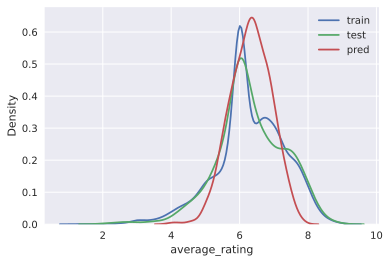

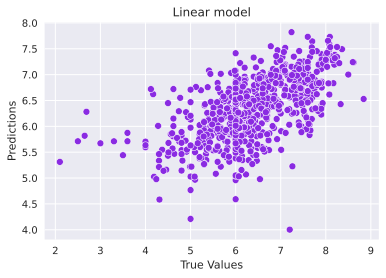

In [85]:
target_distr_linear(y_train, y_test, y_pred)   

In [86]:
calc_metrics(y_test, y_pred)

*** VAL **: 
MSE:   0.6197597131038733
RMSE:  0.7872481902830094
R2:    0.35922162509048794
MAE:   0.5978063170857414
MedAE: 0.47288330214426333
------------------------------


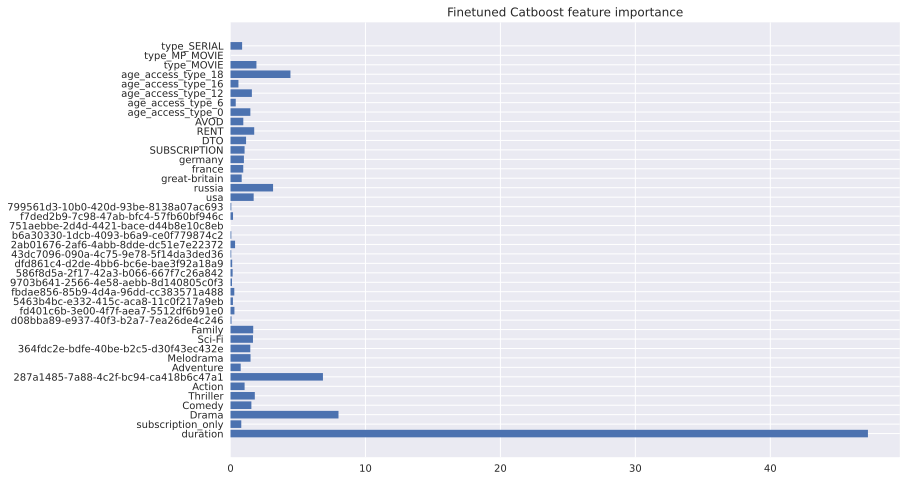

In [87]:
get_feature_imp(best_cat, train_dataset)

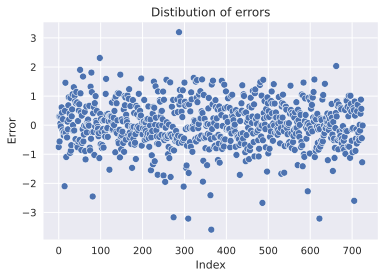

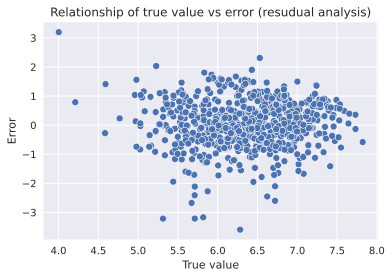

In [88]:
errors = y_test - y_pred
draw_res_analys(errors, y_pred)

# Other models

# KNN Regressor

In [91]:
def target_distr_linear(train_label, test_label, predicted_dv): 
    sns.kdeplot(train_label, label='train')
    sns.kdeplot(test_label, label='test')
    sns.kdeplot(predicted_dv, label='pred')
    plt.legend()
    plt.show()

    sns.scatterplot(test_label, predicted_dv, color='blueviolet')
    plt.title('Linear model')
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.show()

In [92]:
from scipy.stats import norm

def draw_histogram(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist);
    plt.xlabel("values")
    plt.title("Distribution") 

    mean=data.mean()

    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()

    plt.show()

In [93]:
from sklearn.inspection import permutation_importance

def get_fi_knn(model,X_train, y_train, top15=None):
    plt.figure(figsize=(25,9))
    coef_table = pd.DataFrame(list(X_train.columns)).copy()
    results = permutation_importance(model, X_train, y_train, scoring='neg_mean_absolute_error', n_repeats=1)

    importance = results.importances_mean
    coef_table.insert(len(coef_table.columns),"Coefs",np.abs(importance).transpose())

    if top15 =='yes':
        coef_table = coef_table.sort_values(by='Coefs', ascending=False)[:15]


    sns.barplot(x=0, y='Coefs', data=coef_table)
    plt.title('Feature importance')
    plt.xlabel('features')
    plt.ylabel('abs_weight')
    plt.xticks(rotation=65)
    plt.show()

In [94]:
def draw_res_analys(errors, pred):
    sns.scatterplot(list(range(len(errors))),errors);
    plt.title("Distibution of errors")
    plt.ylabel('Error');
    plt.xlabel('Index');
    plt.show();

    sns.scatterplot(pred,errors);
    plt.title('Relationship of true value vs error (resudual analysis)')
    plt.ylabel('Error');
    plt.xlabel('True value');
    plt.show();

In [95]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold

In [96]:
params = [
    {
        'n_neighbors': [i for i in range(2, 50, 2)],
        'weights': ['uniform', 'distance'],
        'leaf_size' : [2,5,10,30,50]
    }
]

In [97]:
knn_reg_model = KNeighborsRegressor()

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(knn_reg_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [98]:
%%time
gs.fit(X_train, y_train);

CPU times: user 245 ms, sys: 1.92 s, total: 2.17 s
Wall time: 4.19 s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=KNeighborsRegressor(), n_jobs=-1,
                   param_distributions=[{'leaf_size': [2, 5, 10, 30, 50],
                                         'n_neighbors': [2, 4, 6, 8, 10, 12, 14,
                                                         16, 18, 20, 22, 24, 26,
                                                         28, 30, 32, 34, 36, 38,
                                                         40, 42, 44, 46, 48],
                                         'weights': ['uniform', 'distance']}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [99]:
gs.best_params_

{'weights': 'uniform', 'n_neighbors': 32, 'leaf_size': 2}

In [102]:
knn_reg_model = KNeighborsRegressor(leaf_size=2, n_neighbors=32, weights='uniform')
knn_reg_model.fit(X_train, y_train)

KNeighborsRegressor(leaf_size=2, n_neighbors=32)

In [103]:
pred = knn_reg_model.predict(X_test)

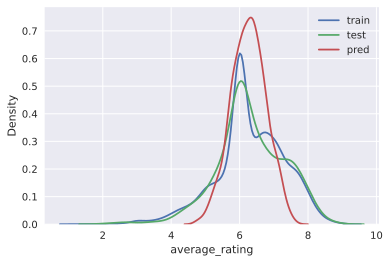

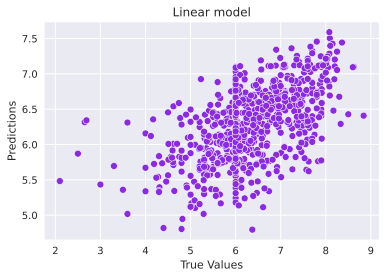

In [104]:
target_distr_linear(y_train, y_test, pred)   

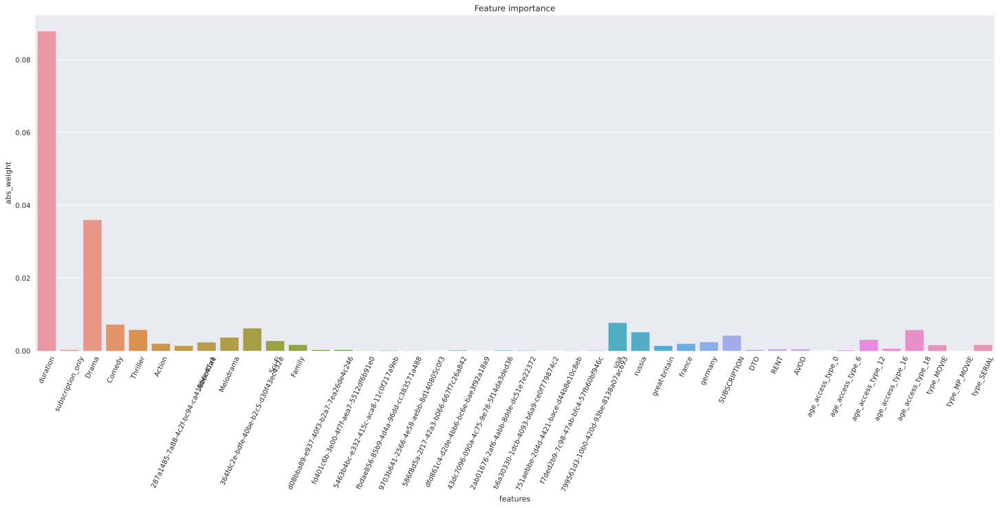

In [105]:
get_fi_knn(knn_reg_model, X_train, y_train)

**Detecting heteroscedasticity**

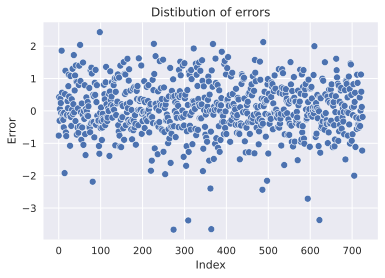

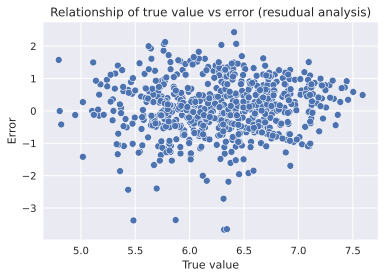

In [106]:
errors = y_test - pred
draw_res_analys(errors, pred)

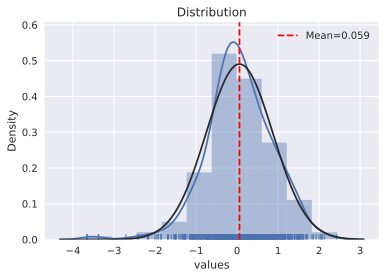

In [107]:
error = y_test - pred
draw_histogram(error)

In [108]:
calc_metrics(y_test, pred)

*** VAL **: 
MSE:   0.6648752344557076
RMSE:  0.8153988192631306
R2:    0.3125760464189705
MAE:   0.6178809400826446
MedAE: 0.4774999999999996
------------------------------


## Boosting Regressor - XGBRegressor

In [109]:
def get_feature_importance(model, top15=None):
    plt.figure(figsize=(12,8))
    coef_table = pd.DataFrame(list(X_train.columns)).copy()
    coef_table.insert(len(coef_table.columns),"Coefs",np.abs(model.feature_importances_).transpose())

    if top15 =='yes':
        coef_table = coef_table.sort_values(by='Coefs', ascending=False)[:15]


    sns.barplot(x=0, y='Coefs', data=coef_table)
    plt.title('Feature importance')
    plt.xlabel('features')
    plt.ylabel('abs_weight')
    plt.xticks(rotation=90)
    plt.show()

In [110]:
!pip install xgboost

In [111]:
import xgboost as xgb

In [112]:
params = [
              {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:squarederror'],
              'learning_rate': [.03, 0.05, .07],
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500, 1000]}
        ]

In [113]:
xgbr_model = xgb.XGBRegressor() 

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(xgbr_model, params, 
#                   n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [114]:
%%time
gs.fit(X_train, y_train)

CPU times: user 15min 16s, sys: 5.2 s, total: 15min 21s
Wall time: 3min 38s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, gamma=None,
                                          gpu_id=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_const...
                                          predictor=None, random_state=None,
                                          reg_alpha=None, reg_lambda=None, ...),
                   param_distributions=[{'colsample_bytree': [0.7],
                                         'learning_rate': [0.03, 0.05, 0.07],
                                         'max_depth': [5, 6, 7],
                                         'min_child_weight': [4],
                                         'n_estimators': [500, 1000],
                                         'nthread': [4],
                                         'objective': ['reg:squarederror'],
                                         'subsample': [0.7]}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [115]:
gs.best_params_

{'subsample': 0.7,
 'objective': 'reg:squarederror',
 'nthread': 4,
 'n_estimators': 500,
 'min_child_weight': 4,
 'max_depth': 6,
 'learning_rate': 0.03,
 'colsample_bytree': 0.7}

In [116]:
xgbr_model = xgb.XGBRegressor(colsample_bytree=0.7,
                              learning_rate=0.03,
                              max_depth=6,
                              min_child_weight=4,
                              n_estimators=500,
                              nthread=4,
                              objective ='reg:squarederror',
                              subsample=0.7) 
xgbr_model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.7,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.03, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=4,
             missing=nan, monotone_constraints='()', n_estimators=500, n_jobs=4,
             nthread=4, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, ...)

In [117]:
pred = xgbr_model.predict(X_test)

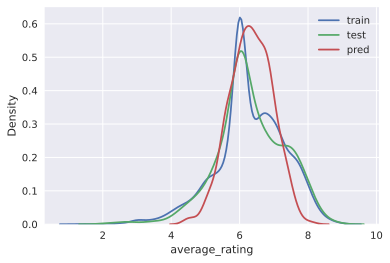

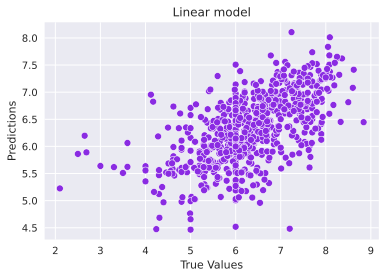

In [118]:
target_distr_linear(y_train, y_test, pred)   

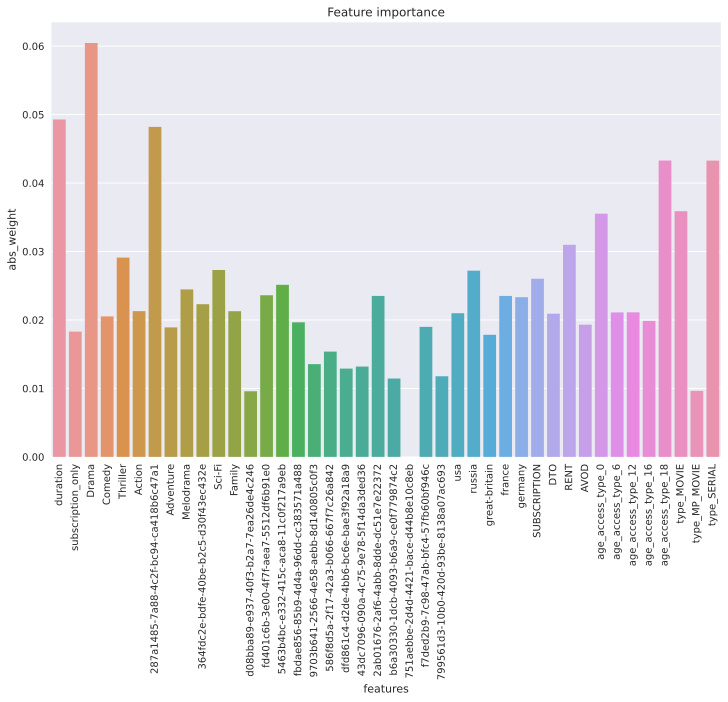

In [119]:
get_feature_importance(xgbr_model)

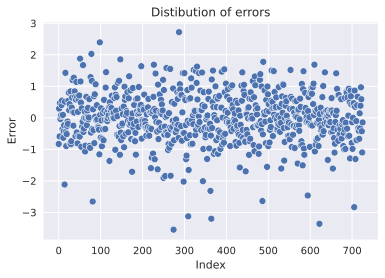

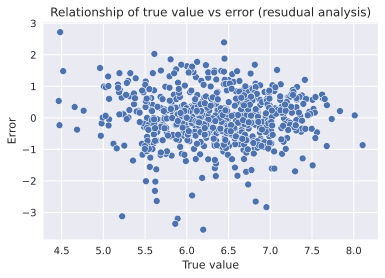

In [120]:
errors = y_test - pred
draw_res_analys(errors, pred) 

In [121]:
calc_metrics(y_test, pred)

*** VAL **: 
MSE:   0.6165642848489452
RMSE:  0.7852160752614182
R2:    0.36252542377413943
MAE:   0.5919364299721626
MedAE: 0.4636103439331052
------------------------------


## Random Forest

In [122]:
from sklearn.ensemble import RandomForestRegressor

In [123]:
params = [
    {
        'max_depth': range(20, 50),
        'n_estimators': range(100, 161)

    }
]

In [124]:
rf_model = RandomForestRegressor(random_state=42)

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(rf_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [125]:
%%time
gs.fit(X_train, y_train);

CPU times: user 3.05 s, sys: 2.47 s, total: 5.52 s
Wall time: 9.92 s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
                   param_distributions=[{'max_depth': range(20, 50),
                                         'n_estimators': range(100, 161)}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [126]:
gs.best_params_

{'n_estimators': 134, 'max_depth': 22}

In [127]:
rf_model = RandomForestRegressor(random_state=42, max_depth=22, n_estimators=134)
rf_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=22, n_estimators=134, random_state=42)

In [128]:
pred = rf_model.predict(X_test)

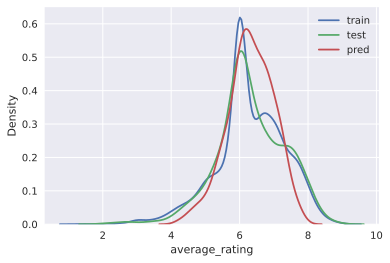

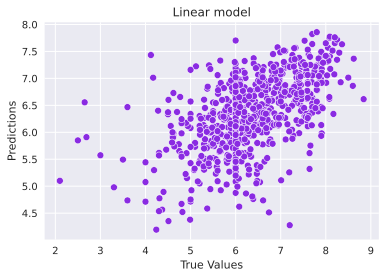

In [129]:
target_distr_linear(y_train, y_test, pred)   

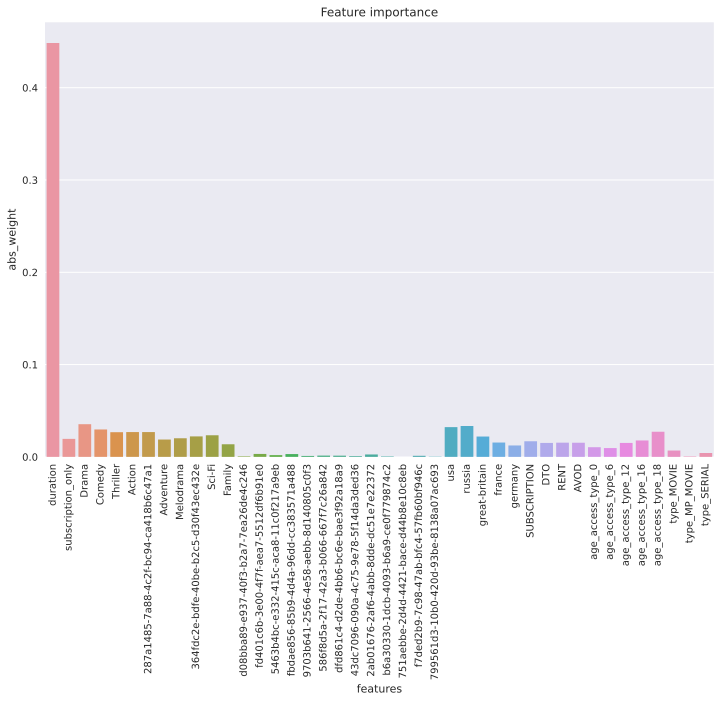

In [130]:
get_feature_importance(rf_model)

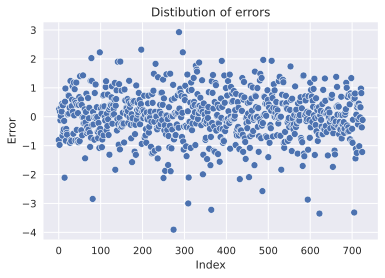

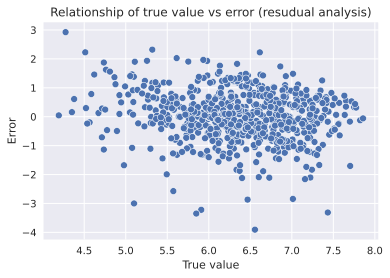

In [131]:
errors = y_test - pred

draw_res_analys(errors, pred) # 

In [132]:
calc_metrics(y_test, pred)

*** VAL **: 
MSE:   0.6949813827780247
RMSE:  0.8336554340841452
R2:    0.28144887182392586
MAE:   0.6234703250452182
MedAE: 0.47551705030752434
------------------------------


## SVM Regressor

In [133]:
from sklearn.svm import LinearSVR

In [134]:
params = [
    {
        'C': [0.001,0.01,0.1,1,10,100,1000],
        'tol' : [1e-4, 1e-3]
    }
]

In [135]:
svr_model = LinearSVR(random_state=42)

cv = KFold(n_splits=5, shuffle=True, random_state=42)
gs = RandomizedSearchCV(svr_model, params, 
                  n_jobs=-1, 
                  scoring=['neg_mean_absolute_error', 'r2'], 
                  refit='neg_mean_absolute_error', 
                  cv=cv)

In [136]:
%%time
gs.fit(X_train, y_train);

CPU times: user 185 ms, sys: 20.1 ms, total: 205 ms
Wall time: 1.5 s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=LinearSVR(random_state=42), n_jobs=-1,
                   param_distributions=[{'C': [0.001, 0.01, 0.1, 1, 10, 100,
                                               1000],
                                         'tol': [0.0001, 0.001]}],
                   refit='neg_mean_absolute_error',
                   scoring=['neg_mean_absolute_error', 'r2'])

In [137]:
gs.best_params_

{'tol': 0.0001, 'C': 0.1}

In [138]:
svr_model =  LinearSVR(C=0.1, tol=0.0001, random_state=42)
svr_model.fit(X_train, y_train)

LinearSVR(C=0.1, random_state=42)

In [139]:
pred = svr_model.predict(X_test)

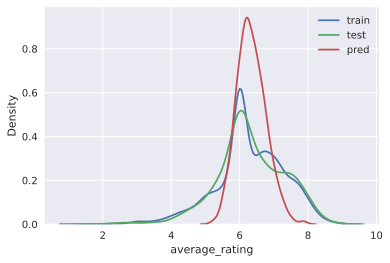

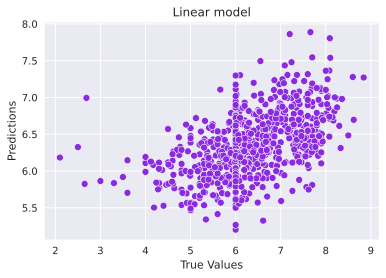

In [140]:
target_distr_linear(y_train, y_test, pred)  

In [141]:
def get_feat_imp_coef(model, top15=None):
    plt.figure(figsize=(25,9))
    coef_table = pd.DataFrame(list(X_train.columns)).copy()
    coef_table.insert(len(coef_table.columns),"Coefs",np.abs(model.coef_).transpose())

    if top15 =='yes':
        coef_table = coef_table.sort_values(by='Coefs', ascending=False)[:15]


    sns.barplot(x=0, y='Coefs', data=coef_table)
    plt.title('Feature importance')
    plt.xlabel('features')
    plt.ylabel('abs_weight')
    plt.xticks(rotation=65)
    plt.show()

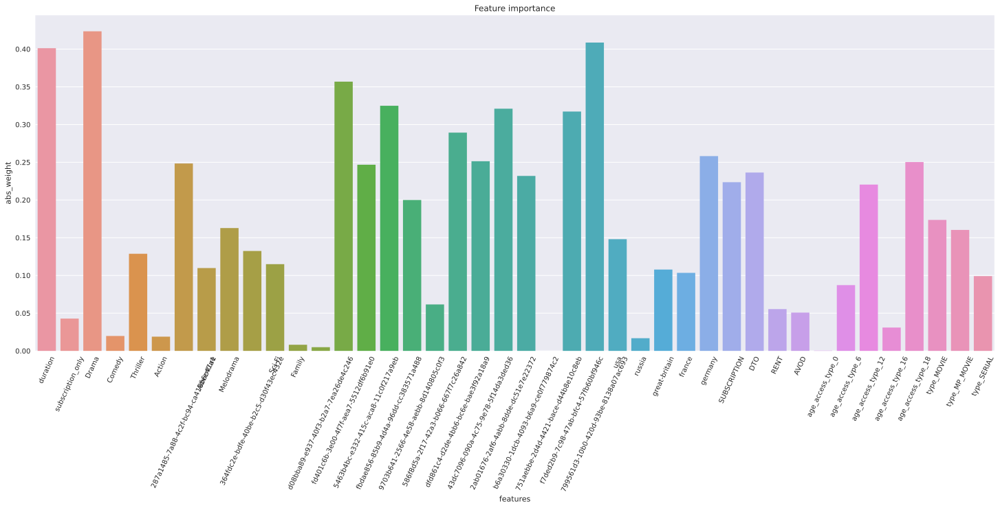

In [142]:
get_feat_imp_coef(svr_model)

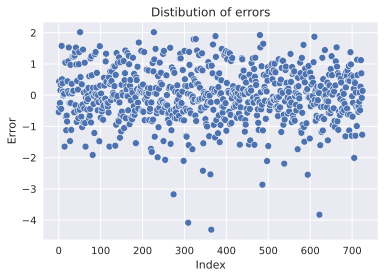

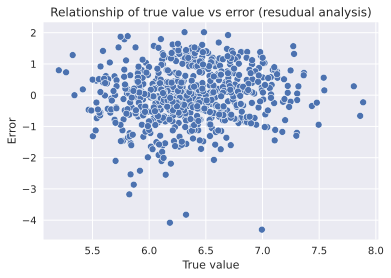

In [143]:
errors = y_test - pred
draw_res_analys(errors, pred)

In [144]:
calc_metrics(y_test, pred)

*** VAL **: 
MSE:   0.7294011825777297
RMSE:  0.854049871247417
R2:    0.24586175166423074
MAE:   0.6466396600636998
MedAE: 0.509509878875031
------------------------------


/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warning